In [1]:
import graph_tool.all as gt
import graph_tool.inference
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

# BTVote dataset

load the dataset, analyse a few key properties

## Load dataset

In [3]:
btvote = pd.read_stata("/home/Downloads/voting_behavior.dta")

In [10]:
btvote

,mp_id,lastname,firstname,party_det,ppg,party_text,elecper,office_spell,vote_id,vote_date,vote_beh,vote_deviate
0,30,Adenauer,Konrad,CDU (Christian Democratic Union),CDU/CSU,CDU,1,2,1001.0,1950-06-15,yes,no deviation
1,30,Adenauer,Konrad,CDU (Christian Democratic Union),CDU/CSU,CDU,1,2,1002.0,1950-07-14,excused absence,excused absence
2,30,Adenauer,Konrad,CDU (Christian Democratic Union),CDU/CSU,CDU,1,2,1003.0,1950-07-26,excused absence,excused absence
3,30,Adenauer,Konrad,CDU (Christian Democratic Union),CDU/CSU,CDU,1,2,1004.0,1951-06-08,unexcused absent,unexcused absent
4,30,Adenauer,Konrad,CDU (Christian Democratic Union),CDU/CSU,CDU,1,2,1005.0,1952-01-10,yes,no deviation
...,...,...,...,...,...,...,...,...,...,...,...,...
1127388,200011,Drexler,Gerhard,FDP (Free Democratic Party),FDP,FDP,17,1,17271.0,2013-06-27,no,no deviation
1127389,200011,Drexler,Gerhard,FDP (Free Democratic Party),FDP,FDP,17,1,17272.0,2013-06-27,no,no deviation
1127390,200011,Drexler,Gerhard,FDP (Free Democratic Party),FDP,FDP,17,1,17273.0,2013-06-27,no,no deviation
1127391,200011,Drexler,Gerhard,FDP (Free Democratic Party),FDP,FDP,17,1,17274.0,2013-06-27,no,no deviation


## number of votes and mps in each election period

In [331]:
for elecper in range(1, 17+1):
    nummps = len(btvote.loc[(btvote.elecper == elecper)].mp_id.unique())
    numvotes =  len(btvote.loc[(btvote.elecper == elecper)].vote_id.unique())
    print(elecper, ' election period: ', nummps, 'mps, ', numvotes, ' votes - votes/mp: ', numvotes/nummps)

1  election period:  461 mps,  133  votes - votes/mp:  0.2885032537960954
2  election period:  546 mps,  169  votes - votes/mp:  0.30952380952380953
3  election period:  557 mps,  46  votes - votes/mp:  0.08258527827648116
4  election period:  573 mps,  37  votes - votes/mp:  0.06457242582897033
5  election period:  547 mps,  24  votes - votes/mp:  0.043875685557586835
6  election period:  554 mps,  38  votes - votes/mp:  0.06859205776173286
7  election period:  545 mps,  55  votes - votes/mp:  0.10091743119266056
8  election period:  552 mps,  59  votes - votes/mp:  0.1068840579710145
9  election period:  537 mps,  26  votes - votes/mp:  0.048417132216014895
10  election period:  572 mps,  134  votes - votes/mp:  0.23426573426573427
11  election period:  697 mps,  218  votes - votes/mp:  0.3127690100430416
12  election period:  698 mps,  130  votes - votes/mp:  0.18624641833810887
13  election period:  692 mps,  180  votes - votes/mp:  0.26011560693641617
14  election period:  698 mps

## how prevalent is party deviation?

In [19]:
btvote.loc[(btvote.elecper == 17) & (btvote.vote_deviate != 'no deviation') & (btvote.vote_deviate != 'excused absence') & (btvote.vote_deviate != 'unexcused absent')]

,mp_id,lastname,firstname,party_det,ppg,party_text,elecper,office_spell,vote_id,vote_date,vote_beh,vote_deviate
957511,2683,Gehrcke,Wolfgang,"Left/PDS (The Left, previously Party of Democr...",Left/PDS,Linke,17,1,17228.0,2012-12-12,no,strong deviation
957522,2683,Gehrcke,Wolfgang,"Left/PDS (The Left, previously Party of Democr...",Left/PDS,Linke,17,1,17239.0,2013-01-17,abstain,weak deviation
957580,4888,Klose,Hans-Ulrich,SPD (Social Democratic Party of Germany),SPD,SPD,17,1,17022.0,2010-05-07,yes,strong deviation
957641,4888,Klose,Hans-Ulrich,SPD (Social Democratic Party of Germany),SPD,SPD,17,1,17085.0,2010-12-03,no,strong deviation
957646,4888,Klose,Hans-Ulrich,SPD (Social Democratic Party of Germany),SPD,SPD,17,1,17090.0,2010-12-03,abstain,weak deviation
...,...,...,...,...,...,...,...,...,...,...,...,...
1127120,200006,Wagner,Arfst,Greens,Greens,Grüne,17,1,17247.0,2013-03-01,abstain,weak deviation
1127128,200006,Wagner,Arfst,Greens,Greens,Grüne,17,1,17255.0,2013-04-25,no,strong deviation
1127238,200008,Todtenhausen,Manfred,FDP (Free Democratic Party),FDP,FDP,17,1,17214.0,2012-10-25,abstain,weak deviation
1127338,200010,Kieckbusch,Susanne,Greens,Greens,Grüne,17,1,17240.0,2013-01-31,no,strong deviation


In [21]:
btvote.vote_deviate.value_counts()

no deviation                                                         962867
excused absence                                                       68954
unexcused absent                                                      67976
strong deviation                                                      18956
weak deviation                                                         7977
no party line because no absolute majority within the party group       386
voting behavior not/wrongly protocolled                                 148
no party line due to tie within the party group                          82
invalid vote                                                             47
Name: vote_deviate, dtype: int64

## list of parties

In [242]:
mpparties.ppg.unique()

['CDU/CSU', 'other', 'SPD', 'FDP', 'Greens', 'Left/PDS']
Categories (6, object): ['SPD' < 'CDU/CSU' < 'FDP' < 'Greens' < 'Left/PDS' < 'other']

## vote activity of MPs

In [34]:
btvote.vote_beh.unique()

['yes', 'excused absence', 'unexcused absent', 'no', 'abstain', 'voting behavior not/wrongly protocolled', 'invalid vote']
Categories (7, object): ['excused absence' < 'yes' < 'no' < 'abstain' < 'unexcused absent' < 'invalid vote' < 'voting behavior not/wrongly protocolled']

In [54]:
def votequota(mp_id, elecper):
    voted = len(btvote.loc[(btvote.elecper==elecper) & (btvote.mp_id == mp_id) & ((btvote.vote_beh=='yes') | (btvote.vote_beh=='no') | (btvote.vote_beh=='abstain'))].vote_id)
    possiblevotes = len(btvote.loc[(btvote.elecper==elecper) & (btvote.mp_id == mp_id)].vote_id)
    return (1.0*voted)/possiblevotes

In [79]:
votequota17colours = []
votequotas = []
for mp_id in btvote.loc[btvote.elecper==17].mp_id.unique():
    votequotas.append(votequota(mp_id, 17))

maxvotequota = np.max(votequotas)
    
for mp_id in btvote.loc[btvote.elecper==17].mp_id.unique():
    quota = votequota(mp_id, 17)/maxvotequota
    votequota17colours.append([1-quota, quota, 0, 1.0])

### dissens quota

In [71]:
btvote.vote_deviate.unique()

['no deviation', 'excused absence', 'unexcused absent', 'no party line due to tie within the party group', 'strong deviation', 'weak deviation', 'no party line because no absolute majority wi..., 'voting behavior not/wrongly protocolled', 'invalid vote']
Categories (9, object): ['excused absence' < 'no deviation' < 'strong deviation' < 'weak deviation' ... 'invalid vote' < 'voting behavior not/wrongly protocolled' < 'no party line due to tie within the party group' < 'no party line because no absolute majority wi...]

In [72]:
def dissensquota(mp_id, elecper):
    dissented = len(btvote.loc[(btvote.elecper==elecper) & (btvote.mp_id == mp_id) & ((btvote.vote_deviate=='strong deviation') | (btvote.vote_deviate=='weak deviation'))].vote_id)
    possiblevotes = len(btvote.loc[(btvote.elecper==elecper) & (btvote.mp_id == mp_id)].vote_id)
    return (1.0*dissented)/possiblevotes

In [78]:
dissensquotas = []
for mp_id in btvote.loc[btvote.elecper==17].mp_id.unique():
    dissensquotas.append(dissensquota(mp_id, 17))

maxdissens = np.max(dissensquotas)

dissensquota17colours = []
for mp_id in btvote.loc[btvote.elecper==17].mp_id.unique():
    quota = 1 - (dissensquota(mp_id, 17)/maxdissens)
    dissensquota17colours.append([quota, 1-quota, 0.0, 1.0])

# Bayesian SBM inference from Ising Dynamics

## prepare the graph

In [ ]:
def mapvote(row):
    """map voting behaviour of MP to """
    if row.vote_beh == 'yes':
        row.vote_beh = 1
    elif row.vote_beh == 'no':
        row.vote_beh = -1
    else:
        row.vote_beh = 0
    return row

In [5]:
def mp_graph_electionperiod(electionperiod):
    """construct a graph representation of all mps from the btvote dataset with the color of their party and their voting behaviour mapped to an Ising time-series as vertex properties"""
    g = gt.Graph()
    
    # get the mp_id for all mps that have member of parliament for some amount of time during the electionperiod and who voted at least once
    mp_ids = list(btvote.loc[btvote.elecper==electionperiod].mp_id.unique())
    g.add_vertex(len(mp_ids))
    mp_id_propmap = g.new_vertex_property("int", vals=mp_ids)
    g.vertex_properties["mp_id"] = mp_id_propmap
    
    # create a property map that contains the time series voting behaviour of each mp
    votingbeh_propmap = g.new_vertex_property("vector<int>")
    votingdata = btvote.loc[btvote.elecper==electionperiod].loc[:, ['mp_id', 'vote_id', 'vote_beh']].apply(mapvote, axis='columns')
    votes = list(votingdata.vote_id.unique())
    
    # create a property map with the color of the mp's party; for easy plotting later
    partycolor_propmap = g.new_vertex_property("vector<float>")
    mpparties = btvote.loc[:,['mp_id', 'ppg']]
    
    for mpvertex, mp_id in zip(g.vertices(), mp_ids):
        
        #determine party for color of vertex
        party = mpparties.loc[mpparties.mp_id==mp_id].ppg.unique()
        if len(party) == 1:
            if party == ['FDP']:
                partycolor_propmap[mpvertex] = [1, 1, 0, 1]
            elif party == ['CDU/CSU']:
                partycolor_propmap[mpvertex] = [0, 0, 0, 1]
            elif party == ['SPD']:
                partycolor_propmap[mpvertex] = [1, 0, 0, 1]
            elif party == ['Greens']:
                partycolor_propmap[mpvertex] = [0, 1, 0, 1]
            elif party == ['Left/PDS']:
                partycolor_propmap[mpvertex] = [1, 0, 1, 1]
            else: #ie was not part of any of the major parties
                print('strange party affiliation:', mp_id, party)
                partycolor_propmap[mpvertex] = [1, 1, 1, 1]
        else: #ie switched parties, had no party affiliation, other edge cases
            print('strange party affiliation:', mp_id, party)
            partycolor_propmap[mpvertex] = [1, 1, 1, 1]
    
        #determine how this mp has voted, ie compute time series of votes for this period
        votesforthismp = votingdata.loc[votingdata.mp_id == mp_id]
        thismptimeseries = []
        for vote_id in votes:
            ret = votesforthismp.loc[votingdata.vote_id == vote_id, 'vote_beh']
            if len(ret) == 1:
                thismptimeseries.append(ret.item())
            elif len(ret) == 0:
                thismptimeseries.append(0)
            else:
                raise Exception('Error in dataset: MP can vote only once', len(ret))
        votingbeh_propmap[mpvertex] = thismptimeseries
    
    g.vertex_properties["votingbeh"] = votingbeh_propmap
    g.vertex_properties["partycolor"] = partycolor_propmap
    return mp_ids, g

## Convenience functions

In [6]:
distinctcolors19 = [0.9019607843137255, 0.09803921568627451, 0.29411764705882354, 1.0] ,[0.23529411764705882, 0.7058823529411765, 0.29411764705882354, 1.0] ,[1.0, 0.8823529411764706, 0.09803921568627451, 1.0] ,[0.0, 0.5098039215686274, 0.7843137254901961, 1.0] ,[0.9607843137254902, 0.5098039215686274, 0.18823529411764706, 1.0] ,[0.5686274509803921, 0.11764705882352941, 0.7058823529411765, 1.0] ,[0.27450980392156865, 0.9411764705882353, 0.9411764705882353, 1.0] ,[0.9411764705882353, 0.19607843137254902, 0.9019607843137255, 1.0] ,[0.8235294117647058, 0.9607843137254902, 0.23529411764705882, 1.0] ,[0.9803921568627451, 0.7450980392156863, 0.8313725490196079, 1.0] ,[0.0, 0.5019607843137255, 0.5019607843137255, 1.0] ,[0.8627450980392157, 0.7450980392156863, 1.0, 1.0] ,[0.6666666666666666, 0.43137254901960786, 0.1568627450980392, 1.0] ,[1.0, 0.9803921568627451, 0.7843137254901961, 1.0] ,[0.5019607843137255, 0.0, 0.0, 1.0] ,[0.6666666666666666, 1.0, 0.7647058823529411, 1.0] ,[0.5019607843137255, 0.5019607843137255, 0.0, 1.0] ,[1.0, 0.8431372549019608, 0.7058823529411765, 1.0] ,[0.0, 0.0, 0.5019607843137255, 1.0] ,[0.5019607843137255, 0.5019607843137255, 0.5019607843137255, 1.0]
def mapcolor(i):
    """maps an integer in [0, 19] to a distinct rgba (normed to [0.0, 1.0] each) color"""
    if i < 20:
        return distinctcolors19[i]
    else:
        raise Exception('color could not be mapped')

## Election period 17 simulations

In [7]:
allmps17, g17 = mp_graph_electionperiod(17)

strange party affiliation: 120752 ['SPD', 'Left/PDS']
Categories (2, object): ['SPD' < 'Left/PDS']
strange party affiliation: 121081 ['SPD', 'Left/PDS']
Categories (2, object): ['SPD' < 'Left/PDS']


652
<Graph object, directed, with 652 vertices and 0 edges, 3 internal vertex properties, at 0x7f78555c67c0>
mp_id          (vertex)  (type: int32_t)
partycolor     (vertex)  (type: vector<double>)
votingbeh      (vertex)  (type: vector<int32_t>)


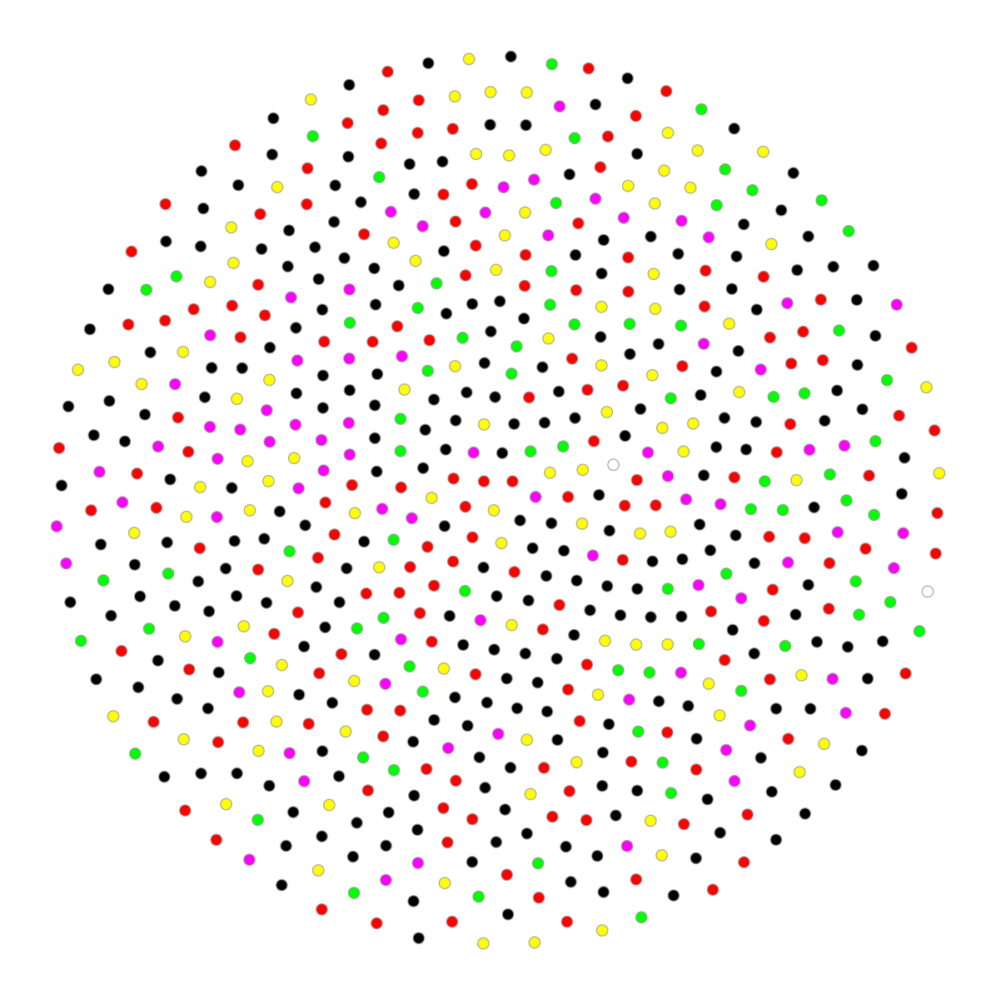

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f78555c67c0, at 0x7f78546d3f40>

In [8]:
print(len(allmps17))
print(g17)
g17.list_properties()
gt.graph_draw(g17, vertex_fill_color=g17.vp['partycolor'])

### PseudoLikelihood SBM (non-nested) reconstruction 

#### non-degree corrected

In [13]:
# prepare the reconstruction from Ising timeseries, do not use degree correction
state17nonnestedpseudonondegcorr = gt.PseudoIsingBlockState(g17, s=g17.vertex_properties['votingbeh'], beta=0.1, has_zero=True, nested=False,
                                                            state_args=dict(deg_corr=False))

In [14]:
# mcmc equilibrate, so bs17nonnestedpseudonondegcorr, which are collected next can be used for marginal/maximal determination of b
for i in range(0, 1000):
    state17nonnestedpseudonondegcorr.mcmc_sweep()

In [15]:
# prepare mcmc equilibrate, collect_marginals_17nonnestedpseudonondegcorr will be callback after each mcmc_sweep in mcmc_equilibrate
gm17nonnestedpseudonondegcorr = None # contains final network reconstruction
bs17nonnestedpseudonondegcorr = [] # contains block association after each mcmc_sweep in mcmc_equilibrate
numgroupsnonnestedpseudonondegcorr = np.zeros(g17.num_vertices() + 1) #count a histogram of how many blocks were determined
def collect_marginals_17nonnestedpseudonondegcorr(s):
    global gm17nonnestedpseudonondegcorr, bs17nonnestedpseudonondegcorr
    gm17nonnestedpseudonondegcorr = s.collect_marginal(gm17nonnestedpseudonondegcorr)
    bs17nonnestedpseudonondegcorr.append(s.bstate.b.a.copy())
    numgroupsnonnestedpseudonondegcorr[s.get_block_state().get_nonempty_B()] += 1

In [16]:
# repeatedly call mcmc_sweep, until there is no new entropy extremum for 1000 steps
entropy17nonnestedpseudonondegcorr, nattempts, nmoves = gt.mcmc_equilibrate(state17nonnestedpseudonondegcorr, max_niter=50000,
                                                        mcmc_args=dict(niter=10, xstep=0),
                                                        callback=collect_marginals_17nonnestedpseudonondegcorr)
print('entropy: ', entropy17nonnestedpseudonondegcorr)

entropy:  77404.09735276547


In [17]:
partitionmode17nonnestedpseudonondegcorr = gt.PartitionModeState(bs17nonnestedpseudonondegcorr)

In [18]:
bspropmap_17nonnestedpseudonondegcorr_max = partitionmode17nonnestedpseudonondegcorr.get_max(gm17nonnestedpseudonondegcorr)
bspropmap_17nonnestedpseudonondegcorr_marginal = partitionmode17nonnestedpseudonondegcorr.get_marginal(gm17nonnestedpseudonondegcorr)

In [19]:
# determine spring layout so communites / blocks are well visualised later
pos_nondegcorr=gt.sfdp_layout(gm17nonnestedpseudonondegcorr,
                   groups=bspropmap_17nonnestedpseudonondegcorr_max,
                   eweight=gm17nonnestedpseudonondegcorr.ep['eprob'],
                   mu=50.0, mu_p=2, gamma=0, K=100, C=100.0)

In [86]:
# vertex color is the color of party of mp
gt.graph_draw(gm17nonnestedpseudonondegcorr,
              pos=pos_nondegcorr,
              vertex_fill_color=gm17nonnestedpseudonondegcorr.own_property(g17.vp['partycolor']),
              vertex_size=8, output_size=(800, 800), 
              output="~/17period/par-50k/nondegcorr-parties.pdf",
              edge_color=[0, 0, 0, 0.2],
              edge_pen_width=gt.prop_to_size(gm17nonnestedpseudonondegcorr.ep['eprob'], 0, 0.4))
# draw same graph, but vertex color is now maximal inferred b
gt.graph_draw(gm17nonnestedpseudonondegcorr,
              pos=pos_nondegcorr,
              vertex_fill_color=gm17nonnestedpseudonondegcorr.new_vertex_property('vector<float>', list(map(mapcolor, list(bspropmap_17nonnestedpseudonondegcorr_max)))),
              vertex_size=8, output_size=(800, 800),
              output="~/17period/par-50k/nondegcorr-maxbs.pdf",
              edge_color=[0, 0, 0, 0.2],
              edge_pen_width=gt.prop_to_size(gm17nonnestedpseudonondegcorr.ep['eprob'], 0, 0.4))
# draw same graph, but vertex color is pie chart of marginal b
gt.graph_draw(gm17nonnestedpseudonondegcorr,
              pos=pos_nondegcorr,
              vertex_shape='pie',
              vertex_pie_fractions=bspropmap_17nonnestedpseudonondegcorr_marginal,
              vertex_size=8, output_size=(800, 800),
              output="~/17period/par-50k/nondegcorr-marginalbs.pdf",
              edge_color=[0, 0, 0, 0.2],
              edge_pen_width=gt.prop_to_size(gm17nonnestedpseudonondegcorr.ep['eprob'], 0, 0.4))

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f7854739070, at 0x7f784e916e20>

#### degree corrected

In [21]:
# prepare the reconstruction from Ising timeseries, do not use degree correction
state17nonnestedpseudodegcorr = gt.PseudoIsingBlockState(g17, s=g17.vertex_properties['votingbeh'], beta=0.1, has_zero=True, nested=False,
                                                            state_args=dict(deg_corr=True))

In [22]:
# mcmc equilibrate, so bs17nonnestedpseudodegcorr, which are collected next can be used for marginal/maximal determination of b
for i in range(0, 1000):
    state17nonnestedpseudodegcorr.mcmc_sweep()

In [23]:
# prepare mcmc equilibrate, collect_marginals_17nonnestedpseudodegcorr will be callback after each mcmc_sweep in mcmc_equilibrate
gm17nonnestedpseudodegcorr = None # contains final network reconstruction
bs17nonnestedpseudodegcorr = [] # contains block association after each mcmc_sweep in mcmc_equilibrate
numgroupsnonnestedpseudodegcorr = np.zeros(g17.num_vertices() + 1) #count a histogram of how many blocks were determined
def collect_marginals_17nonnestedpseudodegcorr(s):
    global gm17nonnestedpseudodegcorr, bs17nonnestedpseudodegcorr
    gm17nonnestedpseudodegcorr = s.collect_marginal(gm17nonnestedpseudodegcorr)
    bs17nonnestedpseudodegcorr.append(s.bstate.b.a.copy())
    numgroupsnonnestedpseudodegcorr[s.get_block_state().get_nonempty_B()] += 1

In [24]:
# repeatedly call mcmc_sweep, until there is no new entropy extremum for 1000 steps
entropy17nonnestedpseudodegcorr, nattempts, nmoves = gt.mcmc_equilibrate(state17nonnestedpseudodegcorr, max_niter=50000,
                                                        mcmc_args=dict(niter=10, xstep=0),
                                                        callback=collect_marginals_17nonnestedpseudodegcorr)
print('entropy: ', entropy17nonnestedpseudodegcorr)

entropy:  79449.86213524353


In [25]:
partitionmode17nonnestedpseudodegcorr = gt.PartitionModeState(bs17nonnestedpseudodegcorr)

In [26]:
bspropmap_17nonnestedpseudodegcorr_max = partitionmode17nonnestedpseudodegcorr.get_max(gm17nonnestedpseudodegcorr)
bspropmap_17nonnestedpseudodegcorr_marginal = partitionmode17nonnestedpseudodegcorr.get_marginal(gm17nonnestedpseudodegcorr)

In [27]:
# determine spring layout so communites / blocks are well visualised later
pos_degcorr=gt.sfdp_layout(gm17nonnestedpseudodegcorr,
                   groups=bspropmap_17nonnestedpseudodegcorr_max,
                   eweight=gm17nonnestedpseudodegcorr.ep['eprob'],
                   mu=50.0, mu_p=2, gamma=0, K=100, C=100.0)

In [88]:
# vertex color is the color of party of mp
gt.graph_draw(gm17nonnestedpseudodegcorr,
              pos=pos_degcorr,
              vertex_fill_color=gm17nonnestedpseudodegcorr.own_property(g17.vp['partycolor']),
              output="~/17period/par-50k/degcorr-parties.pdf",
              vertex_size=8, output_size=(800, 800),
              edge_color=[0, 0, 0, 0.2],
              edge_pen_width=gt.prop_to_size(gm17nonnestedpseudodegcorr.ep['eprob'], 0, 0.4))
# draw same graph, but vertex color is now maximal inferred b
gt.graph_draw(gm17nonnestedpseudodegcorr,
              pos=pos_degcorr,
              vertex_fill_color=gm17nonnestedpseudodegcorr.new_vertex_property('vector<float>', list(map(mapcolor, list(bspropmap_17nonnestedpseudodegcorr_max)))),
              output="~/17period/par-50k/degcorr-maxbs.pdf",
              vertex_size=8, output_size=(800, 800),
              edge_color=[0, 0, 0, 0.2],
              edge_pen_width=gt.prop_to_size(gm17nonnestedpseudodegcorr.ep['eprob'], 0, 0.4))
# draw same graph, but vertex color is pie chart of marginal b
gt.graph_draw(gm17nonnestedpseudodegcorr,
              pos=pos_degcorr,
              vertex_shape='pie',
              vertex_pie_fractions=bspropmap_17nonnestedpseudodegcorr_marginal,
              output="~/17period/par-50k/degcorr-marginalbs.pdf",
              vertex_size=8, output_size=(800, 800),
              edge_color=[0, 0, 0, 0.2],
              edge_pen_width=gt.prop_to_size(gm17nonnestedpseudodegcorr.ep['eprob'], 0, 0.4))

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f7854886040, at 0x7f784e460ca0>

##### votequota comparison

In [89]:
gt.graph_draw(gm17nonnestedpseudodegcorr,
              pos=pos_degcorr,
              vertex_fill_color=gm17nonnestedpseudodegcorr.new_vertex_property('vector<float>', votequota17colours),
              output="~/17period/par-50k/degcorr-votequotas.pdf",
              vertex_size=8, output_size=(800, 800),
              edge_color=[0, 0, 0, 0.2],
              edge_pen_width=gt.prop_to_size(gm17nonnestedpseudodegcorr.ep['eprob'], 0, 0.4))

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f7854886040, at 0x7f784e9f6cd0>

#### quota - different than party line

In [92]:
gt.graph_draw(gm17nonnestedpseudodegcorr,
              pos=pos_degcorr,
              vertex_fill_color=gm17nonnestedpseudodegcorr.new_vertex_property('vector<float>', dissensquota17colours),
              output="~/17period/par-50k/degcorr-dissensquotas.pdf",
              vertex_size=8, output_size=(800, 800),
              edge_color=[0, 0, 0, 0.2],
              edge_pen_width=gt.prop_to_size(gm17nonnestedpseudodegcorr.ep['eprob'], 0, 0.4))

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f7854886040, at 0x7f784e40f7c0>

#### inference of number of groups

In [ ]:
f = plt.figure()
plt.ylabel('P(B|D)')
plt.xlabel('B')
plt.bar(range(0, 10), (numgroupsnonnestedpseudodegcorr/np.sum(numgroupsnonnestedpseudodegcorr))[0:10])
plt.show()
f.savefig('grouphist-degcorr.pdf', bbox_inches='tight')

## Simulated annealing

#### degree corrected - simulated annealing

In [19]:
# prepare the reconstruction from Ising timeseries, do not use degree correction
state17nonnestedpseudodegcorranneal = gt.PseudoIsingBlockState(g17, s=g17.vertex_properties['votingbeh'], beta=0.1, has_zero=True, nested=False,
                                                            state_args=dict(deg_corr=True))

In [20]:
# prepare mcmc equilibrate, collect_marginals_17nonnestedpseudodegcorr will be callback after each mcmc_sweep in mcmc_equilibrate
gm17nonnestedpseudodegcorranneal = None # contains final network reconstruction
bs17nonnestedpseudodegcorranneal = [] # contains block association after each mcmc_sweep in mcmc_equilibrate
numgroupsnonnestedpseudodegcorranneal = np.zeros(g17.num_vertices() + 1) #count a histogram of how many blocks were determined
def collect_marginals_17nonnestedpseudodegcorr_anneal(s):
    global gm17nonnestedpseudodegcorranneal, bs17nonnestedpseudodegcorranneal, numgroupsnonnestedpseudodegcorranneal
    gm17nonnestedpseudodegcorranneal = s.collect_marginal(gm17nonnestedpseudodegcorranneal)
    bs17nonnestedpseudodegcorranneal.append(s.bstate.b.a.copy())
    numgroupsnonnestedpseudodegcorranneal[s.get_block_state().get_nonempty_B()] += 1

In [ ]:
entropyannealdegcorr, nattemptsannealdegcorr, nmovesannealdegcorr = gt.mcmc_anneal(state17nonnestedpseudodegcorranneal, 
                                                                                   mcmc_equilibrate_args=dict(mcmc_args=dict(niter=10, xstep=0),
                                                                                                              callback=collect_marginals_17nonnestedpseudodegcorr_anneal),
                                                                                   verbose=True)

β:  1.00000  niter:     1  count:    0  breaks:  0  min_S: 190337.71  max_S: 196987.66  S: 190337.71  ΔS:     -6649.95  moves:  1030 
β:  1.00000  niter:     2  count:    1  breaks:  0  min_S: 190337.71  max_S: 196987.66  S: 190854.87  ΔS:      517.154  moves:  9906 


/home/max/anaconda3/envs/gt/lib/python3.9/site-packages/graph_tool/inference/uncertain_blockmodel.py:998: RuntimeWarning: invalid value encountered in sqrt
  g.ep.xdev.fa = sqrt(g.ep.x2sum.fa / g.gp.count - g.ep.x.fa ** 2)


β:  1.00000  niter:     3  count:    0  breaks:  0  min_S: 183730.69  max_S: 196987.66  S: 183730.69  ΔS:     -7124.17  moves:  1223 
β:  1.00000  niter:     4  count:    1  breaks:  0  min_S: 183730.69  max_S: 196987.66  S: 183801.96  ΔS:      71.2664  moves:  2832 
β:  1.00000  niter:     5  count:    2  breaks:  0  min_S: 183730.69  max_S: 196987.66  S: 183746.69  ΔS:     -55.2657  moves:  1141 
β:  1.00000  niter:     6  count:    3  breaks:  0  min_S: 183730.69  max_S: 196987.66  S: 183746.37  ΔS:    -0.326310  moves:  1158 
β:  1.00000  niter:     7  count:    0  breaks:  0  min_S: 181078.44  max_S: 196987.66  S: 181078.44  ΔS:     -2667.93  moves:  1429 
β:  1.00000  niter:     8  count:    0  breaks:  0  min_S: 180326.47  max_S: 196987.66  S: 180326.47  ΔS:     -751.969  moves:  1532 
β:  1.00000  niter:     9  count:    0  breaks:  0  min_S: 180292.81  max_S: 196987.66  S: 180292.81  ΔS:     -33.6527  moves:   945 
β:  1.00000  niter:    10  count:    0  breaks:  0  min_S: 179

β:  1.00000  niter:    65  count:    0  breaks:  0  min_S: 127374.34  max_S: 196987.66  S: 127374.34  ΔS:     -1046.47  moves:  1001 
β:  1.00000  niter:    66  count:    1  breaks:  0  min_S: 127374.34  max_S: 196987.66  S: 127432.96  ΔS:      58.6142  moves:  1081 
β:  1.00000  niter:    67  count:    2  breaks:  0  min_S: 127374.34  max_S: 196987.66  S: 127382.89  ΔS:     -50.0661  moves:  1051 
β:  1.00000  niter:    68  count:    3  breaks:  0  min_S: 127374.34  max_S: 196987.66  S: 127405.48  ΔS:      22.5873  moves:  2329 
β:  1.00000  niter:    69  count:    0  breaks:  0  min_S: 125613.26  max_S: 196987.66  S: 125613.26  ΔS:     -1792.22  moves:  1058 
β:  1.00000  niter:    70  count:    1  breaks:  0  min_S: 125613.26  max_S: 196987.66  S: 125615.25  ΔS:      1.99248  moves:  1140 
β:  1.00000  niter:    71  count:    0  breaks:  0  min_S: 125276.95  max_S: 196987.66  S: 125276.95  ΔS:     -338.301  moves:  1021 
β:  1.00000  niter:    72  count:    0  breaks:  0  min_S: 124

β:  1.00000  niter:   128  count:    0  breaks:  0  min_S: 115164.91  max_S: 196987.66  S: 115164.91  ΔS:     -97.3093  moves:  6545 
β:  1.00000  niter:   129  count:    0  breaks:  0  min_S: 114364.84  max_S: 196987.66  S: 114364.84  ΔS:     -800.072  moves:  1038 
β:  1.00000  niter:   130  count:    0  breaks:  0  min_S: 113680.88  max_S: 196987.66  S: 113680.88  ΔS:     -683.960  moves:  1119 
β:  1.00000  niter:   131  count:    1  breaks:  0  min_S: 113680.88  max_S: 196987.66  S: 113705.86  ΔS:      24.9867  moves:   420 
β:  1.00000  niter:   132  count:    2  breaks:  0  min_S: 113680.88  max_S: 196987.66  S: 113718.18  ΔS:      12.3162  moves:  7828 
β:  1.00000  niter:   133  count:    3  breaks:  0  min_S: 113680.88  max_S: 196987.66  S: 113733.32  ΔS:      15.1385  moves:  2620 
β:  1.00000  niter:   134  count:    4  breaks:  0  min_S: 113680.88  max_S: 196987.66  S: 113731.07  ΔS:     -2.25024  moves:   514 
β:  1.00000  niter:   135  count:    0  breaks:  0  min_S: 113

β:  1.00000  niter:   190  count:    3  breaks:  0  min_S: 107686.78  max_S: 196987.66  S: 107790.93  ΔS:      22.6886  moves:   235 
β:  1.00000  niter:   191  count:    0  breaks:  0  min_S: 107574.75  max_S: 196987.66  S: 107574.75  ΔS:     -216.180  moves:  1124 
β:  1.00000  niter:   192  count:    1  breaks:  0  min_S: 107574.75  max_S: 196987.66  S: 107576.07  ΔS:      1.32834  moves:     3 
β:  1.00000  niter:   193  count:    2  breaks:  0  min_S: 107574.75  max_S: 196987.66  S: 107610.39  ΔS:      34.3135  moves:  2400 
β:  1.00000  niter:   194  count:    3  breaks:  0  min_S: 107574.75  max_S: 196987.66  S: 107577.54  ΔS:     -32.8505  moves:  2948 
β:  1.00000  niter:   195  count:    0  breaks:  0  min_S: 107547.42  max_S: 196987.66  S: 107547.42  ΔS:     -30.1120  moves:   206 
β:  1.00000  niter:   196  count:    1  breaks:  0  min_S: 107547.42  max_S: 196987.66  S: 107578.74  ΔS:      31.3146  moves:  9844 
β:  1.00000  niter:   197  count:    2  breaks:  0  min_S: 107

β:  1.00000  niter:   253  count:    1  breaks:  0  min_S: 103754.97  max_S: 196987.66  S: 103754.97  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:   254  count:    2  breaks:  0  min_S: 103754.97  max_S: 196987.66  S: 103763.85  ΔS:      8.88211  moves:   390 
β:  1.00000  niter:   255  count:    0  breaks:  0  min_S: 103613.32  max_S: 196987.66  S: 103613.32  ΔS:     -150.537  moves:   985 
β:  1.00000  niter:   256  count:    0  breaks:  0  min_S: 103499.21  max_S: 196987.66  S: 103499.21  ΔS:     -114.106  moves:  1053 
β:  1.00000  niter:   257  count:    1  breaks:  0  min_S: 103499.21  max_S: 196987.66  S: 103503.33  ΔS:      4.11973  moves:  2138 
β:  1.00000  niter:   258  count:    2  breaks:  0  min_S: 103499.21  max_S: 196987.66  S: 103503.33  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:   259  count:    0  breaks:  0  min_S: 103367.77  max_S: 196987.66  S: 103367.77  ΔS:     -135.560  moves:  1016 
β:  1.00000  niter:   260  count:    0  breaks:  0  min_S: 103

β:  1.00000  niter:   315  count:    4  breaks:  0  min_S: 100740.50  max_S: 196987.66  S: 100761.84  ΔS:      13.6703  moves:  3562 
β:  1.00000  niter:   316  count:    5  breaks:  0  min_S: 100740.50  max_S: 196987.66  S: 100755.86  ΔS:     -5.97684  moves:  3590 
β:  1.00000  niter:   317  count:    0  breaks:  0  min_S: 100737.36  max_S: 196987.66  S: 100737.36  ΔS:     -18.5038  moves:  3351 
β:  1.00000  niter:   318  count:    1  breaks:  0  min_S: 100737.36  max_S: 196987.66  S: 100759.48  ΔS:      22.1267  moves:   362 
β:  1.00000  niter:   319  count:    2  breaks:  0  min_S: 100737.36  max_S: 196987.66  S: 100761.73  ΔS:      2.24368  moves:  2688 
β:  1.00000  niter:   320  count:    0  breaks:  0  min_S: 100735.59  max_S: 196987.66  S: 100735.59  ΔS:     -26.1383  moves:  3336 
β:  1.00000  niter:   321  count:    1  breaks:  0  min_S: 100735.59  max_S: 196987.66  S: 100738.18  ΔS:      2.59515  moves:  2359 
β:  1.00000  niter:   322  count:    2  breaks:  0  min_S: 100

β:  1.00000  niter:   377  count:    0  breaks:  0  min_S: 99099.846  max_S: 196987.66  S: 99099.846  ΔS:     -6.72731  moves:   386 
β:  1.00000  niter:   378  count:    0  breaks:  0  min_S: 99062.771  max_S: 196987.66  S: 99062.771  ΔS:     -37.0759  moves:  1296 
β:  1.00000  niter:   379  count:    0  breaks:  0  min_S: 98899.988  max_S: 196987.66  S: 98899.988  ΔS:     -162.783  moves:  1250 
β:  1.00000  niter:   380  count:    1  breaks:  0  min_S: 98899.988  max_S: 196987.66  S: 98992.685  ΔS:      92.6970  moves:  1271 
β:  1.00000  niter:   381  count:    0  breaks:  0  min_S: 98782.270  max_S: 196987.66  S: 98782.270  ΔS:     -210.415  moves:  1280 
β:  1.00000  niter:   382  count:    0  breaks:  0  min_S: 98766.518  max_S: 196987.66  S: 98766.518  ΔS:     -15.7517  moves:  1368 
β:  1.00000  niter:   383  count:    1  breaks:  0  min_S: 98766.518  max_S: 196987.66  S: 98786.392  ΔS:      19.8743  moves:  1291 
β:  1.00000  niter:   384  count:    2  breaks:  0  min_S: 987

β:  1.00000  niter:   439  count:    3  breaks:  0  min_S: 97232.349  max_S: 196987.66  S: 97245.558  ΔS:     -18.5515  moves:   251 
β:  1.00000  niter:   440  count:    4  breaks:  0  min_S: 97232.349  max_S: 196987.66  S: 97267.426  ΔS:      21.8675  moves:   259 
β:  1.00000  niter:   441  count:    5  breaks:  0  min_S: 97232.349  max_S: 196987.66  S: 97238.484  ΔS:     -28.9417  moves:  3673 
β:  1.00000  niter:   442  count:    6  breaks:  0  min_S: 97232.349  max_S: 196987.66  S: 97266.181  ΔS:      27.6965  moves:  5631 
β:  1.00000  niter:   443  count:    7  breaks:  0  min_S: 97232.349  max_S: 196987.66  S: 97301.169  ΔS:      34.9887  moves:  1240 
β:  1.00000  niter:   444  count:    8  breaks:  0  min_S: 97232.349  max_S: 196987.66  S: 97340.394  ΔS:      39.2248  moves:  1288 
β:  1.00000  niter:   445  count:    9  breaks:  0  min_S: 97232.349  max_S: 196987.66  S: 97363.947  ΔS:      23.5527  moves:  4262 
β:  1.00000  niter:   446  count:   10  breaks:  0  min_S: 972

β:  1.00000  niter:   501  count:    0  breaks:  0  min_S: 96091.902  max_S: 196987.66  S: 96091.902  ΔS:     -14.4511  moves:  4902 
β:  1.00000  niter:   502  count:    0  breaks:  0  min_S: 96059.715  max_S: 196987.66  S: 96059.715  ΔS:     -32.1872  moves:  1237 
β:  1.00000  niter:   503  count:    0  breaks:  0  min_S: 95980.784  max_S: 196987.66  S: 95980.784  ΔS:     -78.9309  moves:  1219 
β:  1.00000  niter:   504  count:    1  breaks:  0  min_S: 95980.784  max_S: 196987.66  S: 95994.343  ΔS:      13.5590  moves:  1330 
β:  1.00000  niter:   505  count:    2  breaks:  0  min_S: 95980.784  max_S: 196987.66  S: 96003.195  ΔS:      8.85162  moves:   939 
β:  1.00000  niter:   506  count:    3  breaks:  0  min_S: 95980.784  max_S: 196987.66  S: 96003.195  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:   507  count:    4  breaks:  0  min_S: 95980.784  max_S: 196987.66  S: 96018.982  ΔS:      15.7867  moves:   382 
β:  1.00000  niter:   508  count:    5  breaks:  0  min_S: 959

β:  1.00000  niter:   563  count:    1  breaks:  0  min_S: 95302.559  max_S: 196987.66  S: 95311.642  ΔS:      9.08294  moves:  4228 
β:  1.00000  niter:   564  count:    2  breaks:  0  min_S: 95302.559  max_S: 196987.66  S: 95363.252  ΔS:      51.6107  moves:  1381 
β:  1.00000  niter:   565  count:    3  breaks:  0  min_S: 95302.559  max_S: 196987.66  S: 95370.274  ΔS:      7.02164  moves:  6014 
β:  1.00000  niter:   566  count:    4  breaks:  0  min_S: 95302.559  max_S: 196987.66  S: 95308.112  ΔS:     -62.1621  moves:  1312 
β:  1.00000  niter:   567  count:    5  breaks:  0  min_S: 95302.559  max_S: 196987.66  S: 95323.466  ΔS:      15.3541  moves:  1345 
β:  1.00000  niter:   568  count:    6  breaks:  0  min_S: 95302.559  max_S: 196987.66  S: 95348.813  ΔS:      25.3476  moves:  4144 
β:  1.00000  niter:   569  count:    7  breaks:  0  min_S: 95302.559  max_S: 196987.66  S: 95352.532  ΔS:      3.71869  moves:  3042 
β:  1.00000  niter:   570  count:    8  breaks:  0  min_S: 953

β:  1.00000  niter:   625  count:   46  breaks:  0  min_S: 95144.182  max_S: 196987.66  S: 95212.418  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:   626  count:   47  breaks:  0  min_S: 95144.182  max_S: 196987.66  S: 95219.199  ΔS:      6.78143  moves:  7086 
β:  1.00000  niter:   627  count:   48  breaks:  0  min_S: 95144.182  max_S: 196987.66  S: 95200.195  ΔS:     -19.0043  moves:  5746 
β:  1.00000  niter:   628  count:   49  breaks:  0  min_S: 95144.182  max_S: 196987.66  S: 95179.673  ΔS:     -20.5213  moves:  1356 
β:  1.00000  niter:   629  count:   50  breaks:  0  min_S: 95144.182  max_S: 196987.66  S: 95179.809  ΔS:     0.135399  moves:     2 
β:  1.00000  niter:   630  count:   51  breaks:  0  min_S: 95144.182  max_S: 196987.66  S: 95223.575  ΔS:      43.7661  moves:  1401 
β:  1.00000  niter:   631  count:   52  breaks:  0  min_S: 95144.182  max_S: 196987.66  S: 95205.843  ΔS:     -17.7317  moves:  1405 
β:  1.00000  niter:   632  count:   53  breaks:  0  min_S: 951

β:  1.00000  niter:   687  count:    0  breaks:  0  min_S: 94637.072  max_S: 196987.66  S: 94637.072  ΔS:     -112.790  moves:  1419 
β:  1.00000  niter:   688  count:    1  breaks:  0  min_S: 94637.072  max_S: 196987.66  S: 94655.901  ΔS:      18.8296  moves:  7023 
β:  1.00000  niter:   689  count:    2  breaks:  0  min_S: 94637.072  max_S: 196987.66  S: 94678.219  ΔS:      22.3177  moves:  6378 
β:  1.00000  niter:   690  count:    0  breaks:  0  min_S: 94590.049  max_S: 196987.66  S: 94590.049  ΔS:     -88.1699  moves:  1461 
β:  1.00000  niter:   691  count:    1  breaks:  0  min_S: 94590.049  max_S: 196987.66  S: 94590.129  ΔS:    0.0804063  moves:     1 
β:  1.00000  niter:   692  count:    2  breaks:  0  min_S: 94590.049  max_S: 196987.66  S: 94634.209  ΔS:      44.0795  moves:  1363 
β:  1.00000  niter:   693  count:    3  breaks:  0  min_S: 94590.049  max_S: 196987.66  S: 94634.197  ΔS:   -0.0118215  moves:     2 
β:  1.00000  niter:   694  count:    4  breaks:  0  min_S: 945

β:  1.00000  niter:   749  count:   24  breaks:  0  min_S: 94177.786  max_S: 196987.66  S: 94222.541  ΔS:      5.19763  moves:  4317 
β:  1.00000  niter:   750  count:   25  breaks:  0  min_S: 94177.786  max_S: 196987.66  S: 94235.436  ΔS:      12.8951  moves:  2404 
β:  1.00000  niter:   751  count:   26  breaks:  0  min_S: 94177.786  max_S: 196987.66  S: 94237.340  ΔS:      1.90379  moves:  1628 
β:  1.00000  niter:   752  count:   27  breaks:  0  min_S: 94177.786  max_S: 196987.66  S: 94220.554  ΔS:     -16.7858  moves:  3475 
β:  1.00000  niter:   753  count:   28  breaks:  0  min_S: 94177.786  max_S: 196987.66  S: 94233.040  ΔS:      12.4857  moves:  3139 
β:  1.00000  niter:   754  count:   29  breaks:  0  min_S: 94177.786  max_S: 196987.66  S: 94215.490  ΔS:     -17.5495  moves:  2222 
β:  1.00000  niter:   755  count:    0  breaks:  0  min_S: 94177.409  max_S: 196987.66  S: 94177.409  ΔS:     -38.0809  moves:  1410 
β:  1.00000  niter:   756  count:    0  breaks:  0  min_S: 941

β:  1.00000  niter:   811  count:    0  breaks:  0  min_S: 93836.061  max_S: 196987.66  S: 93836.061  ΔS:     -20.8168  moves:  1396 
β:  1.00000  niter:   812  count:    0  breaks:  0  min_S: 93827.489  max_S: 196987.66  S: 93827.489  ΔS:     -8.57205  moves:  3988 
β:  1.00000  niter:   813  count:    1  breaks:  0  min_S: 93827.489  max_S: 196987.66  S: 93830.593  ΔS:      3.10420  moves:   191 
β:  1.00000  niter:   814  count:    0  breaks:  0  min_S: 93822.978  max_S: 196987.66  S: 93822.978  ΔS:     -7.61511  moves:  4373 
β:  1.00000  niter:   815  count:    1  breaks:  0  min_S: 93822.978  max_S: 196987.66  S: 93823.013  ΔS:    0.0354973  moves:     1 
β:  1.00000  niter:   816  count:    0  breaks:  0  min_S: 93791.045  max_S: 196987.66  S: 93791.045  ΔS:     -31.9678  moves:  1353 
β:  1.00000  niter:   817  count:    1  breaks:  0  min_S: 93791.045  max_S: 196987.66  S: 93795.113  ΔS:      4.06716  moves:  1406 
β:  1.00000  niter:   818  count:    0  breaks:  0  min_S: 936

β:  1.00000  niter:   873  count:    5  breaks:  0  min_S: 93079.174  max_S: 196987.66  S: 93098.569  ΔS:      3.85271  moves:  3857 
β:  1.00000  niter:   874  count:    6  breaks:  0  min_S: 93079.174  max_S: 196987.66  S: 93093.572  ΔS:     -4.99701  moves:  1407 
β:  1.00000  niter:   875  count:    0  breaks:  0  min_S: 93074.664  max_S: 196987.66  S: 93074.664  ΔS:     -18.9075  moves:  3135 
β:  1.00000  niter:   876  count:    0  breaks:  0  min_S: 93071.757  max_S: 196987.66  S: 93071.757  ΔS:     -2.90711  moves:   298 
β:  1.00000  niter:   877  count:    1  breaks:  0  min_S: 93071.757  max_S: 196987.66  S: 93086.522  ΔS:      14.7652  moves:  1473 
β:  1.00000  niter:   878  count:    2  breaks:  0  min_S: 93071.757  max_S: 196987.66  S: 93082.072  ΔS:     -4.44989  moves:  3928 
β:  1.00000  niter:   879  count:    3  breaks:  0  min_S: 93071.757  max_S: 196987.66  S: 93077.887  ΔS:     -4.18592  moves:  4063 
β:  1.00000  niter:   880  count:    0  breaks:  0  min_S: 930

β:  1.00000  niter:   936  count:   20  breaks:  0  min_S: 92218.704  max_S: 196987.66  S: 92292.812  ΔS:     -6.15752  moves:  3354 
β:  1.00000  niter:   937  count:   21  breaks:  0  min_S: 92218.704  max_S: 196987.66  S: 92292.937  ΔS:     0.125086  moves:     1 
β:  1.00000  niter:   938  count:   22  breaks:  0  min_S: 92218.704  max_S: 196987.66  S: 92371.125  ΔS:      78.1880  moves:  1407 
β:  1.00000  niter:   939  count:   23  breaks:  0  min_S: 92218.704  max_S: 196987.66  S: 92359.798  ΔS:     -11.3270  moves:  2029 
β:  1.00000  niter:   940  count:   24  breaks:  0  min_S: 92218.704  max_S: 196987.66  S: 92273.925  ΔS:     -85.8729  moves:  1393 
β:  1.00000  niter:   941  count:    0  breaks:  0  min_S: 92163.040  max_S: 196987.66  S: 92163.040  ΔS:     -110.885  moves:  1363 
β:  1.00000  niter:   942  count:    0  breaks:  0  min_S: 92162.678  max_S: 196987.66  S: 92162.678  ΔS:    -0.362107  moves:     3 
β:  1.00000  niter:   943  count:    0  breaks:  0  min_S: 921

β:  1.00000  niter:   998  count:    1  breaks:  0  min_S: 91656.300  max_S: 196987.66  S: 91665.918  ΔS:      9.61730  moves:  3786 
β:  1.00000  niter:   999  count:    0  breaks:  0  min_S: 91644.206  max_S: 196987.66  S: 91644.206  ΔS:     -21.7120  moves:  1337 
β:  1.00000  niter:  1000  count:    0  breaks:  0  min_S: 91623.716  max_S: 196987.66  S: 91623.716  ΔS:     -20.4897  moves:   257 
β:  1.00000  niter:  1001  count:    1  breaks:  0  min_S: 91623.716  max_S: 196987.66  S: 91713.705  ΔS:      89.9896  moves:  1359 
β:  1.00000  niter:  1002  count:    2  breaks:  0  min_S: 91623.716  max_S: 196987.66  S: 91713.705  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  1003  count:    3  breaks:  0  min_S: 91623.716  max_S: 196987.66  S: 91727.979  ΔS:      14.2734  moves:  3178 
β:  1.00000  niter:  1004  count:    4  breaks:  0  min_S: 91623.716  max_S: 196987.66  S: 91690.449  ΔS:     -37.5303  moves:  1489 
β:  1.00000  niter:  1005  count:    5  breaks:  0  min_S: 916

β:  1.00000  niter:  1060  count:    3  breaks:  0  min_S: 90872.456  max_S: 196987.66  S: 90926.779  ΔS:    -0.473311  moves:     2 
β:  1.00000  niter:  1061  count:    4  breaks:  0  min_S: 90872.456  max_S: 196987.66  S: 90931.126  ΔS:      4.34679  moves:  3771 
β:  1.00000  niter:  1062  count:    5  breaks:  0  min_S: 90872.456  max_S: 196987.66  S: 90946.329  ΔS:      15.2034  moves:  1345 
β:  1.00000  niter:  1063  count:    6  breaks:  0  min_S: 90872.456  max_S: 196987.66  S: 90943.724  ΔS:     -2.60575  moves:  5054 
β:  1.00000  niter:  1064  count:    7  breaks:  0  min_S: 90872.456  max_S: 196987.66  S: 90919.822  ΔS:     -23.9013  moves:  1373 
β:  1.00000  niter:  1065  count:    8  breaks:  0  min_S: 90872.456  max_S: 196987.66  S: 90930.393  ΔS:      10.5710  moves:  1286 
β:  1.00000  niter:  1066  count:    0  breaks:  0  min_S: 90814.782  max_S: 196987.66  S: 90814.782  ΔS:     -115.611  moves:  1304 
β:  1.00000  niter:  1067  count:    1  breaks:  0  min_S: 908

β:  1.00000  niter:  1123  count:    0  breaks:  0  min_S: 90405.531  max_S: 196987.66  S: 90405.531  ΔS:     -57.8902  moves:  3220 
β:  1.00000  niter:  1124  count:    1  breaks:  0  min_S: 90405.531  max_S: 196987.66  S: 90418.267  ΔS:      12.7353  moves:  1688 
β:  1.00000  niter:  1125  count:    2  breaks:  0  min_S: 90405.531  max_S: 196987.66  S: 90411.930  ΔS:     -6.33655  moves:  1374 
β:  1.00000  niter:  1126  count:    3  breaks:  0  min_S: 90405.531  max_S: 196987.66  S: 90417.390  ΔS:      5.45955  moves:  1310 
β:  1.00000  niter:  1127  count:    4  breaks:  0  min_S: 90405.531  max_S: 196987.66  S: 90450.588  ΔS:      33.1981  moves:  1379 
β:  1.00000  niter:  1128  count:    5  breaks:  0  min_S: 90405.531  max_S: 196987.66  S: 90420.279  ΔS:     -30.3088  moves:  1331 
β:  1.00000  niter:  1129  count:    6  breaks:  0  min_S: 90405.531  max_S: 196987.66  S: 90422.550  ΔS:      2.27065  moves:  4937 
β:  1.00000  niter:  1130  count:    7  breaks:  0  min_S: 904

β:  1.00000  niter:  1186  count:    2  breaks:  0  min_S: 89734.406  max_S: 196987.66  S: 89798.265  ΔS:      4.60996  moves:  1429 
β:  1.00000  niter:  1187  count:    3  breaks:  0  min_S: 89734.406  max_S: 196987.66  S: 89799.720  ΔS:      1.45473  moves:     1 
β:  1.00000  niter:  1188  count:    4  breaks:  0  min_S: 89734.406  max_S: 196987.66  S: 89797.836  ΔS:     -1.88382  moves:     1 
β:  1.00000  niter:  1189  count:    5  breaks:  0  min_S: 89734.406  max_S: 196987.66  S: 89769.210  ΔS:     -28.6265  moves:  1330 
β:  1.00000  niter:  1190  count:    6  breaks:  0  min_S: 89734.406  max_S: 196987.66  S: 89774.359  ΔS:      5.14924  moves:  2401 
β:  1.00000  niter:  1191  count:    0  breaks:  0  min_S: 89698.717  max_S: 196987.66  S: 89698.717  ΔS:     -75.6421  moves:  1308 
β:  1.00000  niter:  1192  count:    1  breaks:  0  min_S: 89698.717  max_S: 196987.66  S: 89702.184  ΔS:      3.46701  moves:  2913 
β:  1.00000  niter:  1193  count:    0  breaks:  0  min_S: 896

β:  1.00000  niter:  1249  count:   10  breaks:  0  min_S: 89622.221  max_S: 196987.66  S: 89681.220  ΔS:      22.6449  moves:  1276 
β:  1.00000  niter:  1250  count:   11  breaks:  0  min_S: 89622.221  max_S: 196987.66  S: 89719.369  ΔS:      38.1497  moves:  1398 
β:  1.00000  niter:  1251  count:   12  breaks:  0  min_S: 89622.221  max_S: 196987.66  S: 89707.713  ΔS:     -11.6564  moves:  2025 
β:  1.00000  niter:  1252  count:   13  breaks:  0  min_S: 89622.221  max_S: 196987.66  S: 89655.101  ΔS:     -52.6122  moves:  1378 
β:  1.00000  niter:  1253  count:   14  breaks:  0  min_S: 89622.221  max_S: 196987.66  S: 89664.605  ΔS:      9.50404  moves:  2204 
β:  1.00000  niter:  1254  count:   15  breaks:  0  min_S: 89622.221  max_S: 196987.66  S: 89660.765  ΔS:     -3.83948  moves:  1470 
β:  1.00000  niter:  1255  count:   16  breaks:  0  min_S: 89622.221  max_S: 196987.66  S: 89672.647  ΔS:      11.8817  moves:  5398 
β:  1.00000  niter:  1256  count:   17  breaks:  0  min_S: 896

β:  1.00000  niter:  1311  count:   40  breaks:  0  min_S: 89315.449  max_S: 196987.66  S: 89420.309  ΔS:     -1.18651  moves:  1820 
β:  1.00000  niter:  1312  count:   41  breaks:  0  min_S: 89315.449  max_S: 196987.66  S: 89420.309  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  1313  count:   42  breaks:  0  min_S: 89315.449  max_S: 196987.66  S: 89417.738  ΔS:     -2.57100  moves:  1415 
β:  1.00000  niter:  1314  count:   43  breaks:  0  min_S: 89315.449  max_S: 196987.66  S: 89422.292  ΔS:      4.55430  moves:  1965 
β:  1.00000  niter:  1315  count:   44  breaks:  0  min_S: 89315.449  max_S: 196987.66  S: 89425.711  ΔS:      3.41841  moves:  2879 
β:  1.00000  niter:  1316  count:   45  breaks:  0  min_S: 89315.449  max_S: 196987.66  S: 89363.082  ΔS:     -62.6289  moves:  1424 
β:  1.00000  niter:  1317  count:   46  breaks:  0  min_S: 89315.449  max_S: 196987.66  S: 89365.077  ΔS:      1.99495  moves:  2732 
β:  1.00000  niter:  1318  count:   47  breaks:  0  min_S: 893

β:  1.00000  niter:  1374  count:    1  breaks:  0  min_S: 88902.320  max_S: 196987.66  S: 88938.807  ΔS:      36.4871  moves:  4071 
β:  1.00000  niter:  1375  count:    2  breaks:  0  min_S: 88902.320  max_S: 196987.66  S: 88938.514  ΔS:    -0.292402  moves:     1 
β:  1.00000  niter:  1376  count:    0  breaks:  0  min_S: 88881.246  max_S: 196987.66  S: 88881.246  ΔS:     -57.2688  moves:  1355 
β:  1.00000  niter:  1377  count:    0  breaks:  0  min_S: 88817.419  max_S: 196987.66  S: 88817.419  ΔS:     -63.8264  moves:  1395 
β:  1.00000  niter:  1378  count:    1  breaks:  0  min_S: 88817.419  max_S: 196987.66  S: 88817.598  ΔS:     0.178789  moves:     1 
β:  1.00000  niter:  1379  count:    2  breaks:  0  min_S: 88817.419  max_S: 196987.66  S: 88831.346  ΔS:      13.7477  moves:  6107 
β:  1.00000  niter:  1380  count:    3  breaks:  0  min_S: 88817.419  max_S: 196987.66  S: 88818.523  ΔS:     -12.8224  moves:  2046 
β:  1.00000  niter:  1381  count:    4  breaks:  0  min_S: 888

β:  1.00000  niter:  1436  count:    0  breaks:  0  min_S: 88724.854  max_S: 196987.66  S: 88724.854  ΔS:     -16.0572  moves:  1329 
β:  1.00000  niter:  1437  count:    0  breaks:  0  min_S: 88722.561  max_S: 196987.66  S: 88722.561  ΔS:     -2.29261  moves:  2192 
β:  1.00000  niter:  1438  count:    1  breaks:  0  min_S: 88722.561  max_S: 196987.66  S: 88733.674  ΔS:      11.1130  moves:  2711 
β:  1.00000  niter:  1439  count:    2  breaks:  0  min_S: 88722.561  max_S: 196987.66  S: 88764.957  ΔS:      31.2830  moves:  1436 
β:  1.00000  niter:  1440  count:    3  breaks:  0  min_S: 88722.561  max_S: 196987.66  S: 88758.662  ΔS:     -6.29516  moves:   259 
β:  1.00000  niter:  1441  count:    4  breaks:  0  min_S: 88722.561  max_S: 196987.66  S: 88735.756  ΔS:     -22.9065  moves:  2017 
β:  1.00000  niter:  1442  count:    5  breaks:  0  min_S: 88722.561  max_S: 196987.66  S: 88771.455  ΔS:      35.6997  moves:  3889 
β:  1.00000  niter:  1443  count:    6  breaks:  0  min_S: 887

β:  1.00000  niter:  1498  count:   34  breaks:  0  min_S: 88529.131  max_S: 196987.66  S: 88615.716  ΔS:   -0.0647590  moves:     3 
β:  1.00000  niter:  1499  count:   35  breaks:  0  min_S: 88529.131  max_S: 196987.66  S: 88663.704  ΔS:      47.9884  moves:  1378 
β:  1.00000  niter:  1500  count:   36  breaks:  0  min_S: 88529.131  max_S: 196987.66  S: 88684.645  ΔS:      20.9415  moves:  1351 
β:  1.00000  niter:  1501  count:   37  breaks:  0  min_S: 88529.131  max_S: 196987.66  S: 88662.362  ΔS:     -22.2837  moves:  1968 
β:  1.00000  niter:  1502  count:   38  breaks:  0  min_S: 88529.131  max_S: 196987.66  S: 88662.989  ΔS:     0.626871  moves:     1 
β:  1.00000  niter:  1503  count:   39  breaks:  0  min_S: 88529.131  max_S: 196987.66  S: 88675.129  ΔS:      12.1402  moves:  5331 
β:  1.00000  niter:  1504  count:   40  breaks:  0  min_S: 88529.131  max_S: 196987.66  S: 88548.519  ΔS:     -126.609  moves:  1377 
β:  1.00000  niter:  1505  count:    0  breaks:  0  min_S: 884

β:  1.00000  niter:  1560  count:   37  breaks:  0  min_S: 88305.482  max_S: 196987.66  S: 88430.484  ΔS:      21.0501  moves:  1351 
β:  1.00000  niter:  1561  count:   38  breaks:  0  min_S: 88305.482  max_S: 196987.66  S: 88390.948  ΔS:     -39.5363  moves:  2184 
β:  1.00000  niter:  1562  count:   39  breaks:  0  min_S: 88305.482  max_S: 196987.66  S: 88397.073  ΔS:      6.12542  moves:   329 
β:  1.00000  niter:  1563  count:   40  breaks:  0  min_S: 88305.482  max_S: 196987.66  S: 88411.278  ΔS:      14.2042  moves:  1374 
β:  1.00000  niter:  1564  count:   41  breaks:  0  min_S: 88305.482  max_S: 196987.66  S: 88433.070  ΔS:      21.7928  moves:  2131 
β:  1.00000  niter:  1565  count:   42  breaks:  0  min_S: 88305.482  max_S: 196987.66  S: 88377.630  ΔS:     -55.4408  moves:  2379 
β:  1.00000  niter:  1566  count:   43  breaks:  0  min_S: 88305.482  max_S: 196987.66  S: 88377.630  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  1567  count:   44  breaks:  0  min_S: 883

β:  1.00000  niter:  1622  count:    1  breaks:  0  min_S: 88167.906  max_S: 196987.66  S: 88167.974  ΔS:    0.0676362  moves:     3 
β:  1.00000  niter:  1623  count:    0  breaks:  0  min_S: 88154.357  max_S: 196987.66  S: 88154.357  ΔS:     -13.6172  moves:  1369 
β:  1.00000  niter:  1624  count:    1  breaks:  0  min_S: 88154.357  max_S: 196987.66  S: 88181.692  ΔS:      27.3356  moves:  3929 
β:  1.00000  niter:  1625  count:    2  breaks:  0  min_S: 88154.357  max_S: 196987.66  S: 88166.765  ΔS:     -14.9275  moves:   357 
β:  1.00000  niter:  1626  count:    3  breaks:  0  min_S: 88154.357  max_S: 196987.66  S: 88160.760  ΔS:     -6.00524  moves:  2387 
β:  1.00000  niter:  1627  count:    4  breaks:  0  min_S: 88154.357  max_S: 196987.66  S: 88177.673  ΔS:      16.9132  moves:  1052 
β:  1.00000  niter:  1628  count:    5  breaks:  0  min_S: 88154.357  max_S: 196987.66  S: 88171.012  ΔS:     -6.66116  moves:  2648 
β:  1.00000  niter:  1629  count:    6  breaks:  0  min_S: 881

β:  1.00000  niter:  1684  count:    0  breaks:  0  min_S: 88003.677  max_S: 196987.66  S: 88003.677  ΔS:     -15.4583  moves:  1381 
β:  1.00000  niter:  1685  count:    1  breaks:  0  min_S: 88003.677  max_S: 196987.66  S: 88006.466  ΔS:      2.78870  moves:  9608 
β:  1.00000  niter:  1686  count:    2  breaks:  0  min_S: 88003.677  max_S: 196987.66  S: 88032.157  ΔS:      25.6908  moves:  1351 
β:  1.00000  niter:  1687  count:    3  breaks:  0  min_S: 88003.677  max_S: 196987.66  S: 88043.306  ΔS:      11.1495  moves:  4605 
β:  1.00000  niter:  1688  count:    4  breaks:  0  min_S: 88003.677  max_S: 196987.66  S: 88037.624  ΔS:     -5.68178  moves:  4534 
β:  1.00000  niter:  1689  count:    5  breaks:  0  min_S: 88003.677  max_S: 196987.66  S: 88051.910  ΔS:      14.2859  moves:  1340 
β:  1.00000  niter:  1690  count:    6  breaks:  0  min_S: 88003.677  max_S: 196987.66  S: 88051.910  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  1691  count:    7  breaks:  0  min_S: 880

β:  1.00000  niter:  1746  count:   62  breaks:  0  min_S: 88003.677  max_S: 196987.66  S: 88228.203  ΔS:     -3.87533  moves:  1426 
β:  1.00000  niter:  1747  count:   63  breaks:  0  min_S: 88003.677  max_S: 196987.66  S: 88262.196  ΔS:      33.9931  moves:  1413 
β:  1.00000  niter:  1748  count:   64  breaks:  0  min_S: 88003.677  max_S: 196987.66  S: 88233.044  ΔS:     -29.1514  moves:  1396 
β:  1.00000  niter:  1749  count:   65  breaks:  0  min_S: 88003.677  max_S: 196987.66  S: 88233.036  ΔS:  -0.00851458  moves:     1 
β:  1.00000  niter:  1750  count:   66  breaks:  0  min_S: 88003.677  max_S: 196987.66  S: 88230.696  ΔS:     -2.34039  moves:  1197 
β:  1.00000  niter:  1751  count:   67  breaks:  0  min_S: 88003.677  max_S: 196987.66  S: 88227.803  ΔS:     -2.89289  moves:  1345 
β:  1.00000  niter:  1752  count:   68  breaks:  0  min_S: 88003.677  max_S: 196987.66  S: 88214.530  ΔS:     -13.2724  moves:  2381 
β:  1.00000  niter:  1753  count:   69  breaks:  0  min_S: 880

β:  1.00000  niter:  1808  count:  124  breaks:  0  min_S: 88003.677  max_S: 196987.66  S: 88151.076  ΔS:      11.6431  moves:  1456 
β:  1.00000  niter:  1809  count:  125  breaks:  0  min_S: 88003.677  max_S: 196987.66  S: 88145.304  ΔS:     -5.77207  moves:  6003 
β:  1.00000  niter:  1810  count:  126  breaks:  0  min_S: 88003.677  max_S: 196987.66  S: 88147.198  ΔS:      1.89433  moves:     1 
β:  1.00000  niter:  1811  count:  127  breaks:  0  min_S: 88003.677  max_S: 196987.66  S: 88177.082  ΔS:      29.8838  moves:  4710 
β:  1.00000  niter:  1812  count:  128  breaks:  0  min_S: 88003.677  max_S: 196987.66  S: 88210.858  ΔS:      33.7753  moves:  1429 
β:  1.00000  niter:  1813  count:  129  breaks:  0  min_S: 88003.677  max_S: 196987.66  S: 88187.527  ΔS:     -23.3302  moves:  4127 
β:  1.00000  niter:  1814  count:  130  breaks:  0  min_S: 88003.677  max_S: 196987.66  S: 88231.990  ΔS:      44.4622  moves:  1362 
β:  1.00000  niter:  1815  count:  131  breaks:  0  min_S: 880

β:  1.00000  niter:  1871  count:  187  breaks:  0  min_S: 88003.677  max_S: 196987.66  S: 88204.479  ΔS:     -36.9603  moves:  1453 
β:  1.00000  niter:  1872  count:  188  breaks:  0  min_S: 88003.677  max_S: 196987.66  S: 88192.531  ΔS:     -11.9479  moves:  2297 
β:  1.00000  niter:  1873  count:  189  breaks:  0  min_S: 88003.677  max_S: 196987.66  S: 88178.428  ΔS:     -14.1029  moves:  6522 
β:  1.00000  niter:  1874  count:  190  breaks:  0  min_S: 88003.677  max_S: 196987.66  S: 88106.843  ΔS:     -71.5852  moves:  1422 
β:  1.00000  niter:  1875  count:  191  breaks:  0  min_S: 88003.677  max_S: 196987.66  S: 88119.242  ΔS:      12.3994  moves:  1044 
β:  1.00000  niter:  1876  count:  192  breaks:  0  min_S: 88003.677  max_S: 196987.66  S: 88107.109  ΔS:     -12.1331  moves:  2273 
β:  1.00000  niter:  1877  count:  193  breaks:  0  min_S: 88003.677  max_S: 196987.66  S: 88109.257  ΔS:      2.14754  moves:  2558 
β:  1.00000  niter:  1878  count:  194  breaks:  0  min_S: 880

β:  1.00000  niter:  1933  count:   13  breaks:  0  min_S: 87957.385  max_S: 196987.66  S: 88055.858  ΔS:     -9.38434  moves:  1437 
β:  1.00000  niter:  1934  count:   14  breaks:  0  min_S: 87957.385  max_S: 196987.66  S: 88125.002  ΔS:      69.1444  moves:  1430 
β:  1.00000  niter:  1935  count:   15  breaks:  0  min_S: 87957.385  max_S: 196987.66  S: 88125.002  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  1936  count:   16  breaks:  0  min_S: 87957.385  max_S: 196987.66  S: 88129.056  ΔS:      4.05335  moves:  1412 
β:  1.00000  niter:  1937  count:   17  breaks:  0  min_S: 87957.385  max_S: 196987.66  S: 88122.465  ΔS:     -6.59074  moves:  4577 
β:  1.00000  niter:  1938  count:   18  breaks:  0  min_S: 87957.385  max_S: 196987.66  S: 88060.904  ΔS:     -61.5614  moves:  1446 
β:  1.00000  niter:  1939  count:   19  breaks:  0  min_S: 87957.385  max_S: 196987.66  S: 88063.500  ΔS:      2.59591  moves:  1397 
β:  1.00000  niter:  1940  count:   20  breaks:  0  min_S: 879

β:  1.00000  niter:  1996  count:    1  breaks:  0  min_S: 87098.342  max_S: 196987.66  S: 87150.928  ΔS:      52.5860  moves:  1423 
β:  1.00000  niter:  1997  count:    2  breaks:  0  min_S: 87098.342  max_S: 196987.66  S: 87150.928  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  1998  count:    3  breaks:  0  min_S: 87098.342  max_S: 196987.66  S: 87126.614  ΔS:     -24.3141  moves:   367 
β:  1.00000  niter:  1999  count:    4  breaks:  0  min_S: 87098.342  max_S: 196987.66  S: 87099.237  ΔS:     -27.3772  moves:  1344 
β:  1.00000  niter:  2000  count:    5  breaks:  0  min_S: 87098.342  max_S: 196987.66  S: 87206.015  ΔS:      106.778  moves:  1411 
β:  1.00000  niter:  2001  count:    6  breaks:  0  min_S: 87098.342  max_S: 196987.66  S: 87196.231  ΔS:     -9.78379  moves:  1377 
β:  1.00000  niter:  2002  count:    7  breaks:  0  min_S: 87098.342  max_S: 196987.66  S: 87228.959  ΔS:      32.7279  moves:  3244 
β:  1.00000  niter:  2003  count:    8  breaks:  0  min_S: 870

β:  1.00000  niter:  2058  count:   40  breaks:  0  min_S: 86898.743  max_S: 196987.66  S: 87152.711  ΔS:     -9.86395  moves:  1391 
β:  1.00000  niter:  2059  count:   41  breaks:  0  min_S: 86898.743  max_S: 196987.66  S: 87166.038  ΔS:      13.3267  moves:  6973 
β:  1.00000  niter:  2060  count:   42  breaks:  0  min_S: 86898.743  max_S: 196987.66  S: 87240.908  ΔS:      74.8705  moves:  1382 
β:  1.00000  niter:  2061  count:   43  breaks:  0  min_S: 86898.743  max_S: 196987.66  S: 87240.251  ΔS:    -0.657680  moves:  4418 
β:  1.00000  niter:  2062  count:   44  breaks:  0  min_S: 86898.743  max_S: 196987.66  S: 87187.546  ΔS:     -52.7051  moves:  1429 
β:  1.00000  niter:  2063  count:   45  breaks:  0  min_S: 86898.743  max_S: 196987.66  S: 87187.401  ΔS:    -0.144287  moves:     1 
β:  1.00000  niter:  2064  count:   46  breaks:  0  min_S: 86898.743  max_S: 196987.66  S: 87169.312  ΔS:     -18.0896  moves:  1342 
β:  1.00000  niter:  2065  count:   47  breaks:  0  min_S: 868

β:  1.00000  niter:  2120  count:  102  breaks:  0  min_S: 86898.743  max_S: 196987.66  S: 87015.331  ΔS:     -46.8791  moves:  1440 
β:  1.00000  niter:  2121  count:  103  breaks:  0  min_S: 86898.743  max_S: 196987.66  S: 86969.418  ΔS:     -45.9135  moves:  1409 
β:  1.00000  niter:  2122  count:  104  breaks:  0  min_S: 86898.743  max_S: 196987.66  S: 86991.556  ΔS:      22.1381  moves:  1413 
β:  1.00000  niter:  2123  count:  105  breaks:  0  min_S: 86898.743  max_S: 196987.66  S: 86976.742  ΔS:     -14.8140  moves:  5494 
β:  1.00000  niter:  2124  count:  106  breaks:  0  min_S: 86898.743  max_S: 196987.66  S: 86980.245  ΔS:      3.50280  moves:  2945 
β:  1.00000  niter:  2125  count:  107  breaks:  0  min_S: 86898.743  max_S: 196987.66  S: 87012.905  ΔS:      32.6602  moves:  1437 
β:  1.00000  niter:  2126  count:  108  breaks:  0  min_S: 86898.743  max_S: 196987.66  S: 86930.296  ΔS:     -82.6092  moves:  1416 
β:  1.00000  niter:  2127  count:  109  breaks:  0  min_S: 868

β:  1.00000  niter:  2182  count:    7  breaks:  0  min_S: 86756.373  max_S: 196987.66  S: 86777.070  ΔS:     -44.1439  moves:  1473 
β:  1.00000  niter:  2183  count:    8  breaks:  0  min_S: 86756.373  max_S: 196987.66  S: 86799.323  ΔS:      22.2535  moves:  1458 
β:  1.00000  niter:  2184  count:    9  breaks:  0  min_S: 86756.373  max_S: 196987.66  S: 86798.958  ΔS:    -0.365525  moves:     1 
β:  1.00000  niter:  2185  count:   10  breaks:  0  min_S: 86756.373  max_S: 196987.66  S: 86818.548  ΔS:      19.5905  moves:  3123 
β:  1.00000  niter:  2186  count:    0  breaks:  0  min_S: 86718.752  max_S: 196987.66  S: 86718.752  ΔS:     -99.7961  moves:  1472 
β:  1.00000  niter:  2187  count:    1  breaks:  0  min_S: 86718.752  max_S: 196987.66  S: 86733.738  ΔS:      14.9864  moves:  1473 
β:  1.00000  niter:  2188  count:    2  breaks:  0  min_S: 86718.752  max_S: 196987.66  S: 86757.013  ΔS:      23.2746  moves:  1424 
β:  1.00000  niter:  2189  count:    3  breaks:  0  min_S: 867

β:  1.00000  niter:  2244  count:    0  breaks:  0  min_S: 86617.902  max_S: 196987.66  S: 86617.902  ΔS:     -105.847  moves:  1381 
β:  1.00000  niter:  2245  count:    1  breaks:  0  min_S: 86617.902  max_S: 196987.66  S: 86625.941  ΔS:      8.03940  moves:  3516 
β:  1.00000  niter:  2246  count:    0  breaks:  0  min_S: 86584.587  max_S: 196987.66  S: 86584.587  ΔS:     -41.3542  moves:  1457 
β:  1.00000  niter:  2247  count:    1  breaks:  0  min_S: 86584.587  max_S: 196987.66  S: 86596.991  ΔS:      12.4038  moves:  2625 
β:  1.00000  niter:  2248  count:    0  breaks:  0  min_S: 86562.194  max_S: 196987.66  S: 86562.194  ΔS:     -34.7966  moves:  1349 
β:  1.00000  niter:  2249  count:    0  breaks:  0  min_S: 86557.903  max_S: 196987.66  S: 86557.903  ΔS:     -4.29154  moves:  1369 
β:  1.00000  niter:  2250  count:    0  breaks:  0  min_S: 86524.096  max_S: 196987.66  S: 86524.096  ΔS:     -33.8069  moves:  1370 
β:  1.00000  niter:  2251  count:    0  breaks:  0  min_S: 865

β:  1.00000  niter:  2307  count:   31  breaks:  0  min_S: 86474.357  max_S: 196987.66  S: 86726.221  ΔS:      38.9359  moves:  1337 
β:  1.00000  niter:  2308  count:   32  breaks:  0  min_S: 86474.357  max_S: 196987.66  S: 86725.923  ΔS:    -0.297602  moves:  1220 
β:  1.00000  niter:  2309  count:   33  breaks:  0  min_S: 86474.357  max_S: 196987.66  S: 86772.681  ΔS:      46.7585  moves:  1427 
β:  1.00000  niter:  2310  count:   34  breaks:  0  min_S: 86474.357  max_S: 196987.66  S: 86745.776  ΔS:     -26.9055  moves:  1345 
β:  1.00000  niter:  2311  count:   35  breaks:  0  min_S: 86474.357  max_S: 196987.66  S: 86774.073  ΔS:      28.2968  moves:  1382 
β:  1.00000  niter:  2312  count:   36  breaks:  0  min_S: 86474.357  max_S: 196987.66  S: 86761.823  ΔS:     -12.2497  moves:  2711 
β:  1.00000  niter:  2313  count:   37  breaks:  0  min_S: 86474.357  max_S: 196987.66  S: 86771.500  ΔS:      9.67679  moves:  1382 
β:  1.00000  niter:  2314  count:   38  breaks:  0  min_S: 864

β:  1.00000  niter:  2370  count:   28  breaks:  0  min_S: 86369.606  max_S: 196987.66  S: 86474.445  ΔS:     -11.0955  moves:  4322 
β:  1.00000  niter:  2371  count:   29  breaks:  0  min_S: 86369.606  max_S: 196987.66  S: 86484.031  ΔS:      9.58629  moves:  1115 
β:  1.00000  niter:  2372  count:   30  breaks:  0  min_S: 86369.606  max_S: 196987.66  S: 86451.890  ΔS:     -32.1408  moves:  1438 
β:  1.00000  niter:  2373  count:   31  breaks:  0  min_S: 86369.606  max_S: 196987.66  S: 86454.545  ΔS:      2.65526  moves:  1388 
β:  1.00000  niter:  2374  count:   32  breaks:  0  min_S: 86369.606  max_S: 196987.66  S: 86458.139  ΔS:      3.59347  moves:  1352 
β:  1.00000  niter:  2375  count:   33  breaks:  0  min_S: 86369.606  max_S: 196987.66  S: 86385.291  ΔS:     -72.8482  moves:  1388 
β:  1.00000  niter:  2376  count:   34  breaks:  0  min_S: 86369.606  max_S: 196987.66  S: 86385.291  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  2377  count:   35  breaks:  0  min_S: 863

β:  1.00000  niter:  2432  count:   33  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86379.340  ΔS:      21.9114  moves:  2697 
β:  1.00000  niter:  2433  count:   34  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86399.056  ΔS:      19.7162  moves:  1395 
β:  1.00000  niter:  2434  count:   35  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86420.064  ΔS:      21.0082  moves:  1402 
β:  1.00000  niter:  2435  count:   36  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86477.179  ΔS:      57.1149  moves:  1378 
β:  1.00000  niter:  2436  count:   37  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86477.179  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  2437  count:   38  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86505.554  ΔS:      28.3746  moves:  1426 
β:  1.00000  niter:  2438  count:   39  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86506.351  ΔS:     0.797428  moves:  2107 
β:  1.00000  niter:  2439  count:   40  breaks:  0  min_S: 862

β:  1.00000  niter:  2494  count:   95  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86596.461  ΔS:     -48.0908  moves:  1508 
β:  1.00000  niter:  2495  count:   96  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86595.757  ΔS:    -0.704215  moves:  3797 
β:  1.00000  niter:  2496  count:   97  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86607.568  ΔS:      11.8106  moves:  6323 
β:  1.00000  niter:  2497  count:   98  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86607.631  ΔS:    0.0629553  moves:     1 
β:  1.00000  niter:  2498  count:   99  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86598.110  ΔS:     -9.52103  moves:  3448 
β:  1.00000  niter:  2499  count:  100  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86598.240  ΔS:     0.130840  moves:     2 
β:  1.00000  niter:  2500  count:  101  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86578.482  ΔS:     -19.7580  moves:  1248 
β:  1.00000  niter:  2501  count:  102  breaks:  0  min_S: 862

β:  1.00000  niter:  2557  count:  158  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86810.188  ΔS:     0.610782  moves:     1 
β:  1.00000  niter:  2558  count:  159  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86830.914  ΔS:      20.7254  moves:  2495 
β:  1.00000  niter:  2559  count:  160  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86792.419  ΔS:     -38.4945  moves:  1852 
β:  1.00000  niter:  2560  count:  161  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86776.360  ΔS:     -16.0596  moves:  1436 
β:  1.00000  niter:  2561  count:  162  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86771.573  ΔS:     -4.78700  moves:  1928 
β:  1.00000  niter:  2562  count:  163  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86771.573  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  2563  count:  164  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86785.797  ΔS:      14.2246  moves:  2634 
β:  1.00000  niter:  2564  count:  165  breaks:  0  min_S: 862

β:  1.00000  niter:  2619  count:  220  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86849.385  ΔS:      20.0161  moves:  1410 
β:  1.00000  niter:  2620  count:  221  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86850.049  ΔS:     0.664369  moves:  1469 
β:  1.00000  niter:  2621  count:  222  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86854.522  ΔS:      4.47348  moves:  6661 
β:  1.00000  niter:  2622  count:  223  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86860.582  ΔS:      6.05965  moves:  8364 
β:  1.00000  niter:  2623  count:  224  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86856.309  ΔS:     -4.27252  moves:  5203 
β:  1.00000  niter:  2624  count:  225  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86856.419  ΔS:     0.109257  moves:     1 
β:  1.00000  niter:  2625  count:  226  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86800.379  ΔS:     -56.0398  moves:  1379 
β:  1.00000  niter:  2626  count:  227  breaks:  0  min_S: 862

β:  1.00000  niter:  2681  count:  282  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86948.306  ΔS:      8.93608  moves:  1505 
β:  1.00000  niter:  2682  count:  283  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86908.179  ΔS:     -40.1268  moves:  1384 
β:  1.00000  niter:  2683  count:  284  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86924.448  ΔS:      16.2691  moves:  1459 
β:  1.00000  niter:  2684  count:  285  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86949.494  ΔS:      25.0459  moves:  1403 
β:  1.00000  niter:  2685  count:  286  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86966.696  ΔS:      17.2019  moves:  6486 
β:  1.00000  niter:  2686  count:  287  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86956.634  ΔS:     -10.0622  moves:  9509 
β:  1.00000  niter:  2687  count:  288  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86944.000  ΔS:     -12.6333  moves:  1425 
β:  1.00000  niter:  2688  count:  289  breaks:  0  min_S: 862

β:  1.00000  niter:  2743  count:  344  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86707.341  ΔS:     -1.75240  moves:  7481 
β:  1.00000  niter:  2744  count:  345  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86715.987  ΔS:      8.64567  moves:  5284 
β:  1.00000  niter:  2745  count:  346  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86700.871  ΔS:     -15.1165  moves:  3941 
β:  1.00000  niter:  2746  count:  347  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86709.419  ΔS:      8.54850  moves:  1415 
β:  1.00000  niter:  2747  count:  348  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86699.736  ΔS:     -9.68288  moves:  1362 
β:  1.00000  niter:  2748  count:  349  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86688.002  ΔS:     -11.7344  moves:  1564 
β:  1.00000  niter:  2749  count:  350  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86660.376  ΔS:     -27.6258  moves:  1353 
β:  1.00000  niter:  2750  count:  351  breaks:  0  min_S: 862

β:  1.00000  niter:  2805  count:  406  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86615.169  ΔS:     -16.7716  moves:  1440 
β:  1.00000  niter:  2806  count:  407  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86683.267  ΔS:      68.0982  moves:  1509 
β:  1.00000  niter:  2807  count:  408  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86669.064  ΔS:     -14.2029  moves:  1482 
β:  1.00000  niter:  2808  count:  409  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86673.275  ΔS:      4.21070  moves:   141 
β:  1.00000  niter:  2809  count:  410  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86679.990  ΔS:      6.71526  moves:  4458 
β:  1.00000  niter:  2810  count:  411  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86687.883  ΔS:      7.89249  moves:  3043 
β:  1.00000  niter:  2811  count:  412  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86644.034  ΔS:     -43.8488  moves:  1442 
β:  1.00000  niter:  2812  count:  413  breaks:  0  min_S: 862

β:  1.00000  niter:  2867  count:  468  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86485.997  ΔS:      1.53799  moves:  2721 
β:  1.00000  niter:  2868  count:  469  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86431.867  ΔS:     -54.1305  moves:  1339 
β:  1.00000  niter:  2869  count:  470  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86428.041  ΔS:     -3.82630  moves:  4859 
β:  1.00000  niter:  2870  count:  471  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86397.035  ΔS:     -31.0056  moves:  1365 
β:  1.00000  niter:  2871  count:  472  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86460.238  ΔS:      63.2025  moves:  1405 
β:  1.00000  niter:  2872  count:  473  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86466.429  ΔS:      6.19114  moves:   161 
β:  1.00000  niter:  2873  count:  474  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86470.071  ΔS:      3.64266  moves:   120 
β:  1.00000  niter:  2874  count:  475  breaks:  0  min_S: 862

β:  1.00000  niter:  2929  count:  530  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86439.705  ΔS:      9.04816  moves:   117 
β:  1.00000  niter:  2930  count:  531  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86505.853  ΔS:      66.1485  moves:  1341 
β:  1.00000  niter:  2931  count:  532  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86453.607  ΔS:     -52.2466  moves:  1340 
β:  1.00000  niter:  2932  count:  533  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86431.323  ΔS:     -22.2835  moves:  1373 
β:  1.00000  niter:  2933  count:  534  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86432.368  ΔS:      1.04508  moves:     1 
β:  1.00000  niter:  2934  count:  535  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86414.271  ΔS:     -18.0979  moves: 13415 
β:  1.00000  niter:  2935  count:  536  breaks:  0  min_S: 86246.966  max_S: 196987.66  S: 86350.691  ΔS:     -63.5792  moves:  1389 
β:  1.00000  niter:  2936  count:  537  breaks:  0  min_S: 862

β:  1.00000  niter:  2991  count:    3  breaks:  0  min_S: 86187.934  max_S: 196987.66  S: 86204.661  ΔS:      16.7267  moves:  1410 
β:  1.00000  niter:  2992  count:    4  breaks:  0  min_S: 86187.934  max_S: 196987.66  S: 86270.636  ΔS:      65.9745  moves:  1359 
β:  1.00000  niter:  2993  count:    5  breaks:  0  min_S: 86187.934  max_S: 196987.66  S: 86270.636  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  2994  count:    6  breaks:  0  min_S: 86187.934  max_S: 196987.66  S: 86197.116  ΔS:     -73.5193  moves:  1374 
β:  1.00000  niter:  2995  count:    7  breaks:  0  min_S: 86187.934  max_S: 196987.66  S: 86208.969  ΔS:      11.8530  moves:  1888 
β:  1.00000  niter:  2996  count:    8  breaks:  0  min_S: 86187.934  max_S: 196987.66  S: 86208.969  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  2997  count:    9  breaks:  0  min_S: 86187.934  max_S: 196987.66  S: 86194.348  ΔS:     -14.6214  moves:  2503 
β:  1.00000  niter:  2998  count:    0  breaks:  0  min_S: 861

β:  1.00000  niter:  3055  count:   12  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 85882.781  ΔS:    -0.303765  moves:  8010 
β:  1.00000  niter:  3056  count:   13  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 85944.841  ΔS:      62.0595  moves:  1369 
β:  1.00000  niter:  3057  count:   14  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 85925.633  ΔS:     -19.2083  moves:  6563 
β:  1.00000  niter:  3058  count:   15  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 85889.172  ΔS:     -36.4602  moves:  1440 
β:  1.00000  niter:  3059  count:   16  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 85931.352  ΔS:      42.1799  moves:  1274 
β:  1.00000  niter:  3060  count:   17  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 85951.971  ΔS:      20.6190  moves:  1454 
β:  1.00000  niter:  3061  count:   18  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 85930.399  ΔS:     -21.5724  moves:  1411 
β:  1.00000  niter:  3062  count:   19  breaks:  0  min_S: 858

β:  1.00000  niter:  3117  count:   74  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86080.601  ΔS:      3.93119  moves:  1429 
β:  1.00000  niter:  3118  count:   75  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86079.061  ΔS:     -1.54022  moves:     1 
β:  1.00000  niter:  3119  count:   76  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86083.958  ΔS:      4.89741  moves:  1452 
β:  1.00000  niter:  3120  count:   77  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86075.845  ΔS:     -8.11279  moves:   115 
β:  1.00000  niter:  3121  count:   78  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86075.849  ΔS:   0.00319166  moves:     1 
β:  1.00000  niter:  3122  count:   79  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86040.684  ΔS:     -35.1648  moves:  1415 
β:  1.00000  niter:  3123  count:   80  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86069.951  ΔS:      29.2676  moves:  7886 
β:  1.00000  niter:  3124  count:   81  breaks:  0  min_S: 858

β:  1.00000  niter:  3179  count:  136  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86153.347  ΔS:      1.91619  moves:  6830 
β:  1.00000  niter:  3180  count:  137  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86147.331  ΔS:     -6.01564  moves:  1386 
β:  1.00000  niter:  3181  count:  138  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86149.476  ΔS:      2.14435  moves:  2530 
β:  1.00000  niter:  3182  count:  139  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86162.742  ΔS:      13.2659  moves:   146 
β:  1.00000  niter:  3183  count:  140  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86165.138  ΔS:      2.39630  moves:  6394 
β:  1.00000  niter:  3184  count:  141  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86182.410  ΔS:      17.2718  moves:  1396 
β:  1.00000  niter:  3185  count:  142  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86129.678  ΔS:     -52.7319  moves:  1420 
β:  1.00000  niter:  3186  count:  143  breaks:  0  min_S: 858

β:  1.00000  niter:  3242  count:  199  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86342.032  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  3243  count:  200  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86352.732  ΔS:      10.7000  moves:  2296 
β:  1.00000  niter:  3244  count:  201  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86338.361  ΔS:     -14.3708  moves:  5246 
β:  1.00000  niter:  3245  count:  202  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86407.218  ΔS:      68.8568  moves:  1430 
β:  1.00000  niter:  3246  count:  203  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86414.893  ΔS:      7.67553  moves:  3594 
β:  1.00000  niter:  3247  count:  204  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86405.524  ΔS:     -9.36957  moves:  4814 
β:  1.00000  niter:  3248  count:  205  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86405.587  ΔS:    0.0633847  moves:     2 
β:  1.00000  niter:  3249  count:  206  breaks:  0  min_S: 858

β:  1.00000  niter:  3304  count:  261  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86195.654  ΔS:      8.92198  moves:   153 
β:  1.00000  niter:  3305  count:  262  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86204.383  ΔS:      8.72898  moves:  2591 
β:  1.00000  niter:  3306  count:  263  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86217.347  ΔS:      12.9643  moves:  1458 
β:  1.00000  niter:  3307  count:  264  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86183.971  ΔS:     -33.3764  moves:   128 
β:  1.00000  niter:  3308  count:  265  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86149.335  ΔS:     -34.6362  moves:  1414 
β:  1.00000  niter:  3309  count:  266  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86150.574  ΔS:      1.23883  moves:     2 
β:  1.00000  niter:  3310  count:  267  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86127.054  ΔS:     -23.5200  moves:  1398 
β:  1.00000  niter:  3311  count:  268  breaks:  0  min_S: 858

β:  1.00000  niter:  3366  count:  323  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86141.822  ΔS:      1.29713  moves:     1 
β:  1.00000  niter:  3367  count:  324  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86142.330  ΔS:     0.508210  moves:     2 
β:  1.00000  niter:  3368  count:  325  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86161.041  ΔS:      18.7114  moves:  7546 
β:  1.00000  niter:  3369  count:  326  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86203.809  ΔS:      42.7674  moves:  1376 
β:  1.00000  niter:  3370  count:  327  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86189.972  ΔS:     -13.8370  moves:  4714 
β:  1.00000  niter:  3371  count:  328  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86167.847  ΔS:     -22.1254  moves:  1326 
β:  1.00000  niter:  3372  count:  329  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86231.150  ΔS:      63.3035  moves:  1448 
β:  1.00000  niter:  3373  count:  330  breaks:  0  min_S: 858

β:  1.00000  niter:  3428  count:  385  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86222.519  ΔS:      1.80977  moves:     2 
β:  1.00000  niter:  3429  count:  386  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86230.143  ΔS:      7.62392  moves:  5837 
β:  1.00000  niter:  3430  count:  387  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86230.143  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  3431  count:  388  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86171.654  ΔS:     -58.4894  moves:  1411 
β:  1.00000  niter:  3432  count:  389  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86183.116  ΔS:      11.4624  moves:  1413 
β:  1.00000  niter:  3433  count:  390  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86184.411  ΔS:      1.29501  moves:  2592 
β:  1.00000  niter:  3434  count:  391  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86182.707  ΔS:     -1.70455  moves:  8643 
β:  1.00000  niter:  3435  count:  392  breaks:  0  min_S: 858

β:  1.00000  niter:  3490  count:  447  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86341.698  ΔS:      17.1421  moves:  5244 
β:  1.00000  niter:  3491  count:  448  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86336.688  ΔS:     -5.00913  moves:   110 
β:  1.00000  niter:  3492  count:  449  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86402.515  ΔS:      65.8263  moves:  1472 
β:  1.00000  niter:  3493  count:  450  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86403.299  ΔS:     0.784206  moves:  3014 
β:  1.00000  niter:  3494  count:  451  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86405.908  ΔS:      2.60938  moves:  1810 
β:  1.00000  niter:  3495  count:  452  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86403.709  ΔS:     -2.19892  moves:    74 
β:  1.00000  niter:  3496  count:  453  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86403.186  ΔS:    -0.523309  moves:  1398 
β:  1.00000  niter:  3497  count:  454  breaks:  0  min_S: 858

β:  1.00000  niter:  3553  count:  510  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86183.265  ΔS:     -89.0428  moves:  1461 
β:  1.00000  niter:  3554  count:  511  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86185.284  ΔS:      2.01915  moves: 13705 
β:  1.00000  niter:  3555  count:  512  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86170.652  ΔS:     -14.6324  moves:  3864 
β:  1.00000  niter:  3556  count:  513  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86167.657  ΔS:     -2.99465  moves:  1396 
β:  1.00000  niter:  3557  count:  514  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86165.577  ΔS:     -2.07964  moves:     2 
β:  1.00000  niter:  3558  count:  515  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86126.188  ΔS:     -39.3894  moves:  1400 
β:  1.00000  niter:  3559  count:  516  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86018.217  ΔS:     -107.971  moves:  1362 
β:  1.00000  niter:  3560  count:  517  breaks:  0  min_S: 858

β:  1.00000  niter:  3615  count:  572  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86048.998  ΔS:     -15.5583  moves:  4497 
β:  1.00000  niter:  3616  count:  573  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86071.307  ΔS:      22.3086  moves:  4436 
β:  1.00000  niter:  3617  count:  574  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86058.004  ΔS:     -13.3026  moves:  5088 
β:  1.00000  niter:  3618  count:  575  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86045.629  ΔS:     -12.3754  moves:  2075 
β:  1.00000  niter:  3619  count:  576  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86037.208  ΔS:     -8.42067  moves:  1210 
β:  1.00000  niter:  3620  count:  577  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86048.476  ΔS:      11.2682  moves:  3097 
β:  1.00000  niter:  3621  count:  578  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86025.466  ΔS:     -23.0104  moves:  1395 
β:  1.00000  niter:  3622  count:  579  breaks:  0  min_S: 858

β:  1.00000  niter:  3677  count:  634  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86159.099  ΔS:      19.7498  moves:  1360 
β:  1.00000  niter:  3678  count:  635  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86175.068  ΔS:      15.9690  moves:  1370 
β:  1.00000  niter:  3679  count:  636  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86160.664  ΔS:     -14.4042  moves:  1417 
β:  1.00000  niter:  3680  count:  637  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86160.664  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  3681  count:  638  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86160.558  ΔS:    -0.105975  moves:     1 
β:  1.00000  niter:  3682  count:  639  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86156.482  ΔS:     -4.07644  moves:  3787 
β:  1.00000  niter:  3683  count:  640  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86150.986  ΔS:     -5.49531  moves:  2233 
β:  1.00000  niter:  3684  count:  641  breaks:  0  min_S: 858

β:  1.00000  niter:  3739  count:  696  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86339.093  ΔS:     -28.5812  moves:  1412 
β:  1.00000  niter:  3740  count:  697  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86296.644  ΔS:     -42.4485  moves:  1425 
β:  1.00000  niter:  3741  count:  698  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86321.974  ΔS:      25.3295  moves:  1385 
β:  1.00000  niter:  3742  count:  699  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86302.247  ΔS:     -19.7268  moves:  1347 
β:  1.00000  niter:  3743  count:  700  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86297.706  ΔS:     -4.54090  moves:  1424 
β:  1.00000  niter:  3744  count:  701  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86313.486  ΔS:      15.7802  moves:  1361 
β:  1.00000  niter:  3745  count:  702  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86280.182  ΔS:     -33.3040  moves:  1395 
β:  1.00000  niter:  3746  count:  703  breaks:  0  min_S: 858

β:  1.00000  niter:  3801  count:  758  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86250.620  ΔS:     -1.03411  moves:  2277 
β:  1.00000  niter:  3802  count:  759  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86255.108  ΔS:      4.48809  moves:  3996 
β:  1.00000  niter:  3803  count:  760  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86237.054  ΔS:     -18.0539  moves:  9401 
β:  1.00000  niter:  3804  count:  761  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86174.753  ΔS:     -62.3015  moves:  1417 
β:  1.00000  niter:  3805  count:  762  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86142.046  ΔS:     -32.7067  moves:  1394 
β:  1.00000  niter:  3806  count:  763  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86148.788  ΔS:      6.74230  moves:   687 
β:  1.00000  niter:  3807  count:  764  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86206.130  ΔS:      57.3417  moves:  1397 
β:  1.00000  niter:  3808  count:  765  breaks:  0  min_S: 858

β:  1.00000  niter:  3863  count:  820  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86121.711  ΔS:      4.40056  moves:  9930 
β:  1.00000  niter:  3864  count:  821  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86111.561  ΔS:     -10.1501  moves:  6318 
β:  1.00000  niter:  3865  count:  822  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86103.540  ΔS:     -8.02088  moves:  1454 
β:  1.00000  niter:  3866  count:  823  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86113.759  ΔS:      10.2188  moves:  3880 
β:  1.00000  niter:  3867  count:  824  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86113.746  ΔS:   -0.0122203  moves:     1 
β:  1.00000  niter:  3868  count:  825  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86113.563  ΔS:    -0.183442  moves:    99 
β:  1.00000  niter:  3869  count:  826  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86101.300  ΔS:     -12.2629  moves:  4564 
β:  1.00000  niter:  3870  count:  827  breaks:  0  min_S: 858

β:  1.00000  niter:  3925  count:  882  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86047.757  ΔS:      1.20942  moves:  1486 
β:  1.00000  niter:  3926  count:  883  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86048.474  ΔS:     0.717761  moves:  5207 
β:  1.00000  niter:  3927  count:  884  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86061.488  ΔS:      13.0131  moves:  5067 
β:  1.00000  niter:  3928  count:  885  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86063.293  ΔS:      1.80519  moves:  1474 
β:  1.00000  niter:  3929  count:  886  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86062.575  ΔS:    -0.717372  moves:     1 
β:  1.00000  niter:  3930  count:  887  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86047.418  ΔS:     -15.1571  moves:  2190 
β:  1.00000  niter:  3931  count:  888  breaks:  0  min_S: 85846.114  max_S: 196987.66  S: 86047.418  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  3932  count:  889  breaks:  0  min_S: 858

β:  1.00000  niter:  3988  count:    0  breaks:  0  min_S: 85832.962  max_S: 196987.66  S: 85832.962  ΔS:     -65.5513  moves:  1432 
β:  1.00000  niter:  3989  count:    0  breaks:  0  min_S: 85751.698  max_S: 196987.66  S: 85751.698  ΔS:     -81.2637  moves:  1422 
β:  1.00000  niter:  3990  count:    0  breaks:  0  min_S: 85748.548  max_S: 196987.66  S: 85748.548  ΔS:     -3.15074  moves:  1444 
β:  1.00000  niter:  3991  count:    1  breaks:  0  min_S: 85748.548  max_S: 196987.66  S: 85761.930  ΔS:      13.3826  moves:  3699 
β:  1.00000  niter:  3992  count:    2  breaks:  0  min_S: 85748.548  max_S: 196987.66  S: 85756.077  ΔS:     -5.85317  moves:  6085 
β:  1.00000  niter:  3993  count:    3  breaks:  0  min_S: 85748.548  max_S: 196987.66  S: 85793.432  ΔS:      37.3548  moves:  1406 
β:  1.00000  niter:  3994  count:    4  breaks:  0  min_S: 85748.548  max_S: 196987.66  S: 85789.556  ΔS:     -3.87579  moves:  8403 
β:  1.00000  niter:  3995  count:    5  breaks:  0  min_S: 857

β:  1.00000  niter:  4050  count:    4  breaks:  0  min_S: 85518.741  max_S: 196987.66  S: 85561.902  ΔS:      9.59649  moves:  5350 
β:  1.00000  niter:  4051  count:    5  breaks:  0  min_S: 85518.741  max_S: 196987.66  S: 85547.632  ΔS:     -14.2702  moves:  6145 
β:  1.00000  niter:  4052  count:    0  breaks:  0  min_S: 85504.143  max_S: 196987.66  S: 85504.143  ΔS:     -43.4889  moves:  1423 
β:  1.00000  niter:  4053  count:    1  breaks:  0  min_S: 85504.143  max_S: 196987.66  S: 85516.523  ΔS:      12.3803  moves:  2605 
β:  1.00000  niter:  4054  count:    2  breaks:  0  min_S: 85504.143  max_S: 196987.66  S: 85506.169  ΔS:     -10.3540  moves:  3782 
β:  1.00000  niter:  4055  count:    0  breaks:  0  min_S: 85497.085  max_S: 196987.66  S: 85497.085  ΔS:     -9.08419  moves:  1461 
β:  1.00000  niter:  4056  count:    1  breaks:  0  min_S: 85497.085  max_S: 196987.66  S: 85497.085  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  4057  count:    0  breaks:  0  min_S: 854

β:  1.00000  niter:  4112  count:    1  breaks:  0  min_S: 85407.234  max_S: 196987.66  S: 85409.097  ΔS:      1.86313  moves:    61 
β:  1.00000  niter:  4113  count:    2  breaks:  0  min_S: 85407.234  max_S: 196987.66  S: 85409.097  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  4114  count:    0  breaks:  0  min_S: 85346.007  max_S: 196987.66  S: 85346.007  ΔS:     -63.0903  moves:  1423 
β:  1.00000  niter:  4115  count:    1  breaks:  0  min_S: 85346.007  max_S: 196987.66  S: 85346.007  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  4116  count:    0  breaks:  0  min_S: 85334.779  max_S: 196987.66  S: 85334.779  ΔS:     -11.2276  moves:  5733 
β:  1.00000  niter:  4117  count:    1  breaks:  0  min_S: 85334.779  max_S: 196987.66  S: 85373.645  ΔS:      38.8652  moves:  1400 
β:  1.00000  niter:  4118  count:    2  breaks:  0  min_S: 85334.779  max_S: 196987.66  S: 85387.536  ΔS:      13.8917  moves:   468 
β:  1.00000  niter:  4119  count:    3  breaks:  0  min_S: 853

β:  1.00000  niter:  4174  count:    0  breaks:  0  min_S: 84931.690  max_S: 196987.66  S: 84931.690  ΔS:     -63.6353  moves:  1392 
β:  1.00000  niter:  4175  count:    1  breaks:  0  min_S: 84931.690  max_S: 196987.66  S: 84938.843  ΔS:      7.15302  moves:  3061 
β:  1.00000  niter:  4176  count:    0  breaks:  0  min_S: 84925.940  max_S: 196987.66  S: 84925.940  ΔS:     -12.9036  moves:  1413 
β:  1.00000  niter:  4177  count:    1  breaks:  0  min_S: 84925.940  max_S: 196987.66  S: 84993.118  ΔS:      67.1780  moves:  1369 
β:  1.00000  niter:  4178  count:    2  breaks:  0  min_S: 84925.940  max_S: 196987.66  S: 85006.872  ΔS:      13.7544  moves:  5782 
β:  1.00000  niter:  4179  count:    3  breaks:  0  min_S: 84925.940  max_S: 196987.66  S: 84972.851  ΔS:     -34.0217  moves:  1359 
β:  1.00000  niter:  4180  count:    4  breaks:  0  min_S: 84925.940  max_S: 196987.66  S: 84958.757  ΔS:     -14.0939  moves:  7796 
β:  1.00000  niter:  4181  count:    5  breaks:  0  min_S: 849

β:  1.00000  niter:  4236  count:   13  breaks:  0  min_S: 84753.984  max_S: 196987.66  S: 84842.590  ΔS:      1.82163  moves:  1358 
β:  1.00000  niter:  4237  count:   14  breaks:  0  min_S: 84753.984  max_S: 196987.66  S: 84791.442  ΔS:     -51.1481  moves:  1361 
β:  1.00000  niter:  4238  count:   15  breaks:  0  min_S: 84753.984  max_S: 196987.66  S: 84768.352  ΔS:     -23.0896  moves:  1369 
β:  1.00000  niter:  4239  count:   16  breaks:  0  min_S: 84753.984  max_S: 196987.66  S: 84764.035  ΔS:     -4.31706  moves:  4325 
β:  1.00000  niter:  4240  count:   17  breaks:  0  min_S: 84753.984  max_S: 196987.66  S: 84776.024  ΔS:      11.9887  moves:  7127 
β:  1.00000  niter:  4241  count:   18  breaks:  0  min_S: 84753.984  max_S: 196987.66  S: 84762.599  ΔS:     -13.4252  moves:  2630 
β:  1.00000  niter:  4242  count:   19  breaks:  0  min_S: 84753.984  max_S: 196987.66  S: 84775.163  ΔS:      12.5647  moves:  1395 
β:  1.00000  niter:  4243  count:    0  breaks:  0  min_S: 847

β:  1.00000  niter:  4298  count:    4  breaks:  0  min_S: 84379.425  max_S: 196987.66  S: 84390.036  ΔS:     -9.66346  moves:  1959 
β:  1.00000  niter:  4299  count:    5  breaks:  0  min_S: 84379.425  max_S: 196987.66  S: 84390.036  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  4300  count:    6  breaks:  0  min_S: 84379.425  max_S: 196987.66  S: 84402.024  ΔS:      11.9876  moves:  2857 
β:  1.00000  niter:  4301  count:    7  breaks:  0  min_S: 84379.425  max_S: 196987.66  S: 84400.261  ΔS:     -1.76244  moves:  7008 
β:  1.00000  niter:  4302  count:    8  breaks:  0  min_S: 84379.425  max_S: 196987.66  S: 84424.028  ΔS:      23.7670  moves:  1333 
β:  1.00000  niter:  4303  count:    9  breaks:  0  min_S: 84379.425  max_S: 196987.66  S: 84468.731  ΔS:      44.7024  moves:  1321 
β:  1.00000  niter:  4304  count:   10  breaks:  0  min_S: 84379.425  max_S: 196987.66  S: 84427.480  ΔS:     -41.2508  moves:  1342 
β:  1.00000  niter:  4305  count:   11  breaks:  0  min_S: 843

β:  1.00000  niter:  4360  count:    7  breaks:  0  min_S: 83900.342  max_S: 196987.66  S: 83958.402  ΔS:     -6.75611  moves:  5431 
β:  1.00000  niter:  4361  count:    8  breaks:  0  min_S: 83900.342  max_S: 196987.66  S: 83931.710  ΔS:     -26.6917  moves:  1446 
β:  1.00000  niter:  4362  count:    9  breaks:  0  min_S: 83900.342  max_S: 196987.66  S: 83943.597  ΔS:      11.8864  moves:    58 
β:  1.00000  niter:  4363  count:    0  breaks:  0  min_S: 83867.487  max_S: 196987.66  S: 83867.487  ΔS:     -76.1093  moves:  1336 
β:  1.00000  niter:  4364  count:    1  breaks:  0  min_S: 83867.487  max_S: 196987.66  S: 83868.988  ΔS:      1.50128  moves:     2 
β:  1.00000  niter:  4365  count:    0  breaks:  0  min_S: 83846.592  max_S: 196987.66  S: 83846.592  ΔS:     -22.3963  moves:  1307 
β:  1.00000  niter:  4366  count:    0  breaks:  0  min_S: 83832.316  max_S: 196987.66  S: 83832.316  ΔS:     -14.2765  moves:  3040 
β:  1.00000  niter:  4367  count:    0  breaks:  0  min_S: 838

β:  1.00000  niter:  4422  count:    0  breaks:  0  min_S: 83495.989  max_S: 196987.66  S: 83495.989  ΔS:     -66.5392  moves:  1328 
β:  1.00000  niter:  4423  count:    1  breaks:  0  min_S: 83495.989  max_S: 196987.66  S: 83502.263  ΔS:      6.27347  moves:  2523 
β:  1.00000  niter:  4424  count:    2  breaks:  0  min_S: 83495.989  max_S: 196987.66  S: 83496.986  ΔS:     -5.27682  moves:  2750 
β:  1.00000  niter:  4425  count:    3  breaks:  0  min_S: 83495.989  max_S: 196987.66  S: 83509.865  ΔS:      12.8792  moves:  1303 
β:  1.00000  niter:  4426  count:    4  breaks:  0  min_S: 83495.989  max_S: 196987.66  S: 83519.615  ΔS:      9.75016  moves:  2329 
β:  1.00000  niter:  4427  count:    0  breaks:  0  min_S: 83466.849  max_S: 196987.66  S: 83466.849  ΔS:     -52.7663  moves:  1284 
β:  1.00000  niter:  4428  count:    0  breaks:  0  min_S: 83462.597  max_S: 196987.66  S: 83462.597  ΔS:     -4.25145  moves:  1366 
β:  1.00000  niter:  4429  count:    0  breaks:  0  min_S: 834

β:  1.00000  niter:  4484  count:    5  breaks:  0  min_S: 83209.383  max_S: 196987.66  S: 83220.190  ΔS:     -4.22236  moves:  1350 
β:  1.00000  niter:  4485  count:    6  breaks:  0  min_S: 83209.383  max_S: 196987.66  S: 83226.895  ΔS:      6.70531  moves:  4584 
β:  1.00000  niter:  4486  count:    0  breaks:  0  min_S: 83208.087  max_S: 196987.66  S: 83208.087  ΔS:     -18.8087  moves:  2068 
β:  1.00000  niter:  4487  count:    0  breaks:  0  min_S: 83202.583  max_S: 196987.66  S: 83202.583  ΔS:     -5.50313  moves:  1372 
β:  1.00000  niter:  4488  count:    0  breaks:  0  min_S: 83194.717  max_S: 196987.66  S: 83194.717  ΔS:     -7.86620  moves:  1874 
β:  1.00000  niter:  4489  count:    1  breaks:  0  min_S: 83194.717  max_S: 196987.66  S: 83197.231  ΔS:      2.51407  moves:  8308 
β:  1.00000  niter:  4490  count:    0  breaks:  0  min_S: 83192.647  max_S: 196987.66  S: 83192.647  ΔS:     -4.58400  moves:  2014 
β:  1.00000  niter:  4491  count:    0  breaks:  0  min_S: 831

β:  1.00000  niter:  4546  count:   28  breaks:  0  min_S: 83019.858  max_S: 196987.66  S: 83155.528  ΔS:      7.99365  moves:   933 
β:  1.00000  niter:  4547  count:   29  breaks:  0  min_S: 83019.858  max_S: 196987.66  S: 83156.316  ΔS:     0.788145  moves:  2571 
β:  1.00000  niter:  4548  count:   30  breaks:  0  min_S: 83019.858  max_S: 196987.66  S: 83154.073  ΔS:     -2.24283  moves:  2701 
β:  1.00000  niter:  4549  count:   31  breaks:  0  min_S: 83019.858  max_S: 196987.66  S: 83154.585  ΔS:     0.511861  moves:  4441 
β:  1.00000  niter:  4550  count:   32  breaks:  0  min_S: 83019.858  max_S: 196987.66  S: 83152.041  ΔS:     -2.54340  moves:  5682 
β:  1.00000  niter:  4551  count:   33  breaks:  0  min_S: 83019.858  max_S: 196987.66  S: 83167.927  ΔS:      15.8855  moves:  1295 
β:  1.00000  niter:  4552  count:   34  breaks:  0  min_S: 83019.858  max_S: 196987.66  S: 83126.301  ΔS:     -41.6259  moves:  1338 
β:  1.00000  niter:  4553  count:   35  breaks:  0  min_S: 830

β:  1.00000  niter:  4608  count:   90  breaks:  0  min_S: 83019.858  max_S: 196987.66  S: 83105.230  ΔS:      4.56845  moves:  1307 
β:  1.00000  niter:  4609  count:   91  breaks:  0  min_S: 83019.858  max_S: 196987.66  S: 83160.491  ΔS:      55.2612  moves:  1306 
β:  1.00000  niter:  4610  count:   92  breaks:  0  min_S: 83019.858  max_S: 196987.66  S: 83157.403  ΔS:     -3.08868  moves:  8840 
β:  1.00000  niter:  4611  count:   93  breaks:  0  min_S: 83019.858  max_S: 196987.66  S: 83157.334  ΔS:   -0.0682725  moves:     1 
β:  1.00000  niter:  4612  count:   94  breaks:  0  min_S: 83019.858  max_S: 196987.66  S: 83160.225  ΔS:      2.89015  moves:  1517 
β:  1.00000  niter:  4613  count:   95  breaks:  0  min_S: 83019.858  max_S: 196987.66  S: 83207.664  ΔS:      47.4396  moves:  1361 
β:  1.00000  niter:  4614  count:   96  breaks:  0  min_S: 83019.858  max_S: 196987.66  S: 83198.731  ΔS:     -8.93346  moves:  1346 
β:  1.00000  niter:  4615  count:   97  breaks:  0  min_S: 830

β:  1.00000  niter:  4671  count:  153  breaks:  0  min_S: 83019.858  max_S: 196987.66  S: 83036.105  ΔS:     -4.22586  moves:  1916 
β:  1.00000  niter:  4672  count:  154  breaks:  0  min_S: 83019.858  max_S: 196987.66  S: 83052.801  ΔS:      16.6957  moves:  1317 
β:  1.00000  niter:  4673  count:  155  breaks:  0  min_S: 83019.858  max_S: 196987.66  S: 83052.500  ΔS:    -0.300939  moves:  3392 
β:  1.00000  niter:  4674  count:  156  breaks:  0  min_S: 83019.858  max_S: 196987.66  S: 83046.934  ΔS:     -5.56606  moves:  1553 
β:  1.00000  niter:  4675  count:  157  breaks:  0  min_S: 83019.858  max_S: 196987.66  S: 83052.295  ΔS:      5.36099  moves:  3137 
β:  1.00000  niter:  4676  count:  158  breaks:  0  min_S: 83019.858  max_S: 196987.66  S: 83050.339  ΔS:     -1.95505  moves:  2225 
β:  1.00000  niter:  4677  count:  159  breaks:  0  min_S: 83019.858  max_S: 196987.66  S: 83080.004  ΔS:      29.6640  moves:  1240 
β:  1.00000  niter:  4678  count:  160  breaks:  0  min_S: 830

β:  1.00000  niter:  4733  count:   23  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83106.918  ΔS:      1.74346  moves:  3892 
β:  1.00000  niter:  4734  count:   24  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83056.891  ΔS:     -50.0270  moves:  1395 
β:  1.00000  niter:  4735  count:   25  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83064.684  ΔS:      7.79340  moves:  1378 
β:  1.00000  niter:  4736  count:   26  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83082.177  ΔS:      17.4926  moves:  1871 
β:  1.00000  niter:  4737  count:   27  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83062.829  ΔS:     -19.3482  moves:  5236 
β:  1.00000  niter:  4738  count:   28  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83062.829  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  4739  count:   29  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83040.508  ΔS:     -22.3212  moves:  1335 
β:  1.00000  niter:  4740  count:   30  breaks:  0  min_S: 829

β:  1.00000  niter:  4795  count:   85  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83154.339  ΔS:      4.51558  moves:  1719 
β:  1.00000  niter:  4796  count:   86  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83153.391  ΔS:    -0.947389  moves:     2 
β:  1.00000  niter:  4797  count:   87  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83148.811  ΔS:     -4.58045  moves:  1116 
β:  1.00000  niter:  4798  count:   88  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83148.811  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  4799  count:   89  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83149.304  ΔS:     0.492933  moves:   275 
β:  1.00000  niter:  4800  count:   90  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83139.142  ΔS:     -10.1614  moves:  1356 
β:  1.00000  niter:  4801  count:   91  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83083.210  ΔS:     -55.9319  moves:  1369 
β:  1.00000  niter:  4802  count:   92  breaks:  0  min_S: 829

β:  1.00000  niter:  4857  count:  147  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83121.879  ΔS:    0.0762768  moves:     1 
β:  1.00000  niter:  4858  count:  148  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83121.879  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  4859  count:  149  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83128.884  ΔS:      7.00489  moves:   966 
β:  1.00000  niter:  4860  count:  150  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83137.796  ΔS:      8.91201  moves:  1367 
β:  1.00000  niter:  4861  count:  151  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83125.506  ΔS:     -12.2900  moves:  5408 
β:  1.00000  niter:  4862  count:  152  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83125.506  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  4863  count:  153  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83127.129  ΔS:      1.62236  moves:  1288 
β:  1.00000  niter:  4864  count:  154  breaks:  0  min_S: 829

β:  1.00000  niter:  4919  count:  209  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83179.297  ΔS:      7.05481  moves:  4254 
β:  1.00000  niter:  4920  count:  210  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83207.477  ΔS:      28.1799  moves:  1152 
β:  1.00000  niter:  4921  count:  211  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83207.477  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  4922  count:  212  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83258.978  ΔS:      51.5010  moves:  1190 
β:  1.00000  niter:  4923  count:  213  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83292.961  ΔS:      33.9825  moves:  1190 
β:  1.00000  niter:  4924  count:  214  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83300.132  ΔS:      7.17134  moves:  6043 
β:  1.00000  niter:  4925  count:  215  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83300.069  ΔS:   -0.0635171  moves:     1 
β:  1.00000  niter:  4926  count:  216  breaks:  0  min_S: 829

β:  1.00000  niter:  4981  count:  271  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83252.634  ΔS:     -8.69730  moves:   649 
β:  1.00000  niter:  4982  count:  272  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83227.087  ΔS:     -25.5467  moves:  1182 
β:  1.00000  niter:  4983  count:  273  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83227.427  ΔS:     0.340089  moves:     1 
β:  1.00000  niter:  4984  count:  274  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83270.388  ΔS:      42.9607  moves:  1252 
β:  1.00000  niter:  4985  count:  275  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83299.270  ΔS:      28.8818  moves:  1243 
β:  1.00000  niter:  4986  count:  276  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83280.178  ΔS:     -19.0917  moves:  1277 
β:  1.00000  niter:  4987  count:  277  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83285.140  ΔS:      4.96125  moves:  2262 
β:  1.00000  niter:  4988  count:  278  breaks:  0  min_S: 829

β:  1.00000  niter:  5043  count:  333  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83218.317  ΔS:      3.09519  moves:  4068 
β:  1.00000  niter:  5044  count:  334  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83218.921  ΔS:     0.604358  moves:  1677 
β:  1.00000  niter:  5045  count:  335  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83217.953  ΔS:    -0.967919  moves:  2093 
β:  1.00000  niter:  5046  count:  336  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83263.446  ΔS:      45.4927  moves:  1141 
β:  1.00000  niter:  5047  count:  337  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83263.446  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  5048  count:  338  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83226.067  ΔS:     -37.3789  moves:  1178 
β:  1.00000  niter:  5049  count:  339  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83230.597  ΔS:      4.53055  moves:  4098 
β:  1.00000  niter:  5050  count:  340  breaks:  0  min_S: 829

β:  1.00000  niter:  5106  count:  396  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83128.376  ΔS:     -81.1282  moves:  1223 
β:  1.00000  niter:  5107  count:  397  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83119.780  ΔS:     -8.59542  moves:  3788 
β:  1.00000  niter:  5108  count:  398  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83131.628  ΔS:      11.8474  moves:  4325 
β:  1.00000  niter:  5109  count:  399  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83204.256  ΔS:      72.6278  moves:  1266 
β:  1.00000  niter:  5110  count:  400  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83197.394  ΔS:     -6.86123  moves:  2459 
β:  1.00000  niter:  5111  count:  401  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83185.860  ΔS:     -11.5342  moves:  1235 
β:  1.00000  niter:  5112  count:  402  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83229.871  ΔS:      44.0113  moves:  1220 
β:  1.00000  niter:  5113  count:  403  breaks:  0  min_S: 829

β:  1.00000  niter:  5168  count:  458  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83277.956  ΔS:     -7.89967  moves:  1932 
β:  1.00000  niter:  5169  count:  459  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83277.342  ΔS:    -0.614934  moves:  3508 
β:  1.00000  niter:  5170  count:  460  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83262.421  ΔS:     -14.9204  moves:  1259 
β:  1.00000  niter:  5171  count:  461  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83262.565  ΔS:     0.143791  moves:     1 
β:  1.00000  niter:  5172  count:  462  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83261.518  ΔS:     -1.04686  moves:     2 
β:  1.00000  niter:  5173  count:  463  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83216.242  ΔS:     -45.2758  moves:  1247 
β:  1.00000  niter:  5174  count:  464  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83212.522  ΔS:     -3.72049  moves:  4635 
β:  1.00000  niter:  5175  count:  465  breaks:  0  min_S: 829

β:  1.00000  niter:  5230  count:  520  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83094.489  ΔS:      32.6670  moves:  1326 
β:  1.00000  niter:  5231  count:  521  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83052.828  ΔS:     -41.6608  moves:  1314 
β:  1.00000  niter:  5232  count:  522  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83052.037  ΔS:    -0.790747  moves:     1 
β:  1.00000  niter:  5233  count:  523  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83060.431  ΔS:      8.39396  moves:  1011 
β:  1.00000  niter:  5234  count:  524  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83016.233  ΔS:     -44.1979  moves:  1303 
β:  1.00000  niter:  5235  count:  525  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83013.381  ΔS:     -2.85210  moves:  1357 
β:  1.00000  niter:  5236  count:  526  breaks:  0  min_S: 82959.041  max_S: 196987.66  S: 83005.132  ΔS:     -8.24898  moves:  1279 
β:  1.00000  niter:  5237  count:  527  breaks:  0  min_S: 829

β:  1.00000  niter:  5292  count:    0  breaks:  0  min_S: 82834.120  max_S: 196987.66  S: 82834.120  ΔS:    -0.636132  moves:     1 
β:  1.00000  niter:  5293  count:    0  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82809.536  ΔS:     -24.5831  moves:  1323 
β:  1.00000  niter:  5294  count:    1  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82864.298  ΔS:      54.7615  moves:  1278 
β:  1.00000  niter:  5295  count:    2  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82860.624  ΔS:     -3.67374  moves:  1260 
β:  1.00000  niter:  5296  count:    3  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82857.697  ΔS:     -2.92746  moves:  4082 
β:  1.00000  niter:  5297  count:    4  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82861.505  ΔS:      3.80808  moves:  1809 
β:  1.00000  niter:  5298  count:    5  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82887.073  ΔS:      25.5681  moves:  1287 
β:  1.00000  niter:  5299  count:    6  breaks:  0  min_S: 828

β:  1.00000  niter:  5354  count:   61  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82943.011  ΔS:     -4.61617  moves:    46 
β:  1.00000  niter:  5355  count:   62  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82939.868  ΔS:     -3.14260  moves:  4129 
β:  1.00000  niter:  5356  count:   63  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82948.653  ΔS:      8.78527  moves:  1237 
β:  1.00000  niter:  5357  count:   64  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82948.103  ΔS:    -0.549829  moves:     1 
β:  1.00000  niter:  5358  count:   65  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82928.061  ΔS:     -20.0425  moves:  1303 
β:  1.00000  niter:  5359  count:   66  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82931.425  ΔS:      3.36423  moves:  1434 
β:  1.00000  niter:  5360  count:   67  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82892.194  ΔS:     -39.2313  moves:  1207 
β:  1.00000  niter:  5361  count:   68  breaks:  0  min_S: 828

β:  1.00000  niter:  5416  count:  123  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82956.488  ΔS:      20.5511  moves:  1275 
β:  1.00000  niter:  5417  count:  124  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82951.992  ΔS:     -4.49622  moves:   464 
β:  1.00000  niter:  5418  count:  125  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82949.735  ΔS:     -2.25631  moves:     2 
β:  1.00000  niter:  5419  count:  126  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82942.364  ΔS:     -7.37116  moves:  1252 
β:  1.00000  niter:  5420  count:  127  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82954.016  ΔS:      11.6521  moves:  1185 
β:  1.00000  niter:  5421  count:  128  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82971.013  ΔS:      16.9968  moves:  3306 
β:  1.00000  niter:  5422  count:  129  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82971.013  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  5423  count:  130  breaks:  0  min_S: 828

β:  1.00000  niter:  5478  count:  185  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82922.937  ΔS:     -68.6906  moves:  1210 
β:  1.00000  niter:  5479  count:  186  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82903.355  ΔS:     -19.5823  moves:  2744 
β:  1.00000  niter:  5480  count:  187  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82896.180  ΔS:     -7.17461  moves:  3364 
β:  1.00000  niter:  5481  count:  188  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82896.157  ΔS:   -0.0235582  moves:     1 
β:  1.00000  niter:  5482  count:  189  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82914.029  ΔS:      17.8720  moves:   761 
β:  1.00000  niter:  5483  count:  190  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82976.445  ΔS:      62.4160  moves:  1276 
β:  1.00000  niter:  5484  count:  191  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 83004.564  ΔS:      28.1193  moves:  1237 
β:  1.00000  niter:  5485  count:  192  breaks:  0  min_S: 828

β:  1.00000  niter:  5540  count:  247  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82941.110  ΔS:     -4.96264  moves:  3499 
β:  1.00000  niter:  5541  count:  248  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82954.334  ΔS:      13.2239  moves:  3204 
β:  1.00000  niter:  5542  count:  249  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82934.951  ΔS:     -19.3828  moves:  1206 
β:  1.00000  niter:  5543  count:  250  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82926.359  ΔS:     -8.59200  moves:  4782 
β:  1.00000  niter:  5544  count:  251  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82926.926  ΔS:     0.566894  moves:  1210 
β:  1.00000  niter:  5545  count:  252  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82930.028  ΔS:      3.10182  moves:  2581 
β:  1.00000  niter:  5546  count:  253  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82936.799  ΔS:      6.77114  moves:  5852 
β:  1.00000  niter:  5547  count:  254  breaks:  0  min_S: 828

β:  1.00000  niter:  5602  count:  309  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 83105.512  ΔS:      20.6044  moves:  1216 
β:  1.00000  niter:  5603  count:  310  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 83122.380  ΔS:      16.8683  moves:  1174 
β:  1.00000  niter:  5604  count:  311  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 83137.961  ΔS:      15.5813  moves:  3131 
β:  1.00000  niter:  5605  count:  312  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 83136.122  ΔS:     -1.83937  moves:  1415 
β:  1.00000  niter:  5606  count:  313  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 83081.019  ΔS:     -55.1027  moves:  1246 
β:  1.00000  niter:  5607  count:  314  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 83073.724  ΔS:     -7.29458  moves:  1700 
β:  1.00000  niter:  5608  count:  315  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 83074.698  ΔS:     0.973332  moves:     1 
β:  1.00000  niter:  5609  count:  316  breaks:  0  min_S: 828

β:  1.00000  niter:  5664  count:  371  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82990.989  ΔS:      3.69720  moves:  1283 
β:  1.00000  niter:  5665  count:  372  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82956.689  ΔS:     -34.2999  moves:  1237 
β:  1.00000  niter:  5666  count:  373  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82956.518  ΔS:    -0.171384  moves:     2 
β:  1.00000  niter:  5667  count:  374  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82965.584  ΔS:      9.06649  moves:  4268 
β:  1.00000  niter:  5668  count:  375  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82969.280  ΔS:      3.69544  moves:  1090 
β:  1.00000  niter:  5669  count:  376  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82969.622  ΔS:     0.342825  moves:  1318 
β:  1.00000  niter:  5670  count:  377  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82960.085  ΔS:     -9.53789  moves:  1286 
β:  1.00000  niter:  5671  count:  378  breaks:  0  min_S: 828

β:  1.00000  niter:  5726  count:  433  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82948.646  ΔS:     -7.44769  moves:  5387 
β:  1.00000  niter:  5727  count:  434  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82925.589  ΔS:     -23.0571  moves:  1267 
β:  1.00000  niter:  5728  count:  435  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82928.033  ΔS:      2.44410  moves:  8460 
β:  1.00000  niter:  5729  count:  436  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82931.288  ΔS:      3.25469  moves:  3421 
β:  1.00000  niter:  5730  count:  437  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82928.517  ΔS:     -2.77068  moves:  3971 
β:  1.00000  niter:  5731  count:  438  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82930.777  ΔS:      2.26017  moves:  4650 
β:  1.00000  niter:  5732  count:  439  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82918.538  ΔS:     -12.2394  moves:  6862 
β:  1.00000  niter:  5733  count:  440  breaks:  0  min_S: 828

β:  1.00000  niter:  5788  count:  495  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82955.980  ΔS:     -65.5899  moves:  1267 
β:  1.00000  niter:  5789  count:  496  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82929.934  ΔS:     -26.0465  moves:  1253 
β:  1.00000  niter:  5790  count:  497  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82907.667  ΔS:     -22.2666  moves:  8556 
β:  1.00000  niter:  5791  count:  498  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82915.675  ΔS:      8.00729  moves:  4995 
β:  1.00000  niter:  5792  count:  499  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82948.972  ΔS:      33.2974  moves:  1304 
β:  1.00000  niter:  5793  count:  500  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82953.883  ΔS:      4.91067  moves:  1689 
β:  1.00000  niter:  5794  count:  501  breaks:  0  min_S: 82809.536  max_S: 196987.66  S: 82940.202  ΔS:     -13.6808  moves:  3314 
β:  1.00000  niter:  5795  count:  502  breaks:  0  min_S: 828

β:  1.00000  niter:  5850  count:    6  breaks:  0  min_S: 82780.604  max_S: 196987.66  S: 82825.252  ΔS:      5.56186  moves:    54 
β:  1.00000  niter:  5851  count:    7  breaks:  0  min_S: 82780.604  max_S: 196987.66  S: 82833.337  ΔS:      8.08461  moves:  1270 
β:  1.00000  niter:  5852  count:    8  breaks:  0  min_S: 82780.604  max_S: 196987.66  S: 82826.028  ΔS:     -7.30915  moves:  3658 
β:  1.00000  niter:  5853  count:    9  breaks:  0  min_S: 82780.604  max_S: 196987.66  S: 82804.910  ΔS:     -21.1172  moves:  1316 
β:  1.00000  niter:  5854  count:   10  breaks:  0  min_S: 82780.604  max_S: 196987.66  S: 82807.471  ΔS:      2.56023  moves:  1085 
β:  1.00000  niter:  5855  count:   11  breaks:  0  min_S: 82780.604  max_S: 196987.66  S: 82869.160  ΔS:      61.6892  moves:  1273 
β:  1.00000  niter:  5856  count:   12  breaks:  0  min_S: 82780.604  max_S: 196987.66  S: 82864.192  ΔS:     -4.96806  moves:  6874 
β:  1.00000  niter:  5857  count:   13  breaks:  0  min_S: 827

β:  1.00000  niter:  5913  count:   18  breaks:  0  min_S: 82766.498  max_S: 196987.66  S: 82846.109  ΔS:      1.90266  moves:  1288 
β:  1.00000  niter:  5914  count:   19  breaks:  0  min_S: 82766.498  max_S: 196987.66  S: 82846.109  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  5915  count:   20  breaks:  0  min_S: 82766.498  max_S: 196987.66  S: 82839.976  ΔS:     -6.13386  moves:  1322 
β:  1.00000  niter:  5916  count:   21  breaks:  0  min_S: 82766.498  max_S: 196987.66  S: 82841.006  ΔS:      1.03019  moves:  4277 
β:  1.00000  niter:  5917  count:   22  breaks:  0  min_S: 82766.498  max_S: 196987.66  S: 82810.007  ΔS:     -30.9992  moves:  1312 
β:  1.00000  niter:  5918  count:   23  breaks:  0  min_S: 82766.498  max_S: 196987.66  S: 82810.604  ΔS:     0.597880  moves:     1 
β:  1.00000  niter:  5919  count:   24  breaks:  0  min_S: 82766.498  max_S: 196987.66  S: 82846.534  ΔS:      35.9298  moves:  1264 
β:  1.00000  niter:  5920  count:   25  breaks:  0  min_S: 827

β:  1.00000  niter:  5975  count:   43  breaks:  0  min_S: 82729.200  max_S: 196987.66  S: 82843.081  ΔS:     0.413764  moves:   467 
β:  1.00000  niter:  5976  count:   44  breaks:  0  min_S: 82729.200  max_S: 196987.66  S: 82831.339  ΔS:     -11.7422  moves:  2355 
β:  1.00000  niter:  5977  count:   45  breaks:  0  min_S: 82729.200  max_S: 196987.66  S: 82831.180  ΔS:    -0.158874  moves:  3710 
β:  1.00000  niter:  5978  count:   46  breaks:  0  min_S: 82729.200  max_S: 196987.66  S: 82832.686  ΔS:      1.50583  moves:  1367 
β:  1.00000  niter:  5979  count:   47  breaks:  0  min_S: 82729.200  max_S: 196987.66  S: 82832.686  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  5980  count:   48  breaks:  0  min_S: 82729.200  max_S: 196987.66  S: 82836.458  ΔS:      3.77228  moves:  1333 
β:  1.00000  niter:  5981  count:   49  breaks:  0  min_S: 82729.200  max_S: 196987.66  S: 82814.473  ΔS:     -21.9848  moves:   352 
β:  1.00000  niter:  5982  count:   50  breaks:  0  min_S: 827

β:  1.00000  niter:  6037  count:  105  breaks:  0  min_S: 82729.200  max_S: 196987.66  S: 82921.069  ΔS:      29.6349  moves:  1378 
β:  1.00000  niter:  6038  count:  106  breaks:  0  min_S: 82729.200  max_S: 196987.66  S: 82896.403  ΔS:     -24.6654  moves:  1358 
β:  1.00000  niter:  6039  count:  107  breaks:  0  min_S: 82729.200  max_S: 196987.66  S: 82911.234  ΔS:      14.8306  moves:  1288 
β:  1.00000  niter:  6040  count:  108  breaks:  0  min_S: 82729.200  max_S: 196987.66  S: 82900.357  ΔS:     -10.8765  moves:  7187 
β:  1.00000  niter:  6041  count:  109  breaks:  0  min_S: 82729.200  max_S: 196987.66  S: 82894.710  ΔS:     -5.64732  moves:  1548 
β:  1.00000  niter:  6042  count:  110  breaks:  0  min_S: 82729.200  max_S: 196987.66  S: 82900.976  ΔS:      6.26582  moves:  2026 
β:  1.00000  niter:  6043  count:  111  breaks:  0  min_S: 82729.200  max_S: 196987.66  S: 82888.231  ΔS:     -12.7450  moves:  1291 
β:  1.00000  niter:  6044  count:  112  breaks:  0  min_S: 827

β:  1.00000  niter:  6100  count:  168  breaks:  0  min_S: 82729.200  max_S: 196987.66  S: 82976.650  ΔS:      18.3036  moves:  1366 
β:  1.00000  niter:  6101  count:  169  breaks:  0  min_S: 82729.200  max_S: 196987.66  S: 83013.194  ΔS:      36.5440  moves:  1396 
β:  1.00000  niter:  6102  count:  170  breaks:  0  min_S: 82729.200  max_S: 196987.66  S: 82987.197  ΔS:     -25.9966  moves:  1369 
β:  1.00000  niter:  6103  count:  171  breaks:  0  min_S: 82729.200  max_S: 196987.66  S: 82987.197  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  6104  count:  172  breaks:  0  min_S: 82729.200  max_S: 196987.66  S: 82968.898  ΔS:     -18.2991  moves:  1732 
β:  1.00000  niter:  6105  count:  173  breaks:  0  min_S: 82729.200  max_S: 196987.66  S: 82957.168  ΔS:     -11.7297  moves:  4707 
β:  1.00000  niter:  6106  count:  174  breaks:  0  min_S: 82729.200  max_S: 196987.66  S: 82966.150  ΔS:      8.98173  moves:    45 
β:  1.00000  niter:  6107  count:  175  breaks:  0  min_S: 827

β:  1.00000  niter:  6162  count:  230  breaks:  0  min_S: 82729.200  max_S: 196987.66  S: 82869.373  ΔS:      24.3822  moves:  1310 
β:  1.00000  niter:  6163  count:  231  breaks:  0  min_S: 82729.200  max_S: 196987.66  S: 82874.809  ΔS:      5.43549  moves:  5929 
β:  1.00000  niter:  6164  count:  232  breaks:  0  min_S: 82729.200  max_S: 196987.66  S: 82873.376  ΔS:     -1.43290  moves:  1151 
β:  1.00000  niter:  6165  count:  233  breaks:  0  min_S: 82729.200  max_S: 196987.66  S: 82878.430  ΔS:      5.05401  moves:  3666 
β:  1.00000  niter:  6166  count:  234  breaks:  0  min_S: 82729.200  max_S: 196987.66  S: 82871.973  ΔS:     -6.45672  moves:  4899 
β:  1.00000  niter:  6167  count:  235  breaks:  0  min_S: 82729.200  max_S: 196987.66  S: 82867.377  ΔS:     -4.59620  moves:  1271 
β:  1.00000  niter:  6168  count:  236  breaks:  0  min_S: 82729.200  max_S: 196987.66  S: 82884.072  ΔS:      16.6951  moves:  4827 
β:  1.00000  niter:  6169  count:  237  breaks:  0  min_S: 827

β:  1.00000  niter:  6224  count:   18  breaks:  0  min_S: 82718.078  max_S: 196987.66  S: 82861.966  ΔS:      12.8696  moves:  6100 
β:  1.00000  niter:  6225  count:   19  breaks:  0  min_S: 82718.078  max_S: 196987.66  S: 82852.199  ΔS:     -9.76735  moves:  1297 
β:  1.00000  niter:  6226  count:   20  breaks:  0  min_S: 82718.078  max_S: 196987.66  S: 82858.141  ΔS:      5.94164  moves:  3201 
β:  1.00000  niter:  6227  count:   21  breaks:  0  min_S: 82718.078  max_S: 196987.66  S: 82804.036  ΔS:     -54.1041  moves:  1370 
β:  1.00000  niter:  6228  count:   22  breaks:  0  min_S: 82718.078  max_S: 196987.66  S: 82756.409  ΔS:     -47.6272  moves:  1316 
β:  1.00000  niter:  6229  count:   23  breaks:  0  min_S: 82718.078  max_S: 196987.66  S: 82773.096  ΔS:      16.6873  moves:  1354 
β:  1.00000  niter:  6230  count:   24  breaks:  0  min_S: 82718.078  max_S: 196987.66  S: 82775.760  ΔS:      2.66331  moves:  1035 
β:  1.00000  niter:  6231  count:   25  breaks:  0  min_S: 827

β:  1.00000  niter:  6287  count:   18  breaks:  0  min_S: 82495.849  max_S: 196987.66  S: 82562.175  ΔS:     -16.6739  moves:  1353 
β:  1.00000  niter:  6288  count:   19  breaks:  0  min_S: 82495.849  max_S: 196987.66  S: 82560.555  ΔS:     -1.61969  moves:  8744 
β:  1.00000  niter:  6289  count:   20  breaks:  0  min_S: 82495.849  max_S: 196987.66  S: 82549.336  ΔS:     -11.2186  moves:    32 
β:  1.00000  niter:  6290  count:   21  breaks:  0  min_S: 82495.849  max_S: 196987.66  S: 82541.111  ΔS:     -8.22549  moves:  2075 
β:  1.00000  niter:  6291  count:   22  breaks:  0  min_S: 82495.849  max_S: 196987.66  S: 82541.111  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  6292  count:   23  breaks:  0  min_S: 82495.849  max_S: 196987.66  S: 82512.925  ΔS:     -28.1855  moves:  1361 
β:  1.00000  niter:  6293  count:   24  breaks:  0  min_S: 82495.849  max_S: 196987.66  S: 82568.788  ΔS:      55.8623  moves:  1332 
β:  1.00000  niter:  6294  count:   25  breaks:  0  min_S: 824

β:  1.00000  niter:  6350  count:   42  breaks:  0  min_S: 82457.124  max_S: 196987.66  S: 82613.047  ΔS:      25.1693  moves:  1275 
β:  1.00000  niter:  6351  count:   43  breaks:  0  min_S: 82457.124  max_S: 196987.66  S: 82620.484  ΔS:      7.43695  moves:  1338 
β:  1.00000  niter:  6352  count:   44  breaks:  0  min_S: 82457.124  max_S: 196987.66  S: 82606.891  ΔS:     -13.5927  moves:  2997 
β:  1.00000  niter:  6353  count:   45  breaks:  0  min_S: 82457.124  max_S: 196987.66  S: 82617.887  ΔS:      10.9956  moves:  1292 
β:  1.00000  niter:  6354  count:   46  breaks:  0  min_S: 82457.124  max_S: 196987.66  S: 82611.757  ΔS:     -6.13040  moves:  1288 
β:  1.00000  niter:  6355  count:   47  breaks:  0  min_S: 82457.124  max_S: 196987.66  S: 82611.852  ΔS:    0.0951802  moves:     1 
β:  1.00000  niter:  6356  count:   48  breaks:  0  min_S: 82457.124  max_S: 196987.66  S: 82596.237  ΔS:     -15.6144  moves:  1316 
β:  1.00000  niter:  6357  count:   49  breaks:  0  min_S: 824

β:  1.00000  niter:  6412  count:  104  breaks:  0  min_S: 82457.124  max_S: 196987.66  S: 82550.240  ΔS:     -12.3838  moves:  1344 
β:  1.00000  niter:  6413  count:  105  breaks:  0  min_S: 82457.124  max_S: 196987.66  S: 82555.333  ΔS:      5.09309  moves:  2642 
β:  1.00000  niter:  6414  count:  106  breaks:  0  min_S: 82457.124  max_S: 196987.66  S: 82573.888  ΔS:      18.5556  moves:  1492 
β:  1.00000  niter:  6415  count:  107  breaks:  0  min_S: 82457.124  max_S: 196987.66  S: 82581.392  ΔS:      7.50367  moves:  1242 
β:  1.00000  niter:  6416  count:  108  breaks:  0  min_S: 82457.124  max_S: 196987.66  S: 82571.999  ΔS:     -9.39321  moves:  4693 
β:  1.00000  niter:  6417  count:  109  breaks:  0  min_S: 82457.124  max_S: 196987.66  S: 82586.397  ΔS:      14.3981  moves:  1337 
β:  1.00000  niter:  6418  count:  110  breaks:  0  min_S: 82457.124  max_S: 196987.66  S: 82596.448  ΔS:      10.0514  moves:   568 
β:  1.00000  niter:  6419  count:  111  breaks:  0  min_S: 824

β:  1.00000  niter:  6474  count:   11  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82502.072  ΔS:     -1.17017  moves:  2318 
β:  1.00000  niter:  6475  count:   12  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82526.429  ΔS:      24.3572  moves:  5199 
β:  1.00000  niter:  6476  count:   13  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82518.512  ΔS:     -7.91698  moves:  3441 
β:  1.00000  niter:  6477  count:   14  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82565.525  ΔS:      47.0128  moves:  1318 
β:  1.00000  niter:  6478  count:   15  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82550.918  ΔS:     -14.6068  moves:  1326 
β:  1.00000  niter:  6479  count:   16  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82569.860  ΔS:      18.9413  moves:  1333 
β:  1.00000  niter:  6480  count:   17  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82557.101  ΔS:     -12.7589  moves:  1340 
β:  1.00000  niter:  6481  count:   18  breaks:  0  min_S: 824

β:  1.00000  niter:  6536  count:   73  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82629.049  ΔS:      15.2014  moves:  2652 
β:  1.00000  niter:  6537  count:   74  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82682.992  ΔS:      53.9431  moves:  1322 
β:  1.00000  niter:  6538  count:   75  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82704.506  ΔS:      21.5144  moves:  1223 
β:  1.00000  niter:  6539  count:   76  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82686.554  ΔS:     -17.9526  moves:   831 
β:  1.00000  niter:  6540  count:   77  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82702.522  ΔS:      15.9682  moves:  1314 
β:  1.00000  niter:  6541  count:   78  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82699.669  ΔS:     -2.85308  moves:   934 
β:  1.00000  niter:  6542  count:   79  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82638.013  ΔS:     -61.6563  moves:  1310 
β:  1.00000  niter:  6543  count:   80  breaks:  0  min_S: 824

β:  1.00000  niter:  6598  count:  135  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82584.524  ΔS:      24.5413  moves:  1318 
β:  1.00000  niter:  6599  count:  136  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82547.736  ΔS:     -36.7878  moves:  1347 
β:  1.00000  niter:  6600  count:  137  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82573.806  ΔS:      26.0699  moves:  1239 
β:  1.00000  niter:  6601  count:  138  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82564.001  ΔS:     -9.80465  moves:  4241 
β:  1.00000  niter:  6602  count:  139  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82568.523  ΔS:      4.52214  moves:  6192 
β:  1.00000  niter:  6603  count:  140  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82556.969  ΔS:     -11.5542  moves:  9694 
β:  1.00000  niter:  6604  count:  141  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82589.364  ΔS:      32.3950  moves:  1223 
β:  1.00000  niter:  6605  count:  142  breaks:  0  min_S: 824

β:  1.00000  niter:  6660  count:  197  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82632.461  ΔS:   -0.0137854  moves:  4512 
β:  1.00000  niter:  6661  count:  198  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82632.447  ΔS:   -0.0145068  moves:     1 
β:  1.00000  niter:  6662  count:  199  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82624.934  ΔS:     -7.51249  moves:  6172 
β:  1.00000  niter:  6663  count:  200  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82571.556  ΔS:     -53.3779  moves:  1207 
β:  1.00000  niter:  6664  count:  201  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82587.542  ΔS:      15.9853  moves:  3197 
β:  1.00000  niter:  6665  count:  202  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82581.011  ΔS:     -6.53108  moves:  1291 
β:  1.00000  niter:  6666  count:  203  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82545.667  ΔS:     -35.3437  moves:  1231 
β:  1.00000  niter:  6667  count:  204  breaks:  0  min_S: 824

β:  1.00000  niter:  6723  count:  260  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82595.215  ΔS:     -3.15200  moves:     2 
β:  1.00000  niter:  6724  count:  261  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82595.709  ΔS:     0.493404  moves:     1 
β:  1.00000  niter:  6725  count:  262  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82563.253  ΔS:     -32.4560  moves:  1228 
β:  1.00000  niter:  6726  count:  263  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82605.637  ΔS:      42.3847  moves:  1300 
β:  1.00000  niter:  6727  count:  264  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82605.613  ΔS:   -0.0238845  moves:  1225 
β:  1.00000  niter:  6728  count:  265  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82605.171  ΔS:    -0.442506  moves:  3358 
β:  1.00000  niter:  6729  count:  266  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82604.513  ΔS:    -0.657899  moves:  2010 
β:  1.00000  niter:  6730  count:  267  breaks:  0  min_S: 824

β:  1.00000  niter:  6785  count:  322  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82673.061  ΔS:      20.8130  moves:  1239 
β:  1.00000  niter:  6786  count:  323  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82669.133  ΔS:     -3.92802  moves:  1207 
β:  1.00000  niter:  6787  count:  324  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82668.341  ΔS:    -0.792330  moves:  2578 
β:  1.00000  niter:  6788  count:  325  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82646.611  ΔS:     -21.7297  moves:  1206 
β:  1.00000  niter:  6789  count:  326  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82646.454  ΔS:    -0.157013  moves:     1 
β:  1.00000  niter:  6790  count:  327  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82655.379  ΔS:      8.92462  moves:  1204 
β:  1.00000  niter:  6791  count:  328  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82649.223  ΔS:     -6.15578  moves:  1179 
β:  1.00000  niter:  6792  count:  329  breaks:  0  min_S: 824

β:  1.00000  niter:  6847  count:  384  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82728.957  ΔS:     0.158074  moves:     1 
β:  1.00000  niter:  6848  count:  385  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82728.801  ΔS:    -0.156713  moves:     1 
β:  1.00000  niter:  6849  count:  386  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82728.801  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  6850  count:  387  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82747.946  ΔS:      19.1455  moves:  1269 
β:  1.00000  niter:  6851  count:  388  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82746.674  ΔS:     -1.27190  moves:    56 
β:  1.00000  niter:  6852  count:  389  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82746.674  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  6853  count:  390  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82739.918  ΔS:     -6.75678  moves:  1178 
β:  1.00000  niter:  6854  count:  391  breaks:  0  min_S: 824

β:  1.00000  niter:  6910  count:  447  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82759.742  ΔS:     -5.31151  moves:  3503 
β:  1.00000  niter:  6911  count:  448  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82770.539  ΔS:      10.7970  moves:  2202 
β:  1.00000  niter:  6912  count:  449  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82740.426  ΔS:     -30.1132  moves:  1236 
β:  1.00000  niter:  6913  count:  450  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82727.557  ΔS:     -12.8694  moves:  1215 
β:  1.00000  niter:  6914  count:  451  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82754.017  ΔS:      26.4600  moves:  1295 
β:  1.00000  niter:  6915  count:  452  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82743.774  ΔS:     -10.2431  moves:  5617 
β:  1.00000  niter:  6916  count:  453  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82743.774  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  6917  count:  454  breaks:  0  min_S: 824

β:  1.00000  niter:  6972  count:  509  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82678.117  ΔS:      7.15017  moves:  1267 
β:  1.00000  niter:  6973  count:  510  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82633.494  ΔS:     -44.6234  moves:  1218 
β:  1.00000  niter:  6974  count:  511  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82649.839  ΔS:      16.3448  moves:  1236 
β:  1.00000  niter:  6975  count:  512  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82654.552  ΔS:      4.71369  moves:  6524 
β:  1.00000  niter:  6976  count:  513  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82661.823  ΔS:      7.27036  moves:  1568 
β:  1.00000  niter:  6977  count:  514  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82643.866  ΔS:     -17.9566  moves:  1874 
β:  1.00000  niter:  6978  count:  515  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82654.898  ΔS:      11.0319  moves:  7791 
β:  1.00000  niter:  6979  count:  516  breaks:  0  min_S: 824

β:  1.00000  niter:  7034  count:  571  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82589.590  ΔS:    -0.214345  moves:  3052 
β:  1.00000  niter:  7035  count:  572  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82626.694  ΔS:      37.1037  moves:  1287 
β:  1.00000  niter:  7036  count:  573  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82637.696  ΔS:      11.0022  moves:  5812 
β:  1.00000  niter:  7037  count:  574  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82639.443  ΔS:      1.74661  moves:  4987 
β:  1.00000  niter:  7038  count:  575  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82640.435  ΔS:     0.991886  moves:     1 
β:  1.00000  niter:  7039  count:  576  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82605.151  ΔS:     -35.2834  moves:  1227 
β:  1.00000  niter:  7040  count:  577  breaks:  0  min_S: 82430.481  max_S: 196987.66  S: 82591.916  ΔS:     -13.2355  moves:  1251 
β:  1.00000  niter:  7041  count:  578  breaks:  0  min_S: 824

β:  1.00000  niter:  7096  count:   24  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82524.499  ΔS:     -32.9550  moves:  1260 
β:  1.00000  niter:  7097  count:   25  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82521.120  ΔS:     -3.37939  moves:  1169 
β:  1.00000  niter:  7098  count:   26  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82496.389  ΔS:     -24.7315  moves:  2385 
β:  1.00000  niter:  7099  count:   27  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82498.671  ΔS:      2.28214  moves:  9726 
β:  1.00000  niter:  7100  count:   28  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82498.059  ΔS:    -0.611851  moves:  3281 
β:  1.00000  niter:  7101  count:   29  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82497.402  ΔS:    -0.656624  moves:  2092 
β:  1.00000  niter:  7102  count:   30  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82503.304  ΔS:      5.90185  moves:  2901 
β:  1.00000  niter:  7103  count:   31  breaks:  0  min_S: 824

β:  1.00000  niter:  7158  count:   86  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82485.187  ΔS:     -1.87155  moves:  1232 
β:  1.00000  niter:  7159  count:   87  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82485.187  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  7160  count:   88  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82481.499  ΔS:     -3.68798  moves:  4661 
β:  1.00000  niter:  7161  count:   89  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82467.805  ΔS:     -13.6932  moves:  1183 
β:  1.00000  niter:  7162  count:   90  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82481.395  ΔS:      13.5892  moves:    41 
β:  1.00000  niter:  7163  count:   91  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82505.471  ΔS:      24.0760  moves:  1285 
β:  1.00000  niter:  7164  count:   92  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82497.082  ΔS:     -8.38897  moves:  2704 
β:  1.00000  niter:  7165  count:   93  breaks:  0  min_S: 824

β:  1.00000  niter:  7220  count:  148  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82587.306  ΔS:      2.02403  moves:  4174 
β:  1.00000  niter:  7221  count:  149  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82597.116  ΔS:      9.81031  moves:  6903 
β:  1.00000  niter:  7222  count:  150  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82648.852  ΔS:      51.7359  moves:  1247 
β:  1.00000  niter:  7223  count:  151  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82628.499  ΔS:     -20.3525  moves:  2233 
β:  1.00000  niter:  7224  count:  152  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82635.795  ΔS:      7.29602  moves:  4653 
β:  1.00000  niter:  7225  count:  153  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82596.361  ΔS:     -39.4341  moves:  1195 
β:  1.00000  niter:  7226  count:  154  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82586.794  ΔS:     -9.56745  moves:  1243 
β:  1.00000  niter:  7227  count:  155  breaks:  0  min_S: 824

β:  1.00000  niter:  7282  count:  210  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82494.097  ΔS:     -16.0492  moves:  1240 
β:  1.00000  niter:  7283  count:  211  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82488.081  ΔS:     -6.01593  moves:  2628 
β:  1.00000  niter:  7284  count:  212  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82500.395  ΔS:      12.3139  moves:  1208 
β:  1.00000  niter:  7285  count:  213  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82509.381  ΔS:      8.98624  moves:  1213 
β:  1.00000  niter:  7286  count:  214  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82511.264  ΔS:      1.88287  moves:  2266 
β:  1.00000  niter:  7287  count:  215  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82511.668  ΔS:     0.404134  moves:     2 
β:  1.00000  niter:  7288  count:  216  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82526.362  ΔS:      14.6937  moves:  1223 
β:  1.00000  niter:  7289  count:  217  breaks:  0  min_S: 824

β:  1.00000  niter:  7344  count:  272  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82583.953  ΔS:      4.30820  moves:  1278 
β:  1.00000  niter:  7345  count:  273  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82571.206  ΔS:     -12.7473  moves:  1191 
β:  1.00000  niter:  7346  count:  274  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82576.967  ΔS:      5.76090  moves:  2790 
β:  1.00000  niter:  7347  count:  275  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82571.623  ΔS:     -5.34302  moves:  3252 
β:  1.00000  niter:  7348  count:  276  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82601.869  ΔS:      30.2455  moves:  1258 
β:  1.00000  niter:  7349  count:  277  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82605.866  ΔS:      3.99735  moves:  2433 
β:  1.00000  niter:  7350  count:  278  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82605.673  ΔS:    -0.193063  moves:     2 
β:  1.00000  niter:  7351  count:  279  breaks:  0  min_S: 824

β:  1.00000  niter:  7406  count:  334  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82537.737  ΔS:     -5.01191  moves:  4213 
β:  1.00000  niter:  7407  count:  335  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82519.379  ΔS:     -18.3578  moves:  1322 
β:  1.00000  niter:  7408  count:  336  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82497.723  ΔS:     -21.6561  moves:  1261 
β:  1.00000  niter:  7409  count:  337  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82527.401  ΔS:      29.6777  moves:  1302 
β:  1.00000  niter:  7410  count:  338  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82534.311  ΔS:      6.91027  moves:  1317 
β:  1.00000  niter:  7411  count:  339  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82475.551  ΔS:     -58.7598  moves:  1327 
β:  1.00000  niter:  7412  count:  340  breaks:  0  min_S: 82409.326  max_S: 196987.66  S: 82437.789  ΔS:     -37.7625  moves:  1253 
β:  1.00000  niter:  7413  count:  341  breaks:  0  min_S: 824

β:  1.00000  niter:  7468  count:   41  breaks:  0  min_S: 82358.395  max_S: 196987.66  S: 82470.619  ΔS:      29.6555  moves:  1327 
β:  1.00000  niter:  7469  count:   42  breaks:  0  min_S: 82358.395  max_S: 196987.66  S: 82456.574  ΔS:     -14.0446  moves:  7470 
β:  1.00000  niter:  7470  count:   43  breaks:  0  min_S: 82358.395  max_S: 196987.66  S: 82450.054  ΔS:     -6.52043  moves:  1280 
β:  1.00000  niter:  7471  count:   44  breaks:  0  min_S: 82358.395  max_S: 196987.66  S: 82402.604  ΔS:     -47.4501  moves:  1318 
β:  1.00000  niter:  7472  count:   45  breaks:  0  min_S: 82358.395  max_S: 196987.66  S: 82409.789  ΔS:      7.18491  moves:  6972 
β:  1.00000  niter:  7473  count:   46  breaks:  0  min_S: 82358.395  max_S: 196987.66  S: 82403.311  ΔS:     -6.47741  moves:  2868 
β:  1.00000  niter:  7474  count:   47  breaks:  0  min_S: 82358.395  max_S: 196987.66  S: 82403.311  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  7475  count:   48  breaks:  0  min_S: 823

β:  1.00000  niter:  7531  count:  104  breaks:  0  min_S: 82358.395  max_S: 196987.66  S: 82598.812  ΔS:     -21.0828  moves:  1334 
β:  1.00000  niter:  7532  count:  105  breaks:  0  min_S: 82358.395  max_S: 196987.66  S: 82598.117  ΔS:    -0.695167  moves:     2 
β:  1.00000  niter:  7533  count:  106  breaks:  0  min_S: 82358.395  max_S: 196987.66  S: 82586.382  ΔS:     -11.7351  moves:  6096 
β:  1.00000  niter:  7534  count:  107  breaks:  0  min_S: 82358.395  max_S: 196987.66  S: 82584.695  ΔS:     -1.68694  moves:  4321 
β:  1.00000  niter:  7535  count:  108  breaks:  0  min_S: 82358.395  max_S: 196987.66  S: 82611.305  ΔS:      26.6106  moves:  1408 
β:  1.00000  niter:  7536  count:  109  breaks:  0  min_S: 82358.395  max_S: 196987.66  S: 82653.401  ΔS:      42.0957  moves:  1349 
β:  1.00000  niter:  7537  count:  110  breaks:  0  min_S: 82358.395  max_S: 196987.66  S: 82611.496  ΔS:     -41.9052  moves:  1342 
β:  1.00000  niter:  7538  count:  111  breaks:  0  min_S: 823

β:  1.00000  niter:  7593  count:  166  breaks:  0  min_S: 82358.395  max_S: 196987.66  S: 82554.021  ΔS:     0.217748  moves:  4906 
β:  1.00000  niter:  7594  count:  167  breaks:  0  min_S: 82358.395  max_S: 196987.66  S: 82556.018  ΔS:      1.99644  moves:  1321 
β:  1.00000  niter:  7595  count:  168  breaks:  0  min_S: 82358.395  max_S: 196987.66  S: 82537.491  ΔS:     -18.5268  moves:  1320 
β:  1.00000  niter:  7596  count:  169  breaks:  0  min_S: 82358.395  max_S: 196987.66  S: 82533.025  ΔS:     -4.46567  moves:  1018 
β:  1.00000  niter:  7597  count:  170  breaks:  0  min_S: 82358.395  max_S: 196987.66  S: 82541.138  ΔS:      8.11315  moves:  1136 
β:  1.00000  niter:  7598  count:  171  breaks:  0  min_S: 82358.395  max_S: 196987.66  S: 82532.766  ΔS:     -8.37244  moves:  4861 
β:  1.00000  niter:  7599  count:  172  breaks:  0  min_S: 82358.395  max_S: 196987.66  S: 82532.226  ΔS:    -0.539825  moves:  5744 
β:  1.00000  niter:  7600  count:  173  breaks:  0  min_S: 823

β:  1.00000  niter:  7655  count:  228  breaks:  0  min_S: 82358.395  max_S: 196987.66  S: 82538.549  ΔS:    0.0494785  moves:  2841 
β:  1.00000  niter:  7656  count:  229  breaks:  0  min_S: 82358.395  max_S: 196987.66  S: 82530.684  ΔS:     -7.86486  moves:  1720 
β:  1.00000  niter:  7657  count:  230  breaks:  0  min_S: 82358.395  max_S: 196987.66  S: 82535.356  ΔS:      4.67172  moves:  1373 
β:  1.00000  niter:  7658  count:  231  breaks:  0  min_S: 82358.395  max_S: 196987.66  S: 82535.356  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  7659  count:  232  breaks:  0  min_S: 82358.395  max_S: 196987.66  S: 82537.468  ΔS:      2.11292  moves:  1592 
β:  1.00000  niter:  7660  count:  233  breaks:  0  min_S: 82358.395  max_S: 196987.66  S: 82542.770  ΔS:      5.30120  moves:   877 
β:  1.00000  niter:  7661  count:  234  breaks:  0  min_S: 82358.395  max_S: 196987.66  S: 82535.358  ΔS:     -7.41131  moves:  1600 
β:  1.00000  niter:  7662  count:  235  breaks:  0  min_S: 823

β:  1.00000  niter:  7717  count:  290  breaks:  0  min_S: 82358.395  max_S: 196987.66  S: 82546.375  ΔS:      30.1651  moves:  1343 
β:  1.00000  niter:  7718  count:  291  breaks:  0  min_S: 82358.395  max_S: 196987.66  S: 82550.204  ΔS:      3.82958  moves:  4546 
β:  1.00000  niter:  7719  count:  292  breaks:  0  min_S: 82358.395  max_S: 196987.66  S: 82540.154  ΔS:     -10.0498  moves:  3826 
β:  1.00000  niter:  7720  count:  293  breaks:  0  min_S: 82358.395  max_S: 196987.66  S: 82530.044  ΔS:     -10.1100  moves:  1372 
β:  1.00000  niter:  7721  count:  294  breaks:  0  min_S: 82358.395  max_S: 196987.66  S: 82526.709  ΔS:     -3.33574  moves:  8666 
β:  1.00000  niter:  7722  count:  295  breaks:  0  min_S: 82358.395  max_S: 196987.66  S: 82526.709  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  7723  count:  296  breaks:  0  min_S: 82358.395  max_S: 196987.66  S: 82539.660  ΔS:      12.9515  moves:  7136 
β:  1.00000  niter:  7724  count:  297  breaks:  0  min_S: 823

β:  1.00000  niter:  7779  count:   25  breaks:  0  min_S: 82279.810  max_S: 196987.66  S: 82339.884  ΔS:      4.39445  moves:  1155 
β:  1.00000  niter:  7780  count:   26  breaks:  0  min_S: 82279.810  max_S: 196987.66  S: 82339.887  ΔS:   0.00269433  moves:     3 
β:  1.00000  niter:  7781  count:   27  breaks:  0  min_S: 82279.810  max_S: 196987.66  S: 82332.088  ΔS:     -7.79901  moves:  1433 
β:  1.00000  niter:  7782  count:   28  breaks:  0  min_S: 82279.810  max_S: 196987.66  S: 82365.345  ΔS:      33.2571  moves:  1309 
β:  1.00000  niter:  7783  count:   29  breaks:  0  min_S: 82279.810  max_S: 196987.66  S: 82382.621  ΔS:      17.2762  moves:  1244 
β:  1.00000  niter:  7784  count:   30  breaks:  0  min_S: 82279.810  max_S: 196987.66  S: 82366.945  ΔS:     -15.6757  moves:  1244 
β:  1.00000  niter:  7785  count:   31  breaks:  0  min_S: 82279.810  max_S: 196987.66  S: 82370.678  ΔS:      3.73282  moves:  9882 
β:  1.00000  niter:  7786  count:   32  breaks:  0  min_S: 822

β:  1.00000  niter:  7841  count:    3  breaks:  0  min_S: 82246.845  max_S: 196987.66  S: 82314.265  ΔS:     0.116800  moves:     2 
β:  1.00000  niter:  7842  count:    4  breaks:  0  min_S: 82246.845  max_S: 196987.66  S: 82320.853  ΔS:      6.58756  moves:  9071 
β:  1.00000  niter:  7843  count:    5  breaks:  0  min_S: 82246.845  max_S: 196987.66  S: 82320.853  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  7844  count:    6  breaks:  0  min_S: 82246.845  max_S: 196987.66  S: 82311.697  ΔS:     -9.15585  moves: 12085 
β:  1.00000  niter:  7845  count:    7  breaks:  0  min_S: 82246.845  max_S: 196987.66  S: 82306.568  ΔS:     -5.12847  moves:  3861 
β:  1.00000  niter:  7846  count:    8  breaks:  0  min_S: 82246.845  max_S: 196987.66  S: 82296.462  ΔS:     -10.1065  moves:  1293 
β:  1.00000  niter:  7847  count:    9  breaks:  0  min_S: 82246.845  max_S: 196987.66  S: 82300.036  ΔS:      3.57432  moves:  3776 
β:  1.00000  niter:  7848  count:   10  breaks:  0  min_S: 822

β:  1.00000  niter:  7903  count:   31  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82385.446  ΔS:      3.84259  moves:  5796 
β:  1.00000  niter:  7904  count:   32  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82409.702  ΔS:      24.2559  moves:  1330 
β:  1.00000  niter:  7905  count:   33  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82405.177  ΔS:     -4.52488  moves:  4770 
β:  1.00000  niter:  7906  count:   34  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82403.492  ΔS:     -1.68449  moves:  2706 
β:  1.00000  niter:  7907  count:   35  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82404.831  ΔS:      1.33881  moves:   995 
β:  1.00000  niter:  7908  count:   36  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82403.002  ΔS:     -1.82948  moves:  3839 
β:  1.00000  niter:  7909  count:   37  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82372.240  ΔS:     -30.7623  moves:  1288 
β:  1.00000  niter:  7910  count:   38  breaks:  0  min_S: 822

β:  1.00000  niter:  7965  count:   93  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82313.777  ΔS:      3.01758  moves:  3759 
β:  1.00000  niter:  7966  count:   94  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82366.992  ΔS:      53.2150  moves:  1143 
β:  1.00000  niter:  7967  count:   95  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82330.238  ΔS:     -36.7541  moves:  1192 
β:  1.00000  niter:  7968  count:   96  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82349.354  ΔS:      19.1163  moves:  1225 
β:  1.00000  niter:  7969  count:   97  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82349.354  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  7970  count:   98  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82343.877  ΔS:     -5.47724  moves:  7801 
β:  1.00000  niter:  7971  count:   99  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82342.688  ΔS:     -1.18860  moves:     1 
β:  1.00000  niter:  7972  count:  100  breaks:  0  min_S: 822

β:  1.00000  niter:  8028  count:  156  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82475.550  ΔS:     -14.0839  moves:  5299 
β:  1.00000  niter:  8029  count:  157  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82476.648  ΔS:      1.09792  moves:  2736 
β:  1.00000  niter:  8030  count:  158  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82498.124  ΔS:      21.4760  moves:  1214 
β:  1.00000  niter:  8031  count:  159  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82495.113  ΔS:     -3.01085  moves:  3991 
β:  1.00000  niter:  8032  count:  160  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82479.170  ΔS:     -15.9431  moves:  1219 
β:  1.00000  niter:  8033  count:  161  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82478.941  ΔS:    -0.228988  moves:  2322 
β:  1.00000  niter:  8034  count:  162  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82478.941  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  8035  count:  163  breaks:  0  min_S: 822

β:  1.00000  niter:  8090  count:  218  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82420.152  ΔS:     0.224059  moves:     2 
β:  1.00000  niter:  8091  count:  219  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82448.963  ΔS:      28.8109  moves:  1159 
β:  1.00000  niter:  8092  count:  220  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82448.196  ΔS:    -0.767586  moves:  1685 
β:  1.00000  niter:  8093  count:  221  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82455.700  ΔS:      7.50480  moves:   717 
β:  1.00000  niter:  8094  count:  222  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82463.481  ΔS:      7.78021  moves:  1140 
β:  1.00000  niter:  8095  count:  223  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82473.568  ΔS:      10.0879  moves:  1143 
β:  1.00000  niter:  8096  count:  224  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82473.568  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  8097  count:  225  breaks:  0  min_S: 822

β:  1.00000  niter:  8152  count:  280  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82458.455  ΔS:     -15.8453  moves:  1986 
β:  1.00000  niter:  8153  count:  281  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82473.594  ΔS:      15.1396  moves:  3068 
β:  1.00000  niter:  8154  count:  282  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82507.790  ΔS:      34.1963  moves:  1119 
β:  1.00000  niter:  8155  count:  283  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82493.292  ΔS:     -14.4984  moves:  1161 
β:  1.00000  niter:  8156  count:  284  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82519.018  ΔS:      25.7262  moves:  1093 
β:  1.00000  niter:  8157  count:  285  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82557.899  ΔS:      38.8807  moves:  1114 
β:  1.00000  niter:  8158  count:  286  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82557.899  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  8159  count:  287  breaks:  0  min_S: 822

β:  1.00000  niter:  8214  count:  342  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82529.803  ΔS:     -1.85338  moves:     1 
β:  1.00000  niter:  8215  count:  343  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82531.452  ΔS:      1.64971  moves:  8395 
β:  1.00000  niter:  8216  count:  344  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82524.979  ΔS:     -6.47347  moves:  4763 
β:  1.00000  niter:  8217  count:  345  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82527.921  ΔS:      2.94217  moves:  4978 
β:  1.00000  niter:  8218  count:  346  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82535.337  ΔS:      7.41556  moves:  6050 
β:  1.00000  niter:  8219  count:  347  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82532.533  ΔS:     -2.80323  moves:  4070 
β:  1.00000  niter:  8220  count:  348  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82548.842  ΔS:      16.3089  moves:  1159 
β:  1.00000  niter:  8221  count:  349  breaks:  0  min_S: 822

β:  1.00000  niter:  8276  count:  404  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82506.558  ΔS:     -32.1872  moves:  1233 
β:  1.00000  niter:  8277  count:  405  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82507.945  ΔS:      1.38706  moves:  1220 
β:  1.00000  niter:  8278  count:  406  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82515.567  ΔS:      7.62219  moves:  1192 
β:  1.00000  niter:  8279  count:  407  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82492.880  ΔS:     -22.6872  moves:  1253 
β:  1.00000  niter:  8280  count:  408  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82479.062  ΔS:     -13.8178  moves:  1277 
β:  1.00000  niter:  8281  count:  409  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82479.337  ΔS:     0.274223  moves:   279 
β:  1.00000  niter:  8282  count:  410  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82492.826  ΔS:      13.4893  moves:  1329 
β:  1.00000  niter:  8283  count:  411  breaks:  0  min_S: 822

β:  1.00000  niter:  8339  count:  467  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82461.974  ΔS:     -7.51020  moves:  4408 
β:  1.00000  niter:  8340  count:  468  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82461.797  ΔS:    -0.176301  moves:     1 
β:  1.00000  niter:  8341  count:  469  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82462.001  ΔS:     0.203469  moves:  2518 
β:  1.00000  niter:  8342  count:  470  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82469.432  ΔS:      7.43147  moves:  3578 
β:  1.00000  niter:  8343  count:  471  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82464.418  ΔS:     -5.01399  moves:  1223 
β:  1.00000  niter:  8344  count:  472  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82446.838  ΔS:     -17.5802  moves:  1209 
β:  1.00000  niter:  8345  count:  473  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82447.834  ΔS:     0.996332  moves:  2222 
β:  1.00000  niter:  8346  count:  474  breaks:  0  min_S: 822

β:  1.00000  niter:  8401  count:  529  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82368.493  ΔS:     0.771249  moves:  1191 
β:  1.00000  niter:  8402  count:  530  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82431.861  ΔS:      63.3679  moves:  1314 
β:  1.00000  niter:  8403  count:  531  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82365.798  ΔS:     -66.0627  moves:  1297 
β:  1.00000  niter:  8404  count:  532  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82369.158  ΔS:      3.36045  moves:  3054 
β:  1.00000  niter:  8405  count:  533  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82386.269  ΔS:      17.1110  moves:  1254 
β:  1.00000  niter:  8406  count:  534  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82374.924  ΔS:     -11.3453  moves:  1301 
β:  1.00000  niter:  8407  count:  535  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82371.674  ΔS:     -3.24990  moves:  4907 
β:  1.00000  niter:  8408  count:  536  breaks:  0  min_S: 822

β:  1.00000  niter:  8464  count:  592  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82417.830  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  8465  count:  593  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82414.274  ΔS:     -3.55591  moves:  4027 
β:  1.00000  niter:  8466  count:  594  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82407.869  ΔS:     -6.40534  moves:  8032 
β:  1.00000  niter:  8467  count:  595  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82410.553  ΔS:      2.68409  moves:  5211 
β:  1.00000  niter:  8468  count:  596  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82414.292  ΔS:      3.73888  moves:  1151 
β:  1.00000  niter:  8469  count:  597  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82414.292  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  8470  count:  598  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82442.867  ΔS:      28.5752  moves:  1302 
β:  1.00000  niter:  8471  count:  599  breaks:  0  min_S: 822

β:  1.00000  niter:  8526  count:  654  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82489.791  ΔS:      33.0154  moves:  1276 
β:  1.00000  niter:  8527  count:  655  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82492.153  ΔS:      2.36148  moves:  5863 
β:  1.00000  niter:  8528  count:  656  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82485.044  ΔS:     -7.10888  moves:  6643 
β:  1.00000  niter:  8529  count:  657  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82494.386  ΔS:      9.34243  moves:  1328 
β:  1.00000  niter:  8530  count:  658  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82431.188  ΔS:     -63.1981  moves:  1240 
β:  1.00000  niter:  8531  count:  659  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82428.379  ΔS:     -2.80958  moves:  4060 
β:  1.00000  niter:  8532  count:  660  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82402.758  ΔS:     -25.6206  moves:  1305 
β:  1.00000  niter:  8533  count:  661  breaks:  0  min_S: 822

β:  1.00000  niter:  8588  count:  716  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82367.008  ΔS:     -11.7843  moves:  1301 
β:  1.00000  niter:  8589  count:  717  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82359.596  ΔS:     -7.41178  moves:  3310 
β:  1.00000  niter:  8590  count:  718  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82382.792  ΔS:      23.1963  moves:  1289 
β:  1.00000  niter:  8591  count:  719  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82289.264  ΔS:     -93.5283  moves:  1343 
β:  1.00000  niter:  8592  count:  720  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82298.705  ΔS:      9.44141  moves:  2574 
β:  1.00000  niter:  8593  count:  721  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82263.741  ΔS:     -34.9641  moves:  1328 
β:  1.00000  niter:  8594  count:  722  breaks:  0  min_S: 82231.026  max_S: 196987.66  S: 82258.121  ΔS:     -5.62056  moves:  6810 
β:  1.00000  niter:  8595  count:  723  breaks:  0  min_S: 822

β:  1.00000  niter:  8650  count:    9  breaks:  0  min_S: 82204.868  max_S: 196987.66  S: 82229.855  ΔS:      10.4118  moves:  3668 
β:  1.00000  niter:  8651  count:   10  breaks:  0  min_S: 82204.868  max_S: 196987.66  S: 82236.950  ΔS:      7.09521  moves:  6562 
β:  1.00000  niter:  8652  count:   11  breaks:  0  min_S: 82204.868  max_S: 196987.66  S: 82216.707  ΔS:     -20.2433  moves:  1107 
β:  1.00000  niter:  8653  count:   12  breaks:  0  min_S: 82204.868  max_S: 196987.66  S: 82225.149  ΔS:      8.44283  moves:  1340 
β:  1.00000  niter:  8654  count:   13  breaks:  0  min_S: 82204.868  max_S: 196987.66  S: 82229.421  ΔS:      4.27178  moves:   798 
β:  1.00000  niter:  8655  count:   14  breaks:  0  min_S: 82204.868  max_S: 196987.66  S: 82207.838  ΔS:     -21.5827  moves:  1273 
β:  1.00000  niter:  8656  count:   15  breaks:  0  min_S: 82204.868  max_S: 196987.66  S: 82246.857  ΔS:      39.0184  moves:  1345 
β:  1.00000  niter:  8657  count:    0  breaks:  0  min_S: 821

β:  1.00000  niter:  8712  count:   46  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82399.503  ΔS:    -0.881987  moves:  1286 
β:  1.00000  niter:  8713  count:   47  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82399.503  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  8714  count:   48  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82397.085  ΔS:     -2.41774  moves:  1947 
β:  1.00000  niter:  8715  count:   49  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82396.395  ΔS:    -0.690434  moves:  7533 
β:  1.00000  niter:  8716  count:   50  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82403.335  ΔS:      6.93997  moves:  5698 
β:  1.00000  niter:  8717  count:   51  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82350.619  ΔS:     -52.7161  moves:  1317 
β:  1.00000  niter:  8718  count:   52  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82341.462  ΔS:     -9.15668  moves:  3620 
β:  1.00000  niter:  8719  count:   53  breaks:  0  min_S: 821

β:  1.00000  niter:  8775  count:  109  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82472.709  ΔS:      3.36456  moves:  5825 
β:  1.00000  niter:  8776  count:  110  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82440.781  ΔS:     -31.9285  moves:  1327 
β:  1.00000  niter:  8777  count:  111  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82418.665  ΔS:     -22.1152  moves:  1264 
β:  1.00000  niter:  8778  count:  112  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82362.705  ΔS:     -55.9603  moves:  1310 
β:  1.00000  niter:  8779  count:  113  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82335.735  ΔS:     -26.9699  moves:  1258 
β:  1.00000  niter:  8780  count:  114  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82342.361  ΔS:      6.62608  moves:  3658 
β:  1.00000  niter:  8781  count:  115  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82342.187  ΔS:    -0.173973  moves:     1 
β:  1.00000  niter:  8782  count:  116  breaks:  0  min_S: 821

β:  1.00000  niter:  8837  count:  171  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82326.787  ΔS:     -17.7739  moves:  1239 
β:  1.00000  niter:  8838  count:  172  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82332.378  ΔS:      5.59077  moves:  4953 
β:  1.00000  niter:  8839  count:  173  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82404.007  ΔS:      71.6298  moves:  1251 
β:  1.00000  niter:  8840  count:  174  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82381.086  ΔS:     -22.9214  moves:  1297 
β:  1.00000  niter:  8841  count:  175  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82416.799  ΔS:      35.7134  moves:  1244 
β:  1.00000  niter:  8842  count:  176  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82410.187  ΔS:     -6.61199  moves:  1178 
β:  1.00000  niter:  8843  count:  177  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82402.137  ΔS:     -8.05009  moves:  3319 
β:  1.00000  niter:  8844  count:  178  breaks:  0  min_S: 821

β:  1.00000  niter:  8899  count:  233  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82368.722  ΔS:     -7.42635  moves:  4089 
β:  1.00000  niter:  8900  count:  234  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82371.017  ΔS:      2.29459  moves:  1282 
β:  1.00000  niter:  8901  count:  235  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82371.539  ΔS:     0.522097  moves:  4571 
β:  1.00000  niter:  8902  count:  236  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82371.769  ΔS:     0.230534  moves:     2 
β:  1.00000  niter:  8903  count:  237  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82367.329  ΔS:     -4.44037  moves:  1365 
β:  1.00000  niter:  8904  count:  238  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82370.617  ΔS:      3.28787  moves:  3084 
β:  1.00000  niter:  8905  count:  239  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82374.047  ΔS:      3.42957  moves:  2880 
β:  1.00000  niter:  8906  count:  240  breaks:  0  min_S: 821

β:  1.00000  niter:  8961  count:  295  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82421.662  ΔS:      6.02311  moves:  1228 
β:  1.00000  niter:  8962  count:  296  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82350.277  ΔS:     -71.3844  moves:  1352 
β:  1.00000  niter:  8963  count:  297  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82350.197  ΔS:   -0.0799396  moves:     3 
β:  1.00000  niter:  8964  count:  298  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82325.813  ΔS:     -24.3842  moves:  2067 
β:  1.00000  niter:  8965  count:  299  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82325.887  ΔS:    0.0734854  moves:     1 
β:  1.00000  niter:  8966  count:  300  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82303.782  ΔS:     -22.1044  moves:  1241 
β:  1.00000  niter:  8967  count:  301  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82300.677  ΔS:     -3.10561  moves:  2299 
β:  1.00000  niter:  8968  count:  302  breaks:  0  min_S: 821

β:  1.00000  niter:  9024  count:  358  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82323.413  ΔS:      1.17609  moves:  5750 
β:  1.00000  niter:  9025  count:  359  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82287.134  ΔS:     -36.2797  moves:  1230 
β:  1.00000  niter:  9026  count:  360  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82276.530  ΔS:     -10.6036  moves:  1163 
β:  1.00000  niter:  9027  count:  361  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82280.587  ΔS:      4.05713  moves:  3485 
β:  1.00000  niter:  9028  count:  362  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82282.532  ΔS:      1.94492  moves:  7048 
β:  1.00000  niter:  9029  count:  363  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82265.498  ΔS:     -17.0343  moves:  1226 
β:  1.00000  niter:  9030  count:  364  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82259.242  ΔS:     -6.25612  moves:  2405 
β:  1.00000  niter:  9031  count:  365  breaks:  0  min_S: 821

β:  1.00000  niter:  9086  count:  420  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82369.506  ΔS:      2.46525  moves:  2428 
β:  1.00000  niter:  9087  count:  421  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82367.525  ΔS:     -1.98057  moves:  1953 
β:  1.00000  niter:  9088  count:  422  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82404.664  ΔS:      37.1388  moves:  1223 
β:  1.00000  niter:  9089  count:  423  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82404.626  ΔS:   -0.0376318  moves:  5587 
β:  1.00000  niter:  9090  count:  424  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82370.966  ΔS:     -33.6605  moves:  1260 
β:  1.00000  niter:  9091  count:  425  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82345.290  ΔS:     -25.6760  moves:  1225 
β:  1.00000  niter:  9092  count:  426  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82375.369  ΔS:      30.0792  moves:  1291 
β:  1.00000  niter:  9093  count:  427  breaks:  0  min_S: 821

β:  1.00000  niter:  9148  count:  482  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82413.151  ΔS:      32.5092  moves:  1187 
β:  1.00000  niter:  9149  count:  483  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82413.151  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  9150  count:  484  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82410.536  ΔS:     -2.61522  moves:    42 
β:  1.00000  niter:  9151  count:  485  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82410.211  ΔS:    -0.324994  moves:  7041 
β:  1.00000  niter:  9152  count:  486  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82411.152  ΔS:     0.941665  moves: 10378 
β:  1.00000  niter:  9153  count:  487  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82401.344  ΔS:     -9.80864  moves:  1249 
β:  1.00000  niter:  9154  count:  488  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82391.135  ΔS:     -10.2084  moves:  1220 
β:  1.00000  niter:  9155  count:  489  breaks:  0  min_S: 821

β:  1.00000  niter:  9211  count:  545  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82321.845  ΔS:      7.26257  moves:  1927 
β:  1.00000  niter:  9212  count:  546  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82326.929  ΔS:      5.08469  moves:  2191 
β:  1.00000  niter:  9213  count:  547  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82326.929  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  9214  count:  548  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82342.768  ΔS:      15.8384  moves:  1233 
β:  1.00000  niter:  9215  count:  549  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82337.068  ΔS:     -5.70013  moves:  5583 
β:  1.00000  niter:  9216  count:  550  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82287.756  ΔS:     -49.3118  moves:  1208 
β:  1.00000  niter:  9217  count:  551  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82333.611  ΔS:      45.8552  moves:  1198 
β:  1.00000  niter:  9218  count:  552  breaks:  0  min_S: 821

β:  1.00000  niter:  9273  count:  607  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82262.008  ΔS:     0.150491  moves:  3610 
β:  1.00000  niter:  9274  count:  608  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82329.182  ΔS:      67.1742  moves:  1251 
β:  1.00000  niter:  9275  count:  609  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82331.964  ΔS:      2.78230  moves:  4755 
β:  1.00000  niter:  9276  count:  610  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82335.346  ΔS:      3.38178  moves:  1357 
β:  1.00000  niter:  9277  count:  611  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82289.064  ΔS:     -46.2822  moves:  1268 
β:  1.00000  niter:  9278  count:  612  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82294.674  ΔS:      5.61017  moves:  1236 
β:  1.00000  niter:  9279  count:  613  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82283.258  ΔS:     -11.4161  moves:  3814 
β:  1.00000  niter:  9280  count:  614  breaks:  0  min_S: 821

β:  1.00000  niter:  9335  count:  669  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82243.670  ΔS:     -9.42705  moves:  1272 
β:  1.00000  niter:  9336  count:  670  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82245.902  ΔS:      2.23187  moves:  1271 
β:  1.00000  niter:  9337  count:  671  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82255.722  ΔS:      9.82025  moves:  1583 
β:  1.00000  niter:  9338  count:  672  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82278.264  ΔS:      22.5413  moves:  1249 
β:  1.00000  niter:  9339  count:  673  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82281.763  ΔS:      3.49966  moves:  1259 
β:  1.00000  niter:  9340  count:  674  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82272.656  ΔS:     -9.10760  moves:  5213 
β:  1.00000  niter:  9341  count:  675  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82282.139  ΔS:      9.48367  moves:  4482 
β:  1.00000  niter:  9342  count:  676  breaks:  0  min_S: 821

β:  1.00000  niter:  9397  count:  731  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82355.842  ΔS:      4.48027  moves:  8291 
β:  1.00000  niter:  9398  count:  732  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82324.146  ΔS:     -31.6961  moves:  1308 
β:  1.00000  niter:  9399  count:  733  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82303.827  ΔS:     -20.3191  moves:  1269 
β:  1.00000  niter:  9400  count:  734  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82305.966  ΔS:      2.13860  moves:  3497 
β:  1.00000  niter:  9401  count:  735  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82295.319  ΔS:     -10.6469  moves:  1253 
β:  1.00000  niter:  9402  count:  736  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82289.961  ΔS:     -5.35820  moves:  2484 
β:  1.00000  niter:  9403  count:  737  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82312.161  ΔS:      22.2001  moves:  9175 
β:  1.00000  niter:  9404  count:  738  breaks:  0  min_S: 821

β:  1.00000  niter:  9459  count:  793  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82332.945  ΔS:     -23.7170  moves:  1247 
β:  1.00000  niter:  9460  count:  794  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82341.043  ΔS:      8.09815  moves:  9652 
β:  1.00000  niter:  9461  count:  795  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82342.172  ΔS:      1.12852  moves:     3 
β:  1.00000  niter:  9462  count:  796  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82339.301  ΔS:     -2.87099  moves:  2072 
β:  1.00000  niter:  9463  count:  797  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82363.726  ΔS:      24.4246  moves:  1258 
β:  1.00000  niter:  9464  count:  798  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82309.390  ΔS:     -54.3352  moves:  1247 
β:  1.00000  niter:  9465  count:  799  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82307.376  ΔS:     -2.01467  moves:  1553 
β:  1.00000  niter:  9466  count:  800  breaks:  0  min_S: 821

β:  1.00000  niter:  9521  count:  855  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82311.662  ΔS:     0.118378  moves:     1 
β:  1.00000  niter:  9522  count:  856  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82315.941  ΔS:      4.27940  moves:  1278 
β:  1.00000  niter:  9523  count:  857  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82270.361  ΔS:     -45.5808  moves:  1264 
β:  1.00000  niter:  9524  count:  858  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82266.805  ΔS:     -3.55519  moves:  3515 
β:  1.00000  niter:  9525  count:  859  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82260.335  ΔS:     -6.47041  moves:  1218 
β:  1.00000  niter:  9526  count:  860  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82261.179  ΔS:     0.844060  moves:     2 
β:  1.00000  niter:  9527  count:  861  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82207.556  ΔS:     -53.6233  moves:  1200 
β:  1.00000  niter:  9528  count:  862  breaks:  0  min_S: 821

β:  1.00000  niter:  9583  count:  917  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82198.082  ΔS:     -51.1303  moves:  1309 
β:  1.00000  niter:  9584  count:  918  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82198.082  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  9585  count:  919  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82239.792  ΔS:      41.7102  moves:  1327 
β:  1.00000  niter:  9586  count:  920  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82302.935  ΔS:      63.1427  moves:  1246 
β:  1.00000  niter:  9587  count:  921  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82312.282  ΔS:      9.34714  moves:  1323 
β:  1.00000  niter:  9588  count:  922  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82293.411  ΔS:     -18.8716  moves:  1257 
β:  1.00000  niter:  9589  count:  923  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82293.326  ΔS:   -0.0844504  moves: 11884 
β:  1.00000  niter:  9590  count:  924  breaks:  0  min_S: 821

β:  1.00000  niter:  9645  count:  979  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82573.377  ΔS:      9.50378  moves:  1277 
β:  1.00000  niter:  9646  count:  980  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82571.871  ΔS:     -1.50567  moves:  8372 
β:  1.00000  niter:  9647  count:  981  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82577.734  ΔS:      5.86239  moves:  3833 
β:  1.00000  niter:  9648  count:  982  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82511.261  ΔS:     -66.4732  moves:  1240 
β:  1.00000  niter:  9649  count:  983  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82511.296  ΔS:    0.0354466  moves:  1433 
β:  1.00000  niter:  9650  count:  984  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82451.716  ΔS:     -59.5802  moves:  1242 
β:  1.00000  niter:  9651  count:  985  breaks:  0  min_S: 82124.584  max_S: 196987.66  S: 82448.755  ΔS:     -2.96068  moves:  1228 
β:  1.00000  niter:  9652  count:  986  breaks:  0  min_S: 821

β:  1.00000  niter:  9707  count:   14  breaks:  1  min_S: 82237.078  max_S: 82480.498  S: 82305.260  ΔS:     -1.12759  moves:  3886 
β:  1.00000  niter:  9708  count:   15  breaks:  1  min_S: 82237.078  max_S: 82480.498  S: 82302.407  ΔS:     -2.85351  moves:  1225 
β:  1.00000  niter:  9709  count:   16  breaks:  1  min_S: 82237.078  max_S: 82480.498  S: 82320.664  ΔS:      18.2570  moves:  5817 
β:  1.00000  niter:  9710  count:   17  breaks:  1  min_S: 82237.078  max_S: 82480.498  S: 82346.802  ΔS:      26.1377  moves:  1253 
β:  1.00000  niter:  9711  count:   18  breaks:  1  min_S: 82237.078  max_S: 82480.498  S: 82312.581  ΔS:     -34.2201  moves:  1269 
β:  1.00000  niter:  9712  count:   19  breaks:  1  min_S: 82237.078  max_S: 82480.498  S: 82352.680  ΔS:      40.0988  moves:  1230 
β:  1.00000  niter:  9713  count:   20  breaks:  1  min_S: 82237.078  max_S: 82480.498  S: 82345.554  ΔS:     -7.12667  moves:    27 
β:  1.00000  niter:  9714  count:   21  breaks:  1  min_S: 822

β:  1.00000  niter:  9769  count:   76  breaks:  1  min_S: 82237.078  max_S: 82480.498  S: 82354.046  ΔS:     -5.84722  moves:  9515 
β:  1.00000  niter:  9770  count:   77  breaks:  1  min_S: 82237.078  max_S: 82480.498  S: 82353.643  ΔS:    -0.403150  moves:  1233 
β:  1.00000  niter:  9771  count:   78  breaks:  1  min_S: 82237.078  max_S: 82480.498  S: 82334.824  ΔS:     -18.8186  moves:  1285 
β:  1.00000  niter:  9772  count:   79  breaks:  1  min_S: 82237.078  max_S: 82480.498  S: 82342.214  ΔS:      7.38973  moves:  1235 
β:  1.00000  niter:  9773  count:   80  breaks:  1  min_S: 82237.078  max_S: 82480.498  S: 82347.763  ΔS:      5.54846  moves:  2816 
β:  1.00000  niter:  9774  count:   81  breaks:  1  min_S: 82237.078  max_S: 82480.498  S: 82345.951  ΔS:     -1.81165  moves:  5412 
β:  1.00000  niter:  9775  count:   82  breaks:  1  min_S: 82237.078  max_S: 82480.498  S: 82342.807  ΔS:     -3.14400  moves:  3411 
β:  1.00000  niter:  9776  count:   83  breaks:  1  min_S: 822

β:  1.00000  niter:  9831  count:  138  breaks:  1  min_S: 82237.078  max_S: 82480.498  S: 82431.809  ΔS:      1.35104  moves:  4661 
β:  1.00000  niter:  9832  count:  139  breaks:  1  min_S: 82237.078  max_S: 82480.498  S: 82431.880  ΔS:    0.0707943  moves:  2743 
β:  1.00000  niter:  9833  count:  140  breaks:  1  min_S: 82237.078  max_S: 82480.498  S: 82370.092  ΔS:     -61.7878  moves:  1266 
β:  1.00000  niter:  9834  count:  141  breaks:  1  min_S: 82237.078  max_S: 82480.498  S: 82384.470  ΔS:      14.3786  moves:  1244 
β:  1.00000  niter:  9835  count:  142  breaks:  1  min_S: 82237.078  max_S: 82480.498  S: 82386.447  ΔS:      1.97680  moves:  4388 
β:  1.00000  niter:  9836  count:  143  breaks:  1  min_S: 82237.078  max_S: 82480.498  S: 82308.264  ΔS:     -78.1836  moves:  1231 
β:  1.00000  niter:  9837  count:  144  breaks:  1  min_S: 82237.078  max_S: 82480.498  S: 82306.855  ΔS:     -1.40873  moves:  1479 
β:  1.00000  niter:  9838  count:  145  breaks:  1  min_S: 822

β:  1.00000  niter:  9893  count:   17  breaks:  1  min_S: 82200.097  max_S: 82480.498  S: 82303.965  ΔS:      45.5889  moves:  1210 
β:  1.00000  niter:  9894  count:   18  breaks:  1  min_S: 82200.097  max_S: 82480.498  S: 82303.892  ΔS:   -0.0729251  moves:     1 
β:  1.00000  niter:  9895  count:   19  breaks:  1  min_S: 82200.097  max_S: 82480.498  S: 82307.792  ΔS:      3.89940  moves:  9908 
β:  1.00000  niter:  9896  count:   20  breaks:  1  min_S: 82200.097  max_S: 82480.498  S: 82330.495  ΔS:      22.7032  moves:  2124 
β:  1.00000  niter:  9897  count:   21  breaks:  1  min_S: 82200.097  max_S: 82480.498  S: 82333.190  ΔS:      2.69539  moves:  1573 
β:  1.00000  niter:  9898  count:   22  breaks:  1  min_S: 82200.097  max_S: 82480.498  S: 82325.090  ΔS:     -8.10009  moves:  8478 
β:  1.00000  niter:  9899  count:   23  breaks:  1  min_S: 82200.097  max_S: 82480.498  S: 82305.882  ΔS:     -19.2084  moves:  1264 
β:  1.00000  niter:  9900  count:   24  breaks:  1  min_S: 822

β:  1.00000  niter:  9955  count:   79  breaks:  1  min_S: 82200.097  max_S: 82480.498  S: 82222.957  ΔS:     -15.9300  moves:  1285 
β:  1.00000  niter:  9956  count:   80  breaks:  1  min_S: 82200.097  max_S: 82480.498  S: 82216.355  ΔS:     -6.60282  moves:  4969 
β:  1.00000  niter:  9957  count:   81  breaks:  1  min_S: 82200.097  max_S: 82480.498  S: 82221.329  ΔS:      4.97446  moves:    30 
β:  1.00000  niter:  9958  count:   82  breaks:  1  min_S: 82200.097  max_S: 82480.498  S: 82221.329  ΔS:      0.00000  moves:     0 
β:  1.00000  niter:  9959  count:   83  breaks:  1  min_S: 82200.097  max_S: 82480.498  S: 82232.884  ΔS:      11.5549  moves:  4082 
β:  1.00000  niter:  9960  count:   84  breaks:  1  min_S: 82200.097  max_S: 82480.498  S: 82226.339  ΔS:     -6.54552  moves:  2137 
β:  1.00000  niter:  9961  count:   85  breaks:  1  min_S: 82200.097  max_S: 82480.498  S: 82220.641  ΔS:     -5.69781  moves:  3210 
β:  1.00000  niter:  9962  count:   86  breaks:  1  min_S: 822

β:  1.00000  niter: 10017  count:  141  breaks:  1  min_S: 82200.097  max_S: 82480.498  S: 82257.503  ΔS:     -24.2225  moves:  1219 
β:  1.00000  niter: 10018  count:  142  breaks:  1  min_S: 82200.097  max_S: 82480.498  S: 82258.121  ΔS:     0.617508  moves:     2 
β:  1.00000  niter: 10019  count:  143  breaks:  1  min_S: 82200.097  max_S: 82480.498  S: 82242.022  ΔS:     -16.0987  moves:  1257 
β:  1.00000  niter: 10020  count:  144  breaks:  1  min_S: 82200.097  max_S: 82480.498  S: 82234.331  ΔS:     -7.69078  moves:  7848 
β:  1.00000  niter: 10021  count:  145  breaks:  1  min_S: 82200.097  max_S: 82480.498  S: 82250.215  ΔS:      15.8839  moves:  2485 
β:  1.00000  niter: 10022  count:  146  breaks:  1  min_S: 82200.097  max_S: 82480.498  S: 82237.582  ΔS:     -12.6326  moves:  4216 
β:  1.00000  niter: 10023  count:  147  breaks:  1  min_S: 82200.097  max_S: 82480.498  S: 82259.135  ΔS:      21.5531  moves:  1274 
β:  1.00000  niter: 10024  count:  148  breaks:  1  min_S: 822

β:  1.00000  niter: 10079  count:  203  breaks:  1  min_S: 82200.097  max_S: 82480.498  S: 82304.801  ΔS:     -3.05796  moves:  5229 
β:  1.00000  niter: 10080  count:  204  breaks:  1  min_S: 82200.097  max_S: 82480.498  S: 82320.468  ΔS:      15.6675  moves:  1158 
β:  1.00000  niter: 10081  count:  205  breaks:  1  min_S: 82200.097  max_S: 82480.498  S: 82320.830  ΔS:     0.362354  moves:     1 
β:  1.00000  niter: 10082  count:  206  breaks:  1  min_S: 82200.097  max_S: 82480.498  S: 82351.111  ΔS:      30.2811  moves:  1194 
β:  1.00000  niter: 10083  count:  207  breaks:  1  min_S: 82200.097  max_S: 82480.498  S: 82384.184  ΔS:      33.0727  moves:  1203 
β:  1.00000  niter: 10084  count:  208  breaks:  1  min_S: 82200.097  max_S: 82480.498  S: 82353.581  ΔS:     -30.6027  moves:  1288 
β:  1.00000  niter: 10085  count:  209  breaks:  1  min_S: 82200.097  max_S: 82480.498  S: 82372.133  ΔS:      18.5520  moves:  1293 
β:  1.00000  niter: 10086  count:  210  breaks:  1  min_S: 822

β:  1.00000  niter: 10141  count:  265  breaks:  1  min_S: 82200.097  max_S: 82480.498  S: 82323.626  ΔS:     -35.8533  moves:  1287 
β:  1.00000  niter: 10142  count:  266  breaks:  1  min_S: 82200.097  max_S: 82480.498  S: 82303.481  ΔS:     -20.1450  moves:  1257 
β:  1.00000  niter: 10143  count:  267  breaks:  1  min_S: 82200.097  max_S: 82480.498  S: 82303.481  ΔS:      0.00000  moves:     0 
β:  1.00000  niter: 10144  count:  268  breaks:  1  min_S: 82200.097  max_S: 82480.498  S: 82337.126  ΔS:      33.6451  moves:  1306 
β:  1.00000  niter: 10145  count:  269  breaks:  1  min_S: 82200.097  max_S: 82480.498  S: 82327.278  ΔS:     -9.84799  moves:  4711 
β:  1.00000  niter: 10146  count:  270  breaks:  1  min_S: 82200.097  max_S: 82480.498  S: 82319.199  ΔS:     -8.07876  moves:  1227 
β:  1.00000  niter: 10147  count:  271  breaks:  1  min_S: 82200.097  max_S: 82480.498  S: 82323.943  ΔS:      4.74426  moves:  2402 
β:  1.00000  niter: 10148  count:  272  breaks:  1  min_S: 822

β:  1.00000  niter: 10204  count:  328  breaks:  1  min_S: 82200.097  max_S: 82480.498  S: 82250.646  ΔS:     0.628135  moves:  8389 
β:  1.00000  niter: 10205  count:    0  breaks:  1  min_S: 82179.314  max_S: 82480.498  S: 82179.314  ΔS:     -71.3327  moves:  1226 
β:  1.00000  niter: 10206  count:    0  breaks:  1  min_S: 82140.877  max_S: 82480.498  S: 82140.877  ΔS:     -38.4371  moves:  1227 
β:  1.00000  niter: 10207  count:    1  breaks:  1  min_S: 82140.877  max_S: 82480.498  S: 82149.723  ΔS:      8.84598  moves:  5406 
β:  1.00000  niter: 10208  count:    2  breaks:  1  min_S: 82140.877  max_S: 82480.498  S: 82208.083  ΔS:      58.3600  moves:  1246 
β:  1.00000  niter: 10209  count:    3  breaks:  1  min_S: 82140.877  max_S: 82480.498  S: 82208.979  ΔS:     0.896941  moves:  1259 
β:  1.00000  niter: 10210  count:    4  breaks:  1  min_S: 82140.877  max_S: 82480.498  S: 82208.979  ΔS:      0.00000  moves:     0 
β:  1.00000  niter: 10211  count:    5  breaks:  1  min_S: 821

β:  1.00000  niter: 10266  count:   41  breaks:  1  min_S: 82118.739  max_S: 82480.498  S: 82220.853  ΔS:     -27.6674  moves:  1206 
β:  1.00000  niter: 10267  count:   42  breaks:  1  min_S: 82118.739  max_S: 82480.498  S: 82223.961  ΔS:      3.10791  moves:  4243 
β:  1.00000  niter: 10268  count:   43  breaks:  1  min_S: 82118.739  max_S: 82480.498  S: 82224.694  ΔS:     0.733100  moves:  2179 
β:  1.00000  niter: 10269  count:   44  breaks:  1  min_S: 82118.739  max_S: 82480.498  S: 82231.107  ΔS:      6.41321  moves:  1254 
β:  1.00000  niter: 10270  count:   45  breaks:  1  min_S: 82118.739  max_S: 82480.498  S: 82227.938  ΔS:     -3.16927  moves:  1202 
β:  1.00000  niter: 10271  count:   46  breaks:  1  min_S: 82118.739  max_S: 82480.498  S: 82235.552  ΔS:      7.61432  moves:  1217 
β:  1.00000  niter: 10272  count:   47  breaks:  1  min_S: 82118.739  max_S: 82480.498  S: 82228.883  ΔS:     -6.66911  moves:  1242 
β:  1.00000  niter: 10273  count:   48  breaks:  1  min_S: 821

β:  1.00000  niter: 10328  count:  103  breaks:  1  min_S: 82118.739  max_S: 82480.498  S: 82277.712  ΔS:     -2.03898  moves:  4341 
β:  1.00000  niter: 10329  count:  104  breaks:  1  min_S: 82118.739  max_S: 82480.498  S: 82280.568  ΔS:      2.85589  moves:  7408 
β:  1.00000  niter: 10330  count:  105  breaks:  1  min_S: 82118.739  max_S: 82480.498  S: 82273.473  ΔS:     -7.09502  moves:  3892 
β:  1.00000  niter: 10331  count:  106  breaks:  1  min_S: 82118.739  max_S: 82480.498  S: 82279.745  ΔS:      6.27236  moves:  9955 
β:  1.00000  niter: 10332  count:  107  breaks:  1  min_S: 82118.739  max_S: 82480.498  S: 82275.128  ΔS:     -4.61682  moves:  3452 
β:  1.00000  niter: 10333  count:  108  breaks:  1  min_S: 82118.739  max_S: 82480.498  S: 82227.208  ΔS:     -47.9202  moves:  1241 
β:  1.00000  niter: 10334  count:  109  breaks:  1  min_S: 82118.739  max_S: 82480.498  S: 82224.093  ΔS:     -3.11505  moves:  4127 
β:  1.00000  niter: 10335  count:  110  breaks:  1  min_S: 821

β:  1.00000  niter: 10390  count:   45  breaks:  1  min_S: 82110.689  max_S: 82480.498  S: 82183.186  ΔS:     -5.40816  moves:  5730 
β:  1.00000  niter: 10391  count:   46  breaks:  1  min_S: 82110.689  max_S: 82480.498  S: 82169.545  ΔS:     -13.6415  moves:  2064 
β:  1.00000  niter: 10392  count:   47  breaks:  1  min_S: 82110.689  max_S: 82480.498  S: 82168.724  ΔS:    -0.820729  moves:  4504 
β:  1.00000  niter: 10393  count:   48  breaks:  1  min_S: 82110.689  max_S: 82480.498  S: 82138.340  ΔS:     -30.3835  moves:  1173 
β:  1.00000  niter: 10394  count:   49  breaks:  1  min_S: 82110.689  max_S: 82480.498  S: 82187.414  ΔS:      49.0737  moves:  1264 
β:  1.00000  niter: 10395  count:   50  breaks:  1  min_S: 82110.689  max_S: 82480.498  S: 82191.313  ΔS:      3.89939  moves:  3769 
β:  1.00000  niter: 10396  count:   51  breaks:  1  min_S: 82110.689  max_S: 82480.498  S: 82189.574  ΔS:     -1.73913  moves:  5743 
β:  1.00000  niter: 10397  count:   52  breaks:  1  min_S: 821

β:  1.00000  niter: 10452  count:  107  breaks:  1  min_S: 82110.689  max_S: 82480.498  S: 82286.541  ΔS:      2.40764  moves:   963 
β:  1.00000  niter: 10453  count:  108  breaks:  1  min_S: 82110.689  max_S: 82480.498  S: 82291.575  ΔS:      5.03470  moves:  6855 
β:  1.00000  niter: 10454  count:  109  breaks:  1  min_S: 82110.689  max_S: 82480.498  S: 82296.128  ΔS:      4.55275  moves:  1229 
β:  1.00000  niter: 10455  count:  110  breaks:  1  min_S: 82110.689  max_S: 82480.498  S: 82289.263  ΔS:     -6.86528  moves:  7168 
β:  1.00000  niter: 10456  count:  111  breaks:  1  min_S: 82110.689  max_S: 82480.498  S: 82291.752  ΔS:      2.48944  moves:     2 
β:  1.00000  niter: 10457  count:  112  breaks:  1  min_S: 82110.689  max_S: 82480.498  S: 82285.868  ΔS:     -5.88406  moves:  1206 
β:  1.00000  niter: 10458  count:  113  breaks:  1  min_S: 82110.689  max_S: 82480.498  S: 82269.733  ΔS:     -16.1351  moves:  1109 
β:  1.00000  niter: 10459  count:  114  breaks:  1  min_S: 821

β:  1.00000  niter: 10514  count:  169  breaks:  1  min_S: 82110.689  max_S: 82480.498  S: 82375.733  ΔS:     -9.11634  moves:  1196 
β:  1.00000  niter: 10515  count:  170  breaks:  1  min_S: 82110.689  max_S: 82480.498  S: 82367.639  ΔS:     -8.09353  moves:  2636 
β:  1.00000  niter: 10516  count:  171  breaks:  1  min_S: 82110.689  max_S: 82480.498  S: 82372.871  ΔS:      5.23180  moves:  5804 
β:  1.00000  niter: 10517  count:  172  breaks:  1  min_S: 82110.689  max_S: 82480.498  S: 82371.610  ΔS:     -1.26112  moves:  3683 
β:  1.00000  niter: 10518  count:  173  breaks:  1  min_S: 82110.689  max_S: 82480.498  S: 82366.584  ΔS:     -5.02629  moves:  1192 
β:  1.00000  niter: 10519  count:  174  breaks:  1  min_S: 82110.689  max_S: 82480.498  S: 82364.718  ΔS:     -1.86549  moves:  4625 
β:  1.00000  niter: 10520  count:  175  breaks:  1  min_S: 82110.689  max_S: 82480.498  S: 82368.082  ΔS:      3.36393  moves:    41 
β:  1.00000  niter: 10521  count:  176  breaks:  1  min_S: 821

β:  1.00000  niter: 10576  count:  231  breaks:  1  min_S: 82110.689  max_S: 82480.498  S: 82439.325  ΔS:     -2.91014  moves:  8494 
β:  1.00000  niter: 10577  count:  232  breaks:  1  min_S: 82110.689  max_S: 82480.498  S: 82439.113  ΔS:    -0.212479  moves:  7799 
β:  1.00000  niter: 10578  count:  233  breaks:  1  min_S: 82110.689  max_S: 82480.498  S: 82444.558  ΔS:      5.44518  moves:  2519 
β:  1.00000  niter: 10579  count:  234  breaks:  1  min_S: 82110.689  max_S: 82480.498  S: 82439.413  ΔS:     -5.14528  moves:  7217 
β:  1.00000  niter: 10580  count:  235  breaks:  1  min_S: 82110.689  max_S: 82480.498  S: 82440.946  ΔS:      1.53340  moves:  2222 
β:  1.00000  niter: 10581  count:  236  breaks:  1  min_S: 82110.689  max_S: 82480.498  S: 82469.946  ΔS:      28.9997  moves:  1147 
β:  1.00000  niter: 10582  count:    0  breaks:  1  min_S: 82110.689  max_S: 82483.182  S: 82483.182  ΔS:      13.2359  moves:  1083 
β:  1.00000  niter: 10583  count:    1  breaks:  1  min_S: 821

β:  1.00000  niter: 10638  count:    2  breaks:  1  min_S: 82110.689  max_S: 82533.890  S: 82476.477  ΔS:     -35.1320  moves:  1123 
β:  1.00000  niter: 10639  count:    3  breaks:  1  min_S: 82110.689  max_S: 82533.890  S: 82504.450  ΔS:      27.9731  moves:  1079 
β:  1.00000  niter: 10640  count:    4  breaks:  1  min_S: 82110.689  max_S: 82533.890  S: 82515.804  ΔS:      11.3537  moves:  2632 
β:  1.00000  niter: 10641  count:    5  breaks:  1  min_S: 82110.689  max_S: 82533.890  S: 82513.114  ΔS:     -2.68979  moves:  8528 
β:  1.00000  niter: 10642  count:    6  breaks:  1  min_S: 82110.689  max_S: 82533.890  S: 82478.735  ΔS:     -34.3793  moves:  1055 
β:  1.00000  niter: 10643  count:    7  breaks:  1  min_S: 82110.689  max_S: 82533.890  S: 82513.605  ΔS:      34.8703  moves:  1092 
β:  1.00000  niter: 10644  count:    8  breaks:  1  min_S: 82110.689  max_S: 82533.890  S: 82512.057  ΔS:     -1.54776  moves:  7767 
β:  1.00000  niter: 10645  count:    9  breaks:  1  min_S: 821

β:  1.00000  niter: 10700  count:    3  breaks:  1  min_S: 82110.689  max_S: 82553.332  S: 82548.054  ΔS:      27.7594  moves:  2043 
β:  1.00000  niter: 10701  count:    4  breaks:  1  min_S: 82110.689  max_S: 82553.332  S: 82496.156  ΔS:     -51.8978  moves:  1080 
β:  1.00000  niter: 10702  count:    5  breaks:  1  min_S: 82110.689  max_S: 82553.332  S: 82482.539  ΔS:     -13.6165  moves:  2881 
β:  1.00000  niter: 10703  count:    0  breaks:  1  min_S: 82110.689  max_S: 82559.619  S: 82559.619  ΔS:      77.0800  moves:  1113 
β:  1.00000  niter: 10704  count:    1  breaks:  1  min_S: 82110.689  max_S: 82559.619  S: 82549.791  ΔS:     -9.82825  moves:  1116 
β:  1.00000  niter: 10705  count:    2  breaks:  1  min_S: 82110.689  max_S: 82559.619  S: 82556.327  ΔS:      6.53585  moves:  5908 
β:  1.00000  niter: 10706  count:    3  breaks:  1  min_S: 82110.689  max_S: 82559.619  S: 82552.514  ΔS:     -3.81331  moves:  1469 
β:  1.00000  niter: 10707  count:    4  breaks:  1  min_S: 821

β:  1.00000  niter: 10762  count:   59  breaks:  1  min_S: 82110.689  max_S: 82559.619  S: 82476.520  ΔS:     -3.20070  moves:  8811 
β:  1.00000  niter: 10763  count:   60  breaks:  1  min_S: 82110.689  max_S: 82559.619  S: 82476.327  ΔS:    -0.192406  moves: 15314 
β:  1.00000  niter: 10764  count:   61  breaks:  1  min_S: 82110.689  max_S: 82559.619  S: 82477.017  ΔS:     0.689658  moves:  7714 
β:  1.00000  niter: 10765  count:   62  breaks:  1  min_S: 82110.689  max_S: 82559.619  S: 82507.250  ΔS:      30.2331  moves:  1222 
β:  1.00000  niter: 10766  count:   63  breaks:  1  min_S: 82110.689  max_S: 82559.619  S: 82546.869  ΔS:      39.6187  moves:  1097 
β:  1.00000  niter: 10767  count:   64  breaks:  1  min_S: 82110.689  max_S: 82559.619  S: 82543.967  ΔS:     -2.90160  moves:  6073 
β:  1.00000  niter: 10768  count:   65  breaks:  1  min_S: 82110.689  max_S: 82559.619  S: 82507.783  ΔS:     -36.1845  moves:  1131 
β:  1.00000  niter: 10769  count:   66  breaks:  1  min_S: 821

β:  1.00000  niter: 10824  count:  121  breaks:  1  min_S: 82110.689  max_S: 82559.619  S: 82458.833  ΔS:     -3.94129  moves:  1081 
β:  1.00000  niter: 10825  count:  122  breaks:  1  min_S: 82110.689  max_S: 82559.619  S: 82455.817  ΔS:     -3.01683  moves:  4047 
β:  1.00000  niter: 10826  count:  123  breaks:  1  min_S: 82110.689  max_S: 82559.619  S: 82455.715  ΔS:    -0.102092  moves:  5724 
β:  1.00000  niter: 10827  count:  124  breaks:  1  min_S: 82110.689  max_S: 82559.619  S: 82499.805  ΔS:      44.0902  moves:  1140 
β:  1.00000  niter: 10828  count:  125  breaks:  1  min_S: 82110.689  max_S: 82559.619  S: 82499.833  ΔS:    0.0280618  moves:  2102 
β:  1.00000  niter: 10829  count:  126  breaks:  1  min_S: 82110.689  max_S: 82559.619  S: 82524.514  ΔS:      24.6807  moves:  1152 
β:  1.00000  niter: 10830  count:  127  breaks:  1  min_S: 82110.689  max_S: 82559.619  S: 82524.514  ΔS:      0.00000  moves:     0 
β:  1.00000  niter: 10831  count:  128  breaks:  1  min_S: 821

β:  1.00000  niter: 10886  count:    0  breaks:  1  min_S: 82110.689  max_S: 82653.313  S: 82653.313  ΔS:      1.76888  moves:  6464 
β:  1.00000  niter: 10887  count:    1  breaks:  1  min_S: 82110.689  max_S: 82653.313  S: 82644.669  ΔS:     -8.64384  moves:  5503 
β:  1.00000  niter: 10888  count:    0  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82671.426  ΔS:      26.7568  moves:  1142 
β:  1.00000  niter: 10889  count:    1  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82669.303  ΔS:     -2.12226  moves:  3067 
β:  1.00000  niter: 10890  count:    2  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82666.310  ΔS:     -2.99297  moves:   741 
β:  1.00000  niter: 10891  count:    3  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82665.389  ΔS:    -0.921027  moves:  2381 
β:  1.00000  niter: 10892  count:    4  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82665.423  ΔS:    0.0334365  moves:  1041 
β:  1.00000  niter: 10893  count:    5  breaks:  1  min_S: 821

β:  1.00000  niter: 10948  count:   60  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82546.220  ΔS:     -9.20346  moves:  6029 
β:  1.00000  niter: 10949  count:   61  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82511.607  ΔS:     -34.6126  moves:  1227 
β:  1.00000  niter: 10950  count:   62  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82515.332  ΔS:      3.72456  moves:  2352 
β:  1.00000  niter: 10951  count:   63  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82513.904  ΔS:     -1.42782  moves:  6072 
β:  1.00000  niter: 10952  count:   64  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82518.366  ΔS:      4.46166  moves:  9177 
β:  1.00000  niter: 10953  count:   65  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82519.620  ΔS:      1.25453  moves:  2745 
β:  1.00000  niter: 10954  count:   66  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82518.770  ΔS:    -0.850015  moves:     1 
β:  1.00000  niter: 10955  count:   67  breaks:  1  min_S: 821

β:  1.00000  niter: 11011  count:  123  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82513.055  ΔS:      13.3133  moves:  1115 
β:  1.00000  niter: 11012  count:  124  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82516.266  ΔS:      3.21096  moves:  6466 
β:  1.00000  niter: 11013  count:  125  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82521.405  ΔS:      5.13908  moves:  1654 
β:  1.00000  niter: 11014  count:  126  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82564.284  ΔS:      42.8783  moves:  1130 
β:  1.00000  niter: 11015  count:  127  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82519.983  ΔS:     -44.3003  moves:  1127 
β:  1.00000  niter: 11016  count:  128  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82517.281  ΔS:     -2.70271  moves:  5209 
β:  1.00000  niter: 11017  count:  129  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82518.064  ΔS:     0.783692  moves:  3219 
β:  1.00000  niter: 11018  count:  130  breaks:  1  min_S: 821

β:  1.00000  niter: 11073  count:  185  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82534.531  ΔS:      9.20036  moves:  1140 
β:  1.00000  niter: 11074  count:  186  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82509.718  ΔS:     -24.8134  moves:  1147 
β:  1.00000  niter: 11075  count:  187  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82461.038  ΔS:     -48.6797  moves:  1142 
β:  1.00000  niter: 11076  count:  188  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82460.942  ΔS:   -0.0958760  moves:  1162 
β:  1.00000  niter: 11077  count:  189  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82463.003  ΔS:      2.06123  moves:    35 
β:  1.00000  niter: 11078  count:  190  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82465.130  ΔS:      2.12624  moves:  4622 
β:  1.00000  niter: 11079  count:  191  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82477.401  ΔS:      12.2714  moves:  8392 
β:  1.00000  niter: 11080  count:  192  breaks:  1  min_S: 821

β:  1.00000  niter: 11135  count:  247  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82454.089  ΔS:      15.5756  moves:  1136 
β:  1.00000  niter: 11136  count:  248  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82517.589  ΔS:      63.4998  moves:  1157 
β:  1.00000  niter: 11137  count:  249  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82512.120  ΔS:     -5.46898  moves:  2875 
β:  1.00000  niter: 11138  count:  250  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82515.655  ΔS:      3.53525  moves:  8711 
β:  1.00000  niter: 11139  count:  251  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82519.635  ΔS:      3.97975  moves:  8390 
β:  1.00000  niter: 11140  count:  252  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82522.091  ΔS:      2.45585  moves:  1179 
β:  1.00000  niter: 11141  count:  253  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82522.376  ΔS:     0.285508  moves:     1 
β:  1.00000  niter: 11142  count:  254  breaks:  1  min_S: 821

β:  1.00000  niter: 11197  count:  309  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82404.774  ΔS:      15.1905  moves:  1097 
β:  1.00000  niter: 11198  count:  310  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82419.425  ΔS:      14.6515  moves:  5406 
β:  1.00000  niter: 11199  count:  311  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82421.267  ΔS:      1.84173  moves:  2630 
β:  1.00000  niter: 11200  count:  312  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82407.777  ΔS:     -13.4899  moves:  3039 
β:  1.00000  niter: 11201  count:  313  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82457.321  ΔS:      49.5436  moves:  1138 
β:  1.00000  niter: 11202  count:  314  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82435.146  ΔS:     -22.1745  moves:  1104 
β:  1.00000  niter: 11203  count:  315  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82443.636  ΔS:      8.48924  moves:  4400 
β:  1.00000  niter: 11204  count:  316  breaks:  1  min_S: 821

β:  1.00000  niter: 11260  count:  372  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82472.990  ΔS:    -0.322507  moves:  3782 
β:  1.00000  niter: 11261  count:  373  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82483.362  ΔS:      10.3723  moves:  1143 
β:  1.00000  niter: 11262  count:  374  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82472.675  ΔS:     -10.6879  moves: 11273 
β:  1.00000  niter: 11263  count:  375  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82472.673  ΔS:  -0.00115738  moves:  2275 
β:  1.00000  niter: 11264  count:  376  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82488.562  ΔS:      15.8884  moves:  1136 
β:  1.00000  niter: 11265  count:  377  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82490.827  ΔS:      2.26525  moves:  4806 
β:  1.00000  niter: 11266  count:  378  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82503.858  ΔS:      13.0312  moves:  1151 
β:  1.00000  niter: 11267  count:  379  breaks:  1  min_S: 821

β:  1.00000  niter: 11323  count:  435  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82529.711  ΔS:     -1.03720  moves:  1395 
β:  1.00000  niter: 11324  count:  436  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82494.631  ΔS:     -35.0804  moves:  1227 
β:  1.00000  niter: 11325  count:  437  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82499.177  ΔS:      4.54602  moves:  4115 
β:  1.00000  niter: 11326  count:  438  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82499.795  ΔS:     0.618780  moves:  8966 
β:  1.00000  niter: 11327  count:  439  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82451.956  ΔS:     -47.8398  moves:  1186 
β:  1.00000  niter: 11328  count:  440  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82456.831  ΔS:      4.87494  moves:    31 
β:  1.00000  niter: 11329  count:  441  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82443.829  ΔS:     -13.0011  moves:  1213 
β:  1.00000  niter: 11330  count:  442  breaks:  1  min_S: 821

β:  1.00000  niter: 11386  count:  498  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82444.753  ΔS:     0.278990  moves:  1689 
β:  1.00000  niter: 11387  count:  499  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82475.801  ΔS:      31.0479  moves:  2067 
β:  1.00000  niter: 11388  count:  500  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82468.590  ΔS:     -7.21115  moves:  4094 
β:  1.00000  niter: 11389  count:  501  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82478.773  ΔS:      10.1824  moves:  2386 
β:  1.00000  niter: 11390  count:  502  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82476.878  ΔS:     -1.89454  moves:  1123 
β:  1.00000  niter: 11391  count:  503  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82475.065  ΔS:     -1.81252  moves:     1 
β:  1.00000  niter: 11392  count:  504  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82474.019  ΔS:     -1.04603  moves:  7810 
β:  1.00000  niter: 11393  count:  505  breaks:  1  min_S: 821

β:  1.00000  niter: 11448  count:  560  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82495.883  ΔS:      12.0362  moves:  1148 
β:  1.00000  niter: 11449  count:  561  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82495.883  ΔS:      0.00000  moves:     0 
β:  1.00000  niter: 11450  count:  562  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82480.731  ΔS:     -15.1523  moves:  1116 
β:  1.00000  niter: 11451  count:  563  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82490.987  ΔS:      10.2557  moves:  1152 
β:  1.00000  niter: 11452  count:  564  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82539.735  ΔS:      48.7482  moves:  1205 
β:  1.00000  niter: 11453  count:  565  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82494.596  ΔS:     -45.1389  moves:  1099 
β:  1.00000  niter: 11454  count:  566  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82494.611  ΔS:    0.0149281  moves:     1 
β:  1.00000  niter: 11455  count:  567  breaks:  1  min_S: 821

β:  1.00000  niter: 11510  count:  622  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82499.580  ΔS:     -1.48610  moves:  3141 
β:  1.00000  niter: 11511  count:  623  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82501.517  ΔS:      1.93763  moves:  3436 
β:  1.00000  niter: 11512  count:  624  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82552.814  ΔS:      51.2963  moves:  1161 
β:  1.00000  niter: 11513  count:  625  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82555.236  ΔS:      2.42233  moves:  7646 
β:  1.00000  niter: 11514  count:  626  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82571.226  ΔS:      15.9902  moves:  1185 
β:  1.00000  niter: 11515  count:  627  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82574.920  ΔS:      3.69432  moves:  6067 
β:  1.00000  niter: 11516  count:  628  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82575.337  ΔS:     0.417056  moves:     1 
β:  1.00000  niter: 11517  count:  629  breaks:  1  min_S: 821

β:  1.00000  niter: 11572  count:  684  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82576.423  ΔS:     -35.7070  moves:  1169 
β:  1.00000  niter: 11573  count:  685  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82565.271  ΔS:     -11.1518  moves:  1153 
β:  1.00000  niter: 11574  count:  686  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82565.271  ΔS:      0.00000  moves:     0 
β:  1.00000  niter: 11575  count:  687  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82601.088  ΔS:      35.8164  moves:  1148 
β:  1.00000  niter: 11576  count:  688  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82603.806  ΔS:      2.71826  moves:   925 
β:  1.00000  niter: 11577  count:  689  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82598.299  ΔS:     -5.50678  moves:  1180 
β:  1.00000  niter: 11578  count:  690  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82598.031  ΔS:    -0.268090  moves:     1 
β:  1.00000  niter: 11579  count:  691  breaks:  1  min_S: 821

β:  1.00000  niter: 11634  count:  746  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82504.834  ΔS:     -17.2106  moves:  1131 
β:  1.00000  niter: 11635  count:  747  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82496.641  ΔS:     -8.19226  moves:  7829 
β:  1.00000  niter: 11636  count:  748  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82492.437  ΔS:     -4.20479  moves:  3015 
β:  1.00000  niter: 11637  count:  749  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82508.253  ΔS:      15.8166  moves:  7019 
β:  1.00000  niter: 11638  count:  750  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82503.247  ΔS:     -5.00562  moves:  1140 
β:  1.00000  niter: 11639  count:  751  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82490.894  ΔS:     -12.3533  moves:  1151 
β:  1.00000  niter: 11640  count:  752  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82520.035  ΔS:      29.1404  moves:  1167 
β:  1.00000  niter: 11641  count:  753  breaks:  1  min_S: 821

β:  1.00000  niter: 11696  count:  808  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82543.346  ΔS:     -14.7463  moves:  1127 
β:  1.00000  niter: 11697  count:  809  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82541.868  ΔS:     -1.47740  moves:  4041 
β:  1.00000  niter: 11698  count:  810  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82550.029  ΔS:      8.16127  moves:   840 
β:  1.00000  niter: 11699  count:  811  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82541.476  ΔS:     -8.55371  moves:  4731 
β:  1.00000  niter: 11700  count:  812  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82549.277  ΔS:      7.80165  moves:  1126 
β:  1.00000  niter: 11701  count:  813  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82533.088  ΔS:     -16.1895  moves:  1100 
β:  1.00000  niter: 11702  count:  814  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82548.426  ΔS:      15.3377  moves:  1123 
β:  1.00000  niter: 11703  count:  815  breaks:  1  min_S: 821

β:  1.00000  niter: 11758  count:  870  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82493.106  ΔS:     -9.61255  moves:  1373 
β:  1.00000  niter: 11759  count:  871  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82494.532  ΔS:      1.42584  moves:  6646 
β:  1.00000  niter: 11760  count:  872  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82498.107  ΔS:      3.57513  moves:  5442 
β:  1.00000  niter: 11761  count:  873  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82500.930  ΔS:      2.82327  moves:  2400 
β:  1.00000  niter: 11762  count:  874  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82511.315  ΔS:      10.3849  moves:  1183 
β:  1.00000  niter: 11763  count:  875  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82511.716  ΔS:     0.401435  moves:  2133 
β:  1.00000  niter: 11764  count:  876  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82510.674  ΔS:     -1.04211  moves:  7947 
β:  1.00000  niter: 11765  count:  877  breaks:  1  min_S: 821

β:  1.00000  niter: 11821  count:  933  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82449.495  ΔS:      1.84693  moves:  1731 
β:  1.00000  niter: 11822  count:  934  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82448.060  ΔS:     -1.43500  moves:  4729 
β:  1.00000  niter: 11823  count:  935  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82465.322  ΔS:      17.2619  moves:  1085 
β:  1.00000  niter: 11824  count:  936  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82441.138  ΔS:     -24.1842  moves:  1094 
β:  1.00000  niter: 11825  count:  937  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82439.438  ΔS:     -1.69936  moves:  1148 
β:  1.00000  niter: 11826  count:  938  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82440.260  ΔS:     0.821588  moves:  5494 
β:  1.00000  niter: 11827  count:  939  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82454.032  ΔS:      13.7721  moves:  1063 
β:  1.00000  niter: 11828  count:  940  breaks:  1  min_S: 821

β:  1.00000  niter: 11883  count:  995  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82545.575  ΔS:      5.17164  moves:  1106 
β:  1.00000  niter: 11884  count:  996  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82537.414  ΔS:     -8.16098  moves:  1160 
β:  1.00000  niter: 11885  count:  997  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82487.486  ΔS:     -49.9279  moves:  1098 
β:  1.00000  niter: 11886  count:  998  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82481.530  ΔS:     -5.95678  moves:  1738 
β:  1.00000  niter: 11887  count:  999  breaks:  1  min_S: 82110.689  max_S: 82671.426  S: 82481.465  ΔS:   -0.0647081  moves:  1118 
β:  1.00000  niter: 11888  count: 1000  breaks:  2  min_S: 82110.689  max_S: 82671.426  S: 82517.968  ΔS:      36.5029  moves:  1106 
β:  1.02329  niter:     1  count:    0  breaks:  0  min_S: 82510.592  max_S: 82517.968  S: 82510.592  ΔS:     -7.37577  moves:  1187 
β:  1.02329  niter:     2  count:    1  breaks:  0  min_S: 825

β:  1.02329  niter:    57  count:    0  breaks:  0  min_S: 82445.968  max_S: 82561.221  S: 82561.221  ΔS:      20.0577  moves:  1126 
β:  1.02329  niter:    58  count:    0  breaks:  0  min_S: 82445.968  max_S: 82562.926  S: 82562.926  ΔS:      1.70575  moves:  8607 
β:  1.02329  niter:    59  count:    1  breaks:  0  min_S: 82445.968  max_S: 82562.926  S: 82561.493  ΔS:     -1.43330  moves:  8398 
β:  1.02329  niter:    60  count:    0  breaks:  0  min_S: 82445.968  max_S: 82579.005  S: 82579.005  ΔS:      17.5122  moves:  1089 
β:  1.02329  niter:    61  count:    1  breaks:  0  min_S: 82445.968  max_S: 82579.005  S: 82579.005  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:    62  count:    2  breaks:  0  min_S: 82445.968  max_S: 82579.005  S: 82543.916  ΔS:     -35.0895  moves:  1064 
β:  1.02329  niter:    63  count:    0  breaks:  0  min_S: 82445.968  max_S: 82579.134  S: 82579.134  ΔS:      35.2181  moves:  1136 
β:  1.02329  niter:    64  count:    1  breaks:  0  min_S: 824

β:  1.02329  niter:   120  count:    9  breaks:  0  min_S: 82385.799  max_S: 82580.608  S: 82470.977  ΔS:     -5.75816  moves:  2572 
β:  1.02329  niter:   121  count:   10  breaks:  0  min_S: 82385.799  max_S: 82580.608  S: 82450.982  ΔS:     -19.9952  moves:  1152 
β:  1.02329  niter:   122  count:   11  breaks:  0  min_S: 82385.799  max_S: 82580.608  S: 82450.136  ΔS:    -0.845383  moves:  4926 
β:  1.02329  niter:   123  count:   12  breaks:  0  min_S: 82385.799  max_S: 82580.608  S: 82453.554  ΔS:      3.41808  moves:  6102 
β:  1.02329  niter:   124  count:   13  breaks:  0  min_S: 82385.799  max_S: 82580.608  S: 82494.883  ΔS:      41.3286  moves:  1089 
β:  1.02329  niter:   125  count:   14  breaks:  0  min_S: 82385.799  max_S: 82580.608  S: 82489.406  ΔS:     -5.47691  moves:  3840 
β:  1.02329  niter:   126  count:   15  breaks:  0  min_S: 82385.799  max_S: 82580.608  S: 82501.493  ΔS:      12.0865  moves:  7162 
β:  1.02329  niter:   127  count:   16  breaks:  0  min_S: 823

β:  1.02329  niter:   182  count:    0  breaks:  0  min_S: 82321.318  max_S: 82580.608  S: 82321.318  ΔS:  -0.00491159  moves:  5583 
β:  1.02329  niter:   183  count:    0  breaks:  0  min_S: 82316.446  max_S: 82580.608  S: 82316.446  ΔS:     -4.87176  moves:  4077 
β:  1.02329  niter:   184  count:    1  breaks:  0  min_S: 82316.446  max_S: 82580.608  S: 82326.491  ΔS:      10.0445  moves:  4198 
β:  1.02329  niter:   185  count:    2  breaks:  0  min_S: 82316.446  max_S: 82580.608  S: 82323.810  ΔS:     -2.68095  moves:  3310 
β:  1.02329  niter:   186  count:    3  breaks:  0  min_S: 82316.446  max_S: 82580.608  S: 82343.320  ΔS:      19.5099  moves:  1091 
β:  1.02329  niter:   187  count:    4  breaks:  0  min_S: 82316.446  max_S: 82580.608  S: 82335.377  ΔS:     -7.94256  moves:  1063 
β:  1.02329  niter:   188  count:    5  breaks:  0  min_S: 82316.446  max_S: 82580.608  S: 82337.061  ΔS:      1.68392  moves:  4486 
β:  1.02329  niter:   189  count:    6  breaks:  0  min_S: 823

β:  1.02329  niter:   244  count:    4  breaks:  0  min_S: 82177.999  max_S: 82580.608  S: 82212.756  ΔS:      24.8937  moves:  1129 
β:  1.02329  niter:   245  count:    5  breaks:  0  min_S: 82177.999  max_S: 82580.608  S: 82212.756  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:   246  count:    6  breaks:  0  min_S: 82177.999  max_S: 82580.608  S: 82215.130  ΔS:      2.37403  moves:  2649 
β:  1.02329  niter:   247  count:    7  breaks:  0  min_S: 82177.999  max_S: 82580.608  S: 82219.350  ΔS:      4.21943  moves:  9278 
β:  1.02329  niter:   248  count:    8  breaks:  0  min_S: 82177.999  max_S: 82580.608  S: 82248.376  ΔS:      29.0265  moves:  1097 
β:  1.02329  niter:   249  count:    9  breaks:  0  min_S: 82177.999  max_S: 82580.608  S: 82231.382  ΔS:     -16.9939  moves:  1149 
β:  1.02329  niter:   250  count:   10  breaks:  0  min_S: 82177.999  max_S: 82580.608  S: 82240.005  ΔS:      8.62212  moves:  1146 
β:  1.02329  niter:   251  count:   11  breaks:  0  min_S: 821

β:  1.02329  niter:   306  count:    2  breaks:  0  min_S: 82114.146  max_S: 82580.608  S: 82148.907  ΔS:     0.816607  moves:  6969 
β:  1.02329  niter:   307  count:    3  breaks:  0  min_S: 82114.146  max_S: 82580.608  S: 82163.796  ΔS:      14.8892  moves:  1129 
β:  1.02329  niter:   308  count:    4  breaks:  0  min_S: 82114.146  max_S: 82580.608  S: 82163.396  ΔS:    -0.400386  moves:     1 
β:  1.02329  niter:   309  count:    5  breaks:  0  min_S: 82114.146  max_S: 82580.608  S: 82164.617  ΔS:      1.22108  moves:   752 
β:  1.02329  niter:   310  count:    6  breaks:  0  min_S: 82114.146  max_S: 82580.608  S: 82251.281  ΔS:      86.6642  moves:  1087 
β:  1.02329  niter:   311  count:    7  breaks:  0  min_S: 82114.146  max_S: 82580.608  S: 82220.950  ΔS:     -30.3312  moves:  2023 
β:  1.02329  niter:   312  count:    8  breaks:  0  min_S: 82114.146  max_S: 82580.608  S: 82170.303  ΔS:     -50.6461  moves:  1101 
β:  1.02329  niter:   313  count:    9  breaks:  0  min_S: 821

β:  1.02329  niter:   368  count:   64  breaks:  0  min_S: 82114.146  max_S: 82580.608  S: 82163.091  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:   369  count:   65  breaks:  0  min_S: 82114.146  max_S: 82580.608  S: 82161.832  ΔS:     -1.25853  moves:  6737 
β:  1.02329  niter:   370  count:   66  breaks:  0  min_S: 82114.146  max_S: 82580.608  S: 82163.664  ΔS:      1.83217  moves:  6432 
β:  1.02329  niter:   371  count:   67  breaks:  0  min_S: 82114.146  max_S: 82580.608  S: 82163.664  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:   372  count:   68  breaks:  0  min_S: 82114.146  max_S: 82580.608  S: 82163.174  ΔS:    -0.489973  moves:  3751 
β:  1.02329  niter:   373  count:   69  breaks:  0  min_S: 82114.146  max_S: 82580.608  S: 82163.174  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:   374  count:   70  breaks:  0  min_S: 82114.146  max_S: 82580.608  S: 82182.097  ΔS:      18.9229  moves:  1156 
β:  1.02329  niter:   375  count:   71  breaks:  0  min_S: 821

β:  1.02329  niter:   430  count:   21  breaks:  0  min_S: 81976.720  max_S: 82580.608  S: 82077.605  ΔS:   -0.0460636  moves:     1 
β:  1.02329  niter:   431  count:   22  breaks:  0  min_S: 81976.720  max_S: 82580.608  S: 82087.785  ΔS:      10.1808  moves:  4753 
β:  1.02329  niter:   432  count:   23  breaks:  0  min_S: 81976.720  max_S: 82580.608  S: 82076.858  ΔS:     -10.9276  moves:  5468 
β:  1.02329  niter:   433  count:   24  breaks:  0  min_S: 81976.720  max_S: 82580.608  S: 82059.632  ΔS:     -17.2260  moves:  1107 
β:  1.02329  niter:   434  count:   25  breaks:  0  min_S: 81976.720  max_S: 82580.608  S: 82058.350  ΔS:     -1.28165  moves:  3406 
β:  1.02329  niter:   435  count:   26  breaks:  0  min_S: 81976.720  max_S: 82580.608  S: 82058.763  ΔS:     0.413031  moves:    21 
β:  1.02329  niter:   436  count:   27  breaks:  0  min_S: 81976.720  max_S: 82580.608  S: 82040.055  ΔS:     -18.7083  moves:  1187 
β:  1.02329  niter:   437  count:   28  breaks:  0  min_S: 819

β:  1.02329  niter:   492  count:    4  breaks:  0  min_S: 81929.217  max_S: 82580.608  S: 81939.886  ΔS:      8.38899  moves:  1135 
β:  1.02329  niter:   493  count:    5  breaks:  0  min_S: 81929.217  max_S: 82580.608  S: 81941.714  ΔS:      1.82766  moves:  6143 
β:  1.02329  niter:   494  count:    6  breaks:  0  min_S: 81929.217  max_S: 82580.608  S: 81944.556  ΔS:      2.84281  moves:  9243 
β:  1.02329  niter:   495  count:    7  breaks:  0  min_S: 81929.217  max_S: 82580.608  S: 81939.224  ΔS:     -5.33242  moves:  2219 
β:  1.02329  niter:   496  count:    8  breaks:  0  min_S: 81929.217  max_S: 82580.608  S: 81930.964  ΔS:     -8.25980  moves:  1136 
β:  1.02329  niter:   497  count:    0  breaks:  0  min_S: 81920.361  max_S: 82580.608  S: 81920.361  ΔS:     -10.6029  moves:  1121 
β:  1.02329  niter:   498  count:    1  breaks:  0  min_S: 81920.361  max_S: 82580.608  S: 81955.049  ΔS:      34.6881  moves:  1089 
β:  1.02329  niter:   499  count:    2  breaks:  0  min_S: 819

β:  1.02329  niter:   554  count:   22  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81936.408  ΔS:      2.12247  moves:  3332 
β:  1.02329  niter:   555  count:   23  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81936.136  ΔS:    -0.272214  moves:  5468 
β:  1.02329  niter:   556  count:   24  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81982.856  ΔS:      46.7199  moves:  1127 
β:  1.02329  niter:   557  count:   25  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81969.914  ΔS:     -12.9412  moves:  1091 
β:  1.02329  niter:   558  count:   26  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 82010.103  ΔS:      40.1885  moves:  1178 
β:  1.02329  niter:   559  count:   27  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81972.981  ΔS:     -37.1220  moves:  1104 
β:  1.02329  niter:   560  count:   28  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 82017.998  ΔS:      45.0174  moves:  1102 
β:  1.02329  niter:   561  count:   29  breaks:  0  min_S: 818

β:  1.02329  niter:   617  count:   85  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 82014.156  ΔS:     -44.3196  moves:  1134 
β:  1.02329  niter:   618  count:   86  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 82012.325  ΔS:     -1.83129  moves:    23 
β:  1.02329  niter:   619  count:   87  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 82010.972  ΔS:     -1.35294  moves:  2870 
β:  1.02329  niter:   620  count:   88  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 82013.392  ΔS:      2.41966  moves:  3934 
β:  1.02329  niter:   621  count:   89  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 82023.326  ΔS:      9.93467  moves:  1149 
β:  1.02329  niter:   622  count:   90  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 82007.952  ΔS:     -15.3744  moves:  1134 
β:  1.02329  niter:   623  count:   91  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 82007.952  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:   624  count:   92  breaks:  0  min_S: 818

β:  1.02329  niter:   679  count:  147  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 82012.840  ΔS:     -20.8972  moves:  1118 
β:  1.02329  niter:   680  count:  148  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 82016.761  ΔS:      3.92006  moves:    27 
β:  1.02329  niter:   681  count:  149  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 82016.761  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:   682  count:  150  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 82077.063  ΔS:      60.3022  moves:  1099 
β:  1.02329  niter:   683  count:  151  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 82074.148  ΔS:     -2.91459  moves:  6270 
β:  1.02329  niter:   684  count:  152  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 82054.132  ΔS:     -20.0166  moves:  1141 
β:  1.02329  niter:   685  count:  153  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 82054.259  ΔS:     0.127323  moves:  8586 
β:  1.02329  niter:   686  count:  154  breaks:  0  min_S: 818

β:  1.02329  niter:   741  count:  209  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 82023.427  ΔS:     -1.20683  moves:  1156 
β:  1.02329  niter:   742  count:  210  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 82020.254  ΔS:     -3.17280  moves:  1148 
β:  1.02329  niter:   743  count:  211  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 82020.254  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:   744  count:  212  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 82011.187  ΔS:     -9.06629  moves:  1137 
β:  1.02329  niter:   745  count:  213  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81933.903  ΔS:     -77.2845  moves:  1133 
β:  1.02329  niter:   746  count:  214  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81894.691  ΔS:     -39.2115  moves:  1122 
β:  1.02329  niter:   747  count:  215  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81903.428  ΔS:      8.73613  moves:  1255 
β:  1.02329  niter:   748  count:  216  breaks:  0  min_S: 818

β:  1.02329  niter:   803  count:  271  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 82023.272  ΔS:      10.1427  moves:  1187 
β:  1.02329  niter:   804  count:  272  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81991.241  ΔS:     -32.0316  moves:  1143 
β:  1.02329  niter:   805  count:  273  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81987.898  ΔS:     -3.34273  moves:  1664 
β:  1.02329  niter:   806  count:  274  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81993.287  ΔS:      5.38859  moves:  1142 
β:  1.02329  niter:   807  count:  275  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81995.848  ΔS:      2.56163  moves:  7853 
β:  1.02329  niter:   808  count:  276  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81995.832  ΔS:   -0.0163030  moves:     2 
β:  1.02329  niter:   809  count:  277  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81985.284  ΔS:     -10.5476  moves:  1117 
β:  1.02329  niter:   810  count:  278  breaks:  0  min_S: 818

β:  1.02329  niter:   865  count:  333  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81986.560  ΔS:     -1.42658  moves:  3395 
β:  1.02329  niter:   866  count:  334  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81950.852  ΔS:     -35.7082  moves:  1160 
β:  1.02329  niter:   867  count:  335  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81950.410  ΔS:    -0.442469  moves:     2 
β:  1.02329  niter:   868  count:  336  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 82009.197  ΔS:      58.7873  moves:  1135 
β:  1.02329  niter:   869  count:  337  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 82014.321  ΔS:      5.12445  moves:  5003 
β:  1.02329  niter:   870  count:  338  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 82010.502  ΔS:     -3.81975  moves:  4670 
β:  1.02329  niter:   871  count:  339  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 82005.557  ΔS:     -4.94485  moves:  1200 
β:  1.02329  niter:   872  count:  340  breaks:  0  min_S: 818

β:  1.02329  niter:   927  count:  395  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81981.496  ΔS:    -0.399737  moves:  7853 
β:  1.02329  niter:   928  count:  396  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81913.238  ΔS:     -68.2586  moves:  1139 
β:  1.02329  niter:   929  count:  397  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81921.208  ΔS:      7.97022  moves:  1174 
β:  1.02329  niter:   930  count:  398  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81931.729  ΔS:      10.5209  moves:  1192 
β:  1.02329  niter:   931  count:  399  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81932.411  ΔS:     0.682564  moves:    24 
β:  1.02329  niter:   932  count:  400  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81951.876  ΔS:      19.4645  moves:  1230 
β:  1.02329  niter:   933  count:  401  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81953.914  ΔS:      2.03762  moves:  1309 
β:  1.02329  niter:   934  count:  402  breaks:  0  min_S: 818

β:  1.02329  niter:   989  count:  457  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81917.852  ΔS:     -2.09413  moves:  1153 
β:  1.02329  niter:   990  count:  458  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81906.611  ΔS:     -11.2411  moves:  3644 
β:  1.02329  niter:   991  count:  459  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81878.733  ΔS:     -27.8774  moves:  1183 
β:  1.02329  niter:   992  count:  460  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81884.790  ΔS:      6.05694  moves:  5609 
β:  1.02329  niter:   993  count:  461  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81901.823  ΔS:      17.0328  moves:  1183 
β:  1.02329  niter:   994  count:  462  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81889.009  ΔS:     -12.8141  moves:  1204 
β:  1.02329  niter:   995  count:  463  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81891.873  ΔS:      2.86464  moves:  2546 
β:  1.02329  niter:   996  count:  464  breaks:  0  min_S: 818

β:  1.02329  niter:  1051  count:  519  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81877.126  ΔS:     -83.7694  moves:  1160 
β:  1.02329  niter:  1052  count:  520  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81870.825  ΔS:     -6.30077  moves: 12118 
β:  1.02329  niter:  1053  count:  521  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81877.300  ΔS:      6.47492  moves:  6013 
β:  1.02329  niter:  1054  count:  522  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81906.647  ΔS:      29.3462  moves:  1160 
β:  1.02329  niter:  1055  count:  523  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81911.353  ΔS:      4.70617  moves:  8034 
β:  1.02329  niter:  1056  count:  524  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81911.106  ΔS:    -0.246926  moves:  1118 
β:  1.02329  niter:  1057  count:  525  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81901.368  ΔS:     -9.73808  moves:  2404 
β:  1.02329  niter:  1058  count:  526  breaks:  0  min_S: 818

β:  1.02329  niter:  1113  count:  581  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81963.668  ΔS:     -40.8674  moves:  1204 
β:  1.02329  niter:  1114  count:  582  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81964.352  ΔS:     0.683195  moves:  6530 
β:  1.02329  niter:  1115  count:  583  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81939.296  ΔS:     -25.0554  moves:  1197 
β:  1.02329  niter:  1116  count:  584  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81939.259  ΔS:   -0.0367478  moves:  1885 
β:  1.02329  niter:  1117  count:  585  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81957.421  ΔS:      18.1613  moves:  1167 
β:  1.02329  niter:  1118  count:  586  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81919.381  ΔS:     -38.0398  moves:  1151 
β:  1.02329  niter:  1119  count:  587  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81911.228  ΔS:     -8.15255  moves:  1223 
β:  1.02329  niter:  1120  count:  588  breaks:  0  min_S: 818

β:  1.02329  niter:  1175  count:  643  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81911.292  ΔS:      3.17828  moves:  3643 
β:  1.02329  niter:  1176  count:  644  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81908.751  ΔS:     -2.54073  moves:  5864 
β:  1.02329  niter:  1177  count:  645  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81927.670  ΔS:      18.9193  moves:  1196 
β:  1.02329  niter:  1178  count:  646  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81893.272  ΔS:     -34.3988  moves:  1216 
β:  1.02329  niter:  1179  count:  647  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81893.607  ΔS:     0.335203  moves:     2 
β:  1.02329  niter:  1180  count:  648  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81895.528  ΔS:      1.92133  moves:  5930 
β:  1.02329  niter:  1181  count:  649  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81914.224  ΔS:      18.6957  moves:  1186 
β:  1.02329  niter:  1182  count:  650  breaks:  0  min_S: 818

β:  1.02329  niter:  1237  count:  705  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81915.514  ΔS:     0.125605  moves:  2517 
β:  1.02329  niter:  1238  count:  706  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81912.724  ΔS:     -2.79075  moves:  2118 
β:  1.02329  niter:  1239  count:  707  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81919.008  ΔS:      6.28395  moves:    22 
β:  1.02329  niter:  1240  count:  708  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81899.385  ΔS:     -19.6229  moves:  1165 
β:  1.02329  niter:  1241  count:  709  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81872.673  ΔS:     -26.7120  moves:  1215 
β:  1.02329  niter:  1242  count:  710  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81874.071  ΔS:      1.39847  moves:  3971 
β:  1.02329  niter:  1243  count:  711  breaks:  0  min_S: 81843.395  max_S: 82580.608  S: 81874.410  ΔS:     0.338592  moves:  1161 
β:  1.02329  niter:  1244  count:  712  breaks:  0  min_S: 818

β:  1.02329  niter:  1299  count:   49  breaks:  0  min_S: 81809.737  max_S: 82580.608  S: 81873.812  ΔS:     -2.17408  moves:  4634 
β:  1.02329  niter:  1300  count:   50  breaks:  0  min_S: 81809.737  max_S: 82580.608  S: 81873.179  ΔS:    -0.632569  moves:  3901 
β:  1.02329  niter:  1301  count:   51  breaks:  0  min_S: 81809.737  max_S: 82580.608  S: 81856.154  ΔS:     -17.0257  moves:  1156 
β:  1.02329  niter:  1302  count:   52  breaks:  0  min_S: 81809.737  max_S: 82580.608  S: 81853.700  ΔS:     -2.45353  moves:  5493 
β:  1.02329  niter:  1303  count:   53  breaks:  0  min_S: 81809.737  max_S: 82580.608  S: 81864.203  ΔS:      10.5030  moves:  1195 
β:  1.02329  niter:  1304  count:   54  breaks:  0  min_S: 81809.737  max_S: 82580.608  S: 81873.711  ΔS:      9.50828  moves:  1189 
β:  1.02329  niter:  1305  count:   55  breaks:  0  min_S: 81809.737  max_S: 82580.608  S: 81901.973  ΔS:      28.2615  moves:  1182 
β:  1.02329  niter:  1306  count:   56  breaks:  0  min_S: 818

β:  1.02329  niter:  1361  count:   14  breaks:  0  min_S: 81771.274  max_S: 82580.608  S: 81830.562  ΔS:      20.7837  moves:  1183 
β:  1.02329  niter:  1362  count:   15  breaks:  0  min_S: 81771.274  max_S: 82580.608  S: 81824.576  ΔS:     -5.98620  moves:    34 
β:  1.02329  niter:  1363  count:   16  breaks:  0  min_S: 81771.274  max_S: 82580.608  S: 81864.837  ΔS:      40.2605  moves:  1208 
β:  1.02329  niter:  1364  count:   17  breaks:  0  min_S: 81771.274  max_S: 82580.608  S: 81863.877  ΔS:    -0.959625  moves:     3 
β:  1.02329  niter:  1365  count:   18  breaks:  0  min_S: 81771.274  max_S: 82580.608  S: 81859.148  ΔS:     -4.72900  moves:  1261 
β:  1.02329  niter:  1366  count:   19  breaks:  0  min_S: 81771.274  max_S: 82580.608  S: 81887.965  ΔS:      28.8171  moves:  1201 
β:  1.02329  niter:  1367  count:   20  breaks:  0  min_S: 81771.274  max_S: 82580.608  S: 81887.245  ΔS:    -0.720667  moves:  1248 
β:  1.02329  niter:  1368  count:   21  breaks:  0  min_S: 817

β:  1.02329  niter:  1423  count:   76  breaks:  0  min_S: 81771.274  max_S: 82580.608  S: 81806.993  ΔS:     -5.08653  moves:  3687 
β:  1.02329  niter:  1424  count:   77  breaks:  0  min_S: 81771.274  max_S: 82580.608  S: 81874.448  ΔS:      67.4551  moves:  1148 
β:  1.02329  niter:  1425  count:   78  breaks:  0  min_S: 81771.274  max_S: 82580.608  S: 81817.571  ΔS:     -56.8776  moves:  1244 
β:  1.02329  niter:  1426  count:   79  breaks:  0  min_S: 81771.274  max_S: 82580.608  S: 81830.701  ΔS:      13.1306  moves:  1188 
β:  1.02329  niter:  1427  count:   80  breaks:  0  min_S: 81771.274  max_S: 82580.608  S: 81832.375  ΔS:      1.67317  moves:  3118 
β:  1.02329  niter:  1428  count:   81  breaks:  0  min_S: 81771.274  max_S: 82580.608  S: 81834.424  ΔS:      2.04910  moves:  3548 
β:  1.02329  niter:  1429  count:   82  breaks:  0  min_S: 81771.274  max_S: 82580.608  S: 81797.219  ΔS:     -37.2047  moves:  1158 
β:  1.02329  niter:  1430  count:   83  breaks:  0  min_S: 817

β:  1.02329  niter:  1485  count:  138  breaks:  0  min_S: 81771.274  max_S: 82580.608  S: 81811.066  ΔS:     -14.2095  moves:  1226 
β:  1.02329  niter:  1486  count:  139  breaks:  0  min_S: 81771.274  max_S: 82580.608  S: 81812.886  ΔS:      1.82068  moves:  4440 
β:  1.02329  niter:  1487  count:  140  breaks:  0  min_S: 81771.274  max_S: 82580.608  S: 81803.438  ΔS:     -9.44879  moves:  1241 
β:  1.02329  niter:  1488  count:  141  breaks:  0  min_S: 81771.274  max_S: 82580.608  S: 81811.318  ΔS:      7.88077  moves:  1276 
β:  1.02329  niter:  1489  count:  142  breaks:  0  min_S: 81771.274  max_S: 82580.608  S: 81811.318  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:  1490  count:    0  breaks:  0  min_S: 81768.993  max_S: 82580.608  S: 81768.993  ΔS:     -42.3251  moves:  1192 
β:  1.02329  niter:  1491  count:    1  breaks:  0  min_S: 81768.993  max_S: 82580.608  S: 81800.957  ΔS:      31.9642  moves:  1198 
β:  1.02329  niter:  1492  count:    2  breaks:  0  min_S: 817

β:  1.02329  niter:  1547  count:   10  breaks:  0  min_S: 81751.580  max_S: 82580.608  S: 81827.812  ΔS:      2.04151  moves:   878 
β:  1.02329  niter:  1548  count:   11  breaks:  0  min_S: 81751.580  max_S: 82580.608  S: 81824.899  ΔS:     -2.91302  moves:  2507 
β:  1.02329  niter:  1549  count:   12  breaks:  0  min_S: 81751.580  max_S: 82580.608  S: 81802.347  ΔS:     -22.5527  moves:  1115 
β:  1.02329  niter:  1550  count:   13  breaks:  0  min_S: 81751.580  max_S: 82580.608  S: 81802.347  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:  1551  count:   14  breaks:  0  min_S: 81751.580  max_S: 82580.608  S: 81797.443  ΔS:     -4.90404  moves:  5257 
β:  1.02329  niter:  1552  count:   15  breaks:  0  min_S: 81751.580  max_S: 82580.608  S: 81797.443  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:  1553  count:   16  breaks:  0  min_S: 81751.580  max_S: 82580.608  S: 81830.158  ΔS:      32.7154  moves:  1139 
β:  1.02329  niter:  1554  count:   17  breaks:  0  min_S: 817

β:  1.02329  niter:  1609  count:    3  breaks:  0  min_S: 81690.049  max_S: 82580.608  S: 81737.522  ΔS:      40.6502  moves:  1138 
β:  1.02329  niter:  1610  count:    4  breaks:  0  min_S: 81690.049  max_S: 82580.608  S: 81750.696  ΔS:      13.1734  moves:  5019 
β:  1.02329  niter:  1611  count:    5  breaks:  0  min_S: 81690.049  max_S: 82580.608  S: 81778.666  ΔS:      27.9708  moves:  1131 
β:  1.02329  niter:  1612  count:    6  breaks:  0  min_S: 81690.049  max_S: 82580.608  S: 81789.232  ΔS:      10.5660  moves:  1191 
β:  1.02329  niter:  1613  count:    7  breaks:  0  min_S: 81690.049  max_S: 82580.608  S: 81781.283  ΔS:     -7.94934  moves:  1523 
β:  1.02329  niter:  1614  count:    8  breaks:  0  min_S: 81690.049  max_S: 82580.608  S: 81780.351  ΔS:    -0.931988  moves:  1218 
β:  1.02329  niter:  1615  count:    9  breaks:  0  min_S: 81690.049  max_S: 82580.608  S: 81754.106  ΔS:     -26.2448  moves:  1124 
β:  1.02329  niter:  1616  count:   10  breaks:  0  min_S: 816

β:  1.02329  niter:  1672  count:   24  breaks:  0  min_S: 81665.717  max_S: 82580.608  S: 81735.377  ΔS:      6.95421  moves:  2040 
β:  1.02329  niter:  1673  count:   25  breaks:  0  min_S: 81665.717  max_S: 82580.608  S: 81723.166  ΔS:     -12.2107  moves:  1223 
β:  1.02329  niter:  1674  count:   26  breaks:  0  min_S: 81665.717  max_S: 82580.608  S: 81719.885  ΔS:     -3.28084  moves:  3565 
β:  1.02329  niter:  1675  count:   27  breaks:  0  min_S: 81665.717  max_S: 82580.608  S: 81725.253  ΔS:      5.36812  moves:  8030 
β:  1.02329  niter:  1676  count:   28  breaks:  0  min_S: 81665.717  max_S: 82580.608  S: 81780.283  ΔS:      55.0297  moves:  1186 
β:  1.02329  niter:  1677  count:   29  breaks:  0  min_S: 81665.717  max_S: 82580.608  S: 81790.312  ΔS:      10.0293  moves:  1218 
β:  1.02329  niter:  1678  count:   30  breaks:  0  min_S: 81665.717  max_S: 82580.608  S: 81794.088  ΔS:      3.77517  moves:  3893 
β:  1.02329  niter:  1679  count:   31  breaks:  0  min_S: 816

β:  1.02329  niter:  1734  count:   17  breaks:  0  min_S: 81655.804  max_S: 82580.608  S: 81715.119  ΔS:     -4.34613  moves:  8473 
β:  1.02329  niter:  1735  count:   18  breaks:  0  min_S: 81655.804  max_S: 82580.608  S: 81709.570  ΔS:     -5.54946  moves:  2410 
β:  1.02329  niter:  1736  count:   19  breaks:  0  min_S: 81655.804  max_S: 82580.608  S: 81706.361  ΔS:     -3.20886  moves:  2095 
β:  1.02329  niter:  1737  count:   20  breaks:  0  min_S: 81655.804  max_S: 82580.608  S: 81754.078  ΔS:      47.7172  moves:  1249 
β:  1.02329  niter:  1738  count:   21  breaks:  0  min_S: 81655.804  max_S: 82580.608  S: 81755.396  ΔS:      1.31818  moves:  1098 
β:  1.02329  niter:  1739  count:   22  breaks:  0  min_S: 81655.804  max_S: 82580.608  S: 81756.371  ΔS:     0.974328  moves:  2964 
β:  1.02329  niter:  1740  count:   23  breaks:  0  min_S: 81655.804  max_S: 82580.608  S: 81763.733  ΔS:      7.36286  moves:  1228 
β:  1.02329  niter:  1741  count:   24  breaks:  0  min_S: 816

β:  1.02329  niter:  1796  count:   41  breaks:  0  min_S: 81595.317  max_S: 82580.608  S: 81686.655  ΔS:      14.3351  moves:  1261 
β:  1.02329  niter:  1797  count:   42  breaks:  0  min_S: 81595.317  max_S: 82580.608  S: 81695.983  ΔS:      9.32855  moves:  6521 
β:  1.02329  niter:  1798  count:   43  breaks:  0  min_S: 81595.317  max_S: 82580.608  S: 81699.142  ΔS:      3.15909  moves:  1279 
β:  1.02329  niter:  1799  count:   44  breaks:  0  min_S: 81595.317  max_S: 82580.608  S: 81698.013  ΔS:     -1.12937  moves:  2479 
β:  1.02329  niter:  1800  count:   45  breaks:  0  min_S: 81595.317  max_S: 82580.608  S: 81697.816  ΔS:    -0.196656  moves:  1293 
β:  1.02329  niter:  1801  count:   46  breaks:  0  min_S: 81595.317  max_S: 82580.608  S: 81690.811  ΔS:     -7.00499  moves:  2760 
β:  1.02329  niter:  1802  count:   47  breaks:  0  min_S: 81595.317  max_S: 82580.608  S: 81674.846  ΔS:     -15.9650  moves:  1294 
β:  1.02329  niter:  1803  count:   48  breaks:  0  min_S: 815

β:  1.02329  niter:  1858  count:  103  breaks:  0  min_S: 81595.317  max_S: 82580.608  S: 81666.327  ΔS:     -8.42818  moves:  5472 
β:  1.02329  niter:  1859  count:  104  breaks:  0  min_S: 81595.317  max_S: 82580.608  S: 81672.001  ΔS:      5.67374  moves:  9147 
β:  1.02329  niter:  1860  count:  105  breaks:  0  min_S: 81595.317  max_S: 82580.608  S: 81670.816  ΔS:     -1.18414  moves:  3249 
β:  1.02329  niter:  1861  count:  106  breaks:  0  min_S: 81595.317  max_S: 82580.608  S: 81630.900  ΔS:     -39.9166  moves:  1254 
β:  1.02329  niter:  1862  count:  107  breaks:  0  min_S: 81595.317  max_S: 82580.608  S: 81627.395  ΔS:     -3.50484  moves:  7072 
β:  1.02329  niter:  1863  count:  108  breaks:  0  min_S: 81595.317  max_S: 82580.608  S: 81634.710  ΔS:      7.31517  moves:  4717 
β:  1.02329  niter:  1864  count:  109  breaks:  0  min_S: 81595.317  max_S: 82580.608  S: 81634.710  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:  1865  count:  110  breaks:  0  min_S: 815

β:  1.02329  niter:  1920  count:  165  breaks:  0  min_S: 81595.317  max_S: 82580.608  S: 81761.648  ΔS:     -16.8529  moves:  1175 
β:  1.02329  niter:  1921  count:  166  breaks:  0  min_S: 81595.317  max_S: 82580.608  S: 81802.670  ΔS:      41.0217  moves:  1249 
β:  1.02329  niter:  1922  count:  167  breaks:  0  min_S: 81595.317  max_S: 82580.608  S: 81801.361  ΔS:     -1.30880  moves:  4981 
β:  1.02329  niter:  1923  count:  168  breaks:  0  min_S: 81595.317  max_S: 82580.608  S: 81800.666  ΔS:    -0.695352  moves:  2126 
β:  1.02329  niter:  1924  count:  169  breaks:  0  min_S: 81595.317  max_S: 82580.608  S: 81807.282  ΔS:      6.61606  moves:  2683 
β:  1.02329  niter:  1925  count:  170  breaks:  0  min_S: 81595.317  max_S: 82580.608  S: 81775.732  ΔS:     -31.5496  moves:  1167 
β:  1.02329  niter:  1926  count:  171  breaks:  0  min_S: 81595.317  max_S: 82580.608  S: 81775.732  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:  1927  count:  172  breaks:  0  min_S: 815

β:  1.02329  niter:  1982  count:  227  breaks:  0  min_S: 81595.317  max_S: 82580.608  S: 81673.053  ΔS:     -16.2048  moves:  1171 
β:  1.02329  niter:  1983  count:  228  breaks:  0  min_S: 81595.317  max_S: 82580.608  S: 81675.862  ΔS:      2.80885  moves:  1098 
β:  1.02329  niter:  1984  count:  229  breaks:  0  min_S: 81595.317  max_S: 82580.608  S: 81686.293  ΔS:      10.4313  moves:    32 
β:  1.02329  niter:  1985  count:  230  breaks:  0  min_S: 81595.317  max_S: 82580.608  S: 81686.175  ΔS:    -0.118583  moves:     1 
β:  1.02329  niter:  1986  count:  231  breaks:  0  min_S: 81595.317  max_S: 82580.608  S: 81658.979  ΔS:     -27.1962  moves:  1240 
β:  1.02329  niter:  1987  count:  232  breaks:  0  min_S: 81595.317  max_S: 82580.608  S: 81676.627  ΔS:      17.6482  moves:  1208 
β:  1.02329  niter:  1988  count:  233  breaks:  0  min_S: 81595.317  max_S: 82580.608  S: 81671.247  ΔS:     -5.37938  moves:  1472 
β:  1.02329  niter:  1989  count:  234  breaks:  0  min_S: 815

β:  1.02329  niter:  2044  count:   50  breaks:  0  min_S: 81594.553  max_S: 82580.608  S: 81653.552  ΔS:      3.51498  moves:  7622 
β:  1.02329  niter:  2045  count:   51  breaks:  0  min_S: 81594.553  max_S: 82580.608  S: 81654.234  ΔS:     0.681363  moves:     1 
β:  1.02329  niter:  2046  count:   52  breaks:  0  min_S: 81594.553  max_S: 82580.608  S: 81643.259  ΔS:     -10.9746  moves:  1188 
β:  1.02329  niter:  2047  count:   53  breaks:  0  min_S: 81594.553  max_S: 82580.608  S: 81639.098  ΔS:     -4.16106  moves:  4874 
β:  1.02329  niter:  2048  count:   54  breaks:  0  min_S: 81594.553  max_S: 82580.608  S: 81693.419  ΔS:      54.3206  moves:  1204 
β:  1.02329  niter:  2049  count:   55  breaks:  0  min_S: 81594.553  max_S: 82580.608  S: 81640.353  ΔS:     -53.0658  moves:  1176 
β:  1.02329  niter:  2050  count:   56  breaks:  0  min_S: 81594.553  max_S: 82580.608  S: 81640.513  ΔS:     0.159824  moves:  3916 
β:  1.02329  niter:  2051  count:   57  breaks:  0  min_S: 815

β:  1.02329  niter:  2106  count:  112  breaks:  0  min_S: 81594.553  max_S: 82580.608  S: 81659.462  ΔS:     -44.9817  moves:  1194 
β:  1.02329  niter:  2107  count:  113  breaks:  0  min_S: 81594.553  max_S: 82580.608  S: 81657.692  ΔS:     -1.76931  moves:  3311 
β:  1.02329  niter:  2108  count:  114  breaks:  0  min_S: 81594.553  max_S: 82580.608  S: 81659.185  ΔS:      1.49221  moves:  2567 
β:  1.02329  niter:  2109  count:  115  breaks:  0  min_S: 81594.553  max_S: 82580.608  S: 81653.064  ΔS:     -6.12026  moves:    47 
β:  1.02329  niter:  2110  count:  116  breaks:  0  min_S: 81594.553  max_S: 82580.608  S: 81653.064  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:  2111  count:  117  breaks:  0  min_S: 81594.553  max_S: 82580.608  S: 81657.878  ΔS:      4.81341  moves:  2385 
β:  1.02329  niter:  2112  count:  118  breaks:  0  min_S: 81594.553  max_S: 82580.608  S: 81645.543  ΔS:     -12.3351  moves:  1210 
β:  1.02329  niter:  2113  count:  119  breaks:  0  min_S: 815

β:  1.02329  niter:  2168  count:    2  breaks:  0  min_S: 81592.419  max_S: 82580.608  S: 81606.116  ΔS:      10.4522  moves:  1165 
β:  1.02329  niter:  2169  count:    3  breaks:  0  min_S: 81592.419  max_S: 82580.608  S: 81632.292  ΔS:      26.1759  moves:  1212 
β:  1.02329  niter:  2170  count:    4  breaks:  0  min_S: 81592.419  max_S: 82580.608  S: 81629.199  ΔS:     -3.09247  moves:  3711 
β:  1.02329  niter:  2171  count:    5  breaks:  0  min_S: 81592.419  max_S: 82580.608  S: 81629.199  ΔS: -5.63445e-05  moves:   552 
β:  1.02329  niter:  2172  count:    6  breaks:  0  min_S: 81592.419  max_S: 82580.608  S: 81628.102  ΔS:     -1.09687  moves: 10371 
β:  1.02329  niter:  2173  count:    7  breaks:  0  min_S: 81592.419  max_S: 82580.608  S: 81629.605  ΔS:      1.50249  moves:  4706 
β:  1.02329  niter:  2174  count:    8  breaks:  0  min_S: 81592.419  max_S: 82580.608  S: 81629.486  ΔS:    -0.118668  moves:  1148 
β:  1.02329  niter:  2175  count:    9  breaks:  0  min_S: 815

β:  1.02329  niter:  2230  count:   42  breaks:  0  min_S: 81522.195  max_S: 82580.608  S: 81643.038  ΔS:     -35.2723  moves:  2048 
β:  1.02329  niter:  2231  count:   43  breaks:  0  min_S: 81522.195  max_S: 82580.608  S: 81657.378  ΔS:      14.3395  moves:  1194 
β:  1.02329  niter:  2232  count:   44  breaks:  0  min_S: 81522.195  max_S: 82580.608  S: 81657.378  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:  2233  count:   45  breaks:  0  min_S: 81522.195  max_S: 82580.608  S: 81654.203  ΔS:     -3.17486  moves:  2597 
β:  1.02329  niter:  2234  count:   46  breaks:  0  min_S: 81522.195  max_S: 82580.608  S: 81634.347  ΔS:     -19.8555  moves:  1221 
β:  1.02329  niter:  2235  count:   47  breaks:  0  min_S: 81522.195  max_S: 82580.608  S: 81631.025  ΔS:     -3.32286  moves:  1640 
β:  1.02329  niter:  2236  count:   48  breaks:  0  min_S: 81522.195  max_S: 82580.608  S: 81633.283  ΔS:      2.25804  moves:  3461 
β:  1.02329  niter:  2237  count:   49  breaks:  0  min_S: 815

β:  1.02329  niter:  2292  count:  104  breaks:  0  min_S: 81522.195  max_S: 82580.608  S: 81537.181  ΔS:     -31.4574  moves:  1236 
β:  1.02329  niter:  2293  count:  105  breaks:  0  min_S: 81522.195  max_S: 82580.608  S: 81536.587  ΔS:    -0.594185  moves:     1 
β:  1.02329  niter:  2294  count:  106  breaks:  0  min_S: 81522.195  max_S: 82580.608  S: 81525.181  ΔS:     -11.4062  moves:  4283 
β:  1.02329  niter:  2295  count:  107  breaks:  0  min_S: 81522.195  max_S: 82580.608  S: 81525.440  ΔS:     0.259170  moves:  3485 
β:  1.02329  niter:  2296  count:  108  breaks:  0  min_S: 81522.195  max_S: 82580.608  S: 81526.002  ΔS:     0.561571  moves:  1727 
β:  1.02329  niter:  2297  count:  109  breaks:  0  min_S: 81522.195  max_S: 82580.608  S: 81522.291  ΔS:     -3.71112  moves:  4516 
β:  1.02329  niter:  2298  count:  110  breaks:  0  min_S: 81522.195  max_S: 82580.608  S: 81522.299  ΔS:   0.00820797  moves:  1943 
β:  1.02329  niter:  2299  count:  111  breaks:  0  min_S: 815

β:  1.02329  niter:  2354  count:   23  breaks:  0  min_S: 81476.767  max_S: 82580.608  S: 81579.221  ΔS:      5.99100  moves:    24 
β:  1.02329  niter:  2355  count:   24  breaks:  0  min_S: 81476.767  max_S: 82580.608  S: 81567.774  ΔS:     -11.4465  moves:  1195 
β:  1.02329  niter:  2356  count:   25  breaks:  0  min_S: 81476.767  max_S: 82580.608  S: 81563.544  ΔS:     -4.23069  moves:  4363 
β:  1.02329  niter:  2357  count:   26  breaks:  0  min_S: 81476.767  max_S: 82580.608  S: 81566.906  ΔS:      3.36247  moves:  3416 
β:  1.02329  niter:  2358  count:   27  breaks:  0  min_S: 81476.767  max_S: 82580.608  S: 81572.606  ΔS:      5.70020  moves:  2388 
β:  1.02329  niter:  2359  count:   28  breaks:  0  min_S: 81476.767  max_S: 82580.608  S: 81562.786  ΔS:     -9.81982  moves:  1538 
β:  1.02329  niter:  2360  count:   29  breaks:  0  min_S: 81476.767  max_S: 82580.608  S: 81565.521  ΔS:      2.73430  moves:  8840 
β:  1.02329  niter:  2361  count:   30  breaks:  0  min_S: 814

β:  1.02329  niter:  2416  count:   85  breaks:  0  min_S: 81476.767  max_S: 82580.608  S: 81660.827  ΔS:     -29.9704  moves:  1186 
β:  1.02329  niter:  2417  count:   86  breaks:  0  min_S: 81476.767  max_S: 82580.608  S: 81661.888  ΔS:      1.06114  moves:   301 
β:  1.02329  niter:  2418  count:   87  breaks:  0  min_S: 81476.767  max_S: 82580.608  S: 81661.033  ΔS:    -0.855139  moves:     1 
β:  1.02329  niter:  2419  count:   88  breaks:  0  min_S: 81476.767  max_S: 82580.608  S: 81605.352  ΔS:     -55.6803  moves:  1206 
β:  1.02329  niter:  2420  count:   89  breaks:  0  min_S: 81476.767  max_S: 82580.608  S: 81601.738  ΔS:     -3.61415  moves:  6097 
β:  1.02329  niter:  2421  count:   90  breaks:  0  min_S: 81476.767  max_S: 82580.608  S: 81616.706  ΔS:      14.9674  moves:  1212 
β:  1.02329  niter:  2422  count:   91  breaks:  0  min_S: 81476.767  max_S: 82580.608  S: 81594.490  ΔS:     -22.2151  moves:  1186 
β:  1.02329  niter:  2423  count:   92  breaks:  0  min_S: 814

β:  1.02329  niter:  2479  count:    0  breaks:  0  min_S: 81428.524  max_S: 82580.608  S: 81428.524  ΔS:     -6.38666  moves:  6537 
β:  1.02329  niter:  2480  count:    1  breaks:  0  min_S: 81428.524  max_S: 82580.608  S: 81463.932  ΔS:      35.4084  moves:  1227 
β:  1.02329  niter:  2481  count:    0  breaks:  0  min_S: 81413.135  max_S: 82580.608  S: 81413.135  ΔS:     -50.7974  moves:  1219 
β:  1.02329  niter:  2482  count:    1  breaks:  0  min_S: 81413.135  max_S: 82580.608  S: 81426.565  ΔS:      13.4298  moves:  8834 
β:  1.02329  niter:  2483  count:    2  breaks:  0  min_S: 81413.135  max_S: 82580.608  S: 81462.802  ΔS:      36.2375  moves:  1196 
β:  1.02329  niter:  2484  count:    3  breaks:  0  min_S: 81413.135  max_S: 82580.608  S: 81450.996  ΔS:     -11.8067  moves:  1008 
β:  1.02329  niter:  2485  count:    4  breaks:  0  min_S: 81413.135  max_S: 82580.608  S: 81454.450  ΔS:      3.45400  moves:   984 
β:  1.02329  niter:  2486  count:    5  breaks:  0  min_S: 814

β:  1.02329  niter:  2542  count:    7  breaks:  0  min_S: 81412.526  max_S: 82580.608  S: 81443.373  ΔS:     -8.65694  moves:  1237 
β:  1.02329  niter:  2543  count:    8  breaks:  0  min_S: 81412.526  max_S: 82580.608  S: 81427.412  ΔS:     -15.9608  moves:  1201 
β:  1.02329  niter:  2544  count:    9  breaks:  0  min_S: 81412.526  max_S: 82580.608  S: 81432.423  ΔS:      5.01112  moves:  3150 
β:  1.02329  niter:  2545  count:   10  breaks:  0  min_S: 81412.526  max_S: 82580.608  S: 81429.085  ΔS:     -3.33826  moves:  3148 
β:  1.02329  niter:  2546  count:   11  breaks:  0  min_S: 81412.526  max_S: 82580.608  S: 81429.311  ΔS:     0.226692  moves:  5571 
β:  1.02329  niter:  2547  count:   12  breaks:  0  min_S: 81412.526  max_S: 82580.608  S: 81441.309  ΔS:      11.9977  moves:  1269 
β:  1.02329  niter:  2548  count:   13  breaks:  0  min_S: 81412.526  max_S: 82580.608  S: 81464.082  ΔS:      22.7728  moves:  1265 
β:  1.02329  niter:  2549  count:   14  breaks:  0  min_S: 814

β:  1.02329  niter:  2605  count:   43  breaks:  0  min_S: 81338.526  max_S: 82580.608  S: 81459.117  ΔS:     -4.82284  moves:  5243 
β:  1.02329  niter:  2606  count:   44  breaks:  0  min_S: 81338.526  max_S: 82580.608  S: 81475.178  ΔS:      16.0604  moves:  1256 
β:  1.02329  niter:  2607  count:   45  breaks:  0  min_S: 81338.526  max_S: 82580.608  S: 81476.691  ΔS:      1.51318  moves:  5021 
β:  1.02329  niter:  2608  count:   46  breaks:  0  min_S: 81338.526  max_S: 82580.608  S: 81461.500  ΔS:     -15.1906  moves:  1206 
β:  1.02329  niter:  2609  count:   47  breaks:  0  min_S: 81338.526  max_S: 82580.608  S: 81457.324  ΔS:     -4.17650  moves:  1253 
β:  1.02329  niter:  2610  count:   48  breaks:  0  min_S: 81338.526  max_S: 82580.608  S: 81457.357  ΔS:    0.0335898  moves:  1782 
β:  1.02329  niter:  2611  count:   49  breaks:  0  min_S: 81338.526  max_S: 82580.608  S: 81525.665  ΔS:      68.3076  moves:  1246 
β:  1.02329  niter:  2612  count:   50  breaks:  0  min_S: 813

β:  1.02329  niter:  2668  count:  106  breaks:  0  min_S: 81338.526  max_S: 82580.608  S: 81434.391  ΔS:      4.74894  moves:  2008 
β:  1.02329  niter:  2669  count:  107  breaks:  0  min_S: 81338.526  max_S: 82580.608  S: 81436.630  ΔS:      2.23928  moves:  1850 
β:  1.02329  niter:  2670  count:  108  breaks:  0  min_S: 81338.526  max_S: 82580.608  S: 81441.327  ΔS:      4.69682  moves:  1237 
β:  1.02329  niter:  2671  count:  109  breaks:  0  min_S: 81338.526  max_S: 82580.608  S: 81421.128  ΔS:     -20.1992  moves:  1237 
β:  1.02329  niter:  2672  count:  110  breaks:  0  min_S: 81338.526  max_S: 82580.608  S: 81390.480  ΔS:     -30.6475  moves:  1262 
β:  1.02329  niter:  2673  count:  111  breaks:  0  min_S: 81338.526  max_S: 82580.608  S: 81360.254  ΔS:     -30.2264  moves:  1247 
β:  1.02329  niter:  2674  count:  112  breaks:  0  min_S: 81338.526  max_S: 82580.608  S: 81357.210  ΔS:     -3.04394  moves:  7622 
β:  1.02329  niter:  2675  count:  113  breaks:  0  min_S: 813

β:  1.02329  niter:  2730  count:  168  breaks:  0  min_S: 81338.526  max_S: 82580.608  S: 81480.902  ΔS:     -3.24786  moves:  1260 
β:  1.02329  niter:  2731  count:  169  breaks:  0  min_S: 81338.526  max_S: 82580.608  S: 81480.969  ΔS:    0.0665871  moves:     1 
β:  1.02329  niter:  2732  count:  170  breaks:  0  min_S: 81338.526  max_S: 82580.608  S: 81415.465  ΔS:     -65.5036  moves:  1231 
β:  1.02329  niter:  2733  count:  171  breaks:  0  min_S: 81338.526  max_S: 82580.608  S: 81455.289  ΔS:      39.8235  moves:  1279 
β:  1.02329  niter:  2734  count:  172  breaks:  0  min_S: 81338.526  max_S: 82580.608  S: 81449.944  ΔS:     -5.34445  moves:  2988 
β:  1.02329  niter:  2735  count:  173  breaks:  0  min_S: 81338.526  max_S: 82580.608  S: 81452.969  ΔS:      3.02494  moves:  4962 
β:  1.02329  niter:  2736  count:  174  breaks:  0  min_S: 81338.526  max_S: 82580.608  S: 81451.527  ΔS:     -1.44278  moves:  3970 
β:  1.02329  niter:  2737  count:  175  breaks:  0  min_S: 813

β:  1.02329  niter:  2792  count:  230  breaks:  0  min_S: 81338.526  max_S: 82580.608  S: 81400.116  ΔS:      19.0413  moves:  1337 
β:  1.02329  niter:  2793  count:  231  breaks:  0  min_S: 81338.526  max_S: 82580.608  S: 81414.817  ΔS:      14.7004  moves:  1332 
β:  1.02329  niter:  2794  count:  232  breaks:  0  min_S: 81338.526  max_S: 82580.608  S: 81432.363  ΔS:      17.5465  moves:  5209 
β:  1.02329  niter:  2795  count:  233  breaks:  0  min_S: 81338.526  max_S: 82580.608  S: 81432.363  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:  2796  count:  234  breaks:  0  min_S: 81338.526  max_S: 82580.608  S: 81387.742  ΔS:     -44.6213  moves:  1263 
β:  1.02329  niter:  2797  count:  235  breaks:  0  min_S: 81338.526  max_S: 82580.608  S: 81368.162  ΔS:     -19.5797  moves:  4304 
β:  1.02329  niter:  2798  count:    0  breaks:  0  min_S: 81328.442  max_S: 82580.608  S: 81328.442  ΔS:     -39.7202  moves:  1314 
β:  1.02329  niter:  2799  count:    1  breaks:  0  min_S: 813

β:  1.02329  niter:  2854  count:    9  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81290.263  ΔS:     -6.01441  moves:  1233 
β:  1.02329  niter:  2855  count:   10  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81291.712  ΔS:      1.44949  moves:  4260 
β:  1.02329  niter:  2856  count:   11  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81372.020  ΔS:      80.3080  moves:  1250 
β:  1.02329  niter:  2857  count:   12  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81370.163  ΔS:     -1.85740  moves:  3362 
β:  1.02329  niter:  2858  count:   13  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81371.948  ΔS:      1.78485  moves:    33 
β:  1.02329  niter:  2859  count:   14  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81373.133  ΔS:      1.18588  moves:     1 
β:  1.02329  niter:  2860  count:   15  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81371.779  ΔS:     -1.35391  moves:  4824 
β:  1.02329  niter:  2861  count:   16  breaks:  0  min_S: 812

β:  1.02329  niter:  2916  count:   71  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81435.481  ΔS:     -4.35330  moves:  1235 
β:  1.02329  niter:  2917  count:   72  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81435.481  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:  2918  count:   73  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81430.684  ΔS:     -4.79735  moves:  3656 
β:  1.02329  niter:  2919  count:   74  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81426.333  ΔS:     -4.35105  moves:  8297 
β:  1.02329  niter:  2920  count:   75  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81462.130  ΔS:      35.7967  moves:  1226 
β:  1.02329  niter:  2921  count:   76  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81470.341  ΔS:      8.21154  moves:  5084 
β:  1.02329  niter:  2922  count:   77  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81461.059  ΔS:     -9.28184  moves:  5066 
β:  1.02329  niter:  2923  count:   78  breaks:  0  min_S: 812

β:  1.02329  niter:  2978  count:  133  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81495.716  ΔS:     -1.54806  moves:  2558 
β:  1.02329  niter:  2979  count:  134  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81493.344  ΔS:     -2.37177  moves:  6507 
β:  1.02329  niter:  2980  count:  135  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81508.507  ΔS:      15.1625  moves:  1259 
β:  1.02329  niter:  2981  count:  136  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81514.286  ΔS:      5.77978  moves:  8046 
β:  1.02329  niter:  2982  count:  137  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81506.188  ΔS:     -8.09831  moves:  1264 
β:  1.02329  niter:  2983  count:  138  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81507.267  ΔS:      1.07904  moves:  3422 
β:  1.02329  niter:  2984  count:  139  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81511.348  ΔS:      4.08098  moves:  1273 
β:  1.02329  niter:  2985  count:  140  breaks:  0  min_S: 812

β:  1.02329  niter:  3040  count:  195  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81457.196  ΔS:      18.7898  moves:  1261 
β:  1.02329  niter:  3041  count:  196  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81458.052  ΔS:     0.855572  moves:  7129 
β:  1.02329  niter:  3042  count:  197  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81443.268  ΔS:     -14.7834  moves:  1221 
β:  1.02329  niter:  3043  count:  198  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81481.564  ΔS:      38.2960  moves:  1212 
β:  1.02329  niter:  3044  count:  199  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81473.175  ΔS:     -8.38915  moves:  1254 
β:  1.02329  niter:  3045  count:  200  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81470.641  ΔS:     -2.53406  moves:  2233 
β:  1.02329  niter:  3046  count:  201  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81459.536  ΔS:     -11.1050  moves:  1208 
β:  1.02329  niter:  3047  count:  202  breaks:  0  min_S: 812

β:  1.02329  niter:  3102  count:  257  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81434.891  ΔS:      7.17597  moves:  4956 
β:  1.02329  niter:  3103  count:  258  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81428.544  ΔS:     -6.34741  moves:  7041 
β:  1.02329  niter:  3104  count:  259  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81442.111  ΔS:      13.5667  moves:  1271 
β:  1.02329  niter:  3105  count:  260  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81446.300  ΔS:      4.18905  moves:  3939 
β:  1.02329  niter:  3106  count:  261  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81446.300  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:  3107  count:  262  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81445.020  ΔS:     -1.28020  moves:  2239 
β:  1.02329  niter:  3108  count:  263  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81445.923  ΔS:     0.902963  moves:  3795 
β:  1.02329  niter:  3109  count:  264  breaks:  0  min_S: 812

β:  1.02329  niter:  3164  count:  319  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81356.707  ΔS:      23.0573  moves:  1224 
β:  1.02329  niter:  3165  count:  320  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81361.252  ΔS:      4.54481  moves:  3203 
β:  1.02329  niter:  3166  count:  321  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81396.273  ΔS:      35.0211  moves:  1200 
β:  1.02329  niter:  3167  count:  322  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81395.081  ΔS:     -1.19179  moves:  3939 
β:  1.02329  niter:  3168  count:  323  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81391.710  ΔS:     -3.37194  moves:  2656 
β:  1.02329  niter:  3169  count:  324  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81402.182  ΔS:      10.4727  moves:  1205 
β:  1.02329  niter:  3170  count:  325  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81399.833  ΔS:     -2.34934  moves:  6135 
β:  1.02329  niter:  3171  count:  326  breaks:  0  min_S: 812

β:  1.02329  niter:  3226  count:  381  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81416.237  ΔS:     -1.66947  moves:  5232 
β:  1.02329  niter:  3227  count:  382  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81389.507  ΔS:     -26.7303  moves:  1204 
β:  1.02329  niter:  3228  count:  383  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81420.016  ΔS:      30.5087  moves:  1158 
β:  1.02329  niter:  3229  count:  384  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81420.804  ΔS:     0.788333  moves:  6315 
β:  1.02329  niter:  3230  count:  385  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81417.339  ΔS:     -3.46543  moves:  1357 
β:  1.02329  niter:  3231  count:  386  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81420.153  ΔS:      2.81471  moves:  1274 
β:  1.02329  niter:  3232  count:  387  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81469.943  ΔS:      49.7894  moves:  1219 
β:  1.02329  niter:  3233  count:  388  breaks:  0  min_S: 812

β:  1.02329  niter:  3288  count:  443  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81467.841  ΔS:     -10.8248  moves:  3146 
β:  1.02329  niter:  3289  count:  444  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81473.610  ΔS:      5.76837  moves: 12226 
β:  1.02329  niter:  3290  count:  445  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81480.049  ΔS:      6.43982  moves:  3621 
β:  1.02329  niter:  3291  count:  446  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81498.453  ΔS:      18.4040  moves:  1316 
β:  1.02329  niter:  3292  count:  447  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81450.671  ΔS:     -47.7824  moves:  1262 
β:  1.02329  niter:  3293  count:  448  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81483.778  ΔS:      33.1073  moves:  1335 
β:  1.02329  niter:  3294  count:  449  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81475.612  ΔS:     -8.16680  moves:  1246 
β:  1.02329  niter:  3295  count:  450  breaks:  0  min_S: 812

β:  1.02329  niter:  3350  count:  505  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81412.416  ΔS:      15.7950  moves:  6532 
β:  1.02329  niter:  3351  count:  506  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81348.024  ΔS:     -64.3921  moves:  1208 
β:  1.02329  niter:  3352  count:  507  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81332.590  ΔS:     -15.4333  moves:  2132 
β:  1.02329  niter:  3353  count:  508  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81332.525  ΔS:   -0.0652510  moves:  3538 
β:  1.02329  niter:  3354  count:  509  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81347.755  ΔS:      15.2299  moves:  5391 
β:  1.02329  niter:  3355  count:  510  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81348.540  ΔS:     0.785066  moves:  1288 
β:  1.02329  niter:  3356  count:  511  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81365.648  ΔS:      17.1080  moves:  1317 
β:  1.02329  niter:  3357  count:  512  breaks:  0  min_S: 812

β:  1.02329  niter:  3412  count:  567  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81312.576  ΔS:     0.172393  moves:  4471 
β:  1.02329  niter:  3413  count:  568  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81271.936  ΔS:     -40.6405  moves:  1356 
β:  1.02329  niter:  3414  count:  569  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81307.831  ΔS:      35.8956  moves:  1349 
β:  1.02329  niter:  3415  count:  570  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81308.373  ΔS:     0.541231  moves:  4030 
β:  1.02329  niter:  3416  count:  571  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81266.467  ΔS:     -41.9059  moves:  1397 
β:  1.02329  niter:  3417  count:  572  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81263.358  ΔS:     -3.10876  moves:  6253 
β:  1.02329  niter:  3418  count:  573  breaks:  0  min_S: 81256.639  max_S: 82580.608  S: 81266.812  ΔS:      3.45384  moves:  9741 
β:  1.02329  niter:  3419  count:    0  breaks:  0  min_S: 812

β:  1.02329  niter:  3474  count:   47  breaks:  0  min_S: 81171.059  max_S: 82580.608  S: 81290.443  ΔS:     0.517493  moves:  3308 
β:  1.02329  niter:  3475  count:   48  breaks:  0  min_S: 81171.059  max_S: 82580.608  S: 81292.126  ΔS:      1.68253  moves:  5325 
β:  1.02329  niter:  3476  count:   49  breaks:  0  min_S: 81171.059  max_S: 82580.608  S: 81279.013  ΔS:     -13.1122  moves:  1407 
β:  1.02329  niter:  3477  count:   50  breaks:  0  min_S: 81171.059  max_S: 82580.608  S: 81275.065  ΔS:     -3.94854  moves:  2435 
β:  1.02329  niter:  3478  count:   51  breaks:  0  min_S: 81171.059  max_S: 82580.608  S: 81283.549  ΔS:      8.48409  moves:  6663 
β:  1.02329  niter:  3479  count:   52  breaks:  0  min_S: 81171.059  max_S: 82580.608  S: 81283.549  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:  3480  count:   53  breaks:  0  min_S: 81171.059  max_S: 82580.608  S: 81324.757  ΔS:      41.2078  moves:  1347 
β:  1.02329  niter:  3481  count:   54  breaks:  0  min_S: 811

β:  1.02329  niter:  3536  count:  109  breaks:  0  min_S: 81171.059  max_S: 82580.608  S: 81387.717  ΔS:      27.1021  moves:  1358 
β:  1.02329  niter:  3537  count:  110  breaks:  0  min_S: 81171.059  max_S: 82580.608  S: 81364.541  ΔS:     -23.1759  moves:  1348 
β:  1.02329  niter:  3538  count:  111  breaks:  0  min_S: 81171.059  max_S: 82580.608  S: 81338.824  ΔS:     -25.7171  moves:  1350 
β:  1.02329  niter:  3539  count:  112  breaks:  0  min_S: 81171.059  max_S: 82580.608  S: 81372.778  ΔS:      33.9547  moves:  1376 
β:  1.02329  niter:  3540  count:  113  breaks:  0  min_S: 81171.059  max_S: 82580.608  S: 81377.420  ΔS:      4.64153  moves:   914 
β:  1.02329  niter:  3541  count:  114  breaks:  0  min_S: 81171.059  max_S: 82580.608  S: 81377.381  ΔS:   -0.0387601  moves:     1 
β:  1.02329  niter:  3542  count:  115  breaks:  0  min_S: 81171.059  max_S: 82580.608  S: 81374.378  ΔS:     -3.00356  moves:  1341 
β:  1.02329  niter:  3543  count:  116  breaks:  0  min_S: 811

β:  1.02329  niter:  3598  count:  171  breaks:  0  min_S: 81171.059  max_S: 82580.608  S: 81247.939  ΔS:     -18.8870  moves:  1388 
β:  1.02329  niter:  3599  count:  172  breaks:  0  min_S: 81171.059  max_S: 82580.608  S: 81309.988  ΔS:      62.0490  moves:  1414 
β:  1.02329  niter:  3600  count:  173  breaks:  0  min_S: 81171.059  max_S: 82580.608  S: 81335.026  ΔS:      25.0389  moves:  1444 
β:  1.02329  niter:  3601  count:  174  breaks:  0  min_S: 81171.059  max_S: 82580.608  S: 81308.345  ΔS:     -26.6819  moves:  1820 
β:  1.02329  niter:  3602  count:  175  breaks:  0  min_S: 81171.059  max_S: 82580.608  S: 81352.142  ΔS:      43.7977  moves:  1365 
β:  1.02329  niter:  3603  count:  176  breaks:  0  min_S: 81171.059  max_S: 82580.608  S: 81313.205  ΔS:     -38.9369  moves:  1400 
β:  1.02329  niter:  3604  count:  177  breaks:  0  min_S: 81171.059  max_S: 82580.608  S: 81289.571  ΔS:     -23.6342  moves:  1406 
β:  1.02329  niter:  3605  count:  178  breaks:  0  min_S: 811

β:  1.02329  niter:  3660  count:  233  breaks:  0  min_S: 81171.059  max_S: 82580.608  S: 81249.718  ΔS:     -37.5526  moves:  1420 
β:  1.02329  niter:  3661  count:  234  breaks:  0  min_S: 81171.059  max_S: 82580.608  S: 81250.011  ΔS:     0.293196  moves:     1 
β:  1.02329  niter:  3662  count:  235  breaks:  0  min_S: 81171.059  max_S: 82580.608  S: 81247.721  ΔS:     -2.29021  moves:  5334 
β:  1.02329  niter:  3663  count:  236  breaks:  0  min_S: 81171.059  max_S: 82580.608  S: 81250.439  ΔS:      2.71826  moves:  9014 
β:  1.02329  niter:  3664  count:  237  breaks:  0  min_S: 81171.059  max_S: 82580.608  S: 81245.243  ΔS:     -5.19628  moves:  7159 
β:  1.02329  niter:  3665  count:  238  breaks:  0  min_S: 81171.059  max_S: 82580.608  S: 81240.797  ΔS:     -4.44545  moves:  1326 
β:  1.02329  niter:  3666  count:  239  breaks:  0  min_S: 81171.059  max_S: 82580.608  S: 81252.269  ΔS:      11.4718  moves:  5041 
β:  1.02329  niter:  3667  count:  240  breaks:  0  min_S: 811

β:  1.02329  niter:  3722  count:   16  breaks:  0  min_S: 81160.683  max_S: 82580.608  S: 81283.981  ΔS:      12.3245  moves:  3304 
β:  1.02329  niter:  3723  count:   17  breaks:  0  min_S: 81160.683  max_S: 82580.608  S: 81271.274  ΔS:     -12.7069  moves:  3362 
β:  1.02329  niter:  3724  count:   18  breaks:  0  min_S: 81160.683  max_S: 82580.608  S: 81253.967  ΔS:     -17.3073  moves:  1330 
β:  1.02329  niter:  3725  count:   19  breaks:  0  min_S: 81160.683  max_S: 82580.608  S: 81290.303  ΔS:      36.3356  moves:  1416 
β:  1.02329  niter:  3726  count:   20  breaks:  0  min_S: 81160.683  max_S: 82580.608  S: 81294.822  ΔS:      4.51945  moves:  3853 
β:  1.02329  niter:  3727  count:   21  breaks:  0  min_S: 81160.683  max_S: 82580.608  S: 81295.347  ΔS:     0.524472  moves:  5034 
β:  1.02329  niter:  3728  count:   22  breaks:  0  min_S: 81160.683  max_S: 82580.608  S: 81314.493  ΔS:      19.1463  moves:  1375 
β:  1.02329  niter:  3729  count:   23  breaks:  0  min_S: 811

β:  1.02329  niter:  3784  count:   78  breaks:  0  min_S: 81160.683  max_S: 82580.608  S: 81311.728  ΔS:    -0.644360  moves:     2 
β:  1.02329  niter:  3785  count:   79  breaks:  0  min_S: 81160.683  max_S: 82580.608  S: 81316.772  ΔS:      5.04453  moves:  1257 
β:  1.02329  niter:  3786  count:   80  breaks:  0  min_S: 81160.683  max_S: 82580.608  S: 81321.558  ΔS:      4.78578  moves:  1275 
β:  1.02329  niter:  3787  count:   81  breaks:  0  min_S: 81160.683  max_S: 82580.608  S: 81319.632  ΔS:     -1.92606  moves:  4882 
β:  1.02329  niter:  3788  count:   82  breaks:  0  min_S: 81160.683  max_S: 82580.608  S: 81328.467  ΔS:      8.83555  moves:  2019 
β:  1.02329  niter:  3789  count:   83  breaks:  0  min_S: 81160.683  max_S: 82580.608  S: 81336.336  ΔS:      7.86911  moves:  1271 
β:  1.02329  niter:  3790  count:   84  breaks:  0  min_S: 81160.683  max_S: 82580.608  S: 81336.750  ΔS:     0.413686  moves:   970 
β:  1.02329  niter:  3791  count:   85  breaks:  0  min_S: 811

β:  1.02329  niter:  3846  count:  140  breaks:  0  min_S: 81160.683  max_S: 82580.608  S: 81296.916  ΔS:     -5.63499  moves:  2292 
β:  1.02329  niter:  3847  count:  141  breaks:  0  min_S: 81160.683  max_S: 82580.608  S: 81297.421  ΔS:     0.505690  moves:  1880 
β:  1.02329  niter:  3848  count:  142  breaks:  0  min_S: 81160.683  max_S: 82580.608  S: 81304.498  ΔS:      7.07690  moves:  2580 
β:  1.02329  niter:  3849  count:  143  breaks:  0  min_S: 81160.683  max_S: 82580.608  S: 81303.996  ΔS:    -0.502336  moves:  3122 
β:  1.02329  niter:  3850  count:  144  breaks:  0  min_S: 81160.683  max_S: 82580.608  S: 81297.383  ΔS:     -6.61245  moves:  4494 
β:  1.02329  niter:  3851  count:  145  breaks:  0  min_S: 81160.683  max_S: 82580.608  S: 81287.247  ΔS:     -10.1365  moves:  1275 
β:  1.02329  niter:  3852  count:  146  breaks:  0  min_S: 81160.683  max_S: 82580.608  S: 81287.276  ΔS:    0.0288000  moves:  3245 
β:  1.02329  niter:  3853  count:  147  breaks:  0  min_S: 811

β:  1.02329  niter:  3909  count:   30  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81253.559  ΔS:      3.34415  moves:  2323 
β:  1.02329  niter:  3910  count:   31  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81252.964  ΔS:    -0.595429  moves:  1220 
β:  1.02329  niter:  3911  count:   32  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81249.674  ΔS:     -3.28961  moves:  4998 
β:  1.02329  niter:  3912  count:   33  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81238.139  ΔS:     -11.5349  moves:  1346 
β:  1.02329  niter:  3913  count:   34  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81251.718  ΔS:      13.5792  moves:  3782 
β:  1.02329  niter:  3914  count:   35  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81241.287  ΔS:     -10.4317  moves:  1441 
β:  1.02329  niter:  3915  count:   36  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81243.266  ΔS:      1.97959  moves:  2669 
β:  1.02329  niter:  3916  count:   37  breaks:  0  min_S: 811

β:  1.02329  niter:  3971  count:   92  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81345.025  ΔS:     -6.46641  moves:  4427 
β:  1.02329  niter:  3972  count:   93  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81393.090  ΔS:      48.0645  moves:  1328 
β:  1.02329  niter:  3973  count:   94  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81403.673  ΔS:      10.5833  moves:  8014 
β:  1.02329  niter:  3974  count:   95  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81396.701  ΔS:     -6.97197  moves:  1925 
β:  1.02329  niter:  3975  count:   96  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81396.887  ΔS:     0.185822  moves:     2 
β:  1.02329  niter:  3976  count:   97  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81395.007  ΔS:     -1.87994  moves:  6666 
β:  1.02329  niter:  3977  count:   98  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81413.345  ΔS:      18.3376  moves:  1310 
β:  1.02329  niter:  3978  count:   99  breaks:  0  min_S: 811

β:  1.02329  niter:  4033  count:  154  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81340.742  ΔS:    -0.328385  moves:     1 
β:  1.02329  niter:  4034  count:  155  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81378.857  ΔS:      38.1154  moves:  1297 
β:  1.02329  niter:  4035  count:  156  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81377.243  ΔS:     -1.61419  moves:  6590 
β:  1.02329  niter:  4036  count:  157  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81384.088  ΔS:      6.84483  moves:  2214 
β:  1.02329  niter:  4037  count:  158  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81377.534  ΔS:     -6.55379  moves:    44 
β:  1.02329  niter:  4038  count:  159  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81376.094  ΔS:     -1.44026  moves:  4346 
β:  1.02329  niter:  4039  count:  160  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81379.630  ΔS:      3.53667  moves:  3703 
β:  1.02329  niter:  4040  count:  161  breaks:  0  min_S: 811

β:  1.02329  niter:  4096  count:  217  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81372.570  ΔS:     -26.8625  moves:  1343 
β:  1.02329  niter:  4097  count:  218  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81410.487  ΔS:      37.9168  moves:  1299 
β:  1.02329  niter:  4098  count:  219  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81395.007  ΔS:     -15.4805  moves:  1285 
β:  1.02329  niter:  4099  count:  220  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81388.395  ΔS:     -6.61204  moves:  2237 
β:  1.02329  niter:  4100  count:  221  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81391.862  ΔS:      3.46742  moves:  5227 
β:  1.02329  niter:  4101  count:  222  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81396.872  ΔS:      5.01022  moves:   974 
β:  1.02329  niter:  4102  count:  223  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81388.474  ΔS:     -8.39779  moves:  1023 
β:  1.02329  niter:  4103  count:  224  breaks:  0  min_S: 811

β:  1.02329  niter:  4158  count:  279  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81343.014  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:  4159  count:  280  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81342.822  ΔS:    -0.192845  moves:  1350 
β:  1.02329  niter:  4160  count:  281  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81334.094  ΔS:     -8.72729  moves:  2259 
β:  1.02329  niter:  4161  count:  282  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81337.749  ΔS:      3.65475  moves:  6999 
β:  1.02329  niter:  4162  count:  283  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81337.749  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:  4163  count:  284  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81334.742  ΔS:     -3.00721  moves:  4930 
β:  1.02329  niter:  4164  count:  285  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81386.479  ΔS:      51.7369  moves:  1320 
β:  1.02329  niter:  4165  count:  286  breaks:  0  min_S: 811

β:  1.02329  niter:  4220  count:  341  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81200.134  ΔS:      1.46695  moves:   676 
β:  1.02329  niter:  4221  count:  342  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81200.742  ΔS:     0.607467  moves:  6730 
β:  1.02329  niter:  4222  count:  343  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81214.806  ΔS:      14.0643  moves:  1318 
β:  1.02329  niter:  4223  count:  344  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81214.874  ΔS:    0.0673634  moves:  1291 
β:  1.02329  niter:  4224  count:  345  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81216.671  ΔS:      1.79729  moves:     1 
β:  1.02329  niter:  4225  count:  346  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81214.398  ΔS:     -2.27240  moves:  5654 
β:  1.02329  niter:  4226  count:  347  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81217.880  ΔS:      3.48154  moves:  5619 
β:  1.02329  niter:  4227  count:  348  breaks:  0  min_S: 811

β:  1.02329  niter:  4283  count:  404  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81414.890  ΔS:      6.56969  moves:  1370 
β:  1.02329  niter:  4284  count:  405  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81394.747  ΔS:     -20.1431  moves:  2025 
β:  1.02329  niter:  4285  count:  406  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81395.301  ΔS:     0.554195  moves:  3384 
β:  1.02329  niter:  4286  count:  407  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81397.596  ΔS:      2.29576  moves:  4941 
β:  1.02329  niter:  4287  count:  408  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81381.058  ΔS:     -16.5380  moves:  1318 
β:  1.02329  niter:  4288  count:  409  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81381.842  ΔS:     0.783997  moves:  4171 
β:  1.02329  niter:  4289  count:  410  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81378.415  ΔS:     -3.42714  moves:  7862 
β:  1.02329  niter:  4290  count:  411  breaks:  0  min_S: 811

β:  1.02329  niter:  4345  count:  466  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81391.643  ΔS:      18.1583  moves:  4342 
β:  1.02329  niter:  4346  count:  467  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81371.334  ΔS:     -20.3086  moves:  1271 
β:  1.02329  niter:  4347  count:  468  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81353.689  ΔS:     -17.6454  moves:    16 
β:  1.02329  niter:  4348  count:  469  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81355.260  ΔS:      1.57123  moves:  3269 
β:  1.02329  niter:  4349  count:  470  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81297.164  ΔS:     -58.0967  moves:  1305 
β:  1.02329  niter:  4350  count:  471  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81245.802  ΔS:     -51.3616  moves:  1377 
β:  1.02329  niter:  4351  count:  472  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81254.610  ΔS:      8.80797  moves:  1059 
β:  1.02329  niter:  4352  count:  473  breaks:  0  min_S: 811

β:  1.02329  niter:  4407  count:  528  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81467.351  ΔS:      4.97068  moves:  7886 
β:  1.02329  niter:  4408  count:  529  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81455.637  ΔS:     -11.7138  moves:  1404 
β:  1.02329  niter:  4409  count:  530  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81443.925  ΔS:     -11.7121  moves:  1264 
β:  1.02329  niter:  4410  count:  531  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81502.255  ΔS:      58.3300  moves:  1350 
β:  1.02329  niter:  4411  count:  532  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81504.228  ΔS:      1.97328  moves:  6948 
β:  1.02329  niter:  4412  count:  533  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81496.934  ΔS:     -7.29391  moves:  1364 
β:  1.02329  niter:  4413  count:  534  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81487.464  ΔS:     -9.47035  moves:  1358 
β:  1.02329  niter:  4414  count:  535  breaks:  0  min_S: 811

β:  1.02329  niter:  4469  count:  590  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81504.576  ΔS:     -21.5953  moves:  1219 
β:  1.02329  niter:  4470  count:  591  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81506.558  ΔS:      1.98227  moves:  1200 
β:  1.02329  niter:  4471  count:  592  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81508.704  ΔS:      2.14609  moves:  3027 
β:  1.02329  niter:  4472  count:  593  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81505.218  ΔS:     -3.48639  moves:  3424 
β:  1.02329  niter:  4473  count:  594  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81516.388  ΔS:      11.1697  moves:  1303 
β:  1.02329  niter:  4474  count:  595  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81518.732  ΔS:      2.34423  moves:    21 
β:  1.02329  niter:  4475  count:  596  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81519.017  ΔS:     0.285504  moves:  5054 
β:  1.02329  niter:  4476  count:  597  breaks:  0  min_S: 811

β:  1.02329  niter:  4531  count:  652  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81585.928  ΔS:      3.43829  moves:  4772 
β:  1.02329  niter:  4532  count:  653  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81586.946  ΔS:      1.01825  moves:  7768 
β:  1.02329  niter:  4533  count:  654  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81579.417  ΔS:     -7.52867  moves:  5551 
β:  1.02329  niter:  4534  count:  655  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81577.215  ΔS:     -2.20267  moves:  5416 
β:  1.02329  niter:  4535  count:  656  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81575.842  ΔS:     -1.37257  moves:     1 
β:  1.02329  niter:  4536  count:  657  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81561.652  ΔS:     -14.1903  moves:  1325 
β:  1.02329  niter:  4537  count:  658  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81561.499  ΔS:    -0.152746  moves:   409 
β:  1.02329  niter:  4538  count:  659  breaks:  0  min_S: 811

β:  1.02329  niter:  4593  count:  714  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81633.595  ΔS:     -6.35921  moves:  7219 
β:  1.02329  niter:  4594  count:  715  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81630.576  ΔS:     -3.01880  moves:  3138 
β:  1.02329  niter:  4595  count:  716  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81657.329  ΔS:      26.7526  moves:  1317 
β:  1.02329  niter:  4596  count:  717  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81657.703  ΔS:     0.373766  moves: 10139 
β:  1.02329  niter:  4597  count:  718  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81631.911  ΔS:     -25.7921  moves:  1330 
β:  1.02329  niter:  4598  count:  719  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81671.216  ΔS:      39.3052  moves:  1300 
β:  1.02329  niter:  4599  count:  720  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81670.697  ΔS:    -0.518603  moves:  6540 
β:  1.02329  niter:  4600  count:  721  breaks:  0  min_S: 811

β:  1.02329  niter:  4655  count:  776  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81545.800  ΔS:     -86.1036  moves:  1281 
β:  1.02329  niter:  4656  count:  777  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81551.125  ΔS:      5.32436  moves:  5241 
β:  1.02329  niter:  4657  count:  778  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81555.454  ΔS:      4.32919  moves:  4557 
β:  1.02329  niter:  4658  count:  779  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81551.112  ΔS:     -4.34129  moves:  2848 
β:  1.02329  niter:  4659  count:  780  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81560.223  ΔS:      9.11080  moves:  5121 
β:  1.02329  niter:  4660  count:  781  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81556.044  ΔS:     -4.17967  moves:  1889 
β:  1.02329  niter:  4661  count:  782  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81578.390  ΔS:      22.3466  moves:  1213 
β:  1.02329  niter:  4662  count:  783  breaks:  0  min_S: 811

β:  1.02329  niter:  4718  count:  839  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81618.176  ΔS:      20.8792  moves:  1249 
β:  1.02329  niter:  4719  count:  840  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81620.631  ΔS:      2.45568  moves:  2862 
β:  1.02329  niter:  4720  count:  841  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81642.974  ΔS:      22.3432  moves:  1275 
β:  1.02329  niter:  4721  count:  842  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81638.554  ΔS:     -4.42004  moves:  2939 
β:  1.02329  niter:  4722  count:  843  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81647.645  ΔS:      9.09008  moves:  5123 
β:  1.02329  niter:  4723  count:  844  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81669.595  ΔS:      21.9502  moves:  1332 
β:  1.02329  niter:  4724  count:  845  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81733.208  ΔS:      63.6130  moves:  1267 
β:  1.02329  niter:  4725  count:  846  breaks:  0  min_S: 811

β:  1.02329  niter:  4780  count:  901  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81514.983  ΔS:     0.235260  moves:     1 
β:  1.02329  niter:  4781  count:  902  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81510.562  ΔS:     -4.42059  moves:  4074 
β:  1.02329  niter:  4782  count:  903  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81439.137  ΔS:     -71.4254  moves:  1380 
β:  1.02329  niter:  4783  count:  904  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81435.456  ΔS:     -3.68062  moves:  3236 
β:  1.02329  niter:  4784  count:  905  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81469.506  ΔS:      34.0502  moves:  1345 
β:  1.02329  niter:  4785  count:  906  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81469.393  ΔS:    -0.113169  moves:     1 
β:  1.02329  niter:  4786  count:  907  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81468.988  ΔS:    -0.405104  moves:     1 
β:  1.02329  niter:  4787  count:  908  breaks:  0  min_S: 811

β:  1.02329  niter:  4842  count:  963  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81516.553  ΔS:     -1.06311  moves:  1437 
β:  1.02329  niter:  4843  count:  964  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81478.683  ΔS:     -37.8694  moves:  1315 
β:  1.02329  niter:  4844  count:  965  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81474.990  ΔS:     -3.69307  moves:  8192 
β:  1.02329  niter:  4845  count:  966  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81474.779  ΔS:    -0.211621  moves:  9975 
β:  1.02329  niter:  4846  count:  967  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81534.468  ΔS:      59.6891  moves:  1254 
β:  1.02329  niter:  4847  count:  968  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81537.550  ΔS:      3.08178  moves:   987 
β:  1.02329  niter:  4848  count:  969  breaks:  0  min_S: 81130.895  max_S: 82580.608  S: 81557.635  ΔS:      20.0852  moves:  1289 
β:  1.02329  niter:  4849  count:  970  breaks:  0  min_S: 811

β:  1.02329  niter:  4905  count:   10  breaks:  1  min_S: 81441.347  max_S: 81500.049  S: 81490.691  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:  4906  count:   11  breaks:  1  min_S: 81441.347  max_S: 81500.049  S: 81497.455  ΔS:      6.76459  moves:  6892 
β:  1.02329  niter:  4907  count:   12  breaks:  1  min_S: 81441.347  max_S: 81500.049  S: 81472.265  ΔS:     -25.1904  moves:  1313 
β:  1.02329  niter:  4908  count:   13  breaks:  1  min_S: 81441.347  max_S: 81500.049  S: 81466.007  ΔS:     -6.25792  moves:  3231 
β:  1.02329  niter:  4909  count:   14  breaks:  1  min_S: 81441.347  max_S: 81500.049  S: 81498.853  ΔS:      32.8462  moves:  1246 
β:  1.02329  niter:  4910  count:    0  breaks:  1  min_S: 81441.347  max_S: 81504.530  S: 81504.530  ΔS:      5.67680  moves:  3336 
β:  1.02329  niter:  4911  count:    0  breaks:  1  min_S: 81441.347  max_S: 81505.484  S: 81505.484  ΔS:     0.954304  moves:     1 
β:  1.02329  niter:  4912  count:    0  breaks:  1  min_S: 814

β:  1.02329  niter:  4967  count:   21  breaks:  1  min_S: 81378.891  max_S: 81519.618  S: 81454.558  ΔS:      7.64959  moves:  3192 
β:  1.02329  niter:  4968  count:   22  breaks:  1  min_S: 81378.891  max_S: 81519.618  S: 81454.558  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:  4969  count:   23  breaks:  1  min_S: 81378.891  max_S: 81519.618  S: 81448.237  ΔS:     -6.32104  moves:  5139 
β:  1.02329  niter:  4970  count:   24  breaks:  1  min_S: 81378.891  max_S: 81519.618  S: 81478.752  ΔS:      30.5147  moves:  1412 
β:  1.02329  niter:  4971  count:   25  breaks:  1  min_S: 81378.891  max_S: 81519.618  S: 81418.949  ΔS:     -59.8030  moves:  1305 
β:  1.02329  niter:  4972  count:   26  breaks:  1  min_S: 81378.891  max_S: 81519.618  S: 81415.656  ΔS:     -3.29323  moves:  1297 
β:  1.02329  niter:  4973  count:   27  breaks:  1  min_S: 81378.891  max_S: 81519.618  S: 81424.703  ΔS:      9.04772  moves:  2009 
β:  1.02329  niter:  4974  count:   28  breaks:  1  min_S: 813

β:  1.02329  niter:  5029  count:   29  breaks:  1  min_S: 81350.452  max_S: 81519.618  S: 81447.292  ΔS:      5.62300  moves:  3893 
β:  1.02329  niter:  5030  count:   30  breaks:  1  min_S: 81350.452  max_S: 81519.618  S: 81436.084  ΔS:     -11.2076  moves:  6339 
β:  1.02329  niter:  5031  count:   31  breaks:  1  min_S: 81350.452  max_S: 81519.618  S: 81444.788  ΔS:      8.70375  moves:  3517 
β:  1.02329  niter:  5032  count:   32  breaks:  1  min_S: 81350.452  max_S: 81519.618  S: 81463.678  ΔS:      18.8905  moves:  1292 
β:  1.02329  niter:  5033  count:   33  breaks:  1  min_S: 81350.452  max_S: 81519.618  S: 81453.334  ΔS:     -10.3443  moves:  3096 
β:  1.02329  niter:  5034  count:   34  breaks:  1  min_S: 81350.452  max_S: 81519.618  S: 81491.794  ΔS:      38.4600  moves:  1276 
β:  1.02329  niter:  5035  count:   35  breaks:  1  min_S: 81350.452  max_S: 81519.618  S: 81493.255  ΔS:      1.46096  moves:  4512 
β:  1.02329  niter:  5036  count:   36  breaks:  1  min_S: 813

β:  1.02329  niter:  5091  count:   11  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81396.132  ΔS:      4.89025  moves:  1323 
β:  1.02329  niter:  5092  count:   12  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81389.543  ΔS:     -6.58888  moves:  8849 
β:  1.02329  niter:  5093  count:   13  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81357.347  ΔS:     -32.1961  moves:  1355 
β:  1.02329  niter:  5094  count:   14  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81397.509  ΔS:      40.1620  moves:  1337 
β:  1.02329  niter:  5095  count:   15  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81397.497  ΔS:   -0.0122050  moves:     2 
β:  1.02329  niter:  5096  count:   16  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81347.575  ΔS:     -49.9221  moves:  1353 
β:  1.02329  niter:  5097  count:   17  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81347.575  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:  5098  count:   18  breaks:  1  min_S: 812

β:  1.02329  niter:  5153  count:   73  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81390.771  ΔS:    -0.206003  moves:  5413 
β:  1.02329  niter:  5154  count:   74  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81400.715  ΔS:      9.94431  moves:  4817 
β:  1.02329  niter:  5155  count:   75  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81377.260  ΔS:     -23.4551  moves:  1252 
β:  1.02329  niter:  5156  count:   76  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81377.260  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:  5157  count:   77  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81378.045  ΔS:     0.784658  moves:    29 
β:  1.02329  niter:  5158  count:   78  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81351.046  ΔS:     -26.9981  moves:  1321 
β:  1.02329  niter:  5159  count:   79  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81360.816  ΔS:      9.76936  moves:  1347 
β:  1.02329  niter:  5160  count:   80  breaks:  1  min_S: 812

β:  1.02329  niter:  5215  count:  135  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81393.134  ΔS:    -0.337119  moves:     1 
β:  1.02329  niter:  5216  count:  136  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81394.997  ΔS:      1.86287  moves:  4969 
β:  1.02329  niter:  5217  count:  137  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81407.421  ΔS:      12.4240  moves:  1305 
β:  1.02329  niter:  5218  count:  138  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81402.622  ΔS:     -4.79942  moves:  4295 
β:  1.02329  niter:  5219  count:  139  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81368.965  ΔS:     -33.6571  moves:  1304 
β:  1.02329  niter:  5220  count:  140  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81374.756  ΔS:      5.79151  moves:  3337 
β:  1.02329  niter:  5221  count:  141  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81340.714  ΔS:     -34.0420  moves:  1280 
β:  1.02329  niter:  5222  count:  142  breaks:  1  min_S: 812

β:  1.02329  niter:  5277  count:  197  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81420.368  ΔS:     -5.16628  moves:  1287 
β:  1.02329  niter:  5278  count:  198  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81425.151  ΔS:      4.78355  moves:  6725 
β:  1.02329  niter:  5279  count:  199  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81427.325  ΔS:      2.17426  moves:  2492 
β:  1.02329  niter:  5280  count:  200  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81419.240  ΔS:     -8.08562  moves:  7462 
β:  1.02329  niter:  5281  count:  201  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81413.263  ΔS:     -5.97707  moves:  1280 
β:  1.02329  niter:  5282  count:  202  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81411.569  ΔS:     -1.69408  moves:  1316 
β:  1.02329  niter:  5283  count:  203  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81410.806  ΔS:    -0.762089  moves:  6138 
β:  1.02329  niter:  5284  count:  204  breaks:  1  min_S: 812

β:  1.02329  niter:  5339  count:  259  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81338.468  ΔS:   -0.0868774  moves:     1 
β:  1.02329  niter:  5340  count:  260  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81332.299  ΔS:     -6.16885  moves:  3434 
β:  1.02329  niter:  5341  count:  261  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81334.301  ΔS:      2.00175  moves:  1248 
β:  1.02329  niter:  5342  count:  262  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81340.565  ΔS:      6.26366  moves:  1246 
β:  1.02329  niter:  5343  count:  263  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81362.645  ΔS:      22.0805  moves:  1290 
β:  1.02329  niter:  5344  count:  264  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81362.645  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:  5345  count:  265  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81381.710  ΔS:      19.0644  moves:  1251 
β:  1.02329  niter:  5346  count:  266  breaks:  1  min_S: 812

β:  1.02329  niter:  5401  count:  321  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81450.012  ΔS:     -4.66481  moves:  1242 
β:  1.02329  niter:  5402  count:  322  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81452.338  ΔS:      2.32612  moves:  1918 
β:  1.02329  niter:  5403  count:  323  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81448.868  ΔS:     -3.46998  moves:  7574 
β:  1.02329  niter:  5404  count:  324  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81447.964  ΔS:    -0.904228  moves:    10 
β:  1.02329  niter:  5405  count:  325  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81329.092  ΔS:     -118.872  moves:  1374 
β:  1.02329  niter:  5406  count:  326  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81333.101  ΔS:      4.00907  moves:  5029 
β:  1.02329  niter:  5407  count:  327  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81339.540  ΔS:      6.43927  moves:  1794 
β:  1.02329  niter:  5408  count:  328  breaks:  1  min_S: 812

β:  1.02329  niter:  5463  count:  383  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81377.540  ΔS:     -24.9384  moves:  1259 
β:  1.02329  niter:  5464  count:  384  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81386.008  ΔS:      8.46768  moves:  1242 
β:  1.02329  niter:  5465  count:  385  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81386.008  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:  5466  count:  386  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81386.008  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:  5467  count:  387  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81417.993  ΔS:      31.9853  moves:  1314 
β:  1.02329  niter:  5468  count:  388  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81415.988  ΔS:     -2.00557  moves:  1733 
β:  1.02329  niter:  5469  count:  389  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81412.186  ΔS:     -3.80226  moves:  5439 
β:  1.02329  niter:  5470  count:  390  breaks:  1  min_S: 812

β:  1.02329  niter:  5525  count:  445  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81412.257  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:  5526  count:  446  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81404.530  ΔS:     -7.72703  moves:  5360 
β:  1.02329  niter:  5527  count:  447  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81407.039  ΔS:      2.50864  moves:  2004 
β:  1.02329  niter:  5528  count:  448  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81427.120  ΔS:      20.0811  moves:  1300 
β:  1.02329  niter:  5529  count:  449  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81429.337  ΔS:      2.21685  moves:  6675 
β:  1.02329  niter:  5530  count:  450  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81401.084  ΔS:     -28.2527  moves:  1299 
β:  1.02329  niter:  5531  count:  451  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81400.793  ΔS:    -0.291010  moves:     2 
β:  1.02329  niter:  5532  count:  452  breaks:  1  min_S: 812

β:  1.02329  niter:  5587  count:  507  breaks:  1  min_S: 81261.071  max_S: 81519.618  S: 81308.201  ΔS:      25.9587  moves:  1248 
β:  1.02329  niter:  5588  count:    0  breaks:  1  min_S: 81254.286  max_S: 81519.618  S: 81254.286  ΔS:     -53.9151  moves:  1200 
β:  1.02329  niter:  5589  count:    1  breaks:  1  min_S: 81254.286  max_S: 81519.618  S: 81254.318  ΔS:    0.0318227  moves:     2 
β:  1.02329  niter:  5590  count:    2  breaks:  1  min_S: 81254.286  max_S: 81519.618  S: 81256.682  ΔS:      2.36471  moves: 11365 
β:  1.02329  niter:  5591  count:    3  breaks:  1  min_S: 81254.286  max_S: 81519.618  S: 81254.318  ΔS:     -2.36471  moves:  3135 
β:  1.02329  niter:  5592  count:    4  breaks:  1  min_S: 81254.286  max_S: 81519.618  S: 81258.384  ΔS:      4.06674  moves:  1182 
β:  1.02329  niter:  5593  count:    5  breaks:  1  min_S: 81254.286  max_S: 81519.618  S: 81264.132  ΔS:      5.74749  moves:  5619 
β:  1.02329  niter:  5594  count:    6  breaks:  1  min_S: 812

β:  1.02329  niter:  5649  count:   61  breaks:  1  min_S: 81254.286  max_S: 81519.618  S: 81329.866  ΔS:     -5.53584  moves:  1141 
β:  1.02329  niter:  5650  count:   62  breaks:  1  min_S: 81254.286  max_S: 81519.618  S: 81331.648  ΔS:      1.78265  moves:  4760 
β:  1.02329  niter:  5651  count:   63  breaks:  1  min_S: 81254.286  max_S: 81519.618  S: 81331.648  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:  5652  count:   64  breaks:  1  min_S: 81254.286  max_S: 81519.618  S: 81344.861  ΔS:      13.2123  moves:  1190 
β:  1.02329  niter:  5653  count:   65  breaks:  1  min_S: 81254.286  max_S: 81519.618  S: 81369.025  ΔS:      24.1648  moves:  1159 
β:  1.02329  niter:  5654  count:   66  breaks:  1  min_S: 81254.286  max_S: 81519.618  S: 81373.148  ΔS:      4.12311  moves:  5028 
β:  1.02329  niter:  5655  count:   67  breaks:  1  min_S: 81254.286  max_S: 81519.618  S: 81377.823  ΔS:      4.67434  moves:  2775 
β:  1.02329  niter:  5656  count:   68  breaks:  1  min_S: 812

β:  1.02329  niter:  5711  count:  123  breaks:  1  min_S: 81254.286  max_S: 81519.618  S: 81321.960  ΔS:     -9.40245  moves:  3447 
β:  1.02329  niter:  5712  count:  124  breaks:  1  min_S: 81254.286  max_S: 81519.618  S: 81324.407  ΔS:      2.44635  moves:  3035 
β:  1.02329  niter:  5713  count:  125  breaks:  1  min_S: 81254.286  max_S: 81519.618  S: 81325.698  ΔS:      1.29117  moves:  1249 
β:  1.02329  niter:  5714  count:  126  breaks:  1  min_S: 81254.286  max_S: 81519.618  S: 81324.785  ΔS:    -0.912366  moves:  4706 
β:  1.02329  niter:  5715  count:  127  breaks:  1  min_S: 81254.286  max_S: 81519.618  S: 81352.258  ΔS:      27.4727  moves:  1323 
β:  1.02329  niter:  5716  count:  128  breaks:  1  min_S: 81254.286  max_S: 81519.618  S: 81293.244  ΔS:     -59.0138  moves:  1272 
β:  1.02329  niter:  5717  count:  129  breaks:  1  min_S: 81254.286  max_S: 81519.618  S: 81294.169  ΔS:     0.924871  moves:     1 
β:  1.02329  niter:  5718  count:  130  breaks:  1  min_S: 812

β:  1.02329  niter:  5773  count:   26  breaks:  1  min_S: 81230.404  max_S: 81519.618  S: 81319.172  ΔS:      15.3999  moves:  1263 
β:  1.02329  niter:  5774  count:   27  breaks:  1  min_S: 81230.404  max_S: 81519.618  S: 81270.833  ΔS:     -48.3390  moves:  1219 
β:  1.02329  niter:  5775  count:   28  breaks:  1  min_S: 81230.404  max_S: 81519.618  S: 81250.967  ΔS:     -19.8653  moves:  1274 
β:  1.02329  niter:  5776  count:   29  breaks:  1  min_S: 81230.404  max_S: 81519.618  S: 81254.596  ΔS:      3.62901  moves:   736 
β:  1.02329  niter:  5777  count:   30  breaks:  1  min_S: 81230.404  max_S: 81519.618  S: 81246.879  ΔS:     -7.71759  moves:  3388 
β:  1.02329  niter:  5778  count:   31  breaks:  1  min_S: 81230.404  max_S: 81519.618  S: 81256.880  ΔS:      10.0015  moves:  6617 
β:  1.02329  niter:  5779  count:   32  breaks:  1  min_S: 81230.404  max_S: 81519.618  S: 81292.494  ΔS:      35.6140  moves:  2112 
β:  1.02329  niter:  5780  count:   33  breaks:  1  min_S: 812

β:  1.02329  niter:  5835  count:    4  breaks:  1  min_S: 81046.453  max_S: 81519.618  S: 81077.814  ΔS:    -0.126820  moves:     1 
β:  1.02329  niter:  5836  count:    5  breaks:  1  min_S: 81046.453  max_S: 81519.618  S: 81079.923  ΔS:      2.10874  moves:   954 
β:  1.02329  niter:  5837  count:    0  breaks:  1  min_S: 81037.905  max_S: 81519.618  S: 81037.905  ΔS:     -42.0183  moves:  1241 
β:  1.02329  niter:  5838  count:    0  breaks:  1  min_S: 81035.026  max_S: 81519.618  S: 81035.026  ΔS:     -2.87937  moves:  1193 
β:  1.02329  niter:  5839  count:    1  breaks:  1  min_S: 81035.026  max_S: 81519.618  S: 81053.259  ΔS:      18.2330  moves:  1235 
β:  1.02329  niter:  5840  count:    0  breaks:  1  min_S: 81008.058  max_S: 81519.618  S: 81008.058  ΔS:     -45.2010  moves:  1183 
β:  1.02329  niter:  5841  count:    1  breaks:  1  min_S: 81008.058  max_S: 81519.618  S: 81058.791  ΔS:      50.7337  moves:  1204 
β:  1.02329  niter:  5842  count:    2  breaks:  1  min_S: 810

β:  1.02329  niter:  5897  count:   57  breaks:  1  min_S: 81008.058  max_S: 81519.618  S: 81135.115  ΔS:      10.7249  moves:  5536 
β:  1.02329  niter:  5898  count:   58  breaks:  1  min_S: 81008.058  max_S: 81519.618  S: 81120.489  ΔS:     -14.6260  moves:  2191 
β:  1.02329  niter:  5899  count:   59  breaks:  1  min_S: 81008.058  max_S: 81519.618  S: 81142.888  ΔS:      22.3996  moves:  1212 
β:  1.02329  niter:  5900  count:   60  breaks:  1  min_S: 81008.058  max_S: 81519.618  S: 81144.363  ΔS:      1.47482  moves:  4334 
β:  1.02329  niter:  5901  count:   61  breaks:  1  min_S: 81008.058  max_S: 81519.618  S: 81144.342  ΔS:   -0.0216148  moves:     1 
β:  1.02329  niter:  5902  count:   62  breaks:  1  min_S: 81008.058  max_S: 81519.618  S: 81154.744  ΔS:      10.4026  moves:  1228 
β:  1.02329  niter:  5903  count:   63  breaks:  1  min_S: 81008.058  max_S: 81519.618  S: 81103.625  ΔS:     -51.1194  moves:  1242 
β:  1.02329  niter:  5904  count:   64  breaks:  1  min_S: 810

β:  1.02329  niter:  5959  count:  119  breaks:  1  min_S: 81008.058  max_S: 81519.618  S: 81052.560  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:  5960  count:  120  breaks:  1  min_S: 81008.058  max_S: 81519.618  S: 81054.592  ΔS:      2.03262  moves:  5068 
β:  1.02329  niter:  5961  count:  121  breaks:  1  min_S: 81008.058  max_S: 81519.618  S: 81119.867  ΔS:      65.2750  moves:  1232 
β:  1.02329  niter:  5962  count:  122  breaks:  1  min_S: 81008.058  max_S: 81519.618  S: 81089.793  ΔS:     -30.0738  moves:  1299 
β:  1.02329  niter:  5963  count:  123  breaks:  1  min_S: 81008.058  max_S: 81519.618  S: 81089.793  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:  5964  count:  124  breaks:  1  min_S: 81008.058  max_S: 81519.618  S: 81088.494  ΔS:     -1.29888  moves:  7305 
β:  1.02329  niter:  5965  count:  125  breaks:  1  min_S: 81008.058  max_S: 81519.618  S: 81089.528  ΔS:      1.03330  moves:  4544 
β:  1.02329  niter:  5966  count:  126  breaks:  1  min_S: 810

β:  1.02329  niter:  6021  count:  181  breaks:  1  min_S: 81008.058  max_S: 81519.618  S: 81174.665  ΔS:      37.1527  moves:  1272 
β:  1.02329  niter:  6022  count:  182  breaks:  1  min_S: 81008.058  max_S: 81519.618  S: 81174.295  ΔS:    -0.370355  moves:     2 
β:  1.02329  niter:  6023  count:  183  breaks:  1  min_S: 81008.058  max_S: 81519.618  S: 81134.130  ΔS:     -40.1651  moves:  1285 
β:  1.02329  niter:  6024  count:  184  breaks:  1  min_S: 81008.058  max_S: 81519.618  S: 81135.096  ΔS:     0.965492  moves:  2851 
β:  1.02329  niter:  6025  count:  185  breaks:  1  min_S: 81008.058  max_S: 81519.618  S: 81130.784  ΔS:     -4.31128  moves:  6880 
β:  1.02329  niter:  6026  count:  186  breaks:  1  min_S: 81008.058  max_S: 81519.618  S: 81156.015  ΔS:      25.2311  moves:  1322 
β:  1.02329  niter:  6027  count:  187  breaks:  1  min_S: 81008.058  max_S: 81519.618  S: 81160.825  ΔS:      4.80927  moves:  1561 
β:  1.02329  niter:  6028  count:  188  breaks:  1  min_S: 810

β:  1.02329  niter:  6083  count:    8  breaks:  1  min_S: 80953.000  max_S: 81519.618  S: 81064.145  ΔS:      52.5712  moves:  1362 
β:  1.02329  niter:  6084  count:    9  breaks:  1  min_S: 80953.000  max_S: 81519.618  S: 81064.145  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:  6085  count:   10  breaks:  1  min_S: 80953.000  max_S: 81519.618  S: 81055.286  ΔS:     -8.85921  moves:    31 
β:  1.02329  niter:  6086  count:   11  breaks:  1  min_S: 80953.000  max_S: 81519.618  S: 80956.013  ΔS:     -99.2725  moves:  1346 
β:  1.02329  niter:  6087  count:   12  breaks:  1  min_S: 80953.000  max_S: 81519.618  S: 80963.805  ΔS:      7.79214  moves:   674 
β:  1.02329  niter:  6088  count:    0  breaks:  1  min_S: 80937.996  max_S: 81519.618  S: 80937.996  ΔS:     -25.8092  moves:  1306 
β:  1.02329  niter:  6089  count:    0  breaks:  1  min_S: 80934.882  max_S: 81519.618  S: 80934.882  ΔS:     -3.11448  moves:  2783 
β:  1.02329  niter:  6090  count:    0  breaks:  1  min_S: 809

β:  1.02329  niter:  6145  count:   37  breaks:  1  min_S: 80870.262  max_S: 81519.618  S: 80945.641  ΔS:      27.0221  moves:  1412 
β:  1.02329  niter:  6146  count:   38  breaks:  1  min_S: 80870.262  max_S: 81519.618  S: 80916.783  ΔS:     -28.8585  moves:  1282 
β:  1.02329  niter:  6147  count:   39  breaks:  1  min_S: 80870.262  max_S: 81519.618  S: 80922.007  ΔS:      5.22422  moves:  3604 
β:  1.02329  niter:  6148  count:   40  breaks:  1  min_S: 80870.262  max_S: 81519.618  S: 80920.568  ΔS:     -1.43897  moves:  5590 
β:  1.02329  niter:  6149  count:   41  breaks:  1  min_S: 80870.262  max_S: 81519.618  S: 80922.269  ΔS:      1.70063  moves:  1367 
β:  1.02329  niter:  6150  count:   42  breaks:  1  min_S: 80870.262  max_S: 81519.618  S: 80904.321  ΔS:     -17.9478  moves:  1398 
β:  1.02329  niter:  6151  count:   43  breaks:  1  min_S: 80870.262  max_S: 81519.618  S: 80899.016  ΔS:     -5.30505  moves:  1280 
β:  1.02329  niter:  6152  count:   44  breaks:  1  min_S: 808

β:  1.02329  niter:  6207  count:   99  breaks:  1  min_S: 80870.262  max_S: 81519.618  S: 80929.130  ΔS:      8.19757  moves:  1341 
β:  1.02329  niter:  6208  count:  100  breaks:  1  min_S: 80870.262  max_S: 81519.618  S: 80919.535  ΔS:     -9.59515  moves:  2827 
β:  1.02329  niter:  6209  count:  101  breaks:  1  min_S: 80870.262  max_S: 81519.618  S: 80920.820  ΔS:      1.28424  moves:  2423 
β:  1.02329  niter:  6210  count:  102  breaks:  1  min_S: 80870.262  max_S: 81519.618  S: 80918.843  ΔS:     -1.97666  moves:   800 
β:  1.02329  niter:  6211  count:  103  breaks:  1  min_S: 80870.262  max_S: 81519.618  S: 80924.801  ΔS:      5.95826  moves:  4360 
β:  1.02329  niter:  6212  count:  104  breaks:  1  min_S: 80870.262  max_S: 81519.618  S: 80924.814  ΔS:    0.0128505  moves:  5609 
β:  1.02329  niter:  6213  count:  105  breaks:  1  min_S: 80870.262  max_S: 81519.618  S: 80951.182  ΔS:      26.3683  moves:  1341 
β:  1.02329  niter:  6214  count:  106  breaks:  1  min_S: 808

β:  1.02329  niter:  6269  count:    0  breaks:  1  min_S: 80818.924  max_S: 81519.618  S: 80818.924  ΔS:     -18.0399  moves:  7291 
β:  1.02329  niter:  6270  count:    0  breaks:  1  min_S: 80785.938  max_S: 81519.618  S: 80785.938  ΔS:     -32.9864  moves:  1274 
β:  1.02329  niter:  6271  count:    0  breaks:  1  min_S: 80781.022  max_S: 81519.618  S: 80781.022  ΔS:     -4.91598  moves:  1318 
β:  1.02329  niter:  6272  count:    1  breaks:  1  min_S: 80781.022  max_S: 81519.618  S: 80781.022  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:  6273  count:    2  breaks:  1  min_S: 80781.022  max_S: 81519.618  S: 80783.087  ΔS:      2.06510  moves: 10473 
β:  1.02329  niter:  6274  count:    3  breaks:  1  min_S: 80781.022  max_S: 81519.618  S: 80785.882  ΔS:      2.79534  moves:  1039 
β:  1.02329  niter:  6275  count:    4  breaks:  1  min_S: 80781.022  max_S: 81519.618  S: 80807.975  ΔS:      22.0924  moves:  1283 
β:  1.02329  niter:  6276  count:    5  breaks:  1  min_S: 807

β:  1.02329  niter:  6331  count:   39  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80872.304  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:  6332  count:   40  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80859.841  ΔS:     -12.4625  moves:  1332 
β:  1.02329  niter:  6333  count:   41  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80861.445  ΔS:      1.60399  moves:  6274 
β:  1.02329  niter:  6334  count:   42  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80841.371  ΔS:     -20.0739  moves:  1420 
β:  1.02329  niter:  6335  count:   43  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80821.666  ΔS:     -19.7049  moves:  1330 
β:  1.02329  niter:  6336  count:   44  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80830.376  ΔS:      8.70929  moves:   950 
β:  1.02329  niter:  6337  count:   45  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80855.138  ΔS:      24.7621  moves:  1298 
β:  1.02329  niter:  6338  count:   46  breaks:  1  min_S: 807

β:  1.02329  niter:  6393  count:  101  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80981.216  ΔS:     -1.22027  moves:  6365 
β:  1.02329  niter:  6394  count:  102  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80979.801  ΔS:     -1.41534  moves:  5330 
β:  1.02329  niter:  6395  count:  103  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80948.017  ΔS:     -31.7835  moves:  1359 
β:  1.02329  niter:  6396  count:  104  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80945.473  ΔS:     -2.54437  moves:  3314 
β:  1.02329  niter:  6397  count:  105  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80911.382  ΔS:     -34.0909  moves:  1281 
β:  1.02329  niter:  6398  count:  106  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80932.172  ΔS:      20.7898  moves:  1338 
β:  1.02329  niter:  6399  count:  107  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81001.232  ΔS:      69.0606  moves:  1372 
β:  1.02329  niter:  6400  count:  108  breaks:  1  min_S: 807

β:  1.02329  niter:  6456  count:  164  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80924.798  ΔS:      13.0654  moves:  1394 
β:  1.02329  niter:  6457  count:  165  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80924.798  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:  6458  count:  166  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80948.530  ΔS:      23.7321  moves:  1307 
β:  1.02329  niter:  6459  count:  167  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80949.774  ΔS:      1.24345  moves:    16 
β:  1.02329  niter:  6460  count:  168  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80864.501  ΔS:     -85.2730  moves:  1338 
β:  1.02329  niter:  6461  count:  169  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80864.297  ΔS:    -0.204199  moves:  4109 
β:  1.02329  niter:  6462  count:  170  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80895.669  ΔS:      31.3728  moves:  1299 
β:  1.02329  niter:  6463  count:  171  breaks:  1  min_S: 807

β:  1.02329  niter:  6519  count:  227  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80946.881  ΔS:    -0.304216  moves:   646 
β:  1.02329  niter:  6520  count:  228  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80950.859  ΔS:      3.97784  moves:  6489 
β:  1.02329  niter:  6521  count:  229  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80937.046  ΔS:     -13.8128  moves:  1306 
β:  1.02329  niter:  6522  count:  230  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80933.451  ΔS:     -3.59543  moves:  1338 
β:  1.02329  niter:  6523  count:  231  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80982.380  ΔS:      48.9290  moves:  1245 
β:  1.02329  niter:  6524  count:  232  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80979.665  ΔS:     -2.71511  moves:  1284 
β:  1.02329  niter:  6525  count:  233  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80973.847  ΔS:     -5.81809  moves:  7680 
β:  1.02329  niter:  6526  count:  234  breaks:  1  min_S: 807

β:  1.02329  niter:  6581  count:  289  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81021.934  ΔS:      6.71105  moves:  5783 
β:  1.02329  niter:  6582  count:  290  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81024.052  ΔS:      2.11812  moves:  1308 
β:  1.02329  niter:  6583  count:  291  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81017.689  ΔS:     -6.36374  moves:  1812 
β:  1.02329  niter:  6584  count:  292  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81016.767  ΔS:    -0.921340  moves:   797 
β:  1.02329  niter:  6585  count:  293  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81027.462  ΔS:      10.6944  moves:  3709 
β:  1.02329  niter:  6586  count:  294  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81026.738  ΔS:    -0.724263  moves:     1 
β:  1.02329  niter:  6587  count:  295  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81022.358  ΔS:     -4.37902  moves:  4211 
β:  1.02329  niter:  6588  count:  296  breaks:  1  min_S: 807

β:  1.02329  niter:  6643  count:  351  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81021.193  ΔS:     -10.9830  moves:  2212 
β:  1.02329  niter:  6644  count:  352  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81021.082  ΔS:    -0.111375  moves:     1 
β:  1.02329  niter:  6645  count:  353  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81018.447  ΔS:     -2.63522  moves:  1329 
β:  1.02329  niter:  6646  count:  354  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81033.971  ΔS:      15.5245  moves:  1261 
β:  1.02329  niter:  6647  count:  355  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81036.603  ΔS:      2.63236  moves:  1788 
β:  1.02329  niter:  6648  count:  356  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81054.401  ΔS:      17.7973  moves:  1310 
β:  1.02329  niter:  6649  count:  357  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81054.401  ΔS: -1.46315e-10  moves:  5632 
β:  1.02329  niter:  6650  count:  358  breaks:  1  min_S: 807

β:  1.02329  niter:  6705  count:  413  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80987.671  ΔS:    0.0316591  moves:     3 
β:  1.02329  niter:  6706  count:  414  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80990.603  ΔS:      2.93223  moves:  5062 
β:  1.02329  niter:  6707  count:  415  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80985.204  ΔS:     -5.39908  moves:  3296 
β:  1.02329  niter:  6708  count:  416  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80999.008  ΔS:      13.8038  moves:  7890 
β:  1.02329  niter:  6709  count:  417  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80992.595  ΔS:     -6.41286  moves:  5196 
β:  1.02329  niter:  6710  count:  418  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81015.842  ΔS:      23.2471  moves:  1264 
β:  1.02329  niter:  6711  count:  419  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81008.458  ΔS:     -7.38452  moves:  8023 
β:  1.02329  niter:  6712  count:  420  breaks:  1  min_S: 807

β:  1.02329  niter:  6767  count:  475  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81019.051  ΔS:     -1.70000  moves:  4608 
β:  1.02329  niter:  6768  count:  476  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81013.052  ΔS:     -5.99886  moves: 11690 
β:  1.02329  niter:  6769  count:  477  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81002.096  ΔS:     -10.9564  moves:  1334 
β:  1.02329  niter:  6770  count:  478  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81044.783  ΔS:      42.6877  moves:  1306 
β:  1.02329  niter:  6771  count:  479  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81044.205  ΔS:    -0.578691  moves:    36 
β:  1.02329  niter:  6772  count:  480  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81038.216  ΔS:     -5.98843  moves:  1355 
β:  1.02329  niter:  6773  count:  481  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81026.177  ΔS:     -12.0390  moves:  1239 
β:  1.02329  niter:  6774  count:  482  breaks:  1  min_S: 807

β:  1.02329  niter:  6830  count:  538  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81062.952  ΔS:      7.10920  moves:  3601 
β:  1.02329  niter:  6831  count:  539  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81062.952  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:  6832  count:  540  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81055.982  ΔS:     -6.96919  moves:  3243 
β:  1.02329  niter:  6833  count:  541  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81055.842  ΔS:    -0.140416  moves:  3635 
β:  1.02329  niter:  6834  count:  542  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81064.584  ΔS:      8.74156  moves:  1245 
β:  1.02329  niter:  6835  count:  543  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81064.457  ΔS:    -0.126132  moves:  2480 
β:  1.02329  niter:  6836  count:  544  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81076.611  ΔS:      12.1535  moves:  1304 
β:  1.02329  niter:  6837  count:  545  breaks:  1  min_S: 807

β:  1.02329  niter:  6892  count:  600  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80967.133  ΔS:     -5.78245  moves:  3523 
β:  1.02329  niter:  6893  count:  601  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80937.107  ΔS:     -30.0262  moves:  1296 
β:  1.02329  niter:  6894  count:  602  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80998.630  ΔS:      61.5235  moves:  1299 
β:  1.02329  niter:  6895  count:  603  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81002.945  ΔS:      4.31499  moves:  5965 
β:  1.02329  niter:  6896  count:  604  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81073.795  ΔS:      70.8497  moves:  1270 
β:  1.02329  niter:  6897  count:  605  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81070.294  ΔS:     -3.50069  moves:  2475 
β:  1.02329  niter:  6898  count:  606  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81007.487  ΔS:     -62.8070  moves:  1277 
β:  1.02329  niter:  6899  count:  607  breaks:  1  min_S: 807

β:  1.02329  niter:  6954  count:  662  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81092.293  ΔS:     -1.77860  moves:  4101 
β:  1.02329  niter:  6955  count:  663  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81093.316  ΔS:      1.02274  moves:  9814 
β:  1.02329  niter:  6956  count:  664  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81087.718  ΔS:     -5.59780  moves:   901 
β:  1.02329  niter:  6957  count:  665  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81134.056  ΔS:      46.3378  moves:  1225 
β:  1.02329  niter:  6958  count:  666  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81057.647  ΔS:     -76.4088  moves:  1238 
β:  1.02329  niter:  6959  count:  667  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81057.647  ΔS: -2.49884e-10  moves:  3101 
β:  1.02329  niter:  6960  count:  668  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81057.647  ΔS:  4.58272e-10  moves:  6060 
β:  1.02329  niter:  6961  count:  669  breaks:  1  min_S: 807

β:  1.02329  niter:  7016  count:  724  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80988.840  ΔS:      2.45470  moves:  1270 
β:  1.02329  niter:  7017  count:  725  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80988.688  ΔS:    -0.151878  moves:  6766 
β:  1.02329  niter:  7018  count:  726  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80991.137  ΔS:      2.44855  moves:  8868 
β:  1.02329  niter:  7019  count:  727  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80987.625  ΔS:     -3.51156  moves:  1242 
β:  1.02329  niter:  7020  count:  728  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80990.946  ΔS:      3.32102  moves:  3262 
β:  1.02329  niter:  7021  count:  729  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80990.053  ΔS:    -0.893507  moves:     1 
β:  1.02329  niter:  7022  count:  730  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 81000.183  ΔS:      10.1298  moves:  1212 
β:  1.02329  niter:  7023  count:  731  breaks:  1  min_S: 807

β:  1.02329  niter:  7079  count:  787  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80954.684  ΔS:      47.1485  moves:  1310 
β:  1.02329  niter:  7080  count:  788  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80951.587  ΔS:     -3.09675  moves:  1334 
β:  1.02329  niter:  7081  count:  789  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80952.462  ΔS:     0.874330  moves:     1 
β:  1.02329  niter:  7082  count:  790  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80917.115  ΔS:     -35.3472  moves:  1315 
β:  1.02329  niter:  7083  count:  791  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80903.799  ΔS:     -13.3157  moves:  1300 
β:  1.02329  niter:  7084  count:  792  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80905.727  ΔS:      1.92784  moves:  1765 
β:  1.02329  niter:  7085  count:  793  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80910.386  ΔS:      4.65922  moves:    12 
β:  1.02329  niter:  7086  count:  794  breaks:  1  min_S: 807

β:  1.02329  niter:  7141  count:  849  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80879.376  ΔS:      86.0510  moves:  1341 
β:  1.02329  niter:  7142  count:  850  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80846.257  ΔS:     -33.1190  moves:  1395 
β:  1.02329  niter:  7143  count:  851  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80856.499  ΔS:      10.2414  moves:  1320 
β:  1.02329  niter:  7144  count:  852  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80852.294  ΔS:     -4.20484  moves:  4631 
β:  1.02329  niter:  7145  count:  853  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80850.208  ΔS:     -2.08591  moves:  5502 
β:  1.02329  niter:  7146  count:  854  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80850.208  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:  7147  count:  855  breaks:  1  min_S: 80725.165  max_S: 81519.618  S: 80854.949  ΔS:      4.74052  moves:  1758 
β:  1.02329  niter:  7148  count:  856  breaks:  1  min_S: 807

β:  1.02329  niter:  7204  count:   15  breaks:  1  min_S: 80697.823  max_S: 81519.618  S: 80764.695  ΔS:     0.812865  moves:  4678 
β:  1.02329  niter:  7205  count:   16  breaks:  1  min_S: 80697.823  max_S: 81519.618  S: 80764.987  ΔS:     0.291603  moves:  1950 
β:  1.02329  niter:  7206  count:   17  breaks:  1  min_S: 80697.823  max_S: 81519.618  S: 80762.580  ΔS:     -2.40646  moves:  2158 
β:  1.02329  niter:  7207  count:   18  breaks:  1  min_S: 80697.823  max_S: 81519.618  S: 80773.967  ΔS:      11.3866  moves:  4455 
β:  1.02329  niter:  7208  count:   19  breaks:  1  min_S: 80697.823  max_S: 81519.618  S: 80820.517  ΔS:      46.5504  moves:  1307 
β:  1.02329  niter:  7209  count:   20  breaks:  1  min_S: 80697.823  max_S: 81519.618  S: 80809.703  ΔS:     -10.8141  moves:  1344 
β:  1.02329  niter:  7210  count:   21  breaks:  1  min_S: 80697.823  max_S: 81519.618  S: 80802.729  ΔS:     -6.97413  moves:  1822 
β:  1.02329  niter:  7211  count:   22  breaks:  1  min_S: 806

β:  1.02329  niter:  7266  count:   77  breaks:  1  min_S: 80697.823  max_S: 81519.618  S: 80922.612  ΔS:      13.9371  moves:  1248 
β:  1.02329  niter:  7267  count:   78  breaks:  1  min_S: 80697.823  max_S: 81519.618  S: 80926.547  ΔS:      3.93572  moves:  5952 
β:  1.02329  niter:  7268  count:   79  breaks:  1  min_S: 80697.823  max_S: 81519.618  S: 80918.071  ΔS:     -8.47643  moves:  7112 
β:  1.02329  niter:  7269  count:   80  breaks:  1  min_S: 80697.823  max_S: 81519.618  S: 80924.884  ΔS:      6.81310  moves:  2710 
β:  1.02329  niter:  7270  count:   81  breaks:  1  min_S: 80697.823  max_S: 81519.618  S: 80887.146  ΔS:     -37.7379  moves:  1302 
β:  1.02329  niter:  7271  count:   82  breaks:  1  min_S: 80697.823  max_S: 81519.618  S: 80874.162  ΔS:     -12.9840  moves:  1311 
β:  1.02329  niter:  7272  count:   83  breaks:  1  min_S: 80697.823  max_S: 81519.618  S: 80859.570  ΔS:     -14.5918  moves:  1254 
β:  1.02329  niter:  7273  count:   84  breaks:  1  min_S: 806

β:  1.02329  niter:  7328  count:  139  breaks:  1  min_S: 80697.823  max_S: 81519.618  S: 80802.410  ΔS:      1.60479  moves:  1835 
β:  1.02329  niter:  7329  count:  140  breaks:  1  min_S: 80697.823  max_S: 81519.618  S: 80797.690  ΔS:     -4.71994  moves:  2173 
β:  1.02329  niter:  7330  count:  141  breaks:  1  min_S: 80697.823  max_S: 81519.618  S: 80797.689  ΔS: -0.000353175  moves:  8276 
β:  1.02329  niter:  7331  count:  142  breaks:  1  min_S: 80697.823  max_S: 81519.618  S: 80797.689  ΔS:  8.13145e-11  moves:  6365 
β:  1.02329  niter:  7332  count:  143  breaks:  1  min_S: 80697.823  max_S: 81519.618  S: 80780.050  ΔS:     -17.6390  moves:  1311 
β:  1.02329  niter:  7333  count:  144  breaks:  1  min_S: 80697.823  max_S: 81519.618  S: 80780.050  ΔS: -0.000444509  moves:  7209 
β:  1.02329  niter:  7334  count:  145  breaks:  1  min_S: 80697.823  max_S: 81519.618  S: 80812.721  ΔS:      32.6711  moves:  1269 
β:  1.02329  niter:  7335  count:  146  breaks:  1  min_S: 806

β:  1.02329  niter:  7390  count:   38  breaks:  1  min_S: 80635.423  max_S: 81519.618  S: 80728.499  ΔS:     -3.32552  moves:  7210 
β:  1.02329  niter:  7391  count:   39  breaks:  1  min_S: 80635.423  max_S: 81519.618  S: 80686.186  ΔS:     -42.3130  moves:  1269 
β:  1.02329  niter:  7392  count:   40  breaks:  1  min_S: 80635.423  max_S: 81519.618  S: 80695.206  ΔS:      9.01997  moves:    19 
β:  1.02329  niter:  7393  count:   41  breaks:  1  min_S: 80635.423  max_S: 81519.618  S: 80725.071  ΔS:      29.8652  moves:  1314 
β:  1.02329  niter:  7394  count:   42  breaks:  1  min_S: 80635.423  max_S: 81519.618  S: 80666.642  ΔS:     -58.4284  moves:  1326 
β:  1.02329  niter:  7395  count:   43  breaks:  1  min_S: 80635.423  max_S: 81519.618  S: 80698.604  ΔS:      31.9619  moves:  1346 
β:  1.02329  niter:  7396  count:   44  breaks:  1  min_S: 80635.423  max_S: 81519.618  S: 80739.185  ΔS:      40.5808  moves:  1379 
β:  1.02329  niter:  7397  count:   45  breaks:  1  min_S: 806

β:  1.02329  niter:  7453  count:  101  breaks:  1  min_S: 80635.423  max_S: 81519.618  S: 80871.104  ΔS:     -11.5258  moves:  4345 
β:  1.02329  niter:  7454  count:  102  breaks:  1  min_S: 80635.423  max_S: 81519.618  S: 80858.733  ΔS:     -12.3703  moves:  1328 
β:  1.02329  niter:  7455  count:  103  breaks:  1  min_S: 80635.423  max_S: 81519.618  S: 80859.035  ΔS:     0.301400  moves:     1 
β:  1.02329  niter:  7456  count:  104  breaks:  1  min_S: 80635.423  max_S: 81519.618  S: 80863.071  ΔS:      4.03598  moves:  1365 
β:  1.02329  niter:  7457  count:  105  breaks:  1  min_S: 80635.423  max_S: 81519.618  S: 80861.746  ΔS:     -1.32487  moves:  1255 
β:  1.02329  niter:  7458  count:  106  breaks:  1  min_S: 80635.423  max_S: 81519.618  S: 80906.446  ΔS:      44.7001  moves:  1330 
β:  1.02329  niter:  7459  count:  107  breaks:  1  min_S: 80635.423  max_S: 81519.618  S: 80916.211  ΔS:      9.76466  moves:  7611 
β:  1.02329  niter:  7460  count:  108  breaks:  1  min_S: 806

β:  1.02329  niter:  7515  count:  163  breaks:  1  min_S: 80635.423  max_S: 81519.618  S: 80744.928  ΔS:     -44.0528  moves:  1300 
β:  1.02329  niter:  7516  count:  164  breaks:  1  min_S: 80635.423  max_S: 81519.618  S: 80724.427  ΔS:     -20.5007  moves:  1286 
β:  1.02329  niter:  7517  count:  165  breaks:  1  min_S: 80635.423  max_S: 81519.618  S: 80728.689  ΔS:      4.26230  moves:  1279 
β:  1.02329  niter:  7518  count:  166  breaks:  1  min_S: 80635.423  max_S: 81519.618  S: 80733.436  ΔS:      4.74667  moves:  5821 
β:  1.02329  niter:  7519  count:  167  breaks:  1  min_S: 80635.423  max_S: 81519.618  S: 80731.858  ΔS:     -1.57783  moves:  1284 
β:  1.02329  niter:  7520  count:  168  breaks:  1  min_S: 80635.423  max_S: 81519.618  S: 80733.318  ΔS:      1.45980  moves:  6268 
β:  1.02329  niter:  7521  count:  169  breaks:  1  min_S: 80635.423  max_S: 81519.618  S: 80734.415  ΔS:      1.09669  moves:  1967 
β:  1.02329  niter:  7522  count:  170  breaks:  1  min_S: 806

β:  1.02329  niter:  7577  count:  225  breaks:  1  min_S: 80635.423  max_S: 81519.618  S: 80793.046  ΔS:     -1.95827  moves:  3563 
β:  1.02329  niter:  7578  count:  226  breaks:  1  min_S: 80635.423  max_S: 81519.618  S: 80801.996  ΔS:      8.95038  moves:  4265 
β:  1.02329  niter:  7579  count:  227  breaks:  1  min_S: 80635.423  max_S: 81519.618  S: 80837.997  ΔS:      36.0005  moves:  1272 
β:  1.02329  niter:  7580  count:  228  breaks:  1  min_S: 80635.423  max_S: 81519.618  S: 80845.246  ΔS:      7.24946  moves:  3485 
β:  1.02329  niter:  7581  count:  229  breaks:  1  min_S: 80635.423  max_S: 81519.618  S: 80846.490  ΔS:      1.24327  moves:  1262 
β:  1.02329  niter:  7582  count:  230  breaks:  1  min_S: 80635.423  max_S: 81519.618  S: 80833.593  ΔS:     -12.8966  moves:  5231 
β:  1.02329  niter:  7583  count:  231  breaks:  1  min_S: 80635.423  max_S: 81519.618  S: 80832.992  ΔS:    -0.600661  moves:     1 
β:  1.02329  niter:  7584  count:  232  breaks:  1  min_S: 806

β:  1.02329  niter:  7639  count:  287  breaks:  1  min_S: 80635.423  max_S: 81519.618  S: 80649.028  ΔS:     -57.8429  moves:  1368 
β:  1.02329  niter:  7640  count:  288  breaks:  1  min_S: 80635.423  max_S: 81519.618  S: 80638.967  ΔS:     -10.0613  moves:  1278 
β:  1.02329  niter:  7641  count:  289  breaks:  1  min_S: 80635.423  max_S: 81519.618  S: 80657.123  ΔS:      18.1561  moves:   717 
β:  1.02329  niter:  7642  count:  290  breaks:  1  min_S: 80635.423  max_S: 81519.618  S: 80656.833  ΔS:    -0.290723  moves:     3 
β:  1.02329  niter:  7643  count:    0  breaks:  1  min_S: 80629.959  max_S: 81519.618  S: 80629.959  ΔS:     -26.8733  moves:  1379 
β:  1.02329  niter:  7644  count:    0  breaks:  1  min_S: 80592.323  max_S: 81519.618  S: 80592.323  ΔS:     -37.6362  moves:  1313 
β:  1.02329  niter:  7645  count:    1  breaks:  1  min_S: 80592.323  max_S: 81519.618  S: 80661.866  ΔS:      69.5425  moves:  1284 
β:  1.02329  niter:  7646  count:    2  breaks:  1  min_S: 805

β:  1.02329  niter:  7701  count:    0  breaks:  1  min_S: 80574.366  max_S: 81519.618  S: 80574.366  ΔS:     -16.9177  moves:  1360 
β:  1.02329  niter:  7702  count:    0  breaks:  1  min_S: 80573.354  max_S: 81519.618  S: 80573.354  ΔS:     -1.01191  moves:  2325 
β:  1.02329  niter:  7703  count:    1  breaks:  1  min_S: 80573.354  max_S: 81519.618  S: 80576.255  ΔS:      2.90144  moves:  6008 
β:  1.02329  niter:  7704  count:    2  breaks:  1  min_S: 80573.354  max_S: 81519.618  S: 80578.338  ΔS:      2.08279  moves:  5690 
β:  1.02329  niter:  7705  count:    3  breaks:  1  min_S: 80573.354  max_S: 81519.618  S: 80590.719  ΔS:      12.3808  moves:  1268 
β:  1.02329  niter:  7706  count:    0  breaks:  1  min_S: 80559.301  max_S: 81519.618  S: 80559.301  ΔS:     -31.4183  moves:  1357 
β:  1.02329  niter:  7707  count:    0  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80558.796  ΔS:    -0.504550  moves:  7356 
β:  1.02329  niter:  7708  count:    1  breaks:  1  min_S: 805

β:  1.02329  niter:  7763  count:   56  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80769.617  ΔS:      8.58573  moves:  1347 
β:  1.02329  niter:  7764  count:   57  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80772.221  ΔS:      2.60347  moves:  5002 
β:  1.02329  niter:  7765  count:   58  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80766.112  ΔS:     -6.10873  moves:  1256 
β:  1.02329  niter:  7766  count:   59  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80778.068  ΔS:      11.9558  moves:  1242 
β:  1.02329  niter:  7767  count:   60  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80778.052  ΔS:   -0.0155396  moves:     2 
β:  1.02329  niter:  7768  count:   61  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80779.811  ΔS:      1.75893  moves:  3478 
β:  1.02329  niter:  7769  count:   62  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80772.108  ΔS:     -7.70304  moves:  1295 
β:  1.02329  niter:  7770  count:   63  breaks:  1  min_S: 805

β:  1.02329  niter:  7825  count:  118  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80805.509  ΔS:     -5.38338  moves:  1307 
β:  1.02329  niter:  7826  count:  119  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80805.973  ΔS:     0.464210  moves:  6480 
β:  1.02329  niter:  7827  count:  120  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80804.977  ΔS:    -0.995465  moves:     1 
β:  1.02329  niter:  7828  count:  121  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80796.335  ΔS:     -8.64219  moves:  6041 
β:  1.02329  niter:  7829  count:  122  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80806.476  ΔS:      10.1405  moves:  2319 
β:  1.02329  niter:  7830  count:  123  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80844.384  ΔS:      37.9084  moves:  1300 
β:  1.02329  niter:  7831  count:  124  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80845.521  ΔS:      1.13732  moves:  4957 
β:  1.02329  niter:  7832  count:  125  breaks:  1  min_S: 805

β:  1.02329  niter:  7887  count:  180  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80834.936  ΔS:      48.4047  moves:  1295 
β:  1.02329  niter:  7888  count:  181  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80838.016  ΔS:      3.07970  moves:  3691 
β:  1.02329  niter:  7889  count:  182  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80847.193  ΔS:      9.17650  moves:  2531 
β:  1.02329  niter:  7890  count:  183  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80838.336  ΔS:     -8.85694  moves:  6108 
β:  1.02329  niter:  7891  count:  184  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80842.294  ΔS:      3.95803  moves:   642 
β:  1.02329  niter:  7892  count:  185  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80849.575  ΔS:      7.28132  moves:  6777 
β:  1.02329  niter:  7893  count:  186  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80841.850  ΔS:     -7.72550  moves:  1367 
β:  1.02329  niter:  7894  count:  187  breaks:  1  min_S: 805

β:  1.02329  niter:  7949  count:  242  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80715.576  ΔS:    -0.622661  moves:  2035 
β:  1.02329  niter:  7950  count:  243  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80686.888  ΔS:     -28.6878  moves:  1347 
β:  1.02329  niter:  7951  count:  244  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80691.483  ΔS:      4.59472  moves:  3026 
β:  1.02329  niter:  7952  count:  245  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80684.542  ΔS:     -6.94092  moves:  1021 
β:  1.02329  niter:  7953  count:  246  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80680.411  ΔS:     -4.13093  moves:  1694 
β:  1.02329  niter:  7954  count:  247  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80668.421  ΔS:     -11.9908  moves:  2056 
β:  1.02329  niter:  7955  count:  248  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80669.867  ΔS:      1.44646  moves:  4037 
β:  1.02329  niter:  7956  count:  249  breaks:  1  min_S: 805

β:  1.02329  niter:  8011  count:  304  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80770.129  ΔS:     -9.39455  moves:  7052 
β:  1.02329  niter:  8012  count:  305  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80772.293  ΔS:      2.16336  moves:  3187 
β:  1.02329  niter:  8013  count:  306  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80775.058  ΔS:      2.76494  moves:  3630 
β:  1.02329  niter:  8014  count:  307  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80767.006  ΔS:     -8.05187  moves:  1283 
β:  1.02329  niter:  8015  count:  308  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80761.623  ΔS:     -5.38279  moves:  1192 
β:  1.02329  niter:  8016  count:  309  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80746.048  ΔS:     -15.5751  moves:  1318 
β:  1.02329  niter:  8017  count:  310  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80729.103  ΔS:     -16.9448  moves:  1305 
β:  1.02329  niter:  8018  count:  311  breaks:  1  min_S: 805

β:  1.02329  niter:  8073  count:  366  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80736.451  ΔS:     -90.6845  moves:  1333 
β:  1.02329  niter:  8074  count:  367  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80708.714  ΔS:     -27.7374  moves:  1298 
β:  1.02329  niter:  8075  count:  368  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80701.540  ΔS:     -7.17396  moves:  1522 
β:  1.02329  niter:  8076  count:  369  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80704.138  ΔS:      2.59829  moves:   792 
β:  1.02329  niter:  8077  count:  370  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80705.649  ΔS:      1.51119  moves:  4892 
β:  1.02329  niter:  8078  count:  371  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80714.699  ΔS:      9.04987  moves:   780 
β:  1.02329  niter:  8079  count:  372  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80708.931  ΔS:     -5.76787  moves:  5783 
β:  1.02329  niter:  8080  count:  373  breaks:  1  min_S: 805

β:  1.02329  niter:  8135  count:  428  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80634.596  ΔS:      4.28523  moves:  2632 
β:  1.02329  niter:  8136  count:  429  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80674.508  ΔS:      39.9116  moves:  1258 
β:  1.02329  niter:  8137  count:  430  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80658.656  ΔS:     -15.8516  moves:  1361 
β:  1.02329  niter:  8138  count:  431  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80666.058  ΔS:      7.40187  moves:  4462 
β:  1.02329  niter:  8139  count:  432  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80661.014  ΔS:     -5.04425  moves:  3248 
β:  1.02329  niter:  8140  count:  433  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80658.849  ΔS:     -2.16419  moves:  2830 
β:  1.02329  niter:  8141  count:  434  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80657.332  ΔS:     -1.51714  moves:  2112 
β:  1.02329  niter:  8142  count:  435  breaks:  1  min_S: 805

β:  1.02329  niter:  8198  count:  491  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80758.940  ΔS:     -15.3352  moves:  1292 
β:  1.02329  niter:  8199  count:  492  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80758.951  ΔS:    0.0108180  moves:  3748 
β:  1.02329  niter:  8200  count:  493  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80763.859  ΔS:      4.90856  moves:  3979 
β:  1.02329  niter:  8201  count:  494  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80751.284  ΔS:     -12.5753  moves:  3967 
β:  1.02329  niter:  8202  count:  495  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80751.302  ΔS:    0.0179814  moves:     2 
β:  1.02329  niter:  8203  count:  496  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80787.752  ΔS:      36.4501  moves:  1283 
β:  1.02329  niter:  8204  count:  497  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80814.275  ΔS:      26.5232  moves:  1274 
β:  1.02329  niter:  8205  count:  498  breaks:  1  min_S: 805

β:  1.02329  niter:  8260  count:  553  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80824.644  ΔS:      1.58202  moves:  3342 
β:  1.02329  niter:  8261  count:  554  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80830.613  ΔS:      5.96955  moves:  1270 
β:  1.02329  niter:  8262  count:  555  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80833.220  ΔS:      2.60674  moves:     2 
β:  1.02329  niter:  8263  count:  556  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80821.537  ΔS:     -11.6835  moves:  5069 
β:  1.02329  niter:  8264  count:  557  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80825.480  ΔS:      3.94377  moves:  2464 
β:  1.02329  niter:  8265  count:  558  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80826.548  ΔS:      1.06759  moves:   758 
β:  1.02329  niter:  8266  count:  559  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80824.427  ΔS:     -2.12069  moves:  2918 
β:  1.02329  niter:  8267  count:  560  breaks:  1  min_S: 805

β:  1.02329  niter:  8322  count:  615  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80805.569  ΔS:     -6.69617  moves:  6000 
β:  1.02329  niter:  8323  count:  616  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80811.522  ΔS:      5.95336  moves:  4943 
β:  1.02329  niter:  8324  count:  617  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80731.286  ΔS:     -80.2358  moves:  1322 
β:  1.02329  niter:  8325  count:  618  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80731.286  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:  8326  count:  619  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80695.092  ΔS:     -36.1948  moves:  1273 
β:  1.02329  niter:  8327  count:  620  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80700.706  ΔS:      5.61484  moves:  3150 
β:  1.02329  niter:  8328  count:  621  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80700.706  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:  8329  count:  622  breaks:  1  min_S: 805

β:  1.02329  niter:  8384  count:  677  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80726.011  ΔS:      24.3561  moves:  1303 
β:  1.02329  niter:  8385  count:  678  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80708.208  ΔS:     -17.8035  moves:  2359 
β:  1.02329  niter:  8386  count:  679  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80792.537  ΔS:      84.3291  moves:  1370 
β:  1.02329  niter:  8387  count:  680  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80788.641  ΔS:     -3.89638  moves:  1351 
β:  1.02329  niter:  8388  count:  681  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80743.923  ΔS:     -44.7171  moves:  1396 
β:  1.02329  niter:  8389  count:  682  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80711.919  ΔS:     -32.0047  moves:  1346 
β:  1.02329  niter:  8390  count:  683  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80694.351  ΔS:     -17.5682  moves:  1373 
β:  1.02329  niter:  8391  count:  684  breaks:  1  min_S: 805

β:  1.02329  niter:  8447  count:  740  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80779.194  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:  8448  count:  741  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80771.568  ΔS:     -7.62538  moves:  1704 
β:  1.02329  niter:  8449  count:  742  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80771.793  ΔS:     0.224532  moves:     2 
β:  1.02329  niter:  8450  count:  743  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80772.104  ΔS:     0.311154  moves:  3676 
β:  1.02329  niter:  8451  count:  744  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80774.862  ΔS:      2.75831  moves:   934 
β:  1.02329  niter:  8452  count:  745  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80775.862  ΔS:     0.999244  moves:  2823 
β:  1.02329  niter:  8453  count:  746  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80759.406  ΔS:     -16.4555  moves:  1232 
β:  1.02329  niter:  8454  count:  747  breaks:  1  min_S: 805

β:  1.02329  niter:  8509  count:  802  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80721.510  ΔS:     -3.46067  moves:  5376 
β:  1.02329  niter:  8510  count:  803  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80729.105  ΔS:      7.59476  moves:  6047 
β:  1.02329  niter:  8511  count:  804  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80701.332  ΔS:     -27.7722  moves:  1170 
β:  1.02329  niter:  8512  count:  805  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80696.237  ΔS:     -5.09534  moves:  4061 
β:  1.02329  niter:  8513  count:  806  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80695.926  ΔS:    -0.311139  moves:  1240 
β:  1.02329  niter:  8514  count:  807  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80695.926  ΔS:      0.00000  moves:     0 
β:  1.02329  niter:  8515  count:  808  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80677.617  ΔS:     -18.3093  moves:  1186 
β:  1.02329  niter:  8516  count:  809  breaks:  1  min_S: 805

β:  1.02329  niter:  8571  count:  864  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80774.660  ΔS:      21.8720  moves:  1205 
β:  1.02329  niter:  8572  count:  865  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80782.543  ΔS:      7.88286  moves:  4819 
β:  1.02329  niter:  8573  count:  866  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80791.346  ΔS:      8.80325  moves:  3805 
β:  1.02329  niter:  8574  count:  867  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80784.769  ΔS:     -6.57733  moves:  4679 
β:  1.02329  niter:  8575  count:  868  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80788.479  ΔS:      3.71028  moves:  1242 
β:  1.02329  niter:  8576  count:  869  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80833.017  ΔS:      44.5386  moves:  1141 
β:  1.02329  niter:  8577  count:  870  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80833.072  ΔS:    0.0541732  moves:  5679 
β:  1.02329  niter:  8578  count:  871  breaks:  1  min_S: 805

β:  1.02329  niter:  8633  count:  926  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80788.182  ΔS:     -6.04670  moves:  3635 
β:  1.02329  niter:  8634  count:  927  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80807.003  ΔS:      18.8210  moves:  1197 
β:  1.02329  niter:  8635  count:  928  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80751.966  ΔS:     -55.0374  moves:  1234 
β:  1.02329  niter:  8636  count:  929  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80756.727  ΔS:      4.76115  moves:  6398 
β:  1.02329  niter:  8637  count:  930  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80811.888  ΔS:      55.1608  moves:  1130 
β:  1.02329  niter:  8638  count:  931  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80793.225  ΔS:     -18.6629  moves:  1147 
β:  1.02329  niter:  8639  count:  932  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80830.084  ΔS:      36.8588  moves:  1198 
β:  1.02329  niter:  8640  count:  933  breaks:  1  min_S: 805

β:  1.02329  niter:  8695  count:  988  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80808.235  ΔS:     -4.57976  moves:  1269 
β:  1.02329  niter:  8696  count:  989  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80814.973  ΔS:      6.73769  moves:  1224 
β:  1.02329  niter:  8697  count:  990  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80821.475  ΔS:      6.50135  moves:  6059 
β:  1.02329  niter:  8698  count:  991  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80804.200  ΔS:     -17.2744  moves:  1237 
β:  1.02329  niter:  8699  count:  992  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80797.493  ΔS:     -6.70736  moves:  5367 
β:  1.02329  niter:  8700  count:  993  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80797.390  ΔS:    -0.103086  moves:  1160 
β:  1.02329  niter:  8701  count:  994  breaks:  1  min_S: 80558.796  max_S: 81519.618  S: 80796.970  ΔS:    -0.420066  moves:  2029 
β:  1.02329  niter:  8702  count:  995  breaks:  1  min_S: 805

β:  1.04713  niter:    50  count:    1  breaks:  0  min_S: 80638.859  max_S: 80799.205  S: 80640.978  ΔS:      2.11892  moves:  2924 
β:  1.04713  niter:    51  count:    2  breaks:  0  min_S: 80638.859  max_S: 80799.205  S: 80646.613  ΔS:      5.63465  moves:  4064 
β:  1.04713  niter:    52  count:    3  breaks:  0  min_S: 80638.859  max_S: 80799.205  S: 80661.091  ΔS:      14.4786  moves:  1265 
β:  1.04713  niter:    53  count:    4  breaks:  0  min_S: 80638.859  max_S: 80799.205  S: 80659.989  ΔS:     -1.10285  moves:  1669 
β:  1.04713  niter:    54  count:    5  breaks:  0  min_S: 80638.859  max_S: 80799.205  S: 80665.270  ΔS:      5.28138  moves:  4140 
β:  1.04713  niter:    55  count:    6  breaks:  0  min_S: 80638.859  max_S: 80799.205  S: 80730.564  ΔS:      65.2945  moves:  1247 
β:  1.04713  niter:    56  count:    7  breaks:  0  min_S: 80638.859  max_S: 80799.205  S: 80696.821  ΔS:     -33.7429  moves:  1291 
β:  1.04713  niter:    57  count:    8  breaks:  0  min_S: 806

β:  1.04713  niter:   112  count:   63  breaks:  0  min_S: 80638.859  max_S: 80799.205  S: 80728.387  ΔS:      1.40347  moves:  7837 
β:  1.04713  niter:   113  count:   64  breaks:  0  min_S: 80638.859  max_S: 80799.205  S: 80654.551  ΔS:     -73.8356  moves:  1270 
β:  1.04713  niter:   114  count:   65  breaks:  0  min_S: 80638.859  max_S: 80799.205  S: 80647.458  ΔS:     -7.09322  moves:  4426 
β:  1.04713  niter:   115  count:   66  breaks:  0  min_S: 80638.859  max_S: 80799.205  S: 80667.161  ΔS:      19.7035  moves:  1273 
β:  1.04713  niter:   116  count:   67  breaks:  0  min_S: 80638.859  max_S: 80799.205  S: 80674.366  ΔS:      7.20468  moves:  1373 
β:  1.04713  niter:   117  count:   68  breaks:  0  min_S: 80638.859  max_S: 80799.205  S: 80712.758  ΔS:      38.3924  moves:  1342 
β:  1.04713  niter:   118  count:   69  breaks:  0  min_S: 80638.859  max_S: 80799.205  S: 80707.395  ΔS:     -5.36313  moves:  4290 
β:  1.04713  niter:   119  count:   70  breaks:  0  min_S: 806

β:  1.04713  niter:   174  count:   24  breaks:  0  min_S: 80560.835  max_S: 80799.205  S: 80577.632  ΔS:     0.673293  moves:  5402 
β:  1.04713  niter:   175  count:   25  breaks:  0  min_S: 80560.835  max_S: 80799.205  S: 80577.632  ΔS:      0.00000  moves:     0 
β:  1.04713  niter:   176  count:   26  breaks:  0  min_S: 80560.835  max_S: 80799.205  S: 80577.632  ΔS:      0.00000  moves:     0 
β:  1.04713  niter:   177  count:   27  breaks:  0  min_S: 80560.835  max_S: 80799.205  S: 80593.433  ΔS:      15.8011  moves:  1295 
β:  1.04713  niter:   178  count:   28  breaks:  0  min_S: 80560.835  max_S: 80799.205  S: 80616.272  ΔS:      22.8388  moves:  1323 
β:  1.04713  niter:   179  count:   29  breaks:  0  min_S: 80560.835  max_S: 80799.205  S: 80598.744  ΔS:     -17.5278  moves:  1258 
β:  1.04713  niter:   180  count:   30  breaks:  0  min_S: 80560.835  max_S: 80799.205  S: 80602.584  ΔS:      3.83948  moves:  2600 
β:  1.04713  niter:   181  count:   31  breaks:  0  min_S: 805

β:  1.04713  niter:   236  count:    2  breaks:  0  min_S: 80475.948  max_S: 80799.205  S: 80485.395  ΔS:      8.84767  moves:  5254 
β:  1.04713  niter:   237  count:    0  breaks:  0  min_S: 80473.316  max_S: 80799.205  S: 80473.316  ΔS:     -12.0790  moves:  4749 
β:  1.04713  niter:   238  count:    0  breaks:  0  min_S: 80473.282  max_S: 80799.205  S: 80473.282  ΔS:   -0.0338099  moves:    36 
β:  1.04713  niter:   239  count:    0  breaks:  0  min_S: 80472.652  max_S: 80799.205  S: 80472.652  ΔS:    -0.630161  moves:     2 
β:  1.04713  niter:   240  count:    1  breaks:  0  min_S: 80472.652  max_S: 80799.205  S: 80474.453  ΔS:      1.80095  moves:  3920 
β:  1.04713  niter:   241  count:    2  breaks:  0  min_S: 80472.652  max_S: 80799.205  S: 80474.453  ΔS:      0.00000  moves:     0 
β:  1.04713  niter:   242  count:    3  breaks:  0  min_S: 80472.652  max_S: 80799.205  S: 80478.556  ΔS:      4.10286  moves:  1314 
β:  1.04713  niter:   243  count:    4  breaks:  0  min_S: 804

β:  1.04713  niter:   298  count:   50  breaks:  0  min_S: 80382.748  max_S: 80799.205  S: 80396.926  ΔS:    -0.552697  moves:  2192 
β:  1.04713  niter:   299  count:   51  breaks:  0  min_S: 80382.748  max_S: 80799.205  S: 80403.861  ΔS:      6.93569  moves:  8751 
β:  1.04713  niter:   300  count:   52  breaks:  0  min_S: 80382.748  max_S: 80799.205  S: 80409.026  ΔS:      5.16436  moves:  1299 
β:  1.04713  niter:   301  count:   53  breaks:  0  min_S: 80382.748  max_S: 80799.205  S: 80401.497  ΔS:     -7.52896  moves:  5441 
β:  1.04713  niter:   302  count:    0  breaks:  0  min_S: 80331.540  max_S: 80799.205  S: 80331.540  ΔS:     -69.9570  moves:  1253 
β:  1.04713  niter:   303  count:    1  breaks:  0  min_S: 80331.540  max_S: 80799.205  S: 80331.540  ΔS:      0.00000  moves:     0 
β:  1.04713  niter:   304  count:    2  breaks:  0  min_S: 80331.540  max_S: 80799.205  S: 80334.483  ΔS:      2.94278  moves:  3386 
β:  1.04713  niter:   305  count:    3  breaks:  0  min_S: 803

β:  1.04713  niter:   360  count:   46  breaks:  0  min_S: 80267.728  max_S: 80799.205  S: 80430.753  ΔS:     0.316667  moves:  2886 
β:  1.04713  niter:   361  count:   47  breaks:  0  min_S: 80267.728  max_S: 80799.205  S: 80442.049  ΔS:      11.2963  moves:  2076 
β:  1.04713  niter:   362  count:   48  breaks:  0  min_S: 80267.728  max_S: 80799.205  S: 80434.998  ΔS:     -7.05189  moves:  1328 
β:  1.04713  niter:   363  count:   49  breaks:  0  min_S: 80267.728  max_S: 80799.205  S: 80432.674  ΔS:     -2.32365  moves:  9741 
β:  1.04713  niter:   364  count:   50  breaks:  0  min_S: 80267.728  max_S: 80799.205  S: 80433.960  ΔS:      1.28620  moves:  7497 
β:  1.04713  niter:   365  count:   51  breaks:  0  min_S: 80267.728  max_S: 80799.205  S: 80422.989  ΔS:     -10.9708  moves:  1356 
β:  1.04713  niter:   366  count:   52  breaks:  0  min_S: 80267.728  max_S: 80799.205  S: 80421.194  ΔS:     -1.79537  moves:  3062 
β:  1.04713  niter:   367  count:   53  breaks:  0  min_S: 802

β:  1.04713  niter:   422  count:  108  breaks:  0  min_S: 80267.728  max_S: 80799.205  S: 80530.951  ΔS:     -2.81367  moves:  1430 
β:  1.04713  niter:   423  count:  109  breaks:  0  min_S: 80267.728  max_S: 80799.205  S: 80531.312  ΔS:     0.360234  moves:  1294 
β:  1.04713  niter:   424  count:  110  breaks:  0  min_S: 80267.728  max_S: 80799.205  S: 80525.464  ΔS:     -5.84783  moves:  1134 
β:  1.04713  niter:   425  count:  111  breaks:  0  min_S: 80267.728  max_S: 80799.205  S: 80520.590  ΔS:     -4.87342  moves:  1667 
β:  1.04713  niter:   426  count:  112  breaks:  0  min_S: 80267.728  max_S: 80799.205  S: 80520.590  ΔS:      0.00000  moves:     0 
β:  1.04713  niter:   427  count:  113  breaks:  0  min_S: 80267.728  max_S: 80799.205  S: 80530.672  ΔS:      10.0819  moves:  6968 
β:  1.04713  niter:   428  count:  114  breaks:  0  min_S: 80267.728  max_S: 80799.205  S: 80522.337  ΔS:     -8.33485  moves:  1804 
β:  1.04713  niter:   429  count:  115  breaks:  0  min_S: 802

β:  1.04713  niter:   485  count:  171  breaks:  0  min_S: 80267.728  max_S: 80799.205  S: 80468.319  ΔS:     -5.68271  moves:  7602 
β:  1.04713  niter:   486  count:  172  breaks:  0  min_S: 80267.728  max_S: 80799.205  S: 80483.808  ΔS:      15.4893  moves:  1389 
β:  1.04713  niter:   487  count:  173  breaks:  0  min_S: 80267.728  max_S: 80799.205  S: 80483.713  ΔS:   -0.0950308  moves:  5706 
β:  1.04713  niter:   488  count:  174  breaks:  0  min_S: 80267.728  max_S: 80799.205  S: 80464.821  ΔS:     -18.8924  moves:  1356 
β:  1.04713  niter:   489  count:  175  breaks:  0  min_S: 80267.728  max_S: 80799.205  S: 80466.185  ΔS:      1.36446  moves:  6181 
β:  1.04713  niter:   490  count:  176  breaks:  0  min_S: 80267.728  max_S: 80799.205  S: 80462.997  ΔS:     -3.18842  moves:  6291 
β:  1.04713  niter:   491  count:  177  breaks:  0  min_S: 80267.728  max_S: 80799.205  S: 80456.989  ΔS:     -6.00800  moves:  1459 
β:  1.04713  niter:   492  count:  178  breaks:  0  min_S: 802

β:  1.04713  niter:   548  count:  234  breaks:  0  min_S: 80267.728  max_S: 80799.205  S: 80344.239  ΔS:     -3.13626  moves:  5997 
β:  1.04713  niter:   549  count:  235  breaks:  0  min_S: 80267.728  max_S: 80799.205  S: 80360.141  ΔS:      15.9013  moves:  1282 
β:  1.04713  niter:   550  count:  236  breaks:  0  min_S: 80267.728  max_S: 80799.205  S: 80382.976  ΔS:      22.8351  moves:  1340 
β:  1.04713  niter:   551  count:  237  breaks:  0  min_S: 80267.728  max_S: 80799.205  S: 80396.263  ΔS:      13.2866  moves:  1242 
β:  1.04713  niter:   552  count:  238  breaks:  0  min_S: 80267.728  max_S: 80799.205  S: 80341.532  ΔS:     -54.7304  moves:  1248 
β:  1.04713  niter:   553  count:  239  breaks:  0  min_S: 80267.728  max_S: 80799.205  S: 80345.282  ΔS:      3.75002  moves:  1318 
β:  1.04713  niter:   554  count:  240  breaks:  0  min_S: 80267.728  max_S: 80799.205  S: 80353.824  ΔS:      8.54224  moves:  1319 
β:  1.04713  niter:   555  count:  241  breaks:  0  min_S: 802

β:  1.04713  niter:   610  count:  296  breaks:  0  min_S: 80267.728  max_S: 80799.205  S: 80354.125  ΔS:      1.80294  moves:  1311 
β:  1.04713  niter:   611  count:  297  breaks:  0  min_S: 80267.728  max_S: 80799.205  S: 80338.538  ΔS:     -15.5867  moves:  1310 
β:  1.04713  niter:   612  count:  298  breaks:  0  min_S: 80267.728  max_S: 80799.205  S: 80334.748  ΔS:     -3.79014  moves:  1312 
β:  1.04713  niter:   613  count:  299  breaks:  0  min_S: 80267.728  max_S: 80799.205  S: 80332.880  ΔS:     -1.86798  moves:  4593 
β:  1.04713  niter:   614  count:  300  breaks:  0  min_S: 80267.728  max_S: 80799.205  S: 80412.450  ΔS:      79.5695  moves:  1278 
β:  1.04713  niter:   615  count:  301  breaks:  0  min_S: 80267.728  max_S: 80799.205  S: 80412.337  ΔS:    -0.112871  moves:     2 
β:  1.04713  niter:   616  count:  302  breaks:  0  min_S: 80267.728  max_S: 80799.205  S: 80331.829  ΔS:     -80.5075  moves:  1288 
β:  1.04713  niter:   617  count:  303  breaks:  0  min_S: 802

β:  1.04713  niter:   673  count:    5  breaks:  0  min_S: 80265.838  max_S: 80799.205  S: 80289.175  ΔS:     -2.08321  moves:  4003 
β:  1.04713  niter:   674  count:    6  breaks:  0  min_S: 80265.838  max_S: 80799.205  S: 80292.905  ΔS:      3.72991  moves:  2713 
β:  1.04713  niter:   675  count:    7  breaks:  0  min_S: 80265.838  max_S: 80799.205  S: 80288.782  ΔS:     -4.12267  moves:  1646 
β:  1.04713  niter:   676  count:    0  breaks:  0  min_S: 80264.152  max_S: 80799.205  S: 80264.152  ΔS:     -24.6298  moves:  1281 
β:  1.04713  niter:   677  count:    1  breaks:  0  min_S: 80264.152  max_S: 80799.205  S: 80269.782  ΔS:      5.62981  moves:  1617 
β:  1.04713  niter:   678  count:    0  breaks:  0  min_S: 80263.208  max_S: 80799.205  S: 80263.208  ΔS:     -6.57379  moves:  1811 
β:  1.04713  niter:   679  count:    1  breaks:  0  min_S: 80263.208  max_S: 80799.205  S: 80295.750  ΔS:      32.5420  moves:  1315 
β:  1.04713  niter:   680  count:    2  breaks:  0  min_S: 802

β:  1.04713  niter:   735  count:   30  breaks:  0  min_S: 80233.065  max_S: 80799.205  S: 80270.442  ΔS:      5.05099  moves:  4900 
β:  1.04713  niter:   736  count:   31  breaks:  0  min_S: 80233.065  max_S: 80799.205  S: 80243.335  ΔS:     -27.1064  moves:  1305 
β:  1.04713  niter:   737  count:   32  breaks:  0  min_S: 80233.065  max_S: 80799.205  S: 80304.412  ΔS:      61.0762  moves:  1329 
β:  1.04713  niter:   738  count:   33  breaks:  0  min_S: 80233.065  max_S: 80799.205  S: 80348.468  ΔS:      44.0561  moves:  1343 
β:  1.04713  niter:   739  count:   34  breaks:  0  min_S: 80233.065  max_S: 80799.205  S: 80348.925  ΔS:     0.456956  moves:     2 
β:  1.04713  niter:   740  count:   35  breaks:  0  min_S: 80233.065  max_S: 80799.205  S: 80349.841  ΔS:     0.916822  moves:   856 
β:  1.04713  niter:   741  count:   36  breaks:  0  min_S: 80233.065  max_S: 80799.205  S: 80347.022  ΔS:     -2.81946  moves:    51 
β:  1.04713  niter:   742  count:   37  breaks:  0  min_S: 802

β:  1.04713  niter:   797  count:   28  breaks:  0  min_S: 80203.191  max_S: 80799.205  S: 80339.247  ΔS:      8.49602  moves:  1326 
β:  1.04713  niter:   798  count:   29  breaks:  0  min_S: 80203.191  max_S: 80799.205  S: 80327.712  ΔS:     -11.5349  moves:    25 
β:  1.04713  niter:   799  count:   30  breaks:  0  min_S: 80203.191  max_S: 80799.205  S: 80345.006  ΔS:      17.2942  moves:  1374 
β:  1.04713  niter:   800  count:   31  breaks:  0  min_S: 80203.191  max_S: 80799.205  S: 80341.657  ΔS:     -3.34960  moves:  1970 
β:  1.04713  niter:   801  count:   32  breaks:  0  min_S: 80203.191  max_S: 80799.205  S: 80341.099  ΔS:    -0.558096  moves:     1 
β:  1.04713  niter:   802  count:   33  breaks:  0  min_S: 80203.191  max_S: 80799.205  S: 80341.099  ΔS:  2.47837e-10  moves:  5631 
β:  1.04713  niter:   803  count:   34  breaks:  0  min_S: 80203.191  max_S: 80799.205  S: 80341.099  ΔS:  1.80165e-10  moves:  3427 
β:  1.04713  niter:   804  count:   35  breaks:  0  min_S: 802

β:  1.04713  niter:   859  count:    0  breaks:  0  min_S: 80177.279  max_S: 80799.205  S: 80177.279  ΔS:     -69.0991  moves:  1260 
β:  1.04713  niter:   860  count:    0  breaks:  0  min_S: 80175.572  max_S: 80799.205  S: 80175.572  ΔS:     -1.70650  moves:  3851 
β:  1.04713  niter:   861  count:    1  breaks:  0  min_S: 80175.572  max_S: 80799.205  S: 80178.112  ΔS:      2.53950  moves:  1338 
β:  1.04713  niter:   862  count:    2  breaks:  0  min_S: 80175.572  max_S: 80799.205  S: 80206.377  ΔS:      28.2656  moves:  1278 
β:  1.04713  niter:   863  count:    3  breaks:  0  min_S: 80175.572  max_S: 80799.205  S: 80205.510  ΔS:    -0.867533  moves:  1291 
β:  1.04713  niter:   864  count:    4  breaks:  0  min_S: 80175.572  max_S: 80799.205  S: 80231.653  ΔS:      26.1430  moves:  1274 
β:  1.04713  niter:   865  count:    5  breaks:  0  min_S: 80175.572  max_S: 80799.205  S: 80228.271  ΔS:     -3.38136  moves:  5542 
β:  1.04713  niter:   866  count:    6  breaks:  0  min_S: 801

β:  1.04713  niter:   921  count:   20  breaks:  0  min_S: 80152.890  max_S: 80799.205  S: 80164.608  ΔS:     -39.8030  moves:  1292 
β:  1.04713  niter:   922  count:    0  breaks:  0  min_S: 80150.145  max_S: 80799.205  S: 80150.145  ΔS:     -14.4629  moves:  1273 
β:  1.04713  niter:   923  count:    0  breaks:  0  min_S: 80144.735  max_S: 80799.205  S: 80144.735  ΔS:     -5.41043  moves:  1260 
β:  1.04713  niter:   924  count:    1  breaks:  0  min_S: 80144.735  max_S: 80799.205  S: 80181.842  ΔS:      37.1067  moves:  1236 
β:  1.04713  niter:   925  count:    2  breaks:  0  min_S: 80144.735  max_S: 80799.205  S: 80185.510  ΔS:      3.66863  moves:    51 
β:  1.04713  niter:   926  count:    3  breaks:  0  min_S: 80144.735  max_S: 80799.205  S: 80190.239  ΔS:      4.72898  moves:  5058 
β:  1.04713  niter:   927  count:    4  breaks:  0  min_S: 80144.735  max_S: 80799.205  S: 80181.022  ΔS:     -9.21782  moves:  9134 
β:  1.04713  niter:   928  count:    5  breaks:  0  min_S: 801

β:  1.04713  niter:   984  count:   40  breaks:  0  min_S: 80109.526  max_S: 80799.205  S: 80115.037  ΔS:     -14.4606  moves:  3895 
β:  1.04713  niter:   985  count:   41  breaks:  0  min_S: 80109.526  max_S: 80799.205  S: 80127.740  ΔS:      12.7030  moves:  1296 
β:  1.04713  niter:   986  count:   42  breaks:  0  min_S: 80109.526  max_S: 80799.205  S: 80137.095  ΔS:      9.35464  moves:  1256 
β:  1.04713  niter:   987  count:   43  breaks:  0  min_S: 80109.526  max_S: 80799.205  S: 80138.072  ΔS:     0.977049  moves:  1281 
β:  1.04713  niter:   988  count:   44  breaks:  0  min_S: 80109.526  max_S: 80799.205  S: 80123.393  ΔS:     -14.6787  moves:  1365 
β:  1.04713  niter:   989  count:   45  breaks:  0  min_S: 80109.526  max_S: 80799.205  S: 80123.583  ΔS:     0.190465  moves:     1 
β:  1.04713  niter:   990  count:   46  breaks:  0  min_S: 80109.526  max_S: 80799.205  S: 80121.207  ΔS:     -2.37670  moves:  6038 
β:  1.04713  niter:   991  count:    0  breaks:  0  min_S: 800

β:  1.04713  niter:  1046  count:   29  breaks:  0  min_S: 80055.981  max_S: 80799.205  S: 80146.937  ΔS:     -30.5466  moves:  1300 
β:  1.04713  niter:  1047  count:   30  breaks:  0  min_S: 80055.981  max_S: 80799.205  S: 80150.728  ΔS:      3.79130  moves:     1 
β:  1.04713  niter:  1048  count:   31  breaks:  0  min_S: 80055.981  max_S: 80799.205  S: 80150.111  ΔS:    -0.616968  moves:  1827 
β:  1.04713  niter:  1049  count:   32  breaks:  0  min_S: 80055.981  max_S: 80799.205  S: 80149.981  ΔS:    -0.130037  moves:  5797 
β:  1.04713  niter:  1050  count:   33  breaks:  0  min_S: 80055.981  max_S: 80799.205  S: 80165.916  ΔS:      15.9354  moves:  1366 
β:  1.04713  niter:  1051  count:   34  breaks:  0  min_S: 80055.981  max_S: 80799.205  S: 80165.863  ΔS:   -0.0530931  moves:  2766 
β:  1.04713  niter:  1052  count:   35  breaks:  0  min_S: 80055.981  max_S: 80799.205  S: 80159.407  ΔS:     -6.45642  moves:  2999 
β:  1.04713  niter:  1053  count:   36  breaks:  0  min_S: 800

β:  1.04713  niter:  1108  count:   33  breaks:  0  min_S: 80049.456  max_S: 80799.205  S: 80145.076  ΔS:     -55.4711  moves:  1359 
β:  1.04713  niter:  1109  count:   34  breaks:  0  min_S: 80049.456  max_S: 80799.205  S: 80139.276  ΔS:     -5.80002  moves:   999 
β:  1.04713  niter:  1110  count:   35  breaks:  0  min_S: 80049.456  max_S: 80799.205  S: 80141.496  ΔS:      2.21995  moves:  6587 
β:  1.04713  niter:  1111  count:   36  breaks:  0  min_S: 80049.456  max_S: 80799.205  S: 80148.551  ΔS:      7.05479  moves:  1387 
β:  1.04713  niter:  1112  count:   37  breaks:  0  min_S: 80049.456  max_S: 80799.205  S: 80152.886  ΔS:      4.33491  moves:  9728 
β:  1.04713  niter:  1113  count:   38  breaks:  0  min_S: 80049.456  max_S: 80799.205  S: 80152.788  ΔS:   -0.0980253  moves:  1271 
β:  1.04713  niter:  1114  count:   39  breaks:  0  min_S: 80049.456  max_S: 80799.205  S: 80149.201  ΔS:     -3.58620  moves:  1372 
β:  1.04713  niter:  1115  count:   40  breaks:  0  min_S: 800

β:  1.04713  niter:  1171  count:   31  breaks:  0  min_S: 80027.455  max_S: 80799.205  S: 80118.877  ΔS:     -8.13323  moves:  2827 
β:  1.04713  niter:  1172  count:   32  breaks:  0  min_S: 80027.455  max_S: 80799.205  S: 80077.322  ΔS:     -41.5550  moves:  1291 
β:  1.04713  niter:  1173  count:   33  breaks:  0  min_S: 80027.455  max_S: 80799.205  S: 80090.338  ΔS:      13.0163  moves:  3367 
β:  1.04713  niter:  1174  count:   34  breaks:  0  min_S: 80027.455  max_S: 80799.205  S: 80081.368  ΔS:     -8.97022  moves:  3587 
β:  1.04713  niter:  1175  count:   35  breaks:  0  min_S: 80027.455  max_S: 80799.205  S: 80029.906  ΔS:     -51.4624  moves:  1345 
β:  1.04713  niter:  1176  count:   36  breaks:  0  min_S: 80027.455  max_S: 80799.205  S: 80029.906  ΔS:      0.00000  moves:     0 
β:  1.04713  niter:  1177  count:   37  breaks:  0  min_S: 80027.455  max_S: 80799.205  S: 80084.822  ΔS:      54.9163  moves:  1270 
β:  1.04713  niter:  1178  count:   38  breaks:  0  min_S: 800

β:  1.04713  niter:  1233  count:   50  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80050.431  ΔS:     -2.66397  moves:    42 
β:  1.04713  niter:  1234  count:   51  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80059.343  ΔS:      8.91188  moves:  1378 
β:  1.04713  niter:  1235  count:   52  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80058.906  ΔS:    -0.436990  moves:     1 
β:  1.04713  niter:  1236  count:   53  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80002.460  ΔS:     -56.4464  moves:  1281 
β:  1.04713  niter:  1237  count:   54  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80043.830  ΔS:      41.3703  moves:  1334 
β:  1.04713  niter:  1238  count:   55  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80033.664  ΔS:     -10.1657  moves:  1445 
β:  1.04713  niter:  1239  count:   56  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80034.132  ΔS:     0.467508  moves:  1352 
β:  1.04713  niter:  1240  count:   57  breaks:  0  min_S: 799

β:  1.04713  niter:  1295  count:  112  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80032.366  ΔS:     -29.8778  moves:  1389 
β:  1.04713  niter:  1296  count:  113  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80060.770  ΔS:      28.4039  moves:  1357 
β:  1.04713  niter:  1297  count:  114  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80059.348  ΔS:     -1.42241  moves:  1093 
β:  1.04713  niter:  1298  count:  115  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80059.711  ΔS:     0.363589  moves:  2596 
β:  1.04713  niter:  1299  count:  116  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80062.497  ΔS:      2.78562  moves:  2903 
β:  1.04713  niter:  1300  count:  117  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80011.396  ΔS:     -51.1003  moves:  1319 
β:  1.04713  niter:  1301  count:  118  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80021.413  ΔS:      10.0165  moves:  1411 
β:  1.04713  niter:  1302  count:  119  breaks:  0  min_S: 799

β:  1.04713  niter:  1357  count:  174  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80141.191  ΔS:     -6.48664  moves:  1742 
β:  1.04713  niter:  1358  count:  175  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80149.881  ΔS:      8.69012  moves:  8345 
β:  1.04713  niter:  1359  count:  176  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80156.212  ΔS:      6.33089  moves:  1417 
β:  1.04713  niter:  1360  count:  177  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80114.961  ΔS:     -41.2517  moves:  1321 
β:  1.04713  niter:  1361  count:  178  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80162.758  ΔS:      47.7975  moves:  1305 
β:  1.04713  niter:  1362  count:  179  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80165.494  ΔS:      2.73592  moves:  3251 
β:  1.04713  niter:  1363  count:  180  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80158.860  ΔS:     -6.63424  moves:  5283 
β:  1.04713  niter:  1364  count:  181  breaks:  0  min_S: 799

β:  1.04713  niter:  1419  count:  236  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80175.129  ΔS:      11.4958  moves:  1250 
β:  1.04713  niter:  1420  count:  237  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80194.218  ΔS:      19.0893  moves:  1325 
β:  1.04713  niter:  1421  count:  238  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80161.272  ΔS:     -32.9466  moves:  1291 
β:  1.04713  niter:  1422  count:  239  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80161.365  ΔS:    0.0936648  moves:   591 
β:  1.04713  niter:  1423  count:  240  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80165.474  ΔS:      4.10904  moves:  1677 
β:  1.04713  niter:  1424  count:  241  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80160.557  ΔS:     -4.91721  moves:  4857 
β:  1.04713  niter:  1425  count:  242  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80159.402  ΔS:     -1.15542  moves:  2726 
β:  1.04713  niter:  1426  count:  243  breaks:  0  min_S: 799

β:  1.04713  niter:  1481  count:  298  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80154.986  ΔS:   -0.0541690  moves:     2 
β:  1.04713  niter:  1482  count:  299  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80158.078  ΔS:      3.09117  moves:  4082 
β:  1.04713  niter:  1483  count:  300  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80157.276  ΔS:    -0.801327  moves:    33 
β:  1.04713  niter:  1484  count:  301  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80146.045  ΔS:     -11.2316  moves:  1409 
β:  1.04713  niter:  1485  count:  302  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80149.739  ΔS:      3.69414  moves:  2848 
β:  1.04713  niter:  1486  count:  303  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80163.345  ΔS:      13.6067  moves:  1350 
β:  1.04713  niter:  1487  count:  304  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80159.708  ΔS:     -3.63757  moves:  4008 
β:  1.04713  niter:  1488  count:  305  breaks:  0  min_S: 799

β:  1.04713  niter:  1543  count:  360  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80170.761  ΔS:      19.8993  moves:  3975 
β:  1.04713  niter:  1544  count:  361  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80160.508  ΔS:     -10.2530  moves:   630 
β:  1.04713  niter:  1545  count:  362  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80209.399  ΔS:      48.8917  moves:  1273 
β:  1.04713  niter:  1546  count:  363  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80188.709  ΔS:     -20.6902  moves:  1259 
β:  1.04713  niter:  1547  count:  364  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80180.117  ΔS:     -8.59243  moves:  3059 
β:  1.04713  niter:  1548  count:  365  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80181.312  ΔS:      1.19508  moves:    34 
β:  1.04713  niter:  1549  count:  366  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80233.726  ΔS:      52.4142  moves:  1358 
β:  1.04713  niter:  1550  count:  367  breaks:  0  min_S: 799

β:  1.04713  niter:  1605  count:  422  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80301.993  ΔS:      9.73799  moves:  1305 
β:  1.04713  niter:  1606  count:  423  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80247.757  ΔS:     -54.2368  moves:  1301 
β:  1.04713  niter:  1607  count:  424  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80252.472  ΔS:      4.71535  moves:  1522 
β:  1.04713  niter:  1608  count:  425  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80255.367  ΔS:      2.89535  moves:  1311 
β:  1.04713  niter:  1609  count:  426  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80289.481  ΔS:      34.1138  moves:  1343 
β:  1.04713  niter:  1610  count:  427  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80284.430  ΔS:     -5.05145  moves:    32 
β:  1.04713  niter:  1611  count:  428  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80282.231  ΔS:     -2.19878  moves:  1306 
β:  1.04713  niter:  1612  count:  429  breaks:  0  min_S: 799

β:  1.04713  niter:  1668  count:  485  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80380.020  ΔS:      0.00000  moves:     0 
β:  1.04713  niter:  1669  count:  486  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80366.687  ΔS:     -13.3331  moves:  2023 
β:  1.04713  niter:  1670  count:  487  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80378.596  ΔS:      11.9094  moves:  1290 
β:  1.04713  niter:  1671  count:  488  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80385.282  ΔS:      6.68581  moves:  2751 
β:  1.04713  niter:  1672  count:  489  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80420.750  ΔS:      35.4677  moves:  1295 
β:  1.04713  niter:  1673  count:  490  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80421.819  ΔS:      1.06972  moves:     1 
β:  1.04713  niter:  1674  count:  491  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80406.819  ΔS:     -15.0007  moves:  1241 
β:  1.04713  niter:  1675  count:  492  breaks:  0  min_S: 799

β:  1.04713  niter:  1730  count:  547  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80483.813  ΔS:     -3.98367  moves:  1208 
β:  1.04713  niter:  1731  count:  548  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80492.289  ΔS:      8.47621  moves:  3449 
β:  1.04713  niter:  1732  count:  549  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80483.670  ΔS:     -8.61907  moves:  9746 
β:  1.04713  niter:  1733  count:  550  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80439.418  ΔS:     -44.2523  moves:  1269 
β:  1.04713  niter:  1734  count:  551  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80431.756  ΔS:     -7.66166  moves:  1281 
β:  1.04713  niter:  1735  count:  552  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80429.177  ΔS:     -2.57855  moves:  2327 
β:  1.04713  niter:  1736  count:  553  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80434.202  ΔS:      5.02449  moves:  8341 
β:  1.04713  niter:  1737  count:  554  breaks:  0  min_S: 799

β:  1.04713  niter:  1792  count:  609  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80414.500  ΔS:     0.616984  moves:  3901 
β:  1.04713  niter:  1793  count:  610  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80421.092  ΔS:      6.59207  moves:  6243 
β:  1.04713  niter:  1794  count:  611  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80415.099  ΔS:     -5.99295  moves:  3125 
β:  1.04713  niter:  1795  count:  612  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80412.841  ΔS:     -2.25773  moves:    58 
β:  1.04713  niter:  1796  count:  613  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80391.001  ΔS:     -21.8399  moves:  1299 
β:  1.04713  niter:  1797  count:  614  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80325.549  ΔS:     -65.4520  moves:  1271 
β:  1.04713  niter:  1798  count:  615  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80356.414  ΔS:      30.8643  moves:  1270 
β:  1.04713  niter:  1799  count:  616  breaks:  0  min_S: 799

β:  1.04713  niter:  1854  count:  671  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80405.893  ΔS:      0.00000  moves:     0 
β:  1.04713  niter:  1855  count:  672  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80430.083  ΔS:      24.1907  moves:  1324 
β:  1.04713  niter:  1856  count:  673  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80425.904  ΔS:     -4.17914  moves:  1625 
β:  1.04713  niter:  1857  count:  674  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80425.484  ΔS:    -0.420404  moves: 10778 
β:  1.04713  niter:  1858  count:  675  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80415.437  ΔS:     -10.0467  moves:  1239 
β:  1.04713  niter:  1859  count:  676  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80415.798  ΔS:     0.360645  moves:  4915 
β:  1.04713  niter:  1860  count:  677  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80424.396  ΔS:      8.59847  moves:  4148 
β:  1.04713  niter:  1861  count:  678  breaks:  0  min_S: 799

β:  1.04713  niter:  1916  count:  733  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80294.005  ΔS:    -0.726237  moves:  2337 
β:  1.04713  niter:  1917  count:  734  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80291.644  ΔS:     -2.36048  moves:  2570 
β:  1.04713  niter:  1918  count:  735  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80290.952  ΔS:    -0.691886  moves:  1700 
β:  1.04713  niter:  1919  count:  736  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80261.941  ΔS:     -29.0115  moves:  1303 
β:  1.04713  niter:  1920  count:  737  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80262.930  ΔS:     0.988663  moves:     2 
β:  1.04713  niter:  1921  count:  738  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80295.766  ΔS:      32.8360  moves:  1320 
β:  1.04713  niter:  1922  count:  739  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80299.968  ΔS:      4.20256  moves:  6534 
β:  1.04713  niter:  1923  count:  740  breaks:  0  min_S: 799

β:  1.04713  niter:  1978  count:  795  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80458.574  ΔS:     -21.6785  moves:  1230 
β:  1.04713  niter:  1979  count:  796  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80451.125  ΔS:     -7.44891  moves:  1331 
β:  1.04713  niter:  1980  count:  797  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80440.250  ΔS:     -10.8747  moves:  1287 
β:  1.04713  niter:  1981  count:  798  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80498.525  ΔS:      58.2749  moves:  1283 
β:  1.04713  niter:  1982  count:  799  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80502.865  ΔS:      4.34004  moves:  6564 
β:  1.04713  niter:  1983  count:  800  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80499.915  ΔS:     -2.95056  moves:  3088 
β:  1.04713  niter:  1984  count:  801  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80468.463  ΔS:     -31.4517  moves:  1317 
β:  1.04713  niter:  1985  count:  802  breaks:  0  min_S: 799

β:  1.04713  niter:  2040  count:  857  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80508.173  ΔS:      5.98338  moves:  7985 
β:  1.04713  niter:  2041  count:  858  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80491.509  ΔS:     -16.6637  moves:  1252 
β:  1.04713  niter:  2042  count:  859  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80461.324  ΔS:     -30.1850  moves:  1222 
β:  1.04713  niter:  2043  count:  860  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80486.428  ΔS:      25.1035  moves:  1262 
β:  1.04713  niter:  2044  count:  861  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80485.807  ΔS:    -0.620792  moves:     1 
β:  1.04713  niter:  2045  count:  862  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80484.014  ΔS:     -1.79310  moves:  1286 
β:  1.04713  niter:  2046  count:  863  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80508.852  ΔS:      24.8384  moves:  1256 
β:  1.04713  niter:  2047  count:  864  breaks:  0  min_S: 799

β:  1.04713  niter:  2102  count:  919  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80513.309  ΔS:     -54.0089  moves:  1347 
β:  1.04713  niter:  2103  count:  920  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80586.596  ΔS:      73.2872  moves:  1292 
β:  1.04713  niter:  2104  count:  921  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80586.596  ΔS:      0.00000  moves:     0 
β:  1.04713  niter:  2105  count:  922  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80586.596  ΔS: -0.000358441  moves:  3377 
β:  1.04713  niter:  2106  count:  923  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80515.489  ΔS:     -71.1067  moves:  1316 
β:  1.04713  niter:  2107  count:  924  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80510.720  ΔS:     -4.76908  moves:  1346 
β:  1.04713  niter:  2108  count:  925  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80514.139  ΔS:      3.41880  moves:  1170 
β:  1.04713  niter:  2109  count:  926  breaks:  0  min_S: 799

β:  1.04713  niter:  2165  count:  982  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80462.136  ΔS:     -2.09540  moves:     2 
β:  1.04713  niter:  2166  count:  983  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80467.427  ΔS:      5.29098  moves:  1323 
β:  1.04713  niter:  2167  count:  984  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80469.216  ΔS:      1.78958  moves:  1325 
β:  1.04713  niter:  2168  count:  985  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80469.327  ΔS:     0.110437  moves:  4208 
β:  1.04713  niter:  2169  count:  986  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80483.795  ΔS:      14.4680  moves:  4506 
β:  1.04713  niter:  2170  count:  987  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80445.182  ΔS:     -38.6129  moves:  1337 
β:  1.04713  niter:  2171  count:  988  breaks:  0  min_S: 79970.218  max_S: 80799.205  S: 80471.986  ΔS:      26.8039  moves:  1369 
β:  1.04713  niter:  2172  count:  989  breaks:  0  min_S: 799

β:  1.04713  niter:  2228  count:   22  breaks:  1  min_S: 80400.387  max_S: 80559.403  S: 80443.817  ΔS:     -1.93198  moves:  4002 
β:  1.04713  niter:  2229  count:   23  breaks:  1  min_S: 80400.387  max_S: 80559.403  S: 80442.462  ΔS:     -1.35522  moves:  6170 
β:  1.04713  niter:  2230  count:   24  breaks:  1  min_S: 80400.387  max_S: 80559.403  S: 80441.076  ΔS:     -1.38559  moves:    23 
β:  1.04713  niter:  2231  count:   25  breaks:  1  min_S: 80400.387  max_S: 80559.403  S: 80444.575  ΔS:      3.49840  moves:  1865 
β:  1.04713  niter:  2232  count:   26  breaks:  1  min_S: 80400.387  max_S: 80559.403  S: 80446.245  ΔS:      1.67059  moves: 11200 
β:  1.04713  niter:  2233  count:   27  breaks:  1  min_S: 80400.387  max_S: 80559.403  S: 80442.154  ΔS:     -4.09165  moves:  3009 
β:  1.04713  niter:  2234  count:   28  breaks:  1  min_S: 80400.387  max_S: 80559.403  S: 80464.687  ΔS:      22.5333  moves:  1227 
β:  1.04713  niter:  2235  count:   29  breaks:  1  min_S: 804

β:  1.04713  niter:  2290  count:   39  breaks:  1  min_S: 80400.387  max_S: 80585.197  S: 80577.791  ΔS:     -1.57620  moves:  4619 
β:  1.04713  niter:  2291  count:   40  breaks:  1  min_S: 80400.387  max_S: 80585.197  S: 80576.195  ΔS:     -1.59580  moves:  8359 
β:  1.04713  niter:  2292  count:   41  breaks:  1  min_S: 80400.387  max_S: 80585.197  S: 80580.207  ΔS:      4.01133  moves:  1973 
β:  1.04713  niter:  2293  count:   42  breaks:  1  min_S: 80400.387  max_S: 80585.197  S: 80580.185  ΔS:   -0.0218761  moves: 11458 
β:  1.04713  niter:  2294  count:    0  breaks:  1  min_S: 80400.387  max_S: 80589.687  S: 80589.687  ΔS:      9.50230  moves:  4100 
β:  1.04713  niter:  2295  count:    0  breaks:  1  min_S: 80400.387  max_S: 80622.874  S: 80622.874  ΔS:      33.1872  moves:  1327 
β:  1.04713  niter:  2296  count:    0  breaks:  1  min_S: 80400.387  max_S: 80651.833  S: 80651.833  ΔS:      28.9586  moves:  1287 
β:  1.04713  niter:  2297  count:    0  breaks:  1  min_S: 804

β:  1.04713  niter:  2353  count:   53  breaks:  1  min_S: 80400.387  max_S: 80674.355  S: 80558.523  ΔS:     -1.03145  moves:  1347 
β:  1.04713  niter:  2354  count:   54  breaks:  1  min_S: 80400.387  max_S: 80674.355  S: 80567.056  ΔS:      8.53310  moves:  1879 
β:  1.04713  niter:  2355  count:   55  breaks:  1  min_S: 80400.387  max_S: 80674.355  S: 80555.402  ΔS:     -11.6544  moves:  3089 
β:  1.04713  niter:  2356  count:   56  breaks:  1  min_S: 80400.387  max_S: 80674.355  S: 80555.307  ΔS:   -0.0945657  moves:  4942 
β:  1.04713  niter:  2357  count:   57  breaks:  1  min_S: 80400.387  max_S: 80674.355  S: 80555.780  ΔS:     0.472498  moves:  4206 
β:  1.04713  niter:  2358  count:   58  breaks:  1  min_S: 80400.387  max_S: 80674.355  S: 80555.780  ΔS: -5.24096e-11  moves:  1990 
β:  1.04713  niter:  2359  count:   59  breaks:  1  min_S: 80400.387  max_S: 80674.355  S: 80555.799  ΔS:    0.0189030  moves:  5544 
β:  1.04713  niter:  2360  count:   60  breaks:  1  min_S: 804

β:  1.04713  niter:  2415  count:   24  breaks:  1  min_S: 80347.596  max_S: 80674.355  S: 80360.005  ΔS:      2.42633  moves:  1288 
β:  1.04713  niter:  2416  count:   25  breaks:  1  min_S: 80347.596  max_S: 80674.355  S: 80371.807  ΔS:      11.8019  moves:  1287 
β:  1.04713  niter:  2417  count:   26  breaks:  1  min_S: 80347.596  max_S: 80674.355  S: 80367.040  ΔS:     -4.76702  moves:   609 
β:  1.04713  niter:  2418  count:    0  breaks:  1  min_S: 80342.323  max_S: 80674.355  S: 80342.323  ΔS:     -24.7168  moves:  1243 
β:  1.04713  niter:  2419  count:    1  breaks:  1  min_S: 80342.323  max_S: 80674.355  S: 80346.667  ΔS:      4.34368  moves:  1965 
β:  1.04713  niter:  2420  count:    2  breaks:  1  min_S: 80342.323  max_S: 80674.355  S: 80350.721  ΔS:      4.05368  moves:  8821 
β:  1.04713  niter:  2421  count:    0  breaks:  1  min_S: 80321.829  max_S: 80674.355  S: 80321.829  ΔS:     -28.8921  moves:  1263 
β:  1.04713  niter:  2422  count:    0  breaks:  1  min_S: 802

β:  1.04713  niter:  2477  count:   21  breaks:  1  min_S: 80196.743  max_S: 80674.355  S: 80228.452  ΔS:      0.00000  moves:     0 
β:  1.04713  niter:  2478  count:   22  breaks:  1  min_S: 80196.743  max_S: 80674.355  S: 80229.272  ΔS:     0.819567  moves:     2 
β:  1.04713  niter:  2479  count:   23  breaks:  1  min_S: 80196.743  max_S: 80674.355  S: 80229.967  ΔS:     0.695243  moves:  4906 
β:  1.04713  niter:  2480  count:   24  breaks:  1  min_S: 80196.743  max_S: 80674.355  S: 80233.175  ΔS:      3.20802  moves:  2500 
β:  1.04713  niter:  2481  count:   25  breaks:  1  min_S: 80196.743  max_S: 80674.355  S: 80233.175  ΔS:      0.00000  moves:     0 
β:  1.04713  niter:  2482  count:   26  breaks:  1  min_S: 80196.743  max_S: 80674.355  S: 80229.272  ΔS:     -3.90326  moves:  3756 
β:  1.04713  niter:  2483  count:   27  breaks:  1  min_S: 80196.743  max_S: 80674.355  S: 80231.954  ΔS:      2.68234  moves:  8188 
β:  1.04713  niter:  2484  count:   28  breaks:  1  min_S: 801

β:  1.04713  niter:  2539  count:   38  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80148.802  ΔS:      0.00000  moves:     0 
β:  1.04713  niter:  2540  count:   39  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80202.122  ΔS:      53.3196  moves:  1346 
β:  1.04713  niter:  2541  count:   40  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80205.360  ΔS:      3.23857  moves:  4496 
β:  1.04713  niter:  2542  count:   41  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80252.047  ΔS:      46.6866  moves:  1414 
β:  1.04713  niter:  2543  count:   42  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80192.484  ΔS:     -59.5626  moves:  1389 
β:  1.04713  niter:  2544  count:   43  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80192.886  ΔS:     0.402005  moves:  4638 
β:  1.04713  niter:  2545  count:   44  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80188.825  ΔS:     -4.06071  moves:  4757 
β:  1.04713  niter:  2546  count:   45  breaks:  1  min_S: 800

β:  1.04713  niter:  2601  count:  100  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80229.524  ΔS:     -68.2682  moves:  1406 
β:  1.04713  niter:  2602  count:  101  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80228.758  ΔS:    -0.765947  moves:  2266 
β:  1.04713  niter:  2603  count:  102  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80290.199  ΔS:      61.4411  moves:  1365 
β:  1.04713  niter:  2604  count:  103  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80293.332  ΔS:      3.13316  moves: 11435 
β:  1.04713  niter:  2605  count:  104  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80293.701  ΔS:     0.368976  moves:  1743 
β:  1.04713  niter:  2606  count:  105  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80296.330  ΔS:      2.62916  moves:  1393 
β:  1.04713  niter:  2607  count:  106  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80243.364  ΔS:     -52.9664  moves:  1355 
β:  1.04713  niter:  2608  count:  107  breaks:  1  min_S: 800

β:  1.04713  niter:  2664  count:  163  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80250.115  ΔS:      77.6268  moves:  1402 
β:  1.04713  niter:  2665  count:  164  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80250.115  ΔS:      0.00000  moves:     0 
β:  1.04713  niter:  2666  count:  165  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80248.753  ΔS:     -1.36256  moves:  7476 
β:  1.04713  niter:  2667  count:  166  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80253.050  ΔS:      4.29778  moves:  3456 
β:  1.04713  niter:  2668  count:  167  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80247.343  ΔS:     -5.70776  moves:  1334 
β:  1.04713  niter:  2669  count:  168  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80243.841  ΔS:     -3.50169  moves:  1359 
β:  1.04713  niter:  2670  count:  169  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80249.425  ΔS:      5.58442  moves:  4257 
β:  1.04713  niter:  2671  count:  170  breaks:  1  min_S: 800

β:  1.04713  niter:  2726  count:  225  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80246.356  ΔS:      0.00000  moves:     0 
β:  1.04713  niter:  2727  count:  226  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80217.869  ΔS:     -28.4877  moves:  1407 
β:  1.04713  niter:  2728  count:  227  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80214.301  ΔS:     -3.56754  moves:  1359 
β:  1.04713  niter:  2729  count:  228  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80209.084  ΔS:     -5.21685  moves:  1604 
β:  1.04713  niter:  2730  count:  229  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80214.796  ΔS:      5.71126  moves:   629 
β:  1.04713  niter:  2731  count:  230  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80217.931  ΔS:      3.13531  moves:  1293 
β:  1.04713  niter:  2732  count:  231  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80271.974  ΔS:      54.0432  moves:  1318 
β:  1.04713  niter:  2733  count:  232  breaks:  1  min_S: 800

β:  1.04713  niter:  2788  count:  287  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80183.667  ΔS:     -3.14095  moves:  1377 
β:  1.04713  niter:  2789  count:  288  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80180.964  ΔS:     -2.70210  moves:  4293 
β:  1.04713  niter:  2790  count:  289  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80138.353  ΔS:     -42.6117  moves:  1357 
β:  1.04713  niter:  2791  count:  290  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80161.091  ΔS:      22.7381  moves:  1306 
β:  1.04713  niter:  2792  count:  291  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80158.671  ΔS:     -2.42018  moves:   731 
β:  1.04713  niter:  2793  count:  292  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80167.537  ΔS:      8.86615  moves:  1681 
β:  1.04713  niter:  2794  count:  293  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80160.818  ΔS:     -6.71882  moves:  3184 
β:  1.04713  niter:  2795  count:  294  breaks:  1  min_S: 800

β:  1.04713  niter:  2850  count:  349  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80138.082  ΔS:      9.62918  moves:  6408 
β:  1.04713  niter:  2851  count:  350  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80145.156  ΔS:      7.07373  moves:  1380 
β:  1.04713  niter:  2852  count:  351  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80145.679  ΔS:     0.522653  moves:  3649 
β:  1.04713  niter:  2853  count:  352  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80151.041  ΔS:      5.36270  moves:  1436 
β:  1.04713  niter:  2854  count:  353  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80133.243  ΔS:     -17.7985  moves:  1336 
β:  1.04713  niter:  2855  count:  354  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80129.119  ΔS:     -4.12396  moves:  3162 
β:  1.04713  niter:  2856  count:  355  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80130.957  ΔS:      1.83817  moves:  1521 
β:  1.04713  niter:  2857  count:  356  breaks:  1  min_S: 800

β:  1.04713  niter:  2912  count:  411  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80237.710  ΔS:      55.1307  moves:  1406 
β:  1.04713  niter:  2913  count:  412  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80223.647  ΔS:     -14.0629  moves:  3691 
β:  1.04713  niter:  2914  count:  413  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80227.776  ΔS:      4.12902  moves:    39 
β:  1.04713  niter:  2915  count:  414  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80226.500  ΔS:     -1.27648  moves:  2796 
β:  1.04713  niter:  2916  count:  415  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80230.017  ΔS:      3.51717  moves:  3847 
β:  1.04713  niter:  2917  count:  416  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80141.145  ΔS:     -88.8719  moves:  1396 
β:  1.04713  niter:  2918  count:  417  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80167.846  ΔS:      26.7009  moves:  1327 
β:  1.04713  niter:  2919  count:  418  breaks:  1  min_S: 800

β:  1.04713  niter:  2974  count:  473  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80165.831  ΔS:     -1.99765  moves:  2553 
β:  1.04713  niter:  2975  count:  474  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80168.094  ΔS:      2.26330  moves:  2368 
β:  1.04713  niter:  2976  count:  475  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80183.729  ΔS:      15.6342  moves:  1379 
β:  1.04713  niter:  2977  count:  476  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80151.825  ΔS:     -31.9032  moves:  2080 
β:  1.04713  niter:  2978  count:  477  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80135.507  ΔS:     -16.3186  moves:  1387 
β:  1.04713  niter:  2979  count:  478  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80138.114  ΔS:      2.60719  moves:  1372 
β:  1.04713  niter:  2980  count:  479  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80140.161  ΔS:      2.04710  moves:  1378 
β:  1.04713  niter:  2981  count:  480  breaks:  1  min_S: 800

β:  1.04713  niter:  3036  count:  535  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80143.331  ΔS:     -58.2273  moves:  1348 
β:  1.04713  niter:  3037  count:  536  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80138.177  ΔS:     -5.15440  moves:   891 
β:  1.04713  niter:  3038  count:  537  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80140.036  ΔS:      1.85911  moves:   769 
β:  1.04713  niter:  3039  count:  538  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80171.291  ΔS:      31.2553  moves:  1334 
β:  1.04713  niter:  3040  count:  539  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80179.506  ΔS:      8.21509  moves:   930 
β:  1.04713  niter:  3041  count:  540  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80191.122  ΔS:      11.6157  moves:  1325 
β:  1.04713  niter:  3042  count:  541  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80240.948  ΔS:      49.8265  moves:  1366 
β:  1.04713  niter:  3043  count:  542  breaks:  1  min_S: 800

β:  1.04713  niter:  3098  count:  597  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80235.256  ΔS:   -0.0757070  moves:  4119 
β:  1.04713  niter:  3099  count:  598  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80180.281  ΔS:     -54.9749  moves:  1280 
β:  1.04713  niter:  3100  count:  599  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80198.899  ΔS:      18.6184  moves:  1296 
β:  1.04713  niter:  3101  count:  600  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80199.238  ΔS:     0.338729  moves:     1 
β:  1.04713  niter:  3102  count:  601  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80263.252  ΔS:      64.0142  moves:  1245 
β:  1.04713  niter:  3103  count:  602  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80217.514  ΔS:     -45.7377  moves:  1298 
β:  1.04713  niter:  3104  count:  603  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80204.656  ΔS:     -12.8581  moves:  1226 
β:  1.04713  niter:  3105  count:  604  breaks:  1  min_S: 800

β:  1.04713  niter:  3160  count:  659  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80173.171  ΔS:      18.3960  moves:  1291 
β:  1.04713  niter:  3161  count:  660  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80179.964  ΔS:      6.79294  moves:  2789 
β:  1.04713  niter:  3162  count:  661  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80171.843  ΔS:     -8.12012  moves:  1279 
β:  1.04713  niter:  3163  count:  662  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80190.638  ΔS:      18.7947  moves:  1283 
β:  1.04713  niter:  3164  count:  663  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80219.685  ΔS:      29.0470  moves:  1309 
β:  1.04713  niter:  3165  count:  664  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80216.340  ΔS:     -3.34498  moves:  1919 
β:  1.04713  niter:  3166  count:  665  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80212.534  ΔS:     -3.80599  moves:  4554 
β:  1.04713  niter:  3167  count:  666  breaks:  1  min_S: 800

β:  1.04713  niter:  3222  count:  721  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80274.534  ΔS:      50.8384  moves:  1305 
β:  1.04713  niter:  3223  count:  722  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80274.534  ΔS:      0.00000  moves:     0 
β:  1.04713  niter:  3224  count:  723  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80278.528  ΔS:      3.99335  moves:    36 
β:  1.04713  niter:  3225  count:  724  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80286.607  ΔS:      8.07887  moves:  5029 
β:  1.04713  niter:  3226  count:  725  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80330.614  ΔS:      44.0075  moves:  1240 
β:  1.04713  niter:  3227  count:  726  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80317.239  ΔS:     -13.3751  moves:  1321 
β:  1.04713  niter:  3228  count:  727  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80306.573  ΔS:     -10.6656  moves:  1975 
β:  1.04713  niter:  3229  count:  728  breaks:  1  min_S: 800

β:  1.04713  niter:  3285  count:  784  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80352.568  ΔS:      5.79149  moves:  5048 
β:  1.04713  niter:  3286  count:  785  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80352.568  ΔS:      0.00000  moves:     0 
β:  1.04713  niter:  3287  count:  786  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80358.257  ΔS:      5.68832  moves:  2171 
β:  1.04713  niter:  3288  count:  787  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80351.285  ΔS:     -6.97204  moves:  2436 
β:  1.04713  niter:  3289  count:  788  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80347.528  ΔS:     -3.75670  moves:  8189 
β:  1.04713  niter:  3290  count:  789  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80352.128  ΔS:      4.59958  moves:  1320 
β:  1.04713  niter:  3291  count:  790  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80342.433  ΔS:     -9.69448  moves:  1331 
β:  1.04713  niter:  3292  count:  791  breaks:  1  min_S: 800

β:  1.04713  niter:  3347  count:  846  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80365.990  ΔS:      16.6149  moves:  1282 
β:  1.04713  niter:  3348  count:  847  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80354.173  ΔS:     -11.8177  moves:  1260 
β:  1.04713  niter:  3349  count:  848  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80349.720  ΔS:     -4.45324  moves:  2607 
β:  1.04713  niter:  3350  count:  849  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80349.720  ΔS:      0.00000  moves:     0 
β:  1.04713  niter:  3351  count:  850  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80349.012  ΔS:    -0.707281  moves:     2 
β:  1.04713  niter:  3352  count:  851  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80349.067  ΔS:    0.0547211  moves:     1 
β:  1.04713  niter:  3353  count:  852  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80377.050  ΔS:      27.9831  moves:  1340 
β:  1.04713  niter:  3354  count:  853  breaks:  1  min_S: 800

β:  1.04713  niter:  3410  count:  909  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80304.423  ΔS:     -1.31984  moves:     1 
β:  1.04713  niter:  3411  count:  910  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80337.592  ΔS:      33.1695  moves:  1283 
β:  1.04713  niter:  3412  count:  911  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80343.847  ΔS:      6.25518  moves:  7597 
β:  1.04713  niter:  3413  count:  912  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80337.383  ΔS:     -6.46419  moves:  1267 
β:  1.04713  niter:  3414  count:  913  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80340.811  ΔS:      3.42757  moves:  2304 
β:  1.04713  niter:  3415  count:  914  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80336.684  ΔS:     -4.12665  moves:  3853 
β:  1.04713  niter:  3416  count:  915  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80338.822  ΔS:      2.13735  moves:  9203 
β:  1.04713  niter:  3417  count:  916  breaks:  1  min_S: 800

β:  1.04713  niter:  3472  count:  971  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80389.220  ΔS:      27.7514  moves:  1370 
β:  1.04713  niter:  3473  count:  972  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80405.854  ΔS:      16.6341  moves:  1336 
β:  1.04713  niter:  3474  count:  973  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80409.391  ΔS:      3.53778  moves:  1295 
β:  1.04713  niter:  3475  count:  974  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80400.921  ΔS:     -8.47031  moves:  1298 
β:  1.04713  niter:  3476  count:  975  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80405.168  ΔS:      4.24691  moves:  6194 
β:  1.04713  niter:  3477  count:  976  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80418.439  ΔS:      13.2710  moves:  1304 
β:  1.04713  niter:  3478  count:  977  breaks:  1  min_S: 80061.313  max_S: 80674.355  S: 80396.903  ΔS:     -21.5357  moves:  1342 
β:  1.04713  niter:  3479  count:  978  breaks:  1  min_S: 800

β:  1.07152  niter:    33  count:   26  breaks:  0  min_S: 80240.810  max_S: 80359.586  S: 80281.824  ΔS:     -14.7276  moves:  1209 
β:  1.07152  niter:    34  count:   27  breaks:  0  min_S: 80240.810  max_S: 80359.586  S: 80303.566  ΔS:      21.7427  moves:  1189 
β:  1.07152  niter:    35  count:   28  breaks:  0  min_S: 80240.810  max_S: 80359.586  S: 80302.770  ΔS:    -0.796687  moves:     1 
β:  1.07152  niter:    36  count:    0  breaks:  0  min_S: 80240.810  max_S: 80359.970  S: 80359.970  ΔS:      57.2006  moves:  1275 
β:  1.07152  niter:    37  count:    1  breaks:  0  min_S: 80240.810  max_S: 80359.970  S: 80355.651  ΔS:     -4.31878  moves:  4030 
β:  1.07152  niter:    38  count:    0  breaks:  0  min_S: 80240.810  max_S: 80361.897  S: 80361.897  ΔS:      6.24568  moves:    14 
β:  1.07152  niter:    39  count:    1  breaks:  0  min_S: 80240.810  max_S: 80361.897  S: 80315.527  ΔS:     -46.3703  moves:  1283 
β:  1.07152  niter:    40  count:    2  breaks:  0  min_S: 802

β:  1.07152  niter:    95  count:   24  breaks:  0  min_S: 80237.394  max_S: 80361.897  S: 80239.119  ΔS:     -9.24911  moves:  1314 
β:  1.07152  niter:    96  count:   25  breaks:  0  min_S: 80237.394  max_S: 80361.897  S: 80239.119  ΔS:      0.00000  moves:     0 
β:  1.07152  niter:    97  count:    0  breaks:  0  min_S: 80228.608  max_S: 80361.897  S: 80228.608  ΔS:     -10.5107  moves:  7319 
β:  1.07152  niter:    98  count:    1  breaks:  0  min_S: 80228.608  max_S: 80361.897  S: 80240.473  ΔS:      11.8650  moves:  1316 
β:  1.07152  niter:    99  count:    0  breaks:  0  min_S: 80221.954  max_S: 80361.897  S: 80221.954  ΔS:     -18.5193  moves:  1298 
β:  1.07152  niter:   100  count:    0  breaks:  0  min_S: 80206.611  max_S: 80361.897  S: 80206.611  ΔS:     -15.3429  moves:  1383 
β:  1.07152  niter:   101  count:    1  breaks:  0  min_S: 80206.611  max_S: 80361.897  S: 80235.837  ΔS:      29.2258  moves:  1317 
β:  1.07152  niter:   102  count:    0  breaks:  0  min_S: 801

β:  1.07152  niter:   157  count:   52  breaks:  0  min_S: 80096.078  max_S: 80361.897  S: 80192.618  ΔS:     -64.7065  moves:  1250 
β:  1.07152  niter:   158  count:   53  breaks:  0  min_S: 80096.078  max_S: 80361.897  S: 80189.845  ΔS:     -2.77332  moves:  1999 
β:  1.07152  niter:   159  count:   54  breaks:  0  min_S: 80096.078  max_S: 80361.897  S: 80247.116  ΔS:      57.2714  moves:  1322 
β:  1.07152  niter:   160  count:   55  breaks:  0  min_S: 80096.078  max_S: 80361.897  S: 80232.579  ΔS:     -14.5373  moves:  1281 
β:  1.07152  niter:   161  count:   56  breaks:  0  min_S: 80096.078  max_S: 80361.897  S: 80234.197  ΔS:      1.61835  moves:  2161 
β:  1.07152  niter:   162  count:   57  breaks:  0  min_S: 80096.078  max_S: 80361.897  S: 80249.700  ΔS:      15.5035  moves:  1339 
β:  1.07152  niter:   163  count:   58  breaks:  0  min_S: 80096.078  max_S: 80361.897  S: 80240.287  ΔS:     -9.41345  moves:  1302 
β:  1.07152  niter:   164  count:   59  breaks:  0  min_S: 800

β:  1.07152  niter:   219  count:  114  breaks:  0  min_S: 80096.078  max_S: 80361.897  S: 80178.366  ΔS:      11.8938  moves:  1314 
β:  1.07152  niter:   220  count:  115  breaks:  0  min_S: 80096.078  max_S: 80361.897  S: 80122.607  ΔS:     -55.7589  moves:  1381 
β:  1.07152  niter:   221  count:  116  breaks:  0  min_S: 80096.078  max_S: 80361.897  S: 80180.788  ΔS:      58.1806  moves:  1287 
β:  1.07152  niter:   222  count:  117  breaks:  0  min_S: 80096.078  max_S: 80361.897  S: 80134.557  ΔS:     -46.2302  moves:  1453 
β:  1.07152  niter:   223  count:  118  breaks:  0  min_S: 80096.078  max_S: 80361.897  S: 80133.196  ΔS:     -1.36146  moves:   530 
β:  1.07152  niter:   224  count:  119  breaks:  0  min_S: 80096.078  max_S: 80361.897  S: 80141.224  ΔS:      8.02829  moves:  3163 
β:  1.07152  niter:   225  count:  120  breaks:  0  min_S: 80096.078  max_S: 80361.897  S: 80128.599  ΔS:     -12.6249  moves:   681 
β:  1.07152  niter:   226  count:  121  breaks:  0  min_S: 800

β:  1.07152  niter:   281  count:    1  breaks:  0  min_S: 79848.248  max_S: 80361.897  S: 79861.386  ΔS:      13.1373  moves:    44 
β:  1.07152  niter:   282  count:    2  breaks:  0  min_S: 79848.248  max_S: 80361.897  S: 79873.014  ΔS:      11.6287  moves:  1342 
β:  1.07152  niter:   283  count:    3  breaks:  0  min_S: 79848.248  max_S: 80361.897  S: 79861.049  ΔS:     -11.9650  moves:  3898 
β:  1.07152  niter:   284  count:    4  breaks:  0  min_S: 79848.248  max_S: 80361.897  S: 79869.557  ΔS:      8.50752  moves:  1397 
β:  1.07152  niter:   285  count:    5  breaks:  0  min_S: 79848.248  max_S: 80361.897  S: 79870.280  ΔS:     0.722813  moves:  2193 
β:  1.07152  niter:   286  count:    6  breaks:  0  min_S: 79848.248  max_S: 80361.897  S: 79881.805  ΔS:      11.5255  moves:  1365 
β:  1.07152  niter:   287  count:    7  breaks:  0  min_S: 79848.248  max_S: 80361.897  S: 79881.219  ΔS:    -0.586466  moves:     1 
β:  1.07152  niter:   288  count:    8  breaks:  0  min_S: 798

β:  1.07152  niter:   343  count:    5  breaks:  0  min_S: 79774.999  max_S: 80361.897  S: 79818.765  ΔS:     -6.77509  moves:    30 
β:  1.07152  niter:   344  count:    6  breaks:  0  min_S: 79774.999  max_S: 80361.897  S: 79827.626  ΔS:      8.86141  moves:  3638 
β:  1.07152  niter:   345  count:    0  breaks:  0  min_S: 79760.102  max_S: 80361.897  S: 79760.102  ΔS:     -67.5241  moves:  1261 
β:  1.07152  niter:   346  count:    0  breaks:  0  min_S: 79758.035  max_S: 80361.897  S: 79758.035  ΔS:     -2.06718  moves:  6153 
β:  1.07152  niter:   347  count:    0  breaks:  0  min_S: 79729.224  max_S: 80361.897  S: 79729.224  ΔS:     -28.8108  moves:  1361 
β:  1.07152  niter:   348  count:    0  breaks:  0  min_S: 79728.694  max_S: 80361.897  S: 79728.694  ΔS:    -0.529984  moves:  2324 
β:  1.07152  niter:   349  count:    0  breaks:  0  min_S: 79720.913  max_S: 80361.897  S: 79720.913  ΔS:     -7.78059  moves:  1331 
β:  1.07152  niter:   350  count:    1  breaks:  0  min_S: 797

β:  1.07152  niter:   405  count:   56  breaks:  0  min_S: 79720.913  max_S: 80361.897  S: 79812.944  ΔS:     -35.8029  moves:  1365 
β:  1.07152  niter:   406  count:   57  breaks:  0  min_S: 79720.913  max_S: 80361.897  S: 79808.815  ΔS:     -4.12928  moves:  1380 
β:  1.07152  niter:   407  count:   58  breaks:  0  min_S: 79720.913  max_S: 80361.897  S: 79810.158  ΔS:      1.34279  moves:  5996 
β:  1.07152  niter:   408  count:   59  breaks:  0  min_S: 79720.913  max_S: 80361.897  S: 79814.177  ΔS:      4.01901  moves:    28 
β:  1.07152  niter:   409  count:   60  breaks:  0  min_S: 79720.913  max_S: 80361.897  S: 79810.686  ΔS:     -3.49101  moves:  5949 
β:  1.07152  niter:   410  count:   61  breaks:  0  min_S: 79720.913  max_S: 80361.897  S: 79798.238  ΔS:     -12.4475  moves:  1286 
β:  1.07152  niter:   411  count:   62  breaks:  0  min_S: 79720.913  max_S: 80361.897  S: 79817.224  ΔS:      18.9863  moves:  1391 
β:  1.07152  niter:   412  count:   63  breaks:  0  min_S: 797

β:  1.07152  niter:   467  count:  118  breaks:  0  min_S: 79720.913  max_S: 80361.897  S: 79796.716  ΔS:      11.9179  moves:  1398 
β:  1.07152  niter:   468  count:  119  breaks:  0  min_S: 79720.913  max_S: 80361.897  S: 79798.162  ΔS:      1.44574  moves:  1324 
β:  1.07152  niter:   469  count:  120  breaks:  0  min_S: 79720.913  max_S: 80361.897  S: 79795.676  ΔS:     -2.48605  moves:  4657 
β:  1.07152  niter:   470  count:  121  breaks:  0  min_S: 79720.913  max_S: 80361.897  S: 79795.811  ΔS:     0.135616  moves:     1 
β:  1.07152  niter:   471  count:  122  breaks:  0  min_S: 79720.913  max_S: 80361.897  S: 79807.095  ΔS:      11.2832  moves:  1797 
β:  1.07152  niter:   472  count:  123  breaks:  0  min_S: 79720.913  max_S: 80361.897  S: 79795.437  ΔS:     -11.6578  moves:  1364 
β:  1.07152  niter:   473  count:  124  breaks:  0  min_S: 79720.913  max_S: 80361.897  S: 79838.071  ΔS:      42.6337  moves:  1377 
β:  1.07152  niter:   474  count:  125  breaks:  0  min_S: 797

β:  1.07152  niter:   530  count:    8  breaks:  0  min_S: 79667.141  max_S: 80361.897  S: 79755.839  ΔS:      2.56617  moves:  2691 
β:  1.07152  niter:   531  count:    9  breaks:  0  min_S: 79667.141  max_S: 80361.897  S: 79756.700  ΔS:     0.861040  moves:     1 
β:  1.07152  niter:   532  count:   10  breaks:  0  min_S: 79667.141  max_S: 80361.897  S: 79743.882  ΔS:     -12.8179  moves:  1559 
β:  1.07152  niter:   533  count:   11  breaks:  0  min_S: 79667.141  max_S: 80361.897  S: 79752.793  ΔS:      8.91064  moves:  1291 
β:  1.07152  niter:   534  count:   12  breaks:  0  min_S: 79667.141  max_S: 80361.897  S: 79726.700  ΔS:     -26.0927  moves:  1298 
β:  1.07152  niter:   535  count:   13  breaks:  0  min_S: 79667.141  max_S: 80361.897  S: 79702.757  ΔS:     -23.9427  moves:  1390 
β:  1.07152  niter:   536  count:   14  breaks:  0  min_S: 79667.141  max_S: 80361.897  S: 79701.800  ΔS:    -0.957335  moves:  2118 
β:  1.07152  niter:   537  count:    0  breaks:  0  min_S: 796

β:  1.07152  niter:   592  count:   25  breaks:  0  min_S: 79582.210  max_S: 80361.897  S: 79690.101  ΔS:     -21.3534  moves:  1387 
β:  1.07152  niter:   593  count:   26  breaks:  0  min_S: 79582.210  max_S: 80361.897  S: 79600.005  ΔS:     -90.0961  moves:  1251 
β:  1.07152  niter:   594  count:   27  breaks:  0  min_S: 79582.210  max_S: 80361.897  S: 79600.420  ΔS:     0.414361  moves:    46 
β:  1.07152  niter:   595  count:   28  breaks:  0  min_S: 79582.210  max_S: 80361.897  S: 79602.534  ΔS:      2.11432  moves:  4757 
β:  1.07152  niter:   596  count:   29  breaks:  0  min_S: 79582.210  max_S: 80361.897  S: 79657.723  ΔS:      55.1885  moves:  1337 
β:  1.07152  niter:   597  count:   30  breaks:  0  min_S: 79582.210  max_S: 80361.897  S: 79654.623  ΔS:     -3.09922  moves:  1269 
β:  1.07152  niter:   598  count:   31  breaks:  0  min_S: 79582.210  max_S: 80361.897  S: 79668.600  ΔS:      13.9767  moves:  1341 
β:  1.07152  niter:   599  count:   32  breaks:  0  min_S: 795

β:  1.07152  niter:   654  count:   87  breaks:  0  min_S: 79582.210  max_S: 80361.897  S: 79789.636  ΔS:      30.0002  moves:  1318 
β:  1.07152  niter:   655  count:   88  breaks:  0  min_S: 79582.210  max_S: 80361.897  S: 79758.698  ΔS:     -30.9382  moves:  1386 
β:  1.07152  niter:   656  count:   89  breaks:  0  min_S: 79582.210  max_S: 80361.897  S: 79732.599  ΔS:     -26.0989  moves:  1306 
β:  1.07152  niter:   657  count:   90  breaks:  0  min_S: 79582.210  max_S: 80361.897  S: 79729.779  ΔS:     -2.82064  moves:  1307 
β:  1.07152  niter:   658  count:   91  breaks:  0  min_S: 79582.210  max_S: 80361.897  S: 79701.295  ΔS:     -28.4835  moves:  1299 
β:  1.07152  niter:   659  count:   92  breaks:  0  min_S: 79582.210  max_S: 80361.897  S: 79708.590  ΔS:      7.29513  moves:  1297 
β:  1.07152  niter:   660  count:   93  breaks:  0  min_S: 79582.210  max_S: 80361.897  S: 79719.012  ΔS:      10.4215  moves:  1018 
β:  1.07152  niter:   661  count:   94  breaks:  0  min_S: 795

β:  1.07152  niter:   717  count:  150  breaks:  0  min_S: 79582.210  max_S: 80361.897  S: 79661.258  ΔS:      19.5915  moves:  1328 
β:  1.07152  niter:   718  count:  151  breaks:  0  min_S: 79582.210  max_S: 80361.897  S: 79671.393  ΔS:      10.1347  moves:  6847 
β:  1.07152  niter:   719  count:  152  breaks:  0  min_S: 79582.210  max_S: 80361.897  S: 79607.143  ΔS:     -64.2505  moves:  1305 
β:  1.07152  niter:   720  count:  153  breaks:  0  min_S: 79582.210  max_S: 80361.897  S: 79603.891  ΔS:     -3.25205  moves:  4398 
β:  1.07152  niter:   721  count:  154  breaks:  0  min_S: 79582.210  max_S: 80361.897  S: 79601.527  ΔS:     -2.36373  moves:  3145 
β:  1.07152  niter:   722  count:  155  breaks:  0  min_S: 79582.210  max_S: 80361.897  S: 79603.739  ΔS:      2.21197  moves:  3502 
β:  1.07152  niter:   723  count:  156  breaks:  0  min_S: 79582.210  max_S: 80361.897  S: 79601.291  ΔS:     -2.44794  moves:    42 
β:  1.07152  niter:   724  count:  157  breaks:  0  min_S: 795

β:  1.07152  niter:   779  count:   45  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79799.438  ΔS:      47.1574  moves:  1301 
β:  1.07152  niter:   780  count:   46  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79801.583  ΔS:      2.14500  moves:  2459 
β:  1.07152  niter:   781  count:   47  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79788.630  ΔS:     -12.9530  moves:  3807 
β:  1.07152  niter:   782  count:   48  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79794.349  ΔS:      5.71934  moves:  7848 
β:  1.07152  niter:   783  count:   49  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79792.270  ΔS:     -2.07897  moves:  1967 
β:  1.07152  niter:   784  count:   50  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79762.131  ΔS:     -30.1392  moves:  1400 
β:  1.07152  niter:   785  count:   51  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79760.695  ΔS:     -1.43597  moves:  2315 
β:  1.07152  niter:   786  count:   52  breaks:  0  min_S: 795

β:  1.07152  niter:   842  count:  108  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79741.221  ΔS:    -0.147016  moves:     1 
β:  1.07152  niter:   843  count:  109  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79742.952  ΔS:      1.73127  moves:    74 
β:  1.07152  niter:   844  count:  110  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79743.819  ΔS:     0.866582  moves:  1095 
β:  1.07152  niter:   845  count:  111  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79733.163  ΔS:     -10.6556  moves:  4360 
β:  1.07152  niter:   846  count:  112  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79740.645  ΔS:      7.48182  moves:  4957 
β:  1.07152  niter:   847  count:  113  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79746.641  ΔS:      5.99534  moves:  2689 
β:  1.07152  niter:   848  count:  114  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79746.641  ΔS:      0.00000  moves:     0 
β:  1.07152  niter:   849  count:  115  breaks:  0  min_S: 795

β:  1.07152  niter:   904  count:  170  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79839.305  ΔS:     -40.8460  moves:  1384 
β:  1.07152  niter:   905  count:  171  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79762.891  ΔS:     -76.4143  moves:  1400 
β:  1.07152  niter:   906  count:  172  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79754.573  ΔS:     -8.31739  moves:  2135 
β:  1.07152  niter:   907  count:  173  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79835.336  ΔS:      80.7624  moves:  1403 
β:  1.07152  niter:   908  count:  174  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79825.887  ΔS:     -9.44917  moves:  1369 
β:  1.07152  niter:   909  count:  175  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79824.993  ΔS:    -0.893601  moves:  8672 
β:  1.07152  niter:   910  count:  176  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79834.560  ΔS:      9.56744  moves:  2069 
β:  1.07152  niter:   911  count:  177  breaks:  0  min_S: 795

β:  1.07152  niter:   966  count:  232  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79663.657  ΔS:     -64.8438  moves:  1428 
β:  1.07152  niter:   967  count:  233  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79656.743  ΔS:     -6.91417  moves:  1039 
β:  1.07152  niter:   968  count:  234  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79635.084  ΔS:     -21.6589  moves:  1341 
β:  1.07152  niter:   969  count:  235  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79636.199  ΔS:      1.11495  moves:     2 
β:  1.07152  niter:   970  count:  236  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79714.018  ΔS:      77.8186  moves:  1392 
β:  1.07152  niter:   971  count:  237  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79701.318  ΔS:     -12.7002  moves:  2414 
β:  1.07152  niter:   972  count:  238  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79737.579  ΔS:      36.2618  moves:  1391 
β:  1.07152  niter:   973  count:  239  breaks:  0  min_S: 795

β:  1.07152  niter:  1028  count:  294  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79890.968  ΔS:    -0.857662  moves:  1810 
β:  1.07152  niter:  1029  count:  295  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79896.134  ΔS:      5.16657  moves:  1445 
β:  1.07152  niter:  1030  count:  296  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79886.104  ΔS:     -10.0304  moves:  7585 
β:  1.07152  niter:  1031  count:  297  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79905.102  ΔS:      18.9981  moves:  1345 
β:  1.07152  niter:  1032  count:  298  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79908.958  ΔS:      3.85599  moves:  1180 
β:  1.07152  niter:  1033  count:  299  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79904.937  ΔS:     -4.02111  moves:  1278 
β:  1.07152  niter:  1034  count:  300  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79897.785  ΔS:     -7.15154  moves:  2017 
β:  1.07152  niter:  1035  count:  301  breaks:  0  min_S: 795

β:  1.07152  niter:  1090  count:  356  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79769.177  ΔS:      2.18236  moves:    45 
β:  1.07152  niter:  1091  count:  357  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79764.941  ΔS:     -4.23647  moves:  1901 
β:  1.07152  niter:  1092  count:  358  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79770.502  ΔS:      5.56095  moves:  4876 
β:  1.07152  niter:  1093  count:  359  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79785.162  ΔS:      14.6599  moves:  1273 
β:  1.07152  niter:  1094  count:  360  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79816.309  ΔS:      31.1477  moves:  2005 
β:  1.07152  niter:  1095  count:  361  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79814.805  ΔS:     -1.50477  moves:  1343 
β:  1.07152  niter:  1096  count:  362  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79814.186  ΔS:    -0.618601  moves:  7018 
β:  1.07152  niter:  1097  count:  363  breaks:  0  min_S: 795

β:  1.07152  niter:  1152  count:  418  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79704.139  ΔS:      7.35140  moves:  1297 
β:  1.07152  niter:  1153  count:  419  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79690.186  ΔS:     -13.9524  moves:  1309 
β:  1.07152  niter:  1154  count:  420  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79691.578  ΔS:      1.39193  moves:  1833 
β:  1.07152  niter:  1155  count:  421  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79713.188  ΔS:      21.6101  moves:  1236 
β:  1.07152  niter:  1156  count:  422  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79699.650  ΔS:     -13.5381  moves:  1305 
β:  1.07152  niter:  1157  count:  423  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79699.617  ΔS:   -0.0333775  moves:     1 
β:  1.07152  niter:  1158  count:  424  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79715.906  ΔS:      16.2892  moves:  1284 
β:  1.07152  niter:  1159  count:  425  breaks:  0  min_S: 795

β:  1.07152  niter:  1214  count:  480  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79623.045  ΔS:     -8.53398  moves:  7322 
β:  1.07152  niter:  1215  count:  481  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79623.176  ΔS:     0.131331  moves:  2060 
β:  1.07152  niter:  1216  count:  482  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79656.602  ΔS:      33.4263  moves:  1333 
β:  1.07152  niter:  1217  count:  483  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79653.309  ΔS:     -3.29326  moves:  1400 
β:  1.07152  niter:  1218  count:  484  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79666.033  ΔS:      12.7240  moves:  1360 
β:  1.07152  niter:  1219  count:  485  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79662.968  ΔS:     -3.06552  moves:  1248 
β:  1.07152  niter:  1220  count:  486  breaks:  0  min_S: 79567.508  max_S: 80361.897  S: 79668.644  ΔS:      5.67591  moves:  1272 
β:  1.07152  niter:  1221  count:  487  breaks:  0  min_S: 795

β:  1.07152  niter:  1276  count:   21  breaks:  0  min_S: 79561.464  max_S: 80361.897  S: 79608.836  ΔS:     -46.8110  moves:  1337 
β:  1.07152  niter:  1277  count:   22  breaks:  0  min_S: 79561.464  max_S: 80361.897  S: 79608.507  ΔS:    -0.328294  moves:  1998 
β:  1.07152  niter:  1278  count:   23  breaks:  0  min_S: 79561.464  max_S: 80361.897  S: 79637.220  ΔS:      28.7120  moves:  1257 
β:  1.07152  niter:  1279  count:   24  breaks:  0  min_S: 79561.464  max_S: 80361.897  S: 79637.220  ΔS:      0.00000  moves:     0 
β:  1.07152  niter:  1280  count:   25  breaks:  0  min_S: 79561.464  max_S: 80361.897  S: 79644.260  ΔS:      7.04080  moves:  2026 
β:  1.07152  niter:  1281  count:   26  breaks:  0  min_S: 79561.464  max_S: 80361.897  S: 79644.786  ΔS:     0.525278  moves:  1305 
β:  1.07152  niter:  1282  count:   27  breaks:  0  min_S: 79561.464  max_S: 80361.897  S: 79688.695  ΔS:      43.9090  moves:  1311 
β:  1.07152  niter:  1283  count:   28  breaks:  0  min_S: 795

β:  1.07152  niter:  1338  count:   83  breaks:  0  min_S: 79561.464  max_S: 80361.897  S: 79778.964  ΔS:      36.9949  moves:  1310 
β:  1.07152  niter:  1339  count:   84  breaks:  0  min_S: 79561.464  max_S: 80361.897  S: 79795.692  ΔS:      16.7276  moves:  3720 
β:  1.07152  niter:  1340  count:   85  breaks:  0  min_S: 79561.464  max_S: 80361.897  S: 79803.112  ΔS:      7.42004  moves:  1364 
β:  1.07152  niter:  1341  count:   86  breaks:  0  min_S: 79561.464  max_S: 80361.897  S: 79822.029  ΔS:      18.9177  moves:  1334 
β:  1.07152  niter:  1342  count:   87  breaks:  0  min_S: 79561.464  max_S: 80361.897  S: 79837.080  ΔS:      15.0507  moves:  1362 
β:  1.07152  niter:  1343  count:   88  breaks:  0  min_S: 79561.464  max_S: 80361.897  S: 79831.684  ΔS:     -5.39582  moves:  1970 
β:  1.07152  niter:  1344  count:   89  breaks:  0  min_S: 79561.464  max_S: 80361.897  S: 79854.632  ΔS:      22.9482  moves:  1344 
β:  1.07152  niter:  1345  count:   90  breaks:  0  min_S: 795

β:  1.07152  niter:  1400  count:  145  breaks:  0  min_S: 79561.464  max_S: 80361.897  S: 79671.643  ΔS:     -8.68241  moves:  5956 
β:  1.07152  niter:  1401  count:  146  breaks:  0  min_S: 79561.464  max_S: 80361.897  S: 79671.643  ΔS: -0.000455810  moves:  2841 
β:  1.07152  niter:  1402  count:  147  breaks:  0  min_S: 79561.464  max_S: 80361.897  S: 79748.253  ΔS:      76.6100  moves:  1303 
β:  1.07152  niter:  1403  count:  148  breaks:  0  min_S: 79561.464  max_S: 80361.897  S: 79762.837  ΔS:      14.5848  moves:  2727 
β:  1.07152  niter:  1404  count:  149  breaks:  0  min_S: 79561.464  max_S: 80361.897  S: 79756.716  ΔS:     -6.12192  moves:  2852 
β:  1.07152  niter:  1405  count:  150  breaks:  0  min_S: 79561.464  max_S: 80361.897  S: 79751.828  ΔS:     -4.88721  moves:  5604 
β:  1.07152  niter:  1406  count:  151  breaks:  0  min_S: 79561.464  max_S: 80361.897  S: 79754.273  ΔS:      2.44497  moves:  3059 
β:  1.07152  niter:  1407  count:  152  breaks:  0  min_S: 795

β:  1.07152  niter:  1463  count:  208  breaks:  0  min_S: 79561.464  max_S: 80361.897  S: 79770.505  ΔS:      15.8478  moves:  3049 
β:  1.07152  niter:  1464  count:  209  breaks:  0  min_S: 79561.464  max_S: 80361.897  S: 79765.851  ΔS:     -4.65353  moves:  3512 
β:  1.07152  niter:  1465  count:  210  breaks:  0  min_S: 79561.464  max_S: 80361.897  S: 79748.325  ΔS:     -17.5263  moves:  1252 
β:  1.07152  niter:  1466  count:  211  breaks:  0  min_S: 79561.464  max_S: 80361.897  S: 79740.759  ΔS:     -7.56578  moves:   715 
β:  1.07152  niter:  1467  count:  212  breaks:  0  min_S: 79561.464  max_S: 80361.897  S: 79772.144  ΔS:      31.3850  moves:  1337 
β:  1.07152  niter:  1468  count:  213  breaks:  0  min_S: 79561.464  max_S: 80361.897  S: 79702.836  ΔS:     -69.3078  moves:  1365 
β:  1.07152  niter:  1469  count:  214  breaks:  0  min_S: 79561.464  max_S: 80361.897  S: 79695.984  ΔS:     -6.85208  moves:  1209 
β:  1.07152  niter:  1470  count:  215  breaks:  0  min_S: 795

β:  1.07152  niter:  1526  count:    0  breaks:  0  min_S: 79524.037  max_S: 80361.897  S: 79524.037  ΔS:     -3.48533  moves:  3728 
β:  1.07152  niter:  1527  count:    1  breaks:  0  min_S: 79524.037  max_S: 80361.897  S: 79562.447  ΔS:      38.4102  moves:  1274 
β:  1.07152  niter:  1528  count:    2  breaks:  0  min_S: 79524.037  max_S: 80361.897  S: 79527.917  ΔS:     -34.5304  moves:  1237 
β:  1.07152  niter:  1529  count:    3  breaks:  0  min_S: 79524.037  max_S: 80361.897  S: 79534.602  ΔS:      6.68477  moves:  2596 
β:  1.07152  niter:  1530  count:    4  breaks:  0  min_S: 79524.037  max_S: 80361.897  S: 79540.979  ΔS:      6.37738  moves:  1246 
β:  1.07152  niter:  1531  count:    5  breaks:  0  min_S: 79524.037  max_S: 80361.897  S: 79538.919  ΔS:     -2.05949  moves:  1995 
β:  1.07152  niter:  1532  count:    6  breaks:  0  min_S: 79524.037  max_S: 80361.897  S: 79535.541  ΔS:     -3.37831  moves:  3626 
β:  1.07152  niter:  1533  count:    7  breaks:  0  min_S: 795

β:  1.07152  niter:  1589  count:   52  breaks:  0  min_S: 79516.987  max_S: 80361.897  S: 79701.754  ΔS:      2.11640  moves:  4224 
β:  1.07152  niter:  1590  count:   53  breaks:  0  min_S: 79516.987  max_S: 80361.897  S: 79738.948  ΔS:      37.1932  moves:  1357 
β:  1.07152  niter:  1591  count:   54  breaks:  0  min_S: 79516.987  max_S: 80361.897  S: 79735.962  ΔS:     -2.98603  moves:  5051 
β:  1.07152  niter:  1592  count:   55  breaks:  0  min_S: 79516.987  max_S: 80361.897  S: 79732.833  ΔS:     -3.12878  moves:  5283 
β:  1.07152  niter:  1593  count:   56  breaks:  0  min_S: 79516.987  max_S: 80361.897  S: 79741.392  ΔS:      8.55889  moves:  1911 
β:  1.07152  niter:  1594  count:   57  breaks:  0  min_S: 79516.987  max_S: 80361.897  S: 79736.080  ΔS:     -5.31215  moves:  1265 
β:  1.07152  niter:  1595  count:   58  breaks:  0  min_S: 79516.987  max_S: 80361.897  S: 79739.521  ΔS:      3.44169  moves:  7325 
β:  1.07152  niter:  1596  count:   59  breaks:  0  min_S: 795

β:  1.07152  niter:  1651  count:  114  breaks:  0  min_S: 79516.987  max_S: 80361.897  S: 79659.585  ΔS:      2.10754  moves:  8918 
β:  1.07152  niter:  1652  count:  115  breaks:  0  min_S: 79516.987  max_S: 80361.897  S: 79672.878  ΔS:      13.2933  moves:  1187 
β:  1.07152  niter:  1653  count:  116  breaks:  0  min_S: 79516.987  max_S: 80361.897  S: 79663.919  ΔS:     -8.95910  moves:  4006 
β:  1.07152  niter:  1654  count:  117  breaks:  0  min_S: 79516.987  max_S: 80361.897  S: 79685.275  ΔS:      21.3556  moves:  1298 
β:  1.07152  niter:  1655  count:  118  breaks:  0  min_S: 79516.987  max_S: 80361.897  S: 79707.710  ΔS:      22.4352  moves:  1281 
β:  1.07152  niter:  1656  count:  119  breaks:  0  min_S: 79516.987  max_S: 80361.897  S: 79698.061  ΔS:     -9.64887  moves:  1292 
β:  1.07152  niter:  1657  count:  120  breaks:  0  min_S: 79516.987  max_S: 80361.897  S: 79697.398  ΔS:    -0.663129  moves:     2 
β:  1.07152  niter:  1658  count:  121  breaks:  0  min_S: 795

β:  1.07152  niter:  1713  count:   31  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79648.601  ΔS:      27.8511  moves:  1302 
β:  1.07152  niter:  1714  count:   32  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79663.577  ΔS:      14.9760  moves:  3317 
β:  1.07152  niter:  1715  count:   33  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79647.129  ΔS:     -16.4477  moves:  5550 
β:  1.07152  niter:  1716  count:   34  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79621.965  ΔS:     -25.1634  moves:  1318 
β:  1.07152  niter:  1717  count:   35  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79628.371  ΔS:      6.40567  moves:  2207 
β:  1.07152  niter:  1718  count:   36  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79628.371  ΔS:      0.00000  moves:     0 
β:  1.07152  niter:  1719  count:   37  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79624.426  ΔS:     -3.94553  moves:  2051 
β:  1.07152  niter:  1720  count:   38  breaks:  0  min_S: 795

β:  1.07152  niter:  1775  count:   93  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79748.969  ΔS:      4.69925  moves:  6821 
β:  1.07152  niter:  1776  count:   94  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79693.505  ΔS:     -55.4639  moves:  1366 
β:  1.07152  niter:  1777  count:   95  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79687.446  ΔS:     -6.05962  moves:  5752 
β:  1.07152  niter:  1778  count:   96  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79684.205  ΔS:     -3.24103  moves:  1068 
β:  1.07152  niter:  1779  count:   97  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79696.574  ΔS:      12.3698  moves:  1390 
β:  1.07152  niter:  1780  count:   98  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79683.711  ΔS:     -12.8639  moves:  2070 
β:  1.07152  niter:  1781  count:   99  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79683.711  ΔS:      0.00000  moves:     0 
β:  1.07152  niter:  1782  count:  100  breaks:  0  min_S: 795

β:  1.07152  niter:  1838  count:  156  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79693.033  ΔS:     -25.6622  moves:  1339 
β:  1.07152  niter:  1839  count:  157  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79691.242  ΔS:     -1.79111  moves:  2109 
β:  1.07152  niter:  1840  count:  158  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79712.677  ΔS:      21.4353  moves:  1315 
β:  1.07152  niter:  1841  count:  159  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79713.193  ΔS:     0.515616  moves:  2668 
β:  1.07152  niter:  1842  count:  160  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79701.532  ΔS:     -11.6609  moves:  1262 
β:  1.07152  niter:  1843  count:  161  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79696.516  ΔS:     -5.01576  moves:  8397 
β:  1.07152  niter:  1844  count:  162  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79702.423  ΔS:      5.90684  moves:   613 
β:  1.07152  niter:  1845  count:  163  breaks:  0  min_S: 795

β:  1.07152  niter:  1900  count:  218  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79716.837  ΔS:     -39.3953  moves:  1355 
β:  1.07152  niter:  1901  count:  219  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79721.607  ΔS:      4.76980  moves:  3814 
β:  1.07152  niter:  1902  count:  220  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79759.258  ΔS:      37.6510  moves:  1392 
β:  1.07152  niter:  1903  count:  221  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79755.708  ΔS:     -3.54919  moves:  2822 
β:  1.07152  niter:  1904  count:  222  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79754.924  ΔS:    -0.784776  moves:  1640 
β:  1.07152  niter:  1905  count:  223  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79740.046  ΔS:     -14.8773  moves:  1400 
β:  1.07152  niter:  1906  count:  224  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79741.756  ΔS:      1.70998  moves:   747 
β:  1.07152  niter:  1907  count:  225  breaks:  0  min_S: 795

β:  1.07152  niter:  1962  count:  280  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79603.993  ΔS:     -3.40206  moves:  4007 
β:  1.07152  niter:  1963  count:  281  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79604.476  ΔS:     0.482697  moves:  5025 
β:  1.07152  niter:  1964  count:  282  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79572.128  ΔS:     -32.3474  moves:  1290 
β:  1.07152  niter:  1965  count:  283  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79512.488  ΔS:     -59.6401  moves:  1219 
β:  1.07152  niter:  1966  count:  284  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79544.584  ΔS:      32.0954  moves:  1342 
β:  1.07152  niter:  1967  count:  285  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79555.666  ΔS:      11.0818  moves:  3374 
β:  1.07152  niter:  1968  count:  286  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79562.376  ΔS:      6.71078  moves:  2900 
β:  1.07152  niter:  1969  count:  287  breaks:  0  min_S: 795

β:  1.07152  niter:  2024  count:  342  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79596.830  ΔS:     -30.2734  moves:  1342 
β:  1.07152  niter:  2025  count:  343  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79591.547  ΔS:     -5.28268  moves:  2319 
β:  1.07152  niter:  2026  count:  344  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79591.547  ΔS:      0.00000  moves:     0 
β:  1.07152  niter:  2027  count:  345  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79607.885  ΔS:      16.3381  moves:  3341 
β:  1.07152  niter:  2028  count:  346  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79718.304  ΔS:      110.419  moves:  1397 
β:  1.07152  niter:  2029  count:  347  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79690.654  ΔS:     -27.6502  moves:  1354 
β:  1.07152  niter:  2030  count:  348  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79690.817  ΔS:     0.163605  moves:  1383 
β:  1.07152  niter:  2031  count:  349  breaks:  0  min_S: 795

β:  1.07152  niter:  2086  count:  404  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79593.503  ΔS:    -0.113844  moves:  5591 
β:  1.07152  niter:  2087  count:  405  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79594.808  ΔS:      1.30550  moves:  3527 
β:  1.07152  niter:  2088  count:  406  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79589.776  ΔS:     -5.03254  moves:  1298 
β:  1.07152  niter:  2089  count:  407  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79591.143  ΔS:      1.36752  moves:  1782 
β:  1.07152  niter:  2090  count:  408  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79564.716  ΔS:     -26.4269  moves:  1307 
β:  1.07152  niter:  2091  count:  409  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79564.288  ΔS:    -0.428065  moves:     1 
β:  1.07152  niter:  2092  count:  410  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79564.288  ΔS:      0.00000  moves:     0 
β:  1.07152  niter:  2093  count:  411  breaks:  0  min_S: 795

β:  1.07152  niter:  2148  count:  466  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79514.520  ΔS:      3.39587  moves:  3629 
β:  1.07152  niter:  2149  count:  467  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79511.237  ΔS:     -3.28308  moves:  3267 
β:  1.07152  niter:  2150  count:  468  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79521.943  ΔS:      10.7060  moves:  1320 
β:  1.07152  niter:  2151  count:  469  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79509.609  ΔS:     -12.3331  moves:  1300 
β:  1.07152  niter:  2152  count:  470  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79573.456  ΔS:      63.8469  moves:  1349 
β:  1.07152  niter:  2153  count:  471  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79573.456  ΔS:      0.00000  moves:     0 
β:  1.07152  niter:  2154  count:  472  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79572.377  ΔS:     -1.07896  moves:  3490 
β:  1.07152  niter:  2155  count:  473  breaks:  0  min_S: 795

β:  1.07152  niter:  2210  count:  528  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79601.005  ΔS:     -8.00727  moves:  5306 
β:  1.07152  niter:  2211  count:  529  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79626.534  ΔS:      25.5289  moves:  1346 
β:  1.07152  niter:  2212  count:  530  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79582.395  ΔS:     -44.1393  moves:  1255 
β:  1.07152  niter:  2213  count:  531  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79576.653  ΔS:     -5.74191  moves:  1608 
β:  1.07152  niter:  2214  count:  532  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79584.274  ΔS:      7.62052  moves:  5078 
β:  1.07152  niter:  2215  count:  533  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79583.937  ΔS:    -0.336561  moves:  1879 
β:  1.07152  niter:  2216  count:  534  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79632.193  ΔS:      48.2563  moves:  1306 
β:  1.07152  niter:  2217  count:  535  breaks:  0  min_S: 795

β:  1.07152  niter:  2273  count:  591  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79588.553  ΔS:     -50.6786  moves:  1357 
β:  1.07152  niter:  2274  count:  592  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79638.634  ΔS:      50.0818  moves:  1299 
β:  1.07152  niter:  2275  count:  593  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79638.564  ΔS:   -0.0699346  moves:     3 
β:  1.07152  niter:  2276  count:  594  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79617.400  ΔS:     -21.1640  moves:  1301 
β:  1.07152  niter:  2277  count:  595  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79620.057  ΔS:      2.65667  moves:  3324 
β:  1.07152  niter:  2278  count:  596  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79616.471  ΔS:     -3.58582  moves:  4789 
β:  1.07152  niter:  2279  count:  597  breaks:  0  min_S: 79500.332  max_S: 80361.897  S: 79599.474  ΔS:     -16.9972  moves:  1364 
β:  1.07152  niter:  2280  count:  598  breaks:  0  min_S: 795

β:  1.07152  niter:  2336  count:   30  breaks:  0  min_S: 79440.168  max_S: 80361.897  S: 79444.690  ΔS:     -7.00928  moves:  4508 
β:  1.07152  niter:  2337  count:    0  breaks:  0  min_S: 79437.723  max_S: 80361.897  S: 79437.723  ΔS:     -6.96676  moves:  1278 
β:  1.07152  niter:  2338  count:    1  breaks:  0  min_S: 79437.723  max_S: 80361.897  S: 79440.955  ΔS:      3.23237  moves:  5000 
β:  1.07152  niter:  2339  count:    0  breaks:  0  min_S: 79411.324  max_S: 80361.897  S: 79411.324  ΔS:     -29.6319  moves:  1271 
β:  1.07152  niter:  2340  count:    0  breaks:  0  min_S: 79408.118  max_S: 80361.897  S: 79408.118  ΔS:     -3.20538  moves:  1050 
β:  1.07152  niter:  2341  count:    1  breaks:  0  min_S: 79408.118  max_S: 80361.897  S: 79418.089  ΔS:      9.97102  moves:  2354 
β:  1.07152  niter:  2342  count:    0  breaks:  0  min_S: 79404.569  max_S: 80361.897  S: 79404.569  ΔS:     -13.5202  moves:  1334 
β:  1.07152  niter:  2343  count:    0  breaks:  0  min_S: 793

β:  1.07152  niter:  2398  count:   12  breaks:  0  min_S: 79378.845  max_S: 80361.897  S: 79419.394  ΔS:     -9.54791  moves:  3233 
β:  1.07152  niter:  2399  count:   13  breaks:  0  min_S: 79378.845  max_S: 80361.897  S: 79424.182  ΔS:      4.78723  moves:  6748 
β:  1.07152  niter:  2400  count:   14  breaks:  0  min_S: 79378.845  max_S: 80361.897  S: 79435.136  ΔS:      10.9542  moves:  1408 
β:  1.07152  niter:  2401  count:   15  breaks:  0  min_S: 79378.845  max_S: 80361.897  S: 79467.638  ΔS:      32.5016  moves:  1359 
β:  1.07152  niter:  2402  count:   16  breaks:  0  min_S: 79378.845  max_S: 80361.897  S: 79466.954  ΔS:    -0.683415  moves:  5996 
β:  1.07152  niter:  2403  count:   17  breaks:  0  min_S: 79378.845  max_S: 80361.897  S: 79460.043  ΔS:     -6.91096  moves:  1748 
β:  1.07152  niter:  2404  count:   18  breaks:  0  min_S: 79378.845  max_S: 80361.897  S: 79411.367  ΔS:     -48.6759  moves:  1361 
β:  1.07152  niter:  2405  count:   19  breaks:  0  min_S: 793

β:  1.07152  niter:  2460  count:   74  breaks:  0  min_S: 79378.845  max_S: 80361.897  S: 79467.024  ΔS:     -42.2999  moves:  1380 
β:  1.07152  niter:  2461  count:   75  breaks:  0  min_S: 79378.845  max_S: 80361.897  S: 79470.698  ΔS:      3.67376  moves:  2788 
β:  1.07152  niter:  2462  count:   76  breaks:  0  min_S: 79378.845  max_S: 80361.897  S: 79460.857  ΔS:     -9.84048  moves:  1292 
β:  1.07152  niter:  2463  count:   77  breaks:  0  min_S: 79378.845  max_S: 80361.897  S: 79464.873  ΔS:      4.01539  moves:  1316 
β:  1.07152  niter:  2464  count:   78  breaks:  0  min_S: 79378.845  max_S: 80361.897  S: 79464.873  ΔS:      0.00000  moves:     0 
β:  1.07152  niter:  2465  count:   79  breaks:  0  min_S: 79378.845  max_S: 80361.897  S: 79424.535  ΔS:     -40.3378  moves:  1400 
β:  1.07152  niter:  2466  count:   80  breaks:  0  min_S: 79378.845  max_S: 80361.897  S: 79426.379  ΔS:      1.84450  moves:  2517 
β:  1.07152  niter:  2467  count:   81  breaks:  0  min_S: 793

β:  1.07152  niter:  2523  count:  137  breaks:  0  min_S: 79378.845  max_S: 80361.897  S: 79443.196  ΔS:     0.348021  moves:  5091 
β:  1.07152  niter:  2524  count:  138  breaks:  0  min_S: 79378.845  max_S: 80361.897  S: 79441.647  ΔS:     -1.54916  moves:  5959 
β:  1.07152  niter:  2525  count:  139  breaks:  0  min_S: 79378.845  max_S: 80361.897  S: 79451.001  ΔS:      9.35456  moves:  1374 
β:  1.07152  niter:  2526  count:  140  breaks:  0  min_S: 79378.845  max_S: 80361.897  S: 79454.983  ΔS:      3.98199  moves:    25 
β:  1.07152  niter:  2527  count:  141  breaks:  0  min_S: 79378.845  max_S: 80361.897  S: 79443.136  ΔS:     -11.8473  moves:  1353 
β:  1.07152  niter:  2528  count:  142  breaks:  0  min_S: 79378.845  max_S: 80361.897  S: 79443.136  ΔS:      0.00000  moves:     0 
β:  1.07152  niter:  2529  count:  143  breaks:  0  min_S: 79378.845  max_S: 80361.897  S: 79455.227  ΔS:      12.0908  moves:  4443 
β:  1.07152  niter:  2530  count:  144  breaks:  0  min_S: 793

β:  1.07152  niter:  2585  count:  199  breaks:  0  min_S: 79378.845  max_S: 80361.897  S: 79609.069  ΔS:     -63.9693  moves:  1436 
β:  1.07152  niter:  2586  count:  200  breaks:  0  min_S: 79378.845  max_S: 80361.897  S: 79605.605  ΔS:     -3.46436  moves:  4353 
β:  1.07152  niter:  2587  count:  201  breaks:  0  min_S: 79378.845  max_S: 80361.897  S: 79603.180  ΔS:     -2.42478  moves:  5615 
β:  1.07152  niter:  2588  count:  202  breaks:  0  min_S: 79378.845  max_S: 80361.897  S: 79616.848  ΔS:      13.6685  moves:  1367 
β:  1.07152  niter:  2589  count:  203  breaks:  0  min_S: 79378.845  max_S: 80361.897  S: 79594.282  ΔS:     -22.5668  moves:  1424 
β:  1.07152  niter:  2590  count:  204  breaks:  0  min_S: 79378.845  max_S: 80361.897  S: 79605.006  ΔS:      10.7241  moves:  1319 
β:  1.07152  niter:  2591  count:  205  breaks:  0  min_S: 79378.845  max_S: 80361.897  S: 79603.505  ΔS:     -1.50043  moves:  1876 
β:  1.07152  niter:  2592  count:  206  breaks:  0  min_S: 793

β:  1.07152  niter:  2648  count:   11  breaks:  0  min_S: 79282.456  max_S: 80361.897  S: 79313.678  ΔS:      2.34643  moves:  2017 
β:  1.07152  niter:  2649  count:   12  breaks:  0  min_S: 79282.456  max_S: 80361.897  S: 79317.702  ΔS:      4.02388  moves:  1334 
β:  1.07152  niter:  2650  count:   13  breaks:  0  min_S: 79282.456  max_S: 80361.897  S: 79306.895  ΔS:     -10.8070  moves:  1402 
β:  1.07152  niter:  2651  count:   14  breaks:  0  min_S: 79282.456  max_S: 80361.897  S: 79297.223  ΔS:     -9.67196  moves:  1298 
β:  1.07152  niter:  2652  count:   15  breaks:  0  min_S: 79282.456  max_S: 80361.897  S: 79287.917  ΔS:     -9.30600  moves:  3009 
β:  1.07152  niter:  2653  count:   16  breaks:  0  min_S: 79282.456  max_S: 80361.897  S: 79297.049  ΔS:      9.13233  moves:  3903 
β:  1.07152  niter:  2654  count:   17  breaks:  0  min_S: 79282.456  max_S: 80361.897  S: 79303.619  ΔS:      6.56969  moves:  9242 
β:  1.07152  niter:  2655  count:    0  breaks:  0  min_S: 792

β:  1.07152  niter:  2710  count:   25  breaks:  0  min_S: 79235.433  max_S: 80361.897  S: 79309.525  ΔS:      2.20481  moves:  6421 
β:  1.07152  niter:  2711  count:   26  breaks:  0  min_S: 79235.433  max_S: 80361.897  S: 79311.608  ΔS:      2.08349  moves:  1402 
β:  1.07152  niter:  2712  count:   27  breaks:  0  min_S: 79235.433  max_S: 80361.897  S: 79308.064  ΔS:     -3.54421  moves:     1 
β:  1.07152  niter:  2713  count:   28  breaks:  0  min_S: 79235.433  max_S: 80361.897  S: 79309.773  ΔS:      1.70917  moves:  1456 
β:  1.07152  niter:  2714  count:   29  breaks:  0  min_S: 79235.433  max_S: 80361.897  S: 79314.113  ΔS:      4.33980  moves:  2798 
β:  1.07152  niter:  2715  count:   30  breaks:  0  min_S: 79235.433  max_S: 80361.897  S: 79314.113  ΔS:      0.00000  moves:     0 
β:  1.07152  niter:  2716  count:   31  breaks:  0  min_S: 79235.433  max_S: 80361.897  S: 79301.910  ΔS:     -12.2034  moves:  2785 
β:  1.07152  niter:  2717  count:   32  breaks:  0  min_S: 792

β:  1.07152  niter:  2772  count:   51  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79425.295  ΔS:      36.5436  moves:  1277 
β:  1.07152  niter:  2773  count:   52  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79425.473  ΔS:     0.178273  moves:     1 
β:  1.07152  niter:  2774  count:   53  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79459.807  ΔS:      34.3339  moves:  1308 
β:  1.07152  niter:  2775  count:   54  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79459.551  ΔS:    -0.256637  moves:     3 
β:  1.07152  niter:  2776  count:   55  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79467.021  ΔS:      7.47057  moves:  7963 
β:  1.07152  niter:  2777  count:   56  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79508.702  ΔS:      41.6809  moves:  1399 
β:  1.07152  niter:  2778  count:   57  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79508.838  ΔS:     0.135754  moves:  6574 
β:  1.07152  niter:  2779  count:   58  breaks:  0  min_S: 792

β:  1.07152  niter:  2834  count:  113  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79494.255  ΔS:     -47.0304  moves:  2006 
β:  1.07152  niter:  2835  count:  114  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79543.271  ΔS:      49.0163  moves:  1324 
β:  1.07152  niter:  2836  count:  115  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79524.212  ΔS:     -19.0592  moves:  5735 
β:  1.07152  niter:  2837  count:  116  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79481.862  ΔS:     -42.3505  moves:  1420 
β:  1.07152  niter:  2838  count:  117  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79481.590  ΔS:    -0.271362  moves:  7814 
β:  1.07152  niter:  2839  count:  118  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79482.748  ΔS:      1.15791  moves:   894 
β:  1.07152  niter:  2840  count:  119  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79487.062  ΔS:      4.31390  moves:  1436 
β:  1.07152  niter:  2841  count:  120  breaks:  0  min_S: 792

β:  1.07152  niter:  2896  count:  175  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79400.930  ΔS:     -2.69223  moves:  1388 
β:  1.07152  niter:  2897  count:  176  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79384.746  ΔS:     -16.1841  moves:  1364 
β:  1.07152  niter:  2898  count:  177  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79357.046  ΔS:     -27.7000  moves:  1379 
β:  1.07152  niter:  2899  count:  178  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79371.936  ΔS:      14.8904  moves:   408 
β:  1.07152  niter:  2900  count:  179  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79393.467  ΔS:      21.5308  moves:  1432 
β:  1.07152  niter:  2901  count:  180  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79359.376  ΔS:     -34.0906  moves:  1354 
β:  1.07152  niter:  2902  count:  181  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79367.044  ΔS:      7.66823  moves:  1378 
β:  1.07152  niter:  2903  count:  182  breaks:  0  min_S: 792

β:  1.07152  niter:  2959  count:  238  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79389.436  ΔS:     -8.60007  moves:  1395 
β:  1.07152  niter:  2960  count:  239  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79433.178  ΔS:      43.7421  moves:  1463 
β:  1.07152  niter:  2961  count:  240  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79438.094  ΔS:      4.91678  moves:  6577 
β:  1.07152  niter:  2962  count:  241  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79437.031  ΔS:     -1.06373  moves:  2374 
β:  1.07152  niter:  2963  count:  242  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79395.649  ΔS:     -41.3819  moves:  1357 
β:  1.07152  niter:  2964  count:  243  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79415.920  ΔS:      20.2711  moves:  1377 
β:  1.07152  niter:  2965  count:  244  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79426.344  ΔS:      10.4241  moves:  1305 
β:  1.07152  niter:  2966  count:  245  breaks:  0  min_S: 792

β:  1.07152  niter:  3021  count:  300  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79492.637  ΔS:      3.93624  moves:  4508 
β:  1.07152  niter:  3022  count:  301  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79498.086  ΔS:      5.44874  moves:  1447 
β:  1.07152  niter:  3023  count:  302  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79477.211  ΔS:     -20.8747  moves:  1264 
β:  1.07152  niter:  3024  count:  303  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79462.239  ΔS:     -14.9720  moves:   975 
β:  1.07152  niter:  3025  count:  304  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79512.559  ΔS:      50.3203  moves:  1416 
β:  1.07152  niter:  3026  count:  305  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79492.432  ΔS:     -20.1272  moves:  1462 
β:  1.07152  niter:  3027  count:  306  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79464.645  ΔS:     -27.7870  moves:  1350 
β:  1.07152  niter:  3028  count:  307  breaks:  0  min_S: 792

β:  1.07152  niter:  3084  count:  363  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79580.723  ΔS:     -4.91016  moves:  1448 
β:  1.07152  niter:  3085  count:  364  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79609.934  ΔS:      29.2116  moves:  1376 
β:  1.07152  niter:  3086  count:  365  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79608.039  ΔS:     -1.89471  moves:     3 
β:  1.07152  niter:  3087  count:  366  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79605.349  ΔS:     -2.69085  moves:    19 
β:  1.07152  niter:  3088  count:  367  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79589.974  ΔS:     -15.3750  moves:  1105 
β:  1.07152  niter:  3089  count:  368  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79589.567  ΔS:    -0.406210  moves:  5504 
β:  1.07152  niter:  3090  count:  369  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79592.670  ΔS:      3.10223  moves:  1745 
β:  1.07152  niter:  3091  count:  370  breaks:  0  min_S: 792

β:  1.07152  niter:  3146  count:  425  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79469.355  ΔS:     -3.65890  moves:    19 
β:  1.07152  niter:  3147  count:  426  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79474.010  ΔS:      4.65472  moves:  7511 
β:  1.07152  niter:  3148  count:  427  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79472.563  ΔS:     -1.44667  moves:  1408 
β:  1.07152  niter:  3149  count:  428  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79419.308  ΔS:     -53.2547  moves:  1319 
β:  1.07152  niter:  3150  count:  429  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79413.560  ΔS:     -5.74796  moves:  3125 
β:  1.07152  niter:  3151  count:  430  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79403.345  ΔS:     -10.2149  moves:  1328 
β:  1.07152  niter:  3152  count:  431  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79437.888  ΔS:      34.5430  moves:  1400 
β:  1.07152  niter:  3153  count:  432  breaks:  0  min_S: 792

β:  1.07152  niter:  3208  count:  487  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79543.016  ΔS:     -4.22642  moves:  3594 
β:  1.07152  niter:  3209  count:  488  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79475.263  ΔS:     -67.7528  moves:  1380 
β:  1.07152  niter:  3210  count:  489  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79467.902  ΔS:     -7.36129  moves:  5008 
β:  1.07152  niter:  3211  count:  490  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79468.123  ΔS:     0.220604  moves:  3366 
β:  1.07152  niter:  3212  count:  491  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79468.123  ΔS:      0.00000  moves:     0 
β:  1.07152  niter:  3213  count:  492  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79463.027  ΔS:     -5.09616  moves:  1363 
β:  1.07152  niter:  3214  count:  493  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79508.933  ΔS:      45.9064  moves:  1421 
β:  1.07152  niter:  3215  count:  494  breaks:  0  min_S: 792

β:  1.07152  niter:  3270  count:  549  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79723.632  ΔS:      48.6705  moves:  1416 
β:  1.07152  niter:  3271  count:  550  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79724.077  ΔS:     0.445314  moves:  3528 
β:  1.07152  niter:  3272  count:  551  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79724.077  ΔS:      0.00000  moves:     0 
β:  1.07152  niter:  3273  count:  552  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79705.336  ΔS:     -18.7415  moves:  1335 
β:  1.07152  niter:  3274  count:  553  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79714.100  ΔS:      8.76429  moves:  2480 
β:  1.07152  niter:  3275  count:  554  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79742.341  ΔS:      28.2407  moves:  1416 
β:  1.07152  niter:  3276  count:  555  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79742.538  ΔS:     0.197263  moves:     1 
β:  1.07152  niter:  3277  count:  556  breaks:  0  min_S: 792

β:  1.07152  niter:  3332  count:  611  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79612.814  ΔS:     -13.4179  moves:  1443 
β:  1.07152  niter:  3333  count:  612  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79612.814  ΔS:      0.00000  moves:     0 
β:  1.07152  niter:  3334  count:  613  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79611.844  ΔS:    -0.969506  moves:  3262 
β:  1.07152  niter:  3335  count:  614  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79617.106  ΔS:      5.26164  moves:  1358 
β:  1.07152  niter:  3336  count:  615  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79612.349  ΔS:     -4.75695  moves:  2593 
β:  1.07152  niter:  3337  count:  616  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79617.119  ΔS:      4.77062  moves:  1995 
β:  1.07152  niter:  3338  count:  617  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79679.879  ΔS:      62.7595  moves:  1361 
β:  1.07152  niter:  3339  count:  618  breaks:  0  min_S: 792

β:  1.07152  niter:  3394  count:  673  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79685.059  ΔS:     -1.98233  moves:  5571 
β:  1.07152  niter:  3395  count:  674  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79683.539  ΔS:     -1.52008  moves:  3667 
β:  1.07152  niter:  3396  count:  675  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79682.904  ΔS:    -0.635149  moves:  7816 
β:  1.07152  niter:  3397  count:  676  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79703.835  ΔS:      20.9309  moves:  1362 
β:  1.07152  niter:  3398  count:  677  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79699.151  ΔS:     -4.68370  moves:  2625 
β:  1.07152  niter:  3399  count:  678  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79701.119  ΔS:      1.96785  moves:     1 
β:  1.07152  niter:  3400  count:  679  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79673.859  ΔS:     -27.2597  moves:  1405 
β:  1.07152  niter:  3401  count:  680  breaks:  0  min_S: 792

β:  1.07152  niter:  3456  count:  735  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79716.304  ΔS:      4.08248  moves: 10587 
β:  1.07152  niter:  3457  count:  736  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79741.259  ΔS:      24.9546  moves:  1378 
β:  1.07152  niter:  3458  count:  737  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79744.219  ΔS:      2.96040  moves:  6781 
β:  1.07152  niter:  3459  count:  738  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79750.049  ΔS:      5.83003  moves:  1338 
β:  1.07152  niter:  3460  count:  739  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79746.279  ΔS:     -3.76964  moves:  2448 
β:  1.07152  niter:  3461  count:  740  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79744.147  ΔS:     -2.13201  moves: 11592 
β:  1.07152  niter:  3462  count:  741  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79765.987  ΔS:      21.8395  moves:  2014 
β:  1.07152  niter:  3463  count:  742  breaks:  0  min_S: 792

β:  1.07152  niter:  3519  count:  798  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79801.886  ΔS:     -18.5046  moves:  1339 
β:  1.07152  niter:  3520  count:  799  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79785.698  ΔS:     -16.1889  moves:  1369 
β:  1.07152  niter:  3521  count:  800  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79801.989  ΔS:      16.2910  moves:  4472 
β:  1.07152  niter:  3522  count:  801  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79785.502  ΔS:     -16.4869  moves:  6842 
β:  1.07152  niter:  3523  count:  802  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79767.904  ΔS:     -17.5981  moves:  1426 
β:  1.07152  niter:  3524  count:  803  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79771.045  ΔS:      3.14168  moves:  3266 
β:  1.07152  niter:  3525  count:  804  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79723.415  ΔS:     -47.6304  moves:  1382 
β:  1.07152  niter:  3526  count:  805  breaks:  0  min_S: 792

β:  1.07152  niter:  3581  count:  860  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79579.393  ΔS:     -8.80139  moves:  1342 
β:  1.07152  niter:  3582  count:  861  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79581.743  ΔS:      2.35005  moves:  2457 
β:  1.07152  niter:  3583  count:  862  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79656.802  ΔS:      75.0590  moves:  1333 
β:  1.07152  niter:  3584  count:  863  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79665.181  ΔS:      8.37840  moves:  1498 
β:  1.07152  niter:  3585  count:  864  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79691.119  ΔS:      25.9382  moves:  1367 
β:  1.07152  niter:  3586  count:  865  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79680.074  ΔS:     -11.0455  moves:  6688 
β:  1.07152  niter:  3587  count:  866  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79688.275  ΔS:      8.20094  moves:  1370 
β:  1.07152  niter:  3588  count:  867  breaks:  0  min_S: 792

β:  1.07152  niter:  3644  count:  923  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79475.165  ΔS:    -0.636658  moves:  5238 
β:  1.07152  niter:  3645  count:  924  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79475.728  ΔS:     0.562447  moves:     1 
β:  1.07152  niter:  3646  count:  925  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79476.782  ΔS:      1.05376  moves:  2674 
β:  1.07152  niter:  3647  count:  926  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79477.488  ΔS:     0.706625  moves:  2580 
β:  1.07152  niter:  3648  count:  927  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79486.215  ΔS:      8.72657  moves:  1370 
β:  1.07152  niter:  3649  count:  928  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79515.897  ΔS:      29.6821  moves:  1405 
β:  1.07152  niter:  3650  count:  929  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79517.588  ΔS:      1.69133  moves:  1608 
β:  1.07152  niter:  3651  count:  930  breaks:  0  min_S: 792

β:  1.07152  niter:  3706  count:  985  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79515.481  ΔS:      9.70673  moves:  1672 
β:  1.07152  niter:  3707  count:  986  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79509.158  ΔS:     -6.32232  moves:  1861 
β:  1.07152  niter:  3708  count:  987  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79516.037  ΔS:      6.87913  moves:  3456 
β:  1.07152  niter:  3709  count:  988  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79468.932  ΔS:     -47.1055  moves:  1335 
β:  1.07152  niter:  3710  count:  989  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79480.514  ΔS:      11.5818  moves:  1336 
β:  1.07152  niter:  3711  count:  990  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79479.127  ΔS:     -1.38664  moves:  1208 
β:  1.07152  niter:  3712  count:  991  breaks:  0  min_S: 79223.630  max_S: 80361.897  S: 79470.439  ΔS:     -8.68773  moves:  1620 
β:  1.07152  niter:  3713  count:  992  breaks:  0  min_S: 792

β:  1.07152  niter:  3768  count:   17  breaks:  1  min_S: 79391.980  max_S: 79530.354  S: 79495.367  ΔS:      1.61886  moves:  1282 
β:  1.07152  niter:  3769  count:   18  breaks:  1  min_S: 79391.980  max_S: 79530.354  S: 79493.810  ΔS:     -1.55749  moves:  1323 
β:  1.07152  niter:  3770  count:   19  breaks:  1  min_S: 79391.980  max_S: 79530.354  S: 79527.104  ΔS:      33.2942  moves:  1346 
β:  1.07152  niter:  3771  count:   20  breaks:  1  min_S: 79391.980  max_S: 79530.354  S: 79495.769  ΔS:     -31.3350  moves:  1385 
β:  1.07152  niter:  3772  count:   21  breaks:  1  min_S: 79391.980  max_S: 79530.354  S: 79450.943  ΔS:     -44.8258  moves:  1302 
β:  1.07152  niter:  3773  count:   22  breaks:  1  min_S: 79391.980  max_S: 79530.354  S: 79455.048  ΔS:      4.10539  moves:  3833 
β:  1.07152  niter:  3774  count:   23  breaks:  1  min_S: 79391.980  max_S: 79530.354  S: 79454.730  ΔS:    -0.318241  moves:     1 
β:  1.07152  niter:  3775  count:   24  breaks:  1  min_S: 793

β:  1.07152  niter:  3830  count:    4  breaks:  1  min_S: 79391.980  max_S: 79552.962  S: 79495.557  ΔS:     -1.01600  moves:  1301 
β:  1.07152  niter:  3831  count:    5  breaks:  1  min_S: 79391.980  max_S: 79552.962  S: 79503.151  ΔS:      7.59418  moves:  1316 
β:  1.07152  niter:  3832  count:    6  breaks:  1  min_S: 79391.980  max_S: 79552.962  S: 79501.238  ΔS:     -1.91376  moves:  4990 
β:  1.07152  niter:  3833  count:    7  breaks:  1  min_S: 79391.980  max_S: 79552.962  S: 79468.511  ΔS:     -32.7265  moves:  1337 
β:  1.07152  niter:  3834  count:    8  breaks:  1  min_S: 79391.980  max_S: 79552.962  S: 79472.981  ΔS:      4.47032  moves:  6384 
β:  1.07152  niter:  3835  count:    9  breaks:  1  min_S: 79391.980  max_S: 79552.962  S: 79477.924  ΔS:      4.94292  moves:  3575 
β:  1.07152  niter:  3836  count:   10  breaks:  1  min_S: 79391.980  max_S: 79552.962  S: 79440.529  ΔS:     -37.3950  moves:  1344 
β:  1.07152  niter:  3837  count:   11  breaks:  1  min_S: 793

β:  1.07152  niter:  3892  count:    8  breaks:  1  min_S: 79230.385  max_S: 79552.962  S: 79300.182  ΔS:     -3.34404  moves:     2 
β:  1.07152  niter:  3893  count:    9  breaks:  1  min_S: 79230.385  max_S: 79552.962  S: 79295.375  ΔS:     -4.80612  moves:  2304 
β:  1.07152  niter:  3894  count:   10  breaks:  1  min_S: 79230.385  max_S: 79552.962  S: 79298.572  ΔS:      3.19653  moves:  3619 
β:  1.07152  niter:  3895  count:   11  breaks:  1  min_S: 79230.385  max_S: 79552.962  S: 79284.203  ΔS:     -14.3685  moves:  1365 
β:  1.07152  niter:  3896  count:   12  breaks:  1  min_S: 79230.385  max_S: 79552.962  S: 79237.532  ΔS:     -46.6717  moves:  1319 
β:  1.07152  niter:  3897  count:   13  breaks:  1  min_S: 79230.385  max_S: 79552.962  S: 79243.639  ΔS:      6.10713  moves:  1334 
β:  1.07152  niter:  3898  count:   14  breaks:  1  min_S: 79230.385  max_S: 79552.962  S: 79241.823  ΔS:     -1.81588  moves:  1290 
β:  1.07152  niter:  3899  count:   15  breaks:  1  min_S: 792

β:  1.07152  niter:  3955  count:   52  breaks:  1  min_S: 79182.203  max_S: 79552.962  S: 79344.456  ΔS:      32.6346  moves:  1398 
β:  1.07152  niter:  3956  count:   53  breaks:  1  min_S: 79182.203  max_S: 79552.962  S: 79332.130  ΔS:     -12.3256  moves:  1403 
β:  1.07152  niter:  3957  count:   54  breaks:  1  min_S: 79182.203  max_S: 79552.962  S: 79296.146  ΔS:     -35.9839  moves:  1325 
β:  1.07152  niter:  3958  count:   55  breaks:  1  min_S: 79182.203  max_S: 79552.962  S: 79267.797  ΔS:     -28.3498  moves:  1293 
β:  1.07152  niter:  3959  count:   56  breaks:  1  min_S: 79182.203  max_S: 79552.962  S: 79261.626  ΔS:     -6.17074  moves:  3225 
β:  1.07152  niter:  3960  count:   57  breaks:  1  min_S: 79182.203  max_S: 79552.962  S: 79278.847  ΔS:      17.2206  moves:  1362 
β:  1.07152  niter:  3961  count:   58  breaks:  1  min_S: 79182.203  max_S: 79552.962  S: 79278.603  ΔS:    -0.243869  moves:    45 
β:  1.07152  niter:  3962  count:   59  breaks:  1  min_S: 791

β:  1.07152  niter:  4017  count:    7  breaks:  1  min_S: 79182.203  max_S: 79572.099  S: 79444.420  ΔS:     -10.3023  moves: 11117 
β:  1.07152  niter:  4018  count:    8  breaks:  1  min_S: 79182.203  max_S: 79572.099  S: 79441.270  ΔS:     -3.15037  moves:    13 
β:  1.07152  niter:  4019  count:    9  breaks:  1  min_S: 79182.203  max_S: 79572.099  S: 79466.903  ΔS:      25.6337  moves:  1307 
β:  1.07152  niter:  4020  count:   10  breaks:  1  min_S: 79182.203  max_S: 79572.099  S: 79494.331  ΔS:      27.4278  moves:  1281 
β:  1.07152  niter:  4021  count:   11  breaks:  1  min_S: 79182.203  max_S: 79572.099  S: 79493.600  ΔS:    -0.731142  moves:  3011 
β:  1.07152  niter:  4022  count:   12  breaks:  1  min_S: 79182.203  max_S: 79572.099  S: 79493.600  ΔS:      0.00000  moves:     0 
β:  1.07152  niter:  4023  count:   13  breaks:  1  min_S: 79182.203  max_S: 79572.099  S: 79460.594  ΔS:     -33.0056  moves:  1273 
β:  1.07152  niter:  4024  count:   14  breaks:  1  min_S: 791

β:  1.07152  niter:  4079  count:   69  breaks:  1  min_S: 79182.203  max_S: 79572.099  S: 79490.050  ΔS:     -5.23284  moves:  2090 
β:  1.07152  niter:  4080  count:   70  breaks:  1  min_S: 79182.203  max_S: 79572.099  S: 79530.788  ΔS:      40.7377  moves:  1314 
β:  1.07152  niter:  4081  count:   71  breaks:  1  min_S: 79182.203  max_S: 79572.099  S: 79532.042  ΔS:      1.25396  moves:     1 
β:  1.07152  niter:  4082  count:   72  breaks:  1  min_S: 79182.203  max_S: 79572.099  S: 79531.934  ΔS:    -0.108310  moves:  1401 
β:  1.07152  niter:  4083  count:   73  breaks:  1  min_S: 79182.203  max_S: 79572.099  S: 79535.400  ΔS:      3.46630  moves:  1833 
β:  1.07152  niter:  4084  count:   74  breaks:  1  min_S: 79182.203  max_S: 79572.099  S: 79553.655  ΔS:      18.2545  moves:  1293 
β:  1.07152  niter:  4085  count:   75  breaks:  1  min_S: 79182.203  max_S: 79572.099  S: 79535.669  ΔS:     -17.9854  moves:  1351 
β:  1.07152  niter:  4086  count:   76  breaks:  1  min_S: 791

β:  1.07152  niter:  4141  count:  131  breaks:  1  min_S: 79182.203  max_S: 79572.099  S: 79381.309  ΔS:     -12.6508  moves:  7962 
β:  1.07152  niter:  4142  count:  132  breaks:  1  min_S: 79182.203  max_S: 79572.099  S: 79383.056  ΔS:      1.74687  moves:  4464 
β:  1.07152  niter:  4143  count:  133  breaks:  1  min_S: 79182.203  max_S: 79572.099  S: 79389.260  ΔS:      6.20399  moves:  1359 
β:  1.07152  niter:  4144  count:  134  breaks:  1  min_S: 79182.203  max_S: 79572.099  S: 79389.895  ΔS:     0.634666  moves:  3507 
β:  1.07152  niter:  4145  count:  135  breaks:  1  min_S: 79182.203  max_S: 79572.099  S: 79407.718  ΔS:      17.8236  moves:  1343 
β:  1.07152  niter:  4146  count:  136  breaks:  1  min_S: 79182.203  max_S: 79572.099  S: 79403.468  ΔS:     -4.25041  moves:  3177 
β:  1.07152  niter:  4147  count:  137  breaks:  1  min_S: 79182.203  max_S: 79572.099  S: 79435.554  ΔS:      32.0865  moves:  1413 
β:  1.07152  niter:  4148  count:  138  breaks:  1  min_S: 791

β:  1.07152  niter:  4204  count:  194  breaks:  1  min_S: 79182.203  max_S: 79572.099  S: 79406.981  ΔS:     -12.2627  moves:  3005 
β:  1.07152  niter:  4205  count:  195  breaks:  1  min_S: 79182.203  max_S: 79572.099  S: 79409.724  ΔS:      2.74326  moves:  4161 
β:  1.07152  niter:  4206  count:  196  breaks:  1  min_S: 79182.203  max_S: 79572.099  S: 79450.446  ΔS:      40.7214  moves:  2015 
β:  1.07152  niter:  4207  count:  197  breaks:  1  min_S: 79182.203  max_S: 79572.099  S: 79459.576  ΔS:      9.12987  moves:  1090 
β:  1.07152  niter:  4208  count:  198  breaks:  1  min_S: 79182.203  max_S: 79572.099  S: 79412.745  ΔS:     -46.8307  moves:  1443 
β:  1.07152  niter:  4209  count:  199  breaks:  1  min_S: 79182.203  max_S: 79572.099  S: 79365.985  ΔS:     -46.7601  moves:  1335 
β:  1.07152  niter:  4210  count:  200  breaks:  1  min_S: 79182.203  max_S: 79572.099  S: 79381.887  ΔS:      15.9019  moves:  1380 
β:  1.07152  niter:  4211  count:  201  breaks:  1  min_S: 791

β:  1.07152  niter:  4266  count:  256  breaks:  1  min_S: 79182.203  max_S: 79572.099  S: 79243.399  ΔS:     -23.4109  moves:  1431 
β:  1.07152  niter:  4267  count:  257  breaks:  1  min_S: 79182.203  max_S: 79572.099  S: 79227.578  ΔS:     -15.8205  moves:  8062 
β:  1.07152  niter:  4268  count:  258  breaks:  1  min_S: 79182.203  max_S: 79572.099  S: 79247.034  ΔS:      19.4553  moves:  1368 
β:  1.07152  niter:  4269  count:  259  breaks:  1  min_S: 79182.203  max_S: 79572.099  S: 79238.180  ΔS:     -8.85378  moves:  1339 
β:  1.07152  niter:  4270  count:  260  breaks:  1  min_S: 79182.203  max_S: 79572.099  S: 79237.890  ΔS:    -0.289539  moves:    55 
β:  1.07152  niter:  4271  count:    0  breaks:  1  min_S: 79181.055  max_S: 79572.099  S: 79181.055  ΔS:     -56.8350  moves:  1307 
β:  1.07152  niter:  4272  count:    1  breaks:  1  min_S: 79181.055  max_S: 79572.099  S: 79182.319  ΔS:      1.26381  moves:  2783 
β:  1.07152  niter:  4273  count:    2  breaks:  1  min_S: 791

β:  1.07152  niter:  4329  count:   29  breaks:  1  min_S: 79123.577  max_S: 79572.099  S: 79250.646  ΔS:     -4.24961  moves:  5263 
β:  1.07152  niter:  4330  count:   30  breaks:  1  min_S: 79123.577  max_S: 79572.099  S: 79233.119  ΔS:     -17.5265  moves:  2033 
β:  1.07152  niter:  4331  count:   31  breaks:  1  min_S: 79123.577  max_S: 79572.099  S: 79209.354  ΔS:     -23.7655  moves:  1274 
β:  1.07152  niter:  4332  count:   32  breaks:  1  min_S: 79123.577  max_S: 79572.099  S: 79170.635  ΔS:     -38.7187  moves:  1322 
β:  1.07152  niter:  4333  count:   33  breaks:  1  min_S: 79123.577  max_S: 79572.099  S: 79182.669  ΔS:      12.0344  moves:  5997 
β:  1.07152  niter:  4334  count:   34  breaks:  1  min_S: 79123.577  max_S: 79572.099  S: 79174.485  ΔS:     -8.18499  moves:  4724 
β:  1.07152  niter:  4335  count:   35  breaks:  1  min_S: 79123.577  max_S: 79572.099  S: 79174.314  ΔS:    -0.170882  moves:     2 
β:  1.07152  niter:  4336  count:   36  breaks:  1  min_S: 791

β:  1.07152  niter:  4391  count:    5  breaks:  1  min_S: 79066.917  max_S: 79572.099  S: 79078.538  ΔS:     -1.70459  moves:  4288 
β:  1.07152  niter:  4392  count:    6  breaks:  1  min_S: 79066.917  max_S: 79572.099  S: 79077.000  ΔS:     -1.53786  moves:  1905 
β:  1.07152  niter:  4393  count:    0  breaks:  1  min_S: 79058.239  max_S: 79572.099  S: 79058.239  ΔS:     -18.7603  moves:  1446 
β:  1.07152  niter:  4394  count:    1  breaks:  1  min_S: 79058.239  max_S: 79572.099  S: 79063.661  ΔS:      5.42187  moves:  5176 
β:  1.07152  niter:  4395  count:    0  breaks:  1  min_S: 79037.932  max_S: 79572.099  S: 79037.932  ΔS:     -25.7295  moves:  1442 
β:  1.07152  niter:  4396  count:    0  breaks:  1  min_S: 79031.296  max_S: 79572.099  S: 79031.296  ΔS:     -6.63555  moves:  2482 
β:  1.07152  niter:  4397  count:    1  breaks:  1  min_S: 79031.296  max_S: 79572.099  S: 79063.063  ΔS:      31.7673  moves:  1480 
β:  1.07152  niter:  4398  count:    2  breaks:  1  min_S: 790

β:  1.07152  niter:  4453  count:   44  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79320.382  ΔS:      5.50410  moves:  7845 
β:  1.07152  niter:  4454  count:   45  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79259.918  ΔS:     -60.4648  moves:  1399 
β:  1.07152  niter:  4455  count:   46  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79327.647  ΔS:      67.7297  moves:  1305 
β:  1.07152  niter:  4456  count:   47  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79329.790  ΔS:      2.14278  moves:  4746 
β:  1.07152  niter:  4457  count:   48  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79347.660  ΔS:      17.8695  moves:  1413 
β:  1.07152  niter:  4458  count:   49  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79349.913  ΔS:      2.25369  moves:  1261 
β:  1.07152  niter:  4459  count:   50  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79326.320  ΔS:     -23.5930  moves:  1300 
β:  1.07152  niter:  4460  count:   51  breaks:  1  min_S: 790

β:  1.07152  niter:  4515  count:  106  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79212.501  ΔS:     0.203075  moves:  1436 
β:  1.07152  niter:  4516  count:  107  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79211.836  ΔS:    -0.665370  moves:  8124 
β:  1.07152  niter:  4517  count:  108  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79218.027  ΔS:      6.19125  moves:  6230 
β:  1.07152  niter:  4518  count:  109  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79209.201  ΔS:     -8.82577  moves:  3589 
β:  1.07152  niter:  4519  count:  110  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79208.848  ΔS:    -0.353844  moves:  2082 
β:  1.07152  niter:  4520  count:  111  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79222.261  ΔS:      13.4132  moves:  5194 
β:  1.07152  niter:  4521  count:  112  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79212.371  ΔS:     -9.88984  moves:  3252 
β:  1.07152  niter:  4522  count:  113  breaks:  1  min_S: 790

β:  1.07152  niter:  4578  count:  169  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79435.801  ΔS:      6.07865  moves:  3246 
β:  1.07152  niter:  4579  count:  170  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79351.797  ΔS:     -84.0038  moves:  1389 
β:  1.07152  niter:  4580  count:  171  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79350.795  ΔS:     -1.00137  moves:     1 
β:  1.07152  niter:  4581  count:  172  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79329.033  ΔS:     -21.7622  moves:  1383 
β:  1.07152  niter:  4582  count:  173  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79312.413  ΔS:     -16.6202  moves:  1397 
β:  1.07152  niter:  4583  count:  174  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79277.369  ΔS:     -35.0437  moves:  1304 
β:  1.07152  niter:  4584  count:  175  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79257.697  ΔS:     -19.6727  moves:  1305 
β:  1.07152  niter:  4585  count:  176  breaks:  1  min_S: 790

β:  1.07152  niter:  4640  count:  231  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79315.651  ΔS:     -2.60097  moves:  4809 
β:  1.07152  niter:  4641  count:  232  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79317.181  ΔS:      1.53046  moves:  1759 
β:  1.07152  niter:  4642  count:  233  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79360.277  ΔS:      43.0954  moves:  1463 
β:  1.07152  niter:  4643  count:  234  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79381.317  ΔS:      21.0403  moves:  1376 
β:  1.07152  niter:  4644  count:  235  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79381.151  ΔS:    -0.166311  moves:  1905 
β:  1.07152  niter:  4645  count:  236  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79385.652  ΔS:      4.50124  moves:  3166 
β:  1.07152  niter:  4646  count:  237  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79360.878  ΔS:     -24.7736  moves:  1378 
β:  1.07152  niter:  4647  count:  238  breaks:  1  min_S: 790

β:  1.07152  niter:  4702  count:  293  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79290.191  ΔS:      10.3163  moves:  1353 
β:  1.07152  niter:  4703  count:  294  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79307.583  ΔS:      17.3923  moves:  1338 
β:  1.07152  niter:  4704  count:  295  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79296.074  ΔS:     -11.5098  moves:  1337 
β:  1.07152  niter:  4705  count:  296  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79308.974  ΔS:      12.8998  moves:  1383 
β:  1.07152  niter:  4706  count:  297  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79313.563  ΔS:      4.58917  moves:  1348 
β:  1.07152  niter:  4707  count:  298  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79314.603  ΔS:      1.04005  moves:     4 
β:  1.07152  niter:  4708  count:  299  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79309.365  ΔS:     -5.23799  moves:  2924 
β:  1.07152  niter:  4709  count:  300  breaks:  1  min_S: 790

β:  1.07152  niter:  4764  count:  355  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79351.686  ΔS:      5.74112  moves:  2798 
β:  1.07152  niter:  4765  count:  356  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79328.833  ΔS:     -22.8523  moves:  1394 
β:  1.07152  niter:  4766  count:  357  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79364.552  ΔS:      35.7187  moves:  1380 
β:  1.07152  niter:  4767  count:  358  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79429.552  ΔS:      65.0002  moves:  1451 
β:  1.07152  niter:  4768  count:  359  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79461.421  ΔS:      31.8687  moves:  1392 
β:  1.07152  niter:  4769  count:  360  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79441.865  ΔS:     -19.5560  moves:  1409 
β:  1.07152  niter:  4770  count:  361  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79438.206  ΔS:     -3.65946  moves:  7240 
β:  1.07152  niter:  4771  count:  362  breaks:  1  min_S: 790

β:  1.07152  niter:  4826  count:  417  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79543.647  ΔS:    -0.408095  moves:  1423 
β:  1.07152  niter:  4827  count:  418  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79548.987  ΔS:      5.34046  moves:  2720 
β:  1.07152  niter:  4828  count:  419  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79545.977  ΔS:     -3.00994  moves:  4051 
β:  1.07152  niter:  4829  count:  420  breaks:  1  min_S: 79030.548  max_S: 79572.099  S: 79542.280  ΔS:     -3.69678  moves:  6339 
β:  1.07152  niter:  4830  count:    0  breaks:  1  min_S: 79030.548  max_S: 79578.211  S: 79578.211  ΔS:      35.9305  moves:  1334 
β:  1.07152  niter:  4831  count:    0  breaks:  1  min_S: 79030.548  max_S: 79648.723  S: 79648.723  ΔS:      70.5115  moves:  1385 
β:  1.07152  niter:  4832  count:    1  breaks:  1  min_S: 79030.548  max_S: 79648.723  S: 79561.684  ΔS:     -87.0380  moves:  1389 
β:  1.07152  niter:  4833  count:    2  breaks:  1  min_S: 790

β:  1.07152  niter:  4888  count:    7  breaks:  1  min_S: 79030.548  max_S: 79713.502  S: 79653.220  ΔS:     -31.9977  moves:  1387 
β:  1.07152  niter:  4889  count:    8  breaks:  1  min_S: 79030.548  max_S: 79713.502  S: 79672.615  ΔS:      19.3948  moves:  1412 
β:  1.07152  niter:  4890  count:    9  breaks:  1  min_S: 79030.548  max_S: 79713.502  S: 79671.079  ΔS:     -1.53623  moves:  2494 
β:  1.07152  niter:  4891  count:   10  breaks:  1  min_S: 79030.548  max_S: 79713.502  S: 79669.771  ΔS:     -1.30851  moves:  1963 
β:  1.07152  niter:  4892  count:   11  breaks:  1  min_S: 79030.548  max_S: 79713.502  S: 79671.149  ΔS:      1.37809  moves:  2291 
β:  1.07152  niter:  4893  count:   12  breaks:  1  min_S: 79030.548  max_S: 79713.502  S: 79635.293  ΔS:     -35.8558  moves:  1393 
β:  1.07152  niter:  4894  count:   13  breaks:  1  min_S: 79030.548  max_S: 79713.502  S: 79626.799  ΔS:     -8.49355  moves:  1403 
β:  1.07152  niter:  4895  count:   14  breaks:  1  min_S: 790

β:  1.07152  niter:  4950  count:   69  breaks:  1  min_S: 79030.548  max_S: 79713.502  S: 79680.763  ΔS:     -8.27577  moves:  2036 
β:  1.07152  niter:  4951  count:   70  breaks:  1  min_S: 79030.548  max_S: 79713.502  S: 79631.110  ΔS:     -49.6530  moves:  1394 
β:  1.07152  niter:  4952  count:   71  breaks:  1  min_S: 79030.548  max_S: 79713.502  S: 79620.502  ΔS:     -10.6080  moves:  1452 
β:  1.07152  niter:  4953  count:   72  breaks:  1  min_S: 79030.548  max_S: 79713.502  S: 79616.043  ΔS:     -4.45942  moves:  1356 
β:  1.07152  niter:  4954  count:   73  breaks:  1  min_S: 79030.548  max_S: 79713.502  S: 79549.881  ΔS:     -66.1612  moves:  1337 
β:  1.07152  niter:  4955  count:   74  breaks:  1  min_S: 79030.548  max_S: 79713.502  S: 79566.327  ΔS:      16.4455  moves:  1413 
β:  1.07152  niter:  4956  count:   75  breaks:  1  min_S: 79030.548  max_S: 79713.502  S: 79565.063  ΔS:     -1.26417  moves:  1395 
β:  1.07152  niter:  4957  count:   76  breaks:  1  min_S: 790

β:  1.07152  niter:  5012  count:   28  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79624.261  ΔS:      4.35521  moves:  4192 
β:  1.07152  niter:  5013  count:   29  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79619.906  ΔS:     -4.35532  moves:  1483 
β:  1.07152  niter:  5014  count:   30  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79589.370  ΔS:     -30.5354  moves:  1406 
β:  1.07152  niter:  5015  count:   31  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79539.183  ΔS:     -50.1874  moves:  1273 
β:  1.07152  niter:  5016  count:   32  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79539.183  ΔS:      0.00000  moves:     0 
β:  1.07152  niter:  5017  count:   33  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79523.587  ΔS:     -15.5958  moves:  1275 
β:  1.07152  niter:  5018  count:   34  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79523.186  ΔS:    -0.401340  moves:   994 
β:  1.07152  niter:  5019  count:   35  breaks:  1  min_S: 790

β:  1.07152  niter:  5075  count:   91  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79480.958  ΔS:     -6.00552  moves:  3515 
β:  1.07152  niter:  5076  count:   92  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79488.722  ΔS:      7.76405  moves:  1172 
β:  1.07152  niter:  5077  count:   93  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79508.725  ΔS:      20.0031  moves:  1340 
β:  1.07152  niter:  5078  count:   94  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79508.725  ΔS:      0.00000  moves:     0 
β:  1.07152  niter:  5079  count:   95  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79503.538  ΔS:     -5.18687  moves:  3218 
β:  1.07152  niter:  5080  count:   96  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79492.852  ΔS:     -10.6866  moves:  1331 
β:  1.07152  niter:  5081  count:   97  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79469.758  ΔS:     -23.0937  moves:  1396 
β:  1.07152  niter:  5082  count:   98  breaks:  1  min_S: 790

β:  1.07152  niter:  5137  count:  153  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79302.048  ΔS:     -22.9615  moves:  1336 
β:  1.07152  niter:  5138  count:  154  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79306.861  ΔS:      4.81266  moves:    47 
β:  1.07152  niter:  5139  count:  155  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79284.576  ΔS:     -22.2845  moves:  1381 
β:  1.07152  niter:  5140  count:  156  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79271.723  ΔS:     -12.8526  moves:  7632 
β:  1.07152  niter:  5141  count:  157  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79274.266  ΔS:      2.54282  moves:  6037 
β:  1.07152  niter:  5142  count:  158  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79322.229  ΔS:      47.9625  moves:  1400 
β:  1.07152  niter:  5143  count:  159  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79320.601  ΔS:     -1.62771  moves:  5270 
β:  1.07152  niter:  5144  count:  160  breaks:  1  min_S: 790

β:  1.07152  niter:  5200  count:  216  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79378.604  ΔS:     -17.0448  moves:  1306 
β:  1.07152  niter:  5201  count:  217  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79352.408  ΔS:     -26.1961  moves:  1288 
β:  1.07152  niter:  5202  count:  218  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79357.631  ΔS:      5.22286  moves:   935 
β:  1.07152  niter:  5203  count:  219  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79355.536  ΔS:     -2.09508  moves:  4901 
β:  1.07152  niter:  5204  count:  220  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79393.376  ΔS:      37.8408  moves:  1370 
β:  1.07152  niter:  5205  count:  221  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79376.542  ΔS:     -16.8343  moves:  1346 
β:  1.07152  niter:  5206  count:  222  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79376.542  ΔS:      0.00000  moves:     0 
β:  1.07152  niter:  5207  count:  223  breaks:  1  min_S: 790

β:  1.07152  niter:  5262  count:  278  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79254.154  ΔS:     -22.6372  moves:  1380 
β:  1.07152  niter:  5263  count:  279  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79266.772  ΔS:      12.6173  moves:  1349 
β:  1.07152  niter:  5264  count:  280  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79266.316  ΔS:    -0.455262  moves:     1 
β:  1.07152  niter:  5265  count:  281  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79269.704  ΔS:      3.38745  moves:  1352 
β:  1.07152  niter:  5266  count:  282  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79269.704  ΔS:      0.00000  moves:     0 
β:  1.07152  niter:  5267  count:  283  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79267.903  ΔS:     -1.80110  moves:  4928 
β:  1.07152  niter:  5268  count:  284  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79264.950  ΔS:     -2.95310  moves:  1368 
β:  1.07152  niter:  5269  count:  285  breaks:  1  min_S: 790

β:  1.07152  niter:  5325  count:  341  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79212.019  ΔS:     -20.9719  moves:  1347 
β:  1.07152  niter:  5326  count:  342  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79198.175  ΔS:     -13.8445  moves:  2021 
β:  1.07152  niter:  5327  count:  343  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79219.823  ΔS:      21.6486  moves:  1400 
β:  1.07152  niter:  5328  count:  344  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79189.008  ΔS:     -30.8156  moves:  1464 
β:  1.07152  niter:  5329  count:  345  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79188.555  ΔS:    -0.452349  moves:     1 
β:  1.07152  niter:  5330  count:  346  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79205.280  ΔS:      16.7242  moves:  1353 
β:  1.07152  niter:  5331  count:  347  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79231.702  ΔS:      26.4220  moves:  1418 
β:  1.07152  niter:  5332  count:  348  breaks:  1  min_S: 790

β:  1.07152  niter:  5387  count:  403  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79408.579  ΔS:      49.6996  moves:  1441 
β:  1.07152  niter:  5388  count:  404  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79373.364  ΔS:     -35.2151  moves:  1423 
β:  1.07152  niter:  5389  count:  405  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79431.217  ΔS:      57.8530  moves:  1351 
β:  1.07152  niter:  5390  count:  406  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79431.217  ΔS:      0.00000  moves:     0 
β:  1.07152  niter:  5391  count:  407  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79434.260  ΔS:      3.04218  moves:  2557 
β:  1.07152  niter:  5392  count:  408  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79443.299  ΔS:      9.03906  moves:  1390 
β:  1.07152  niter:  5393  count:  409  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79440.128  ΔS:     -3.17092  moves:  3673 
β:  1.07152  niter:  5394  count:  410  breaks:  1  min_S: 790

β:  1.07152  niter:  5449  count:  465  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79286.627  ΔS:     -25.2572  moves:  1393 
β:  1.07152  niter:  5450  count:  466  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79283.948  ΔS:     -2.67883  moves:  4446 
β:  1.07152  niter:  5451  count:  467  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79293.675  ΔS:      9.72673  moves:  6643 
β:  1.07152  niter:  5452  count:  468  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79320.871  ΔS:      27.1963  moves:  1383 
β:  1.07152  niter:  5453  count:  469  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79300.184  ΔS:     -20.6873  moves:  1405 
β:  1.07152  niter:  5454  count:  470  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79295.221  ΔS:     -4.96273  moves:  4155 
β:  1.07152  niter:  5455  count:  471  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79288.145  ΔS:     -7.07584  moves:  1405 
β:  1.07152  niter:  5456  count:  472  breaks:  1  min_S: 790

β:  1.07152  niter:  5511  count:  527  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79308.549  ΔS:      8.76062  moves:  1828 
β:  1.07152  niter:  5512  count:  528  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79241.124  ΔS:     -67.4248  moves:  1362 
β:  1.07152  niter:  5513  count:  529  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79264.647  ΔS:      23.5227  moves:  1351 
β:  1.07152  niter:  5514  count:  530  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79228.238  ΔS:     -36.4087  moves:  1287 
β:  1.07152  niter:  5515  count:  531  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79190.757  ΔS:     -37.4807  moves:  1284 
β:  1.07152  niter:  5516  count:  532  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79211.268  ΔS:      20.5101  moves:  1381 
β:  1.07152  niter:  5517  count:  533  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79210.634  ΔS:    -0.633807  moves:  7576 
β:  1.07152  niter:  5518  count:  534  breaks:  1  min_S: 790

β:  1.07152  niter:  5573  count:  589  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79144.678  ΔS:      64.1902  moves:  1355 
β:  1.07152  niter:  5574  count:  590  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79142.893  ΔS:     -1.78430  moves:  1359 
β:  1.07152  niter:  5575  count:  591  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79145.786  ΔS:      2.89261  moves:  4085 
β:  1.07152  niter:  5576  count:  592  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79142.797  ΔS:     -2.98924  moves:  3162 
β:  1.07152  niter:  5577  count:  593  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79165.746  ΔS:      22.9496  moves:  1333 
β:  1.07152  niter:  5578  count:  594  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79200.191  ΔS:      34.4450  moves:  1316 
β:  1.07152  niter:  5579  count:  595  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79201.019  ΔS:     0.827681  moves:  1353 
β:  1.07152  niter:  5580  count:  596  breaks:  1  min_S: 790

β:  1.07152  niter:  5635  count:  651  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79209.624  ΔS:     -10.1853  moves:  7696 
β:  1.07152  niter:  5636  count:  652  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79260.019  ΔS:      50.3949  moves:  1277 
β:  1.07152  niter:  5637  count:  653  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79267.035  ΔS:      7.01632  moves:  1666 
β:  1.07152  niter:  5638  count:  654  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79267.035  ΔS:      0.00000  moves:     0 
β:  1.07152  niter:  5639  count:  655  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79270.208  ΔS:      3.17277  moves:  1430 
β:  1.07152  niter:  5640  count:  656  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79268.196  ΔS:     -2.01245  moves:  8613 
β:  1.07152  niter:  5641  count:  657  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79284.265  ΔS:      16.0690  moves:  1388 
β:  1.07152  niter:  5642  count:  658  breaks:  1  min_S: 790

β:  1.07152  niter:  5697  count:  713  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79232.109  ΔS:      0.00000  moves:     0 
β:  1.07152  niter:  5698  count:  714  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79233.138  ΔS:      1.02853  moves:  5791 
β:  1.07152  niter:  5699  count:  715  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79229.918  ΔS:     -3.22001  moves:  7310 
β:  1.07152  niter:  5700  count:  716  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79239.591  ΔS:      9.67291  moves:  1469 
β:  1.07152  niter:  5701  count:  717  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79242.186  ΔS:      2.59474  moves:  8039 
β:  1.07152  niter:  5702  count:  718  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79204.239  ΔS:     -37.9468  moves:  1376 
β:  1.07152  niter:  5703  count:  719  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79224.774  ΔS:      20.5349  moves:  1596 
β:  1.07152  niter:  5704  count:  720  breaks:  1  min_S: 790

β:  1.07152  niter:  5759  count:  775  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79283.543  ΔS:     -1.36812  moves:  5188 
β:  1.07152  niter:  5760  count:  776  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79290.820  ΔS:      7.27755  moves:  1853 
β:  1.07152  niter:  5761  count:  777  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79288.562  ΔS:     -2.25818  moves:  5539 
β:  1.07152  niter:  5762  count:  778  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79301.935  ΔS:      13.3727  moves:  1444 
β:  1.07152  niter:  5763  count:  779  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79314.087  ΔS:      12.1520  moves:  1442 
β:  1.07152  niter:  5764  count:  780  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79307.428  ΔS:     -6.65851  moves:  2265 
β:  1.07152  niter:  5765  count:  781  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79338.858  ΔS:      31.4304  moves:  1411 
β:  1.07152  niter:  5766  count:  782  breaks:  1  min_S: 790

β:  1.07152  niter:  5821  count:  837  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79390.458  ΔS:     -2.43886  moves:  1361 
β:  1.07152  niter:  5822  count:  838  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79384.825  ΔS:     -5.63264  moves:  2357 
β:  1.07152  niter:  5823  count:  839  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79384.872  ΔS:    0.0464942  moves:  6281 
β:  1.07152  niter:  5824  count:  840  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79384.872  ΔS:      0.00000  moves:     0 
β:  1.07152  niter:  5825  count:  841  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79388.625  ΔS:      3.75344  moves:  4036 
β:  1.07152  niter:  5826  count:  842  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79384.872  ΔS:     -3.75344  moves:  3046 
β:  1.07152  niter:  5827  count:  843  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79444.177  ΔS:      59.3053  moves:  1354 
β:  1.07152  niter:  5828  count:  844  breaks:  1  min_S: 790

β:  1.07152  niter:  5883  count:  899  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79489.639  ΔS:     -5.49074  moves:  3525 
β:  1.07152  niter:  5884  count:  900  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79444.376  ΔS:     -45.2638  moves:  1403 
β:  1.07152  niter:  5885  count:  901  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79413.193  ΔS:     -31.1823  moves:  1387 
β:  1.07152  niter:  5886  count:  902  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79399.917  ΔS:     -13.2767  moves:  1352 
β:  1.07152  niter:  5887  count:  903  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79397.405  ΔS:     -2.51138  moves:  1891 
β:  1.07152  niter:  5888  count:  904  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79419.033  ΔS:      21.6275  moves:  1429 
β:  1.07152  niter:  5889  count:  905  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79427.318  ΔS:      8.28505  moves:  1448 
β:  1.07152  niter:  5890  count:  906  breaks:  1  min_S: 790

β:  1.07152  niter:  5945  count:  961  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79376.659  ΔS:     -2.50472  moves:  5822 
β:  1.07152  niter:  5946  count:  962  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79380.512  ΔS:      3.85333  moves:  8718 
β:  1.07152  niter:  5947  count:  963  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79340.394  ΔS:     -40.1176  moves:  1271 
β:  1.07152  niter:  5948  count:  964  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79357.350  ΔS:      16.9562  moves:  1346 
β:  1.07152  niter:  5949  count:  965  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79352.199  ΔS:     -5.15156  moves:  3172 
β:  1.07152  niter:  5950  count:  966  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79392.772  ΔS:      40.5736  moves:  1400 
β:  1.07152  niter:  5951  count:  967  breaks:  1  min_S: 79030.548  max_S: 79718.870  S: 79394.757  ΔS:      1.98406  moves:  7883 
β:  1.07152  niter:  5952  count:  968  breaks:  1  min_S: 790

β:  1.09648  niter:    23  count:    9  breaks:  0  min_S: 79186.364  max_S: 79280.658  S: 79253.654  ΔS:      2.60973  moves:  5147 
β:  1.09648  niter:    24  count:   10  breaks:  0  min_S: 79186.364  max_S: 79280.658  S: 79268.178  ΔS:      14.5242  moves:  1396 
β:  1.09648  niter:    25  count:   11  breaks:  0  min_S: 79186.364  max_S: 79280.658  S: 79269.213  ΔS:      1.03529  moves:  1325 
β:  1.09648  niter:    26  count:   12  breaks:  0  min_S: 79186.364  max_S: 79280.658  S: 79227.692  ΔS:     -41.5211  moves:  1348 
β:  1.09648  niter:    27  count:   13  breaks:  0  min_S: 79186.364  max_S: 79280.658  S: 79227.349  ΔS:    -0.343122  moves:  1850 
β:  1.09648  niter:    28  count:   14  breaks:  0  min_S: 79186.364  max_S: 79280.658  S: 79273.481  ΔS:      46.1319  moves:  1312 
β:  1.09648  niter:    29  count:   15  breaks:  0  min_S: 79186.364  max_S: 79280.658  S: 79269.625  ΔS:     -3.85556  moves:  1305 
β:  1.09648  niter:    30  count:   16  breaks:  0  min_S: 791

β:  1.09648  niter:    85  count:   25  breaks:  0  min_S: 79186.364  max_S: 79472.955  S: 79210.745  ΔS:     -4.92728  moves:    25 
β:  1.09648  niter:    86  count:   26  breaks:  0  min_S: 79186.364  max_S: 79472.955  S: 79212.883  ΔS:      2.13832  moves:  2157 
β:  1.09648  niter:    87  count:   27  breaks:  0  min_S: 79186.364  max_S: 79472.955  S: 79211.160  ΔS:     -1.72298  moves:    29 
β:  1.09648  niter:    88  count:   28  breaks:  0  min_S: 79186.364  max_S: 79472.955  S: 79222.196  ΔS:      11.0358  moves:  7867 
β:  1.09648  niter:    89  count:   29  breaks:  0  min_S: 79186.364  max_S: 79472.955  S: 79216.917  ΔS:     -5.27910  moves:  1054 
β:  1.09648  niter:    90  count:   30  breaks:  0  min_S: 79186.364  max_S: 79472.955  S: 79266.034  ΔS:      49.1167  moves:  1391 
β:  1.09648  niter:    91  count:   31  breaks:  0  min_S: 79186.364  max_S: 79472.955  S: 79269.841  ΔS:      3.80753  moves:  1358 
β:  1.09648  niter:    92  count:   32  breaks:  0  min_S: 791

β:  1.09648  niter:   147  count:   19  breaks:  0  min_S: 79093.017  max_S: 79472.955  S: 79131.604  ΔS:     -16.6604  moves:  1409 
β:  1.09648  niter:   148  count:   20  breaks:  0  min_S: 79093.017  max_S: 79472.955  S: 79166.252  ΔS:      34.6486  moves:  1397 
β:  1.09648  niter:   149  count:   21  breaks:  0  min_S: 79093.017  max_S: 79472.955  S: 79184.221  ΔS:      17.9683  moves:  1376 
β:  1.09648  niter:   150  count:   22  breaks:  0  min_S: 79093.017  max_S: 79472.955  S: 79186.623  ΔS:      2.40250  moves:  6191 
β:  1.09648  niter:   151  count:   23  breaks:  0  min_S: 79093.017  max_S: 79472.955  S: 79207.621  ΔS:      20.9978  moves:  1371 
β:  1.09648  niter:   152  count:   24  breaks:  0  min_S: 79093.017  max_S: 79472.955  S: 79213.171  ΔS:      5.54991  moves:  4859 
β:  1.09648  niter:   153  count:   25  breaks:  0  min_S: 79093.017  max_S: 79472.955  S: 79238.072  ΔS:      24.9008  moves:  1448 
β:  1.09648  niter:   154  count:   26  breaks:  0  min_S: 790

β:  1.09648  niter:   210  count:   82  breaks:  0  min_S: 79093.017  max_S: 79472.955  S: 79198.479  ΔS:      12.4067  moves:  1372 
β:  1.09648  niter:   211  count:   83  breaks:  0  min_S: 79093.017  max_S: 79472.955  S: 79196.985  ΔS:     -1.49381  moves:  3331 
β:  1.09648  niter:   212  count:   84  breaks:  0  min_S: 79093.017  max_S: 79472.955  S: 79190.507  ΔS:     -6.47869  moves:  6636 
β:  1.09648  niter:   213  count:   85  breaks:  0  min_S: 79093.017  max_S: 79472.955  S: 79196.888  ΔS:      6.38102  moves:  1319 
β:  1.09648  niter:   214  count:   86  breaks:  0  min_S: 79093.017  max_S: 79472.955  S: 79158.587  ΔS:     -38.3006  moves:  1392 
β:  1.09648  niter:   215  count:   87  breaks:  0  min_S: 79093.017  max_S: 79472.955  S: 79159.638  ΔS:      1.05142  moves:  5051 
β:  1.09648  niter:   216  count:   88  breaks:  0  min_S: 79093.017  max_S: 79472.955  S: 79162.697  ΔS:      3.05830  moves:  5940 
β:  1.09648  niter:   217  count:   89  breaks:  0  min_S: 790

β:  1.09648  niter:   272  count:    4  breaks:  0  min_S: 78847.376  max_S: 79472.955  S: 78878.066  ΔS:     -2.34414  moves:  1334 
β:  1.09648  niter:   273  count:    5  breaks:  0  min_S: 78847.376  max_S: 79472.955  S: 78933.515  ΔS:      55.4490  moves:  1278 
β:  1.09648  niter:   274  count:    6  breaks:  0  min_S: 78847.376  max_S: 79472.955  S: 78930.363  ΔS:     -3.15281  moves:  5099 
β:  1.09648  niter:   275  count:    7  breaks:  0  min_S: 78847.376  max_S: 79472.955  S: 78928.032  ΔS:     -2.33053  moves:    34 
β:  1.09648  niter:   276  count:    8  breaks:  0  min_S: 78847.376  max_S: 79472.955  S: 78929.973  ΔS:      1.94057  moves:  3446 
β:  1.09648  niter:   277  count:    9  breaks:  0  min_S: 78847.376  max_S: 79472.955  S: 78931.911  ΔS:      1.93872  moves:  1421 
β:  1.09648  niter:   278  count:   10  breaks:  0  min_S: 78847.376  max_S: 79472.955  S: 78933.431  ΔS:      1.51937  moves:  1168 
β:  1.09648  niter:   279  count:   11  breaks:  0  min_S: 788

β:  1.09648  niter:   335  count:   67  breaks:  0  min_S: 78847.376  max_S: 79472.955  S: 78943.412  ΔS:      2.22936  moves:  4638 
β:  1.09648  niter:   336  count:   68  breaks:  0  min_S: 78847.376  max_S: 79472.955  S: 78952.170  ΔS:      8.75809  moves:  1409 
β:  1.09648  niter:   337  count:   69  breaks:  0  min_S: 78847.376  max_S: 79472.955  S: 79008.158  ΔS:      55.9875  moves:  1386 
β:  1.09648  niter:   338  count:   70  breaks:  0  min_S: 78847.376  max_S: 79472.955  S: 79008.571  ΔS:     0.413159  moves:  5109 
β:  1.09648  niter:   339  count:   71  breaks:  0  min_S: 78847.376  max_S: 79472.955  S: 79004.965  ΔS:     -3.60627  moves:  9208 
β:  1.09648  niter:   340  count:   72  breaks:  0  min_S: 78847.376  max_S: 79472.955  S: 79001.256  ΔS:     -3.70912  moves:  2420 
β:  1.09648  niter:   341  count:   73  breaks:  0  min_S: 78847.376  max_S: 79472.955  S: 79005.154  ΔS:      3.89867  moves:  1171 
β:  1.09648  niter:   342  count:   74  breaks:  0  min_S: 788

β:  1.09648  niter:   397  count:   26  breaks:  0  min_S: 78830.769  max_S: 79472.955  S: 79014.417  ΔS:     -4.74094  moves:  1349 
β:  1.09648  niter:   398  count:   27  breaks:  0  min_S: 78830.769  max_S: 79472.955  S: 79018.696  ΔS:      4.27935  moves:  1333 
β:  1.09648  niter:   399  count:   28  breaks:  0  min_S: 78830.769  max_S: 79472.955  S: 78986.115  ΔS:     -32.5814  moves:  1316 
β:  1.09648  niter:   400  count:   29  breaks:  0  min_S: 78830.769  max_S: 79472.955  S: 78980.521  ΔS:     -5.59360  moves:  1393 
β:  1.09648  niter:   401  count:   30  breaks:  0  min_S: 78830.769  max_S: 79472.955  S: 78955.321  ΔS:     -25.2004  moves:  1483 
β:  1.09648  niter:   402  count:   31  breaks:  0  min_S: 78830.769  max_S: 79472.955  S: 78955.321  ΔS:      0.00000  moves:     0 
β:  1.09648  niter:   403  count:   32  breaks:  0  min_S: 78830.769  max_S: 79472.955  S: 78899.197  ΔS:     -56.1241  moves:  1400 
β:  1.09648  niter:   404  count:   33  breaks:  0  min_S: 788

β:  1.09648  niter:   459  count:   88  breaks:  0  min_S: 78830.769  max_S: 79472.955  S: 78914.683  ΔS:      11.8195  moves:  1216 
β:  1.09648  niter:   460  count:   89  breaks:  0  min_S: 78830.769  max_S: 79472.955  S: 78897.202  ΔS:     -17.4814  moves:  3624 
β:  1.09648  niter:   461  count:    0  breaks:  0  min_S: 78810.544  max_S: 79472.955  S: 78810.544  ΔS:     -86.6576  moves:  1244 
β:  1.09648  niter:   462  count:    1  breaks:  0  min_S: 78810.544  max_S: 79472.955  S: 78811.868  ΔS:      1.32356  moves:  1259 
β:  1.09648  niter:   463  count:    0  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 78802.427  ΔS:     -9.44086  moves:  1292 
β:  1.09648  niter:   464  count:    1  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 78809.145  ΔS:      6.71753  moves:  1495 
β:  1.09648  niter:   465  count:    2  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 78827.294  ΔS:      18.1494  moves:  1311 
β:  1.09648  niter:   466  count:    3  breaks:  0  min_S: 788

β:  1.09648  niter:   522  count:   59  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 78903.002  ΔS:     -74.8818  moves:  1330 
β:  1.09648  niter:   523  count:   60  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 78896.164  ΔS:     -6.83748  moves:  1248 
β:  1.09648  niter:   524  count:   61  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 78907.852  ΔS:      11.6873  moves:  6090 
β:  1.09648  niter:   525  count:   62  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 78895.467  ΔS:     -12.3846  moves:  1991 
β:  1.09648  niter:   526  count:   63  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 78895.467  ΔS:      0.00000  moves:     0 
β:  1.09648  niter:   527  count:   64  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 78948.802  ΔS:      53.3350  moves:  1356 
β:  1.09648  niter:   528  count:   65  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 78934.432  ΔS:     -14.3703  moves:  3481 
β:  1.09648  niter:   529  count:   66  breaks:  0  min_S: 788

β:  1.09648  niter:   584  count:  121  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 79107.440  ΔS:    0.0291800  moves:  4643 
β:  1.09648  niter:   585  count:  122  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 79107.501  ΔS:    0.0610659  moves:     1 
β:  1.09648  niter:   586  count:  123  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 79121.214  ΔS:      13.7138  moves:  1327 
β:  1.09648  niter:   587  count:  124  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 79066.551  ΔS:     -54.6636  moves:  1376 
β:  1.09648  niter:   588  count:  125  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 79066.020  ΔS:    -0.530620  moves:  5729 
β:  1.09648  niter:   589  count:  126  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 79065.775  ΔS:    -0.245331  moves:  2072 
β:  1.09648  niter:   590  count:  127  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 79066.539  ΔS:     0.763940  moves:     1 
β:  1.09648  niter:   591  count:  128  breaks:  0  min_S: 788

β:  1.09648  niter:   646  count:  183  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 79040.670  ΔS:      35.8817  moves:  1336 
β:  1.09648  niter:   647  count:  184  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 79037.218  ΔS:     -3.45205  moves:    15 
β:  1.09648  niter:   648  count:  185  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 79037.853  ΔS:     0.635392  moves:  3486 
β:  1.09648  niter:   649  count:  186  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 78981.358  ΔS:     -56.4957  moves:  1281 
β:  1.09648  niter:   650  count:  187  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 79029.023  ΔS:      47.6651  moves:  1336 
β:  1.09648  niter:   651  count:  188  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 79057.404  ΔS:      28.3809  moves:  1344 
β:  1.09648  niter:   652  count:  189  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 79062.375  ΔS:      4.97167  moves:  5781 
β:  1.09648  niter:   653  count:  190  breaks:  0  min_S: 788

β:  1.09648  niter:   708  count:  245  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 79072.536  ΔS:      9.04172  moves:  5312 
β:  1.09648  niter:   709  count:  246  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 79135.454  ΔS:      62.9175  moves:  1295 
β:  1.09648  niter:   710  count:  247  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 79094.502  ΔS:     -40.9520  moves:  1393 
β:  1.09648  niter:   711  count:  248  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 79095.495  ΔS:     0.993167  moves:     2 
β:  1.09648  niter:   712  count:  249  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 79090.196  ΔS:     -5.29862  moves:  6279 
β:  1.09648  niter:   713  count:  250  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 79087.064  ΔS:     -3.13272  moves:    34 
β:  1.09648  niter:   714  count:  251  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 79095.625  ΔS:      8.56165  moves:  4430 
β:  1.09648  niter:   715  count:  252  breaks:  0  min_S: 788

β:  1.09648  niter:   770  count:  307  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 79035.474  ΔS:      18.9752  moves:  1326 
β:  1.09648  niter:   771  count:  308  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 79031.103  ΔS:     -4.37092  moves:  2774 
β:  1.09648  niter:   772  count:  309  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 79032.178  ΔS:      1.07499  moves:  3648 
β:  1.09648  niter:   773  count:  310  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 79063.471  ΔS:      31.2926  moves:  1402 
β:  1.09648  niter:   774  count:  311  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 79013.877  ΔS:     -49.5939  moves:  1391 
β:  1.09648  niter:   775  count:  312  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 79008.959  ΔS:     -4.91802  moves:  1333 
β:  1.09648  niter:   776  count:  313  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 79008.091  ΔS:    -0.867622  moves:  3786 
β:  1.09648  niter:   777  count:  314  breaks:  0  min_S: 788

β:  1.09648  niter:   832  count:  369  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 79027.908  ΔS:      0.00000  moves:     0 
β:  1.09648  niter:   833  count:  370  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 79029.674  ΔS:      1.76607  moves:  5372 
β:  1.09648  niter:   834  count:  371  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 79049.315  ΔS:      19.6412  moves:  1337 
β:  1.09648  niter:   835  count:  372  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 79046.021  ΔS:     -3.29442  moves:  1345 
β:  1.09648  niter:   836  count:  373  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 79040.856  ΔS:     -5.16482  moves:  1302 
β:  1.09648  niter:   837  count:  374  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 79041.945  ΔS:      1.08859  moves:  2624 
β:  1.09648  niter:   838  count:  375  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 79050.073  ΔS:      8.12854  moves:  1324 
β:  1.09648  niter:   839  count:  376  breaks:  0  min_S: 788

β:  1.09648  niter:   895  count:  432  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 78911.902  ΔS:     -2.15939  moves:    36 
β:  1.09648  niter:   896  count:  433  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 78912.365  ΔS:     0.463208  moves:  2463 
β:  1.09648  niter:   897  count:  434  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 78907.538  ΔS:     -4.82702  moves:  1344 
β:  1.09648  niter:   898  count:  435  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 78880.272  ΔS:     -27.2667  moves:  1367 
β:  1.09648  niter:   899  count:  436  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 78921.628  ΔS:      41.3566  moves:  1417 
β:  1.09648  niter:   900  count:  437  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 78954.822  ΔS:      33.1934  moves:  1327 
β:  1.09648  niter:   901  count:  438  breaks:  0  min_S: 78802.427  max_S: 79472.955  S: 78954.822  ΔS:      0.00000  moves:     0 
β:  1.09648  niter:   902  count:  439  breaks:  0  min_S: 788

β:  1.09648  niter:   957  count:   22  breaks:  0  min_S: 78737.201  max_S: 79472.955  S: 78841.136  ΔS:   -0.0625685  moves:     2 
β:  1.09648  niter:   958  count:   23  breaks:  0  min_S: 78737.201  max_S: 79472.955  S: 78832.562  ΔS:     -8.57337  moves:  1344 
β:  1.09648  niter:   959  count:   24  breaks:  0  min_S: 78737.201  max_S: 79472.955  S: 78834.270  ΔS:      1.70740  moves:  1479 
β:  1.09648  niter:   960  count:   25  breaks:  0  min_S: 78737.201  max_S: 79472.955  S: 78780.188  ΔS:     -54.0819  moves:  1293 
β:  1.09648  niter:   961  count:   26  breaks:  0  min_S: 78737.201  max_S: 79472.955  S: 78843.992  ΔS:      63.8047  moves:  1352 
β:  1.09648  niter:   962  count:   27  breaks:  0  min_S: 78737.201  max_S: 79472.955  S: 78843.430  ΔS:    -0.562063  moves:  1301 
β:  1.09648  niter:   963  count:   28  breaks:  0  min_S: 78737.201  max_S: 79472.955  S: 78865.702  ΔS:      22.2721  moves:  1272 
β:  1.09648  niter:   964  count:   29  breaks:  0  min_S: 787

β:  1.09648  niter:  1019  count:   84  breaks:  0  min_S: 78737.201  max_S: 79472.955  S: 78890.553  ΔS:     -30.9842  moves:  1397 
β:  1.09648  niter:  1020  count:   85  breaks:  0  min_S: 78737.201  max_S: 79472.955  S: 78891.675  ΔS:      1.12178  moves:  2054 
β:  1.09648  niter:  1021  count:   86  breaks:  0  min_S: 78737.201  max_S: 79472.955  S: 78879.030  ΔS:     -12.6447  moves:  1341 
β:  1.09648  niter:  1022  count:   87  breaks:  0  min_S: 78737.201  max_S: 79472.955  S: 78885.056  ΔS:      6.02529  moves:  1386 
β:  1.09648  niter:  1023  count:   88  breaks:  0  min_S: 78737.201  max_S: 79472.955  S: 78867.310  ΔS:     -17.7451  moves:  1309 
β:  1.09648  niter:  1024  count:   89  breaks:  0  min_S: 78737.201  max_S: 79472.955  S: 78866.749  ΔS:    -0.561700  moves:  2560 
β:  1.09648  niter:  1025  count:   90  breaks:  0  min_S: 78737.201  max_S: 79472.955  S: 78867.576  ΔS:     0.826951  moves:  5854 
β:  1.09648  niter:  1026  count:   91  breaks:  0  min_S: 787

β:  1.09648  niter:  1081  count:    0  breaks:  0  min_S: 78686.383  max_S: 79472.955  S: 78686.383  ΔS:     -8.17556  moves:  3437 
β:  1.09648  niter:  1082  count:    0  breaks:  0  min_S: 78675.030  max_S: 79472.955  S: 78675.030  ΔS:     -11.3533  moves:  1334 
β:  1.09648  niter:  1083  count:    0  breaks:  0  min_S: 78674.418  max_S: 79472.955  S: 78674.418  ΔS:    -0.612189  moves:  3732 
β:  1.09648  niter:  1084  count:    1  breaks:  0  min_S: 78674.418  max_S: 79472.955  S: 78675.946  ΔS:      1.52804  moves:  4919 
β:  1.09648  niter:  1085  count:    2  breaks:  0  min_S: 78674.418  max_S: 79472.955  S: 78676.451  ΔS:     0.505153  moves:    25 
β:  1.09648  niter:  1086  count:    3  breaks:  0  min_S: 78674.418  max_S: 79472.955  S: 78735.921  ΔS:      59.4697  moves:  1356 
β:  1.09648  niter:  1087  count:    4  breaks:  0  min_S: 78674.418  max_S: 79472.955  S: 78767.701  ΔS:      31.7806  moves:  1371 
β:  1.09648  niter:  1088  count:    5  breaks:  0  min_S: 786

β:  1.09648  niter:  1144  count:   61  breaks:  0  min_S: 78674.418  max_S: 79472.955  S: 78775.049  ΔS:      2.61026  moves:  3375 
β:  1.09648  niter:  1145  count:   62  breaks:  0  min_S: 78674.418  max_S: 79472.955  S: 78753.951  ΔS:     -21.0988  moves:  1272 
β:  1.09648  niter:  1146  count:   63  breaks:  0  min_S: 78674.418  max_S: 79472.955  S: 78750.132  ΔS:     -3.81853  moves:  4626 
β:  1.09648  niter:  1147  count:   64  breaks:  0  min_S: 78674.418  max_S: 79472.955  S: 78750.716  ΔS:     0.584359  moves:  4350 
β:  1.09648  niter:  1148  count:   65  breaks:  0  min_S: 78674.418  max_S: 79472.955  S: 78803.305  ΔS:      52.5885  moves:  1414 
β:  1.09648  niter:  1149  count:   66  breaks:  0  min_S: 78674.418  max_S: 79472.955  S: 78751.137  ΔS:     -52.1677  moves:  1371 
β:  1.09648  niter:  1150  count:   67  breaks:  0  min_S: 78674.418  max_S: 79472.955  S: 78752.851  ΔS:      1.71391  moves:  1280 
β:  1.09648  niter:  1151  count:   68  breaks:  0  min_S: 786

β:  1.09648  niter:  1206  count:   51  breaks:  0  min_S: 78657.502  max_S: 79472.955  S: 78827.836  ΔS: -5.69571e-11  moves:  6104 
β:  1.09648  niter:  1207  count:   52  breaks:  0  min_S: 78657.502  max_S: 79472.955  S: 78826.216  ΔS:     -1.61941  moves:  1319 
β:  1.09648  niter:  1208  count:   53  breaks:  0  min_S: 78657.502  max_S: 79472.955  S: 78763.061  ΔS:     -63.1559  moves:  1345 
β:  1.09648  niter:  1209  count:   54  breaks:  0  min_S: 78657.502  max_S: 79472.955  S: 78752.214  ΔS:     -10.8469  moves:  1315 
β:  1.09648  niter:  1210  count:   55  breaks:  0  min_S: 78657.502  max_S: 79472.955  S: 78789.725  ΔS:      37.5116  moves:  1359 
β:  1.09648  niter:  1211  count:   56  breaks:  0  min_S: 78657.502  max_S: 79472.955  S: 78793.453  ΔS:      3.72784  moves:  2796 
β:  1.09648  niter:  1212  count:   57  breaks:  0  min_S: 78657.502  max_S: 79472.955  S: 78789.908  ΔS:     -3.54530  moves:  2034 
β:  1.09648  niter:  1213  count:   58  breaks:  0  min_S: 786

β:  1.09648  niter:  1268  count:  113  breaks:  0  min_S: 78657.502  max_S: 79472.955  S: 78844.324  ΔS:     0.784552  moves:  5362 
β:  1.09648  niter:  1269  count:  114  breaks:  0  min_S: 78657.502  max_S: 79472.955  S: 78840.159  ΔS:     -4.16569  moves:   730 
β:  1.09648  niter:  1270  count:  115  breaks:  0  min_S: 78657.502  max_S: 79472.955  S: 78847.273  ΔS:      7.11482  moves:  1267 
β:  1.09648  niter:  1271  count:  116  breaks:  0  min_S: 78657.502  max_S: 79472.955  S: 78848.408  ΔS:      1.13480  moves:  3598 
β:  1.09648  niter:  1272  count:  117  breaks:  0  min_S: 78657.502  max_S: 79472.955  S: 78846.787  ΔS:     -1.62111  moves:  4394 
β:  1.09648  niter:  1273  count:  118  breaks:  0  min_S: 78657.502  max_S: 79472.955  S: 78864.067  ΔS:      17.2795  moves:  1332 
β:  1.09648  niter:  1274  count:  119  breaks:  0  min_S: 78657.502  max_S: 79472.955  S: 78864.384  ΔS:     0.317193  moves:  3011 
β:  1.09648  niter:  1275  count:  120  breaks:  0  min_S: 786

β:  1.09648  niter:  1330  count:  175  breaks:  0  min_S: 78657.502  max_S: 79472.955  S: 78708.673  ΔS:      14.8213  moves:  1345 
β:  1.09648  niter:  1331  count:  176  breaks:  0  min_S: 78657.502  max_S: 79472.955  S: 78709.563  ΔS:     0.890370  moves:     1 
β:  1.09648  niter:  1332  count:  177  breaks:  0  min_S: 78657.502  max_S: 79472.955  S: 78709.945  ΔS:     0.381350  moves:  5293 
β:  1.09648  niter:  1333  count:  178  breaks:  0  min_S: 78657.502  max_S: 79472.955  S: 78773.470  ΔS:      63.5256  moves:  1390 
β:  1.09648  niter:  1334  count:  179  breaks:  0  min_S: 78657.502  max_S: 79472.955  S: 78773.805  ΔS:     0.334872  moves:     1 
β:  1.09648  niter:  1335  count:  180  breaks:  0  min_S: 78657.502  max_S: 79472.955  S: 78776.156  ΔS:      2.35072  moves:  4552 
β:  1.09648  niter:  1336  count:  181  breaks:  0  min_S: 78657.502  max_S: 79472.955  S: 78773.916  ΔS:     -2.24002  moves:   943 
β:  1.09648  niter:  1337  count:  182  breaks:  0  min_S: 786

β:  1.09648  niter:  1393  count:    1  breaks:  0  min_S: 78510.586  max_S: 79472.955  S: 78510.599  ΔS:    0.0131407  moves:     1 
β:  1.09648  niter:  1394  count:    2  breaks:  0  min_S: 78510.586  max_S: 79472.955  S: 78585.868  ΔS:      75.2692  moves:  1335 
β:  1.09648  niter:  1395  count:    3  breaks:  0  min_S: 78510.586  max_S: 79472.955  S: 78586.581  ΔS:     0.712662  moves:  6061 
β:  1.09648  niter:  1396  count:    4  breaks:  0  min_S: 78510.586  max_S: 79472.955  S: 78577.885  ΔS:     -8.69558  moves:  1965 
β:  1.09648  niter:  1397  count:    5  breaks:  0  min_S: 78510.586  max_S: 79472.955  S: 78570.695  ΔS:     -7.19000  moves:  1271 
β:  1.09648  niter:  1398  count:    6  breaks:  0  min_S: 78510.586  max_S: 79472.955  S: 78544.195  ΔS:     -26.5001  moves:  1257 
β:  1.09648  niter:  1399  count:    7  breaks:  0  min_S: 78510.586  max_S: 79472.955  S: 78545.577  ΔS:      1.38210  moves:  4889 
β:  1.09648  niter:  1400  count:    8  breaks:  0  min_S: 785

β:  1.09648  niter:  1456  count:   11  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78469.951  ΔS:     -3.44258  moves:  7371 
β:  1.09648  niter:  1457  count:   12  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78469.950  ΔS: -0.000459499  moves:  3268 
β:  1.09648  niter:  1458  count:   13  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78470.680  ΔS:     0.729361  moves:     1 
β:  1.09648  niter:  1459  count:   14  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78500.205  ΔS:      29.5258  moves:  1349 
β:  1.09648  niter:  1460  count:   15  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78507.229  ΔS:      7.02333  moves:  7015 
β:  1.09648  niter:  1461  count:   16  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78514.102  ΔS:      6.87366  moves:  1305 
β:  1.09648  niter:  1462  count:   17  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78505.430  ΔS:     -8.67216  moves:  1221 
β:  1.09648  niter:  1463  count:   18  breaks:  0  min_S: 784

β:  1.09648  niter:  1518  count:   73  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78634.844  ΔS:     0.413772  moves:  3440 
β:  1.09648  niter:  1519  count:   74  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78632.055  ΔS:     -2.78885  moves:  4440 
β:  1.09648  niter:  1520  count:   75  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78635.647  ΔS:      3.59194  moves:    18 
β:  1.09648  niter:  1521  count:   76  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78628.368  ΔS:     -7.27912  moves:  1997 
β:  1.09648  niter:  1522  count:   77  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78623.525  ΔS:     -4.84241  moves:  1392 
β:  1.09648  niter:  1523  count:   78  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78624.045  ΔS:     0.519525  moves:  5370 
β:  1.09648  niter:  1524  count:   79  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78589.517  ΔS:     -34.5276  moves:  1460 
β:  1.09648  niter:  1525  count:   80  breaks:  0  min_S: 784

β:  1.09648  niter:  1580  count:  135  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78575.601  ΔS:      0.00000  moves:     0 
β:  1.09648  niter:  1581  count:  136  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78579.182  ΔS:      3.58130  moves:    38 
β:  1.09648  niter:  1582  count:  137  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78572.809  ΔS:     -6.37299  moves:  4956 
β:  1.09648  niter:  1583  count:  138  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78563.197  ΔS:     -9.61202  moves:  1269 
β:  1.09648  niter:  1584  count:  139  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78541.328  ΔS:     -21.8692  moves:  2054 
β:  1.09648  niter:  1585  count:  140  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78534.958  ΔS:     -6.37005  moves:   983 
β:  1.09648  niter:  1586  count:  141  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78543.148  ΔS:      8.19011  moves:  4983 
β:  1.09648  niter:  1587  count:  142  breaks:  0  min_S: 784

β:  1.09648  niter:  1642  count:  197  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78657.117  ΔS:     -77.4693  moves:  1315 
β:  1.09648  niter:  1643  count:  198  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78664.238  ΔS:      7.12079  moves:  4949 
β:  1.09648  niter:  1644  count:  199  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78690.011  ΔS:      25.7737  moves:  1333 
β:  1.09648  niter:  1645  count:  200  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78690.444  ΔS:     0.433089  moves:     2 
β:  1.09648  niter:  1646  count:  201  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78687.925  ΔS:     -2.51979  moves:  1786 
β:  1.09648  niter:  1647  count:  202  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78667.260  ΔS:     -20.6650  moves:  1353 
β:  1.09648  niter:  1648  count:  203  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78662.741  ΔS:     -4.51820  moves:  2255 
β:  1.09648  niter:  1649  count:  204  breaks:  0  min_S: 784

β:  1.09648  niter:  1704  count:  259  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78673.548  ΔS:     -6.17093  moves:  2427 
β:  1.09648  niter:  1705  count:  260  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78662.912  ΔS:     -10.6356  moves:  1356 
β:  1.09648  niter:  1706  count:  261  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78668.971  ΔS:      6.05840  moves:  1378 
β:  1.09648  niter:  1707  count:  262  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78668.871  ΔS:   -0.0992169  moves:  3756 
β:  1.09648  niter:  1708  count:  263  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78649.836  ΔS:     -19.0357  moves:  1366 
β:  1.09648  niter:  1709  count:  264  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78654.619  ΔS:      4.78327  moves:  1648 
β:  1.09648  niter:  1710  count:  265  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78648.534  ΔS:     -6.08533  moves:  2729 
β:  1.09648  niter:  1711  count:  266  breaks:  0  min_S: 784

β:  1.09648  niter:  1766  count:  321  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78728.400  ΔS:      64.5473  moves:  1375 
β:  1.09648  niter:  1767  count:  322  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78729.531  ΔS:      1.13132  moves:  6677 
β:  1.09648  niter:  1768  count:  323  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78730.815  ΔS:      1.28386  moves:  1243 
β:  1.09648  niter:  1769  count:  324  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78725.089  ΔS:     -5.72579  moves:  1919 
β:  1.09648  niter:  1770  count:  325  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78724.777  ΔS:    -0.312281  moves:     1 
β:  1.09648  niter:  1771  count:  326  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78728.668  ΔS:      3.89108  moves:  1534 
β:  1.09648  niter:  1772  count:  327  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78727.114  ΔS:     -1.55407  moves:     1 
β:  1.09648  niter:  1773  count:  328  breaks:  0  min_S: 784

β:  1.09648  niter:  1828  count:  383  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78748.497  ΔS:     -3.12502  moves:  3500 
β:  1.09648  niter:  1829  count:  384  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78749.044  ΔS:     0.547245  moves:  1284 
β:  1.09648  niter:  1830  count:  385  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78702.923  ΔS:     -46.1209  moves:  1244 
β:  1.09648  niter:  1831  count:  386  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78728.975  ΔS:      26.0523  moves:  1281 
β:  1.09648  niter:  1832  count:  387  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78824.175  ΔS:      95.2000  moves:  1276 
β:  1.09648  niter:  1833  count:  388  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78828.552  ΔS:      4.37667  moves:  2101 
β:  1.09648  niter:  1834  count:  389  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78826.095  ΔS:     -2.45657  moves:  1334 
β:  1.09648  niter:  1835  count:  390  breaks:  0  min_S: 784

β:  1.09648  niter:  1890  count:  445  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78858.501  ΔS:      7.09200  moves:  2760 
β:  1.09648  niter:  1891  count:  446  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78864.470  ΔS:      5.96909  moves:  1408 
β:  1.09648  niter:  1892  count:  447  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78862.079  ΔS:     -2.39144  moves:  6062 
β:  1.09648  niter:  1893  count:  448  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78860.194  ΔS:     -1.88490  moves:  1823 
β:  1.09648  niter:  1894  count:  449  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78860.202  ΔS:   0.00819212  moves:     1 
β:  1.09648  niter:  1895  count:  450  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78912.875  ΔS:      52.6730  moves:  1472 
β:  1.09648  niter:  1896  count:  451  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78912.875  ΔS:      0.00000  moves:     0 
β:  1.09648  niter:  1897  count:  452  breaks:  0  min_S: 784

β:  1.09648  niter:  1952  count:  507  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78705.389  ΔS:     -50.9110  moves:  1350 
β:  1.09648  niter:  1953  count:  508  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78706.960  ΔS:      1.57081  moves:  5689 
β:  1.09648  niter:  1954  count:  509  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78723.395  ΔS:      16.4351  moves:  1379 
β:  1.09648  niter:  1955  count:  510  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78684.245  ΔS:     -39.1498  moves:  1376 
β:  1.09648  niter:  1956  count:  511  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78646.383  ΔS:     -37.8625  moves:  1295 
β:  1.09648  niter:  1957  count:  512  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78658.727  ΔS:      12.3439  moves:  1339 
β:  1.09648  niter:  1958  count:  513  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78667.831  ΔS:      9.10383  moves:  1355 
β:  1.09648  niter:  1959  count:  514  breaks:  0  min_S: 784

β:  1.09648  niter:  2014  count:  569  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78612.165  ΔS:      12.9130  moves:  2382 
β:  1.09648  niter:  2015  count:  570  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78558.399  ΔS:     -53.7657  moves:  1295 
β:  1.09648  niter:  2016  count:  571  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78548.639  ΔS:     -9.76037  moves:  5837 
β:  1.09648  niter:  2017  count:  572  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78592.232  ΔS:      43.5931  moves:  1316 
β:  1.09648  niter:  2018  count:  573  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78592.232  ΔS:      0.00000  moves:     0 
β:  1.09648  niter:  2019  count:  574  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78601.419  ΔS:      9.18745  moves:  2606 
β:  1.09648  niter:  2020  count:  575  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78605.024  ΔS:      3.60535  moves:  1257 
β:  1.09648  niter:  2021  count:  576  breaks:  0  min_S: 784

β:  1.09648  niter:  2076  count:  631  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78545.093  ΔS:     -36.4989  moves:  1351 
β:  1.09648  niter:  2077  count:  632  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78550.492  ΔS:      5.39885  moves:   941 
β:  1.09648  niter:  2078  count:  633  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78606.402  ΔS:      55.9107  moves:  1343 
β:  1.09648  niter:  2079  count:  634  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78604.613  ΔS:     -1.78901  moves:  1325 
β:  1.09648  niter:  2080  count:  635  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78692.711  ΔS:      88.0980  moves:  1401 
β:  1.09648  niter:  2081  count:  636  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78736.471  ΔS:      43.7602  moves:  1324 
β:  1.09648  niter:  2082  count:  637  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78757.240  ΔS:      20.7690  moves:  1960 
β:  1.09648  niter:  2083  count:  638  breaks:  0  min_S: 784

β:  1.09648  niter:  2138  count:  693  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78756.729  ΔS:     -37.4039  moves:  1414 
β:  1.09648  niter:  2139  count:  694  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78779.642  ΔS:      22.9136  moves:  1348 
β:  1.09648  niter:  2140  count:  695  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78782.834  ΔS:      3.19123  moves:  5602 
β:  1.09648  niter:  2141  count:  696  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78757.568  ΔS:     -25.2656  moves:  1348 
β:  1.09648  niter:  2142  count:  697  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78822.300  ΔS:      64.7322  moves:  1313 
β:  1.09648  niter:  2143  count:  698  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78815.742  ΔS:     -6.55865  moves:  1284 
β:  1.09648  niter:  2144  count:  699  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78796.802  ΔS:     -18.9401  moves:  1360 
β:  1.09648  niter:  2145  count:  700  breaks:  0  min_S: 784

β:  1.09648  niter:  2200  count:  755  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78668.186  ΔS:     0.829089  moves:  5564 
β:  1.09648  niter:  2201  count:  756  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78675.174  ΔS:      6.98796  moves:  1339 
β:  1.09648  niter:  2202  count:  757  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78675.174  ΔS:      0.00000  moves:     0 
β:  1.09648  niter:  2203  count:  758  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78622.221  ΔS:     -52.9534  moves:  1293 
β:  1.09648  niter:  2204  count:  759  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78631.913  ΔS:      9.69197  moves:  6198 
β:  1.09648  niter:  2205  count:  760  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78631.411  ΔS:    -0.502311  moves:     3 
β:  1.09648  niter:  2206  count:  761  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78620.781  ΔS:     -10.6299  moves:   832 
β:  1.09648  niter:  2207  count:  762  breaks:  0  min_S: 784

β:  1.09648  niter:  2263  count:  818  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78569.736  ΔS:      6.67696  moves:  2809 
β:  1.09648  niter:  2264  count:  819  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78577.645  ΔS:      7.90939  moves:  1378 
β:  1.09648  niter:  2265  count:  820  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78563.849  ΔS:     -13.7962  moves:  1361 
β:  1.09648  niter:  2266  count:  821  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78582.626  ΔS:      18.7772  moves:  1357 
β:  1.09648  niter:  2267  count:  822  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78585.048  ΔS:      2.42171  moves:    58 
β:  1.09648  niter:  2268  count:  823  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78561.895  ΔS:     -23.1523  moves:  1307 
β:  1.09648  niter:  2269  count:  824  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78632.245  ΔS:      70.3494  moves:  1407 
β:  1.09648  niter:  2270  count:  825  breaks:  0  min_S: 784

β:  1.09648  niter:  2325  count:  880  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78679.028  ΔS:      4.86880  moves:  1306 
β:  1.09648  niter:  2326  count:  881  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78677.864  ΔS:     -1.16396  moves:  6663 
β:  1.09648  niter:  2327  count:  882  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78680.609  ΔS:      2.74537  moves:  1057 
β:  1.09648  niter:  2328  count:  883  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78683.391  ΔS:      2.78216  moves:  4848 
β:  1.09648  niter:  2329  count:  884  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78689.104  ΔS:      5.71292  moves:  1246 
β:  1.09648  niter:  2330  count:  885  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78678.477  ΔS:     -10.6269  moves:  5236 
β:  1.09648  niter:  2331  count:  886  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78686.657  ΔS:      8.17945  moves:  1786 
β:  1.09648  niter:  2332  count:  887  breaks:  0  min_S: 784

β:  1.09648  niter:  2387  count:  942  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78760.225  ΔS:      9.16871  moves:  6102 
β:  1.09648  niter:  2388  count:  943  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78754.735  ΔS:     -5.48964  moves:  2823 
β:  1.09648  niter:  2389  count:  944  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78761.048  ΔS:      6.31252  moves:    36 
β:  1.09648  niter:  2390  count:  945  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78761.048  ΔS:      0.00000  moves:     0 
β:  1.09648  niter:  2391  count:  946  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78776.122  ΔS:      15.0744  moves:  1372 
β:  1.09648  niter:  2392  count:  947  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78771.026  ΔS:     -5.09641  moves:  9011 
β:  1.09648  niter:  2393  count:  948  breaks:  0  min_S: 78424.994  max_S: 79472.955  S: 78775.431  ΔS:      4.40471  moves:  7633 
β:  1.09648  niter:  2394  count:  949  breaks:  0  min_S: 784

β:  1.09648  niter:  2449  count:    0  breaks:  1  min_S: 78731.523  max_S: 78754.462  S: 78754.462  ΔS:      22.9393  moves:  1342 
β:  1.09648  niter:  2450  count:    0  breaks:  1  min_S: 78731.523  max_S: 78758.818  S: 78758.818  ΔS:      4.35598  moves:  4675 
β:  1.09648  niter:  2451  count:    1  breaks:  1  min_S: 78731.523  max_S: 78758.818  S: 78749.534  ΔS:     -9.28445  moves:    59 
β:  1.09648  niter:  2452  count:    2  breaks:  1  min_S: 78731.523  max_S: 78758.818  S: 78756.950  ΔS:      7.41600  moves:  2901 
β:  1.09648  niter:  2453  count:    3  breaks:  1  min_S: 78731.523  max_S: 78758.818  S: 78737.126  ΔS:     -19.8232  moves:  1378 
β:  1.09648  niter:  2454  count:    4  breaks:  1  min_S: 78731.523  max_S: 78758.818  S: 78737.126  ΔS:      0.00000  moves:     0 
β:  1.09648  niter:  2455  count:    0  breaks:  1  min_S: 78731.523  max_S: 78777.506  S: 78777.506  ΔS:      40.3793  moves:  1392 
β:  1.09648  niter:  2456  count:    0  breaks:  1  min_S: 787

β:  1.09648  niter:  2512  count:    2  breaks:  1  min_S: 78529.093  max_S: 78824.133  S: 78546.513  ΔS:      9.75901  moves:  1311 
β:  1.09648  niter:  2513  count:    3  breaks:  1  min_S: 78529.093  max_S: 78824.133  S: 78586.501  ΔS:      39.9888  moves:  1356 
β:  1.09648  niter:  2514  count:    4  breaks:  1  min_S: 78529.093  max_S: 78824.133  S: 78599.415  ΔS:      12.9137  moves:  1423 
β:  1.09648  niter:  2515  count:    5  breaks:  1  min_S: 78529.093  max_S: 78824.133  S: 78596.882  ΔS:     -2.53337  moves:  2448 
β:  1.09648  niter:  2516  count:    6  breaks:  1  min_S: 78529.093  max_S: 78824.133  S: 78599.339  ΔS:      2.45720  moves:  5747 
β:  1.09648  niter:  2517  count:    7  breaks:  1  min_S: 78529.093  max_S: 78824.133  S: 78585.813  ΔS:     -13.5257  moves:  1309 
β:  1.09648  niter:  2518  count:    8  breaks:  1  min_S: 78529.093  max_S: 78824.133  S: 78579.688  ΔS:     -6.12481  moves:  1324 
β:  1.09648  niter:  2519  count:    9  breaks:  1  min_S: 785

β:  1.09648  niter:  2574  count:   11  breaks:  1  min_S: 78458.759  max_S: 78824.133  S: 78502.812  ΔS:     -7.78322  moves:  5675 
β:  1.09648  niter:  2575  count:   12  breaks:  1  min_S: 78458.759  max_S: 78824.133  S: 78510.606  ΔS:      7.79470  moves:  6608 
β:  1.09648  niter:  2576  count:   13  breaks:  1  min_S: 78458.759  max_S: 78824.133  S: 78479.178  ΔS:     -31.4283  moves:  1415 
β:  1.09648  niter:  2577  count:   14  breaks:  1  min_S: 78458.759  max_S: 78824.133  S: 78480.220  ΔS:      1.04172  moves:  3189 
β:  1.09648  niter:  2578  count:    0  breaks:  1  min_S: 78452.315  max_S: 78824.133  S: 78452.315  ΔS:     -27.9052  moves:  1342 
β:  1.09648  niter:  2579  count:    1  breaks:  1  min_S: 78452.315  max_S: 78824.133  S: 78476.998  ΔS:      24.6829  moves:  1326 
β:  1.09648  niter:  2580  count:    2  breaks:  1  min_S: 78452.315  max_S: 78824.133  S: 78471.257  ΔS:     -5.74042  moves:  5600 
β:  1.09648  niter:  2581  count:    3  breaks:  1  min_S: 784

β:  1.09648  niter:  2636  count:   21  breaks:  1  min_S: 78317.817  max_S: 78824.133  S: 78436.713  ΔS:     -2.97469  moves:  2862 
β:  1.09648  niter:  2637  count:   22  breaks:  1  min_S: 78317.817  max_S: 78824.133  S: 78434.175  ΔS:     -2.53785  moves:  1868 
β:  1.09648  niter:  2638  count:   23  breaks:  1  min_S: 78317.817  max_S: 78824.133  S: 78381.192  ΔS:     -52.9831  moves:  1217 
β:  1.09648  niter:  2639  count:   24  breaks:  1  min_S: 78317.817  max_S: 78824.133  S: 78382.411  ΔS:      1.21858  moves:   832 
β:  1.09648  niter:  2640  count:   25  breaks:  1  min_S: 78317.817  max_S: 78824.133  S: 78368.763  ΔS:     -13.6476  moves:  1303 
β:  1.09648  niter:  2641  count:   26  breaks:  1  min_S: 78317.817  max_S: 78824.133  S: 78383.871  ΔS:      15.1082  moves:  1187 
β:  1.09648  niter:  2642  count:   27  breaks:  1  min_S: 78317.817  max_S: 78824.133  S: 78390.640  ΔS:      6.76894  moves:  2503 
β:  1.09648  niter:  2643  count:   28  breaks:  1  min_S: 783

β:  1.09648  niter:  2698  count:   83  breaks:  1  min_S: 78317.817  max_S: 78824.133  S: 78460.043  ΔS:      96.9548  moves:  1351 
β:  1.09648  niter:  2699  count:   84  breaks:  1  min_S: 78317.817  max_S: 78824.133  S: 78459.714  ΔS:    -0.328829  moves:     2 
β:  1.09648  niter:  2700  count:   85  breaks:  1  min_S: 78317.817  max_S: 78824.133  S: 78457.958  ΔS:     -1.75581  moves:  7076 
β:  1.09648  niter:  2701  count:   86  breaks:  1  min_S: 78317.817  max_S: 78824.133  S: 78471.029  ΔS:      13.0706  moves:  7240 
β:  1.09648  niter:  2702  count:   87  breaks:  1  min_S: 78317.817  max_S: 78824.133  S: 78465.680  ΔS:     -5.34867  moves:  1304 
β:  1.09648  niter:  2703  count:   88  breaks:  1  min_S: 78317.817  max_S: 78824.133  S: 78540.499  ΔS:      74.8189  moves:  1366 
β:  1.09648  niter:  2704  count:   89  breaks:  1  min_S: 78317.817  max_S: 78824.133  S: 78544.851  ΔS:      4.35238  moves:  4019 
β:  1.09648  niter:  2705  count:   90  breaks:  1  min_S: 783

β:  1.09648  niter:  2760  count:  145  breaks:  1  min_S: 78317.817  max_S: 78824.133  S: 78566.638  ΔS:    0.0362090  moves:     1 
β:  1.09648  niter:  2761  count:  146  breaks:  1  min_S: 78317.817  max_S: 78824.133  S: 78582.797  ΔS:      16.1585  moves:  1472 
β:  1.09648  niter:  2762  count:  147  breaks:  1  min_S: 78317.817  max_S: 78824.133  S: 78586.498  ΔS:      3.70120  moves:  8978 
β:  1.09648  niter:  2763  count:  148  breaks:  1  min_S: 78317.817  max_S: 78824.133  S: 78590.571  ΔS:      4.07323  moves:  6242 
β:  1.09648  niter:  2764  count:  149  breaks:  1  min_S: 78317.817  max_S: 78824.133  S: 78583.062  ΔS:     -7.50977  moves:  3328 
β:  1.09648  niter:  2765  count:  150  breaks:  1  min_S: 78317.817  max_S: 78824.133  S: 78568.828  ΔS:     -14.2334  moves:  1320 
β:  1.09648  niter:  2766  count:  151  breaks:  1  min_S: 78317.817  max_S: 78824.133  S: 78501.087  ΔS:     -67.7417  moves:  1349 
β:  1.09648  niter:  2767  count:  152  breaks:  1  min_S: 783

β:  1.09648  niter:  2822  count:  207  breaks:  1  min_S: 78317.817  max_S: 78824.133  S: 78674.812  ΔS:      62.5779  moves:  1427 
β:  1.09648  niter:  2823  count:  208  breaks:  1  min_S: 78317.817  max_S: 78824.133  S: 78678.169  ΔS:      3.35659  moves:  1436 
β:  1.09648  niter:  2824  count:  209  breaks:  1  min_S: 78317.817  max_S: 78824.133  S: 78691.967  ΔS:      13.7987  moves:  1451 
β:  1.09648  niter:  2825  count:  210  breaks:  1  min_S: 78317.817  max_S: 78824.133  S: 78642.495  ΔS:     -49.4720  moves:  1365 
β:  1.09648  niter:  2826  count:  211  breaks:  1  min_S: 78317.817  max_S: 78824.133  S: 78644.802  ΔS:      2.30649  moves:  1365 
β:  1.09648  niter:  2827  count:  212  breaks:  1  min_S: 78317.817  max_S: 78824.133  S: 78662.144  ΔS:      17.3424  moves:  1400 
β:  1.09648  niter:  2828  count:  213  breaks:  1  min_S: 78317.817  max_S: 78824.133  S: 78659.864  ΔS:     -2.28046  moves:  1286 
β:  1.09648  niter:  2829  count:  214  breaks:  1  min_S: 783

β:  1.09648  niter:  2884  count:  269  breaks:  1  min_S: 78317.817  max_S: 78824.133  S: 78723.079  ΔS:      41.5346  moves:  1337 
β:  1.09648  niter:  2885  count:  270  breaks:  1  min_S: 78317.817  max_S: 78824.133  S: 78723.369  ΔS:     0.290369  moves:  7064 
β:  1.09648  niter:  2886  count:  271  breaks:  1  min_S: 78317.817  max_S: 78824.133  S: 78728.982  ΔS:      5.61230  moves:   959 
β:  1.09648  niter:  2887  count:  272  breaks:  1  min_S: 78317.817  max_S: 78824.133  S: 78725.398  ΔS:     -3.58378  moves:  2634 
β:  1.09648  niter:  2888  count:  273  breaks:  1  min_S: 78317.817  max_S: 78824.133  S: 78764.991  ΔS:      39.5932  moves:  1356 
β:  1.09648  niter:  2889  count:  274  breaks:  1  min_S: 78317.817  max_S: 78824.133  S: 78765.433  ΔS:     0.441413  moves:    40 
β:  1.09648  niter:  2890  count:  275  breaks:  1  min_S: 78317.817  max_S: 78824.133  S: 78818.504  ΔS:      53.0714  moves:  1402 
β:  1.09648  niter:  2891  count:    0  breaks:  1  min_S: 783

β:  1.09648  niter:  2946  count:   55  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78771.185  ΔS:      7.64851  moves:  5041 
β:  1.09648  niter:  2947  count:   56  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78748.166  ΔS:     -23.0194  moves:  1410 
β:  1.09648  niter:  2948  count:   57  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78708.318  ΔS:     -39.8472  moves:  1392 
β:  1.09648  niter:  2949  count:   58  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78696.515  ΔS:     -11.8038  moves:  1640 
β:  1.09648  niter:  2950  count:   59  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78699.764  ΔS:      3.24948  moves:  5527 
β:  1.09648  niter:  2951  count:   60  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78663.133  ΔS:     -36.6308  moves:  1383 
β:  1.09648  niter:  2952  count:   61  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78674.975  ΔS:      11.8418  moves:  1382 
β:  1.09648  niter:  2953  count:   62  breaks:  1  min_S: 783

β:  1.09648  niter:  3008  count:  117  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78610.484  ΔS:      25.9248  moves:  1353 
β:  1.09648  niter:  3009  count:  118  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78600.319  ΔS:     -10.1647  moves:  1328 
β:  1.09648  niter:  3010  count:  119  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78600.319  ΔS:      0.00000  moves:     0 
β:  1.09648  niter:  3011  count:  120  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78590.450  ΔS:     -9.86891  moves:  2056 
β:  1.09648  niter:  3012  count:  121  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78592.646  ΔS:      2.19660  moves:  1407 
β:  1.09648  niter:  3013  count:  122  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78599.401  ΔS:      6.75432  moves:  1473 
β:  1.09648  niter:  3014  count:  123  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78600.807  ΔS:      1.40581  moves:  3251 
β:  1.09648  niter:  3015  count:  124  breaks:  1  min_S: 783

β:  1.09648  niter:  3071  count:  180  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78553.040  ΔS:      11.0083  moves:  5206 
β:  1.09648  niter:  3072  count:  181  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78490.008  ΔS:     -63.0326  moves:  1370 
β:  1.09648  niter:  3073  count:  182  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78590.401  ΔS:      100.394  moves:  1290 
β:  1.09648  niter:  3074  count:  183  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78589.982  ΔS:    -0.419545  moves:     1 
β:  1.09648  niter:  3075  count:  184  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78571.979  ΔS:     -18.0021  moves:  2419 
β:  1.09648  niter:  3076  count:  185  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78547.121  ΔS:     -24.8586  moves:  1339 
β:  1.09648  niter:  3077  count:  186  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78543.355  ΔS:     -3.76626  moves:  1431 
β:  1.09648  niter:  3078  count:  187  breaks:  1  min_S: 783

β:  1.09648  niter:  3134  count:  243  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78555.931  ΔS:     -1.01512  moves:  7998 
β:  1.09648  niter:  3135  count:  244  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78575.128  ΔS:      19.1963  moves:  1304 
β:  1.09648  niter:  3136  count:  245  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78567.751  ΔS:     -7.37615  moves:  5731 
β:  1.09648  niter:  3137  count:  246  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78535.880  ΔS:     -31.8710  moves:  1282 
β:  1.09648  niter:  3138  count:  247  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78547.173  ΔS:      11.2921  moves:  4129 
β:  1.09648  niter:  3139  count:  248  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78537.513  ΔS:     -9.65949  moves:  3298 
β:  1.09648  niter:  3140  count:  249  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78517.924  ΔS:     -19.5887  moves:  1330 
β:  1.09648  niter:  3141  count:  250  breaks:  1  min_S: 783

β:  1.09648  niter:  3196  count:  305  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78643.175  ΔS:     0.832756  moves:  1363 
β:  1.09648  niter:  3197  count:  306  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78634.422  ΔS:     -8.75289  moves:  1418 
β:  1.09648  niter:  3198  count:  307  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78631.180  ΔS:     -3.24205  moves:  8641 
β:  1.09648  niter:  3199  count:  308  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78660.541  ΔS:      29.3615  moves:  1429 
β:  1.09648  niter:  3200  count:  309  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78700.746  ΔS:      40.2049  moves:  1380 
β:  1.09648  niter:  3201  count:  310  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78620.377  ΔS:     -80.3689  moves:  1394 
β:  1.09648  niter:  3202  count:  311  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78616.175  ΔS:     -4.20192  moves:  4071 
β:  1.09648  niter:  3203  count:  312  breaks:  1  min_S: 783

β:  1.09648  niter:  3258  count:  367  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78691.728  ΔS:    -0.778731  moves:  7724 
β:  1.09648  niter:  3259  count:  368  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78739.940  ΔS:      48.2113  moves:  1388 
β:  1.09648  niter:  3260  count:  369  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78739.263  ΔS:    -0.676439  moves:   946 
β:  1.09648  niter:  3261  count:  370  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78733.689  ΔS:     -5.57446  moves:    45 
β:  1.09648  niter:  3262  count:  371  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78733.689  ΔS:      0.00000  moves:     0 
β:  1.09648  niter:  3263  count:  372  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78729.123  ΔS:     -4.56587  moves:  1432 
β:  1.09648  niter:  3264  count:  373  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78727.739  ΔS:     -1.38414  moves:  4353 
β:  1.09648  niter:  3265  count:  374  breaks:  1  min_S: 783

β:  1.09648  niter:  3320  count:  429  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78550.300  ΔS:     -7.30595  moves:  4719 
β:  1.09648  niter:  3321  count:  430  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78566.928  ΔS:      16.6282  moves:  4213 
β:  1.09648  niter:  3322  count:  431  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78549.197  ΔS:     -17.7319  moves:    45 
β:  1.09648  niter:  3323  count:  432  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78549.197  ΔS:      0.00000  moves:     0 
β:  1.09648  niter:  3324  count:  433  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78549.630  ΔS:     0.433185  moves:  5180 
β:  1.09648  niter:  3325  count:  434  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78553.353  ΔS:      3.72283  moves:  6057 
β:  1.09648  niter:  3326  count:  435  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78552.298  ΔS:     -1.05422  moves:  5528 
β:  1.09648  niter:  3327  count:  436  breaks:  1  min_S: 783

β:  1.09648  niter:  3382  count:  491  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78439.465  ΔS:     -4.80642  moves: 11499 
β:  1.09648  niter:  3383  count:  492  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78449.122  ΔS:      9.65765  moves:  9899 
β:  1.09648  niter:  3384  count:  493  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78443.095  ΔS:     -6.02734  moves:  1692 
β:  1.09648  niter:  3385  count:  494  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78439.258  ΔS:     -3.83706  moves:    20 
β:  1.09648  niter:  3386  count:  495  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78424.352  ΔS:     -14.9064  moves:  1313 
β:  1.09648  niter:  3387  count:  496  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78357.804  ΔS:     -66.5480  moves:  1314 
β:  1.09648  niter:  3388  count:  497  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78378.045  ΔS:      20.2415  moves:  1312 
β:  1.09648  niter:  3389  count:  498  breaks:  1  min_S: 783

β:  1.09648  niter:  3444  count:  553  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78405.607  ΔS:     -54.5358  moves:  1349 
β:  1.09648  niter:  3445  count:  554  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78408.930  ΔS:      3.32354  moves:  1324 
β:  1.09648  niter:  3446  count:  555  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78391.153  ΔS:     -17.7773  moves:  1357 
β:  1.09648  niter:  3447  count:  556  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78367.102  ΔS:     -24.0508  moves:  1370 
β:  1.09648  niter:  3448  count:  557  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78355.238  ΔS:     -11.8635  moves:  4710 
β:  1.09648  niter:  3449  count:  558  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78358.137  ΔS:      2.89885  moves: 10868 
β:  1.09648  niter:  3450  count:  559  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78357.522  ΔS:    -0.615636  moves:  2250 
β:  1.09648  niter:  3451  count:  560  breaks:  1  min_S: 783

β:  1.09648  niter:  3507  count:  616  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78457.967  ΔS:     0.843649  moves:     1 
β:  1.09648  niter:  3508  count:  617  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78467.587  ΔS:      9.61955  moves:  1400 
β:  1.09648  niter:  3509  count:  618  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78449.286  ΔS:     -18.3010  moves:  1389 
β:  1.09648  niter:  3510  count:  619  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78419.735  ΔS:     -29.5508  moves:  1390 
β:  1.09648  niter:  3511  count:  620  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78415.568  ΔS:     -4.16685  moves:  6834 
β:  1.09648  niter:  3512  count:  621  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78400.533  ΔS:     -15.0348  moves:  1393 
β:  1.09648  niter:  3513  count:  622  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78438.470  ΔS:      37.9369  moves:  1317 
β:  1.09648  niter:  3514  count:  623  breaks:  1  min_S: 783

β:  1.09648  niter:  3569  count:  678  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78521.596  ΔS:      0.00000  moves:     0 
β:  1.09648  niter:  3570  count:  679  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78523.155  ΔS:      1.55950  moves:    35 
β:  1.09648  niter:  3571  count:  680  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78546.364  ΔS:      23.2089  moves:  1379 
β:  1.09648  niter:  3572  count:  681  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78538.302  ΔS:     -8.06205  moves:  6055 
β:  1.09648  niter:  3573  count:  682  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78546.113  ΔS:      7.81124  moves:  1295 
β:  1.09648  niter:  3574  count:  683  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78570.688  ΔS:      24.5742  moves:  1388 
β:  1.09648  niter:  3575  count:  684  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78568.179  ΔS:     -2.50843  moves:  2599 
β:  1.09648  niter:  3576  count:  685  breaks:  1  min_S: 783

β:  1.09648  niter:  3631  count:  740  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78523.615  ΔS:      13.1724  moves:  1412 
β:  1.09648  niter:  3632  count:  741  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78578.014  ΔS:      54.3992  moves:  1366 
β:  1.09648  niter:  3633  count:  742  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78578.983  ΔS:     0.968371  moves: 10369 
β:  1.09648  niter:  3634  count:  743  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78576.718  ΔS:     -2.26515  moves:     3 
β:  1.09648  niter:  3635  count:  744  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78578.560  ΔS:      1.84267  moves:  6101 
β:  1.09648  niter:  3636  count:  745  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78546.659  ΔS:     -31.9017  moves:  1404 
β:  1.09648  niter:  3637  count:  746  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78547.462  ΔS:     0.803214  moves:     2 
β:  1.09648  niter:  3638  count:  747  breaks:  1  min_S: 783

β:  1.09648  niter:  3693  count:  802  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78456.209  ΔS:      26.6333  moves:  1332 
β:  1.09648  niter:  3694  count:  803  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78455.973  ΔS:    -0.235617  moves:     2 
β:  1.09648  niter:  3695  count:  804  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78455.887  ΔS:   -0.0866296  moves:     3 
β:  1.09648  niter:  3696  count:  805  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78466.283  ΔS:      10.3963  moves:  1380 
β:  1.09648  niter:  3697  count:  806  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78475.640  ΔS:      9.35760  moves:  4501 
β:  1.09648  niter:  3698  count:  807  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78451.311  ΔS:     -24.3293  moves:  1331 
β:  1.09648  niter:  3699  count:  808  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78448.654  ΔS:     -2.65725  moves:   958 
β:  1.09648  niter:  3700  count:  809  breaks:  1  min_S: 783

β:  1.09648  niter:  3755  count:  864  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78434.289  ΔS:     -3.88687  moves:  4277 
β:  1.09648  niter:  3756  count:  865  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78461.372  ΔS:      27.0833  moves:  1406 
β:  1.09648  niter:  3757  count:  866  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78458.359  ΔS:     -3.01318  moves:  2711 
β:  1.09648  niter:  3758  count:  867  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78464.372  ΔS:      6.01329  moves:  1445 
β:  1.09648  niter:  3759  count:  868  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78456.224  ΔS:     -8.14766  moves:  1364 
β:  1.09648  niter:  3760  count:  869  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78456.953  ΔS:     0.728448  moves:  7261 
β:  1.09648  niter:  3761  count:  870  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78473.781  ΔS:      16.8280  moves: 13255 
β:  1.09648  niter:  3762  count:  871  breaks:  1  min_S: 783

β:  1.09648  niter:  3817  count:  926  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78411.933  ΔS:      3.29651  moves:  2121 
β:  1.09648  niter:  3818  count:  927  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78408.075  ΔS:     -3.85810  moves:  1416 
β:  1.09648  niter:  3819  count:  928  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78408.075  ΔS:      0.00000  moves:     0 
β:  1.09648  niter:  3820  count:  929  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78408.946  ΔS:     0.871506  moves:  4246 
β:  1.09648  niter:  3821  count:  930  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78413.333  ΔS:      4.38719  moves:  1833 
β:  1.09648  niter:  3822  count:  931  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78399.506  ΔS:     -13.8276  moves:  1387 
β:  1.09648  niter:  3823  count:  932  breaks:  1  min_S: 78317.817  max_S: 78838.375  S: 78382.866  ΔS:     -16.6397  moves:  1368 
β:  1.09648  niter:  3824  count:  933  breaks:  1  min_S: 783

β:  1.09648  niter:  3879  count:   11  breaks:  1  min_S: 78252.275  max_S: 78838.375  S: 78339.331  ΔS:      0.00000  moves:     0 
β:  1.09648  niter:  3880  count:   12  breaks:  1  min_S: 78252.275  max_S: 78838.375  S: 78330.361  ΔS:     -8.97031  moves:  1229 
β:  1.09648  niter:  3881  count:   13  breaks:  1  min_S: 78252.275  max_S: 78838.375  S: 78310.591  ΔS:     -19.7699  moves:  1364 
β:  1.09648  niter:  3882  count:   14  breaks:  1  min_S: 78252.275  max_S: 78838.375  S: 78315.572  ΔS:      4.98134  moves:  1739 
β:  1.09648  niter:  3883  count:   15  breaks:  1  min_S: 78252.275  max_S: 78838.375  S: 78324.541  ΔS:      8.96903  moves:  4778 
β:  1.09648  niter:  3884  count:   16  breaks:  1  min_S: 78252.275  max_S: 78838.375  S: 78323.856  ΔS:    -0.685357  moves:  6069 
β:  1.09648  niter:  3885  count:   17  breaks:  1  min_S: 78252.275  max_S: 78838.375  S: 78286.299  ΔS:     -37.5563  moves:  1368 
β:  1.09648  niter:  3886  count:   18  breaks:  1  min_S: 782

β:  1.09648  niter:  3941  count:   73  breaks:  1  min_S: 78252.275  max_S: 78838.375  S: 78449.320  ΔS:     -5.48281  moves:  3670 
β:  1.09648  niter:  3942  count:   74  breaks:  1  min_S: 78252.275  max_S: 78838.375  S: 78459.699  ΔS:      10.3789  moves:  3407 
β:  1.09648  niter:  3943  count:   75  breaks:  1  min_S: 78252.275  max_S: 78838.375  S: 78447.649  ΔS:     -12.0496  moves:  2600 
β:  1.09648  niter:  3944  count:   76  breaks:  1  min_S: 78252.275  max_S: 78838.375  S: 78466.583  ΔS:      18.9335  moves:  1393 
β:  1.09648  niter:  3945  count:   77  breaks:  1  min_S: 78252.275  max_S: 78838.375  S: 78478.149  ΔS:      11.5669  moves:  8754 
β:  1.09648  niter:  3946  count:   78  breaks:  1  min_S: 78252.275  max_S: 78838.375  S: 78472.358  ΔS:     -5.79140  moves:  4989 
β:  1.09648  niter:  3947  count:   79  breaks:  1  min_S: 78252.275  max_S: 78838.375  S: 78450.570  ΔS:     -21.7885  moves:  1392 
β:  1.09648  niter:  3948  count:   80  breaks:  1  min_S: 782

β:  1.09648  niter:  4003  count:   15  breaks:  1  min_S: 78149.508  max_S: 78838.375  S: 78196.660  ΔS:      3.86690  moves:    52 
β:  1.09648  niter:  4004  count:   16  breaks:  1  min_S: 78149.508  max_S: 78838.375  S: 78234.008  ΔS:      37.3475  moves:  1433 
β:  1.09648  niter:  4005  count:   17  breaks:  1  min_S: 78149.508  max_S: 78838.375  S: 78241.454  ΔS:      7.44585  moves:  2312 
β:  1.09648  niter:  4006  count:   18  breaks:  1  min_S: 78149.508  max_S: 78838.375  S: 78241.724  ΔS:     0.269828  moves:  2218 
β:  1.09648  niter:  4007  count:   19  breaks:  1  min_S: 78149.508  max_S: 78838.375  S: 78241.724  ΔS:      0.00000  moves:     0 
β:  1.09648  niter:  4008  count:   20  breaks:  1  min_S: 78149.508  max_S: 78838.375  S: 78250.202  ΔS:      8.47820  moves:  1618 
β:  1.09648  niter:  4009  count:   21  breaks:  1  min_S: 78149.508  max_S: 78838.375  S: 78255.565  ΔS:      5.36273  moves:  1421 
β:  1.09648  niter:  4010  count:   22  breaks:  1  min_S: 781

β:  1.09648  niter:  4065  count:    7  breaks:  1  min_S: 78065.935  max_S: 78838.375  S: 78142.846  ΔS:      36.6609  moves:  1322 
β:  1.09648  niter:  4066  count:    8  breaks:  1  min_S: 78065.935  max_S: 78838.375  S: 78142.420  ΔS:    -0.426289  moves:     1 
β:  1.09648  niter:  4067  count:    9  breaks:  1  min_S: 78065.935  max_S: 78838.375  S: 78149.108  ΔS:      6.68804  moves:    38 
β:  1.09648  niter:  4068  count:   10  breaks:  1  min_S: 78065.935  max_S: 78838.375  S: 78143.811  ΔS:     -5.29726  moves:  1378 
β:  1.09648  niter:  4069  count:   11  breaks:  1  min_S: 78065.935  max_S: 78838.375  S: 78135.552  ΔS:     -8.25908  moves:  1522 
β:  1.09648  niter:  4070  count:   12  breaks:  1  min_S: 78065.935  max_S: 78838.375  S: 78140.839  ΔS:      5.28667  moves:  4970 
β:  1.09648  niter:  4071  count:   13  breaks:  1  min_S: 78065.935  max_S: 78838.375  S: 78121.330  ΔS:     -19.5081  moves:  1439 
β:  1.09648  niter:  4072  count:   14  breaks:  1  min_S: 780

β:  1.09648  niter:  4128  count:   34  breaks:  1  min_S: 77961.715  max_S: 78838.375  S: 78123.622  ΔS:      31.9454  moves:  1300 
β:  1.09648  niter:  4129  count:   35  breaks:  1  min_S: 77961.715  max_S: 78838.375  S: 78121.470  ΔS:     -2.15235  moves:  1223 
β:  1.09648  niter:  4130  count:   36  breaks:  1  min_S: 77961.715  max_S: 78838.375  S: 78125.107  ΔS:      3.63678  moves:  2393 
β:  1.09648  niter:  4131  count:   37  breaks:  1  min_S: 77961.715  max_S: 78838.375  S: 78123.866  ΔS:     -1.24073  moves:  3562 
β:  1.09648  niter:  4132  count:   38  breaks:  1  min_S: 77961.715  max_S: 78838.375  S: 78087.523  ΔS:     -36.3427  moves:  1282 
β:  1.09648  niter:  4133  count:   39  breaks:  1  min_S: 77961.715  max_S: 78838.375  S: 78107.774  ΔS:      20.2509  moves:  1283 
β:  1.09648  niter:  4134  count:   40  breaks:  1  min_S: 77961.715  max_S: 78838.375  S: 78109.865  ΔS:      2.09036  moves:    43 
β:  1.09648  niter:  4135  count:   41  breaks:  1  min_S: 779

β:  1.09648  niter:  4190  count:   12  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78005.679  ΔS:    -0.886613  moves:  3812 
β:  1.09648  niter:  4191  count:   13  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78005.773  ΔS:    0.0945364  moves:     1 
β:  1.09648  niter:  4192  count:   14  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78003.882  ΔS:     -1.89158  moves:  2230 
β:  1.09648  niter:  4193  count:   15  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78001.914  ΔS:     -1.96729  moves:  8918 
β:  1.09648  niter:  4194  count:   16  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78001.874  ΔS:   -0.0400171  moves:  1298 
β:  1.09648  niter:  4195  count:   17  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78002.474  ΔS:     0.599198  moves:  4962 
β:  1.09648  niter:  4196  count:   18  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 77973.129  ΔS:     -29.3442  moves:  1340 
β:  1.09648  niter:  4197  count:   19  breaks:  1  min_S: 779

β:  1.09648  niter:  4252  count:   74  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78201.954  ΔS:     -8.21963  moves:  6348 
β:  1.09648  niter:  4253  count:   75  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78207.917  ΔS:      5.96316  moves:  6552 
β:  1.09648  niter:  4254  count:   76  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78201.954  ΔS:     -5.96355  moves:  6189 
β:  1.09648  niter:  4255  count:   77  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78213.080  ΔS:      11.1261  moves:  7731 
β:  1.09648  niter:  4256  count:   78  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78205.847  ΔS:     -7.23298  moves:  1321 
β:  1.09648  niter:  4257  count:   79  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78199.799  ΔS:     -6.04778  moves:  1408 
β:  1.09648  niter:  4258  count:   80  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78220.367  ΔS:      20.5684  moves:  1335 
β:  1.09648  niter:  4259  count:   81  breaks:  1  min_S: 779

β:  1.09648  niter:  4314  count:  136  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78223.266  ΔS:    -0.344185  moves:  3750 
β:  1.09648  niter:  4315  count:  137  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78204.426  ΔS:     -18.8400  moves:  1335 
β:  1.09648  niter:  4316  count:  138  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78196.783  ΔS:     -7.64299  moves:  3186 
β:  1.09648  niter:  4317  count:  139  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78225.110  ΔS:      28.3278  moves:  1377 
β:  1.09648  niter:  4318  count:  140  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78174.548  ΔS:     -50.5627  moves:  1332 
β:  1.09648  niter:  4319  count:  141  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78232.046  ΔS:      57.4984  moves:  1318 
β:  1.09648  niter:  4320  count:  142  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78232.344  ΔS:     0.297423  moves:  2969 
β:  1.09648  niter:  4321  count:  143  breaks:  1  min_S: 779

β:  1.09648  niter:  4377  count:  199  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78085.820  ΔS:     -47.2133  moves:  1267 
β:  1.09648  niter:  4378  count:  200  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78088.730  ΔS:      2.91070  moves:   564 
β:  1.09648  niter:  4379  count:  201  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78088.730  ΔS:      0.00000  moves:     0 
β:  1.09648  niter:  4380  count:  202  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78039.467  ΔS:     -49.2637  moves:  1316 
β:  1.09648  niter:  4381  count:  203  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78038.743  ΔS:    -0.723587  moves:  2645 
β:  1.09648  niter:  4382  count:  204  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78108.797  ΔS:      70.0542  moves:  1277 
β:  1.09648  niter:  4383  count:  205  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78104.105  ΔS:     -4.69231  moves:  2075 
β:  1.09648  niter:  4384  count:  206  breaks:  1  min_S: 779

β:  1.09648  niter:  4439  count:  261  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78097.802  ΔS:     -3.89382  moves:  1242 
β:  1.09648  niter:  4440  count:  262  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78097.804  ΔS:   0.00187748  moves:     2 
β:  1.09648  niter:  4441  count:  263  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78075.932  ΔS:     -21.8722  moves:  1373 
β:  1.09648  niter:  4442  count:  264  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78083.042  ΔS:      7.11021  moves:  8837 
β:  1.09648  niter:  4443  count:  265  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78061.485  ΔS:     -21.5569  moves:  1323 
β:  1.09648  niter:  4444  count:  266  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78093.828  ΔS:      32.3433  moves:  1396 
β:  1.09648  niter:  4445  count:  267  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78066.164  ΔS:     -27.6644  moves:  1296 
β:  1.09648  niter:  4446  count:  268  breaks:  1  min_S: 779

β:  1.09648  niter:  4502  count:  324  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78117.558  ΔS:     -12.5081  moves:  1311 
β:  1.09648  niter:  4503  count:  325  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78116.886  ΔS:    -0.671595  moves:  1356 
β:  1.09648  niter:  4504  count:  326  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78117.484  ΔS:     0.597598  moves:  1323 
β:  1.09648  niter:  4505  count:  327  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78098.334  ΔS:     -19.1494  moves:  1371 
β:  1.09648  niter:  4506  count:  328  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78137.487  ΔS:      39.1524  moves:  1327 
β:  1.09648  niter:  4507  count:  329  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78135.030  ΔS:     -2.45681  moves:    77 
β:  1.09648  niter:  4508  count:  330  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78058.034  ΔS:     -76.9955  moves:  1276 
β:  1.09648  niter:  4509  count:  331  breaks:  1  min_S: 779

β:  1.09648  niter:  4564  count:  386  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78197.846  ΔS:     -2.00246  moves:  4371 
β:  1.09648  niter:  4565  count:  387  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78197.153  ΔS:    -0.693223  moves:  4518 
β:  1.09648  niter:  4566  count:  388  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78199.994  ΔS:      2.84033  moves:  3064 
β:  1.09648  niter:  4567  count:  389  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78197.204  ΔS:     -2.78999  moves:  1570 
β:  1.09648  niter:  4568  count:  390  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78210.016  ΔS:      12.8128  moves:  1336 
β:  1.09648  niter:  4569  count:  391  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78220.887  ΔS:      10.8711  moves:    20 
β:  1.09648  niter:  4570  count:  392  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78220.975  ΔS:    0.0880269  moves:  1353 
β:  1.09648  niter:  4571  count:  393  breaks:  1  min_S: 779

β:  1.09648  niter:  4626  count:  448  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78238.464  ΔS:      8.57315  moves:  2008 
β:  1.09648  niter:  4627  count:  449  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78258.856  ΔS:      20.3923  moves:  1371 
β:  1.09648  niter:  4628  count:  450  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78199.584  ΔS:     -59.2719  moves:  1367 
β:  1.09648  niter:  4629  count:  451  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78193.539  ΔS:     -6.04517  moves:  4378 
β:  1.09648  niter:  4630  count:  452  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78193.539  ΔS:      0.00000  moves:     0 
β:  1.09648  niter:  4631  count:  453  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78227.239  ΔS:      33.7002  moves:  1347 
β:  1.09648  niter:  4632  count:  454  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78188.321  ΔS:     -38.9176  moves:  1307 
β:  1.09648  niter:  4633  count:  455  breaks:  1  min_S: 779

β:  1.09648  niter:  4688  count:  510  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78158.531  ΔS:     -4.41579  moves:  5179 
β:  1.09648  niter:  4689  count:  511  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78158.564  ΔS:    0.0324285  moves:     2 
β:  1.09648  niter:  4690  count:  512  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78122.531  ΔS:     -36.0327  moves:  1447 
β:  1.09648  niter:  4691  count:  513  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78125.926  ΔS:      3.39543  moves:  1317 
β:  1.09648  niter:  4692  count:  514  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78133.872  ΔS:      7.94520  moves:  2044 
β:  1.09648  niter:  4693  count:  515  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78132.677  ΔS:     -1.19476  moves:  1403 
β:  1.09648  niter:  4694  count:  516  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78120.623  ΔS:     -12.0539  moves:  2009 
β:  1.09648  niter:  4695  count:  517  breaks:  1  min_S: 779

β:  1.09648  niter:  4750  count:  572  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78191.048  ΔS:     0.713037  moves:  1276 
β:  1.09648  niter:  4751  count:  573  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78268.701  ΔS:      77.6522  moves:  1379 
β:  1.09648  niter:  4752  count:  574  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78280.088  ΔS:      11.3876  moves:  1902 
β:  1.09648  niter:  4753  count:  575  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78252.576  ΔS:     -27.5118  moves:  1404 
β:  1.09648  niter:  4754  count:  576  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78254.522  ΔS:      1.94524  moves:  2347 
β:  1.09648  niter:  4755  count:  577  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78256.389  ΔS:      1.86718  moves:    54 
β:  1.09648  niter:  4756  count:  578  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78254.131  ΔS:     -2.25749  moves:    44 
β:  1.09648  niter:  4757  count:  579  breaks:  1  min_S: 779

β:  1.09648  niter:  4812  count:  634  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78204.173  ΔS:      11.1622  moves:  3848 
β:  1.09648  niter:  4813  count:  635  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78187.401  ΔS:     -16.7711  moves:    33 
β:  1.09648  niter:  4814  count:  636  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78228.695  ΔS:      41.2935  moves:  1343 
β:  1.09648  niter:  4815  count:  637  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78240.758  ΔS:      12.0635  moves:  1355 
β:  1.09648  niter:  4816  count:  638  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78218.200  ΔS:     -22.5585  moves:  1369 
β:  1.09648  niter:  4817  count:  639  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78232.832  ΔS:      14.6315  moves:  1369 
β:  1.09648  niter:  4818  count:  640  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78247.189  ΔS:      14.3579  moves:  2564 
β:  1.09648  niter:  4819  count:  641  breaks:  1  min_S: 779

β:  1.09648  niter:  4874  count:  696  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78198.195  ΔS:     -29.3180  moves:  1390 
β:  1.09648  niter:  4875  count:  697  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78198.195  ΔS:      0.00000  moves:     0 
β:  1.09648  niter:  4876  count:  698  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78206.739  ΔS:      8.54415  moves:  6871 
β:  1.09648  niter:  4877  count:  699  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78206.725  ΔS:   -0.0133686  moves:     2 
β:  1.09648  niter:  4878  count:  700  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78192.451  ΔS:     -14.2741  moves:  4121 
β:  1.09648  niter:  4879  count:  701  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78193.336  ΔS:     0.885254  moves:  2522 
β:  1.09648  niter:  4880  count:  702  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78193.584  ΔS:     0.247992  moves: 11475 
β:  1.09648  niter:  4881  count:  703  breaks:  1  min_S: 779

β:  1.09648  niter:  4936  count:  758  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78352.630  ΔS:     -7.27605  moves:  1367 
β:  1.09648  niter:  4937  count:  759  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78354.475  ΔS:      1.84423  moves:  8960 
β:  1.09648  niter:  4938  count:  760  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78363.821  ΔS:      9.34643  moves:  1431 
β:  1.09648  niter:  4939  count:  761  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78358.720  ΔS:     -5.10073  moves:  2482 
β:  1.09648  niter:  4940  count:  762  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78362.727  ΔS:      4.00630  moves:  7641 
β:  1.09648  niter:  4941  count:  763  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78366.569  ΔS:      3.84256  moves:  1379 
β:  1.09648  niter:  4942  count:  764  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78366.041  ΔS:    -0.527799  moves:   708 
β:  1.09648  niter:  4943  count:  765  breaks:  1  min_S: 779

β:  1.09648  niter:  4998  count:  820  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78396.033  ΔS:     -27.5835  moves:  1437 
β:  1.09648  niter:  4999  count:  821  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78418.507  ΔS:      22.4735  moves:  1399 
β:  1.09648  niter:  5000  count:  822  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78427.323  ΔS:      8.81626  moves:  4747 
β:  1.09648  niter:  5001  count:  823  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78422.988  ΔS:     -4.33473  moves:  2215 
β:  1.09648  niter:  5002  count:  824  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78414.124  ΔS:     -8.86408  moves:  4704 
β:  1.09648  niter:  5003  count:  825  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78421.158  ΔS:      7.03313  moves:  3949 
β:  1.09648  niter:  5004  count:  826  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78408.381  ΔS:     -12.7763  moves:  1294 
β:  1.09648  niter:  5005  count:  827  breaks:  1  min_S: 779

β:  1.09648  niter:  5061  count:  883  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78242.747  ΔS:      7.32002  moves:  7473 
β:  1.09648  niter:  5062  count:  884  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78242.747  ΔS:      0.00000  moves:     0 
β:  1.09648  niter:  5063  count:  885  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78230.874  ΔS:     -11.8734  moves:  3458 
β:  1.09648  niter:  5064  count:  886  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78230.484  ΔS:    -0.390375  moves:     2 
β:  1.09648  niter:  5065  count:  887  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78226.544  ΔS:     -3.93987  moves:  1423 
β:  1.09648  niter:  5066  count:  888  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78234.141  ΔS:      7.59701  moves:   922 
β:  1.09648  niter:  5067  count:  889  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78227.507  ΔS:     -6.63405  moves:  3143 
β:  1.09648  niter:  5068  count:  890  breaks:  1  min_S: 779

β:  1.09648  niter:  5123  count:  945  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78178.943  ΔS:     -16.7793  moves:  1338 
β:  1.09648  niter:  5124  count:  946  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78174.388  ΔS:     -4.55544  moves:  4490 
β:  1.09648  niter:  5125  count:  947  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78196.142  ΔS:      21.7543  moves:  1394 
β:  1.09648  niter:  5126  count:  948  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78196.142  ΔS: -0.000677903  moves:     3 
β:  1.09648  niter:  5127  count:  949  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78217.115  ΔS:      20.9729  moves:   499 
β:  1.09648  niter:  5128  count:  950  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78240.303  ΔS:      23.1885  moves:  1359 
β:  1.09648  niter:  5129  count:  951  breaks:  1  min_S: 77917.960  max_S: 78838.375  S: 78218.817  ΔS:     -21.4861  moves: 12605 
β:  1.09648  niter:  5130  count:  952  breaks:  1  min_S: 779

β:  1.12202  niter:     7  count:    0  breaks:  0  min_S: 78177.094  max_S: 78262.536  S: 78177.094  ΔS:     -1.70957  moves:  3513 
β:  1.12202  niter:     8  count:    0  breaks:  0  min_S: 78176.834  max_S: 78262.536  S: 78176.834  ΔS:    -0.259889  moves:  3963 
β:  1.12202  niter:     9  count:    1  breaks:  0  min_S: 78176.834  max_S: 78262.536  S: 78181.161  ΔS:      4.32652  moves:  1221 
β:  1.12202  niter:    10  count:    2  breaks:  0  min_S: 78176.834  max_S: 78262.536  S: 78204.141  ΔS:      22.9800  moves:  1291 
β:  1.12202  niter:    11  count:    3  breaks:  0  min_S: 78176.834  max_S: 78262.536  S: 78225.613  ΔS:      21.4717  moves:  1340 
β:  1.12202  niter:    12  count:    4  breaks:  0  min_S: 78176.834  max_S: 78262.536  S: 78226.236  ΔS:     0.622972  moves:  1281 
β:  1.12202  niter:    13  count:    5  breaks:  0  min_S: 78176.834  max_S: 78262.536  S: 78225.415  ΔS:    -0.820415  moves:  3108 
β:  1.12202  niter:    14  count:    6  breaks:  0  min_S: 781

β:  1.12202  niter:    69  count:    0  breaks:  0  min_S: 77972.824  max_S: 78262.536  S: 77972.824  ΔS:     -2.38779  moves:  4598 
β:  1.12202  niter:    70  count:    1  breaks:  0  min_S: 77972.824  max_S: 78262.536  S: 77978.743  ΔS:      5.91885  moves:  6901 
β:  1.12202  niter:    71  count:    0  breaks:  0  min_S: 77970.685  max_S: 78262.536  S: 77970.685  ΔS:     -8.05759  moves:  7293 
β:  1.12202  niter:    72  count:    1  breaks:  0  min_S: 77970.685  max_S: 78262.536  S: 77970.782  ΔS:    0.0969315  moves:  6470 
β:  1.12202  niter:    73  count:    0  breaks:  0  min_S: 77970.523  max_S: 78262.536  S: 77970.523  ΔS:    -0.258569  moves:  8717 
β:  1.12202  niter:    74  count:    1  breaks:  0  min_S: 77970.523  max_S: 78262.536  S: 77971.162  ΔS:     0.638935  moves:     1 
β:  1.12202  niter:    75  count:    2  breaks:  0  min_S: 77970.523  max_S: 78262.536  S: 78030.926  ΔS:      59.7639  moves:  1321 
β:  1.12202  niter:    76  count:    3  breaks:  0  min_S: 779

β:  1.12202  niter:   132  count:   11  breaks:  0  min_S: 77756.654  max_S: 78262.536  S: 77914.599  ΔS:      40.8838  moves:  1253 
β:  1.12202  niter:   133  count:   12  breaks:  0  min_S: 77756.654  max_S: 78262.536  S: 77913.098  ΔS:     -1.50110  moves:  1311 
β:  1.12202  niter:   134  count:   13  breaks:  0  min_S: 77756.654  max_S: 78262.536  S: 77900.917  ΔS:     -12.1802  moves:  2342 
β:  1.12202  niter:   135  count:   14  breaks:  0  min_S: 77756.654  max_S: 78262.536  S: 77887.954  ΔS:     -12.9637  moves:  4738 
β:  1.12202  niter:   136  count:   15  breaks:  0  min_S: 77756.654  max_S: 78262.536  S: 77900.565  ΔS:      12.6111  moves:  1285 
β:  1.12202  niter:   137  count:   16  breaks:  0  min_S: 77756.654  max_S: 78262.536  S: 77900.242  ΔS:    -0.322776  moves:     2 
β:  1.12202  niter:   138  count:   17  breaks:  0  min_S: 77756.654  max_S: 78262.536  S: 77905.730  ΔS:      5.48814  moves:  1308 
β:  1.12202  niter:   139  count:   18  breaks:  0  min_S: 777

β:  1.12202  niter:   194  count:   12  breaks:  0  min_S: 77708.805  max_S: 78262.536  S: 77823.983  ΔS:      1.37477  moves:    43 
β:  1.12202  niter:   195  count:   13  breaks:  0  min_S: 77708.805  max_S: 78262.536  S: 77819.717  ΔS:     -4.26596  moves:  6013 
β:  1.12202  niter:   196  count:   14  breaks:  0  min_S: 77708.805  max_S: 78262.536  S: 77857.215  ΔS:      37.4975  moves:  1316 
β:  1.12202  niter:   197  count:   15  breaks:  0  min_S: 77708.805  max_S: 78262.536  S: 77858.474  ΔS:      1.25940  moves:  1374 
β:  1.12202  niter:   198  count:   16  breaks:  0  min_S: 77708.805  max_S: 78262.536  S: 77856.035  ΔS:     -2.43894  moves:  3097 
β:  1.12202  niter:   199  count:   17  breaks:  0  min_S: 77708.805  max_S: 78262.536  S: 77875.203  ΔS:      19.1676  moves:  1305 
β:  1.12202  niter:   200  count:   18  breaks:  0  min_S: 77708.805  max_S: 78262.536  S: 77879.664  ΔS:      4.46128  moves:  7696 
β:  1.12202  niter:   201  count:   19  breaks:  0  min_S: 777

β:  1.12202  niter:   256  count:   74  breaks:  0  min_S: 77708.805  max_S: 78262.536  S: 78004.676  ΔS:      4.84860  moves:  2500 
β:  1.12202  niter:   257  count:   75  breaks:  0  min_S: 77708.805  max_S: 78262.536  S: 78003.001  ΔS:     -1.67518  moves:  4841 
β:  1.12202  niter:   258  count:   76  breaks:  0  min_S: 77708.805  max_S: 78262.536  S: 78008.864  ΔS:      5.86248  moves:  1545 
β:  1.12202  niter:   259  count:   77  breaks:  0  min_S: 77708.805  max_S: 78262.536  S: 78010.325  ΔS:      1.46074  moves:  1680 
β:  1.12202  niter:   260  count:   78  breaks:  0  min_S: 77708.805  max_S: 78262.536  S: 78000.648  ΔS:     -9.67671  moves:  5186 
β:  1.12202  niter:   261  count:   79  breaks:  0  min_S: 77708.805  max_S: 78262.536  S: 78005.161  ΔS:      4.51280  moves:  1278 
β:  1.12202  niter:   262  count:   80  breaks:  0  min_S: 77708.805  max_S: 78262.536  S: 77994.570  ΔS:     -10.5908  moves:  1294 
β:  1.12202  niter:   263  count:   81  breaks:  0  min_S: 777

β:  1.12202  niter:   318  count:  136  breaks:  0  min_S: 77708.805  max_S: 78262.536  S: 77881.685  ΔS:      10.2830  moves:  7481 
β:  1.12202  niter:   319  count:  137  breaks:  0  min_S: 77708.805  max_S: 78262.536  S: 77881.685  ΔS:      0.00000  moves:     0 
β:  1.12202  niter:   320  count:  138  breaks:  0  min_S: 77708.805  max_S: 78262.536  S: 77875.348  ΔS:     -6.33737  moves:  2036 
β:  1.12202  niter:   321  count:  139  breaks:  0  min_S: 77708.805  max_S: 78262.536  S: 77873.502  ΔS:     -1.84562  moves:  4760 
β:  1.12202  niter:   322  count:  140  breaks:  0  min_S: 77708.805  max_S: 78262.536  S: 77877.194  ΔS:      3.69169  moves:  7666 
β:  1.12202  niter:   323  count:  141  breaks:  0  min_S: 77708.805  max_S: 78262.536  S: 77876.978  ΔS:    -0.215264  moves:  2740 
β:  1.12202  niter:   324  count:  142  breaks:  0  min_S: 77708.805  max_S: 78262.536  S: 77880.018  ΔS:      3.03922  moves:  3799 
β:  1.12202  niter:   325  count:  143  breaks:  0  min_S: 777

β:  1.12202  niter:   380  count:  198  breaks:  0  min_S: 77708.805  max_S: 78262.536  S: 77900.204  ΔS:     -5.13650  moves:  2921 
β:  1.12202  niter:   381  count:  199  breaks:  0  min_S: 77708.805  max_S: 78262.536  S: 77894.388  ΔS:     -5.81645  moves:  6858 
β:  1.12202  niter:   382  count:  200  breaks:  0  min_S: 77708.805  max_S: 78262.536  S: 77896.733  ΔS:      2.34533  moves:  2141 
β:  1.12202  niter:   383  count:  201  breaks:  0  min_S: 77708.805  max_S: 78262.536  S: 77891.831  ΔS:     -4.90193  moves:   960 
β:  1.12202  niter:   384  count:  202  breaks:  0  min_S: 77708.805  max_S: 78262.536  S: 77894.226  ΔS:      2.39455  moves:  5239 
β:  1.12202  niter:   385  count:  203  breaks:  0  min_S: 77708.805  max_S: 78262.536  S: 77874.817  ΔS:     -19.4090  moves:  1316 
β:  1.12202  niter:   386  count:  204  breaks:  0  min_S: 77708.805  max_S: 78262.536  S: 77875.050  ΔS:     0.233264  moves:    52 
β:  1.12202  niter:   387  count:  205  breaks:  0  min_S: 777

β:  1.12202  niter:   442  count:   37  breaks:  0  min_S: 77698.957  max_S: 78262.536  S: 77815.841  ΔS:     -28.2146  moves:  1302 
β:  1.12202  niter:   443  count:   38  breaks:  0  min_S: 77698.957  max_S: 78262.536  S: 77803.882  ΔS:     -11.9592  moves:  6493 
β:  1.12202  niter:   444  count:   39  breaks:  0  min_S: 77698.957  max_S: 78262.536  S: 77777.515  ΔS:     -26.3667  moves:  1290 
β:  1.12202  niter:   445  count:   40  breaks:  0  min_S: 77698.957  max_S: 78262.536  S: 77777.116  ΔS:    -0.399177  moves:  3534 
β:  1.12202  niter:   446  count:   41  breaks:  0  min_S: 77698.957  max_S: 78262.536  S: 77825.868  ΔS:      48.7528  moves:  1306 
β:  1.12202  niter:   447  count:   42  breaks:  0  min_S: 77698.957  max_S: 78262.536  S: 77753.277  ΔS:     -72.5918  moves:  1390 
β:  1.12202  niter:   448  count:   43  breaks:  0  min_S: 77698.957  max_S: 78262.536  S: 77752.254  ΔS:     -1.02247  moves:  1363 
β:  1.12202  niter:   449  count:   44  breaks:  0  min_S: 776

β:  1.12202  niter:   505  count:  100  breaks:  0  min_S: 77698.957  max_S: 78262.536  S: 77742.858  ΔS:      19.2374  moves:  1253 
β:  1.12202  niter:   506  count:  101  breaks:  0  min_S: 77698.957  max_S: 78262.536  S: 77736.783  ΔS:     -6.07437  moves:   905 
β:  1.12202  niter:   507  count:  102  breaks:  0  min_S: 77698.957  max_S: 78262.536  S: 77734.336  ΔS:     -2.44741  moves:  2161 
β:  1.12202  niter:   508  count:  103  breaks:  0  min_S: 77698.957  max_S: 78262.536  S: 77737.759  ΔS:      3.42268  moves:  3069 
β:  1.12202  niter:   509  count:  104  breaks:  0  min_S: 77698.957  max_S: 78262.536  S: 77730.344  ΔS:     -7.41496  moves:  1428 
β:  1.12202  niter:   510  count:  105  breaks:  0  min_S: 77698.957  max_S: 78262.536  S: 77731.190  ΔS:     0.845819  moves:  1060 
β:  1.12202  niter:   511  count:    0  breaks:  0  min_S: 77698.733  max_S: 78262.536  S: 77698.733  ΔS:     -32.4561  moves:  1352 
β:  1.12202  niter:   512  count:    1  breaks:  0  min_S: 776

β:  1.12202  niter:   567  count:    6  breaks:  0  min_S: 77668.433  max_S: 78262.536  S: 77732.618  ΔS:      0.00000  moves:     0 
β:  1.12202  niter:   568  count:    7  breaks:  0  min_S: 77668.433  max_S: 78262.536  S: 77732.618  ΔS:      0.00000  moves:     0 
β:  1.12202  niter:   569  count:    8  breaks:  0  min_S: 77668.433  max_S: 78262.536  S: 77747.382  ΔS:      14.7644  moves:  1242 
β:  1.12202  niter:   570  count:    9  breaks:  0  min_S: 77668.433  max_S: 78262.536  S: 77747.062  ΔS:    -0.320630  moves:     2 
β:  1.12202  niter:   571  count:   10  breaks:  0  min_S: 77668.433  max_S: 78262.536  S: 77756.172  ΔS:      9.11045  moves:  3204 
β:  1.12202  niter:   572  count:   11  breaks:  0  min_S: 77668.433  max_S: 78262.536  S: 77757.429  ΔS:      1.25686  moves:  2580 
β:  1.12202  niter:   573  count:   12  breaks:  0  min_S: 77668.433  max_S: 78262.536  S: 77704.407  ΔS:     -53.0220  moves:  1264 
β:  1.12202  niter:   574  count:   13  breaks:  0  min_S: 776

β:  1.12202  niter:   629  count:   43  breaks:  0  min_S: 77658.280  max_S: 78262.536  S: 77658.618  ΔS:     -71.5420  moves:  1365 
β:  1.12202  niter:   630  count:    0  breaks:  0  min_S: 77654.858  max_S: 78262.536  S: 77654.858  ΔS:     -3.76056  moves:  2424 
β:  1.12202  niter:   631  count:    0  breaks:  0  min_S: 77647.286  max_S: 78262.536  S: 77647.286  ΔS:     -7.57135  moves:  6158 
β:  1.12202  niter:   632  count:    1  breaks:  0  min_S: 77647.286  max_S: 78262.536  S: 77651.130  ΔS:      3.84361  moves:  1389 
β:  1.12202  niter:   633  count:    2  breaks:  0  min_S: 77647.286  max_S: 78262.536  S: 77658.012  ΔS:      6.88201  moves:  3221 
β:  1.12202  niter:   634  count:    3  breaks:  0  min_S: 77647.286  max_S: 78262.536  S: 77664.728  ΔS:      6.71574  moves:  1325 
β:  1.12202  niter:   635  count:    4  breaks:  0  min_S: 77647.286  max_S: 78262.536  S: 77687.636  ΔS:      22.9082  moves:  1285 
β:  1.12202  niter:   636  count:    5  breaks:  0  min_S: 776

β:  1.12202  niter:   691  count:   60  breaks:  0  min_S: 77647.286  max_S: 78262.536  S: 77924.475  ΔS:      18.9057  moves:  1285 
β:  1.12202  niter:   692  count:   61  breaks:  0  min_S: 77647.286  max_S: 78262.536  S: 77875.776  ΔS:     -48.6982  moves:  1279 
β:  1.12202  niter:   693  count:   62  breaks:  0  min_S: 77647.286  max_S: 78262.536  S: 77875.776  ΔS:      0.00000  moves:     0 
β:  1.12202  niter:   694  count:   63  breaks:  0  min_S: 77647.286  max_S: 78262.536  S: 77929.107  ΔS:      53.3306  moves:  1287 
β:  1.12202  niter:   695  count:   64  breaks:  0  min_S: 77647.286  max_S: 78262.536  S: 77930.159  ΔS:      1.05180  moves:  3424 
β:  1.12202  niter:   696  count:   65  breaks:  0  min_S: 77647.286  max_S: 78262.536  S: 77929.830  ΔS:    -0.329116  moves:  6156 
β:  1.12202  niter:   697  count:   66  breaks:  0  min_S: 77647.286  max_S: 78262.536  S: 77926.279  ΔS:     -3.55026  moves: 11266 
β:  1.12202  niter:   698  count:   67  breaks:  0  min_S: 776

β:  1.12202  niter:   753  count:  122  breaks:  0  min_S: 77647.286  max_S: 78262.536  S: 77818.771  ΔS:     -2.94611  moves:  1337 
β:  1.12202  niter:   754  count:  123  breaks:  0  min_S: 77647.286  max_S: 78262.536  S: 77839.744  ΔS:      20.9729  moves:  1340 
β:  1.12202  niter:   755  count:  124  breaks:  0  min_S: 77647.286  max_S: 78262.536  S: 77842.446  ΔS:      2.70172  moves:  5279 
β:  1.12202  niter:   756  count:  125  breaks:  0  min_S: 77647.286  max_S: 78262.536  S: 77843.255  ΔS:     0.808858  moves:  4098 
β:  1.12202  niter:   757  count:  126  breaks:  0  min_S: 77647.286  max_S: 78262.536  S: 77837.633  ΔS:     -5.62143  moves:  3088 
β:  1.12202  niter:   758  count:  127  breaks:  0  min_S: 77647.286  max_S: 78262.536  S: 77872.205  ΔS:      34.5715  moves:  1300 
β:  1.12202  niter:   759  count:  128  breaks:  0  min_S: 77647.286  max_S: 78262.536  S: 77885.951  ΔS:      13.7460  moves:    48 
β:  1.12202  niter:   760  count:  129  breaks:  0  min_S: 776

β:  1.12202  niter:   815  count:  184  breaks:  0  min_S: 77647.286  max_S: 78262.536  S: 77772.228  ΔS:      20.0522  moves:  1218 
β:  1.12202  niter:   816  count:  185  breaks:  0  min_S: 77647.286  max_S: 78262.536  S: 77797.700  ΔS:      25.4724  moves:  1272 
β:  1.12202  niter:   817  count:  186  breaks:  0  min_S: 77647.286  max_S: 78262.536  S: 77790.879  ΔS:     -6.82098  moves:  3179 
β:  1.12202  niter:   818  count:  187  breaks:  0  min_S: 77647.286  max_S: 78262.536  S: 77799.508  ΔS:      8.62893  moves:  2043 
β:  1.12202  niter:   819  count:  188  breaks:  0  min_S: 77647.286  max_S: 78262.536  S: 77795.660  ΔS:     -3.84864  moves:  3674 
β:  1.12202  niter:   820  count:  189  breaks:  0  min_S: 77647.286  max_S: 78262.536  S: 77742.500  ΔS:     -53.1600  moves:  1320 
β:  1.12202  niter:   821  count:  190  breaks:  0  min_S: 77647.286  max_S: 78262.536  S: 77759.511  ΔS:      17.0117  moves:  1206 
β:  1.12202  niter:   822  count:  191  breaks:  0  min_S: 776

β:  1.12202  niter:   877  count:   15  breaks:  0  min_S: 77644.734  max_S: 78262.536  S: 77769.631  ΔS:      1.85884  moves:   887 
β:  1.12202  niter:   878  count:   16  breaks:  0  min_S: 77644.734  max_S: 78262.536  S: 77769.318  ΔS:    -0.313341  moves:  2892 
β:  1.12202  niter:   879  count:   17  breaks:  0  min_S: 77644.734  max_S: 78262.536  S: 77767.600  ΔS:     -1.71740  moves:  7727 
β:  1.12202  niter:   880  count:   18  breaks:  0  min_S: 77644.734  max_S: 78262.536  S: 77752.171  ΔS:     -15.4291  moves:  1218 
β:  1.12202  niter:   881  count:   19  breaks:  0  min_S: 77644.734  max_S: 78262.536  S: 77752.171  ΔS:      0.00000  moves:     0 
β:  1.12202  niter:   882  count:   20  breaks:  0  min_S: 77644.734  max_S: 78262.536  S: 77760.278  ΔS:      8.10659  moves:  2650 
β:  1.12202  niter:   883  count:   21  breaks:  0  min_S: 77644.734  max_S: 78262.536  S: 77744.667  ΔS:     -15.6109  moves:  1582 
β:  1.12202  niter:   884  count:   22  breaks:  0  min_S: 776

β:  1.12202  niter:   940  count:   78  breaks:  0  min_S: 77644.734  max_S: 78262.536  S: 77827.580  ΔS:     -31.3873  moves:  1233 
β:  1.12202  niter:   941  count:   79  breaks:  0  min_S: 77644.734  max_S: 78262.536  S: 77826.184  ΔS:     -1.39660  moves:  3070 
β:  1.12202  niter:   942  count:   80  breaks:  0  min_S: 77644.734  max_S: 78262.536  S: 77752.831  ΔS:     -73.3532  moves:  1261 
β:  1.12202  niter:   943  count:   81  breaks:  0  min_S: 77644.734  max_S: 78262.536  S: 77723.288  ΔS:     -29.5429  moves:  1279 
β:  1.12202  niter:   944  count:   82  breaks:  0  min_S: 77644.734  max_S: 78262.536  S: 77719.582  ΔS:     -3.70628  moves:    40 
β:  1.12202  niter:   945  count:   83  breaks:  0  min_S: 77644.734  max_S: 78262.536  S: 77728.604  ΔS:      9.02225  moves:  1335 
β:  1.12202  niter:   946  count:   84  breaks:  0  min_S: 77644.734  max_S: 78262.536  S: 77674.034  ΔS:     -54.5695  moves:  1365 
β:  1.12202  niter:   947  count:   85  breaks:  0  min_S: 776

β:  1.12202  niter:  1003  count:   24  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77746.806  ΔS:      5.13077  moves:    35 
β:  1.12202  niter:  1004  count:   25  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77732.964  ΔS:     -13.8418  moves:  1260 
β:  1.12202  niter:  1005  count:   26  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77791.531  ΔS:      58.5664  moves:  1230 
β:  1.12202  niter:  1006  count:   27  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77794.412  ΔS:      2.88182  moves:   856 
β:  1.12202  niter:  1007  count:   28  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77801.820  ΔS:      7.40723  moves:  1248 
β:  1.12202  niter:  1008  count:   29  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77801.947  ΔS:     0.127862  moves:  4946 
β:  1.12202  niter:  1009  count:   30  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77756.861  ΔS:     -45.0861  moves:  1307 
β:  1.12202  niter:  1010  count:   31  breaks:  0  min_S: 775

β:  1.12202  niter:  1065  count:   86  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77779.368  ΔS:     -8.31390  moves:  2775 
β:  1.12202  niter:  1066  count:   87  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77758.292  ΔS:     -21.0762  moves:  1309 
β:  1.12202  niter:  1067  count:   88  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77758.964  ΔS:     0.671994  moves:   894 
β:  1.12202  niter:  1068  count:   89  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77796.625  ΔS:      37.6606  moves:  1251 
β:  1.12202  niter:  1069  count:   90  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77751.301  ΔS:     -45.3243  moves:  1456 
β:  1.12202  niter:  1070  count:   91  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77758.612  ΔS:      7.31164  moves:  8462 
β:  1.12202  niter:  1071  count:   92  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77757.697  ΔS:    -0.915271  moves:     2 
β:  1.12202  niter:  1072  count:   93  breaks:  0  min_S: 775

β:  1.12202  niter:  1127  count:  148  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77722.675  ΔS:     -29.1971  moves:  1257 
β:  1.12202  niter:  1128  count:  149  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77730.255  ΔS:      7.57987  moves:  5837 
β:  1.12202  niter:  1129  count:  150  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77797.367  ΔS:      67.1118  moves:  1300 
β:  1.12202  niter:  1130  count:  151  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77797.681  ΔS:     0.314389  moves:     1 
β:  1.12202  niter:  1131  count:  152  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77800.667  ΔS:      2.98546  moves:  5906 
β:  1.12202  niter:  1132  count:  153  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77800.411  ΔS:    -0.255690  moves:  3150 
β:  1.12202  niter:  1133  count:  154  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77800.411  ΔS:      0.00000  moves:     0 
β:  1.12202  niter:  1134  count:  155  breaks:  0  min_S: 775

β:  1.12202  niter:  1189  count:  210  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77667.231  ΔS:     -8.68900  moves:  1248 
β:  1.12202  niter:  1190  count:  211  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77667.651  ΔS:     0.420317  moves:     1 
β:  1.12202  niter:  1191  count:  212  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77670.708  ΔS:      3.05657  moves:  3643 
β:  1.12202  niter:  1192  count:  213  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77638.614  ΔS:     -32.0937  moves:  1352 
β:  1.12202  niter:  1193  count:  214  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77706.708  ΔS:      68.0939  moves:  1326 
β:  1.12202  niter:  1194  count:  215  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77710.097  ΔS:      3.38951  moves:    32 
β:  1.12202  niter:  1195  count:  216  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77708.502  ΔS:     -1.59509  moves:  2191 
β:  1.12202  niter:  1196  count:  217  breaks:  0  min_S: 775

β:  1.12202  niter:  1251  count:  272  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77611.610  ΔS:      5.25848  moves:  1866 
β:  1.12202  niter:  1252  count:  273  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77612.092  ΔS:     0.482355  moves:  3706 
β:  1.12202  niter:  1253  count:  274  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77606.946  ΔS:     -5.14608  moves:  4361 
β:  1.12202  niter:  1254  count:  275  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77664.478  ΔS:      57.5320  moves:  1261 
β:  1.12202  niter:  1255  count:  276  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77678.147  ΔS:      13.6686  moves:  1249 
β:  1.12202  niter:  1256  count:  277  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77678.147  ΔS:      0.00000  moves:     0 
β:  1.12202  niter:  1257  count:  278  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77674.921  ΔS:     -3.22584  moves:  1200 
β:  1.12202  niter:  1258  count:  279  breaks:  0  min_S: 775

β:  1.12202  niter:  1313  count:  334  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77755.185  ΔS:      26.3677  moves:  1298 
β:  1.12202  niter:  1314  count:  335  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77690.400  ΔS:     -64.7855  moves:  1287 
β:  1.12202  niter:  1315  count:  336  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77725.598  ΔS:      35.1986  moves:  1173 
β:  1.12202  niter:  1316  count:  337  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77716.764  ΔS:     -8.83474  moves:  1188 
β:  1.12202  niter:  1317  count:  338  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77723.448  ΔS:      6.68466  moves:  3865 
β:  1.12202  niter:  1318  count:  339  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77730.832  ΔS:      7.38358  moves:  1230 
β:  1.12202  niter:  1319  count:  340  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77731.958  ΔS:      1.12588  moves:  4632 
β:  1.12202  niter:  1320  count:  341  breaks:  0  min_S: 775

β:  1.12202  niter:  1375  count:  396  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77880.292  ΔS:      61.2557  moves:  1332 
β:  1.12202  niter:  1376  count:  397  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77880.292  ΔS:      0.00000  moves:     0 
β:  1.12202  niter:  1377  count:  398  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77872.527  ΔS:     -7.76544  moves:  1328 
β:  1.12202  niter:  1378  count:  399  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77845.595  ΔS:     -26.9322  moves:  1312 
β:  1.12202  niter:  1379  count:  400  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77843.894  ΔS:     -1.70113  moves:  4830 
β:  1.12202  niter:  1380  count:  401  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77850.820  ΔS:      6.92606  moves:  1246 
β:  1.12202  niter:  1381  count:  402  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77858.929  ΔS:      8.10932  moves:  4934 
β:  1.12202  niter:  1382  count:  403  breaks:  0  min_S: 775

β:  1.12202  niter:  1437  count:  458  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77894.079  ΔS:     -6.86951  moves:  1426 
β:  1.12202  niter:  1438  count:  459  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77894.079  ΔS:      0.00000  moves:     0 
β:  1.12202  niter:  1439  count:  460  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77890.838  ΔS:     -3.24084  moves:  1915 
β:  1.12202  niter:  1440  count:  461  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77843.647  ΔS:     -47.1909  moves:  1315 
β:  1.12202  niter:  1441  count:  462  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77843.594  ΔS:   -0.0524699  moves:     1 
β:  1.12202  niter:  1442  count:  463  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77843.594  ΔS:      0.00000  moves:     0 
β:  1.12202  niter:  1443  count:  464  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77856.664  ΔS:      13.0697  moves:  1331 
β:  1.12202  niter:  1444  count:  465  breaks:  0  min_S: 775

β:  1.12202  niter:  1500  count:  521  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77890.740  ΔS:     -3.43303  moves:  3558 
β:  1.12202  niter:  1501  count:  522  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77897.745  ΔS:      7.00470  moves:  2877 
β:  1.12202  niter:  1502  count:  523  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77912.581  ΔS:      14.8365  moves:  1274 
β:  1.12202  niter:  1503  count:  524  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77956.922  ΔS:      44.3404  moves:  1278 
β:  1.12202  niter:  1504  count:  525  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77954.643  ΔS:     -2.27871  moves:  3068 
β:  1.12202  niter:  1505  count:  526  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77950.096  ΔS:     -4.54660  moves:  1225 
β:  1.12202  niter:  1506  count:  527  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77950.176  ΔS:    0.0792207  moves:     1 
β:  1.12202  niter:  1507  count:  528  breaks:  0  min_S: 775

β:  1.12202  niter:  1563  count:  584  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77826.731  ΔS:      15.1478  moves:  1268 
β:  1.12202  niter:  1564  count:  585  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77827.144  ΔS:     0.412416  moves:  7680 
β:  1.12202  niter:  1565  count:  586  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77886.073  ΔS:      58.9299  moves:  1284 
β:  1.12202  niter:  1566  count:  587  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77916.333  ΔS:      30.2600  moves:  1372 
β:  1.12202  niter:  1567  count:  588  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77932.642  ΔS:      16.3083  moves:  4164 
β:  1.12202  niter:  1568  count:  589  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77902.591  ΔS:     -30.0512  moves:  1307 
β:  1.12202  niter:  1569  count:  590  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77867.468  ΔS:     -35.1229  moves:  1356 
β:  1.12202  niter:  1570  count:  591  breaks:  0  min_S: 775

β:  1.12202  niter:  1625  count:  646  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 78064.758  ΔS:      8.43095  moves:  1387 
β:  1.12202  niter:  1626  count:  647  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77994.001  ΔS:     -70.7563  moves:  1421 
β:  1.12202  niter:  1627  count:  648  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77959.005  ΔS:     -34.9967  moves:  1360 
β:  1.12202  niter:  1628  count:  649  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77960.985  ΔS:      1.97990  moves:  1971 
β:  1.12202  niter:  1629  count:  650  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77957.737  ΔS:     -3.24771  moves:    21 
β:  1.12202  niter:  1630  count:  651  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77942.880  ΔS:     -14.8564  moves:  1295 
β:  1.12202  niter:  1631  count:  652  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 78017.334  ΔS:      74.4532  moves:  1315 
β:  1.12202  niter:  1632  count:  653  breaks:  0  min_S: 775

β:  1.12202  niter:  1687  count:  708  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77947.494  ΔS:      2.69234  moves:  3379 
β:  1.12202  niter:  1688  count:  709  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77949.522  ΔS:      2.02794  moves:  8287 
β:  1.12202  niter:  1689  count:  710  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77949.517  ΔS:  -0.00423580  moves:     3 
β:  1.12202  niter:  1690  count:  711  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77960.791  ΔS:      11.2731  moves:  5039 
β:  1.12202  niter:  1691  count:  712  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77918.924  ΔS:     -41.8667  moves:  1409 
β:  1.12202  niter:  1692  count:  713  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77934.696  ΔS:      15.7718  moves:  1307 
β:  1.12202  niter:  1693  count:  714  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77920.444  ΔS:     -14.2511  moves:  3275 
β:  1.12202  niter:  1694  count:  715  breaks:  0  min_S: 775

β:  1.12202  niter:  1749  count:  770  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77933.386  ΔS:    -0.971780  moves:  5591 
β:  1.12202  niter:  1750  count:  771  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77930.492  ΔS:     -2.89440  moves:  1011 
β:  1.12202  niter:  1751  count:  772  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77933.698  ΔS:      3.20624  moves:  3539 
β:  1.12202  niter:  1752  count:  773  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77925.564  ΔS:     -8.13449  moves:  1300 
β:  1.12202  niter:  1753  count:  774  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77928.751  ΔS:      3.18770  moves:  4159 
β:  1.12202  niter:  1754  count:  775  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77849.174  ΔS:     -79.5777  moves:  1367 
β:  1.12202  niter:  1755  count:  776  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77901.064  ΔS:      51.8902  moves:  1327 
β:  1.12202  niter:  1756  count:  777  breaks:  0  min_S: 775

β:  1.12202  niter:  1812  count:  833  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77800.909  ΔS:    -0.430726  moves:     1 
β:  1.12202  niter:  1813  count:  834  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77805.746  ΔS:      4.83683  moves:    68 
β:  1.12202  niter:  1814  count:  835  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77766.501  ΔS:     -39.2450  moves:  1222 
β:  1.12202  niter:  1815  count:  836  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77743.504  ΔS:     -22.9971  moves:  1276 
β:  1.12202  niter:  1816  count:  837  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77737.729  ΔS:     -5.77501  moves:  4696 
β:  1.12202  niter:  1817  count:  838  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77757.491  ΔS:      19.7624  moves:  1306 
β:  1.12202  niter:  1818  count:  839  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77738.458  ΔS:     -19.0331  moves:  1348 
β:  1.12202  niter:  1819  count:  840  breaks:  0  min_S: 775

β:  1.12202  niter:  1874  count:  895  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77757.942  ΔS:      5.12091  moves:  3252 
β:  1.12202  niter:  1875  count:  896  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77748.682  ΔS:     -9.26027  moves:  3565 
β:  1.12202  niter:  1876  count:  897  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77746.119  ΔS:     -2.56233  moves:  5135 
β:  1.12202  niter:  1877  count:  898  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77753.731  ΔS:      7.61217  moves:   577 
β:  1.12202  niter:  1878  count:  899  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77747.963  ΔS:     -5.76814  moves:  1304 
β:  1.12202  niter:  1879  count:  900  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77747.963  ΔS:      0.00000  moves:     0 
β:  1.12202  niter:  1880  count:  901  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77778.517  ΔS:      30.5541  moves:  1345 
β:  1.12202  niter:  1881  count:  902  breaks:  0  min_S: 775

β:  1.12202  niter:  1936  count:  957  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77732.231  ΔS:      9.14191  moves:  6228 
β:  1.12202  niter:  1937  count:  958  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77722.688  ΔS:     -9.54301  moves:  3017 
β:  1.12202  niter:  1938  count:  959  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77721.335  ΔS:     -1.35285  moves:  6802 
β:  1.12202  niter:  1939  count:  960  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77722.041  ΔS:     0.705633  moves:    58 
β:  1.12202  niter:  1940  count:  961  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77724.415  ΔS:      2.37465  moves:  6250 
β:  1.12202  niter:  1941  count:  962  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77723.137  ΔS:     -1.27891  moves:  7122 
β:  1.12202  niter:  1942  count:  963  breaks:  0  min_S: 77586.690  max_S: 78262.536  S: 77727.443  ΔS:      4.30687  moves:  3805 
β:  1.12202  niter:  1943  count:  964  breaks:  0  min_S: 775

β:  1.12202  niter:  1999  count:    3  breaks:  1  min_S: 77741.389  max_S: 77871.063  S: 77828.284  ΔS:      0.00000  moves:     0 
β:  1.12202  niter:  2000  count:    4  breaks:  1  min_S: 77741.389  max_S: 77871.063  S: 77835.589  ΔS:      7.30578  moves:  1628 
β:  1.12202  niter:  2001  count:    5  breaks:  1  min_S: 77741.389  max_S: 77871.063  S: 77849.201  ΔS:      13.6118  moves:  1361 
β:  1.12202  niter:  2002  count:    6  breaks:  1  min_S: 77741.389  max_S: 77871.063  S: 77777.151  ΔS:     -72.0507  moves:  1361 
β:  1.12202  niter:  2003  count:    7  breaks:  1  min_S: 77741.389  max_S: 77871.063  S: 77767.239  ΔS:     -9.91152  moves:  1468 
β:  1.12202  niter:  2004  count:    8  breaks:  1  min_S: 77741.389  max_S: 77871.063  S: 77768.557  ΔS:      1.31773  moves:  3445 
β:  1.12202  niter:  2005  count:    9  breaks:  1  min_S: 77741.389  max_S: 77871.063  S: 77764.127  ΔS:     -4.42984  moves:    48 
β:  1.12202  niter:  2006  count:   10  breaks:  1  min_S: 777

β:  1.12202  niter:  2061  count:   33  breaks:  1  min_S: 77741.389  max_S: 78047.520  S: 77996.762  ΔS:     0.877619  moves:     3 
β:  1.12202  niter:  2062  count:   34  breaks:  1  min_S: 77741.389  max_S: 78047.520  S: 77982.978  ΔS:     -13.7835  moves:  1307 
β:  1.12202  niter:  2063  count:   35  breaks:  1  min_S: 77741.389  max_S: 78047.520  S: 77977.773  ΔS:     -5.20546  moves:  8211 
β:  1.12202  niter:  2064  count:   36  breaks:  1  min_S: 77741.389  max_S: 78047.520  S: 77976.714  ΔS:     -1.05918  moves:     1 
β:  1.12202  niter:  2065  count:   37  breaks:  1  min_S: 77741.389  max_S: 78047.520  S: 77976.157  ΔS:    -0.556670  moves:  3661 
β:  1.12202  niter:  2066  count:   38  breaks:  1  min_S: 77741.389  max_S: 78047.520  S: 77976.157  ΔS:      0.00000  moves:     0 
β:  1.12202  niter:  2067  count:   39  breaks:  1  min_S: 77741.389  max_S: 78047.520  S: 77974.587  ΔS:     -1.56991  moves:  1271 
β:  1.12202  niter:  2068  count:   40  breaks:  1  min_S: 777

β:  1.12202  niter:  2123  count:   52  breaks:  1  min_S: 77741.389  max_S: 78077.776  S: 77824.470  ΔS:    -0.287118  moves:  5459 
β:  1.12202  niter:  2124  count:   53  breaks:  1  min_S: 77741.389  max_S: 78077.776  S: 77823.767  ΔS:    -0.703223  moves:   861 
β:  1.12202  niter:  2125  count:   54  breaks:  1  min_S: 77741.389  max_S: 78077.776  S: 77833.836  ΔS:      10.0688  moves:  3224 
β:  1.12202  niter:  2126  count:   55  breaks:  1  min_S: 77741.389  max_S: 78077.776  S: 77828.085  ΔS:     -5.75056  moves:  3748 
β:  1.12202  niter:  2127  count:   56  breaks:  1  min_S: 77741.389  max_S: 78077.776  S: 77816.602  ΔS:     -11.4827  moves:  1241 
β:  1.12202  niter:  2128  count:   57  breaks:  1  min_S: 77741.389  max_S: 78077.776  S: 77816.583  ΔS:   -0.0190507  moves:    53 
β:  1.12202  niter:  2129  count:   58  breaks:  1  min_S: 77741.389  max_S: 78077.776  S: 77817.418  ΔS:     0.834768  moves:  4010 
β:  1.12202  niter:  2130  count:   59  breaks:  1  min_S: 777

β:  1.12202  niter:  2185  count:   22  breaks:  1  min_S: 77570.493  max_S: 78077.776  S: 77588.721  ΔS:    -0.756022  moves:     2 
β:  1.12202  niter:  2186  count:   23  breaks:  1  min_S: 77570.493  max_S: 78077.776  S: 77598.158  ΔS:      9.43702  moves:  3148 
β:  1.12202  niter:  2187  count:   24  breaks:  1  min_S: 77570.493  max_S: 78077.776  S: 77594.983  ΔS:     -3.17533  moves:  1268 
β:  1.12202  niter:  2188  count:   25  breaks:  1  min_S: 77570.493  max_S: 78077.776  S: 77616.557  ΔS:      21.5742  moves:  1254 
β:  1.12202  niter:  2189  count:   26  breaks:  1  min_S: 77570.493  max_S: 78077.776  S: 77608.965  ΔS:     -7.59191  moves:    56 
β:  1.12202  niter:  2190  count:   27  breaks:  1  min_S: 77570.493  max_S: 78077.776  S: 77618.654  ΔS:      9.68840  moves:  4989 
β:  1.12202  niter:  2191  count:   28  breaks:  1  min_S: 77570.493  max_S: 78077.776  S: 77623.893  ΔS:      5.23928  moves:  1194 
β:  1.12202  niter:  2192  count:   29  breaks:  1  min_S: 775

β:  1.12202  niter:  2248  count:   54  breaks:  1  min_S: 77535.441  max_S: 78077.776  S: 77808.779  ΔS:      42.4145  moves:  1207 
β:  1.12202  niter:  2249  count:   55  breaks:  1  min_S: 77535.441  max_S: 78077.776  S: 77796.050  ΔS:     -12.7289  moves:  1349 
β:  1.12202  niter:  2250  count:   56  breaks:  1  min_S: 77535.441  max_S: 78077.776  S: 77796.773  ΔS:     0.722264  moves:  4462 
β:  1.12202  niter:  2251  count:   57  breaks:  1  min_S: 77535.441  max_S: 78077.776  S: 77792.575  ΔS:     -4.19735  moves:  1296 
β:  1.12202  niter:  2252  count:   58  breaks:  1  min_S: 77535.441  max_S: 78077.776  S: 77748.697  ΔS:     -43.8781  moves:  1299 
β:  1.12202  niter:  2253  count:   59  breaks:  1  min_S: 77535.441  max_S: 78077.776  S: 77747.450  ΔS:     -1.24716  moves:  3234 
β:  1.12202  niter:  2254  count:   60  breaks:  1  min_S: 77535.441  max_S: 78077.776  S: 77754.469  ΔS:      7.01938  moves:  1542 
β:  1.12202  niter:  2255  count:   61  breaks:  1  min_S: 775

β:  1.12202  niter:  2310  count:  116  breaks:  1  min_S: 77535.441  max_S: 78077.776  S: 77867.172  ΔS:     -3.75799  moves:  3577 
β:  1.12202  niter:  2311  count:  117  breaks:  1  min_S: 77535.441  max_S: 78077.776  S: 77867.517  ΔS:     0.345323  moves:  3415 
β:  1.12202  niter:  2312  count:  118  breaks:  1  min_S: 77535.441  max_S: 78077.776  S: 77878.708  ΔS:      11.1903  moves:  1251 
β:  1.12202  niter:  2313  count:  119  breaks:  1  min_S: 77535.441  max_S: 78077.776  S: 77893.377  ΔS:      14.6696  moves:  1334 
β:  1.12202  niter:  2314  count:  120  breaks:  1  min_S: 77535.441  max_S: 78077.776  S: 77901.034  ΔS:      7.65631  moves:  2916 
β:  1.12202  niter:  2315  count:  121  breaks:  1  min_S: 77535.441  max_S: 78077.776  S: 77953.549  ΔS:      52.5155  moves:  1295 
β:  1.12202  niter:  2316  count:  122  breaks:  1  min_S: 77535.441  max_S: 78077.776  S: 77947.402  ΔS:     -6.14754  moves:  8910 
β:  1.12202  niter:  2317  count:  123  breaks:  1  min_S: 775

β:  1.12202  niter:  2372  count:  178  breaks:  1  min_S: 77535.441  max_S: 78077.776  S: 77833.488  ΔS:      8.53776  moves:   727 
β:  1.12202  niter:  2373  count:  179  breaks:  1  min_S: 77535.441  max_S: 78077.776  S: 77827.880  ΔS:     -5.60879  moves:  6049 
β:  1.12202  niter:  2374  count:  180  breaks:  1  min_S: 77535.441  max_S: 78077.776  S: 77824.172  ΔS:     -3.70800  moves:  9126 
β:  1.12202  niter:  2375  count:  181  breaks:  1  min_S: 77535.441  max_S: 78077.776  S: 77823.552  ΔS:    -0.619562  moves:  3383 
β:  1.12202  niter:  2376  count:  182  breaks:  1  min_S: 77535.441  max_S: 78077.776  S: 77830.405  ΔS:      6.85333  moves:  5174 
β:  1.12202  niter:  2377  count:  183  breaks:  1  min_S: 77535.441  max_S: 78077.776  S: 77886.561  ΔS:      56.1560  moves:  1389 
β:  1.12202  niter:  2378  count:  184  breaks:  1  min_S: 77535.441  max_S: 78077.776  S: 77882.419  ΔS:     -4.14233  moves:  3076 
β:  1.12202  niter:  2379  count:  185  breaks:  1  min_S: 775

β:  1.12202  niter:  2434  count:  240  breaks:  1  min_S: 77535.441  max_S: 78077.776  S: 77563.523  ΔS:     -60.7806  moves:  1262 
β:  1.12202  niter:  2435  count:  241  breaks:  1  min_S: 77535.441  max_S: 78077.776  S: 77603.018  ΔS:      39.4943  moves:  1216 
β:  1.12202  niter:  2436  count:  242  breaks:  1  min_S: 77535.441  max_S: 78077.776  S: 77607.007  ΔS:      3.98920  moves:  1905 
β:  1.12202  niter:  2437  count:  243  breaks:  1  min_S: 77535.441  max_S: 78077.776  S: 77629.905  ΔS:      22.8986  moves:  1271 
β:  1.12202  niter:  2438  count:  244  breaks:  1  min_S: 77535.441  max_S: 78077.776  S: 77624.858  ΔS:     -5.04790  moves:  1144 
β:  1.12202  niter:  2439  count:  245  breaks:  1  min_S: 77535.441  max_S: 78077.776  S: 77585.528  ΔS:     -39.3294  moves:  1276 
β:  1.12202  niter:  2440  count:  246  breaks:  1  min_S: 77535.441  max_S: 78077.776  S: 77601.796  ΔS:      16.2675  moves:  1289 
β:  1.12202  niter:  2441  count:  247  breaks:  1  min_S: 775

β:  1.12202  niter:  2496  count:   50  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77653.272  ΔS:     -6.16575  moves:  1363 
β:  1.12202  niter:  2497  count:   51  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77653.272  ΔS:      0.00000  moves:     0 
β:  1.12202  niter:  2498  count:   52  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77653.369  ΔS:    0.0972486  moves:  3706 
β:  1.12202  niter:  2499  count:   53  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77668.468  ΔS:      15.0991  moves:  1345 
β:  1.12202  niter:  2500  count:   54  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77645.223  ΔS:     -23.2452  moves:  1266 
β:  1.12202  niter:  2501  count:   55  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77725.146  ΔS:      79.9230  moves:  1289 
β:  1.12202  niter:  2502  count:   56  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77725.016  ΔS:    -0.130274  moves:     2 
β:  1.12202  niter:  2503  count:   57  breaks:  1  min_S: 775

β:  1.12202  niter:  2619  count:  173  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77953.691  ΔS:     -18.6594  moves:  1298 
β:  1.12202  niter:  2620  count:  174  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77953.691  ΔS:      0.00000  moves:     0 
β:  1.12202  niter:  2621  count:  175  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77949.680  ΔS:     -4.01080  moves:  1378 
β:  1.12202  niter:  2622  count:  176  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77948.879  ΔS:    -0.800691  moves:  3045 
β:  1.12202  niter:  2623  count:  177  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77974.853  ΔS:      25.9731  moves:  1425 
β:  1.12202  niter:  2624  count:  178  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77974.539  ΔS:    -0.313920  moves:     2 
β:  1.12202  niter:  2625  count:  179  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 78012.864  ΔS:      38.3254  moves:  1376 
β:  1.12202  niter:  2626  count:  180  breaks:  1  min_S: 775

β:  1.12202  niter:  2681  count:  235  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77918.813  ΔS:      53.1437  moves:  1266 
β:  1.12202  niter:  2682  count:  236  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77877.093  ΔS:     -41.7195  moves:  1245 
β:  1.12202  niter:  2683  count:  237  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77876.669  ΔS:    -0.424493  moves:  6751 
β:  1.12202  niter:  2684  count:  238  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77929.041  ΔS:      52.3717  moves:  1347 
β:  1.12202  niter:  2685  count:  239  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77934.497  ΔS:      5.45630  moves:  7387 
β:  1.12202  niter:  2686  count:  240  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77949.195  ΔS:      14.6982  moves:  1301 
β:  1.12202  niter:  2687  count:  241  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77949.096  ΔS:   -0.0990638  moves:     1 
β:  1.12202  niter:  2688  count:  242  breaks:  1  min_S: 775

β:  1.12202  niter:  2743  count:  297  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77858.131  ΔS:      76.6540  moves:  1293 
β:  1.12202  niter:  2744  count:  298  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77853.588  ΔS:     -4.54355  moves:  1345 
β:  1.12202  niter:  2745  count:  299  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77862.259  ΔS:      8.67083  moves:  2001 
β:  1.12202  niter:  2746  count:  300  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77858.753  ΔS:     -3.50589  moves:  4109 
β:  1.12202  niter:  2747  count:  301  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77856.124  ΔS:     -2.62840  moves:    26 
β:  1.12202  niter:  2748  count:  302  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77841.917  ΔS:     -14.2077  moves:  1263 
β:  1.12202  niter:  2749  count:  303  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77861.606  ΔS:      19.6900  moves:  1357 
β:  1.12202  niter:  2750  count:  304  breaks:  1  min_S: 775

β:  1.12202  niter:  2805  count:  359  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77704.142  ΔS:     -1.63512  moves:  3251 
β:  1.12202  niter:  2806  count:  360  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77769.036  ΔS:      64.8940  moves:  1272 
β:  1.12202  niter:  2807  count:  361  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77781.572  ΔS:      12.5360  moves:  1355 
β:  1.12202  niter:  2808  count:  362  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77791.613  ΔS:      10.0405  moves:  3370 
β:  1.12202  niter:  2809  count:  363  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77750.071  ΔS:     -41.5413  moves:  1326 
β:  1.12202  niter:  2810  count:  364  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77738.032  ΔS:     -12.0391  moves:  2357 
β:  1.12202  niter:  2811  count:  365  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77745.320  ΔS:      7.28817  moves:  3385 
β:  1.12202  niter:  2812  count:  366  breaks:  1  min_S: 775

β:  1.12202  niter:  2867  count:  421  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77673.516  ΔS:    -0.740024  moves:     1 
β:  1.12202  niter:  2868  count:  422  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77668.363  ΔS:     -5.15211  moves:  5539 
β:  1.12202  niter:  2869  count:  423  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77647.950  ΔS:     -20.4137  moves:  1385 
β:  1.12202  niter:  2870  count:  424  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77675.795  ΔS:      27.8454  moves:  1331 
β:  1.12202  niter:  2871  count:  425  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77676.509  ΔS:     0.713646  moves: 10502 
β:  1.12202  niter:  2872  count:  426  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77675.796  ΔS:    -0.712653  moves:  3749 
β:  1.12202  niter:  2873  count:  427  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77653.799  ΔS:     -21.9976  moves:  1236 
β:  1.12202  niter:  2874  count:  428  breaks:  1  min_S: 775

β:  1.12202  niter:  2929  count:  483  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77624.567  ΔS:     -11.0842  moves:  1230 
β:  1.12202  niter:  2930  count:  484  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77607.586  ΔS:     -16.9813  moves:  1211 
β:  1.12202  niter:  2931  count:  485  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77620.632  ΔS:      13.0460  moves:  6686 
β:  1.12202  niter:  2932  count:  486  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77607.550  ΔS:     -13.0822  moves:  4009 
β:  1.12202  niter:  2933  count:  487  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77650.778  ΔS:      43.2280  moves:  1251 
β:  1.12202  niter:  2934  count:  488  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77651.992  ΔS:      1.21405  moves:  1203 
β:  1.12202  niter:  2935  count:  489  breaks:  1  min_S: 77529.165  max_S: 78077.776  S: 77618.871  ΔS:     -33.1203  moves:  1323 
β:  1.12202  niter:  2936  count:  490  breaks:  1  min_S: 775

β:  1.12202  niter:  2991  count:   29  breaks:  1  min_S: 77499.109  max_S: 78077.776  S: 77559.841  ΔS:      4.09924  moves:  6678 
β:  1.12202  niter:  2992  count:   30  breaks:  1  min_S: 77499.109  max_S: 78077.776  S: 77556.348  ΔS:     -3.49278  moves:  2034 
β:  1.12202  niter:  2993  count:   31  breaks:  1  min_S: 77499.109  max_S: 78077.776  S: 77558.214  ΔS:      1.86641  moves:  5874 
β:  1.12202  niter:  2994  count:   32  breaks:  1  min_S: 77499.109  max_S: 78077.776  S: 77555.777  ΔS:     -2.43748  moves:  4383 
β:  1.12202  niter:  2995  count:   33  breaks:  1  min_S: 77499.109  max_S: 78077.776  S: 77555.578  ΔS:    -0.198723  moves:  2552 
β:  1.12202  niter:  2996  count:   34  breaks:  1  min_S: 77499.109  max_S: 78077.776  S: 77539.422  ΔS:     -16.1559  moves:  1331 
β:  1.12202  niter:  2997  count:   35  breaks:  1  min_S: 77499.109  max_S: 78077.776  S: 77520.339  ΔS:     -19.0831  moves:  1312 
β:  1.12202  niter:  2998  count:   36  breaks:  1  min_S: 774

β:  1.12202  niter:  3053  count:   91  breaks:  1  min_S: 77499.109  max_S: 78077.776  S: 77581.767  ΔS:      2.05512  moves:  1324 
β:  1.12202  niter:  3054  count:   92  breaks:  1  min_S: 77499.109  max_S: 78077.776  S: 77578.646  ΔS:     -3.12096  moves:  3893 
β:  1.12202  niter:  3055  count:   93  breaks:  1  min_S: 77499.109  max_S: 78077.776  S: 77584.633  ΔS:      5.98745  moves:  3271 
β:  1.12202  niter:  3056  count:   94  breaks:  1  min_S: 77499.109  max_S: 78077.776  S: 77578.599  ΔS:     -6.03424  moves:  7077 
β:  1.12202  niter:  3057  count:   95  breaks:  1  min_S: 77499.109  max_S: 78077.776  S: 77600.610  ΔS:      22.0107  moves:  1325 
β:  1.12202  niter:  3058  count:   96  breaks:  1  min_S: 77499.109  max_S: 78077.776  S: 77593.438  ΔS:     -7.17223  moves:  1330 
β:  1.12202  niter:  3059  count:   97  breaks:  1  min_S: 77499.109  max_S: 78077.776  S: 77593.438  ΔS:      0.00000  moves:     0 
β:  1.12202  niter:  3060  count:   98  breaks:  1  min_S: 774

β:  1.12202  niter:  3115  count:    1  breaks:  1  min_S: 77479.417  max_S: 78077.776  S: 77549.782  ΔS:      70.3650  moves:  1285 
β:  1.12202  niter:  3116  count:    2  breaks:  1  min_S: 77479.417  max_S: 78077.776  S: 77510.412  ΔS:     -39.3699  moves:  1236 
β:  1.12202  niter:  3117  count:    3  breaks:  1  min_S: 77479.417  max_S: 78077.776  S: 77513.744  ΔS:      3.33143  moves:  1171 
β:  1.12202  niter:  3118  count:    4  breaks:  1  min_S: 77479.417  max_S: 78077.776  S: 77514.339  ΔS:     0.595481  moves:  4474 
β:  1.12202  niter:  3119  count:    5  breaks:  1  min_S: 77479.417  max_S: 78077.776  S: 77513.496  ΔS:    -0.843309  moves:  1232 
β:  1.12202  niter:  3120  count:    6  breaks:  1  min_S: 77479.417  max_S: 78077.776  S: 77520.044  ΔS:      6.54848  moves:  1251 
β:  1.12202  niter:  3121  count:    7  breaks:  1  min_S: 77479.417  max_S: 78077.776  S: 77550.213  ΔS:      30.1682  moves:  1331 
β:  1.12202  niter:  3122  count:    8  breaks:  1  min_S: 774

β:  1.12202  niter:  3178  count:   64  breaks:  1  min_S: 77479.417  max_S: 78077.776  S: 77650.285  ΔS:     -18.0740  moves:  1233 
β:  1.12202  niter:  3179  count:   65  breaks:  1  min_S: 77479.417  max_S: 78077.776  S: 77681.326  ΔS:      31.0409  moves:  1280 
β:  1.12202  niter:  3180  count:   66  breaks:  1  min_S: 77479.417  max_S: 78077.776  S: 77682.227  ΔS:     0.900247  moves:  8405 
β:  1.12202  niter:  3181  count:   67  breaks:  1  min_S: 77479.417  max_S: 78077.776  S: 77685.658  ΔS:      3.43095  moves:  5419 
β:  1.12202  niter:  3182  count:   68  breaks:  1  min_S: 77479.417  max_S: 78077.776  S: 77647.315  ΔS:     -38.3431  moves:  1243 
β:  1.12202  niter:  3183  count:   69  breaks:  1  min_S: 77479.417  max_S: 78077.776  S: 77649.446  ΔS:      2.13149  moves:  1176 
β:  1.12202  niter:  3184  count:   70  breaks:  1  min_S: 77479.417  max_S: 78077.776  S: 77605.971  ΔS:     -43.4749  moves:  1264 
β:  1.12202  niter:  3185  count:   71  breaks:  1  min_S: 774

β:  1.12202  niter:  3241  count:  127  breaks:  1  min_S: 77479.417  max_S: 78077.776  S: 77672.566  ΔS:      1.09998  moves:  4555 
β:  1.12202  niter:  3242  count:  128  breaks:  1  min_S: 77479.417  max_S: 78077.776  S: 77675.615  ΔS:      3.04943  moves:   899 
β:  1.12202  niter:  3243  count:  129  breaks:  1  min_S: 77479.417  max_S: 78077.776  S: 77677.505  ΔS:      1.88986  moves:  6826 
β:  1.12202  niter:  3244  count:  130  breaks:  1  min_S: 77479.417  max_S: 78077.776  S: 77624.436  ΔS:     -53.0696  moves:  1384 
β:  1.12202  niter:  3245  count:  131  breaks:  1  min_S: 77479.417  max_S: 78077.776  S: 77621.373  ΔS:     -3.06307  moves:  1282 
β:  1.12202  niter:  3246  count:  132  breaks:  1  min_S: 77479.417  max_S: 78077.776  S: 77614.727  ΔS:     -6.64595  moves:  6070 
β:  1.12202  niter:  3247  count:  133  breaks:  1  min_S: 77479.417  max_S: 78077.776  S: 77619.527  ΔS:      4.80007  moves:  4540 
β:  1.12202  niter:  3248  count:  134  breaks:  1  min_S: 774

β:  1.12202  niter:  3304  count:  190  breaks:  1  min_S: 77479.417  max_S: 78077.776  S: 77548.538  ΔS:    -0.901084  moves:   409 
β:  1.12202  niter:  3305  count:  191  breaks:  1  min_S: 77479.417  max_S: 78077.776  S: 77550.890  ΔS:      2.35169  moves:  7892 
β:  1.12202  niter:  3306  count:  192  breaks:  1  min_S: 77479.417  max_S: 78077.776  S: 77581.318  ΔS:      30.4278  moves:  1310 
β:  1.12202  niter:  3307  count:  193  breaks:  1  min_S: 77479.417  max_S: 78077.776  S: 77581.360  ΔS:    0.0416055  moves:     1 
β:  1.12202  niter:  3308  count:  194  breaks:  1  min_S: 77479.417  max_S: 78077.776  S: 77580.110  ΔS:     -1.24979  moves:  1941 
β:  1.12202  niter:  3309  count:  195  breaks:  1  min_S: 77479.417  max_S: 78077.776  S: 77551.061  ΔS:     -29.0488  moves:  1276 
β:  1.12202  niter:  3310  count:  196  breaks:  1  min_S: 77479.417  max_S: 78077.776  S: 77566.341  ΔS:      15.2801  moves:  1314 
β:  1.12202  niter:  3311  count:  197  breaks:  1  min_S: 774

β:  1.12202  niter:  3366  count:    3  breaks:  1  min_S: 77454.210  max_S: 78077.776  S: 77527.069  ΔS:     -8.18060  moves:   888 
β:  1.12202  niter:  3367  count:    4  breaks:  1  min_S: 77454.210  max_S: 78077.776  S: 77498.235  ΔS:     -28.8348  moves:  1378 
β:  1.12202  niter:  3368  count:    5  breaks:  1  min_S: 77454.210  max_S: 78077.776  S: 77522.621  ΔS:      24.3866  moves:  1325 
β:  1.12202  niter:  3369  count:    6  breaks:  1  min_S: 77454.210  max_S: 78077.776  S: 77525.849  ΔS:      3.22776  moves:  2080 
β:  1.12202  niter:  3370  count:    7  breaks:  1  min_S: 77454.210  max_S: 78077.776  S: 77503.419  ΔS:     -22.4295  moves:  1362 
β:  1.12202  niter:  3371  count:    8  breaks:  1  min_S: 77454.210  max_S: 78077.776  S: 77509.560  ΔS:      6.14107  moves:  2982 
β:  1.12202  niter:  3372  count:    9  breaks:  1  min_S: 77454.210  max_S: 78077.776  S: 77503.584  ΔS:     -5.97687  moves:  2553 
β:  1.12202  niter:  3373  count:   10  breaks:  1  min_S: 774

β:  1.12202  niter:  3429  count:   66  breaks:  1  min_S: 77454.210  max_S: 78077.776  S: 77577.249  ΔS:    -0.215965  moves:  2223 
β:  1.12202  niter:  3430  count:   67  breaks:  1  min_S: 77454.210  max_S: 78077.776  S: 77577.156  ΔS:   -0.0932856  moves:     2 
β:  1.12202  niter:  3431  count:   68  breaks:  1  min_S: 77454.210  max_S: 78077.776  S: 77552.033  ΔS:     -25.1222  moves:  1246 
β:  1.12202  niter:  3432  count:   69  breaks:  1  min_S: 77454.210  max_S: 78077.776  S: 77555.902  ΔS:      3.86878  moves:  7366 
β:  1.12202  niter:  3433  count:   70  breaks:  1  min_S: 77454.210  max_S: 78077.776  S: 77557.497  ΔS:      1.59470  moves:  6263 
β:  1.12202  niter:  3434  count:   71  breaks:  1  min_S: 77454.210  max_S: 78077.776  S: 77600.994  ΔS:      43.4966  moves:  1269 
β:  1.12202  niter:  3435  count:   72  breaks:  1  min_S: 77454.210  max_S: 78077.776  S: 77605.027  ΔS:      4.03332  moves:  4621 
β:  1.12202  niter:  3436  count:   73  breaks:  1  min_S: 774

β:  1.12202  niter:  3491  count:    0  breaks:  1  min_S: 77310.079  max_S: 78077.776  S: 77310.079  ΔS:     -26.9944  moves:  1178 
β:  1.12202  niter:  3492  count:    0  breaks:  1  min_S: 77302.139  max_S: 78077.776  S: 77302.139  ΔS:     -7.94041  moves:  2394 
β:  1.12202  niter:  3493  count:    0  breaks:  1  min_S: 77289.915  max_S: 78077.776  S: 77289.915  ΔS:     -12.2233  moves:  1257 
β:  1.12202  niter:  3494  count:    1  breaks:  1  min_S: 77289.915  max_S: 78077.776  S: 77379.081  ΔS:      89.1655  moves:  1201 
β:  1.12202  niter:  3495  count:    2  breaks:  1  min_S: 77289.915  max_S: 78077.776  S: 77379.187  ΔS:     0.106066  moves:     2 
β:  1.12202  niter:  3496  count:    3  breaks:  1  min_S: 77289.915  max_S: 78077.776  S: 77372.172  ΔS:     -7.01455  moves:   781 
β:  1.12202  niter:  3497  count:    4  breaks:  1  min_S: 77289.915  max_S: 78077.776  S: 77380.796  ΔS:      8.62394  moves:    29 
β:  1.12202  niter:  3498  count:    5  breaks:  1  min_S: 772

β:  1.12202  niter:  3553  count:   53  breaks:  1  min_S: 77271.896  max_S: 78077.776  S: 77541.109  ΔS:     -5.49920  moves:  6802 
β:  1.12202  niter:  3554  count:   54  breaks:  1  min_S: 77271.896  max_S: 78077.776  S: 77539.411  ΔS:     -1.69859  moves:  3523 
β:  1.12202  niter:  3555  count:   55  breaks:  1  min_S: 77271.896  max_S: 78077.776  S: 77573.271  ΔS:      33.8601  moves:  1309 
β:  1.12202  niter:  3556  count:   56  breaks:  1  min_S: 77271.896  max_S: 78077.776  S: 77574.710  ΔS:      1.43925  moves:  6665 
β:  1.12202  niter:  3557  count:   57  breaks:  1  min_S: 77271.896  max_S: 78077.776  S: 77533.526  ΔS:     -41.1845  moves:  1310 
β:  1.12202  niter:  3558  count:   58  breaks:  1  min_S: 77271.896  max_S: 78077.776  S: 77512.860  ΔS:     -20.6656  moves:  1343 
β:  1.12202  niter:  3559  count:   59  breaks:  1  min_S: 77271.896  max_S: 78077.776  S: 77531.736  ΔS:      18.8758  moves:  1233 
β:  1.12202  niter:  3560  count:   60  breaks:  1  min_S: 772

β:  1.12202  niter:  3615  count:  115  breaks:  1  min_S: 77271.896  max_S: 78077.776  S: 77510.928  ΔS:     -8.34863  moves:  1384 
β:  1.12202  niter:  3616  count:  116  breaks:  1  min_S: 77271.896  max_S: 78077.776  S: 77514.258  ΔS:      3.33060  moves:  4310 
β:  1.12202  niter:  3617  count:  117  breaks:  1  min_S: 77271.896  max_S: 78077.776  S: 77514.415  ΔS:     0.156745  moves:  4600 
β:  1.12202  niter:  3618  count:  118  breaks:  1  min_S: 77271.896  max_S: 78077.776  S: 77511.164  ΔS:     -3.25144  moves:  1740 
β:  1.12202  niter:  3619  count:  119  breaks:  1  min_S: 77271.896  max_S: 78077.776  S: 77568.109  ΔS:      56.9452  moves:  1385 
β:  1.12202  niter:  3620  count:  120  breaks:  1  min_S: 77271.896  max_S: 78077.776  S: 77589.123  ΔS:      21.0139  moves:  1383 
β:  1.12202  niter:  3621  count:  121  breaks:  1  min_S: 77271.896  max_S: 78077.776  S: 77589.104  ΔS:   -0.0187137  moves:     1 
β:  1.12202  niter:  3622  count:  122  breaks:  1  min_S: 772

β:  1.12202  niter:  3677  count:    1  breaks:  1  min_S: 77264.498  max_S: 78077.776  S: 77264.844  ΔS:     0.346063  moves:     1 
β:  1.12202  niter:  3678  count:    0  breaks:  1  min_S: 77259.042  max_S: 78077.776  S: 77259.042  ΔS:     -5.80236  moves:  1270 
β:  1.12202  niter:  3679  count:    0  breaks:  1  min_S: 77244.529  max_S: 78077.776  S: 77244.529  ΔS:     -14.5123  moves:  1299 
β:  1.12202  niter:  3680  count:    1  breaks:  1  min_S: 77244.529  max_S: 78077.776  S: 77316.025  ΔS:      71.4954  moves:  1263 
β:  1.12202  niter:  3681  count:    2  breaks:  1  min_S: 77244.529  max_S: 78077.776  S: 77316.942  ΔS:     0.917640  moves:  2007 
β:  1.12202  niter:  3682  count:    3  breaks:  1  min_S: 77244.529  max_S: 78077.776  S: 77317.423  ΔS:     0.480874  moves:  1366 
β:  1.12202  niter:  3683  count:    4  breaks:  1  min_S: 77244.529  max_S: 78077.776  S: 77329.088  ΔS:      11.6649  moves:  4262 
β:  1.12202  niter:  3684  count:    5  breaks:  1  min_S: 772

β:  1.12202  niter:  3739  count:   25  breaks:  1  min_S: 77191.234  max_S: 78077.776  S: 77329.298  ΔS:      1.84712  moves:  6573 
β:  1.12202  niter:  3740  count:   26  breaks:  1  min_S: 77191.234  max_S: 78077.776  S: 77330.182  ΔS:     0.883795  moves:  7696 
β:  1.12202  niter:  3741  count:   27  breaks:  1  min_S: 77191.234  max_S: 78077.776  S: 77326.657  ΔS:     -3.52460  moves:  6356 
β:  1.12202  niter:  3742  count:   28  breaks:  1  min_S: 77191.234  max_S: 78077.776  S: 77332.150  ΔS:      5.49255  moves:  2610 
β:  1.12202  niter:  3743  count:   29  breaks:  1  min_S: 77191.234  max_S: 78077.776  S: 77271.518  ΔS:     -60.6315  moves:  1298 
β:  1.12202  niter:  3744  count:    0  breaks:  1  min_S: 77183.144  max_S: 78077.776  S: 77183.144  ΔS:     -88.3738  moves:  1218 
β:  1.12202  niter:  3745  count:    1  breaks:  1  min_S: 77183.144  max_S: 78077.776  S: 77197.151  ΔS:      14.0068  moves:  1184 
β:  1.12202  niter:  3746  count:    2  breaks:  1  min_S: 771

β:  1.12202  niter:  3801  count:   57  breaks:  1  min_S: 77183.144  max_S: 78077.776  S: 77318.351  ΔS:     -2.43038  moves:  2242 
β:  1.12202  niter:  3802  count:   58  breaks:  1  min_S: 77183.144  max_S: 78077.776  S: 77330.585  ΔS:      12.2341  moves:  3579 
β:  1.12202  niter:  3803  count:   59  breaks:  1  min_S: 77183.144  max_S: 78077.776  S: 77318.604  ΔS:     -11.9816  moves:  5257 
β:  1.12202  niter:  3804  count:   60  breaks:  1  min_S: 77183.144  max_S: 78077.776  S: 77319.828  ΔS:      1.22391  moves:  3972 
β:  1.12202  niter:  3805  count:   61  breaks:  1  min_S: 77183.144  max_S: 78077.776  S: 77315.795  ΔS:     -4.03315  moves:  1247 
β:  1.12202  niter:  3806  count:   62  breaks:  1  min_S: 77183.144  max_S: 78077.776  S: 77329.391  ΔS:      13.5961  moves:  2755 
β:  1.12202  niter:  3807  count:   63  breaks:  1  min_S: 77183.144  max_S: 78077.776  S: 77359.643  ΔS:      30.2523  moves:  1251 
β:  1.12202  niter:  3808  count:   64  breaks:  1  min_S: 771

β:  1.12202  niter:  3863  count:  119  breaks:  1  min_S: 77183.144  max_S: 78077.776  S: 77299.882  ΔS:     -104.468  moves:  1328 
β:  1.12202  niter:  3864  count:  120  breaks:  1  min_S: 77183.144  max_S: 78077.776  S: 77240.893  ΔS:     -58.9885  moves:  1250 
β:  1.12202  niter:  3865  count:  121  breaks:  1  min_S: 77183.144  max_S: 78077.776  S: 77247.936  ΔS:      7.04216  moves:  2914 
β:  1.12202  niter:  3866  count:  122  breaks:  1  min_S: 77183.144  max_S: 78077.776  S: 77251.887  ΔS:      3.95164  moves:   940 
β:  1.12202  niter:  3867  count:  123  breaks:  1  min_S: 77183.144  max_S: 78077.776  S: 77251.931  ΔS:    0.0433241  moves:     1 
β:  1.12202  niter:  3868  count:  124  breaks:  1  min_S: 77183.144  max_S: 78077.776  S: 77245.831  ΔS:     -6.09964  moves:  3624 
β:  1.12202  niter:  3869  count:  125  breaks:  1  min_S: 77183.144  max_S: 78077.776  S: 77243.760  ΔS:     -2.07066  moves:  1010 
β:  1.12202  niter:  3870  count:  126  breaks:  1  min_S: 771

β:  1.12202  niter:  3925  count:  181  breaks:  1  min_S: 77183.144  max_S: 78077.776  S: 77236.585  ΔS:      5.39983  moves:  2980 
β:  1.12202  niter:  3926  count:    0  breaks:  1  min_S: 77182.313  max_S: 78077.776  S: 77182.313  ΔS:     -54.2718  moves:  1203 
β:  1.12202  niter:  3927  count:    1  breaks:  1  min_S: 77182.313  max_S: 78077.776  S: 77182.313  ΔS:      0.00000  moves:     0 
β:  1.12202  niter:  3928  count:    2  breaks:  1  min_S: 77182.313  max_S: 78077.776  S: 77185.932  ΔS:      3.61935  moves:  1164 
β:  1.12202  niter:  3929  count:    3  breaks:  1  min_S: 77182.313  max_S: 78077.776  S: 77186.894  ΔS:     0.961573  moves:   974 
β:  1.12202  niter:  3930  count:    4  breaks:  1  min_S: 77182.313  max_S: 78077.776  S: 77184.518  ΔS:     -2.37607  moves:  6720 
β:  1.12202  niter:  3931  count:    0  breaks:  1  min_S: 77178.060  max_S: 78077.776  S: 77178.060  ΔS:     -6.45728  moves:   913 
β:  1.12202  niter:  3932  count:    1  breaks:  1  min_S: 771

β:  1.12202  niter:  3987  count:   23  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77160.020  ΔS:     -21.5380  moves:  1362 
β:  1.12202  niter:  3988  count:   24  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77166.934  ΔS:      6.91366  moves:  1278 
β:  1.12202  niter:  3989  count:   25  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77158.480  ΔS:     -8.45379  moves:   517 
β:  1.12202  niter:  3990  count:   26  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77215.000  ΔS:      56.5199  moves:  1296 
β:  1.12202  niter:  3991  count:   27  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77213.693  ΔS:     -1.30667  moves:  7252 
β:  1.12202  niter:  3992  count:   28  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77178.561  ΔS:     -35.1320  moves:  1380 
β:  1.12202  niter:  3993  count:   29  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77175.217  ΔS:     -3.34404  moves:  2374 
β:  1.12202  niter:  3994  count:   30  breaks:  1  min_S: 770

β:  1.12202  niter:  4049  count:   85  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77288.503  ΔS:      46.3012  moves:  1292 
β:  1.12202  niter:  4050  count:   86  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77335.500  ΔS:      46.9976  moves:  1315 
β:  1.12202  niter:  4051  count:   87  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77333.179  ΔS:     -2.32131  moves:  4597 
β:  1.12202  niter:  4052  count:   88  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77334.395  ΔS:      1.21589  moves:     1 
β:  1.12202  niter:  4053  count:   89  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77348.666  ΔS:      14.2715  moves:  1655 
β:  1.12202  niter:  4054  count:   90  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77316.364  ΔS:     -32.3019  moves:  1331 
β:  1.12202  niter:  4055  count:   91  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77320.741  ΔS:      4.37657  moves:  1309 
β:  1.12202  niter:  4056  count:   92  breaks:  1  min_S: 770

β:  1.12202  niter:  4111  count:  147  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77192.021  ΔS:    -0.672748  moves:  3842 
β:  1.12202  niter:  4112  count:  148  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77256.324  ΔS:      64.3034  moves:  1417 
β:  1.12202  niter:  4113  count:  149  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77201.374  ΔS:     -54.9507  moves:  1360 
β:  1.12202  niter:  4114  count:  150  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77201.374  ΔS:      0.00000  moves:     0 
β:  1.12202  niter:  4115  count:  151  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77208.028  ΔS:      6.65455  moves:  3658 
β:  1.12202  niter:  4116  count:  152  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77244.548  ΔS:      36.5197  moves:  1356 
β:  1.12202  niter:  4117  count:  153  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77265.067  ΔS:      20.5193  moves:  3032 
β:  1.12202  niter:  4118  count:  154  breaks:  1  min_S: 770

β:  1.12202  niter:  4173  count:  209  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77255.862  ΔS:      23.8724  moves:  1285 
β:  1.12202  niter:  4174  count:  210  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77252.348  ΔS:     -3.51351  moves:  5085 
β:  1.12202  niter:  4175  count:  211  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77191.195  ΔS:     -61.1526  moves:  1331 
β:  1.12202  niter:  4176  count:  212  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77153.588  ΔS:     -37.6073  moves:  1253 
β:  1.12202  niter:  4177  count:  213  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77169.437  ΔS:      15.8486  moves:  1276 
β:  1.12202  niter:  4178  count:  214  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77207.538  ΔS:      38.1014  moves:  1304 
β:  1.12202  niter:  4179  count:  215  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77204.783  ΔS:     -2.75546  moves:  9554 
β:  1.12202  niter:  4180  count:  216  breaks:  1  min_S: 770

β:  1.12202  niter:  4236  count:  272  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77170.697  ΔS:    0.0821867  moves:  1323 
β:  1.12202  niter:  4237  count:  273  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77171.836  ΔS:      1.13872  moves:  4556 
β:  1.12202  niter:  4238  count:  274  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77178.938  ΔS:      7.10212  moves:  5575 
β:  1.12202  niter:  4239  count:  275  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77174.184  ΔS:     -4.75328  moves:  6410 
β:  1.12202  niter:  4240  count:  276  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77174.254  ΔS:    0.0698145  moves:  5532 
β:  1.12202  niter:  4241  count:  277  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77210.176  ΔS:      35.9215  moves:  2054 
β:  1.12202  niter:  4242  count:  278  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77216.009  ΔS:      5.83287  moves:  1374 
β:  1.12202  niter:  4243  count:  279  breaks:  1  min_S: 770

β:  1.12202  niter:  4298  count:  334  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77307.618  ΔS:      3.28648  moves:  1315 
β:  1.12202  niter:  4299  count:  335  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77289.478  ΔS:     -18.1402  moves:  1343 
β:  1.12202  niter:  4300  count:  336  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77294.422  ΔS:      4.94383  moves:  2462 
β:  1.12202  niter:  4301  count:  337  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77288.218  ΔS:     -6.20365  moves:  1332 
β:  1.12202  niter:  4302  count:  338  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77284.334  ΔS:     -3.88427  moves:  1835 
β:  1.12202  niter:  4303  count:  339  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77290.001  ΔS:      5.66662  moves:  1133 
β:  1.12202  niter:  4304  count:  340  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77292.223  ΔS:      2.22209  moves:  2470 
β:  1.12202  niter:  4305  count:  341  breaks:  1  min_S: 770

β:  1.12202  niter:  4360  count:  396  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77275.235  ΔS:     -14.2501  moves:  1283 
β:  1.12202  niter:  4361  count:  397  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77226.761  ΔS:     -48.4731  moves:  1348 
β:  1.12202  niter:  4362  count:  398  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77233.317  ΔS:      6.55512  moves:  3622 
β:  1.12202  niter:  4363  count:  399  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77229.019  ΔS:     -4.29745  moves:  3040 
β:  1.12202  niter:  4364  count:  400  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77189.511  ΔS:     -39.5085  moves:  1261 
β:  1.12202  niter:  4365  count:  401  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77188.417  ΔS:     -1.09369  moves:  4559 
β:  1.12202  niter:  4366  count:  402  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77187.942  ΔS:    -0.474936  moves:    52 
β:  1.12202  niter:  4367  count:  403  breaks:  1  min_S: 770

β:  1.12202  niter:  4422  count:  458  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77327.540  ΔS:     -17.4410  moves:  1264 
β:  1.12202  niter:  4423  count:  459  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77334.976  ΔS:      7.43600  moves:  2867 
β:  1.12202  niter:  4424  count:  460  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77392.725  ΔS:      57.7492  moves:  1217 
β:  1.12202  niter:  4425  count:  461  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77389.068  ΔS:     -3.65663  moves:  3589 
β:  1.12202  niter:  4426  count:  462  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77384.693  ΔS:     -4.37549  moves:    36 
β:  1.12202  niter:  4427  count:  463  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77385.126  ΔS:     0.433424  moves:     1 
β:  1.12202  niter:  4428  count:  464  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77400.959  ΔS:      15.8328  moves:  1299 
β:  1.12202  niter:  4429  count:  465  breaks:  1  min_S: 770

β:  1.12202  niter:  4484  count:  520  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77377.072  ΔS:     -1.54350  moves:  1122 
β:  1.12202  niter:  4485  count:  521  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77382.400  ΔS:      5.32716  moves:  1305 
β:  1.12202  niter:  4486  count:  522  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77385.351  ΔS:      2.95107  moves:  1074 
β:  1.12202  niter:  4487  count:  523  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77352.975  ΔS:     -32.3757  moves:  1220 
β:  1.12202  niter:  4488  count:  524  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77351.841  ΔS:     -1.13440  moves:  7625 
β:  1.12202  niter:  4489  count:  525  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77381.640  ΔS:      29.7997  moves:  1280 
β:  1.12202  niter:  4490  count:  526  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77364.478  ΔS:     -17.1618  moves:  1275 
β:  1.12202  niter:  4491  count:  527  breaks:  1  min_S: 770

β:  1.12202  niter:  4546  count:  582  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77321.034  ΔS:     -38.5529  moves:  1252 
β:  1.12202  niter:  4547  count:  583  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77323.746  ΔS:      2.71169  moves:    51 
β:  1.12202  niter:  4548  count:  584  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77324.563  ΔS:     0.817388  moves:  8183 
β:  1.12202  niter:  4549  count:  585  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77326.221  ΔS:      1.65734  moves:     3 
β:  1.12202  niter:  4550  count:  586  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77296.742  ΔS:     -29.4782  moves:  1354 
β:  1.12202  niter:  4551  count:  587  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77294.210  ΔS:     -2.53188  moves:  3550 
β:  1.12202  niter:  4552  count:  588  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77292.231  ΔS:     -1.97988  moves:  1232 
β:  1.12202  niter:  4553  count:  589  breaks:  1  min_S: 770

β:  1.12202  niter:  4608  count:  644  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77200.258  ΔS:     0.925610  moves:  6049 
β:  1.12202  niter:  4609  count:  645  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77203.878  ΔS:      3.62006  moves:  2056 
β:  1.12202  niter:  4610  count:  646  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77206.918  ΔS:      3.03951  moves:    41 
β:  1.12202  niter:  4611  count:  647  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77200.212  ΔS:     -6.70617  moves:  2446 
β:  1.12202  niter:  4612  count:  648  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77182.833  ΔS:     -17.3785  moves:  1255 
β:  1.12202  niter:  4613  count:  649  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77184.159  ΔS:      1.32555  moves:  1308 
β:  1.12202  niter:  4614  count:  650  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77203.458  ΔS:      19.2992  moves:  1266 
β:  1.12202  niter:  4615  count:  651  breaks:  1  min_S: 770

β:  1.12202  niter:  4670  count:  706  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77298.029  ΔS:     -1.21251  moves:  1121 
β:  1.12202  niter:  4671  count:  707  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77294.555  ΔS:     -3.47428  moves:  5356 
β:  1.12202  niter:  4672  count:  708  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77294.555  ΔS:      0.00000  moves:     0 
β:  1.12202  niter:  4673  count:  709  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77302.390  ΔS:      7.83562  moves:  1329 
β:  1.12202  niter:  4674  count:  710  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77298.946  ΔS:     -3.44436  moves:  2095 
β:  1.12202  niter:  4675  count:  711  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77300.119  ΔS:      1.17345  moves:  7139 
β:  1.12202  niter:  4676  count:  712  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77233.806  ΔS:     -66.3137  moves:  1289 
β:  1.12202  niter:  4677  count:  713  breaks:  1  min_S: 770

β:  1.12202  niter:  4732  count:  768  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77293.518  ΔS:     -22.9805  moves:  1311 
β:  1.12202  niter:  4733  count:  769  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77232.577  ΔS:     -60.9408  moves:  1341 
β:  1.12202  niter:  4734  count:  770  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77222.969  ΔS:     -9.60852  moves:  3731 
β:  1.12202  niter:  4735  count:  771  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77232.362  ΔS:      9.39338  moves:  6584 
β:  1.12202  niter:  4736  count:  772  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77224.843  ΔS:     -7.51958  moves:  4182 
β:  1.12202  niter:  4737  count:  773  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77226.512  ΔS:      1.66920  moves:  6475 
β:  1.12202  niter:  4738  count:  774  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77293.112  ΔS:      66.6005  moves:  1272 
β:  1.12202  niter:  4739  count:  775  breaks:  1  min_S: 770

β:  1.12202  niter:  4794  count:  830  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77221.482  ΔS:     -19.6640  moves:  1289 
β:  1.12202  niter:  4795  count:  831  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77233.549  ΔS:      12.0668  moves:  1805 
β:  1.12202  niter:  4796  count:  832  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77225.820  ΔS:     -7.72885  moves:    48 
β:  1.12202  niter:  4797  count:  833  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77210.886  ΔS:     -14.9343  moves:  1288 
β:  1.12202  niter:  4798  count:  834  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77210.886  ΔS:      0.00000  moves:     0 
β:  1.12202  niter:  4799  count:  835  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77211.668  ΔS:     0.782746  moves:    30 
β:  1.12202  niter:  4800  count:  836  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77205.412  ΔS:     -6.25630  moves:  1327 
β:  1.12202  niter:  4801  count:  837  breaks:  1  min_S: 770

β:  1.12202  niter:  4856  count:  892  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77191.811  ΔS:      46.2614  moves:  1274 
β:  1.12202  niter:  4857  count:  893  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77210.155  ΔS:      18.3435  moves:  1347 
β:  1.12202  niter:  4858  count:  894  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77209.987  ΔS:    -0.167466  moves:     1 
β:  1.12202  niter:  4859  count:  895  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77211.986  ΔS:      1.99902  moves:  2267 
β:  1.12202  niter:  4860  count:  896  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77209.988  ΔS:     -1.99821  moves:  5645 
β:  1.12202  niter:  4861  count:  897  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77149.965  ΔS:     -60.0234  moves:  1390 
β:  1.12202  niter:  4862  count:  898  breaks:  1  min_S: 77030.155  max_S: 78077.776  S: 77149.536  ΔS:    -0.428932  moves:  3619 
β:  1.12202  niter:  4863  count:  899  breaks:  1  min_S: 770

β:  1.12202  niter:  4919  count:   10  breaks:  1  min_S: 77020.411  max_S: 78077.776  S: 77200.011  ΔS:      23.7810  moves:  1301 
β:  1.12202  niter:  4920  count:   11  breaks:  1  min_S: 77020.411  max_S: 78077.776  S: 77202.382  ΔS:      2.37100  moves:  2607 
β:  1.12202  niter:  4921  count:   12  breaks:  1  min_S: 77020.411  max_S: 78077.776  S: 77199.821  ΔS:     -2.56076  moves:  2372 
β:  1.12202  niter:  4922  count:   13  breaks:  1  min_S: 77020.411  max_S: 78077.776  S: 77184.317  ΔS:     -15.5044  moves:  1263 
β:  1.12202  niter:  4923  count:   14  breaks:  1  min_S: 77020.411  max_S: 78077.776  S: 77181.796  ΔS:     -2.52087  moves:  1304 
β:  1.12202  niter:  4924  count:   15  breaks:  1  min_S: 77020.411  max_S: 78077.776  S: 77182.942  ΔS:      1.14599  moves:     1 
β:  1.12202  niter:  4925  count:   16  breaks:  1  min_S: 77020.411  max_S: 78077.776  S: 77183.326  ΔS:     0.384668  moves:  3434 
β:  1.12202  niter:  4926  count:   17  breaks:  1  min_S: 770

β:  1.12202  niter:  4981  count:   72  breaks:  1  min_S: 77020.411  max_S: 78077.776  S: 77088.888  ΔS:     -13.8464  moves:  2294 
β:  1.12202  niter:  4982  count:   73  breaks:  1  min_S: 77020.411  max_S: 78077.776  S: 77056.710  ΔS:     -32.1783  moves:  1239 
β:  1.12202  niter:  4983  count:   74  breaks:  1  min_S: 77020.411  max_S: 78077.776  S: 77056.617  ΔS:   -0.0925711  moves:  3376 
β:  1.12202  niter:  4984  count:   75  breaks:  1  min_S: 77020.411  max_S: 78077.776  S: 77060.779  ΔS:      4.16154  moves:  1128 
β:  1.12202  niter:  4985  count:   76  breaks:  1  min_S: 77020.411  max_S: 78077.776  S: 77056.344  ΔS:     -4.43499  moves:  1121 
β:  1.12202  niter:  4986  count:   77  breaks:  1  min_S: 77020.411  max_S: 78077.776  S: 77066.948  ΔS:      10.6038  moves:  1247 
β:  1.12202  niter:  4987  count:   78  breaks:  1  min_S: 77020.411  max_S: 78077.776  S: 77066.948  ΔS:      0.00000  moves:     0 
β:  1.12202  niter:  4988  count:   79  breaks:  1  min_S: 770

β:  1.12202  niter:  5043  count:   50  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77271.492  ΔS:      0.00000  moves:     0 
β:  1.12202  niter:  5044  count:   51  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77258.460  ΔS:     -13.0318  moves:  1259 
β:  1.12202  niter:  5045  count:   52  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77257.351  ΔS:     -1.10940  moves:  5915 
β:  1.12202  niter:  5046  count:   53  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77257.349  ΔS:  -0.00228205  moves:  3344 
β:  1.12202  niter:  5047  count:   54  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77240.949  ΔS:     -16.3992  moves:  1323 
β:  1.12202  niter:  5048  count:   55  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77240.949  ΔS:      0.00000  moves:     0 
β:  1.12202  niter:  5049  count:   56  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77248.016  ΔS:      7.06706  moves:  1517 
β:  1.12202  niter:  5050  count:   57  breaks:  1  min_S: 769

β:  1.12202  niter:  5106  count:  113  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77254.220  ΔS:      59.8717  moves:  1298 
β:  1.12202  niter:  5107  count:  114  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77249.458  ΔS:     -4.76161  moves:  7800 
β:  1.12202  niter:  5108  count:  115  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77248.989  ΔS:    -0.469020  moves:  3423 
β:  1.12202  niter:  5109  count:  116  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77214.282  ΔS:     -34.7072  moves:  1263 
β:  1.12202  niter:  5110  count:  117  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77214.282  ΔS:      0.00000  moves:     0 
β:  1.12202  niter:  5111  count:  118  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77213.881  ΔS:    -0.400983  moves:  3232 
β:  1.12202  niter:  5112  count:  119  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77247.467  ΔS:      33.5865  moves:  1311 
β:  1.12202  niter:  5113  count:  120  breaks:  1  min_S: 769

β:  1.12202  niter:  5168  count:  175  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77295.635  ΔS:     -11.2209  moves:  1343 
β:  1.12202  niter:  5169  count:  176  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77286.953  ΔS:     -8.68125  moves:  1321 
β:  1.12202  niter:  5170  count:  177  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77291.056  ΔS:      4.10226  moves:  8629 
β:  1.12202  niter:  5171  count:  178  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77250.540  ΔS:     -40.5151  moves:  1384 
β:  1.12202  niter:  5172  count:  179  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77258.728  ΔS:      8.18742  moves:  1150 
β:  1.12202  niter:  5173  count:  180  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77253.217  ΔS:     -5.51104  moves:     9 
β:  1.12202  niter:  5174  count:  181  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77260.876  ΔS:      7.65888  moves:  6011 
β:  1.12202  niter:  5175  count:  182  breaks:  1  min_S: 769

β:  1.12202  niter:  5230  count:  237  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77223.880  ΔS:     -3.28485  moves:  5714 
β:  1.12202  niter:  5231  count:  238  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77234.286  ΔS:      10.4051  moves:  1876 
β:  1.12202  niter:  5232  count:  239  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77198.097  ΔS:     -36.1885  moves:  1236 
β:  1.12202  niter:  5233  count:  240  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77225.636  ΔS:      27.5386  moves:  1334 
β:  1.12202  niter:  5234  count:  241  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77225.636  ΔS:      0.00000  moves:     0 
β:  1.12202  niter:  5235  count:  242  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77272.700  ΔS:      47.0644  moves:  1316 
β:  1.12202  niter:  5236  count:  243  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77280.947  ΔS:      8.24709  moves:  5600 
β:  1.12202  niter:  5237  count:  244  breaks:  1  min_S: 769

β:  1.12202  niter:  5292  count:  299  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77045.607  ΔS:     -64.0723  moves:  1316 
β:  1.12202  niter:  5293  count:  300  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77034.145  ΔS:     -11.4628  moves:  1222 
β:  1.12202  niter:  5294  count:  301  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77029.283  ΔS:     -4.86181  moves:  3348 
β:  1.12202  niter:  5295  count:  302  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 76994.589  ΔS:     -34.6939  moves:  1150 
β:  1.12202  niter:  5296  count:  303  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 76990.169  ΔS:     -4.41982  moves:  4549 
β:  1.12202  niter:  5297  count:  304  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 76993.117  ΔS:      2.94806  moves:  1270 
β:  1.12202  niter:  5298  count:  305  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 76989.909  ΔS:     -3.20752  moves:  5026 
β:  1.12202  niter:  5299  count:  306  breaks:  1  min_S: 769

β:  1.12202  niter:  5354  count:  361  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77166.546  ΔS:     -9.14558  moves:  6275 
β:  1.12202  niter:  5355  count:  362  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77121.859  ΔS:     -44.6866  moves:  1333 
β:  1.12202  niter:  5356  count:  363  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77119.026  ΔS:     -2.83363  moves:  1596 
β:  1.12202  niter:  5357  count:  364  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77114.984  ΔS:     -4.04218  moves:  1315 
β:  1.12202  niter:  5358  count:  365  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77118.387  ΔS:      3.40382  moves:    38 
β:  1.12202  niter:  5359  count:  366  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77112.086  ΔS:     -6.30109  moves:  1368 
β:  1.12202  niter:  5360  count:  367  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77112.086  ΔS:      0.00000  moves:     0 
β:  1.12202  niter:  5361  count:  368  breaks:  1  min_S: 769

β:  1.12202  niter:  5417  count:  424  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77227.364  ΔS:      0.00000  moves:     0 
β:  1.12202  niter:  5418  count:  425  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77227.364  ΔS:      0.00000  moves:     0 
β:  1.12202  niter:  5419  count:  426  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77230.615  ΔS:      3.25148  moves:  6458 
β:  1.12202  niter:  5420  count:  427  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77222.748  ΔS:     -7.86734  moves:   999 
β:  1.12202  niter:  5421  count:  428  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77179.623  ΔS:     -43.1245  moves:  1352 
β:  1.12202  niter:  5422  count:  429  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77099.973  ΔS:     -79.6504  moves:  1413 
β:  1.12202  niter:  5423  count:  430  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77039.226  ΔS:     -60.7469  moves:  1240 
β:  1.12202  niter:  5424  count:  431  breaks:  1  min_S: 769

β:  1.12202  niter:  5479  count:  486  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77025.204  ΔS:      33.5610  moves:  1293 
β:  1.12202  niter:  5480  count:  487  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77014.092  ΔS:     -11.1125  moves:  1318 
β:  1.12202  niter:  5481  count:  488  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77091.072  ΔS:      76.9806  moves:  1396 
β:  1.12202  niter:  5482  count:  489  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77097.415  ΔS:      6.34308  moves:  4999 
β:  1.12202  niter:  5483  count:  490  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77090.802  ΔS:     -6.61344  moves:  1359 
β:  1.12202  niter:  5484  count:  491  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77078.395  ΔS:     -12.4070  moves:  1292 
β:  1.12202  niter:  5485  count:  492  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77107.344  ΔS:      28.9494  moves:  1342 
β:  1.12202  niter:  5486  count:  493  breaks:  1  min_S: 769

β:  1.12202  niter:  5541  count:  548  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77069.265  ΔS:     -7.92334  moves:  6397 
β:  1.12202  niter:  5542  count:  549  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77171.264  ΔS:      101.999  moves:  1367 
β:  1.12202  niter:  5543  count:  550  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77168.221  ΔS:     -3.04335  moves:  5758 
β:  1.12202  niter:  5544  count:  551  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77192.052  ΔS:      23.8312  moves:  1362 
β:  1.12202  niter:  5545  count:  552  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77204.161  ΔS:      12.1092  moves:  4630 
β:  1.12202  niter:  5546  count:  553  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77217.746  ΔS:      13.5851  moves:  1384 
β:  1.12202  niter:  5547  count:  554  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77217.746  ΔS:      0.00000  moves:     0 
β:  1.12202  niter:  5548  count:  555  breaks:  1  min_S: 769

β:  1.12202  niter:  5603  count:  610  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77129.540  ΔS:     -40.2790  moves:  1175 
β:  1.12202  niter:  5604  count:  611  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77126.295  ΔS:     -3.24574  moves:  7190 
β:  1.12202  niter:  5605  count:  612  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77133.017  ΔS:      6.72202  moves:  5914 
β:  1.12202  niter:  5606  count:  613  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77195.453  ΔS:      62.4368  moves:  1401 
β:  1.12202  niter:  5607  count:  614  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77192.808  ΔS:     -2.64555  moves:  4304 
β:  1.12202  niter:  5608  count:  615  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77200.581  ΔS:      7.77287  moves:  1397 
β:  1.12202  niter:  5609  count:  616  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77203.121  ΔS:      2.54008  moves:  3443 
β:  1.12202  niter:  5610  count:  617  breaks:  1  min_S: 769

β:  1.12202  niter:  5665  count:  672  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77185.428  ΔS:    -0.313372  moves:  6066 
β:  1.12202  niter:  5666  count:  673  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77185.395  ΔS:   -0.0324333  moves:  5092 
β:  1.12202  niter:  5667  count:  674  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77186.666  ΔS:      1.27104  moves:  1356 
β:  1.12202  niter:  5668  count:  675  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77141.652  ΔS:     -45.0138  moves:  1435 
β:  1.12202  niter:  5669  count:  676  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77145.788  ΔS:      4.13572  moves:    44 
β:  1.12202  niter:  5670  count:  677  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77152.032  ΔS:      6.24396  moves:  1372 
β:  1.12202  niter:  5671  count:  678  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77157.263  ΔS:      5.23095  moves:  4486 
β:  1.12202  niter:  5672  count:  679  breaks:  1  min_S: 769

β:  1.12202  niter:  5727  count:  734  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77144.282  ΔS:      47.2287  moves:  1236 
β:  1.12202  niter:  5728  count:  735  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77123.324  ΔS:     -20.9587  moves:  1359 
β:  1.12202  niter:  5729  count:  736  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77141.649  ΔS:      18.3254  moves:  1384 
β:  1.12202  niter:  5730  count:  737  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77145.017  ΔS:      3.36823  moves:    44 
β:  1.12202  niter:  5731  count:  738  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77170.024  ΔS:      25.0071  moves:  1251 
β:  1.12202  niter:  5732  count:  739  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77162.847  ΔS:     -7.17709  moves:  1374 
β:  1.12202  niter:  5733  count:  740  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77193.167  ΔS:      30.3196  moves:  1301 
β:  1.12202  niter:  5734  count:  741  breaks:  1  min_S: 769

β:  1.12202  niter:  5790  count:  797  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77130.084  ΔS:     -4.16256  moves:  1196 
β:  1.12202  niter:  5791  count:  798  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77131.673  ΔS:      1.58908  moves:  6577 
β:  1.12202  niter:  5792  count:  799  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77090.829  ΔS:     -40.8437  moves:  1261 
β:  1.12202  niter:  5793  count:  800  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77068.151  ΔS:     -22.6787  moves:  1330 
β:  1.12202  niter:  5794  count:  801  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77067.247  ΔS:    -0.903446  moves:  7256 
β:  1.12202  niter:  5795  count:  802  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77084.313  ΔS:      17.0659  moves:  1263 
β:  1.12202  niter:  5796  count:  803  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77082.692  ΔS:     -1.62094  moves:  6643 
β:  1.12202  niter:  5797  count:  804  breaks:  1  min_S: 769

β:  1.12202  niter:  5853  count:  860  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77216.783  ΔS:     -1.29065  moves:  1366 
β:  1.12202  niter:  5854  count:  861  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77235.741  ΔS:      18.9581  moves:  1324 
β:  1.12202  niter:  5855  count:  862  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77234.654  ΔS:     -1.08661  moves:  4934 
β:  1.12202  niter:  5856  count:  863  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77213.201  ΔS:     -21.4530  moves:  1409 
β:  1.12202  niter:  5857  count:  864  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77211.885  ΔS:     -1.31653  moves:   817 
β:  1.12202  niter:  5858  count:  865  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77194.030  ΔS:     -17.8543  moves:  1357 
β:  1.12202  niter:  5859  count:  866  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77209.308  ΔS:      15.2781  moves:  1365 
β:  1.12202  niter:  5860  count:  867  breaks:  1  min_S: 769

β:  1.12202  niter:  5915  count:  922  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77059.892  ΔS:     -1.62211  moves:     2 
β:  1.12202  niter:  5916  count:  923  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77064.747  ΔS:      4.85513  moves:  1312 
β:  1.12202  niter:  5917  count:  924  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77047.682  ΔS:     -17.0649  moves:  4277 
β:  1.12202  niter:  5918  count:  925  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77046.055  ΔS:     -1.62748  moves:  5497 
β:  1.12202  niter:  5919  count:  926  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77112.247  ΔS:      66.1923  moves:  1165 
β:  1.12202  niter:  5920  count:  927  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77134.342  ΔS:      22.0950  moves:  1282 
β:  1.12202  niter:  5921  count:  928  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77142.443  ΔS:      8.10084  moves:  3847 
β:  1.12202  niter:  5922  count:  929  breaks:  1  min_S: 769

β:  1.12202  niter:  5977  count:  984  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77298.513  ΔS:      0.00000  moves:     0 
β:  1.12202  niter:  5978  count:  985  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77300.784  ΔS:      2.27120  moves: 11186 
β:  1.12202  niter:  5979  count:  986  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77295.672  ΔS:     -5.11265  moves:  4012 
β:  1.12202  niter:  5980  count:  987  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77324.261  ΔS:      28.5890  moves:  1339 
β:  1.12202  niter:  5981  count:  988  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77268.917  ΔS:     -55.3434  moves:  1349 
β:  1.12202  niter:  5982  count:  989  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77269.887  ΔS:     0.970394  moves:  2120 
β:  1.12202  niter:  5983  count:  990  breaks:  1  min_S: 76969.628  max_S: 78077.776  S: 77269.887  ΔS:      0.00000  moves:     0 
β:  1.12202  niter:  5984  count:  991  breaks:  1  min_S: 769

β:  1.14815  niter:    46  count:    6  breaks:  0  min_S: 76843.701  max_S: 77240.258  S: 76895.685  ΔS:     -2.24023  moves:  6845 
β:  1.14815  niter:    47  count:    0  breaks:  0  min_S: 76828.019  max_S: 77240.258  S: 76828.019  ΔS:     -67.6657  moves:  1253 
β:  1.14815  niter:    48  count:    0  breaks:  0  min_S: 76825.935  max_S: 77240.258  S: 76825.935  ΔS:     -2.08376  moves:   693 
β:  1.14815  niter:    49  count:    1  breaks:  0  min_S: 76825.935  max_S: 77240.258  S: 76877.525  ΔS:      51.5895  moves:  1306 
β:  1.14815  niter:    50  count:    2  breaks:  0  min_S: 76825.935  max_S: 77240.258  S: 76892.070  ΔS:      14.5448  moves:  1301 
β:  1.14815  niter:    51  count:    3  breaks:  0  min_S: 76825.935  max_S: 77240.258  S: 76891.695  ΔS:    -0.374466  moves:  5196 
β:  1.14815  niter:    52  count:    4  breaks:  0  min_S: 76825.935  max_S: 77240.258  S: 76896.505  ΔS:      4.81004  moves:  4040 
β:  1.14815  niter:    53  count:    5  breaks:  0  min_S: 768

β:  1.14815  niter:   108  count:   43  breaks:  0  min_S: 76789.891  max_S: 77240.258  S: 76903.662  ΔS:     -8.40231  moves:  1272 
β:  1.14815  niter:   109  count:   44  breaks:  0  min_S: 76789.891  max_S: 77240.258  S: 76894.008  ΔS:     -9.65350  moves:  3705 
β:  1.14815  niter:   110  count:   45  breaks:  0  min_S: 76789.891  max_S: 77240.258  S: 76901.222  ΔS:      7.21327  moves:  1196 
β:  1.14815  niter:   111  count:   46  breaks:  0  min_S: 76789.891  max_S: 77240.258  S: 76898.757  ΔS:     -2.46429  moves:  1145 
β:  1.14815  niter:   112  count:   47  breaks:  0  min_S: 76789.891  max_S: 77240.258  S: 76957.172  ΔS:      58.4147  moves:  1276 
β:  1.14815  niter:   113  count:   48  breaks:  0  min_S: 76789.891  max_S: 77240.258  S: 76991.928  ΔS:      34.7560  moves:  1259 
β:  1.14815  niter:   114  count:   49  breaks:  0  min_S: 76789.891  max_S: 77240.258  S: 76989.101  ΔS:     -2.82728  moves:  2473 
β:  1.14815  niter:   115  count:   50  breaks:  0  min_S: 767

β:  1.14815  niter:   170  count:  105  breaks:  0  min_S: 76789.891  max_S: 77240.258  S: 76928.490  ΔS:     -15.5683  moves:  2660 
β:  1.14815  niter:   171  count:  106  breaks:  0  min_S: 76789.891  max_S: 77240.258  S: 76939.545  ΔS:      11.0557  moves:  6604 
β:  1.14815  niter:   172  count:  107  breaks:  0  min_S: 76789.891  max_S: 77240.258  S: 76893.501  ΔS:     -46.0438  moves:  1194 
β:  1.14815  niter:   173  count:  108  breaks:  0  min_S: 76789.891  max_S: 77240.258  S: 76892.970  ΔS:    -0.531249  moves:     1 
β:  1.14815  niter:   174  count:  109  breaks:  0  min_S: 76789.891  max_S: 77240.258  S: 76880.126  ΔS:     -12.8447  moves:  1234 
β:  1.14815  niter:   175  count:  110  breaks:  0  min_S: 76789.891  max_S: 77240.258  S: 76880.268  ΔS:     0.142862  moves:     1 
β:  1.14815  niter:   176  count:  111  breaks:  0  min_S: 76789.891  max_S: 77240.258  S: 76873.508  ΔS:     -6.76073  moves:  1233 
β:  1.14815  niter:   177  count:  112  breaks:  0  min_S: 767

β:  1.14815  niter:   233  count:  168  breaks:  0  min_S: 76789.891  max_S: 77240.258  S: 76992.025  ΔS:     -17.0178  moves:  1247 
β:  1.14815  niter:   234  count:  169  breaks:  0  min_S: 76789.891  max_S: 77240.258  S: 76988.483  ΔS:     -3.54175  moves:  1738 
β:  1.14815  niter:   235  count:  170  breaks:  0  min_S: 76789.891  max_S: 77240.258  S: 76985.679  ΔS:     -2.80422  moves:  1282 
β:  1.14815  niter:   236  count:  171  breaks:  0  min_S: 76789.891  max_S: 77240.258  S: 76991.615  ΔS:      5.93650  moves:   683 
β:  1.14815  niter:   237  count:  172  breaks:  0  min_S: 76789.891  max_S: 77240.258  S: 76950.424  ΔS:     -41.1916  moves:  1248 
β:  1.14815  niter:   238  count:  173  breaks:  0  min_S: 76789.891  max_S: 77240.258  S: 76950.424  ΔS:      0.00000  moves:     0 
β:  1.14815  niter:   239  count:  174  breaks:  0  min_S: 76789.891  max_S: 77240.258  S: 76950.658  ΔS:     0.234530  moves:     1 
β:  1.14815  niter:   240  count:  175  breaks:  0  min_S: 767

β:  1.14815  niter:   296  count:    8  breaks:  0  min_S: 76761.694  max_S: 77240.258  S: 76765.709  ΔS:     0.880709  moves:  2666 
β:  1.14815  niter:   297  count:    9  breaks:  0  min_S: 76761.694  max_S: 77240.258  S: 76799.439  ΔS:      33.7298  moves:  1250 
β:  1.14815  niter:   298  count:   10  breaks:  0  min_S: 76761.694  max_S: 77240.258  S: 76811.655  ΔS:      12.2159  moves:  2013 
β:  1.14815  niter:   299  count:   11  breaks:  0  min_S: 76761.694  max_S: 77240.258  S: 76798.396  ΔS:     -13.2590  moves:  3828 
β:  1.14815  niter:   300  count:   12  breaks:  0  min_S: 76761.694  max_S: 77240.258  S: 76815.496  ΔS:      17.0997  moves:  1293 
β:  1.14815  niter:   301  count:   13  breaks:  0  min_S: 76761.694  max_S: 77240.258  S: 76821.680  ΔS:      6.18451  moves:  2488 
β:  1.14815  niter:   302  count:   14  breaks:  0  min_S: 76761.694  max_S: 77240.258  S: 76796.698  ΔS:     -24.9820  moves:  1312 
β:  1.14815  niter:   303  count:   15  breaks:  0  min_S: 767

β:  1.14815  niter:   358  count:   70  breaks:  0  min_S: 76761.694  max_S: 77240.258  S: 76778.824  ΔS:     -32.3571  moves:  1270 
β:  1.14815  niter:   359  count:   71  breaks:  0  min_S: 76761.694  max_S: 77240.258  S: 76783.309  ΔS:      4.48513  moves:  1236 
β:  1.14815  niter:   360  count:   72  breaks:  0  min_S: 76761.694  max_S: 77240.258  S: 76797.035  ΔS:      13.7262  moves:  1209 
β:  1.14815  niter:   361  count:   73  breaks:  0  min_S: 76761.694  max_S: 77240.258  S: 76802.409  ΔS:      5.37403  moves:  5113 
β:  1.14815  niter:   362  count:   74  breaks:  0  min_S: 76761.694  max_S: 77240.258  S: 76806.172  ΔS:      3.76264  moves:  6245 
β:  1.14815  niter:   363  count:   75  breaks:  0  min_S: 76761.694  max_S: 77240.258  S: 76806.333  ΔS:     0.160998  moves:     1 
β:  1.14815  niter:   364  count:   76  breaks:  0  min_S: 76761.694  max_S: 77240.258  S: 76775.458  ΔS:     -30.8743  moves:  1296 
β:  1.14815  niter:   365  count:    0  breaks:  0  min_S: 767

β:  1.14815  niter:   421  count:   44  breaks:  0  min_S: 76734.279  max_S: 77240.258  S: 76917.930  ΔS:      46.0628  moves:  1290 
β:  1.14815  niter:   422  count:   45  breaks:  0  min_S: 76734.279  max_S: 77240.258  S: 76858.745  ΔS:     -59.1850  moves:  1313 
β:  1.14815  niter:   423  count:   46  breaks:  0  min_S: 76734.279  max_S: 77240.258  S: 76861.907  ΔS:      3.16177  moves:    14 
β:  1.14815  niter:   424  count:   47  breaks:  0  min_S: 76734.279  max_S: 77240.258  S: 76857.654  ΔS:     -4.25269  moves:  5576 
β:  1.14815  niter:   425  count:   48  breaks:  0  min_S: 76734.279  max_S: 77240.258  S: 76826.395  ΔS:     -31.2590  moves:  1213 
β:  1.14815  niter:   426  count:   49  breaks:  0  min_S: 76734.279  max_S: 77240.258  S: 76829.803  ΔS:      3.40715  moves:  2063 
β:  1.14815  niter:   427  count:   50  breaks:  0  min_S: 76734.279  max_S: 77240.258  S: 76828.949  ΔS:    -0.853433  moves:  6947 
β:  1.14815  niter:   428  count:   51  breaks:  0  min_S: 767

β:  1.14815  niter:   483  count:   39  breaks:  0  min_S: 76731.235  max_S: 77240.258  S: 76776.774  ΔS:     -3.72945  moves:  1175 
β:  1.14815  niter:   484  count:   40  breaks:  0  min_S: 76731.235  max_S: 77240.258  S: 76777.250  ΔS:     0.475420  moves:    35 
β:  1.14815  niter:   485  count:   41  breaks:  0  min_S: 76731.235  max_S: 77240.258  S: 76776.142  ΔS:     -1.10814  moves:  2525 
β:  1.14815  niter:   486  count:   42  breaks:  0  min_S: 76731.235  max_S: 77240.258  S: 76776.165  ΔS:    0.0231382  moves:  2232 
β:  1.14815  niter:   487  count:   43  breaks:  0  min_S: 76731.235  max_S: 77240.258  S: 76821.859  ΔS:      45.6938  moves:  1266 
β:  1.14815  niter:   488  count:   44  breaks:  0  min_S: 76731.235  max_S: 77240.258  S: 76796.144  ΔS:     -25.7145  moves:  1324 
β:  1.14815  niter:   489  count:   45  breaks:  0  min_S: 76731.235  max_S: 77240.258  S: 76796.144  ΔS:      0.00000  moves:     0 
β:  1.14815  niter:   490  count:   46  breaks:  0  min_S: 767

β:  1.14815  niter:   545  count:    6  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76619.622  ΔS:      2.26856  moves:  1296 
β:  1.14815  niter:   546  count:    7  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76619.876  ΔS:     0.253472  moves:  4639 
β:  1.14815  niter:   547  count:    8  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76622.500  ΔS:      2.62363  moves:  5369 
β:  1.14815  niter:   548  count:    9  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76594.338  ΔS:     -28.1619  moves:  1226 
β:  1.14815  niter:   549  count:   10  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76593.751  ΔS:    -0.586648  moves:  1772 
β:  1.14815  niter:   550  count:   11  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76593.607  ΔS:    -0.143658  moves:     1 
β:  1.14815  niter:   551  count:   12  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76657.073  ΔS:      63.4661  moves:  1346 
β:  1.14815  niter:   552  count:   13  breaks:  0  min_S: 764

β:  1.14815  niter:   607  count:   68  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76649.910  ΔS:      4.29918  moves:  3257 
β:  1.14815  niter:   608  count:   69  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76648.423  ΔS:     -1.48671  moves:  4255 
β:  1.14815  niter:   609  count:   70  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76642.656  ΔS:     -5.76762  moves:  1957 
β:  1.14815  niter:   610  count:   71  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76643.604  ΔS:     0.948243  moves:  2875 
β:  1.14815  niter:   611  count:   72  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76659.807  ΔS:      16.2026  moves:  1379 
β:  1.14815  niter:   612  count:   73  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76647.167  ΔS:     -12.6399  moves:  2933 
β:  1.14815  niter:   613  count:   74  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76646.556  ΔS:    -0.610743  moves:    51 
β:  1.14815  niter:   614  count:   75  breaks:  0  min_S: 764

β:  1.14815  niter:   670  count:  131  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76737.620  ΔS:      25.1467  moves:  1252 
β:  1.14815  niter:   671  count:  132  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76736.719  ΔS:    -0.901331  moves:  8463 
β:  1.14815  niter:   672  count:  133  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76736.805  ΔS:    0.0862996  moves:  5396 
β:  1.14815  niter:   673  count:  134  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76739.104  ΔS:      2.29881  moves:  2427 
β:  1.14815  niter:   674  count:  135  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76736.957  ΔS:     -2.14676  moves:  3236 
β:  1.14815  niter:   675  count:  136  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76739.487  ΔS:      2.53022  moves:  5334 
β:  1.14815  niter:   676  count:  137  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76740.057  ΔS:     0.569573  moves:  2654 
β:  1.14815  niter:   677  count:  138  breaks:  0  min_S: 764

β:  1.14815  niter:   733  count:  194  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76675.940  ΔS:      17.0894  moves:  1238 
β:  1.14815  niter:   734  count:  195  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76657.390  ΔS:     -18.5501  moves:  1230 
β:  1.14815  niter:   735  count:  196  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76649.288  ΔS:     -8.10120  moves:  6616 
β:  1.14815  niter:   736  count:  197  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76650.976  ΔS:      1.68745  moves:  3876 
β:  1.14815  niter:   737  count:  198  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76649.630  ΔS:     -1.34563  moves:  1250 
β:  1.14815  niter:   738  count:  199  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76701.272  ΔS:      51.6420  moves:  1246 
β:  1.14815  niter:   739  count:  200  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76700.768  ΔS:    -0.503902  moves:     2 
β:  1.14815  niter:   740  count:  201  breaks:  0  min_S: 764

β:  1.14815  niter:   795  count:  256  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76763.189  ΔS:     -66.0656  moves:  1247 
β:  1.14815  niter:   796  count:  257  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76766.048  ΔS:      2.85848  moves:  1686 
β:  1.14815  niter:   797  count:  258  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76790.604  ΔS:      24.5558  moves:  1304 
β:  1.14815  niter:   798  count:  259  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76789.705  ΔS:    -0.898172  moves:  1257 
β:  1.14815  niter:   799  count:  260  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76793.068  ΔS:      3.36291  moves:  1230 
β:  1.14815  niter:   800  count:  261  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76789.922  ΔS:     -3.14619  moves:  1280 
β:  1.14815  niter:   801  count:  262  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76790.738  ΔS:     0.816110  moves:  6203 
β:  1.14815  niter:   802  count:  263  breaks:  0  min_S: 764

β:  1.14815  niter:   857  count:  318  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76763.017  ΔS:     -19.9069  moves:  1856 
β:  1.14815  niter:   858  count:  319  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76766.301  ΔS:      3.28462  moves:  1367 
β:  1.14815  niter:   859  count:  320  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76770.202  ΔS:      3.90064  moves:  1984 
β:  1.14815  niter:   860  count:  321  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76779.778  ΔS:      9.57616  moves:  1241 
β:  1.14815  niter:   861  count:  322  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76797.661  ΔS:      17.8829  moves:  1286 
β:  1.14815  niter:   862  count:  323  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76794.115  ΔS:     -3.54656  moves:  1347 
β:  1.14815  niter:   863  count:  324  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76792.449  ΔS:     -1.66570  moves:     1 
β:  1.14815  niter:   864  count:  325  breaks:  0  min_S: 764

β:  1.14815  niter:   919  count:  380  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76731.138  ΔS:      5.13965  moves:  5638 
β:  1.14815  niter:   920  count:  381  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76730.619  ΔS:    -0.519135  moves:  4260 
β:  1.14815  niter:   921  count:  382  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76735.373  ΔS:      4.75431  moves:  3396 
β:  1.14815  niter:   922  count:  383  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76727.741  ΔS:     -7.63188  moves:   621 
β:  1.14815  niter:   923  count:  384  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76726.454  ΔS:     -1.28722  moves:  4714 
β:  1.14815  niter:   924  count:  385  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76721.677  ΔS:     -4.77674  moves:  1483 
β:  1.14815  niter:   925  count:  386  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76719.835  ΔS:     -1.84239  moves:  1198 
β:  1.14815  niter:   926  count:  387  breaks:  0  min_S: 764

β:  1.14815  niter:   981  count:  442  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76720.649  ΔS:      35.1246  moves:  1234 
β:  1.14815  niter:   982  count:  443  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76721.891  ΔS:      1.24107  moves:  8379 
β:  1.14815  niter:   983  count:  444  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76731.227  ΔS:      9.33658  moves:    50 
β:  1.14815  niter:   984  count:  445  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76677.099  ΔS:     -54.1283  moves:  1210 
β:  1.14815  niter:   985  count:  446  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76721.529  ΔS:      44.4300  moves:  1345 
β:  1.14815  niter:   986  count:  447  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76730.114  ΔS:      8.58560  moves:  5918 
β:  1.14815  niter:   987  count:  448  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76736.179  ΔS:      6.06434  moves:    55 
β:  1.14815  niter:   988  count:  449  breaks:  0  min_S: 764

β:  1.14815  niter:  1043  count:  504  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76738.635  ΔS:      7.19338  moves:  3316 
β:  1.14815  niter:  1044  count:  505  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76736.077  ΔS:     -2.55835  moves:     1 
β:  1.14815  niter:  1045  count:  506  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76716.956  ΔS:     -19.1211  moves:  1232 
β:  1.14815  niter:  1046  count:  507  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76762.816  ΔS:      45.8599  moves:  1286 
β:  1.14815  niter:  1047  count:  508  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76750.752  ΔS:     -12.0639  moves:  7080 
β:  1.14815  niter:  1048  count:  509  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76757.905  ΔS:      7.15365  moves:  2589 
β:  1.14815  niter:  1049  count:  510  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76777.688  ΔS:      19.7828  moves:  1322 
β:  1.14815  niter:  1050  count:  511  breaks:  0  min_S: 764

β:  1.14815  niter:  1105  count:  566  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76831.107  ΔS:     -2.19843  moves:  1333 
β:  1.14815  niter:  1106  count:  567  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76840.307  ΔS:      9.20011  moves:  1071 
β:  1.14815  niter:  1107  count:  568  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76836.735  ΔS:     -3.57193  moves:  1286 
β:  1.14815  niter:  1108  count:  569  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76842.536  ΔS:      5.80071  moves:  4391 
β:  1.14815  niter:  1109  count:  570  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76829.508  ΔS:     -13.0281  moves:  1350 
β:  1.14815  niter:  1110  count:  571  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76832.430  ΔS:      2.92171  moves:  4105 
β:  1.14815  niter:  1111  count:  572  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76832.248  ΔS:    -0.181398  moves:     1 
β:  1.14815  niter:  1112  count:  573  breaks:  0  min_S: 764

β:  1.14815  niter:  1167  count:  628  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76660.362  ΔS:      15.2115  moves:  1155 
β:  1.14815  niter:  1168  count:  629  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76667.926  ΔS:      7.56364  moves:  3467 
β:  1.14815  niter:  1169  count:  630  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76664.563  ΔS:     -3.36297  moves:  3237 
β:  1.14815  niter:  1170  count:  631  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76661.879  ΔS:     -2.68332  moves:  1194 
β:  1.14815  niter:  1171  count:  632  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76644.214  ΔS:     -17.6650  moves:  1192 
β:  1.14815  niter:  1172  count:  633  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76633.496  ΔS:     -10.7187  moves:  1248 
β:  1.14815  niter:  1173  count:  634  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76645.746  ΔS:      12.2506  moves:  1172 
β:  1.14815  niter:  1174  count:  635  breaks:  0  min_S: 764

β:  1.14815  niter:  1229  count:  690  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76778.269  ΔS:     -1.47853  moves:  7076 
β:  1.14815  niter:  1230  count:  691  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76758.964  ΔS:     -19.3051  moves:  1417 
β:  1.14815  niter:  1231  count:  692  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76762.102  ΔS:      3.13846  moves:  1043 
β:  1.14815  niter:  1232  count:  693  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76757.870  ΔS:     -4.23245  moves:  6362 
β:  1.14815  niter:  1233  count:  694  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76757.889  ΔS:    0.0194291  moves:  7516 
β:  1.14815  niter:  1234  count:  695  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76755.885  ΔS:     -2.00388  moves:  4934 
β:  1.14815  niter:  1235  count:  696  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76760.271  ΔS:      4.38521  moves:  1828 
β:  1.14815  niter:  1236  count:  697  breaks:  0  min_S: 764

β:  1.14815  niter:  1291  count:  752  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76654.709  ΔS:      1.00730  moves:     1 
β:  1.14815  niter:  1292  count:  753  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76653.714  ΔS:    -0.994917  moves:     1 
β:  1.14815  niter:  1293  count:  754  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76684.958  ΔS:      31.2442  moves:  1417 
β:  1.14815  niter:  1294  count:  755  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76687.129  ΔS:      2.17146  moves:  1293 
β:  1.14815  niter:  1295  count:  756  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76691.189  ΔS:      4.06003  moves:  3902 
β:  1.14815  niter:  1296  count:  757  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76677.116  ΔS:     -14.0733  moves:  1218 
β:  1.14815  niter:  1297  count:  758  breaks:  0  min_S: 76477.243  max_S: 77240.258  S: 76682.702  ΔS:      5.58593  moves:  1354 
β:  1.14815  niter:  1298  count:  759  breaks:  0  min_S: 764

β:  1.14815  niter:  1353  count:    3  breaks:  0  min_S: 76413.235  max_S: 77240.258  S: 76418.668  ΔS:     -6.77215  moves:    38 
β:  1.14815  niter:  1354  count:    4  breaks:  0  min_S: 76413.235  max_S: 77240.258  S: 76415.106  ΔS:     -3.56245  moves:  1275 
β:  1.14815  niter:  1355  count:    5  breaks:  0  min_S: 76413.235  max_S: 77240.258  S: 76424.875  ΔS:      9.76907  moves:  1210 
β:  1.14815  niter:  1356  count:    6  breaks:  0  min_S: 76413.235  max_S: 77240.258  S: 76453.671  ΔS:      28.7963  moves:  1236 
β:  1.14815  niter:  1357  count:    7  breaks:  0  min_S: 76413.235  max_S: 77240.258  S: 76458.219  ΔS:      4.54799  moves:  2016 
β:  1.14815  niter:  1358  count:    8  breaks:  0  min_S: 76413.235  max_S: 77240.258  S: 76462.645  ΔS:      4.42557  moves:  6387 
β:  1.14815  niter:  1359  count:    9  breaks:  0  min_S: 76413.235  max_S: 77240.258  S: 76462.645  ΔS:      0.00000  moves:     0 
β:  1.14815  niter:  1360  count:   10  breaks:  0  min_S: 764

β:  1.14815  niter:  1415  count:   65  breaks:  0  min_S: 76413.235  max_S: 77240.258  S: 76493.882  ΔS:      21.2612  moves:  1263 
β:  1.14815  niter:  1416  count:   66  breaks:  0  min_S: 76413.235  max_S: 77240.258  S: 76494.742  ΔS:     0.860076  moves:  5017 
β:  1.14815  niter:  1417  count:   67  breaks:  0  min_S: 76413.235  max_S: 77240.258  S: 76494.746  ΔS:   0.00408705  moves:     1 
β:  1.14815  niter:  1418  count:   68  breaks:  0  min_S: 76413.235  max_S: 77240.258  S: 76513.334  ΔS:      18.5880  moves:  1266 
β:  1.14815  niter:  1419  count:   69  breaks:  0  min_S: 76413.235  max_S: 77240.258  S: 76518.078  ΔS:      4.74436  moves:  6743 
β:  1.14815  niter:  1420  count:   70  breaks:  0  min_S: 76413.235  max_S: 77240.258  S: 76601.228  ΔS:      83.1499  moves:  1340 
β:  1.14815  niter:  1421  count:   71  breaks:  0  min_S: 76413.235  max_S: 77240.258  S: 76601.228  ΔS:      0.00000  moves:     0 
β:  1.14815  niter:  1422  count:   72  breaks:  0  min_S: 764

β:  1.14815  niter:  1477  count:  127  breaks:  0  min_S: 76413.235  max_S: 77240.258  S: 76587.087  ΔS:      26.8032  moves:  1240 
β:  1.14815  niter:  1478  count:  128  breaks:  0  min_S: 76413.235  max_S: 77240.258  S: 76587.363  ΔS:     0.275753  moves:  5960 
β:  1.14815  niter:  1479  count:  129  breaks:  0  min_S: 76413.235  max_S: 77240.258  S: 76630.753  ΔS:      43.3905  moves:  1243 
β:  1.14815  niter:  1480  count:  130  breaks:  0  min_S: 76413.235  max_S: 77240.258  S: 76629.344  ΔS:     -1.40970  moves:  2307 
β:  1.14815  niter:  1481  count:  131  breaks:  0  min_S: 76413.235  max_S: 77240.258  S: 76631.101  ΔS:      1.75685  moves:  3141 
β:  1.14815  niter:  1482  count:  132  breaks:  0  min_S: 76413.235  max_S: 77240.258  S: 76626.669  ΔS:     -4.43139  moves:  1332 
β:  1.14815  niter:  1483  count:  133  breaks:  0  min_S: 76413.235  max_S: 77240.258  S: 76609.807  ΔS:     -16.8624  moves:  1253 
β:  1.14815  niter:  1484  count:  134  breaks:  0  min_S: 764

β:  1.14815  niter:  1539  count:  189  breaks:  0  min_S: 76413.235  max_S: 77240.258  S: 76592.533  ΔS:      19.9143  moves:  1235 
β:  1.14815  niter:  1540  count:  190  breaks:  0  min_S: 76413.235  max_S: 77240.258  S: 76596.144  ΔS:      3.61108  moves:   666 
β:  1.14815  niter:  1541  count:  191  breaks:  0  min_S: 76413.235  max_S: 77240.258  S: 76585.774  ΔS:     -10.3700  moves:  2503 
β:  1.14815  niter:  1542  count:  192  breaks:  0  min_S: 76413.235  max_S: 77240.258  S: 76636.149  ΔS:      50.3753  moves:  1238 
β:  1.14815  niter:  1543  count:  193  breaks:  0  min_S: 76413.235  max_S: 77240.258  S: 76663.304  ΔS:      27.1548  moves:  1216 
β:  1.14815  niter:  1544  count:  194  breaks:  0  min_S: 76413.235  max_S: 77240.258  S: 76626.718  ΔS:     -36.5860  moves:  1259 
β:  1.14815  niter:  1545  count:  195  breaks:  0  min_S: 76413.235  max_S: 77240.258  S: 76629.860  ΔS:      3.14175  moves:  3627 
β:  1.14815  niter:  1546  count:  196  breaks:  0  min_S: 764

β:  1.14815  niter:  1601  count:  251  breaks:  0  min_S: 76413.235  max_S: 77240.258  S: 76571.130  ΔS:      3.35689  moves:    42 
β:  1.14815  niter:  1602  count:  252  breaks:  0  min_S: 76413.235  max_S: 77240.258  S: 76543.429  ΔS:     -27.7005  moves:  1355 
β:  1.14815  niter:  1603  count:  253  breaks:  0  min_S: 76413.235  max_S: 77240.258  S: 76545.683  ΔS:      2.25359  moves:  3057 
β:  1.14815  niter:  1604  count:  254  breaks:  0  min_S: 76413.235  max_S: 77240.258  S: 76544.198  ΔS:     -1.48440  moves:  4824 
β:  1.14815  niter:  1605  count:  255  breaks:  0  min_S: 76413.235  max_S: 77240.258  S: 76544.015  ΔS:    -0.183147  moves:  2505 
β:  1.14815  niter:  1606  count:  256  breaks:  0  min_S: 76413.235  max_S: 77240.258  S: 76548.032  ΔS:      4.01702  moves:  1293 
β:  1.14815  niter:  1607  count:  257  breaks:  0  min_S: 76413.235  max_S: 77240.258  S: 76554.533  ΔS:      6.50107  moves:    39 
β:  1.14815  niter:  1608  count:  258  breaks:  0  min_S: 764

β:  1.14815  niter:  1663  count:    3  breaks:  0  min_S: 76395.458  max_S: 77240.258  S: 76445.753  ΔS:      22.8668  moves:  1082 
β:  1.14815  niter:  1664  count:    4  breaks:  0  min_S: 76395.458  max_S: 77240.258  S: 76444.556  ΔS:     -1.19645  moves:  9058 
β:  1.14815  niter:  1665  count:    5  breaks:  0  min_S: 76395.458  max_S: 77240.258  S: 76429.501  ΔS:     -15.0555  moves:  1111 
β:  1.14815  niter:  1666  count:    6  breaks:  0  min_S: 76395.458  max_S: 77240.258  S: 76434.700  ΔS:      5.19940  moves:  5824 
β:  1.14815  niter:  1667  count:    7  breaks:  0  min_S: 76395.458  max_S: 77240.258  S: 76429.263  ΔS:     -5.43739  moves:  1244 
β:  1.14815  niter:  1668  count:    8  breaks:  0  min_S: 76395.458  max_S: 77240.258  S: 76496.453  ΔS:      67.1903  moves:  1213 
β:  1.14815  niter:  1669  count:    9  breaks:  0  min_S: 76395.458  max_S: 77240.258  S: 76558.311  ΔS:      61.8577  moves:  1344 
β:  1.14815  niter:  1670  count:   10  breaks:  0  min_S: 763

β:  1.14815  niter:  1726  count:   66  breaks:  0  min_S: 76395.458  max_S: 77240.258  S: 76453.124  ΔS:      29.8939  moves:  1240 
β:  1.14815  niter:  1727  count:   67  breaks:  0  min_S: 76395.458  max_S: 77240.258  S: 76462.693  ΔS:      9.56906  moves:  5593 
β:  1.14815  niter:  1728  count:   68  breaks:  0  min_S: 76395.458  max_S: 77240.258  S: 76438.489  ΔS:     -24.2041  moves:  1994 
β:  1.14815  niter:  1729  count:   69  breaks:  0  min_S: 76395.458  max_S: 77240.258  S: 76466.113  ΔS:      27.6233  moves:  1151 
β:  1.14815  niter:  1730  count:   70  breaks:  0  min_S: 76395.458  max_S: 77240.258  S: 76457.349  ΔS:     -8.76400  moves:  5625 
β:  1.14815  niter:  1731  count:   71  breaks:  0  min_S: 76395.458  max_S: 77240.258  S: 76458.866  ΔS:      1.51704  moves:  8617 
β:  1.14815  niter:  1732  count:   72  breaks:  0  min_S: 76395.458  max_S: 77240.258  S: 76445.894  ΔS:     -12.9713  moves:  1302 
β:  1.14815  niter:  1733  count:   73  breaks:  0  min_S: 763

β:  1.14815  niter:  1788  count:   37  breaks:  0  min_S: 76270.619  max_S: 77240.258  S: 76279.131  ΔS:      6.38210  moves:  5390 
β:  1.14815  niter:  1789  count:   38  breaks:  0  min_S: 76270.619  max_S: 77240.258  S: 76280.222  ΔS:      1.09105  moves:  3362 
β:  1.14815  niter:  1790  count:   39  breaks:  0  min_S: 76270.619  max_S: 77240.258  S: 76275.060  ΔS:     -5.16223  moves:  3774 
β:  1.14815  niter:  1791  count:   40  breaks:  0  min_S: 76270.619  max_S: 77240.258  S: 76272.878  ΔS:     -2.18156  moves:  3607 
β:  1.14815  niter:  1792  count:   41  breaks:  0  min_S: 76270.619  max_S: 77240.258  S: 76284.256  ΔS:      11.3779  moves:  1470 
β:  1.14815  niter:  1793  count:    0  breaks:  0  min_S: 76269.708  max_S: 77240.258  S: 76269.708  ΔS:     -14.5477  moves:  3688 
β:  1.14815  niter:  1794  count:    1  breaks:  0  min_S: 76269.708  max_S: 77240.258  S: 76272.862  ΔS:      3.15375  moves:  1936 
β:  1.14815  niter:  1795  count:    2  breaks:  0  min_S: 762

β:  1.14815  niter:  1850  count:   40  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76382.829  ΔS:     -8.61663  moves:  4735 
β:  1.14815  niter:  1851  count:   41  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76383.334  ΔS:     0.504551  moves:  6403 
β:  1.14815  niter:  1852  count:   42  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76394.998  ΔS:      11.6642  moves:    26 
β:  1.14815  niter:  1853  count:   43  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76426.080  ΔS:      31.0820  moves:  1179 
β:  1.14815  niter:  1854  count:   44  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76452.350  ΔS:      26.2700  moves:  1225 
β:  1.14815  niter:  1855  count:   45  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76446.325  ΔS:     -6.02513  moves:  2931 
β:  1.14815  niter:  1856  count:   46  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76491.515  ΔS:      45.1901  moves:  1264 
β:  1.14815  niter:  1857  count:   47  breaks:  0  min_S: 762

β:  1.14815  niter:  1912  count:  102  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76329.883  ΔS:     -27.7745  moves:  1334 
β:  1.14815  niter:  1913  count:  103  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76330.605  ΔS:     0.721899  moves:  3277 
β:  1.14815  niter:  1914  count:  104  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76340.158  ΔS:      9.55319  moves:  3772 
β:  1.14815  niter:  1915  count:  105  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76332.153  ΔS:     -8.00524  moves:  1583 
β:  1.14815  niter:  1916  count:  106  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76331.111  ΔS:     -1.04204  moves:  1194 
β:  1.14815  niter:  1917  count:  107  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76302.754  ΔS:     -28.3568  moves:  1203 
β:  1.14815  niter:  1918  count:  108  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76305.774  ΔS:      3.01963  moves:  1248 
β:  1.14815  niter:  1919  count:  109  breaks:  0  min_S: 762

β:  1.14815  niter:  1974  count:  164  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76505.091  ΔS:      5.06081  moves:  2627 
β:  1.14815  niter:  1975  count:  165  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76484.119  ΔS:     -20.9723  moves:  1252 
β:  1.14815  niter:  1976  count:  166  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76529.236  ΔS:      45.1165  moves:  1290 
β:  1.14815  niter:  1977  count:  167  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76516.151  ΔS:     -13.0850  moves:  1304 
β:  1.14815  niter:  1978  count:  168  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76516.053  ΔS:   -0.0973494  moves:     1 
β:  1.14815  niter:  1979  count:  169  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76522.623  ΔS:      6.56937  moves:  1627 
β:  1.14815  niter:  1980  count:  170  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76514.714  ΔS:     -7.90814  moves:  5154 
β:  1.14815  niter:  1981  count:  171  breaks:  0  min_S: 762

β:  1.14815  niter:  2036  count:  226  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76412.143  ΔS:      21.3502  moves:  1239 
β:  1.14815  niter:  2037  count:  227  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76432.346  ΔS:      20.2029  moves:  1299 
β:  1.14815  niter:  2038  count:  228  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76447.646  ΔS:      15.3001  moves:  1235 
β:  1.14815  niter:  2039  count:  229  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76488.430  ΔS:      40.7846  moves:  1240 
β:  1.14815  niter:  2040  count:  230  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76465.486  ΔS:     -22.9446  moves:  1265 
β:  1.14815  niter:  2041  count:  231  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76468.429  ΔS:      2.94283  moves:  6842 
β:  1.14815  niter:  2042  count:  232  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76468.321  ΔS:    -0.107679  moves:     1 
β:  1.14815  niter:  2043  count:  233  breaks:  0  min_S: 762

β:  1.14815  niter:  2098  count:  288  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76324.031  ΔS:    -0.929620  moves:  1368 
β:  1.14815  niter:  2099  count:  289  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76392.338  ΔS:      68.3068  moves:  1288 
β:  1.14815  niter:  2100  count:  290  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76387.213  ΔS:     -5.12453  moves:  4830 
β:  1.14815  niter:  2101  count:  291  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76386.968  ΔS:    -0.245877  moves:     1 
β:  1.14815  niter:  2102  count:  292  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76400.407  ΔS:      13.4398  moves:  6640 
β:  1.14815  niter:  2103  count:  293  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76378.849  ΔS:     -21.5586  moves:  1342 
β:  1.14815  niter:  2104  count:  294  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76356.106  ΔS:     -22.7433  moves:  1313 
β:  1.14815  niter:  2105  count:  295  breaks:  0  min_S: 762

β:  1.14815  niter:  2160  count:  350  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76515.030  ΔS:     -1.66445  moves:    34 
β:  1.14815  niter:  2161  count:  351  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76516.855  ΔS:      1.82489  moves:  5140 
β:  1.14815  niter:  2162  count:  352  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76520.209  ΔS:      3.35347  moves:  6747 
β:  1.14815  niter:  2163  count:  353  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76554.847  ΔS:      34.6380  moves:  1279 
β:  1.14815  niter:  2164  count:  354  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76510.489  ΔS:     -44.3576  moves:  1299 
β:  1.14815  niter:  2165  count:  355  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76516.377  ΔS:      5.88760  moves:  3787 
β:  1.14815  niter:  2166  count:  356  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76507.500  ΔS:     -8.87641  moves:  1842 
β:  1.14815  niter:  2167  count:  357  breaks:  0  min_S: 762

β:  1.14815  niter:  2222  count:  412  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76491.422  ΔS:     -7.27658  moves:  4261 
β:  1.14815  niter:  2223  count:  413  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76498.871  ΔS:      7.44862  moves:  2352 
β:  1.14815  niter:  2224  count:  414  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76474.957  ΔS:     -23.9142  moves:  1331 
β:  1.14815  niter:  2225  count:  415  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76471.037  ΔS:     -3.91923  moves:  2645 
β:  1.14815  niter:  2226  count:  416  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76503.859  ΔS:      32.8215  moves:  1262 
β:  1.14815  niter:  2227  count:  417  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76504.080  ΔS:     0.221350  moves:  3007 
β:  1.14815  niter:  2228  count:  418  breaks:  0  min_S: 76222.396  max_S: 77240.258  S: 76502.124  ΔS:     -1.95594  moves:  2874 
β:  1.14815  niter:  2229  count:  419  breaks:  0  min_S: 762

β:  1.14815  niter:  2284  count:    0  breaks:  0  min_S: 76215.646  max_S: 77240.258  S: 76215.646  ΔS:     -32.3201  moves:  1192 
β:  1.14815  niter:  2285  count:    1  breaks:  0  min_S: 76215.646  max_S: 77240.258  S: 76216.362  ΔS:     0.716203  moves:     3 
β:  1.14815  niter:  2286  count:    2  breaks:  0  min_S: 76215.646  max_S: 77240.258  S: 76216.459  ΔS:    0.0963543  moves:     2 
β:  1.14815  niter:  2287  count:    3  breaks:  0  min_S: 76215.646  max_S: 77240.258  S: 76243.171  ΔS:      26.7121  moves:  1271 
β:  1.14815  niter:  2288  count:    4  breaks:  0  min_S: 76215.646  max_S: 77240.258  S: 76247.251  ΔS:      4.08088  moves:    37 
β:  1.14815  niter:  2289  count:    5  breaks:  0  min_S: 76215.646  max_S: 77240.258  S: 76249.644  ΔS:      2.39219  moves:  8831 
β:  1.14815  niter:  2290  count:    6  breaks:  0  min_S: 76215.646  max_S: 77240.258  S: 76252.192  ΔS:      2.54797  moves:  2246 
β:  1.14815  niter:  2291  count:    7  breaks:  0  min_S: 762

β:  1.14815  niter:  2346  count:   31  breaks:  0  min_S: 76212.807  max_S: 77240.258  S: 76243.493  ΔS:    -0.441709  moves:  5539 
β:  1.14815  niter:  2347  count:   32  breaks:  0  min_S: 76212.807  max_S: 77240.258  S: 76269.787  ΔS:      26.2943  moves:  1281 
β:  1.14815  niter:  2348  count:   33  breaks:  0  min_S: 76212.807  max_S: 77240.258  S: 76261.675  ΔS:     -8.11247  moves:  1218 
β:  1.14815  niter:  2349  count:   34  breaks:  0  min_S: 76212.807  max_S: 77240.258  S: 76257.888  ΔS:     -3.78619  moves:  1280 
β:  1.14815  niter:  2350  count:   35  breaks:  0  min_S: 76212.807  max_S: 77240.258  S: 76245.558  ΔS:     -12.3306  moves:  1481 
β:  1.14815  niter:  2351  count:   36  breaks:  0  min_S: 76212.807  max_S: 77240.258  S: 76256.593  ΔS:      11.0347  moves:  1298 
β:  1.14815  niter:  2352  count:   37  breaks:  0  min_S: 76212.807  max_S: 77240.258  S: 76264.314  ΔS:      7.72137  moves:  1288 
β:  1.14815  niter:  2353  count:   38  breaks:  0  min_S: 762

β:  1.14815  niter:  2408  count:   93  breaks:  0  min_S: 76212.807  max_S: 77240.258  S: 76380.955  ΔS:      45.0497  moves:  1343 
β:  1.14815  niter:  2409  count:   94  breaks:  0  min_S: 76212.807  max_S: 77240.258  S: 76370.675  ΔS:     -10.2800  moves:  1593 
β:  1.14815  niter:  2410  count:   95  breaks:  0  min_S: 76212.807  max_S: 77240.258  S: 76383.492  ΔS:      12.8173  moves:  1237 
β:  1.14815  niter:  2411  count:   96  breaks:  0  min_S: 76212.807  max_S: 77240.258  S: 76380.102  ΔS:     -3.39007  moves:  6177 
β:  1.14815  niter:  2412  count:   97  breaks:  0  min_S: 76212.807  max_S: 77240.258  S: 76324.935  ΔS:     -55.1668  moves:  1373 
β:  1.14815  niter:  2413  count:   98  breaks:  0  min_S: 76212.807  max_S: 77240.258  S: 76317.038  ΔS:     -7.89770  moves:  1244 
β:  1.14815  niter:  2414  count:   99  breaks:  0  min_S: 76212.807  max_S: 77240.258  S: 76292.673  ΔS:     -24.3645  moves:  1338 
β:  1.14815  niter:  2415  count:  100  breaks:  0  min_S: 762

β:  1.14815  niter:  2470  count:  155  breaks:  0  min_S: 76212.807  max_S: 77240.258  S: 76333.498  ΔS:      14.5892  moves:  1181 
β:  1.14815  niter:  2471  count:  156  breaks:  0  min_S: 76212.807  max_S: 77240.258  S: 76338.925  ΔS:      5.42703  moves:  4045 
β:  1.14815  niter:  2472  count:  157  breaks:  0  min_S: 76212.807  max_S: 77240.258  S: 76332.261  ΔS:     -6.66404  moves:  1293 
β:  1.14815  niter:  2473  count:  158  breaks:  0  min_S: 76212.807  max_S: 77240.258  S: 76316.824  ΔS:     -15.4367  moves:  1190 
β:  1.14815  niter:  2474  count:  159  breaks:  0  min_S: 76212.807  max_S: 77240.258  S: 76320.919  ΔS:      4.09464  moves:  1219 
β:  1.14815  niter:  2475  count:  160  breaks:  0  min_S: 76212.807  max_S: 77240.258  S: 76291.896  ΔS:     -29.0225  moves:  1320 
β:  1.14815  niter:  2476  count:  161  breaks:  0  min_S: 76212.807  max_S: 77240.258  S: 76283.664  ΔS:     -8.23194  moves:  1205 
β:  1.14815  niter:  2477  count:  162  breaks:  0  min_S: 762

β:  1.14815  niter:  2532  count:  217  breaks:  0  min_S: 76212.807  max_S: 77240.258  S: 76402.708  ΔS:      15.4861  moves:  1352 
β:  1.14815  niter:  2533  count:  218  breaks:  0  min_S: 76212.807  max_S: 77240.258  S: 76399.557  ΔS:     -3.15091  moves:  3792 
β:  1.14815  niter:  2534  count:  219  breaks:  0  min_S: 76212.807  max_S: 77240.258  S: 76402.850  ΔS:      3.29331  moves:  5723 
β:  1.14815  niter:  2535  count:  220  breaks:  0  min_S: 76212.807  max_S: 77240.258  S: 76374.443  ΔS:     -28.4075  moves:  1292 
β:  1.14815  niter:  2536  count:  221  breaks:  0  min_S: 76212.807  max_S: 77240.258  S: 76371.140  ΔS:     -3.30282  moves:  6328 
β:  1.14815  niter:  2537  count:  222  breaks:  0  min_S: 76212.807  max_S: 77240.258  S: 76371.140  ΔS:      0.00000  moves:     0 
β:  1.14815  niter:  2538  count:  223  breaks:  0  min_S: 76212.807  max_S: 77240.258  S: 76380.236  ΔS:      9.09619  moves:  1321 
β:  1.14815  niter:  2539  count:  224  breaks:  0  min_S: 762

β:  1.14815  niter:  2594  count:    3  breaks:  0  min_S: 76205.173  max_S: 77240.258  S: 76236.450  ΔS:     -1.21065  moves:  4782 
β:  1.14815  niter:  2595  count:    0  breaks:  0  min_S: 76193.030  max_S: 77240.258  S: 76193.030  ΔS:     -43.4206  moves:  1295 
β:  1.14815  niter:  2596  count:    1  breaks:  0  min_S: 76193.030  max_S: 77240.258  S: 76228.968  ΔS:      35.9383  moves:  1064 
β:  1.14815  niter:  2597  count:    2  breaks:  0  min_S: 76193.030  max_S: 77240.258  S: 76225.031  ΔS:     -3.93687  moves:  2002 
β:  1.14815  niter:  2598  count:    3  breaks:  0  min_S: 76193.030  max_S: 77240.258  S: 76222.430  ΔS:     -2.60158  moves:    30 
β:  1.14815  niter:  2599  count:    4  breaks:  0  min_S: 76193.030  max_S: 77240.258  S: 76217.132  ΔS:     -5.29750  moves:  3269 
β:  1.14815  niter:  2600  count:    5  breaks:  0  min_S: 76193.030  max_S: 77240.258  S: 76217.488  ΔS:     0.356144  moves:  5350 
β:  1.14815  niter:  2601  count:    6  breaks:  0  min_S: 761

β:  1.14815  niter:  2656  count:   61  breaks:  0  min_S: 76193.030  max_S: 77240.258  S: 76325.104  ΔS:     -5.14904  moves:  2564 
β:  1.14815  niter:  2657  count:   62  breaks:  0  min_S: 76193.030  max_S: 77240.258  S: 76324.526  ΔS:    -0.578463  moves:  3767 
β:  1.14815  niter:  2658  count:   63  breaks:  0  min_S: 76193.030  max_S: 77240.258  S: 76304.742  ΔS:     -19.7840  moves:  1309 
β:  1.14815  niter:  2659  count:   64  breaks:  0  min_S: 76193.030  max_S: 77240.258  S: 76306.077  ΔS:      1.33494  moves:  6166 
β:  1.14815  niter:  2660  count:   65  breaks:  0  min_S: 76193.030  max_S: 77240.258  S: 76305.573  ΔS:    -0.503616  moves:  2088 
β:  1.14815  niter:  2661  count:   66  breaks:  0  min_S: 76193.030  max_S: 77240.258  S: 76304.825  ΔS:    -0.748371  moves:  4534 
β:  1.14815  niter:  2662  count:   67  breaks:  0  min_S: 76193.030  max_S: 77240.258  S: 76301.131  ΔS:     -3.69374  moves:  2685 
β:  1.14815  niter:  2663  count:   68  breaks:  0  min_S: 761

β:  1.14815  niter:  2718  count:  123  breaks:  0  min_S: 76193.030  max_S: 77240.258  S: 76317.969  ΔS:      10.3578  moves:  4925 
β:  1.14815  niter:  2719  count:  124  breaks:  0  min_S: 76193.030  max_S: 77240.258  S: 76314.227  ΔS:     -3.74191  moves:  1184 
β:  1.14815  niter:  2720  count:  125  breaks:  0  min_S: 76193.030  max_S: 77240.258  S: 76316.470  ΔS:      2.24350  moves:    65 
β:  1.14815  niter:  2721  count:  126  breaks:  0  min_S: 76193.030  max_S: 77240.258  S: 76307.254  ΔS:     -9.21596  moves:  3109 
β:  1.14815  niter:  2722  count:  127  breaks:  0  min_S: 76193.030  max_S: 77240.258  S: 76298.336  ΔS:     -8.91792  moves:  1252 
β:  1.14815  niter:  2723  count:  128  breaks:  0  min_S: 76193.030  max_S: 77240.258  S: 76301.041  ΔS:      2.70497  moves:   764 
β:  1.14815  niter:  2724  count:  129  breaks:  0  min_S: 76193.030  max_S: 77240.258  S: 76292.604  ΔS:     -8.43685  moves:  1268 
β:  1.14815  niter:  2725  count:  130  breaks:  0  min_S: 761

β:  1.14815  niter:  2780  count:  185  breaks:  0  min_S: 76193.030  max_S: 77240.258  S: 76259.980  ΔS:    -0.822012  moves:  4543 
β:  1.14815  niter:  2781  count:  186  breaks:  0  min_S: 76193.030  max_S: 77240.258  S: 76232.790  ΔS:     -27.1901  moves:  1382 
β:  1.14815  niter:  2782  count:  187  breaks:  0  min_S: 76193.030  max_S: 77240.258  S: 76228.069  ΔS:     -4.72057  moves:  1144 
β:  1.14815  niter:  2783  count:  188  breaks:  0  min_S: 76193.030  max_S: 77240.258  S: 76237.771  ΔS:      9.70183  moves:  1310 
β:  1.14815  niter:  2784  count:    0  breaks:  0  min_S: 76183.183  max_S: 77240.258  S: 76183.183  ΔS:     -54.5882  moves:  1269 
β:  1.14815  niter:  2785  count:    1  breaks:  0  min_S: 76183.183  max_S: 77240.258  S: 76194.182  ΔS:      10.9990  moves:  1217 
β:  1.14815  niter:  2786  count:    2  breaks:  0  min_S: 76183.183  max_S: 77240.258  S: 76217.841  ΔS:      23.6592  moves:  1225 
β:  1.14815  niter:  2787  count:    3  breaks:  0  min_S: 761

β:  1.14815  niter:  2842  count:   15  breaks:  0  min_S: 76159.253  max_S: 77240.258  S: 76191.683  ΔS:      3.65764  moves:  1264 
β:  1.14815  niter:  2843  count:   16  breaks:  0  min_S: 76159.253  max_S: 77240.258  S: 76180.148  ΔS:     -11.5346  moves:  1306 
β:  1.14815  niter:  2844  count:   17  breaks:  0  min_S: 76159.253  max_S: 77240.258  S: 76177.996  ΔS:     -2.15224  moves:  2651 
β:  1.14815  niter:  2845  count:    0  breaks:  0  min_S: 76156.453  max_S: 77240.258  S: 76156.453  ΔS:     -21.5423  moves:  1304 
β:  1.14815  niter:  2846  count:    1  breaks:  0  min_S: 76156.453  max_S: 77240.258  S: 76158.720  ΔS:      2.26700  moves:  2977 
β:  1.14815  niter:  2847  count:    2  breaks:  0  min_S: 76156.453  max_S: 77240.258  S: 76158.720  ΔS:      0.00000  moves:     0 
β:  1.14815  niter:  2848  count:    3  breaks:  0  min_S: 76156.453  max_S: 77240.258  S: 76164.129  ΔS:      5.40902  moves:  1187 
β:  1.14815  niter:  2849  count:    4  breaks:  0  min_S: 761

β:  1.14815  niter:  2904  count:   59  breaks:  0  min_S: 76156.453  max_S: 77240.258  S: 76190.075  ΔS:     -5.00312  moves:  4081 
β:  1.14815  niter:  2905  count:   60  breaks:  0  min_S: 76156.453  max_S: 77240.258  S: 76262.306  ΔS:      72.2314  moves:  1246 
β:  1.14815  niter:  2906  count:   61  breaks:  0  min_S: 76156.453  max_S: 77240.258  S: 76233.188  ΔS:     -29.1182  moves:  1294 
β:  1.14815  niter:  2907  count:   62  breaks:  0  min_S: 76156.453  max_S: 77240.258  S: 76193.128  ΔS:     -40.0597  moves:  1310 
β:  1.14815  niter:  2908  count:   63  breaks:  0  min_S: 76156.453  max_S: 77240.258  S: 76197.939  ΔS:      4.81052  moves:  4235 
β:  1.14815  niter:  2909  count:   64  breaks:  0  min_S: 76156.453  max_S: 77240.258  S: 76171.535  ΔS:     -26.4032  moves:  1182 
β:  1.14815  niter:  2910  count:   65  breaks:  0  min_S: 76156.453  max_S: 77240.258  S: 76175.787  ΔS:      4.25115  moves:  1244 
β:  1.14815  niter:  2911  count:   66  breaks:  0  min_S: 761

β:  1.14815  niter:  2966  count:   26  breaks:  0  min_S: 76035.600  max_S: 77240.258  S: 76213.764  ΔS:      14.4101  moves:  4439 
β:  1.14815  niter:  2967  count:   27  breaks:  0  min_S: 76035.600  max_S: 77240.258  S: 76200.856  ΔS:     -12.9079  moves:  1000 
β:  1.14815  niter:  2968  count:   28  breaks:  0  min_S: 76035.600  max_S: 77240.258  S: 76198.695  ΔS:     -2.16093  moves:  2088 
β:  1.14815  niter:  2969  count:   29  breaks:  0  min_S: 76035.600  max_S: 77240.258  S: 76172.188  ΔS:     -26.5073  moves:  1244 
β:  1.14815  niter:  2970  count:   30  breaks:  0  min_S: 76035.600  max_S: 77240.258  S: 76173.251  ΔS:      1.06292  moves:  3840 
β:  1.14815  niter:  2971  count:   31  breaks:  0  min_S: 76035.600  max_S: 77240.258  S: 76170.041  ΔS:     -3.20974  moves:  4643 
β:  1.14815  niter:  2972  count:   32  breaks:  0  min_S: 76035.600  max_S: 77240.258  S: 76176.711  ΔS:      6.67022  moves:  2352 
β:  1.14815  niter:  2973  count:   33  breaks:  0  min_S: 760

β:  1.14815  niter:  3028  count:   88  breaks:  0  min_S: 76035.600  max_S: 77240.258  S: 76329.425  ΔS:      52.4919  moves:  1295 
β:  1.14815  niter:  3029  count:   89  breaks:  0  min_S: 76035.600  max_S: 77240.258  S: 76253.099  ΔS:     -76.3258  moves:  1317 
β:  1.14815  niter:  3030  count:   90  breaks:  0  min_S: 76035.600  max_S: 77240.258  S: 76235.247  ΔS:     -17.8524  moves:  1302 
β:  1.14815  niter:  3031  count:   91  breaks:  0  min_S: 76035.600  max_S: 77240.258  S: 76223.150  ΔS:     -12.0969  moves:  3455 
β:  1.14815  niter:  3032  count:   92  breaks:  0  min_S: 76035.600  max_S: 77240.258  S: 76225.237  ΔS:      2.08739  moves:  1923 
β:  1.14815  niter:  3033  count:   93  breaks:  0  min_S: 76035.600  max_S: 77240.258  S: 76222.796  ΔS:     -2.44177  moves:  1490 
β:  1.14815  niter:  3034  count:   94  breaks:  0  min_S: 76035.600  max_S: 77240.258  S: 76223.888  ΔS:      1.09199  moves:  1327 
β:  1.14815  niter:  3035  count:   95  breaks:  0  min_S: 760

β:  1.14815  niter:  3090  count:    3  breaks:  0  min_S: 75981.723  max_S: 77240.258  S: 75987.824  ΔS:      1.69236  moves:  4631 
β:  1.14815  niter:  3091  count:    4  breaks:  0  min_S: 75981.723  max_S: 77240.258  S: 75984.535  ΔS:     -3.28916  moves:  4221 
β:  1.14815  niter:  3092  count:    0  breaks:  0  min_S: 75968.895  max_S: 77240.258  S: 75968.895  ΔS:     -15.6394  moves:  1305 
β:  1.14815  niter:  3093  count:    0  breaks:  0  min_S: 75923.333  max_S: 77240.258  S: 75923.333  ΔS:     -45.5627  moves:  1191 
β:  1.14815  niter:  3094  count:    0  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 75920.493  ΔS:     -2.84015  moves:  1211 
β:  1.14815  niter:  3095  count:    1  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 75973.359  ΔS:      52.8662  moves:  1224 
β:  1.14815  niter:  3096  count:    2  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 75957.815  ΔS:     -15.5432  moves:  1280 
β:  1.14815  niter:  3097  count:    3  breaks:  0  min_S: 759

β:  1.14815  niter:  3152  count:   58  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76142.226  ΔS:      3.66266  moves:  1331 
β:  1.14815  niter:  3153  count:   59  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76147.706  ΔS:      5.48005  moves:  1302 
β:  1.14815  niter:  3154  count:   60  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76151.849  ΔS:      4.14231  moves:  1327 
β:  1.14815  niter:  3155  count:   61  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76157.904  ΔS:      6.05528  moves:    30 
β:  1.14815  niter:  3156  count:   62  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76152.275  ΔS:     -5.62919  moves:    32 
β:  1.14815  niter:  3157  count:   63  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76122.366  ΔS:     -29.9089  moves:  1257 
β:  1.14815  niter:  3158  count:   64  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76122.366  ΔS:      0.00000  moves:     0 
β:  1.14815  niter:  3159  count:   65  breaks:  0  min_S: 759

β:  1.14815  niter:  3214  count:  120  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76094.835  ΔS:      5.21372  moves:  4212 
β:  1.14815  niter:  3215  count:  121  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76052.504  ΔS:     -42.3309  moves:  1309 
β:  1.14815  niter:  3216  count:  122  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76053.221  ΔS:     0.717375  moves:  6227 
β:  1.14815  niter:  3217  count:  123  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76053.673  ΔS:     0.451854  moves:  9216 
β:  1.14815  niter:  3218  count:  124  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76050.711  ΔS:     -2.96188  moves:  7992 
β:  1.14815  niter:  3219  count:  125  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76052.726  ΔS:      2.01530  moves:  1903 
β:  1.14815  niter:  3220  count:  126  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76050.138  ΔS:     -2.58786  moves:  3228 
β:  1.14815  niter:  3221  count:  127  breaks:  0  min_S: 759

β:  1.14815  niter:  3276  count:  182  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76196.693  ΔS:      10.9617  moves:  1339 
β:  1.14815  niter:  3277  count:  183  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76177.205  ΔS:     -19.4872  moves:  1260 
β:  1.14815  niter:  3278  count:  184  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76199.300  ΔS:      22.0947  moves:  1328 
β:  1.14815  niter:  3279  count:  185  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76221.767  ΔS:      22.4671  moves:  1357 
β:  1.14815  niter:  3280  count:  186  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76220.846  ΔS:    -0.921162  moves:  9421 
β:  1.14815  niter:  3281  count:  187  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76228.825  ΔS:      7.97870  moves:  4369 
β:  1.14815  niter:  3282  count:  188  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76194.271  ΔS:     -34.5540  moves:  1266 
β:  1.14815  niter:  3283  count:  189  breaks:  0  min_S: 759

β:  1.14815  niter:  3338  count:  244  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 75997.708  ΔS:     -35.3794  moves:  1216 
β:  1.14815  niter:  3339  count:  245  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76001.250  ΔS:      3.54258  moves:   487 
β:  1.14815  niter:  3340  count:  246  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76000.815  ΔS:    -0.435293  moves:  2531 
β:  1.14815  niter:  3341  count:  247  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76037.679  ΔS:      36.8639  moves:  1221 
β:  1.14815  niter:  3342  count:  248  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76037.679  ΔS:      0.00000  moves:     0 
β:  1.14815  niter:  3343  count:  249  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76037.810  ΔS:     0.131426  moves:  2951 
β:  1.14815  niter:  3344  count:  250  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76035.849  ΔS:     -1.96129  moves:  1153 
β:  1.14815  niter:  3345  count:  251  breaks:  0  min_S: 759

β:  1.14815  niter:  3401  count:  307  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76158.472  ΔS:      20.5046  moves:  1158 
β:  1.14815  niter:  3402  count:  308  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76100.867  ΔS:     -57.6048  moves:  1242 
β:  1.14815  niter:  3403  count:  309  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76086.010  ΔS:     -14.8571  moves:  1218 
β:  1.14815  niter:  3404  count:  310  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76078.852  ΔS:     -7.15870  moves:  3810 
β:  1.14815  niter:  3405  count:  311  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76089.305  ΔS:      10.4537  moves:  1549 
β:  1.14815  niter:  3406  count:  312  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76087.891  ΔS:     -1.41392  moves:  1167 
β:  1.14815  niter:  3407  count:  313  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76077.420  ΔS:     -10.4712  moves:  7703 
β:  1.14815  niter:  3408  count:  314  breaks:  0  min_S: 759

β:  1.14815  niter:  3463  count:  369  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76256.963  ΔS:      1.01159  moves:  2307 
β:  1.14815  niter:  3464  count:  370  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76256.198  ΔS:    -0.765660  moves:  1391 
β:  1.14815  niter:  3465  count:  371  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76246.093  ΔS:     -10.1045  moves:  2039 
β:  1.14815  niter:  3466  count:  372  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76228.012  ΔS:     -18.0808  moves:  1186 
β:  1.14815  niter:  3467  count:  373  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76256.876  ΔS:      28.8632  moves:  1228 
β:  1.14815  niter:  3468  count:  374  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76258.643  ΔS:      1.76680  moves:  3952 
β:  1.14815  niter:  3469  count:  375  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76258.606  ΔS:   -0.0366107  moves:     1 
β:  1.14815  niter:  3470  count:  376  breaks:  0  min_S: 759

β:  1.14815  niter:  3525  count:  431  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76179.791  ΔS:     -5.99886  moves:   574 
β:  1.14815  niter:  3526  count:  432  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76199.344  ΔS:      19.5537  moves:  1234 
β:  1.14815  niter:  3527  count:  433  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76158.212  ΔS:     -41.1323  moves:  1266 
β:  1.14815  niter:  3528  count:  434  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76158.212  ΔS:      0.00000  moves:     0 
β:  1.14815  niter:  3529  count:  435  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76162.702  ΔS:      4.48983  moves:  5363 
β:  1.14815  niter:  3530  count:  436  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76131.965  ΔS:     -30.7374  moves:  1158 
β:  1.14815  niter:  3531  count:  437  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76127.044  ΔS:     -4.92019  moves:  3848 
β:  1.14815  niter:  3532  count:  438  breaks:  0  min_S: 759

β:  1.14815  niter:  3588  count:  494  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76154.011  ΔS:      3.18849  moves:  2605 
β:  1.14815  niter:  3589  count:  495  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76145.165  ΔS:     -8.84644  moves:  3671 
β:  1.14815  niter:  3590  count:  496  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76115.881  ΔS:     -29.2841  moves:  1257 
β:  1.14815  niter:  3591  count:  497  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76116.827  ΔS:     0.946812  moves:  6948 
β:  1.14815  niter:  3592  count:  498  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76108.341  ΔS:     -8.48659  moves:  1232 
β:  1.14815  niter:  3593  count:  499  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76139.280  ΔS:      30.9390  moves:  1169 
β:  1.14815  niter:  3594  count:  500  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76134.578  ΔS:     -4.70220  moves:  4965 
β:  1.14815  niter:  3595  count:  501  breaks:  0  min_S: 759

β:  1.14815  niter:  3650  count:  556  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76119.000  ΔS:    -0.337200  moves:  4188 
β:  1.14815  niter:  3651  count:  557  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76069.456  ΔS:     -49.5445  moves:  1192 
β:  1.14815  niter:  3652  count:  558  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76043.376  ΔS:     -26.0804  moves:  1251 
β:  1.14815  niter:  3653  count:  559  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76043.376  ΔS:      0.00000  moves:     0 
β:  1.14815  niter:  3654  count:  560  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76034.001  ΔS:     -9.37457  moves:  1237 
β:  1.14815  niter:  3655  count:  561  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76036.168  ΔS:      2.16729  moves:  1605 
β:  1.14815  niter:  3656  count:  562  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76030.838  ΔS:     -5.33004  moves:  9339 
β:  1.14815  niter:  3657  count:  563  breaks:  0  min_S: 759

β:  1.14815  niter:  3712  count:  618  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76289.399  ΔS:     -13.4999  moves:  1233 
β:  1.14815  niter:  3713  count:  619  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76248.065  ΔS:     -41.3340  moves:  1256 
β:  1.14815  niter:  3714  count:  620  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76276.113  ΔS:      28.0485  moves:  1243 
β:  1.14815  niter:  3715  count:  621  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76275.736  ΔS:    -0.376747  moves:     5 
β:  1.14815  niter:  3716  count:  622  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76280.629  ΔS:      4.89251  moves:  1051 
β:  1.14815  niter:  3717  count:  623  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76266.497  ΔS:     -14.1319  moves:  1152 
β:  1.14815  niter:  3718  count:  624  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76289.355  ΔS:      22.8585  moves:  1225 
β:  1.14815  niter:  3719  count:  625  breaks:  0  min_S: 759

β:  1.14815  niter:  3774  count:  680  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76193.169  ΔS:     0.361125  moves:  2454 
β:  1.14815  niter:  3775  count:  681  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76190.377  ΔS:     -2.79206  moves:  4876 
β:  1.14815  niter:  3776  count:  682  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76190.359  ΔS:   -0.0182086  moves:  4568 
β:  1.14815  niter:  3777  count:  683  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76205.601  ΔS:      15.2414  moves:  1220 
β:  1.14815  niter:  3778  count:  684  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76204.703  ΔS:    -0.897312  moves:  6126 
β:  1.14815  niter:  3779  count:  685  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76206.287  ΔS:      1.58355  moves:  2568 
β:  1.14815  niter:  3780  count:  686  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76217.383  ΔS:      11.0967  moves:  1185 
β:  1.14815  niter:  3781  count:  687  breaks:  0  min_S: 759

β:  1.14815  niter:  3836  count:  742  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76255.144  ΔS:     -1.52307  moves:  3651 
β:  1.14815  niter:  3837  count:  743  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76229.119  ΔS:     -26.0259  moves:  1179 
β:  1.14815  niter:  3838  count:  744  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76272.250  ΔS:      43.1314  moves:  1319 
β:  1.14815  niter:  3839  count:  745  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76281.233  ΔS:      8.98273  moves:  1216 
β:  1.14815  niter:  3840  count:  746  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76278.082  ΔS:     -3.15051  moves:   939 
β:  1.14815  niter:  3841  count:  747  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76263.522  ΔS:     -14.5596  moves:  1274 
β:  1.14815  niter:  3842  count:  748  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76265.582  ΔS:      2.05970  moves:  1137 
β:  1.14815  niter:  3843  count:  749  breaks:  0  min_S: 759

β:  1.14815  niter:  3898  count:  804  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76167.917  ΔS:     -3.49965  moves:  5202 
β:  1.14815  niter:  3899  count:  805  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76170.762  ΔS:      2.84442  moves:  4923 
β:  1.14815  niter:  3900  count:  806  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76173.502  ΔS:      2.74065  moves:  6098 
β:  1.14815  niter:  3901  count:  807  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76187.866  ΔS:      14.3639  moves:  1161 
β:  1.14815  niter:  3902  count:  808  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76188.238  ΔS:     0.371752  moves:  3492 
β:  1.14815  niter:  3903  count:  809  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76191.974  ΔS:      3.73552  moves: 11671 
β:  1.14815  niter:  3904  count:  810  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76189.451  ΔS:     -2.52259  moves:  1119 
β:  1.14815  niter:  3905  count:  811  breaks:  0  min_S: 759

β:  1.14815  niter:  3960  count:  866  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76073.646  ΔS:     -29.4985  moves:  1216 
β:  1.14815  niter:  3961  count:  867  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76103.241  ΔS:      29.5943  moves:  1216 
β:  1.14815  niter:  3962  count:  868  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76109.377  ΔS:      6.13668  moves:  1276 
β:  1.14815  niter:  3963  count:  869  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76110.440  ΔS:      1.06265  moves:  5340 
β:  1.14815  niter:  3964  count:  870  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76114.121  ΔS:      3.68118  moves:  2932 
β:  1.14815  niter:  3965  count:  871  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76174.624  ΔS:      60.5029  moves:  1235 
β:  1.14815  niter:  3966  count:  872  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76203.839  ΔS:      29.2148  moves:  1242 
β:  1.14815  niter:  3967  count:  873  breaks:  0  min_S: 759

β:  1.14815  niter:  4022  count:  928  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76136.618  ΔS:     -8.59038  moves:  1072 
β:  1.14815  niter:  4023  count:  929  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76141.392  ΔS:      4.77376  moves:  1916 
β:  1.14815  niter:  4024  count:  930  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76126.189  ΔS:     -15.2030  moves:  1193 
β:  1.14815  niter:  4025  count:  931  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76122.366  ΔS:     -3.82310  moves:  3094 
β:  1.14815  niter:  4026  count:  932  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76126.882  ΔS:      4.51608  moves:  6525 
β:  1.14815  niter:  4027  count:  933  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76121.702  ΔS:     -5.18003  moves:  1129 
β:  1.14815  niter:  4028  count:  934  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76117.468  ΔS:     -4.23381  moves:  6234 
β:  1.14815  niter:  4029  count:  935  breaks:  0  min_S: 759

β:  1.14815  niter:  4085  count:  991  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76111.450  ΔS:     -14.1533  moves: 10083 
β:  1.14815  niter:  4086  count:  992  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76113.137  ΔS:      1.68629  moves:  3154 
β:  1.14815  niter:  4087  count:  993  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76106.582  ΔS:     -6.55495  moves:  1280 
β:  1.14815  niter:  4088  count:  994  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76106.649  ΔS:    0.0674483  moves:  3874 
β:  1.14815  niter:  4089  count:  995  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76080.612  ΔS:     -26.0369  moves:  1130 
β:  1.14815  niter:  4090  count:  996  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76084.644  ΔS:      4.03142  moves:  1182 
β:  1.14815  niter:  4091  count:  997  breaks:  0  min_S: 75920.493  max_S: 77240.258  S: 76094.348  ΔS:      9.70383  moves:    28 
β:  1.14815  niter:  4092  count:  998  breaks:  0  min_S: 759

β:  1.14815  niter:  4147  count:    1  breaks:  1  min_S: 76107.026  max_S: 76272.678  S: 76272.678  ΔS:      0.00000  moves:     0 
β:  1.14815  niter:  4148  count:    0  breaks:  1  min_S: 76107.026  max_S: 76307.331  S: 76307.331  ΔS:      34.6534  moves:  1238 
β:  1.14815  niter:  4149  count:    0  breaks:  1  min_S: 76107.026  max_S: 76308.516  S: 76308.516  ΔS:      1.18485  moves:  2366 
β:  1.14815  niter:  4150  count:    1  breaks:  1  min_S: 76107.026  max_S: 76308.516  S: 76308.516  ΔS:      0.00000  moves:     0 
β:  1.14815  niter:  4151  count:    2  breaks:  1  min_S: 76107.026  max_S: 76308.516  S: 76304.961  ΔS:     -3.55520  moves:  5399 
β:  1.14815  niter:  4152  count:    0  breaks:  1  min_S: 76107.026  max_S: 76312.313  S: 76312.313  ΔS:      7.35157  moves:   372 
β:  1.14815  niter:  4153  count:    1  breaks:  1  min_S: 76107.026  max_S: 76312.313  S: 76302.860  ΔS:     -9.45236  moves:  3597 
β:  1.14815  niter:  4154  count:    2  breaks:  1  min_S: 761

β:  1.14815  niter:  4209  count:   28  breaks:  1  min_S: 76107.026  max_S: 76363.104  S: 76241.223  ΔS:     -24.5793  moves:  2009 
β:  1.14815  niter:  4210  count:   29  breaks:  1  min_S: 76107.026  max_S: 76363.104  S: 76246.558  ΔS:      5.33538  moves:  1146 
β:  1.14815  niter:  4211  count:   30  breaks:  1  min_S: 76107.026  max_S: 76363.104  S: 76215.843  ΔS:     -30.7149  moves:  1154 
β:  1.14815  niter:  4212  count:   31  breaks:  1  min_S: 76107.026  max_S: 76363.104  S: 76207.637  ΔS:     -8.20646  moves:  6017 
β:  1.14815  niter:  4213  count:   32  breaks:  1  min_S: 76107.026  max_S: 76363.104  S: 76208.753  ΔS:      1.11636  moves:  5345 
β:  1.14815  niter:  4214  count:   33  breaks:  1  min_S: 76107.026  max_S: 76363.104  S: 76208.590  ΔS:    -0.162843  moves:   891 
β:  1.14815  niter:  4215  count:   34  breaks:  1  min_S: 76107.026  max_S: 76363.104  S: 76196.701  ΔS:     -11.8896  moves:  1157 
β:  1.14815  niter:  4216  count:   35  breaks:  1  min_S: 761

β:  1.14815  niter:  4271  count:   90  breaks:  1  min_S: 76107.026  max_S: 76363.104  S: 76212.767  ΔS:     -3.97450  moves:  1076 
β:  1.14815  niter:  4272  count:   91  breaks:  1  min_S: 76107.026  max_S: 76363.104  S: 76203.033  ΔS:     -9.73393  moves:  1132 
β:  1.14815  niter:  4273  count:   92  breaks:  1  min_S: 76107.026  max_S: 76363.104  S: 76202.004  ΔS:     -1.02868  moves:  5498 
β:  1.14815  niter:  4274  count:   93  breaks:  1  min_S: 76107.026  max_S: 76363.104  S: 76166.747  ΔS:     -35.2567  moves:  1071 
β:  1.14815  niter:  4275  count:   94  breaks:  1  min_S: 76107.026  max_S: 76363.104  S: 76219.067  ΔS:      52.3202  moves:  1196 
β:  1.14815  niter:  4276  count:   95  breaks:  1  min_S: 76107.026  max_S: 76363.104  S: 76210.973  ΔS:     -8.09495  moves:  6869 
β:  1.14815  niter:  4277  count:   96  breaks:  1  min_S: 76107.026  max_S: 76363.104  S: 76218.876  ΔS:      7.90336  moves:   664 
β:  1.14815  niter:  4278  count:   97  breaks:  1  min_S: 761

β:  1.14815  niter:  4333  count:  152  breaks:  1  min_S: 76107.026  max_S: 76363.104  S: 76281.711  ΔS:      47.3394  moves:  1175 
β:  1.14815  niter:  4334  count:  153  breaks:  1  min_S: 76107.026  max_S: 76363.104  S: 76287.161  ΔS:      5.44944  moves:   912 
β:  1.14815  niter:  4335  count:  154  breaks:  1  min_S: 76107.026  max_S: 76363.104  S: 76321.822  ΔS:      34.6616  moves:  1217 
β:  1.14815  niter:  4336  count:    0  breaks:  1  min_S: 76107.026  max_S: 76379.145  S: 76379.145  ΔS:      57.3231  moves:  1347 
β:  1.14815  niter:  4337  count:    0  breaks:  1  min_S: 76107.026  max_S: 76390.858  S: 76390.858  ΔS:      11.7121  moves:  1327 
β:  1.14815  niter:  4338  count:    1  breaks:  1  min_S: 76107.026  max_S: 76390.858  S: 76387.461  ΔS:     -3.39631  moves:   971 
β:  1.14815  niter:  4339  count:    2  breaks:  1  min_S: 76107.026  max_S: 76390.858  S: 76387.461  ΔS:      0.00000  moves:     0 
β:  1.14815  niter:  4340  count:    3  breaks:  1  min_S: 761

β:  1.14815  niter:  4395  count:   36  breaks:  1  min_S: 76107.026  max_S: 76449.518  S: 76274.244  ΔS:      2.67652  moves:  1695 
β:  1.14815  niter:  4396  count:   37  breaks:  1  min_S: 76107.026  max_S: 76449.518  S: 76273.335  ΔS:    -0.909183  moves:  1169 
β:  1.14815  niter:  4397  count:   38  breaks:  1  min_S: 76107.026  max_S: 76449.518  S: 76223.003  ΔS:     -50.3320  moves:  1126 
β:  1.14815  niter:  4398  count:   39  breaks:  1  min_S: 76107.026  max_S: 76449.518  S: 76206.318  ΔS:     -16.6847  moves:  1095 
β:  1.14815  niter:  4399  count:   40  breaks:  1  min_S: 76107.026  max_S: 76449.518  S: 76220.997  ΔS:      14.6792  moves:  1110 
β:  1.14815  niter:  4400  count:   41  breaks:  1  min_S: 76107.026  max_S: 76449.518  S: 76216.813  ΔS:     -4.18435  moves:  8492 
β:  1.14815  niter:  4401  count:   42  breaks:  1  min_S: 76107.026  max_S: 76449.518  S: 76220.027  ΔS:      3.21377  moves:  1071 
β:  1.14815  niter:  4402  count:   43  breaks:  1  min_S: 761

β:  1.14815  niter:  4457  count:    0  breaks:  1  min_S: 76087.886  max_S: 76449.518  S: 76087.886  ΔS:     -21.4540  moves:  1980 
β:  1.14815  niter:  4458  count:    1  breaks:  1  min_S: 76087.886  max_S: 76449.518  S: 76094.049  ΔS:      6.16353  moves:  1287 
β:  1.14815  niter:  4459  count:    2  breaks:  1  min_S: 76087.886  max_S: 76449.518  S: 76095.105  ΔS:      1.05586  moves:   480 
β:  1.14815  niter:  4460  count:    3  breaks:  1  min_S: 76087.886  max_S: 76449.518  S: 76158.446  ΔS:      63.3411  moves:  1244 
β:  1.14815  niter:  4461  count:    4  breaks:  1  min_S: 76087.886  max_S: 76449.518  S: 76150.651  ΔS:     -7.79550  moves:   792 
β:  1.14815  niter:  4462  count:    5  breaks:  1  min_S: 76087.886  max_S: 76449.518  S: 76153.049  ΔS:      2.39793  moves:  1508 
β:  1.14815  niter:  4463  count:    6  breaks:  1  min_S: 76087.886  max_S: 76449.518  S: 76131.846  ΔS:     -21.2023  moves:  1124 
β:  1.14815  niter:  4464  count:    7  breaks:  1  min_S: 760

β:  1.14815  niter:  4520  count:   63  breaks:  1  min_S: 76087.886  max_S: 76449.518  S: 76158.301  ΔS:     -11.1424  moves:  1081 
β:  1.14815  niter:  4521  count:   64  breaks:  1  min_S: 76087.886  max_S: 76449.518  S: 76157.866  ΔS:    -0.435649  moves:  1713 
β:  1.14815  niter:  4522  count:   65  breaks:  1  min_S: 76087.886  max_S: 76449.518  S: 76160.048  ΔS:      2.18266  moves:  6227 
β:  1.14815  niter:  4523  count:   66  breaks:  1  min_S: 76087.886  max_S: 76449.518  S: 76195.784  ΔS:      35.7359  moves:  1183 
β:  1.14815  niter:  4524  count:   67  breaks:  1  min_S: 76087.886  max_S: 76449.518  S: 76195.526  ΔS:    -0.258659  moves:  3862 
β:  1.14815  niter:  4525  count:   68  breaks:  1  min_S: 76087.886  max_S: 76449.518  S: 76193.673  ΔS:     -1.85228  moves:  3951 
β:  1.14815  niter:  4526  count:   69  breaks:  1  min_S: 76087.886  max_S: 76449.518  S: 76195.396  ΔS:      1.72315  moves:  1228 
β:  1.14815  niter:  4527  count:   70  breaks:  1  min_S: 760

β:  1.14815  niter:  4582  count:  125  breaks:  1  min_S: 76087.886  max_S: 76449.518  S: 76245.838  ΔS:     -8.40201  moves:  8189 
β:  1.14815  niter:  4583  count:  126  breaks:  1  min_S: 76087.886  max_S: 76449.518  S: 76220.239  ΔS:     -25.5986  moves:  1161 
β:  1.14815  niter:  4584  count:  127  breaks:  1  min_S: 76087.886  max_S: 76449.518  S: 76224.262  ΔS:      4.02328  moves:  6883 
β:  1.14815  niter:  4585  count:  128  breaks:  1  min_S: 76087.886  max_S: 76449.518  S: 76229.033  ΔS:      4.77042  moves:  3266 
β:  1.14815  niter:  4586  count:  129  breaks:  1  min_S: 76087.886  max_S: 76449.518  S: 76221.644  ΔS:     -7.38841  moves:  3000 
β:  1.14815  niter:  4587  count:  130  breaks:  1  min_S: 76087.886  max_S: 76449.518  S: 76233.346  ΔS:      11.7016  moves:  1303 
β:  1.14815  niter:  4588  count:  131  breaks:  1  min_S: 76087.886  max_S: 76449.518  S: 76216.754  ΔS:     -16.5921  moves:  1316 
β:  1.14815  niter:  4589  count:  132  breaks:  1  min_S: 760

β:  1.14815  niter:  4644  count:  187  breaks:  1  min_S: 76087.886  max_S: 76449.518  S: 76229.927  ΔS:     -18.1658  moves:  1284 
β:  1.14815  niter:  4645  count:  188  breaks:  1  min_S: 76087.886  max_S: 76449.518  S: 76231.178  ΔS:      1.25009  moves:   997 
β:  1.14815  niter:  4646  count:  189  breaks:  1  min_S: 76087.886  max_S: 76449.518  S: 76241.228  ΔS:      10.0500  moves:  3893 
β:  1.14815  niter:  4647  count:  190  breaks:  1  min_S: 76087.886  max_S: 76449.518  S: 76235.253  ΔS:     -5.97403  moves:  5184 
β:  1.14815  niter:  4648  count:  191  breaks:  1  min_S: 76087.886  max_S: 76449.518  S: 76229.069  ΔS:     -6.18419  moves:  2724 
β:  1.14815  niter:  4649  count:  192  breaks:  1  min_S: 76087.886  max_S: 76449.518  S: 76210.369  ΔS:     -18.7001  moves:  1185 
β:  1.14815  niter:  4650  count:  193  breaks:  1  min_S: 76087.886  max_S: 76449.518  S: 76206.247  ΔS:     -4.12199  moves:  3721 
β:  1.14815  niter:  4651  count:  194  breaks:  1  min_S: 760

β:  1.14815  niter:  4707  count:   25  breaks:  1  min_S: 76030.510  max_S: 76449.518  S: 76086.163  ΔS:     -19.3074  moves:  1218 
β:  1.14815  niter:  4708  count:   26  breaks:  1  min_S: 76030.510  max_S: 76449.518  S: 76073.999  ΔS:     -12.1645  moves:  4734 
β:  1.14815  niter:  4709  count:   27  breaks:  1  min_S: 76030.510  max_S: 76449.518  S: 76078.011  ΔS:      4.01243  moves:  1253 
β:  1.14815  niter:  4710  count:   28  breaks:  1  min_S: 76030.510  max_S: 76449.518  S: 76076.097  ΔS:     -1.91432  moves:  5621 
β:  1.14815  niter:  4711  count:   29  breaks:  1  min_S: 76030.510  max_S: 76449.518  S: 76081.318  ΔS:      5.22108  moves:  6031 
β:  1.14815  niter:  4712  count:   30  breaks:  1  min_S: 76030.510  max_S: 76449.518  S: 76075.084  ΔS:     -6.23426  moves:  1229 
β:  1.14815  niter:  4713  count:   31  breaks:  1  min_S: 76030.510  max_S: 76449.518  S: 76138.871  ΔS:      63.7870  moves:  1230 
β:  1.14815  niter:  4714  count:   32  breaks:  1  min_S: 760

β:  1.14815  niter:  4769  count:    4  breaks:  1  min_S: 76006.821  max_S: 76449.518  S: 76041.323  ΔS:      20.5727  moves:  1246 
β:  1.14815  niter:  4770  count:    5  breaks:  1  min_S: 76006.821  max_S: 76449.518  S: 76036.577  ΔS:     -4.74544  moves: 10182 
β:  1.14815  niter:  4771  count:    6  breaks:  1  min_S: 76006.821  max_S: 76449.518  S: 76044.376  ΔS:      7.79911  moves:  1564 
β:  1.14815  niter:  4772  count:    7  breaks:  1  min_S: 76006.821  max_S: 76449.518  S: 76039.900  ΔS:     -4.47603  moves:  3832 
β:  1.14815  niter:  4773  count:    8  breaks:  1  min_S: 76006.821  max_S: 76449.518  S: 76014.407  ΔS:     -25.4933  moves:  1124 
β:  1.14815  niter:  4774  count:    9  breaks:  1  min_S: 76006.821  max_S: 76449.518  S: 76014.091  ΔS:    -0.316121  moves:  3743 
β:  1.14815  niter:  4775  count:   10  breaks:  1  min_S: 76006.821  max_S: 76449.518  S: 76015.228  ΔS:      1.13712  moves:  1281 
β:  1.14815  niter:  4776  count:   11  breaks:  1  min_S: 760

β:  1.14815  niter:  4831  count:   48  breaks:  1  min_S: 75970.985  max_S: 76449.518  S: 76048.571  ΔS:      1.62519  moves:  1723 
β:  1.14815  niter:  4832  count:   49  breaks:  1  min_S: 75970.985  max_S: 76449.518  S: 76082.747  ΔS:      34.1759  moves:  1198 
β:  1.14815  niter:  4833  count:   50  breaks:  1  min_S: 75970.985  max_S: 76449.518  S: 76045.458  ΔS:     -37.2896  moves:  1290 
β:  1.14815  niter:  4834  count:   51  breaks:  1  min_S: 75970.985  max_S: 76449.518  S: 76052.371  ΔS:      6.91368  moves:  4653 
β:  1.14815  niter:  4835  count:   52  breaks:  1  min_S: 75970.985  max_S: 76449.518  S: 76121.984  ΔS:      69.6132  moves:  1195 
β:  1.14815  niter:  4836  count:   53  breaks:  1  min_S: 75970.985  max_S: 76449.518  S: 76121.984  ΔS:      0.00000  moves:     0 
β:  1.14815  niter:  4837  count:   54  breaks:  1  min_S: 75970.985  max_S: 76449.518  S: 76119.985  ΔS:     -1.99905  moves:  1286 
β:  1.14815  niter:  4838  count:   55  breaks:  1  min_S: 759

β:  1.14815  niter:  4893  count:  110  breaks:  1  min_S: 75970.985  max_S: 76449.518  S: 76080.695  ΔS:      11.2085  moves:  1976 
β:  1.14815  niter:  4894  count:  111  breaks:  1  min_S: 75970.985  max_S: 76449.518  S: 76024.302  ΔS:     -56.3934  moves:  1168 
β:  1.14815  niter:  4895  count:  112  breaks:  1  min_S: 75970.985  max_S: 76449.518  S: 76045.391  ΔS:      21.0890  moves:  1088 
β:  1.14815  niter:  4896  count:  113  breaks:  1  min_S: 75970.985  max_S: 76449.518  S: 76045.529  ΔS:     0.138348  moves:  3406 
β:  1.14815  niter:  4897  count:  114  breaks:  1  min_S: 75970.985  max_S: 76449.518  S: 76045.319  ΔS:    -0.209996  moves:  3942 
β:  1.14815  niter:  4898  count:  115  breaks:  1  min_S: 75970.985  max_S: 76449.518  S: 76021.699  ΔS:     -23.6203  moves:  1222 
β:  1.14815  niter:  4899  count:  116  breaks:  1  min_S: 75970.985  max_S: 76449.518  S: 75975.819  ΔS:     -45.8796  moves:  1260 
β:  1.14815  niter:  4900  count:  117  breaks:  1  min_S: 759

β:  1.14815  niter:  4955  count:   48  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76058.856  ΔS:     -7.50421  moves:  1142 
β:  1.14815  niter:  4956  count:   49  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76056.737  ΔS:     -2.11858  moves:  6520 
β:  1.14815  niter:  4957  count:   50  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76039.391  ΔS:     -17.3466  moves:  1124 
β:  1.14815  niter:  4958  count:   51  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76042.284  ΔS:      2.89264  moves:  1211 
β:  1.14815  niter:  4959  count:   52  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76129.432  ΔS:      87.1482  moves:  1215 
β:  1.14815  niter:  4960  count:   53  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76129.524  ΔS:    0.0919280  moves:    25 
β:  1.14815  niter:  4961  count:   54  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76130.529  ΔS:      1.00542  moves:  3025 
β:  1.14815  niter:  4962  count:   55  breaks:  1  min_S: 759

β:  1.14815  niter:  5017  count:  110  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76164.836  ΔS:      1.74999  moves:     2 
β:  1.14815  niter:  5018  count:  111  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76172.490  ΔS:      7.65386  moves:  1278 
β:  1.14815  niter:  5019  count:  112  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76120.664  ΔS:     -51.8260  moves:  1302 
β:  1.14815  niter:  5020  count:  113  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76115.660  ΔS:     -5.00399  moves:    16 
β:  1.14815  niter:  5021  count:  114  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76118.699  ΔS:      3.03944  moves:    20 
β:  1.14815  niter:  5022  count:  115  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76122.733  ΔS:      4.03385  moves:  2285 
β:  1.14815  niter:  5023  count:  116  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76122.901  ΔS:     0.167644  moves:     1 
β:  1.14815  niter:  5024  count:  117  breaks:  1  min_S: 759

β:  1.14815  niter:  5080  count:  173  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76113.840  ΔS:      0.00000  moves:     0 
β:  1.14815  niter:  5081  count:  174  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76103.128  ΔS:     -10.7120  moves:  1285 
β:  1.14815  niter:  5082  count:  175  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76098.888  ΔS:     -4.23987  moves:  1149 
β:  1.14815  niter:  5083  count:  176  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76129.984  ΔS:      31.0963  moves:  1250 
β:  1.14815  niter:  5084  count:  177  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76130.463  ΔS:     0.478747  moves:  5428 
β:  1.14815  niter:  5085  count:  178  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76114.546  ΔS:     -15.9168  moves:  1182 
β:  1.14815  niter:  5086  count:  179  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76120.294  ΔS:      5.74753  moves:  1215 
β:  1.14815  niter:  5087  count:  180  breaks:  1  min_S: 759

β:  1.14815  niter:  5142  count:  235  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76135.662  ΔS:      8.75519  moves:  2546 
β:  1.14815  niter:  5143  count:  236  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76119.183  ΔS:     -16.4786  moves:  1326 
β:  1.14815  niter:  5144  count:  237  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76113.460  ΔS:     -5.72357  moves:  6001 
β:  1.14815  niter:  5145  count:  238  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76113.460  ΔS:      0.00000  moves:     0 
β:  1.14815  niter:  5146  count:  239  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76114.921  ΔS:      1.46164  moves:  3979 
β:  1.14815  niter:  5147  count:  240  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76135.214  ΔS:      20.2926  moves:  1296 
β:  1.14815  niter:  5148  count:  241  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76176.683  ΔS:      41.4689  moves:  1199 
β:  1.14815  niter:  5149  count:  242  breaks:  1  min_S: 759

β:  1.14815  niter:  5204  count:  297  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76068.441  ΔS:     -2.25562  moves:  1206 
β:  1.14815  niter:  5205  count:  298  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76068.928  ΔS:     0.487043  moves:  2473 
β:  1.14815  niter:  5206  count:  299  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76011.871  ΔS:     -57.0565  moves:  1242 
β:  1.14815  niter:  5207  count:  300  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76011.341  ΔS:    -0.529931  moves:  3400 
β:  1.14815  niter:  5208  count:  301  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76041.653  ΔS:      30.3116  moves:  1110 
β:  1.14815  niter:  5209  count:  302  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76012.759  ΔS:     -28.8941  moves:  2024 
β:  1.14815  niter:  5210  count:  303  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76067.157  ΔS:      54.3987  moves:  1147 
β:  1.14815  niter:  5211  count:  304  breaks:  1  min_S: 759

β:  1.14815  niter:  5266  count:  359  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76050.349  ΔS:     -19.5899  moves:  1276 
β:  1.14815  niter:  5267  count:  360  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76000.870  ΔS:     -49.4796  moves:  1266 
β:  1.14815  niter:  5268  count:  361  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76012.119  ΔS:      11.2491  moves:  1232 
β:  1.14815  niter:  5269  count:  362  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76011.715  ΔS:    -0.403985  moves:  4060 
β:  1.14815  niter:  5270  count:  363  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76083.373  ΔS:      71.6581  moves:  1294 
β:  1.14815  niter:  5271  count:  364  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76050.756  ΔS:     -32.6165  moves:  1217 
β:  1.14815  niter:  5272  count:  365  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76053.784  ΔS:      3.02742  moves:  5175 
β:  1.14815  niter:  5273  count:  366  breaks:  1  min_S: 759

β:  1.14815  niter:  5329  count:  422  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76241.559  ΔS:     -19.4995  moves:  1300 
β:  1.14815  niter:  5330  count:  423  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76258.031  ΔS:      16.4724  moves:  1280 
β:  1.14815  niter:  5331  count:  424  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76258.798  ΔS:     0.766411  moves:  1335 
β:  1.14815  niter:  5332  count:  425  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76256.924  ΔS:     -1.87378  moves:  3490 
β:  1.14815  niter:  5333  count:  426  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76205.299  ΔS:     -51.6255  moves:  1225 
β:  1.14815  niter:  5334  count:  427  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76206.786  ΔS:      1.48770  moves:  3943 
β:  1.14815  niter:  5335  count:  428  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76236.905  ΔS:      30.1186  moves:  1302 
β:  1.14815  niter:  5336  count:  429  breaks:  1  min_S: 759

β:  1.14815  niter:  5391  count:  484  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76149.331  ΔS:     0.693132  moves:  2091 
β:  1.14815  niter:  5392  count:  485  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76147.540  ΔS:     -1.79047  moves:  3601 
β:  1.14815  niter:  5393  count:  486  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76133.011  ΔS:     -14.5295  moves:  1312 
β:  1.14815  niter:  5394  count:  487  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76146.584  ΔS:      13.5732  moves:  1254 
β:  1.14815  niter:  5395  count:  488  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76147.786  ΔS:      1.20216  moves:  6888 
β:  1.14815  niter:  5396  count:  489  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76147.739  ΔS:   -0.0471947  moves:  5194 
β:  1.14815  niter:  5397  count:  490  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76154.108  ΔS:      6.36947  moves:  4464 
β:  1.14815  niter:  5398  count:  491  breaks:  1  min_S: 759

β:  1.14815  niter:  5454  count:  547  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76130.665  ΔS:     -10.4240  moves:  1228 
β:  1.14815  niter:  5455  count:  548  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76083.325  ΔS:     -47.3393  moves:  1109 
β:  1.14815  niter:  5456  count:  549  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76083.497  ΔS:     0.172053  moves: 10756 
β:  1.14815  niter:  5457  count:  550  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76118.864  ΔS:      35.3671  moves:  1188 
β:  1.14815  niter:  5458  count:  551  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76121.077  ΔS:      2.21283  moves:  4109 
β:  1.14815  niter:  5459  count:  552  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76215.490  ΔS:      94.4124  moves:  1273 
β:  1.14815  niter:  5460  count:  553  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76212.666  ΔS:     -2.82321  moves:  4698 
β:  1.14815  niter:  5461  count:  554  breaks:  1  min_S: 759

β:  1.14815  niter:  5516  count:  609  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76134.090  ΔS:      2.63020  moves:  1198 
β:  1.14815  niter:  5517  count:  610  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76156.470  ΔS:      22.3801  moves:  1257 
β:  1.14815  niter:  5518  count:  611  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76164.469  ΔS:      7.99851  moves:  1236 
β:  1.14815  niter:  5519  count:  612  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76162.279  ΔS:     -2.18947  moves:   813 
β:  1.14815  niter:  5520  count:  613  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76160.189  ΔS:     -2.08999  moves:  1937 
β:  1.14815  niter:  5521  count:  614  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76176.049  ΔS:      15.8602  moves:  1230 
β:  1.14815  niter:  5522  count:  615  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76157.338  ΔS:     -18.7114  moves:  1196 
β:  1.14815  niter:  5523  count:  616  breaks:  1  min_S: 759

β:  1.14815  niter:  5578  count:  671  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76191.195  ΔS:     -19.2735  moves:  1181 
β:  1.14815  niter:  5579  count:  672  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76182.947  ΔS:     -8.24859  moves:  8064 
β:  1.14815  niter:  5580  count:  673  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76177.437  ΔS:     -5.50976  moves:  1165 
β:  1.14815  niter:  5581  count:  674  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76185.507  ΔS:      8.07007  moves:  1211 
β:  1.14815  niter:  5582  count:  675  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76188.954  ΔS:      3.44669  moves:  5690 
β:  1.14815  niter:  5583  count:  676  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76183.195  ΔS:     -5.75826  moves:  3953 
β:  1.14815  niter:  5584  count:  677  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76185.384  ΔS:      2.18880  moves:  2620 
β:  1.14815  niter:  5585  count:  678  breaks:  1  min_S: 759

β:  1.14815  niter:  5641  count:  734  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76139.126  ΔS:     -4.41637  moves:  4068 
β:  1.14815  niter:  5642  count:  735  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76189.671  ΔS:      50.5454  moves:  1277 
β:  1.14815  niter:  5643  count:  736  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76194.992  ΔS:      5.32093  moves:  1357 
β:  1.14815  niter:  5644  count:  737  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76217.726  ΔS:      22.7342  moves:  1243 
β:  1.14815  niter:  5645  count:  738  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76222.725  ΔS:      4.99835  moves:  4864 
β:  1.14815  niter:  5646  count:  739  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76164.624  ΔS:     -58.1013  moves:  1298 
β:  1.14815  niter:  5647  count:  740  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76175.333  ΔS:      10.7094  moves:  1156 
β:  1.14815  niter:  5648  count:  741  breaks:  1  min_S: 759

β:  1.14815  niter:  5703  count:  796  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76207.235  ΔS:      34.2399  moves:  1186 
β:  1.14815  niter:  5704  count:  797  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76202.947  ΔS:     -4.28817  moves:  5347 
β:  1.14815  niter:  5705  count:  798  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76203.640  ΔS:     0.693055  moves:  7468 
β:  1.14815  niter:  5706  count:  799  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76202.947  ΔS:    -0.693055  moves:  3966 
β:  1.14815  niter:  5707  count:  800  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76203.770  ΔS:     0.823689  moves:  4037 
β:  1.14815  niter:  5708  count:  801  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76203.770  ΔS:      0.00000  moves:     0 
β:  1.14815  niter:  5709  count:  802  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76203.077  ΔS:    -0.693861  moves:  5742 
β:  1.14815  niter:  5710  count:  803  breaks:  1  min_S: 759

β:  1.14815  niter:  5765  count:  858  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76216.771  ΔS:     -1.81053  moves:    36 
β:  1.14815  niter:  5766  count:  859  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76210.302  ΔS:     -6.46912  moves:  1271 
β:  1.14815  niter:  5767  count:  860  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76211.981  ΔS:      1.67956  moves:  7245 
β:  1.14815  niter:  5768  count:  861  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76207.958  ΔS:     -4.02304  moves:  6229 
β:  1.14815  niter:  5769  count:  862  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76207.959  ΔS:  0.000494716  moves:  1887 
β:  1.14815  niter:  5770  count:  863  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76210.303  ΔS:      2.34401  moves:  5555 
β:  1.14815  niter:  5771  count:  864  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76118.295  ΔS:     -92.0075  moves:  1130 
β:  1.14815  niter:  5772  count:  865  breaks:  1  min_S: 759

β:  1.14815  niter:  5827  count:  920  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76092.871  ΔS:      24.4732  moves:  1312 
β:  1.14815  niter:  5828  count:  921  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76056.701  ΔS:     -36.1699  moves:  1223 
β:  1.14815  niter:  5829  count:  922  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76058.042  ΔS:      1.34149  moves:  1073 
β:  1.14815  niter:  5830  count:  923  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76045.896  ΔS:     -12.1466  moves:  1242 
β:  1.14815  niter:  5831  count:  924  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76048.802  ΔS:      2.90596  moves: 10725 
β:  1.14815  niter:  5832  count:  925  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76050.256  ΔS:      1.45438  moves:  1588 
β:  1.14815  niter:  5833  count:  926  breaks:  1  min_S: 75959.028  max_S: 76449.518  S: 76051.848  ΔS:      1.59143  moves:    39 
β:  1.14815  niter:  5834  count:  927  breaks:  1  min_S: 759

β:  1.14815  niter:  5890  count:   11  breaks:  1  min_S: 75883.245  max_S: 76449.518  S: 76002.666  ΔS:     -1.11813  moves:  1205 
β:  1.14815  niter:  5891  count:   12  breaks:  1  min_S: 75883.245  max_S: 76449.518  S: 76005.282  ΔS:      2.61668  moves:  1982 
β:  1.14815  niter:  5892  count:   13  breaks:  1  min_S: 75883.245  max_S: 76449.518  S: 75998.036  ΔS:     -7.24673  moves:  1292 
β:  1.14815  niter:  5893  count:   14  breaks:  1  min_S: 75883.245  max_S: 76449.518  S: 75981.264  ΔS:     -16.7716  moves:  1299 
β:  1.14815  niter:  5894  count:   15  breaks:  1  min_S: 75883.245  max_S: 76449.518  S: 75982.947  ΔS:      1.68278  moves: 11456 
β:  1.14815  niter:  5895  count:   16  breaks:  1  min_S: 75883.245  max_S: 76449.518  S: 75976.522  ΔS:     -6.42466  moves:  4069 
β:  1.14815  niter:  5896  count:   17  breaks:  1  min_S: 75883.245  max_S: 76449.518  S: 75978.106  ΔS:      1.58395  moves:  1235 
β:  1.14815  niter:  5897  count:   18  breaks:  1  min_S: 758

β:  1.14815  niter:  5952  count:   13  breaks:  1  min_S: 75812.965  max_S: 76449.518  S: 75858.951  ΔS:     -80.7360  moves:  1232 
β:  1.14815  niter:  5953  count:   14  breaks:  1  min_S: 75812.965  max_S: 76449.518  S: 75831.219  ΔS:     -27.7323  moves:  1118 
β:  1.14815  niter:  5954  count:   15  breaks:  1  min_S: 75812.965  max_S: 76449.518  S: 75828.349  ΔS:     -2.86975  moves:  6634 
β:  1.14815  niter:  5955  count:   16  breaks:  1  min_S: 75812.965  max_S: 76449.518  S: 75832.576  ΔS:      4.22668  moves:  4273 
β:  1.14815  niter:  5956  count:   17  breaks:  1  min_S: 75812.965  max_S: 76449.518  S: 75834.559  ΔS:      1.98373  moves:  3929 
β:  1.14815  niter:  5957  count:   18  breaks:  1  min_S: 75812.965  max_S: 76449.518  S: 75856.339  ΔS:      21.7794  moves:  1130 
β:  1.14815  niter:  5958  count:   19  breaks:  1  min_S: 75812.965  max_S: 76449.518  S: 75847.446  ΔS:     -8.89267  moves:  1083 
β:  1.14815  niter:  5959  count:   20  breaks:  1  min_S: 758

β:  1.14815  niter:  6014  count:   75  breaks:  1  min_S: 75812.965  max_S: 76449.518  S: 76130.743  ΔS:      8.39566  moves:  3056 
β:  1.14815  niter:  6015  count:   76  breaks:  1  min_S: 75812.965  max_S: 76449.518  S: 76063.234  ΔS:     -67.5084  moves:  1247 
β:  1.14815  niter:  6016  count:   77  breaks:  1  min_S: 75812.965  max_S: 76449.518  S: 76048.242  ΔS:     -14.9922  moves:  3682 
β:  1.14815  niter:  6017  count:   78  breaks:  1  min_S: 75812.965  max_S: 76449.518  S: 76062.564  ΔS:      14.3219  moves:  1256 
β:  1.14815  niter:  6018  count:   79  breaks:  1  min_S: 75812.965  max_S: 76449.518  S: 76057.951  ΔS:     -4.61288  moves:   520 
β:  1.14815  niter:  6019  count:   80  breaks:  1  min_S: 75812.965  max_S: 76449.518  S: 76060.461  ΔS:      2.51001  moves:  6175 
β:  1.14815  niter:  6020  count:   81  breaks:  1  min_S: 75812.965  max_S: 76449.518  S: 76062.923  ΔS:      2.46219  moves:  2050 
β:  1.14815  niter:  6021  count:   82  breaks:  1  min_S: 758

β:  1.14815  niter:  6077  count:  138  breaks:  1  min_S: 75812.965  max_S: 76449.518  S: 76188.305  ΔS:      2.11731  moves:     1 
β:  1.14815  niter:  6078  count:  139  breaks:  1  min_S: 75812.965  max_S: 76449.518  S: 76138.319  ΔS:     -49.9857  moves:  1329 
β:  1.14815  niter:  6079  count:  140  breaks:  1  min_S: 75812.965  max_S: 76449.518  S: 76139.731  ΔS:      1.41198  moves:  6515 
β:  1.14815  niter:  6080  count:  141  breaks:  1  min_S: 75812.965  max_S: 76449.518  S: 76137.176  ΔS:     -2.55459  moves:  1931 
β:  1.14815  niter:  6081  count:  142  breaks:  1  min_S: 75812.965  max_S: 76449.518  S: 76120.482  ΔS:     -16.6945  moves:  1963 
β:  1.14815  niter:  6082  count:  143  breaks:  1  min_S: 75812.965  max_S: 76449.518  S: 76118.233  ΔS:     -2.24934  moves:  3809 
β:  1.14815  niter:  6083  count:  144  breaks:  1  min_S: 75812.965  max_S: 76449.518  S: 76139.614  ΔS:      21.3812  moves:  1331 
β:  1.14815  niter:  6084  count:  145  breaks:  1  min_S: 758

β:  1.14815  niter:  6140  count:   16  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75774.243  ΔS:     -3.58167  moves:  1006 
β:  1.14815  niter:  6141  count:   17  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75774.811  ΔS:     0.567607  moves:  6740 
β:  1.14815  niter:  6142  count:   18  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75773.610  ΔS:     -1.20104  moves:  1409 
β:  1.14815  niter:  6143  count:   19  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75772.931  ΔS:    -0.678489  moves:  3669 
β:  1.14815  niter:  6144  count:   20  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75776.118  ΔS:      3.18705  moves:  1295 
β:  1.14815  niter:  6145  count:   21  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75773.798  ΔS:     -2.32033  moves:  1255 
β:  1.14815  niter:  6146  count:   22  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75778.877  ΔS:      5.07901  moves:  1481 
β:  1.14815  niter:  6147  count:   23  breaks:  1  min_S: 757

β:  1.14815  niter:  6202  count:   78  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75971.736  ΔS:     -4.57326  moves:  1288 
β:  1.14815  niter:  6203  count:   79  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75927.225  ΔS:     -44.5110  moves:  1261 
β:  1.14815  niter:  6204  count:   80  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75878.555  ΔS:     -48.6708  moves:  1318 
β:  1.14815  niter:  6205  count:   81  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75872.584  ΔS:     -5.97046  moves:  1181 
β:  1.14815  niter:  6206  count:   82  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75877.303  ΔS:      4.71857  moves:  3739 
β:  1.14815  niter:  6207  count:   83  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75872.557  ΔS:     -4.74610  moves:  2088 
β:  1.14815  niter:  6208  count:   84  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75872.368  ΔS:    -0.188245  moves:  4001 
β:  1.14815  niter:  6209  count:   85  breaks:  1  min_S: 757

β:  1.14815  niter:  6264  count:  140  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75888.747  ΔS:     -8.69677  moves:  3515 
β:  1.14815  niter:  6265  count:  141  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75905.624  ΔS:      16.8770  moves:  1200 
β:  1.14815  niter:  6266  count:  142  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75912.394  ΔS:      6.77059  moves:  7924 
β:  1.14815  niter:  6267  count:  143  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75873.155  ΔS:     -39.2392  moves:  1185 
β:  1.14815  niter:  6268  count:  144  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75851.592  ΔS:     -21.5634  moves:  1144 
β:  1.14815  niter:  6269  count:  145  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75890.872  ΔS:      39.2800  moves:  1139 
β:  1.14815  niter:  6270  count:  146  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75875.143  ΔS:     -15.7293  moves:  1149 
β:  1.14815  niter:  6271  count:  147  breaks:  1  min_S: 757

β:  1.14815  niter:  6326  count:  202  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 76011.260  ΔS:      37.3926  moves:  1223 
β:  1.14815  niter:  6327  count:  203  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 76025.615  ΔS:      14.3548  moves:  5895 
β:  1.14815  niter:  6328  count:  204  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 76021.390  ΔS:     -4.22433  moves:  1205 
β:  1.14815  niter:  6329  count:  205  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 76021.203  ΔS:    -0.187112  moves:     1 
β:  1.14815  niter:  6330  count:  206  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 76042.788  ΔS:      21.5848  moves:  1199 
β:  1.14815  niter:  6331  count:  207  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 76087.948  ΔS:      45.1599  moves:  1262 
β:  1.14815  niter:  6332  count:  208  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 76040.818  ΔS:     -47.1296  moves:  1283 
β:  1.14815  niter:  6333  count:  209  breaks:  1  min_S: 757

β:  1.14815  niter:  6389  count:  265  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75937.078  ΔS:      3.34963  moves:  1293 
β:  1.14815  niter:  6390  count:  266  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75937.078  ΔS:      0.00000  moves:     0 
β:  1.14815  niter:  6391  count:  267  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75938.889  ΔS:      1.81091  moves:  4085 
β:  1.14815  niter:  6392  count:  268  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75910.765  ΔS:     -28.1245  moves:  1315 
β:  1.14815  niter:  6393  count:  269  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75915.360  ΔS:      4.59577  moves:  3690 
β:  1.14815  niter:  6394  count:  270  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75910.804  ΔS:     -4.55605  moves:  5821 
β:  1.14815  niter:  6395  count:  271  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75894.498  ΔS:     -16.3062  moves:  1299 
β:  1.14815  niter:  6396  count:  272  breaks:  1  min_S: 757

β:  1.14815  niter:  6451  count:  327  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75900.111  ΔS:     -3.80588  moves:  3271 
β:  1.14815  niter:  6452  count:  328  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75905.067  ΔS:      4.95559  moves:    21 
β:  1.14815  niter:  6453  count:  329  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75905.067  ΔS:      0.00000  moves:     0 
β:  1.14815  niter:  6454  count:  330  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75901.676  ΔS:     -3.39057  moves:   529 
β:  1.14815  niter:  6455  count:  331  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75915.724  ΔS:      14.0478  moves:  1182 
β:  1.14815  niter:  6456  count:  332  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75947.529  ΔS:      31.8047  moves:  1246 
β:  1.14815  niter:  6457  count:  333  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75917.960  ΔS:     -29.5683  moves:  1226 
β:  1.14815  niter:  6458  count:  334  breaks:  1  min_S: 757

β:  1.14815  niter:  6513  count:  389  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 76005.696  ΔS:      2.45921  moves:  1436 
β:  1.14815  niter:  6514  count:  390  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75937.650  ΔS:     -68.0463  moves:  1169 
β:  1.14815  niter:  6515  count:  391  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75929.340  ΔS:     -8.31045  moves:    27 
β:  1.14815  niter:  6516  count:  392  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75933.139  ΔS:      3.79919  moves:  2882 
β:  1.14815  niter:  6517  count:  393  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75931.121  ΔS:     -2.01816  moves:  5658 
β:  1.14815  niter:  6518  count:  394  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75942.759  ΔS:      11.6384  moves:  5107 
β:  1.14815  niter:  6519  count:  395  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75936.933  ΔS:     -5.82629  moves:  7205 
β:  1.14815  niter:  6520  count:  396  breaks:  1  min_S: 757

β:  1.14815  niter:  6575  count:  451  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75933.185  ΔS:     -2.47962  moves:  4616 
β:  1.14815  niter:  6576  count:  452  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75940.304  ΔS:      7.11888  moves:  4685 
β:  1.14815  niter:  6577  count:  453  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75934.980  ΔS:     -5.32359  moves:  1508 
β:  1.14815  niter:  6578  count:  454  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75956.790  ΔS:      21.8100  moves:  1319 
β:  1.14815  niter:  6579  count:  455  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75956.010  ΔS:    -0.780777  moves:  4714 
β:  1.14815  niter:  6580  count:  456  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75955.317  ΔS:    -0.692773  moves:  7575 
β:  1.14815  niter:  6581  count:  457  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75960.343  ΔS:      5.02615  moves:  1687 
β:  1.14815  niter:  6582  count:  458  breaks:  1  min_S: 757

β:  1.14815  niter:  6637  count:  513  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75921.309  ΔS:      13.7032  moves:  1189 
β:  1.14815  niter:  6638  count:  514  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75925.045  ΔS:      3.73512  moves:  6976 
β:  1.14815  niter:  6639  count:  515  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75885.290  ΔS:     -39.7547  moves:  1238 
β:  1.14815  niter:  6640  count:  516  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75877.538  ΔS:     -7.75207  moves:  9305 
β:  1.14815  niter:  6641  count:  517  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75878.015  ΔS:     0.477245  moves:  3287 
β:  1.14815  niter:  6642  count:  518  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75876.504  ΔS:     -1.51111  moves:  5280 
β:  1.14815  niter:  6643  count:  519  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75858.046  ΔS:     -18.4576  moves:  1979 
β:  1.14815  niter:  6644  count:  520  breaks:  1  min_S: 757

β:  1.14815  niter:  6699  count:  575  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75910.647  ΔS:     -43.8426  moves:  1113 
β:  1.14815  niter:  6700  count:  576  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75940.269  ΔS:      29.6217  moves:  1061 
β:  1.14815  niter:  6701  count:  577  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75938.682  ΔS:     -1.58663  moves:  4376 
β:  1.14815  niter:  6702  count:  578  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75951.049  ΔS:      12.3667  moves:    30 
β:  1.14815  niter:  6703  count:  579  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75968.676  ΔS:      17.6268  moves:  1126 
β:  1.14815  niter:  6704  count:  580  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75962.188  ΔS:     -6.48806  moves:  1595 
β:  1.14815  niter:  6705  count:  581  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75962.981  ΔS:     0.793060  moves: 10525 
β:  1.14815  niter:  6706  count:  582  breaks:  1  min_S: 757

β:  1.14815  niter:  6761  count:  637  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 76014.460  ΔS:      30.6288  moves:  1245 
β:  1.14815  niter:  6762  count:  638  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 76018.477  ΔS:      4.01684  moves:  4449 
β:  1.14815  niter:  6763  count:  639  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 76008.622  ΔS:     -9.85453  moves:  1507 
β:  1.14815  niter:  6764  count:  640  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 76008.621  ΔS:  -0.00127541  moves:  4597 
β:  1.14815  niter:  6765  count:  641  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 76037.212  ΔS:      28.5908  moves:  1196 
β:  1.14815  niter:  6766  count:  642  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 76039.292  ΔS:      2.07992  moves:  2900 
β:  1.14815  niter:  6767  count:  643  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 76039.292  ΔS:      0.00000  moves:     0 
β:  1.14815  niter:  6768  count:  644  breaks:  1  min_S: 757

β:  1.14815  niter:  6824  count:  700  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75979.654  ΔS:      8.62992  moves:  1131 
β:  1.14815  niter:  6825  count:  701  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75976.893  ΔS:     -2.76090  moves:  1935 
β:  1.14815  niter:  6826  count:  702  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75980.047  ΔS:      3.15439  moves:  2079 
β:  1.14815  niter:  6827  count:  703  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75902.653  ΔS:     -77.3939  moves:  1058 
β:  1.14815  niter:  6828  count:  704  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75899.343  ΔS:     -3.31054  moves:  1952 
β:  1.14815  niter:  6829  count:  705  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75898.913  ΔS:    -0.429775  moves:  1063 
β:  1.14815  niter:  6830  count:  706  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75882.904  ΔS:     -16.0090  moves:   965 
β:  1.14815  niter:  6831  count:  707  breaks:  1  min_S: 757

β:  1.14815  niter:  6886  count:  762  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75900.021  ΔS:     0.301228  moves:  2516 
β:  1.14815  niter:  6887  count:  763  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75906.318  ΔS:      6.29682  moves:  6163 
β:  1.14815  niter:  6888  count:  764  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75902.355  ΔS:     -3.96245  moves:  7119 
β:  1.14815  niter:  6889  count:  765  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75891.994  ΔS:     -10.3613  moves:  1236 
β:  1.14815  niter:  6890  count:  766  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75842.730  ΔS:     -49.2636  moves:  1206 
β:  1.14815  niter:  6891  count:  767  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75839.519  ΔS:     -3.21081  moves:  1763 
β:  1.14815  niter:  6892  count:  768  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75838.420  ΔS:     -1.09923  moves:  1740 
β:  1.14815  niter:  6893  count:  769  breaks:  1  min_S: 757

β:  1.14815  niter:  6948  count:  824  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75868.283  ΔS:     -15.2143  moves:  1226 
β:  1.14815  niter:  6949  count:  825  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75873.487  ΔS:      5.20405  moves:  1133 
β:  1.14815  niter:  6950  count:  826  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75870.594  ΔS:     -2.89253  moves:  7477 
β:  1.14815  niter:  6951  count:  827  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75869.768  ΔS:    -0.826870  moves:  7212 
β:  1.14815  niter:  6952  count:  828  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75871.518  ΔS:      1.74994  moves:  4802 
β:  1.14815  niter:  6953  count:  829  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75873.236  ΔS:      1.71835  moves:  1331 
β:  1.14815  niter:  6954  count:  830  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75863.782  ΔS:     -9.45435  moves:  1244 
β:  1.14815  niter:  6955  count:  831  breaks:  1  min_S: 757

β:  1.14815  niter:  7011  count:  887  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75994.281  ΔS:     -32.9330  moves:  1313 
β:  1.14815  niter:  7012  count:  888  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75970.312  ΔS:     -23.9687  moves:  1304 
β:  1.14815  niter:  7013  count:  889  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75968.880  ΔS:     -1.43214  moves:  1662 
β:  1.14815  niter:  7014  count:  890  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75968.816  ΔS:   -0.0634854  moves:     2 
β:  1.14815  niter:  7015  count:  891  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75964.339  ΔS:     -4.47710  moves:  4046 
β:  1.14815  niter:  7016  count:  892  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75963.171  ΔS:     -1.16834  moves:  5080 
β:  1.14815  niter:  7017  count:  893  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75966.868  ΔS:      3.69708  moves:  7135 
β:  1.14815  niter:  7018  count:  894  breaks:  1  min_S: 757

β:  1.14815  niter:  7073  count:  949  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 76068.138  ΔS:      14.2033  moves:  1161 
β:  1.14815  niter:  7074  count:  950  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 76068.294  ΔS:     0.155581  moves:  8684 
β:  1.14815  niter:  7075  count:  951  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 76067.730  ΔS:    -0.564031  moves:  6817 
β:  1.14815  niter:  7076  count:  952  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75998.860  ΔS:     -68.8695  moves:  1293 
β:  1.14815  niter:  7077  count:  953  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 76000.422  ΔS:      1.56202  moves:  5197 
β:  1.14815  niter:  7078  count:  954  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75999.651  ΔS:    -0.771735  moves:     1 
β:  1.14815  niter:  7079  count:  955  breaks:  1  min_S: 75750.010  max_S: 76449.518  S: 75974.495  ΔS:     -25.1557  moves:  1253 
β:  1.14815  niter:  7080  count:  956  breaks:  1  min_S: 757

β:  1.17490  niter:    11  count:    1  breaks:  0  min_S: 75931.070  max_S: 75964.349  S: 75934.871  ΔS:      3.80091  moves:  3240 
β:  1.17490  niter:    12  count:    0  breaks:  0  min_S: 75930.065  max_S: 75964.349  S: 75930.065  ΔS:     -4.80596  moves:    23 
β:  1.17490  niter:    13  count:    0  breaks:  0  min_S: 75929.440  max_S: 75964.349  S: 75929.440  ΔS:    -0.624863  moves:  3247 
β:  1.17490  niter:    14  count:    1  breaks:  0  min_S: 75929.440  max_S: 75964.349  S: 75936.272  ΔS:      6.83161  moves:  6643 
β:  1.17490  niter:    15  count:    0  breaks:  0  min_S: 75928.967  max_S: 75964.349  S: 75928.967  ΔS:     -7.30526  moves:  2758 
β:  1.17490  niter:    16  count:    0  breaks:  0  min_S: 75903.413  max_S: 75964.349  S: 75903.413  ΔS:     -25.5540  moves:  1154 
β:  1.17490  niter:    17  count:    0  breaks:  0  min_S: 75833.537  max_S: 75964.349  S: 75833.537  ΔS:     -69.8754  moves:  1181 
β:  1.17490  niter:    18  count:    1  breaks:  0  min_S: 758

β:  1.17490  niter:    73  count:    9  breaks:  0  min_S: 75741.239  max_S: 75970.376  S: 75897.852  ΔS:     -18.5490  moves:  1078 
β:  1.17490  niter:    74  count:   10  breaks:  0  min_S: 75741.239  max_S: 75970.376  S: 75893.525  ΔS:     -4.32701  moves:  1091 
β:  1.17490  niter:    75  count:   11  breaks:  0  min_S: 75741.239  max_S: 75970.376  S: 75826.042  ΔS:     -67.4837  moves:  1141 
β:  1.17490  niter:    76  count:   12  breaks:  0  min_S: 75741.239  max_S: 75970.376  S: 75825.206  ΔS:    -0.835237  moves:  5809 
β:  1.17490  niter:    77  count:   13  breaks:  0  min_S: 75741.239  max_S: 75970.376  S: 75826.757  ΔS:      1.55022  moves:     2 
β:  1.17490  niter:    78  count:   14  breaks:  0  min_S: 75741.239  max_S: 75970.376  S: 75861.354  ΔS:      34.5978  moves:  1034 
β:  1.17490  niter:    79  count:   15  breaks:  0  min_S: 75741.239  max_S: 75970.376  S: 75861.356  ΔS:   0.00129583  moves:  6345 
β:  1.17490  niter:    80  count:   16  breaks:  0  min_S: 757

β:  1.17490  niter:   135  count:   15  breaks:  0  min_S: 75693.680  max_S: 75970.376  S: 75707.393  ΔS:     -66.8707  moves:  1183 
β:  1.17490  niter:   136  count:   16  breaks:  0  min_S: 75693.680  max_S: 75970.376  S: 75709.179  ΔS:      1.78570  moves:  2910 
β:  1.17490  niter:   137  count:   17  breaks:  0  min_S: 75693.680  max_S: 75970.376  S: 75708.574  ΔS:    -0.605220  moves:     1 
β:  1.17490  niter:   138  count:   18  breaks:  0  min_S: 75693.680  max_S: 75970.376  S: 75704.629  ΔS:     -3.94496  moves:  3267 
β:  1.17490  niter:   139  count:   19  breaks:  0  min_S: 75693.680  max_S: 75970.376  S: 75721.653  ΔS:      17.0244  moves:  1126 
β:  1.17490  niter:   140  count:   20  breaks:  0  min_S: 75693.680  max_S: 75970.376  S: 75723.960  ΔS:      2.30649  moves:     2 
β:  1.17490  niter:   141  count:   21  breaks:  0  min_S: 75693.680  max_S: 75970.376  S: 75721.123  ΔS:     -2.83667  moves:  3384 
β:  1.17490  niter:   142  count:   22  breaks:  0  min_S: 756

β:  1.17490  niter:   197  count:   32  breaks:  0  min_S: 75649.716  max_S: 75970.376  S: 75661.401  ΔS:    -0.438874  moves:  3675 
β:  1.17490  niter:   198  count:   33  breaks:  0  min_S: 75649.716  max_S: 75970.376  S: 75662.588  ΔS:      1.18756  moves:  1824 
β:  1.17490  niter:   199  count:   34  breaks:  0  min_S: 75649.716  max_S: 75970.376  S: 75659.049  ΔS:     -3.53919  moves:  3146 
β:  1.17490  niter:   200  count:    0  breaks:  0  min_S: 75621.114  max_S: 75970.376  S: 75621.114  ΔS:     -37.9348  moves:  1045 
β:  1.17490  niter:   201  count:    1  breaks:  0  min_S: 75621.114  max_S: 75970.376  S: 75621.783  ΔS:     0.668861  moves:  3934 
β:  1.17490  niter:   202  count:    2  breaks:  0  min_S: 75621.114  max_S: 75970.376  S: 75661.224  ΔS:      39.4410  moves:  1112 
β:  1.17490  niter:   203  count:    3  breaks:  0  min_S: 75621.114  max_S: 75970.376  S: 75719.089  ΔS:      57.8644  moves:  1124 
β:  1.17490  niter:   204  count:    4  breaks:  0  min_S: 756

β:  1.17490  niter:   259  count:   59  breaks:  0  min_S: 75621.114  max_S: 75970.376  S: 75729.626  ΔS:      5.01927  moves:  5891 
β:  1.17490  niter:   260  count:   60  breaks:  0  min_S: 75621.114  max_S: 75970.376  S: 75727.581  ΔS:     -2.04523  moves:  5668 
β:  1.17490  niter:   261  count:   61  breaks:  0  min_S: 75621.114  max_S: 75970.376  S: 75725.906  ΔS:     -1.67489  moves:    18 
β:  1.17490  niter:   262  count:   62  breaks:  0  min_S: 75621.114  max_S: 75970.376  S: 75742.503  ΔS:      16.5972  moves:  1139 
β:  1.17490  niter:   263  count:   63  breaks:  0  min_S: 75621.114  max_S: 75970.376  S: 75737.221  ΔS:     -5.28196  moves:  1101 
β:  1.17490  niter:   264  count:   64  breaks:  0  min_S: 75621.114  max_S: 75970.376  S: 75736.686  ΔS:    -0.535290  moves:  4224 
β:  1.17490  niter:   265  count:   65  breaks:  0  min_S: 75621.114  max_S: 75970.376  S: 75737.478  ΔS:     0.792206  moves:     3 
β:  1.17490  niter:   266  count:   66  breaks:  0  min_S: 756

β:  1.17490  niter:   322  count:   12  breaks:  0  min_S: 75595.976  max_S: 75970.376  S: 75661.855  ΔS:      2.55020  moves:  4934 
β:  1.17490  niter:   323  count:   13  breaks:  0  min_S: 75595.976  max_S: 75970.376  S: 75672.001  ΔS:      10.1464  moves:  2569 
β:  1.17490  niter:   324  count:   14  breaks:  0  min_S: 75595.976  max_S: 75970.376  S: 75654.897  ΔS:     -17.1043  moves:  1219 
β:  1.17490  niter:   325  count:   15  breaks:  0  min_S: 75595.976  max_S: 75970.376  S: 75656.648  ΔS:      1.75121  moves:  1238 
β:  1.17490  niter:   326  count:   16  breaks:  0  min_S: 75595.976  max_S: 75970.376  S: 75656.648  ΔS:      0.00000  moves:     0 
β:  1.17490  niter:   327  count:   17  breaks:  0  min_S: 75595.976  max_S: 75970.376  S: 75602.407  ΔS:     -54.2407  moves:  1262 
β:  1.17490  niter:   328  count:   18  breaks:  0  min_S: 75595.976  max_S: 75970.376  S: 75602.272  ΔS:    -0.134830  moves:     3 
β:  1.17490  niter:   329  count:   19  breaks:  0  min_S: 755

β:  1.17490  niter:   384  count:   74  breaks:  0  min_S: 75595.976  max_S: 75970.376  S: 75687.021  ΔS:    -0.336672  moves:     1 
β:  1.17490  niter:   385  count:   75  breaks:  0  min_S: 75595.976  max_S: 75970.376  S: 75695.697  ΔS:      8.67553  moves:  1108 
β:  1.17490  niter:   386  count:   76  breaks:  0  min_S: 75595.976  max_S: 75970.376  S: 75721.558  ΔS:      25.8617  moves:  1123 
β:  1.17490  niter:   387  count:   77  breaks:  0  min_S: 75595.976  max_S: 75970.376  S: 75724.203  ΔS:      2.64432  moves:  1697 
β:  1.17490  niter:   388  count:   78  breaks:  0  min_S: 75595.976  max_S: 75970.376  S: 75738.272  ΔS:      14.0692  moves:  1218 
β:  1.17490  niter:   389  count:   79  breaks:  0  min_S: 75595.976  max_S: 75970.376  S: 75737.216  ΔS:     -1.05564  moves:  4383 
β:  1.17490  niter:   390  count:   80  breaks:  0  min_S: 75595.976  max_S: 75970.376  S: 75728.750  ΔS:     -8.46658  moves:  1175 
β:  1.17490  niter:   391  count:   81  breaks:  0  min_S: 755

β:  1.17490  niter:   446  count:  136  breaks:  0  min_S: 75595.976  max_S: 75970.376  S: 75694.054  ΔS:      1.74545  moves:  6685 
β:  1.17490  niter:   447  count:  137  breaks:  0  min_S: 75595.976  max_S: 75970.376  S: 75692.487  ΔS:     -1.56683  moves:  4327 
β:  1.17490  niter:   448  count:  138  breaks:  0  min_S: 75595.976  max_S: 75970.376  S: 75691.414  ΔS:     -1.07346  moves:  5146 
β:  1.17490  niter:   449  count:  139  breaks:  0  min_S: 75595.976  max_S: 75970.376  S: 75733.749  ΔS:      42.3356  moves:  1106 
β:  1.17490  niter:   450  count:  140  breaks:  0  min_S: 75595.976  max_S: 75970.376  S: 75743.992  ΔS:      10.2430  moves:  1162 
β:  1.17490  niter:   451  count:  141  breaks:  0  min_S: 75595.976  max_S: 75970.376  S: 75747.322  ΔS:      3.32989  moves:  6072 
β:  1.17490  niter:   452  count:  142  breaks:  0  min_S: 75595.976  max_S: 75970.376  S: 75747.036  ΔS:    -0.286363  moves:     2 
β:  1.17490  niter:   453  count:  143  breaks:  0  min_S: 755

β:  1.17490  niter:   510  count:  200  breaks:  0  min_S: 75595.976  max_S: 75970.376  S: 75654.075  ΔS:      4.83440  moves:  2847 
β:  1.17490  niter:   511  count:  201  breaks:  0  min_S: 75595.976  max_S: 75970.376  S: 75676.998  ΔS:      22.9228  moves:  1104 
β:  1.17490  niter:   512  count:  202  breaks:  0  min_S: 75595.976  max_S: 75970.376  S: 75676.998  ΔS:      0.00000  moves:     0 
β:  1.17490  niter:   513  count:  203  breaks:  0  min_S: 75595.976  max_S: 75970.376  S: 75677.406  ΔS:     0.408401  moves:    42 
β:  1.17490  niter:   514  count:  204  breaks:  0  min_S: 75595.976  max_S: 75970.376  S: 75695.147  ΔS:      17.7410  moves:  1152 
β:  1.17490  niter:   515  count:  205  breaks:  0  min_S: 75595.976  max_S: 75970.376  S: 75702.127  ΔS:      6.97951  moves:  1118 
β:  1.17490  niter:   516  count:  206  breaks:  0  min_S: 75595.976  max_S: 75970.376  S: 75703.555  ΔS:      1.42793  moves:  1873 
β:  1.17490  niter:   517  count:  207  breaks:  0  min_S: 755

β:  1.17490  niter:   573  count:   32  breaks:  0  min_S: 75595.976  max_S: 76059.711  S: 75759.800  ΔS:     -111.505  moves:  1088 
β:  1.17490  niter:   574  count:   33  breaks:  0  min_S: 75595.976  max_S: 76059.711  S: 75765.512  ΔS:      5.71248  moves:  7716 
β:  1.17490  niter:   575  count:   34  breaks:  0  min_S: 75595.976  max_S: 76059.711  S: 75760.079  ΔS:     -5.43301  moves:  1075 
β:  1.17490  niter:   576  count:   35  breaks:  0  min_S: 75595.976  max_S: 76059.711  S: 75815.581  ΔS:      55.5021  moves:  1084 
β:  1.17490  niter:   577  count:   36  breaks:  0  min_S: 75595.976  max_S: 76059.711  S: 75798.468  ΔS:     -17.1136  moves:  1254 
β:  1.17490  niter:   578  count:   37  breaks:  0  min_S: 75595.976  max_S: 76059.711  S: 75797.289  ΔS:     -1.17831  moves:  2120 
β:  1.17490  niter:   579  count:   38  breaks:  0  min_S: 75595.976  max_S: 76059.711  S: 75791.873  ΔS:     -5.41692  moves:  1225 
β:  1.17490  niter:   580  count:   39  breaks:  0  min_S: 755

β:  1.17490  niter:   636  count:    8  breaks:  0  min_S: 75543.911  max_S: 76059.711  S: 75585.517  ΔS:      3.55602  moves: 10367 
β:  1.17490  niter:   637  count:    9  breaks:  0  min_S: 75543.911  max_S: 76059.711  S: 75550.714  ΔS:     -34.8022  moves:  1128 
β:  1.17490  niter:   638  count:    0  breaks:  0  min_S: 75516.604  max_S: 76059.711  S: 75516.604  ΔS:     -34.1103  moves:   965 
β:  1.17490  niter:   639  count:    1  breaks:  0  min_S: 75516.604  max_S: 76059.711  S: 75556.351  ΔS:      39.7473  moves:  1079 
β:  1.17490  niter:   640  count:    0  breaks:  0  min_S: 75511.816  max_S: 76059.711  S: 75511.816  ΔS:     -44.5352  moves:  1094 
β:  1.17490  niter:   641  count:    0  breaks:  0  min_S: 75509.859  max_S: 76059.711  S: 75509.859  ΔS:     -1.95732  moves:  2761 
β:  1.17490  niter:   642  count:    0  breaks:  0  min_S: 75504.649  max_S: 76059.711  S: 75504.649  ΔS:     -5.20955  moves:  3941 
β:  1.17490  niter:   643  count:    0  breaks:  0  min_S: 755

β:  1.17490  niter:   698  count:   49  breaks:  0  min_S: 75487.483  max_S: 76059.711  S: 75615.117  ΔS:      25.5668  moves:  1196 
β:  1.17490  niter:   699  count:   50  breaks:  0  min_S: 75487.483  max_S: 76059.711  S: 75607.923  ΔS:     -7.19437  moves:  1002 
β:  1.17490  niter:   700  count:   51  breaks:  0  min_S: 75487.483  max_S: 76059.711  S: 75571.148  ΔS:     -36.7745  moves:  1154 
β:  1.17490  niter:   701  count:   52  breaks:  0  min_S: 75487.483  max_S: 76059.711  S: 75574.600  ΔS:      3.45178  moves:  5900 
β:  1.17490  niter:   702  count:   53  breaks:  0  min_S: 75487.483  max_S: 76059.711  S: 75571.048  ΔS:     -3.55239  moves:  1772 
β:  1.17490  niter:   703  count:   54  breaks:  0  min_S: 75487.483  max_S: 76059.711  S: 75593.926  ΔS:      22.8779  moves:  1017 
β:  1.17490  niter:   704  count:   55  breaks:  0  min_S: 75487.483  max_S: 76059.711  S: 75593.926  ΔS:      0.00000  moves:     0 
β:  1.17490  niter:   705  count:   56  breaks:  0  min_S: 754

β:  1.17490  niter:   762  count:   38  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75550.640  ΔS:     -31.1268  moves:  1103 
β:  1.17490  niter:   763  count:   39  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75571.878  ΔS:      21.2382  moves:  1125 
β:  1.17490  niter:   764  count:   40  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75566.855  ΔS:     -5.02252  moves:  2030 
β:  1.17490  niter:   765  count:   41  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75520.734  ΔS:     -46.1219  moves:  1082 
β:  1.17490  niter:   766  count:   42  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75522.816  ΔS:      2.08199  moves:    40 
β:  1.17490  niter:   767  count:   43  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75522.404  ΔS:    -0.411596  moves:  1031 
β:  1.17490  niter:   768  count:   44  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75526.983  ΔS:      4.57942  moves:  2004 
β:  1.17490  niter:   769  count:   45  breaks:  0  min_S: 754

β:  1.17490  niter:   824  count:  100  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75602.702  ΔS:     -3.14611  moves:  5203 
β:  1.17490  niter:   825  count:  101  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75603.671  ΔS:     0.968607  moves:  3659 
β:  1.17490  niter:   826  count:  102  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75637.078  ΔS:      33.4074  moves:  1066 
β:  1.17490  niter:   827  count:  103  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75653.888  ΔS:      16.8094  moves:  1086 
β:  1.17490  niter:   828  count:  104  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75652.828  ΔS:     -1.05980  moves:  1244 
β:  1.17490  niter:   829  count:  105  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75672.418  ΔS:      19.5903  moves:  1184 
β:  1.17490  niter:   830  count:  106  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75671.016  ΔS:     -1.40262  moves:  1034 
β:  1.17490  niter:   831  count:  107  breaks:  0  min_S: 754

β:  1.17490  niter:   886  count:  162  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75691.756  ΔS:     -21.6327  moves:  1153 
β:  1.17490  niter:   887  count:  163  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75691.822  ΔS:    0.0660430  moves:  2859 
β:  1.17490  niter:   888  count:  164  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75687.842  ΔS:     -3.97970  moves:  1104 
β:  1.17490  niter:   889  count:  165  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75691.509  ΔS:      3.66706  moves:  1050 
β:  1.17490  niter:   890  count:  166  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75684.425  ΔS:     -7.08415  moves:  1110 
β:  1.17490  niter:   891  count:  167  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75682.286  ΔS:     -2.13980  moves:  6313 
β:  1.17490  niter:   892  count:  168  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75721.691  ΔS:      39.4057  moves:  1068 
β:  1.17490  niter:   893  count:  169  breaks:  0  min_S: 754

β:  1.17490  niter:   948  count:  224  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75586.089  ΔS:     -3.56350  moves:  7934 
β:  1.17490  niter:   949  count:  225  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75597.498  ΔS:      11.4095  moves:  1175 
β:  1.17490  niter:   950  count:  226  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75602.282  ΔS:      4.78300  moves:  3463 
β:  1.17490  niter:   951  count:  227  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75585.664  ΔS:     -16.6178  moves:  1222 
β:  1.17490  niter:   952  count:  228  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75585.156  ΔS:    -0.507483  moves:  5440 
β:  1.17490  niter:   953  count:  229  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75588.460  ΔS:      3.30365  moves:  9468 
β:  1.17490  niter:   954  count:  230  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75589.898  ΔS:      1.43800  moves:    19 
β:  1.17490  niter:   955  count:  231  breaks:  0  min_S: 754

β:  1.17490  niter:  1011  count:  287  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75751.991  ΔS:      4.67177  moves:   609 
β:  1.17490  niter:  1012  count:  288  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75741.481  ΔS:     -10.5102  moves:  4346 
β:  1.17490  niter:  1013  count:  289  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75748.342  ΔS:      6.86058  moves:  8884 
β:  1.17490  niter:  1014  count:  290  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75826.899  ΔS:      78.5569  moves:  1224 
β:  1.17490  niter:  1015  count:  291  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75826.899  ΔS:      0.00000  moves:     0 
β:  1.17490  niter:  1016  count:  292  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75825.322  ΔS:     -1.57703  moves:  4220 
β:  1.17490  niter:  1017  count:  293  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75824.639  ΔS:    -0.682489  moves:     1 
β:  1.17490  niter:  1018  count:  294  breaks:  0  min_S: 754

β:  1.17490  niter:  1073  count:  349  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75670.631  ΔS:     -38.0294  moves:  1170 
β:  1.17490  niter:  1074  count:  350  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75668.490  ΔS:     -2.14170  moves:  1160 
β:  1.17490  niter:  1075  count:  351  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75647.911  ΔS:     -20.5781  moves:  1159 
β:  1.17490  niter:  1076  count:  352  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75689.040  ΔS:      41.1285  moves:  1296 
β:  1.17490  niter:  1077  count:  353  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75700.940  ΔS:      11.9001  moves:  5785 
β:  1.17490  niter:  1078  count:  354  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75688.066  ΔS:     -12.8740  moves:    36 
β:  1.17490  niter:  1079  count:  355  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75663.148  ΔS:     -24.9183  moves:  1202 
β:  1.17490  niter:  1080  count:  356  breaks:  0  min_S: 754

β:  1.17490  niter:  1135  count:  411  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75539.792  ΔS:     -9.40797  moves:  1101 
β:  1.17490  niter:  1136  count:  412  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75534.913  ΔS:     -4.87864  moves:  3606 
β:  1.17490  niter:  1137  count:  413  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75539.226  ΔS:      4.31237  moves:  1976 
β:  1.17490  niter:  1138  count:  414  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75541.350  ΔS:      2.12460  moves:  3421 
β:  1.17490  niter:  1139  count:  415  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75538.387  ΔS:     -2.96310  moves:  1384 
β:  1.17490  niter:  1140  count:  416  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75538.716  ΔS:     0.328394  moves:  3848 
β:  1.17490  niter:  1141  count:  417  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75540.547  ΔS:      1.83122  moves:  1691 
β:  1.17490  niter:  1142  count:  418  breaks:  0  min_S: 754

β:  1.17490  niter:  1197  count:  473  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75584.481  ΔS:     -4.09465  moves:  2572 
β:  1.17490  niter:  1198  count:  474  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75587.925  ΔS:      3.44398  moves:  1945 
β:  1.17490  niter:  1199  count:  475  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75523.706  ΔS:     -64.2189  moves:  1160 
β:  1.17490  niter:  1200  count:  476  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75549.846  ΔS:      26.1401  moves:  1129 
β:  1.17490  niter:  1201  count:  477  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75566.393  ΔS:      16.5467  moves:  1202 
β:  1.17490  niter:  1202  count:  478  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75609.527  ΔS:      43.1343  moves:  1131 
β:  1.17490  niter:  1203  count:  479  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75540.430  ΔS:     -69.0972  moves:  1168 
β:  1.17490  niter:  1204  count:  480  breaks:  0  min_S: 754

β:  1.17490  niter:  1260  count:  536  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75621.016  ΔS:     0.219560  moves:  3709 
β:  1.17490  niter:  1261  count:  537  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75618.455  ΔS:     -2.56077  moves:  4568 
β:  1.17490  niter:  1262  count:  538  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75610.093  ΔS:     -8.36171  moves:  1140 
β:  1.17490  niter:  1263  count:  539  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75695.054  ΔS:      84.9604  moves:  1235 
β:  1.17490  niter:  1264  count:  540  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75674.016  ΔS:     -21.0371  moves:  1258 
β:  1.17490  niter:  1265  count:  541  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75672.722  ΔS:     -1.29419  moves:  1121 
β:  1.17490  niter:  1266  count:  542  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75672.722  ΔS:      0.00000  moves:     0 
β:  1.17490  niter:  1267  count:  543  breaks:  0  min_S: 754

β:  1.17490  niter:  1322  count:  598  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75669.281  ΔS:     -1.06403  moves:  5786 
β:  1.17490  niter:  1323  count:  599  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75668.992  ΔS:    -0.289266  moves:  5744 
β:  1.17490  niter:  1324  count:  600  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75668.678  ΔS:    -0.313770  moves:     1 
β:  1.17490  niter:  1325  count:  601  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75702.290  ΔS:      33.6117  moves:  1233 
β:  1.17490  niter:  1326  count:  602  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75704.378  ΔS:      2.08827  moves:  4340 
β:  1.17490  niter:  1327  count:  603  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75704.525  ΔS:     0.146183  moves:  5121 
β:  1.17490  niter:  1328  count:  604  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75704.464  ΔS:   -0.0608853  moves:  1140 
β:  1.17490  niter:  1329  count:  605  breaks:  0  min_S: 754

β:  1.17490  niter:  1384  count:  660  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75659.658  ΔS:      4.97541  moves:  1536 
β:  1.17490  niter:  1385  count:  661  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75672.472  ΔS:      12.8140  moves:  1230 
β:  1.17490  niter:  1386  count:  662  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75672.422  ΔS:   -0.0499556  moves:  1757 
β:  1.17490  niter:  1387  count:  663  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75670.013  ΔS:     -2.40908  moves:  5056 
β:  1.17490  niter:  1388  count:  664  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75626.263  ΔS:     -43.7500  moves:  1148 
β:  1.17490  niter:  1389  count:  665  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75629.482  ΔS:      3.21913  moves:  4972 
β:  1.17490  niter:  1390  count:  666  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75584.750  ΔS:     -44.7318  moves:  1042 
β:  1.17490  niter:  1391  count:  667  breaks:  0  min_S: 754

β:  1.17490  niter:  1446  count:  722  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75719.857  ΔS:      2.35727  moves:  4456 
β:  1.17490  niter:  1447  count:  723  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75718.493  ΔS:     -1.36460  moves:  3875 
β:  1.17490  niter:  1448  count:  724  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75724.540  ΔS:      6.04768  moves:   804 
β:  1.17490  niter:  1449  count:  725  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75715.492  ΔS:     -9.04852  moves:  5720 
β:  1.17490  niter:  1450  count:  726  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75703.884  ΔS:     -11.6075  moves:  1079 
β:  1.17490  niter:  1451  count:  727  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75675.374  ΔS:     -28.5098  moves:  1091 
β:  1.17490  niter:  1452  count:  728  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75653.713  ΔS:     -21.6618  moves:  1174 
β:  1.17490  niter:  1453  count:  729  breaks:  0  min_S: 754

β:  1.17490  niter:  1508  count:  784  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75833.866  ΔS:      25.3372  moves:  1159 
β:  1.17490  niter:  1509  count:  785  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75833.877  ΔS:    0.0112619  moves:  4113 
β:  1.17490  niter:  1510  count:  786  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75832.600  ΔS:     -1.27722  moves:  3501 
β:  1.17490  niter:  1511  count:  787  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75861.569  ΔS:      28.9688  moves:  1160 
β:  1.17490  niter:  1512  count:  788  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75861.547  ΔS:   -0.0213570  moves:  2431 
β:  1.17490  niter:  1513  count:  789  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75843.015  ΔS:     -18.5326  moves:  1176 
β:  1.17490  niter:  1514  count:  790  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75843.015  ΔS:      0.00000  moves:     0 
β:  1.17490  niter:  1515  count:  791  breaks:  0  min_S: 754

β:  1.17490  niter:  1570  count:  846  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75691.978  ΔS:      61.5854  moves:  1104 
β:  1.17490  niter:  1571  count:  847  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75633.038  ΔS:     -58.9403  moves:  1056 
β:  1.17490  niter:  1572  count:  848  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75625.844  ΔS:     -7.19327  moves:  1145 
β:  1.17490  niter:  1573  count:  849  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75626.073  ΔS:     0.228338  moves:  5372 
β:  1.17490  niter:  1574  count:  850  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75597.307  ΔS:     -28.7662  moves:  1198 
β:  1.17490  niter:  1575  count:  851  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75598.084  ΔS:     0.777092  moves:    24 
β:  1.17490  niter:  1576  count:  852  breaks:  0  min_S: 75461.552  max_S: 76059.711  S: 75596.767  ΔS:     -1.31701  moves:  8437 
β:  1.17490  niter:  1577  count:  853  breaks:  0  min_S: 754

β:  1.17490  niter:  1632  count:    6  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75437.820  ΔS:      1.23951  moves:  1009 
β:  1.17490  niter:  1633  count:    7  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75458.202  ΔS:      20.3819  moves:  1064 
β:  1.17490  niter:  1634  count:    8  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75475.110  ΔS:      16.9082  moves:  1023 
β:  1.17490  niter:  1635  count:    9  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75469.939  ΔS:     -5.17049  moves:  2785 
β:  1.17490  niter:  1636  count:   10  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75442.691  ΔS:     -27.2486  moves:   978 
β:  1.17490  niter:  1637  count:   11  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75442.691  ΔS:      0.00000  moves:     0 
β:  1.17490  niter:  1638  count:   12  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75466.192  ΔS:      23.5012  moves:   911 
β:  1.17490  niter:  1639  count:   13  breaks:  0  min_S: 753

β:  1.17490  niter:  1694  count:   68  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75497.958  ΔS:     -53.9554  moves:  1056 
β:  1.17490  niter:  1695  count:   69  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75541.229  ΔS:      43.2704  moves:  1014 
β:  1.17490  niter:  1696  count:   70  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75515.954  ΔS:     -25.2748  moves:  1041 
β:  1.17490  niter:  1697  count:   71  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75521.656  ΔS:      5.70271  moves:   632 
β:  1.17490  niter:  1698  count:   72  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75517.769  ΔS:     -3.88791  moves:  1050 
β:  1.17490  niter:  1699  count:   73  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75519.965  ΔS:      2.19694  moves:  3777 
β:  1.17490  niter:  1700  count:   74  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75518.085  ΔS:     -1.88054  moves:  1025 
β:  1.17490  niter:  1701  count:   75  breaks:  0  min_S: 753

β:  1.17490  niter:  1756  count:  130  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75632.105  ΔS:     -16.8402  moves:  1201 
β:  1.17490  niter:  1757  count:  131  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75606.751  ΔS:     -25.3532  moves:  1117 
β:  1.17490  niter:  1758  count:  132  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75606.925  ΔS:     0.173891  moves:  5818 
β:  1.17490  niter:  1759  count:  133  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75633.413  ΔS:      26.4878  moves:  1215 
β:  1.17490  niter:  1760  count:  134  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75632.884  ΔS:    -0.528783  moves:  3404 
β:  1.17490  niter:  1761  count:  135  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75575.050  ΔS:     -57.8345  moves:  1215 
β:  1.17490  niter:  1762  count:  136  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75572.800  ΔS:     -2.24961  moves:  3886 
β:  1.17490  niter:  1763  count:  137  breaks:  0  min_S: 753

β:  1.17490  niter:  1818  count:  192  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75511.815  ΔS:      0.00000  moves:     0 
β:  1.17490  niter:  1819  count:  193  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75521.689  ΔS:      9.87334  moves:  1121 
β:  1.17490  niter:  1820  count:  194  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75521.713  ΔS:    0.0244162  moves:  6652 
β:  1.17490  niter:  1821  count:  195  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75522.742  ΔS:      1.02926  moves:  3308 
β:  1.17490  niter:  1822  count:  196  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75495.307  ΔS:     -27.4350  moves:  1180 
β:  1.17490  niter:  1823  count:  197  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75493.114  ΔS:     -2.19324  moves:  6367 
β:  1.17490  niter:  1824  count:  198  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75493.423  ΔS:     0.308854  moves:     1 
β:  1.17490  niter:  1825  count:  199  breaks:  0  min_S: 753

β:  1.17490  niter:  1880  count:  254  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75543.627  ΔS:     -2.39672  moves:  4598 
β:  1.17490  niter:  1881  count:  255  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75542.420  ΔS:     -1.20693  moves:   627 
β:  1.17490  niter:  1882  count:  256  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75550.341  ΔS:      7.92152  moves:  1192 
β:  1.17490  niter:  1883  count:  257  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75561.553  ΔS:      11.2118  moves:  1117 
β:  1.17490  niter:  1884  count:  258  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75519.985  ΔS:     -41.5680  moves:  1127 
β:  1.17490  niter:  1885  count:  259  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75519.519  ΔS:    -0.466365  moves:  5747 
β:  1.17490  niter:  1886  count:  260  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75547.169  ΔS:      27.6504  moves:  1158 
β:  1.17490  niter:  1887  count:  261  breaks:  0  min_S: 753

β:  1.17490  niter:  1942  count:  316  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75535.314  ΔS:     -31.1033  moves:  1218 
β:  1.17490  niter:  1943  count:  317  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75542.158  ΔS:      6.84422  moves:  1190 
β:  1.17490  niter:  1944  count:  318  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75542.426  ΔS:     0.268291  moves:  4890 
β:  1.17490  niter:  1945  count:  319  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75541.625  ΔS:    -0.801516  moves:     2 
β:  1.17490  niter:  1946  count:  320  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75531.153  ΔS:     -10.4720  moves:  3284 
β:  1.17490  niter:  1947  count:  321  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75427.700  ΔS:     -103.452  moves:  1045 
β:  1.17490  niter:  1948  count:  322  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75427.366  ΔS:    -0.334385  moves:  7169 
β:  1.17490  niter:  1949  count:  323  breaks:  0  min_S: 753

β:  1.17490  niter:  2004  count:  378  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75437.846  ΔS:     -42.2060  moves:  1083 
β:  1.17490  niter:  2005  count:  379  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75423.382  ΔS:     -14.4635  moves:   976 
β:  1.17490  niter:  2006  count:  380  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75498.476  ΔS:      75.0941  moves:  1111 
β:  1.17490  niter:  2007  count:  381  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75475.418  ΔS:     -23.0589  moves:  1151 
β:  1.17490  niter:  2008  count:  382  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75469.654  ΔS:     -5.76322  moves:  5431 
β:  1.17490  niter:  2009  count:  383  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75473.028  ΔS:      3.37340  moves:    42 
β:  1.17490  niter:  2010  count:  384  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75466.543  ΔS:     -6.48502  moves:   996 
β:  1.17490  niter:  2011  count:  385  breaks:  0  min_S: 753

β:  1.17490  niter:  2066  count:  440  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75565.879  ΔS:      8.04907  moves:  1123 
β:  1.17490  niter:  2067  count:  441  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75592.924  ΔS:      27.0449  moves:  1896 
β:  1.17490  niter:  2068  count:  442  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75569.490  ΔS:     -23.4336  moves:  1110 
β:  1.17490  niter:  2069  count:  443  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75567.901  ΔS:     -1.58864  moves:     2 
β:  1.17490  niter:  2070  count:  444  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75567.901  ΔS:      0.00000  moves:     0 
β:  1.17490  niter:  2071  count:  445  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75532.773  ΔS:     -35.1286  moves:  1016 
β:  1.17490  niter:  2072  count:  446  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75555.500  ΔS:      22.7269  moves:  1083 
β:  1.17490  niter:  2073  count:  447  breaks:  0  min_S: 753

β:  1.17490  niter:  2129  count:  503  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75511.211  ΔS:     -1.08061  moves:  3309 
β:  1.17490  niter:  2130  count:  504  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75510.736  ΔS:    -0.475103  moves:     3 
β:  1.17490  niter:  2131  count:  505  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75513.171  ΔS:      2.43489  moves:  2939 
β:  1.17490  niter:  2132  count:  506  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75513.299  ΔS:     0.127367  moves:     2 
β:  1.17490  niter:  2133  count:  507  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75471.685  ΔS:     -41.6133  moves:  1085 
β:  1.17490  niter:  2134  count:  508  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75470.398  ΔS:     -1.28745  moves:  1094 
β:  1.17490  niter:  2135  count:  509  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75466.904  ΔS:     -3.49416  moves:  3372 
β:  1.17490  niter:  2136  count:  510  breaks:  0  min_S: 753

β:  1.17490  niter:  2191  count:  565  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75705.968  ΔS:      17.8221  moves:  1133 
β:  1.17490  niter:  2192  count:  566  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75659.672  ΔS:     -46.2960  moves:  1090 
β:  1.17490  niter:  2193  count:  567  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75658.021  ΔS:     -1.65057  moves:  1142 
β:  1.17490  niter:  2194  count:  568  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75660.513  ΔS:      2.49154  moves:  3971 
β:  1.17490  niter:  2195  count:  569  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75658.407  ΔS:     -2.10574  moves:  8735 
β:  1.17490  niter:  2196  count:  570  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75725.721  ΔS:      67.3142  moves:  1144 
β:  1.17490  niter:  2197  count:  571  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75736.162  ΔS:      10.4408  moves:  2005 
β:  1.17490  niter:  2198  count:  572  breaks:  0  min_S: 753

β:  1.17490  niter:  2254  count:  628  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75630.279  ΔS:    -0.747155  moves:  5914 
β:  1.17490  niter:  2255  count:  629  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75664.741  ΔS:      34.4619  moves:  1255 
β:  1.17490  niter:  2256  count:  630  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75658.400  ΔS:     -6.34142  moves:  1224 
β:  1.17490  niter:  2257  count:  631  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75631.241  ΔS:     -27.1591  moves:  1138 
β:  1.17490  niter:  2258  count:  632  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75615.624  ΔS:     -15.6166  moves:  1161 
β:  1.17490  niter:  2259  count:  633  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75612.040  ΔS:     -3.58458  moves:    23 
β:  1.17490  niter:  2260  count:  634  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75548.725  ΔS:     -63.3141  moves:  1119 
β:  1.17490  niter:  2261  count:  635  breaks:  0  min_S: 753

β:  1.17490  niter:  2317  count:  691  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75471.611  ΔS:      4.14080  moves:  5815 
β:  1.17490  niter:  2318  count:  692  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75520.584  ΔS:      48.9734  moves:  1157 
β:  1.17490  niter:  2319  count:  693  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75484.035  ΔS:     -36.5490  moves:  1178 
β:  1.17490  niter:  2320  count:  694  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75487.175  ΔS:      3.13960  moves:  6585 
β:  1.17490  niter:  2321  count:  695  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75491.843  ΔS:      4.66840  moves:  2257 
β:  1.17490  niter:  2322  count:  696  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75467.209  ΔS:     -24.6348  moves:  1093 
β:  1.17490  niter:  2323  count:  697  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75488.920  ΔS:      21.7116  moves:  1099 
β:  1.17490  niter:  2324  count:  698  breaks:  0  min_S: 753

β:  1.17490  niter:  2379  count:  753  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75443.737  ΔS:     -80.9688  moves:  1187 
β:  1.17490  niter:  2380  count:  754  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75452.989  ΔS:      9.25237  moves:  4013 
β:  1.17490  niter:  2381  count:  755  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75481.601  ΔS:      28.6119  moves:  1117 
β:  1.17490  niter:  2382  count:  756  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75556.460  ΔS:      74.8585  moves:  1205 
β:  1.17490  niter:  2383  count:  757  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75555.070  ΔS:     -1.38917  moves:  4271 
β:  1.17490  niter:  2384  count:  758  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75558.755  ΔS:      3.68485  moves:  3830 
β:  1.17490  niter:  2385  count:  759  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75561.812  ΔS:      3.05661  moves:  8261 
β:  1.17490  niter:  2386  count:  760  breaks:  0  min_S: 753

β:  1.17490  niter:  2441  count:  815  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75571.398  ΔS:      0.00000  moves:     0 
β:  1.17490  niter:  2442  count:  816  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75571.197  ΔS:    -0.201263  moves:  4504 
β:  1.17490  niter:  2443  count:  817  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75568.394  ΔS:     -2.80227  moves:  1214 
β:  1.17490  niter:  2444  count:  818  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75601.592  ΔS:      33.1973  moves:  1186 
β:  1.17490  niter:  2445  count:  819  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75602.502  ΔS:     0.910480  moves:  3607 
β:  1.17490  niter:  2446  count:  820  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75602.645  ΔS:     0.142784  moves:  3999 
β:  1.17490  niter:  2447  count:  821  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75601.801  ΔS:    -0.843825  moves:    20 
β:  1.17490  niter:  2448  count:  822  breaks:  0  min_S: 753

β:  1.17490  niter:  2505  count:  879  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75596.393  ΔS:     -24.4202  moves:  1927 
β:  1.17490  niter:  2506  count:  880  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75596.681  ΔS:     0.287426  moves:  7341 
β:  1.17490  niter:  2507  count:  881  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75604.674  ΔS:      7.99301  moves:  1263 
β:  1.17490  niter:  2508  count:  882  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75606.536  ΔS:      1.86278  moves:  1255 
β:  1.17490  niter:  2509  count:  883  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75601.230  ΔS:     -5.30629  moves:  3683 
β:  1.17490  niter:  2510  count:  884  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75548.022  ΔS:     -53.2078  moves:  1257 
β:  1.17490  niter:  2511  count:  885  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75551.618  ΔS:      3.59616  moves:  1180 
β:  1.17490  niter:  2512  count:  886  breaks:  0  min_S: 753

β:  1.17490  niter:  2567  count:  941  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75577.050  ΔS:      6.40649  moves:  5187 
β:  1.17490  niter:  2568  count:  942  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75570.885  ΔS:     -6.16463  moves:  1664 
β:  1.17490  niter:  2569  count:  943  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75576.832  ΔS:      5.94700  moves:  5365 
β:  1.17490  niter:  2570  count:  944  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75573.382  ΔS:     -3.45027  moves:  1200 
β:  1.17490  niter:  2571  count:  945  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75549.018  ΔS:     -24.3640  moves:  1187 
β:  1.17490  niter:  2572  count:  946  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75541.842  ΔS:     -7.17555  moves:  6106 
β:  1.17490  niter:  2573  count:  947  breaks:  0  min_S: 75378.875  max_S: 76059.711  S: 75541.842  ΔS:      0.00000  moves:     0 
β:  1.17490  niter:  2574  count:  948  breaks:  0  min_S: 753

β:  1.17490  niter:  2629  count:    0  breaks:  1  min_S: 75504.043  max_S: 75513.179  S: 75513.179  ΔS:      8.21259  moves:  1056 
β:  1.17490  niter:  2630  count:    1  breaks:  1  min_S: 75504.043  max_S: 75513.179  S: 75504.324  ΔS:     -8.85499  moves:  1119 
β:  1.17490  niter:  2631  count:    0  breaks:  1  min_S: 75447.109  max_S: 75513.179  S: 75447.109  ΔS:     -57.2153  moves:  1152 
β:  1.17490  niter:  2632  count:    1  breaks:  1  min_S: 75447.109  max_S: 75513.179  S: 75454.216  ΔS:      7.10682  moves:  2678 
β:  1.17490  niter:  2633  count:    0  breaks:  1  min_S: 75445.576  max_S: 75513.179  S: 75445.576  ΔS:     -8.63975  moves:  6187 
β:  1.17490  niter:  2634  count:    1  breaks:  1  min_S: 75445.576  max_S: 75513.179  S: 75483.568  ΔS:      37.9920  moves:  1208 
β:  1.17490  niter:  2635  count:    2  breaks:  1  min_S: 75445.576  max_S: 75513.179  S: 75511.673  ΔS:      28.1048  moves:  1170 
β:  1.17490  niter:  2636  count:    0  breaks:  1  min_S: 754

β:  1.17490  niter:  2691  count:   17  breaks:  1  min_S: 75445.576  max_S: 75592.155  S: 75505.020  ΔS:  0.000169287  moves:   541 
β:  1.17490  niter:  2692  count:   18  breaks:  1  min_S: 75445.576  max_S: 75592.155  S: 75495.765  ΔS:     -9.25528  moves:  1180 
β:  1.17490  niter:  2693  count:   19  breaks:  1  min_S: 75445.576  max_S: 75592.155  S: 75493.891  ΔS:     -1.87347  moves:     1 
β:  1.17490  niter:  2694  count:   20  breaks:  1  min_S: 75445.576  max_S: 75592.155  S: 75527.803  ΔS:      33.9118  moves:  1181 
β:  1.17490  niter:  2695  count:   21  breaks:  1  min_S: 75445.576  max_S: 75592.155  S: 75528.627  ΔS:     0.824050  moves:     1 
β:  1.17490  niter:  2696  count:   22  breaks:  1  min_S: 75445.576  max_S: 75592.155  S: 75528.627  ΔS:      0.00000  moves:     0 
β:  1.17490  niter:  2697  count:   23  breaks:  1  min_S: 75445.576  max_S: 75592.155  S: 75528.455  ΔS:    -0.171695  moves:  1164 
β:  1.17490  niter:  2698  count:   24  breaks:  1  min_S: 754

β:  1.17490  niter:  2753  count:   13  breaks:  1  min_S: 75445.576  max_S: 75624.727  S: 75578.746  ΔS:     0.523561  moves:  4232 
β:  1.17490  niter:  2754  count:   14  breaks:  1  min_S: 75445.576  max_S: 75624.727  S: 75583.510  ΔS:      4.76399  moves:  1719 
β:  1.17490  niter:  2755  count:   15  breaks:  1  min_S: 75445.576  max_S: 75624.727  S: 75548.841  ΔS:     -34.6691  moves:  1185 
β:  1.17490  niter:  2756  count:   16  breaks:  1  min_S: 75445.576  max_S: 75624.727  S: 75543.955  ΔS:     -4.88604  moves:  6340 
β:  1.17490  niter:  2757  count:   17  breaks:  1  min_S: 75445.576  max_S: 75624.727  S: 75544.485  ΔS:     0.530366  moves:   441 
β:  1.17490  niter:  2758  count:   18  breaks:  1  min_S: 75445.576  max_S: 75624.727  S: 75556.327  ΔS:      11.8416  moves:  1153 
β:  1.17490  niter:  2759  count:   19  breaks:  1  min_S: 75445.576  max_S: 75624.727  S: 75555.621  ΔS:    -0.706171  moves:  1394 
β:  1.17490  niter:  2760  count:   20  breaks:  1  min_S: 754

β:  1.17490  niter:  2815  count:   19  breaks:  1  min_S: 75445.576  max_S: 75646.973  S: 75570.610  ΔS:      0.00000  moves:     0 
β:  1.17490  niter:  2816  count:   20  breaks:  1  min_S: 75445.576  max_S: 75646.973  S: 75569.995  ΔS:    -0.614620  moves: 10558 
β:  1.17490  niter:  2817  count:   21  breaks:  1  min_S: 75445.576  max_S: 75646.973  S: 75610.414  ΔS:      40.4188  moves:  1208 
β:  1.17490  niter:  2818  count:   22  breaks:  1  min_S: 75445.576  max_S: 75646.973  S: 75610.561  ΔS:     0.147150  moves:  2443 
β:  1.17490  niter:  2819  count:   23  breaks:  1  min_S: 75445.576  max_S: 75646.973  S: 75593.593  ΔS:     -16.9682  moves:  1177 
β:  1.17490  niter:  2820  count:   24  breaks:  1  min_S: 75445.576  max_S: 75646.973  S: 75590.718  ΔS:     -2.87547  moves:  2788 
β:  1.17490  niter:  2821  count:   25  breaks:  1  min_S: 75445.576  max_S: 75646.973  S: 75597.687  ΔS:      6.96903  moves:    19 
β:  1.17490  niter:  2822  count:   26  breaks:  1  min_S: 754

β:  1.17490  niter:  2877  count:   81  breaks:  1  min_S: 75445.576  max_S: 75646.973  S: 75502.161  ΔS:     -5.70828  moves:  1561 
β:  1.17490  niter:  2878  count:   82  breaks:  1  min_S: 75445.576  max_S: 75646.973  S: 75510.422  ΔS:      8.26073  moves:  1217 
β:  1.17490  niter:  2879  count:   83  breaks:  1  min_S: 75445.576  max_S: 75646.973  S: 75523.554  ΔS:      13.1324  moves:  1176 
β:  1.17490  niter:  2880  count:   84  breaks:  1  min_S: 75445.576  max_S: 75646.973  S: 75533.991  ΔS:      10.4366  moves:  1151 
β:  1.17490  niter:  2881  count:   85  breaks:  1  min_S: 75445.576  max_S: 75646.973  S: 75532.094  ΔS:     -1.89692  moves: 11401 
β:  1.17490  niter:  2882  count:   86  breaks:  1  min_S: 75445.576  max_S: 75646.973  S: 75535.318  ΔS:      3.22388  moves:  1210 
β:  1.17490  niter:  2883  count:   87  breaks:  1  min_S: 75445.576  max_S: 75646.973  S: 75538.732  ΔS:      3.41471  moves:  2883 
β:  1.17490  niter:  2884  count:   88  breaks:  1  min_S: 754

β:  1.17490  niter:  2939  count:   51  breaks:  1  min_S: 75445.576  max_S: 75663.591  S: 75534.786  ΔS:    -0.577448  moves:     1 
β:  1.17490  niter:  2940  count:   52  breaks:  1  min_S: 75445.576  max_S: 75663.591  S: 75543.824  ΔS:      9.03790  moves:  1203 
β:  1.17490  niter:  2941  count:   53  breaks:  1  min_S: 75445.576  max_S: 75663.591  S: 75540.149  ΔS:     -3.67443  moves:    33 
β:  1.17490  niter:  2942  count:   54  breaks:  1  min_S: 75445.576  max_S: 75663.591  S: 75525.363  ΔS:     -14.7864  moves:  2041 
β:  1.17490  niter:  2943  count:   55  breaks:  1  min_S: 75445.576  max_S: 75663.591  S: 75569.470  ΔS:      44.1075  moves:  1179 
β:  1.17490  niter:  2944  count:   56  breaks:  1  min_S: 75445.576  max_S: 75663.591  S: 75569.470  ΔS:      0.00000  moves:     0 
β:  1.17490  niter:  2945  count:   57  breaks:  1  min_S: 75445.576  max_S: 75663.591  S: 75570.593  ΔS:      1.12270  moves:     3 
β:  1.17490  niter:  2946  count:   58  breaks:  1  min_S: 754

β:  1.17490  niter:  3001  count:  113  breaks:  1  min_S: 75445.576  max_S: 75663.591  S: 75474.133  ΔS:     -8.05692  moves:  1113 
β:  1.17490  niter:  3002  count:  114  breaks:  1  min_S: 75445.576  max_S: 75663.591  S: 75474.133  ΔS:      0.00000  moves:     0 
β:  1.17490  niter:  3003  count:  115  breaks:  1  min_S: 75445.576  max_S: 75663.591  S: 75448.666  ΔS:     -25.4674  moves:  1147 
β:  1.17490  niter:  3004  count:  116  breaks:  1  min_S: 75445.576  max_S: 75663.591  S: 75474.421  ΔS:      25.7549  moves:  1087 
β:  1.17490  niter:  3005  count:  117  breaks:  1  min_S: 75445.576  max_S: 75663.591  S: 75474.856  ΔS:     0.434846  moves:     1 
β:  1.17490  niter:  3006  count:  118  breaks:  1  min_S: 75445.576  max_S: 75663.591  S: 75465.063  ΔS:     -9.79300  moves:  1022 
β:  1.17490  niter:  3007  count:  119  breaks:  1  min_S: 75445.576  max_S: 75663.591  S: 75465.546  ΔS:     0.482934  moves:     2 
β:  1.17490  niter:  3008  count:  120  breaks:  1  min_S: 754

β:  1.17490  niter:  3063  count:  175  breaks:  1  min_S: 75445.576  max_S: 75663.591  S: 75547.824  ΔS:     -1.08261  moves:  5518 
β:  1.17490  niter:  3064  count:  176  breaks:  1  min_S: 75445.576  max_S: 75663.591  S: 75542.815  ΔS:     -5.00975  moves:  1354 
β:  1.17490  niter:  3065  count:  177  breaks:  1  min_S: 75445.576  max_S: 75663.591  S: 75547.988  ΔS:      5.17325  moves:  3590 
β:  1.17490  niter:  3066  count:  178  breaks:  1  min_S: 75445.576  max_S: 75663.591  S: 75545.081  ΔS:     -2.90739  moves:  1969 
β:  1.17490  niter:  3067  count:  179  breaks:  1  min_S: 75445.576  max_S: 75663.591  S: 75528.068  ΔS:     -17.0124  moves:  1178 
β:  1.17490  niter:  3068  count:  180  breaks:  1  min_S: 75445.576  max_S: 75663.591  S: 75530.688  ΔS:      2.61988  moves:   847 
β:  1.17490  niter:  3069  count:  181  breaks:  1  min_S: 75445.576  max_S: 75663.591  S: 75530.694  ΔS:   0.00606140  moves:     1 
β:  1.17490  niter:  3070  count:  182  breaks:  1  min_S: 754

β:  1.17490  niter:  3125  count:   20  breaks:  1  min_S: 75423.722  max_S: 75663.591  S: 75443.966  ΔS:     0.820685  moves:  4279 
β:  1.17490  niter:  3126  count:   21  breaks:  1  min_S: 75423.722  max_S: 75663.591  S: 75453.031  ΔS:      9.06513  moves:  1146 
β:  1.17490  niter:  3127  count:   22  breaks:  1  min_S: 75423.722  max_S: 75663.591  S: 75447.560  ΔS:     -5.47109  moves:  3741 
β:  1.17490  niter:  3128  count:   23  breaks:  1  min_S: 75423.722  max_S: 75663.591  S: 75447.274  ΔS:    -0.285479  moves:  4078 
β:  1.17490  niter:  3129  count:   24  breaks:  1  min_S: 75423.722  max_S: 75663.591  S: 75432.798  ΔS:     -14.4759  moves:  1197 
β:  1.17490  niter:  3130  count:    0  breaks:  1  min_S: 75413.203  max_S: 75663.591  S: 75413.203  ΔS:     -19.5949  moves:  2007 
β:  1.17490  niter:  3131  count:    1  breaks:  1  min_S: 75413.203  max_S: 75663.591  S: 75413.532  ΔS:     0.329003  moves:  2345 
β:  1.17490  niter:  3132  count:    0  breaks:  1  min_S: 754

β:  1.17490  niter:  3188  count:   31  breaks:  1  min_S: 75365.459  max_S: 75663.591  S: 75455.358  ΔS:     -17.4319  moves:  1139 
β:  1.17490  niter:  3189  count:   32  breaks:  1  min_S: 75365.459  max_S: 75663.591  S: 75458.362  ΔS:      3.00424  moves:  8307 
β:  1.17490  niter:  3190  count:   33  breaks:  1  min_S: 75365.459  max_S: 75663.591  S: 75458.234  ΔS:    -0.127862  moves:  2172 
β:  1.17490  niter:  3191  count:   34  breaks:  1  min_S: 75365.459  max_S: 75663.591  S: 75456.386  ΔS:     -1.84836  moves:  3004 
β:  1.17490  niter:  3192  count:   35  breaks:  1  min_S: 75365.459  max_S: 75663.591  S: 75458.121  ΔS:      1.73468  moves:  3912 
β:  1.17490  niter:  3193  count:   36  breaks:  1  min_S: 75365.459  max_S: 75663.591  S: 75457.394  ΔS:    -0.727251  moves:  4920 
β:  1.17490  niter:  3194  count:   37  breaks:  1  min_S: 75365.459  max_S: 75663.591  S: 75457.394  ΔS:      0.00000  moves:     0 
β:  1.17490  niter:  3195  count:   38  breaks:  1  min_S: 753

β:  1.17490  niter:  3250  count:    8  breaks:  1  min_S: 75307.063  max_S: 75663.591  S: 75414.586  ΔS:     -2.37333  moves:  2756 
β:  1.17490  niter:  3251  count:    9  breaks:  1  min_S: 75307.063  max_S: 75663.591  S: 75412.288  ΔS:     -2.29769  moves: 10388 
β:  1.17490  niter:  3252  count:   10  breaks:  1  min_S: 75307.063  max_S: 75663.591  S: 75417.963  ΔS:      5.67429  moves:  4358 
β:  1.17490  niter:  3253  count:   11  breaks:  1  min_S: 75307.063  max_S: 75663.591  S: 75417.501  ΔS:    -0.461848  moves:     1 
β:  1.17490  niter:  3254  count:   12  breaks:  1  min_S: 75307.063  max_S: 75663.591  S: 75410.423  ΔS:     -7.07827  moves:  5849 
β:  1.17490  niter:  3255  count:   13  breaks:  1  min_S: 75307.063  max_S: 75663.591  S: 75441.902  ΔS:      31.4796  moves:  1111 
β:  1.17490  niter:  3256  count:   14  breaks:  1  min_S: 75307.063  max_S: 75663.591  S: 75445.953  ΔS:      4.05116  moves:  1070 
β:  1.17490  niter:  3257  count:   15  breaks:  1  min_S: 753

β:  1.17490  niter:  3312  count:   42  breaks:  1  min_S: 75275.782  max_S: 75663.591  S: 75449.286  ΔS:      39.5049  moves:  1169 
β:  1.17490  niter:  3313  count:   43  breaks:  1  min_S: 75275.782  max_S: 75663.591  S: 75450.679  ΔS:      1.39295  moves: 12029 
β:  1.17490  niter:  3314  count:   44  breaks:  1  min_S: 75275.782  max_S: 75663.591  S: 75453.894  ΔS:      3.21448  moves:  1590 
β:  1.17490  niter:  3315  count:   45  breaks:  1  min_S: 75275.782  max_S: 75663.591  S: 75471.596  ΔS:      17.7020  moves:  1146 
β:  1.17490  niter:  3316  count:   46  breaks:  1  min_S: 75275.782  max_S: 75663.591  S: 75438.300  ΔS:     -33.2955  moves:  1117 
β:  1.17490  niter:  3317  count:   47  breaks:  1  min_S: 75275.782  max_S: 75663.591  S: 75432.112  ΔS:     -6.18824  moves:  2412 
β:  1.17490  niter:  3318  count:   48  breaks:  1  min_S: 75275.782  max_S: 75663.591  S: 75383.991  ΔS:     -48.1210  moves:  1100 
β:  1.17490  niter:  3319  count:   49  breaks:  1  min_S: 752

β:  1.17490  niter:  3374  count:  104  breaks:  1  min_S: 75275.782  max_S: 75663.591  S: 75547.311  ΔS:      5.99977  moves:  1681 
β:  1.17490  niter:  3375  count:  105  breaks:  1  min_S: 75275.782  max_S: 75663.591  S: 75545.386  ΔS:     -1.92541  moves:  1839 
β:  1.17490  niter:  3376  count:  106  breaks:  1  min_S: 75275.782  max_S: 75663.591  S: 75538.327  ΔS:     -7.05887  moves:  3322 
β:  1.17490  niter:  3377  count:  107  breaks:  1  min_S: 75275.782  max_S: 75663.591  S: 75539.392  ΔS:      1.06500  moves: 10542 
β:  1.17490  niter:  3378  count:  108  breaks:  1  min_S: 75275.782  max_S: 75663.591  S: 75551.840  ΔS:      12.4479  moves:  1118 
β:  1.17490  niter:  3379  count:  109  breaks:  1  min_S: 75275.782  max_S: 75663.591  S: 75566.415  ΔS:      14.5751  moves:  1130 
β:  1.17490  niter:  3380  count:  110  breaks:  1  min_S: 75275.782  max_S: 75663.591  S: 75583.195  ΔS:      16.7800  moves:  1237 
β:  1.17490  niter:  3381  count:  111  breaks:  1  min_S: 752

β:  1.17490  niter:  3436  count:  166  breaks:  1  min_S: 75275.782  max_S: 75663.591  S: 75560.198  ΔS:     -2.03850  moves: 10957 
β:  1.17490  niter:  3437  count:  167  breaks:  1  min_S: 75275.782  max_S: 75663.591  S: 75597.058  ΔS:      36.8603  moves:  1131 
β:  1.17490  niter:  3438  count:  168  breaks:  1  min_S: 75275.782  max_S: 75663.591  S: 75597.014  ΔS:   -0.0441865  moves:  3794 
β:  1.17490  niter:  3439  count:  169  breaks:  1  min_S: 75275.782  max_S: 75663.591  S: 75597.778  ΔS:     0.764332  moves:  2715 
β:  1.17490  niter:  3440  count:  170  breaks:  1  min_S: 75275.782  max_S: 75663.591  S: 75601.437  ΔS:      3.65891  moves:  1113 
β:  1.17490  niter:  3441  count:  171  breaks:  1  min_S: 75275.782  max_S: 75663.591  S: 75603.806  ΔS:      2.36919  moves:  5017 
β:  1.17490  niter:  3442  count:  172  breaks:  1  min_S: 75275.782  max_S: 75663.591  S: 75600.708  ΔS:     -3.09806  moves: 10796 
β:  1.17490  niter:  3443  count:  173  breaks:  1  min_S: 752

β:  1.17490  niter:  3499  count:  229  breaks:  1  min_S: 75275.782  max_S: 75663.591  S: 75497.866  ΔS:     -55.0719  moves:  1145 
β:  1.17490  niter:  3500  count:  230  breaks:  1  min_S: 75275.782  max_S: 75663.591  S: 75497.601  ΔS:    -0.264808  moves:  3080 
β:  1.17490  niter:  3501  count:  231  breaks:  1  min_S: 75275.782  max_S: 75663.591  S: 75529.078  ΔS:      31.4769  moves:  1065 
β:  1.17490  niter:  3502  count:  232  breaks:  1  min_S: 75275.782  max_S: 75663.591  S: 75494.213  ΔS:     -34.8651  moves:  1091 
β:  1.17490  niter:  3503  count:  233  breaks:  1  min_S: 75275.782  max_S: 75663.591  S: 75496.870  ΔS:      2.65756  moves:  5345 
β:  1.17490  niter:  3504  count:  234  breaks:  1  min_S: 75275.782  max_S: 75663.591  S: 75494.517  ΔS:     -2.35271  moves:   981 
β:  1.17490  niter:  3505  count:  235  breaks:  1  min_S: 75275.782  max_S: 75663.591  S: 75494.517  ΔS:      0.00000  moves:     0 
β:  1.17490  niter:  3506  count:  236  breaks:  1  min_S: 752

β:  1.17490  niter:  3561  count:   40  breaks:  1  min_S: 75275.782  max_S: 75664.639  S: 75442.892  ΔS:     -48.6251  moves:  1123 
β:  1.17490  niter:  3562  count:   41  breaks:  1  min_S: 75275.782  max_S: 75664.639  S: 75450.378  ΔS:      7.48569  moves:  1059 
β:  1.17490  niter:  3563  count:   42  breaks:  1  min_S: 75275.782  max_S: 75664.639  S: 75487.279  ΔS:      36.9014  moves:  1155 
β:  1.17490  niter:  3564  count:   43  breaks:  1  min_S: 75275.782  max_S: 75664.639  S: 75488.741  ΔS:      1.46183  moves:  3407 
β:  1.17490  niter:  3565  count:   44  breaks:  1  min_S: 75275.782  max_S: 75664.639  S: 75465.301  ΔS:     -23.4397  moves:  1200 
β:  1.17490  niter:  3566  count:   45  breaks:  1  min_S: 75275.782  max_S: 75664.639  S: 75461.572  ΔS:     -3.72934  moves:  2335 
β:  1.17490  niter:  3567  count:   46  breaks:  1  min_S: 75275.782  max_S: 75664.639  S: 75429.264  ΔS:     -32.3076  moves:  1151 
β:  1.17490  niter:  3568  count:   47  breaks:  1  min_S: 752

β:  1.17490  niter:  3623  count:  102  breaks:  1  min_S: 75275.782  max_S: 75664.639  S: 75628.625  ΔS:     0.789474  moves:  6456 
β:  1.17490  niter:  3624  count:  103  breaks:  1  min_S: 75275.782  max_S: 75664.639  S: 75626.315  ΔS:     -2.31082  moves:  2536 
β:  1.17490  niter:  3625  count:  104  breaks:  1  min_S: 75275.782  max_S: 75664.639  S: 75627.317  ΔS:      1.00245  moves:  1173 
β:  1.17490  niter:  3626  count:  105  breaks:  1  min_S: 75275.782  max_S: 75664.639  S: 75627.095  ΔS:    -0.222399  moves:  7685 
β:  1.17490  niter:  3627  count:  106  breaks:  1  min_S: 75275.782  max_S: 75664.639  S: 75662.176  ΔS:      35.0818  moves:  1176 
β:  1.17490  niter:  3628  count:  107  breaks:  1  min_S: 75275.782  max_S: 75664.639  S: 75594.430  ΔS:     -67.7468  moves:  1178 
β:  1.17490  niter:  3629  count:  108  breaks:  1  min_S: 75275.782  max_S: 75664.639  S: 75593.864  ΔS:    -0.566159  moves:     4 
β:  1.17490  niter:  3630  count:  109  breaks:  1  min_S: 752

β:  1.17490  niter:  3685  count:   31  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75667.796  ΔS:      1.06988  moves:  1276 
β:  1.17490  niter:  3686  count:   32  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75666.626  ΔS:     -1.17055  moves:  4277 
β:  1.17490  niter:  3687  count:   33  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75666.645  ΔS:    0.0191171  moves:  2745 
β:  1.17490  niter:  3688  count:   34  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75666.334  ΔS:    -0.310449  moves:     1 
β:  1.17490  niter:  3689  count:   35  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75644.275  ΔS:     -22.0598  moves:  1259 
β:  1.17490  niter:  3690  count:   36  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75639.660  ΔS:     -4.61453  moves:  1978 
β:  1.17490  niter:  3691  count:   37  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75636.980  ΔS:     -2.68023  moves:  1194 
β:  1.17490  niter:  3692  count:   38  breaks:  1  min_S: 752

β:  1.17490  niter:  3747  count:   93  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75504.097  ΔS:     -11.8992  moves:  1116 
β:  1.17490  niter:  3748  count:   94  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75511.374  ΔS:      7.27742  moves:  5333 
β:  1.17490  niter:  3749  count:   95  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75511.513  ΔS:     0.138431  moves:  2477 
β:  1.17490  niter:  3750  count:   96  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75532.734  ΔS:      21.2209  moves:  1206 
β:  1.17490  niter:  3751  count:   97  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75532.734  ΔS:      0.00000  moves:     0 
β:  1.17490  niter:  3752  count:   98  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75548.489  ΔS:      15.7552  moves:  1150 
β:  1.17490  niter:  3753  count:   99  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75550.334  ΔS:      1.84483  moves:  4313 
β:  1.17490  niter:  3754  count:  100  breaks:  1  min_S: 752

β:  1.17490  niter:  3809  count:  155  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75406.287  ΔS:     -41.3193  moves:  1077 
β:  1.17490  niter:  3810  count:  156  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75391.944  ΔS:     -14.3430  moves:  1125 
β:  1.17490  niter:  3811  count:  157  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75388.080  ΔS:     -3.86466  moves:  4809 
β:  1.17490  niter:  3812  count:  158  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75391.751  ΔS:      3.67163  moves:  8431 
β:  1.17490  niter:  3813  count:  159  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75389.179  ΔS:     -2.57225  moves:  5266 
β:  1.17490  niter:  3814  count:  160  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75389.179  ΔS:      0.00000  moves:     0 
β:  1.17490  niter:  3815  count:  161  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75428.090  ΔS:      38.9106  moves:  1128 
β:  1.17490  niter:  3816  count:  162  breaks:  1  min_S: 752

β:  1.17490  niter:  3871  count:  217  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75476.836  ΔS:     -5.81384  moves:  1147 
β:  1.17490  niter:  3872  count:  218  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75508.537  ΔS:      31.7004  moves:  1073 
β:  1.17490  niter:  3873  count:  219  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75506.223  ΔS:     -2.31399  moves:  2233 
β:  1.17490  niter:  3874  count:  220  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75561.462  ΔS:      55.2394  moves:  1164 
β:  1.17490  niter:  3875  count:  221  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75562.062  ΔS:     0.600211  moves:  3177 
β:  1.17490  niter:  3876  count:  222  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75563.521  ΔS:      1.45863  moves:  3445 
β:  1.17490  niter:  3877  count:  223  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75559.316  ΔS:     -4.20503  moves:  4660 
β:  1.17490  niter:  3878  count:  224  breaks:  1  min_S: 752

β:  1.17490  niter:  3933  count:  279  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75599.759  ΔS:     -71.3945  moves:  1254 
β:  1.17490  niter:  3934  count:  280  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75626.394  ΔS:      26.6345  moves:  1227 
β:  1.17490  niter:  3935  count:  281  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75618.328  ΔS:     -8.06570  moves:  1278 
β:  1.17490  niter:  3936  count:  282  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75618.174  ΔS:    -0.154302  moves:     1 
β:  1.17490  niter:  3937  count:  283  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75616.567  ΔS:     -1.60642  moves:   574 
β:  1.17490  niter:  3938  count:  284  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75617.355  ΔS:     0.787770  moves:     1 
β:  1.17490  niter:  3939  count:  285  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75618.937  ΔS:      1.58168  moves:  8137 
β:  1.17490  niter:  3940  count:  286  breaks:  1  min_S: 752

β:  1.17490  niter:  3995  count:  341  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75510.632  ΔS:      20.6853  moves:  1140 
β:  1.17490  niter:  3996  count:  342  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75521.252  ΔS:      10.6200  moves:  1185 
β:  1.17490  niter:  3997  count:  343  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75478.253  ΔS:     -42.9988  moves:  1094 
β:  1.17490  niter:  3998  count:  344  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75461.040  ΔS:     -17.2134  moves:  1058 
β:  1.17490  niter:  3999  count:  345  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75464.743  ΔS:      3.70344  moves:  2262 
β:  1.17490  niter:  4000  count:  346  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75437.756  ΔS:     -26.9874  moves:   953 
β:  1.17490  niter:  4001  count:  347  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75487.379  ΔS:      49.6228  moves:   949 
β:  1.17490  niter:  4002  count:  348  breaks:  1  min_S: 752

β:  1.17490  niter:  4057  count:  403  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75555.657  ΔS:      3.09639  moves:  4655 
β:  1.17490  niter:  4058  count:  404  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75449.410  ΔS:     -106.248  moves:  1173 
β:  1.17490  niter:  4059  count:  405  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75450.710  ΔS:      1.29994  moves:  7389 
β:  1.17490  niter:  4060  count:  406  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75447.286  ΔS:     -3.42342  moves:  2531 
β:  1.17490  niter:  4061  count:  407  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75451.878  ΔS:      4.59211  moves:  3890 
β:  1.17490  niter:  4062  count:  408  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75480.927  ΔS:      29.0485  moves:  1148 
β:  1.17490  niter:  4063  count:  409  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75481.651  ΔS:     0.724515  moves:     1 
β:  1.17490  niter:  4064  count:  410  breaks:  1  min_S: 752

β:  1.17490  niter:  4119  count:  465  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75431.489  ΔS:      1.76549  moves:  8775 
β:  1.17490  niter:  4120  count:  466  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75422.969  ΔS:     -8.52023  moves:  5227 
β:  1.17490  niter:  4121  count:  467  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75382.736  ΔS:     -40.2324  moves:  1056 
β:  1.17490  niter:  4122  count:  468  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75384.916  ΔS:      2.17967  moves:  8391 
β:  1.17490  niter:  4123  count:  469  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75384.128  ΔS:    -0.787878  moves:  1366 
β:  1.17490  niter:  4124  count:  470  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75404.940  ΔS:      20.8115  moves:  1940 
β:  1.17490  niter:  4125  count:  471  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75419.048  ΔS:      14.1089  moves:  1073 
β:  1.17490  niter:  4126  count:  472  breaks:  1  min_S: 752

β:  1.17490  niter:  4181  count:  527  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75537.502  ΔS:      0.00000  moves:     0 
β:  1.17490  niter:  4182  count:  528  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75533.815  ΔS:     -3.68758  moves:  4379 
β:  1.17490  niter:  4183  count:  529  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75533.815  ΔS:      0.00000  moves:     0 
β:  1.17490  niter:  4184  count:  530  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75538.386  ΔS:      4.57132  moves:  1155 
β:  1.17490  niter:  4185  count:  531  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75541.975  ΔS:      3.58912  moves:  2212 
β:  1.17490  niter:  4186  count:  532  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75627.717  ΔS:      85.7419  moves:  1128 
β:  1.17490  niter:  4187  count:  533  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75627.368  ΔS:    -0.348627  moves:  6336 
β:  1.17490  niter:  4188  count:  534  breaks:  1  min_S: 752

β:  1.17490  niter:  4243  count:  589  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75423.818  ΔS:     0.596775  moves:  1969 
β:  1.17490  niter:  4244  count:  590  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75423.818  ΔS:      0.00000  moves:     0 
β:  1.17490  niter:  4245  count:  591  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75399.320  ΔS:     -24.4972  moves:  1151 
β:  1.17490  niter:  4246  count:  592  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75399.320  ΔS: -9.49030e-06  moves:  4071 
β:  1.17490  niter:  4247  count:  593  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75377.597  ΔS:     -21.7231  moves:  1025 
β:  1.17490  niter:  4248  count:  594  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75410.399  ΔS:      32.8017  moves:  1045 
β:  1.17490  niter:  4249  count:  595  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75411.489  ΔS:      1.08988  moves:  2347 
β:  1.17490  niter:  4250  count:  596  breaks:  1  min_S: 752

β:  1.17490  niter:  4305  count:  651  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75355.071  ΔS:     -94.5722  moves:  1106 
β:  1.17490  niter:  4306  count:  652  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75352.190  ΔS:     -2.88165  moves:  5896 
β:  1.17490  niter:  4307  count:  653  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75373.033  ΔS:      20.8435  moves:  1041 
β:  1.17490  niter:  4308  count:  654  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75382.179  ΔS:      9.14567  moves:  1198 
β:  1.17490  niter:  4309  count:  655  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75383.764  ΔS:      1.58521  moves:  6345 
β:  1.17490  niter:  4310  count:  656  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75383.764  ΔS:      0.00000  moves:     0 
β:  1.17490  niter:  4311  count:  657  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75389.097  ΔS:      5.33267  moves:  2086 
β:  1.17490  niter:  4312  count:  658  breaks:  1  min_S: 752

β:  1.17490  niter:  4367  count:  713  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75357.472  ΔS:     -10.1942  moves:  1090 
β:  1.17490  niter:  4368  count:  714  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75359.340  ΔS:      1.86772  moves:   828 
β:  1.17490  niter:  4369  count:  715  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75359.178  ΔS:    -0.162099  moves:  1104 
β:  1.17490  niter:  4370  count:  716  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75364.753  ΔS:      5.57559  moves:  1061 
β:  1.17490  niter:  4371  count:  717  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75334.513  ΔS:     -30.2398  moves:  1094 
β:  1.17490  niter:  4372  count:  718  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75338.667  ΔS:      4.15332  moves:  1089 
β:  1.17490  niter:  4373  count:  719  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75342.846  ΔS:      4.17967  moves:  1123 
β:  1.17490  niter:  4374  count:  720  breaks:  1  min_S: 752

β:  1.17490  niter:  4429  count:  775  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75483.248  ΔS:      7.28589  moves:  5074 
β:  1.17490  niter:  4430  count:  776  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75481.292  ΔS:     -1.95610  moves:    49 
β:  1.17490  niter:  4431  count:  777  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75480.814  ΔS:    -0.477947  moves:    65 
β:  1.17490  niter:  4432  count:  778  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75466.416  ΔS:     -14.3986  moves:  1187 
β:  1.17490  niter:  4433  count:  779  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75424.787  ΔS:     -41.6284  moves:  1200 
β:  1.17490  niter:  4434  count:  780  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75432.185  ΔS:      7.39793  moves:  1153 
β:  1.17490  niter:  4435  count:  781  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75401.086  ΔS:     -31.0994  moves:  1033 
β:  1.17490  niter:  4436  count:  782  breaks:  1  min_S: 752

β:  1.17490  niter:  4491  count:  837  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75502.579  ΔS:      13.2195  moves:  1173 
β:  1.17490  niter:  4492  count:  838  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75472.081  ΔS:     -30.4978  moves:  1066 
β:  1.17490  niter:  4493  count:  839  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75449.617  ΔS:     -22.4645  moves:  1168 
β:  1.17490  niter:  4494  count:  840  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75483.141  ΔS:      33.5240  moves:  1248 
β:  1.17490  niter:  4495  count:  841  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75481.258  ΔS:     -1.88217  moves:  1200 
β:  1.17490  niter:  4496  count:  842  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75472.931  ΔS:     -8.32753  moves:  1117 
β:  1.17490  niter:  4497  count:  843  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75506.184  ΔS:      33.2527  moves:  1248 
β:  1.17490  niter:  4498  count:  844  breaks:  1  min_S: 752

β:  1.17490  niter:  4553  count:  899  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75406.311  ΔS:     -34.1156  moves:  1138 
β:  1.17490  niter:  4554  count:  900  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75472.845  ΔS:      66.5348  moves:  1125 
β:  1.17490  niter:  4555  count:  901  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75473.052  ΔS:     0.206461  moves:     2 
β:  1.17490  niter:  4556  count:  902  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75483.856  ΔS:      10.8037  moves:  1137 
β:  1.17490  niter:  4557  count:  903  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75404.970  ΔS:     -78.8858  moves:  1079 
β:  1.17490  niter:  4558  count:  904  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75407.513  ΔS:      2.54348  moves:  2900 
β:  1.17490  niter:  4559  count:  905  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75409.505  ΔS:      1.99128  moves:  3458 
β:  1.17490  niter:  4560  count:  906  breaks:  1  min_S: 752

β:  1.17490  niter:  4615  count:  961  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75451.072  ΔS:     -26.5084  moves:  1181 
β:  1.17490  niter:  4616  count:  962  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75410.368  ΔS:     -40.7043  moves:  1108 
β:  1.17490  niter:  4617  count:  963  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75411.567  ΔS:      1.19873  moves:  1033 
β:  1.17490  niter:  4618  count:  964  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75430.714  ΔS:      19.1477  moves:  1177 
β:  1.17490  niter:  4619  count:  965  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75430.868  ΔS:     0.153709  moves:     2 
β:  1.17490  niter:  4620  count:  966  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75434.644  ΔS:      3.77585  moves:  1377 
β:  1.17490  niter:  4621  count:  967  breaks:  1  min_S: 75275.782  max_S: 75779.385  S: 75460.714  ΔS:      26.0697  moves:  1129 
β:  1.17490  niter:  4622  count:  968  breaks:  1  min_S: 752

β:  1.20226  niter:    24  count:   17  breaks:  0  min_S: 75378.800  max_S: 75479.348  S: 75396.058  ΔS:      0.00000  moves:     0 
β:  1.20226  niter:    25  count:   18  breaks:  0  min_S: 75378.800  max_S: 75479.348  S: 75411.858  ΔS:      15.7996  moves:   988 
β:  1.20226  niter:    26  count:    0  breaks:  0  min_S: 75364.060  max_S: 75479.348  S: 75364.060  ΔS:     -47.7979  moves:  1094 
β:  1.20226  niter:    27  count:    1  breaks:  0  min_S: 75364.060  max_S: 75479.348  S: 75366.396  ΔS:      2.33630  moves:   990 
β:  1.20226  niter:    28  count:    2  breaks:  0  min_S: 75364.060  max_S: 75479.348  S: 75398.701  ΔS:      32.3043  moves:   941 
β:  1.20226  niter:    29  count:    3  breaks:  0  min_S: 75364.060  max_S: 75479.348  S: 75403.969  ΔS:      5.26878  moves:  4332 
β:  1.20226  niter:    30  count:    4  breaks:  0  min_S: 75364.060  max_S: 75479.348  S: 75400.612  ΔS:     -3.35754  moves:  2742 
β:  1.20226  niter:    31  count:    5  breaks:  0  min_S: 753

β:  1.20226  niter:    86  count:   48  breaks:  0  min_S: 75312.320  max_S: 75479.348  S: 75363.520  ΔS:     -17.6520  moves:  1141 
β:  1.20226  niter:    87  count:   49  breaks:  0  min_S: 75312.320  max_S: 75479.348  S: 75359.447  ΔS:     -4.07317  moves:  4727 
β:  1.20226  niter:    88  count:   50  breaks:  0  min_S: 75312.320  max_S: 75479.348  S: 75375.517  ΔS:      16.0702  moves:  1215 
β:  1.20226  niter:    89  count:   51  breaks:  0  min_S: 75312.320  max_S: 75479.348  S: 75376.789  ΔS:      1.27194  moves:  2780 
β:  1.20226  niter:    90  count:   52  breaks:  0  min_S: 75312.320  max_S: 75479.348  S: 75364.007  ΔS:     -12.7813  moves:  1051 
β:  1.20226  niter:    91  count:   53  breaks:  0  min_S: 75312.320  max_S: 75479.348  S: 75360.041  ΔS:     -3.96584  moves:  1153 
β:  1.20226  niter:    92  count:   54  breaks:  0  min_S: 75312.320  max_S: 75479.348  S: 75354.756  ΔS:     -5.28552  moves:  4455 
β:  1.20226  niter:    93  count:   55  breaks:  0  min_S: 753

β:  1.20226  niter:   148  count:   13  breaks:  0  min_S: 75247.106  max_S: 75479.348  S: 75284.008  ΔS:      1.83940  moves:  1845 
β:  1.20226  niter:   149  count:   14  breaks:  0  min_S: 75247.106  max_S: 75479.348  S: 75292.606  ΔS:      8.59818  moves:  1074 
β:  1.20226  niter:   150  count:   15  breaks:  0  min_S: 75247.106  max_S: 75479.348  S: 75292.963  ΔS:     0.356930  moves:    35 
β:  1.20226  niter:   151  count:   16  breaks:  0  min_S: 75247.106  max_S: 75479.348  S: 75294.677  ΔS:      1.71429  moves:  2585 
β:  1.20226  niter:   152  count:   17  breaks:  0  min_S: 75247.106  max_S: 75479.348  S: 75269.846  ΔS:     -24.8316  moves:  1134 
β:  1.20226  niter:   153  count:   18  breaks:  0  min_S: 75247.106  max_S: 75479.348  S: 75299.364  ΔS:      29.5182  moves:  1117 
β:  1.20226  niter:   154  count:   19  breaks:  0  min_S: 75247.106  max_S: 75479.348  S: 75292.100  ΔS:     -7.26371  moves:  3441 
β:  1.20226  niter:   155  count:    0  breaks:  0  min_S: 752

β:  1.20226  niter:   210  count:   48  breaks:  0  min_S: 75181.862  max_S: 75479.348  S: 75316.460  ΔS:     -2.99041  moves:  4400 
β:  1.20226  niter:   211  count:   49  breaks:  0  min_S: 75181.862  max_S: 75479.348  S: 75302.126  ΔS:     -14.3340  moves:  1110 
β:  1.20226  niter:   212  count:   50  breaks:  0  min_S: 75181.862  max_S: 75479.348  S: 75320.781  ΔS:      18.6549  moves:  1164 
β:  1.20226  niter:   213  count:   51  breaks:  0  min_S: 75181.862  max_S: 75479.348  S: 75324.415  ΔS:      3.63389  moves:    18 
β:  1.20226  niter:   214  count:   52  breaks:  0  min_S: 75181.862  max_S: 75479.348  S: 75281.573  ΔS:     -42.8419  moves:  1043 
β:  1.20226  niter:   215  count:   53  breaks:  0  min_S: 75181.862  max_S: 75479.348  S: 75301.729  ΔS:      20.1556  moves:  1070 
β:  1.20226  niter:   216  count:   54  breaks:  0  min_S: 75181.862  max_S: 75479.348  S: 75303.021  ΔS:      1.29253  moves:  3779 
β:  1.20226  niter:   217  count:   55  breaks:  0  min_S: 751

β:  1.20226  niter:   272  count:    8  breaks:  0  min_S: 75125.170  max_S: 75479.348  S: 75163.356  ΔS:      7.19350  moves:  2828 
β:  1.20226  niter:   273  count:    9  breaks:  0  min_S: 75125.170  max_S: 75479.348  S: 75140.067  ΔS:     -23.2889  moves:  1067 
β:  1.20226  niter:   274  count:   10  breaks:  0  min_S: 75125.170  max_S: 75479.348  S: 75135.197  ΔS:     -4.87007  moves:  1166 
β:  1.20226  niter:   275  count:   11  breaks:  0  min_S: 75125.170  max_S: 75479.348  S: 75126.633  ΔS:     -8.56463  moves:  1041 
β:  1.20226  niter:   276  count:   12  breaks:  0  min_S: 75125.170  max_S: 75479.348  S: 75152.330  ΔS:      25.6971  moves:   999 
β:  1.20226  niter:   277  count:   13  breaks:  0  min_S: 75125.170  max_S: 75479.348  S: 75184.323  ΔS:      31.9931  moves:  1023 
β:  1.20226  niter:   278  count:   14  breaks:  0  min_S: 75125.170  max_S: 75479.348  S: 75132.436  ΔS:     -51.8863  moves:   998 
β:  1.20226  niter:   279  count:    0  breaks:  0  min_S: 751

β:  1.20226  niter:   335  count:   56  breaks:  0  min_S: 75113.664  max_S: 75479.348  S: 75232.593  ΔS:     -6.11280  moves:  3212 
β:  1.20226  niter:   336  count:   57  breaks:  0  min_S: 75113.664  max_S: 75479.348  S: 75237.965  ΔS:      5.37194  moves:  5658 
β:  1.20226  niter:   337  count:   58  breaks:  0  min_S: 75113.664  max_S: 75479.348  S: 75234.664  ΔS:     -3.30115  moves:  9342 
β:  1.20226  niter:   338  count:   59  breaks:  0  min_S: 75113.664  max_S: 75479.348  S: 75235.821  ΔS:      1.15775  moves:  1621 
β:  1.20226  niter:   339  count:   60  breaks:  0  min_S: 75113.664  max_S: 75479.348  S: 75234.246  ΔS:     -1.57580  moves:   742 
β:  1.20226  niter:   340  count:   61  breaks:  0  min_S: 75113.664  max_S: 75479.348  S: 75275.143  ΔS:      40.8978  moves:  1215 
β:  1.20226  niter:   341  count:   62  breaks:  0  min_S: 75113.664  max_S: 75479.348  S: 75272.763  ΔS:     -2.38039  moves:  3484 
β:  1.20226  niter:   342  count:   63  breaks:  0  min_S: 751

β:  1.20226  niter:   397  count:  118  breaks:  0  min_S: 75113.664  max_S: 75479.348  S: 75199.560  ΔS:     -10.3162  moves:  1199 
β:  1.20226  niter:   398  count:  119  breaks:  0  min_S: 75113.664  max_S: 75479.348  S: 75198.156  ΔS:     -1.40440  moves:  2567 
β:  1.20226  niter:   399  count:  120  breaks:  0  min_S: 75113.664  max_S: 75479.348  S: 75188.448  ΔS:     -9.70786  moves:  1213 
β:  1.20226  niter:   400  count:  121  breaks:  0  min_S: 75113.664  max_S: 75479.348  S: 75188.854  ΔS:     0.405812  moves:  5344 
β:  1.20226  niter:   401  count:  122  breaks:  0  min_S: 75113.664  max_S: 75479.348  S: 75216.339  ΔS:      27.4850  moves:  1199 
β:  1.20226  niter:   402  count:  123  breaks:  0  min_S: 75113.664  max_S: 75479.348  S: 75224.043  ΔS:      7.70468  moves:  4134 
β:  1.20226  niter:   403  count:  124  breaks:  0  min_S: 75113.664  max_S: 75479.348  S: 75224.234  ΔS:     0.191053  moves:  1209 
β:  1.20226  niter:   404  count:  125  breaks:  0  min_S: 751

β:  1.20226  niter:   459  count:   13  breaks:  0  min_S: 75085.785  max_S: 75479.348  S: 75203.922  ΔS:    0.0460916  moves:     1 
β:  1.20226  niter:   460  count:   14  breaks:  0  min_S: 75085.785  max_S: 75479.348  S: 75207.859  ΔS:      3.93767  moves:  4509 
β:  1.20226  niter:   461  count:   15  breaks:  0  min_S: 75085.785  max_S: 75479.348  S: 75205.238  ΔS:     -2.62147  moves:  3174 
β:  1.20226  niter:   462  count:   16  breaks:  0  min_S: 75085.785  max_S: 75479.348  S: 75205.238  ΔS:      0.00000  moves:     0 
β:  1.20226  niter:   463  count:   17  breaks:  0  min_S: 75085.785  max_S: 75479.348  S: 75231.902  ΔS:      26.6636  moves:  1116 
β:  1.20226  niter:   464  count:   18  breaks:  0  min_S: 75085.785  max_S: 75479.348  S: 75228.619  ΔS:     -3.28256  moves:  1123 
β:  1.20226  niter:   465  count:   19  breaks:  0  min_S: 75085.785  max_S: 75479.348  S: 75227.511  ΔS:     -1.10775  moves:  6929 
β:  1.20226  niter:   466  count:   20  breaks:  0  min_S: 750

β:  1.20226  niter:   521  count:   75  breaks:  0  min_S: 75085.785  max_S: 75479.348  S: 75225.631  ΔS:      4.64045  moves:  2004 
β:  1.20226  niter:   522  count:   76  breaks:  0  min_S: 75085.785  max_S: 75479.348  S: 75225.631  ΔS:      0.00000  moves:     0 
β:  1.20226  niter:   523  count:   77  breaks:  0  min_S: 75085.785  max_S: 75479.348  S: 75219.433  ΔS:     -6.19784  moves:  4115 
β:  1.20226  niter:   524  count:   78  breaks:  0  min_S: 75085.785  max_S: 75479.348  S: 75225.553  ΔS:      6.11920  moves:  3629 
β:  1.20226  niter:   525  count:   79  breaks:  0  min_S: 75085.785  max_S: 75479.348  S: 75225.854  ΔS:     0.301208  moves:     2 
β:  1.20226  niter:   526  count:   80  breaks:  0  min_S: 75085.785  max_S: 75479.348  S: 75247.298  ΔS:      21.4442  moves:   967 
β:  1.20226  niter:   527  count:   81  breaks:  0  min_S: 75085.785  max_S: 75479.348  S: 75243.053  ΔS:     -4.24467  moves:  3980 
β:  1.20226  niter:   528  count:   82  breaks:  0  min_S: 750

β:  1.20226  niter:   583  count:  137  breaks:  0  min_S: 75085.785  max_S: 75479.348  S: 75230.804  ΔS:      7.83656  moves: 10632 
β:  1.20226  niter:   584  count:  138  breaks:  0  min_S: 75085.785  max_S: 75479.348  S: 75226.915  ΔS:     -3.88938  moves:  8131 
β:  1.20226  niter:   585  count:  139  breaks:  0  min_S: 75085.785  max_S: 75479.348  S: 75232.843  ΔS:      5.92837  moves:   995 
β:  1.20226  niter:   586  count:  140  breaks:  0  min_S: 75085.785  max_S: 75479.348  S: 75261.027  ΔS:      28.1838  moves:  1068 
β:  1.20226  niter:   587  count:  141  breaks:  0  min_S: 75085.785  max_S: 75479.348  S: 75258.600  ΔS:     -2.42727  moves:  6253 
β:  1.20226  niter:   588  count:  142  breaks:  0  min_S: 75085.785  max_S: 75479.348  S: 75208.746  ΔS:     -49.8540  moves:  1122 
β:  1.20226  niter:   589  count:  143  breaks:  0  min_S: 75085.785  max_S: 75479.348  S: 75250.548  ΔS:      41.8020  moves:  1084 
β:  1.20226  niter:   590  count:  144  breaks:  0  min_S: 750

β:  1.20226  niter:   645  count:    1  breaks:  0  min_S: 75068.979  max_S: 75479.348  S: 75086.336  ΔS:      17.3574  moves:   920 
β:  1.20226  niter:   646  count:    2  breaks:  0  min_S: 75068.979  max_S: 75479.348  S: 75156.113  ΔS:      69.7771  moves:  1058 
β:  1.20226  niter:   647  count:    3  breaks:  0  min_S: 75068.979  max_S: 75479.348  S: 75089.399  ΔS:     -66.7137  moves:  1069 
β:  1.20226  niter:   648  count:    4  breaks:  0  min_S: 75068.979  max_S: 75479.348  S: 75093.354  ΔS:      3.95447  moves:  1077 
β:  1.20226  niter:   649  count:    5  breaks:  0  min_S: 75068.979  max_S: 75479.348  S: 75086.267  ΔS:     -7.08668  moves:  7268 
β:  1.20226  niter:   650  count:    6  breaks:  0  min_S: 75068.979  max_S: 75479.348  S: 75093.061  ΔS:      6.79372  moves:  1228 
β:  1.20226  niter:   651  count:    7  breaks:  0  min_S: 75068.979  max_S: 75479.348  S: 75086.116  ΔS:     -6.94463  moves:  3252 
β:  1.20226  niter:   652  count:    8  breaks:  0  min_S: 750

β:  1.20226  niter:   707  count:   51  breaks:  0  min_S: 75051.219  max_S: 75479.348  S: 75213.756  ΔS:      16.1304  moves:  1052 
β:  1.20226  niter:   708  count:   52  breaks:  0  min_S: 75051.219  max_S: 75479.348  S: 75252.991  ΔS:      39.2349  moves:  1118 
β:  1.20226  niter:   709  count:   53  breaks:  0  min_S: 75051.219  max_S: 75479.348  S: 75249.786  ΔS:     -3.20584  moves:  2274 
β:  1.20226  niter:   710  count:   54  breaks:  0  min_S: 75051.219  max_S: 75479.348  S: 75242.762  ΔS:     -7.02372  moves:  1072 
β:  1.20226  niter:   711  count:   55  breaks:  0  min_S: 75051.219  max_S: 75479.348  S: 75244.322  ΔS:      1.56056  moves:  1535 
β:  1.20226  niter:   712  count:   56  breaks:  0  min_S: 75051.219  max_S: 75479.348  S: 75243.860  ΔS:    -0.461935  moves:  2580 
β:  1.20226  niter:   713  count:   57  breaks:  0  min_S: 75051.219  max_S: 75479.348  S: 75312.517  ΔS:      68.6570  moves:  1048 
β:  1.20226  niter:   714  count:   58  breaks:  0  min_S: 750

β:  1.20226  niter:   769  count:  113  breaks:  0  min_S: 75051.219  max_S: 75479.348  S: 75178.447  ΔS:      32.3830  moves:   979 
β:  1.20226  niter:   770  count:  114  breaks:  0  min_S: 75051.219  max_S: 75479.348  S: 75182.647  ΔS:      4.19960  moves:  1056 
β:  1.20226  niter:   771  count:  115  breaks:  0  min_S: 75051.219  max_S: 75479.348  S: 75180.057  ΔS:     -2.58949  moves:  1539 
β:  1.20226  niter:   772  count:  116  breaks:  0  min_S: 75051.219  max_S: 75479.348  S: 75138.684  ΔS:     -41.3728  moves:   987 
β:  1.20226  niter:   773  count:  117  breaks:  0  min_S: 75051.219  max_S: 75479.348  S: 75137.588  ΔS:     -1.09622  moves:    12 
β:  1.20226  niter:   774  count:  118  breaks:  0  min_S: 75051.219  max_S: 75479.348  S: 75163.266  ΔS:      25.6774  moves:   961 
β:  1.20226  niter:   775  count:  119  breaks:  0  min_S: 75051.219  max_S: 75479.348  S: 75210.926  ΔS:      47.6604  moves:   994 
β:  1.20226  niter:   776  count:  120  breaks:  0  min_S: 750

β:  1.20226  niter:   831  count:  175  breaks:  0  min_S: 75051.219  max_S: 75479.348  S: 75174.003  ΔS:     -19.6700  moves:  1115 
β:  1.20226  niter:   832  count:  176  breaks:  0  min_S: 75051.219  max_S: 75479.348  S: 75188.359  ΔS:      14.3564  moves:  1030 
β:  1.20226  niter:   833  count:  177  breaks:  0  min_S: 75051.219  max_S: 75479.348  S: 75190.717  ΔS:      2.35824  moves:  2258 
β:  1.20226  niter:   834  count:  178  breaks:  0  min_S: 75051.219  max_S: 75479.348  S: 75196.025  ΔS:      5.30751  moves:  1499 
β:  1.20226  niter:   835  count:  179  breaks:  0  min_S: 75051.219  max_S: 75479.348  S: 75200.909  ΔS:      4.88385  moves:  1110 
β:  1.20226  niter:   836  count:  180  breaks:  0  min_S: 75051.219  max_S: 75479.348  S: 75200.056  ΔS:    -0.852689  moves:  6820 
β:  1.20226  niter:   837  count:  181  breaks:  0  min_S: 75051.219  max_S: 75479.348  S: 75201.331  ΔS:      1.27510  moves:    37 
β:  1.20226  niter:   838  count:  182  breaks:  0  min_S: 750

β:  1.20226  niter:   893  count:  237  breaks:  0  min_S: 75051.219  max_S: 75479.348  S: 75304.625  ΔS:      47.7013  moves:  1119 
β:  1.20226  niter:   894  count:  238  breaks:  0  min_S: 75051.219  max_S: 75479.348  S: 75244.923  ΔS:     -59.7022  moves:  1122 
β:  1.20226  niter:   895  count:  239  breaks:  0  min_S: 75051.219  max_S: 75479.348  S: 75233.563  ΔS:     -11.3601  moves:  1126 
β:  1.20226  niter:   896  count:  240  breaks:  0  min_S: 75051.219  max_S: 75479.348  S: 75178.213  ΔS:     -55.3497  moves:  1101 
β:  1.20226  niter:   897  count:  241  breaks:  0  min_S: 75051.219  max_S: 75479.348  S: 75165.117  ΔS:     -13.0965  moves:  6692 
β:  1.20226  niter:   898  count:  242  breaks:  0  min_S: 75051.219  max_S: 75479.348  S: 75174.006  ΔS:      8.88942  moves:  1274 
β:  1.20226  niter:   899  count:  243  breaks:  0  min_S: 75051.219  max_S: 75479.348  S: 75243.107  ΔS:      69.1007  moves:  1180 
β:  1.20226  niter:   900  count:  244  breaks:  0  min_S: 750

β:  1.20226  niter:   956  count:  300  breaks:  0  min_S: 75051.219  max_S: 75479.348  S: 75190.629  ΔS:      1.16639  moves:    27 
β:  1.20226  niter:   957  count:  301  breaks:  0  min_S: 75051.219  max_S: 75479.348  S: 75201.542  ΔS:      10.9124  moves:   582 
β:  1.20226  niter:   958  count:  302  breaks:  0  min_S: 75051.219  max_S: 75479.348  S: 75205.014  ΔS:      3.47186  moves:  1112 
β:  1.20226  niter:   959  count:  303  breaks:  0  min_S: 75051.219  max_S: 75479.348  S: 75198.855  ΔS:     -6.15873  moves:  4181 
β:  1.20226  niter:   960  count:  304  breaks:  0  min_S: 75051.219  max_S: 75479.348  S: 75198.833  ΔS:   -0.0223079  moves:  1430 
β:  1.20226  niter:   961  count:  305  breaks:  0  min_S: 75051.219  max_S: 75479.348  S: 75199.528  ΔS:     0.695636  moves:    25 
β:  1.20226  niter:   962  count:  306  breaks:  0  min_S: 75051.219  max_S: 75479.348  S: 75199.632  ΔS:     0.103771  moves:  5876 
β:  1.20226  niter:   963  count:  307  breaks:  0  min_S: 750

β:  1.20226  niter:  1019  count:   12  breaks:  0  min_S: 75027.744  max_S: 75479.348  S: 75075.928  ΔS:     -4.21460  moves:  1008 
β:  1.20226  niter:  1020  count:   13  breaks:  0  min_S: 75027.744  max_S: 75479.348  S: 75083.899  ΔS:      7.97143  moves:  1085 
β:  1.20226  niter:  1021  count:   14  breaks:  0  min_S: 75027.744  max_S: 75479.348  S: 75062.156  ΔS:     -21.7430  moves:  1079 
β:  1.20226  niter:  1022  count:   15  breaks:  0  min_S: 75027.744  max_S: 75479.348  S: 75069.089  ΔS:      6.93283  moves:  4614 
β:  1.20226  niter:  1023  count:   16  breaks:  0  min_S: 75027.744  max_S: 75479.348  S: 75108.925  ΔS:      39.8363  moves:  1042 
β:  1.20226  niter:  1024  count:   17  breaks:  0  min_S: 75027.744  max_S: 75479.348  S: 75105.382  ΔS:     -3.54345  moves:  3093 
β:  1.20226  niter:  1025  count:   18  breaks:  0  min_S: 75027.744  max_S: 75479.348  S: 75107.815  ΔS:      2.43288  moves:  3078 
β:  1.20226  niter:  1026  count:   19  breaks:  0  min_S: 750

β:  1.20226  niter:  1081  count:   74  breaks:  0  min_S: 75027.744  max_S: 75479.348  S: 75213.901  ΔS:     -27.3864  moves:  1145 
β:  1.20226  niter:  1082  count:   75  breaks:  0  min_S: 75027.744  max_S: 75479.348  S: 75241.031  ΔS:      27.1301  moves:  1117 
β:  1.20226  niter:  1083  count:   76  breaks:  0  min_S: 75027.744  max_S: 75479.348  S: 75245.754  ΔS:      4.72298  moves:  3398 
β:  1.20226  niter:  1084  count:   77  breaks:  0  min_S: 75027.744  max_S: 75479.348  S: 75247.525  ΔS:      1.77162  moves:  1350 
β:  1.20226  niter:  1085  count:   78  breaks:  0  min_S: 75027.744  max_S: 75479.348  S: 75241.388  ΔS:     -6.13748  moves:  1101 
β:  1.20226  niter:  1086  count:   79  breaks:  0  min_S: 75027.744  max_S: 75479.348  S: 75238.866  ΔS:     -2.52178  moves:  2900 
β:  1.20226  niter:  1087  count:   80  breaks:  0  min_S: 75027.744  max_S: 75479.348  S: 75234.050  ΔS:     -4.81658  moves:  4604 
β:  1.20226  niter:  1088  count:   81  breaks:  0  min_S: 750

β:  1.20226  niter:  1143  count:  136  breaks:  0  min_S: 75027.744  max_S: 75479.348  S: 75303.804  ΔS:      2.72487  moves:  5458 
β:  1.20226  niter:  1144  count:  137  breaks:  0  min_S: 75027.744  max_S: 75479.348  S: 75300.929  ΔS:     -2.87497  moves:  3662 
β:  1.20226  niter:  1145  count:  138  breaks:  0  min_S: 75027.744  max_S: 75479.348  S: 75308.128  ΔS:      7.19931  moves:  5009 
β:  1.20226  niter:  1146  count:  139  breaks:  0  min_S: 75027.744  max_S: 75479.348  S: 75320.177  ΔS:      12.0486  moves:  1201 
β:  1.20226  niter:  1147  count:  140  breaks:  0  min_S: 75027.744  max_S: 75479.348  S: 75314.970  ΔS:     -5.20658  moves: 10681 
β:  1.20226  niter:  1148  count:  141  breaks:  0  min_S: 75027.744  max_S: 75479.348  S: 75316.840  ΔS:      1.87027  moves:  3030 
β:  1.20226  niter:  1149  count:  142  breaks:  0  min_S: 75027.744  max_S: 75479.348  S: 75319.722  ΔS:      2.88188  moves:  9344 
β:  1.20226  niter:  1150  count:  143  breaks:  0  min_S: 750

β:  1.20226  niter:  1205  count:    7  breaks:  0  min_S: 74997.499  max_S: 75479.348  S: 75110.188  ΔS:      4.58293  moves:    48 
β:  1.20226  niter:  1206  count:    8  breaks:  0  min_S: 74997.499  max_S: 75479.348  S: 75114.682  ΔS:      4.49390  moves:  1988 
β:  1.20226  niter:  1207  count:    9  breaks:  0  min_S: 74997.499  max_S: 75479.348  S: 75112.368  ΔS:     -2.31324  moves:  6777 
β:  1.20226  niter:  1208  count:   10  breaks:  0  min_S: 74997.499  max_S: 75479.348  S: 75161.365  ΔS:      48.9965  moves:  1287 
β:  1.20226  niter:  1209  count:   11  breaks:  0  min_S: 74997.499  max_S: 75479.348  S: 75159.471  ΔS:     -1.89371  moves:  2171 
β:  1.20226  niter:  1210  count:   12  breaks:  0  min_S: 74997.499  max_S: 75479.348  S: 75173.155  ΔS:      13.6842  moves:  1187 
β:  1.20226  niter:  1211  count:   13  breaks:  0  min_S: 74997.499  max_S: 75479.348  S: 75183.364  ΔS:      10.2086  moves:  4680 
β:  1.20226  niter:  1212  count:   14  breaks:  0  min_S: 749

β:  1.20226  niter:  1267  count:   69  breaks:  0  min_S: 74997.499  max_S: 75479.348  S: 75104.517  ΔS:     0.340633  moves:  1080 
β:  1.20226  niter:  1268  count:   70  breaks:  0  min_S: 74997.499  max_S: 75479.348  S: 75111.424  ΔS:      6.90639  moves:  1166 
β:  1.20226  niter:  1269  count:   71  breaks:  0  min_S: 74997.499  max_S: 75479.348  S: 75106.527  ΔS:     -4.89733  moves:  1080 
β:  1.20226  niter:  1270  count:   72  breaks:  0  min_S: 74997.499  max_S: 75479.348  S: 75140.215  ΔS:      33.6883  moves:  1168 
β:  1.20226  niter:  1271  count:   73  breaks:  0  min_S: 74997.499  max_S: 75479.348  S: 75140.778  ΔS:     0.562678  moves:  3177 
β:  1.20226  niter:  1272  count:   74  breaks:  0  min_S: 74997.499  max_S: 75479.348  S: 75143.007  ΔS:      2.22947  moves:  1643 
β:  1.20226  niter:  1273  count:   75  breaks:  0  min_S: 74997.499  max_S: 75479.348  S: 75138.836  ΔS:     -4.17078  moves:  5615 
β:  1.20226  niter:  1274  count:   76  breaks:  0  min_S: 749

β:  1.20226  niter:  1329  count:    0  breaks:  0  min_S: 74995.116  max_S: 75479.348  S: 74995.116  ΔS:     -77.3772  moves:  1128 
β:  1.20226  niter:  1330  count:    1  breaks:  0  min_S: 74995.116  max_S: 75479.348  S: 74995.116  ΔS:      0.00000  moves:     0 
β:  1.20226  niter:  1331  count:    2  breaks:  0  min_S: 74995.116  max_S: 75479.348  S: 74998.208  ΔS:      3.09254  moves:  5557 
β:  1.20226  niter:  1332  count:    3  breaks:  0  min_S: 74995.116  max_S: 75479.348  S: 75003.219  ΔS:      5.01118  moves:  2360 
β:  1.20226  niter:  1333  count:    4  breaks:  0  min_S: 74995.116  max_S: 75479.348  S: 75100.601  ΔS:      97.3814  moves:  1161 
β:  1.20226  niter:  1334  count:    5  breaks:  0  min_S: 74995.116  max_S: 75479.348  S: 75097.362  ΔS:     -3.23831  moves:   901 
β:  1.20226  niter:  1335  count:    6  breaks:  0  min_S: 74995.116  max_S: 75479.348  S: 75089.700  ΔS:     -7.66224  moves:  5353 
β:  1.20226  niter:  1336  count:    7  breaks:  0  min_S: 749

β:  1.20226  niter:  1391  count:   45  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75032.815  ΔS:    -0.163046  moves:     2 
β:  1.20226  niter:  1392  count:   46  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75017.062  ΔS:     -15.7536  moves:  1034 
β:  1.20226  niter:  1393  count:   47  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75016.140  ΔS:    -0.921442  moves:  3374 
β:  1.20226  niter:  1394  count:   48  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75054.739  ΔS:      38.5989  moves:  1037 
β:  1.20226  niter:  1395  count:   49  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75057.244  ΔS:      2.50473  moves:  5354 
β:  1.20226  niter:  1396  count:   50  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75055.851  ΔS:     -1.39280  moves: 11986 
β:  1.20226  niter:  1397  count:   51  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75070.310  ΔS:      14.4584  moves:  1012 
β:  1.20226  niter:  1398  count:   52  breaks:  0  min_S: 749

β:  1.20226  niter:  1453  count:  107  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75136.669  ΔS:      48.2967  moves:   998 
β:  1.20226  niter:  1454  count:  108  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75086.299  ΔS:     -50.3699  moves:  1120 
β:  1.20226  niter:  1455  count:  109  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75090.574  ΔS:      4.27469  moves:  1065 
β:  1.20226  niter:  1456  count:  110  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75094.924  ΔS:      4.35072  moves:  3410 
β:  1.20226  niter:  1457  count:  111  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75087.885  ΔS:     -7.03964  moves:  4040 
β:  1.20226  niter:  1458  count:  112  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75086.273  ΔS:     -1.61134  moves:     2 
β:  1.20226  niter:  1459  count:  113  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75108.590  ΔS:      22.3168  moves:   936 
β:  1.20226  niter:  1460  count:  114  breaks:  0  min_S: 749

β:  1.20226  niter:  1515  count:  169  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75123.962  ΔS:      0.00000  moves:     0 
β:  1.20226  niter:  1516  count:  170  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75131.157  ΔS:      7.19556  moves:  2304 
β:  1.20226  niter:  1517  count:  171  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75130.355  ΔS:    -0.801764  moves: 12546 
β:  1.20226  niter:  1518  count:  172  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75123.994  ΔS:     -6.36117  moves:  6829 
β:  1.20226  niter:  1519  count:  173  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75124.634  ΔS:     0.639858  moves:  5576 
β:  1.20226  niter:  1520  count:  174  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75123.962  ΔS:    -0.672479  moves:  5070 
β:  1.20226  niter:  1521  count:  175  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75125.326  ΔS:      1.36452  moves:    17 
β:  1.20226  niter:  1522  count:  176  breaks:  0  min_S: 749

β:  1.20226  niter:  1578  count:  232  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75257.883  ΔS:      7.45856  moves:    43 
β:  1.20226  niter:  1579  count:  233  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75250.542  ΔS:     -7.34083  moves:  6280 
β:  1.20226  niter:  1580  count:  234  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75248.862  ΔS:     -1.67995  moves:  1947 
β:  1.20226  niter:  1581  count:  235  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75236.163  ΔS:     -12.6986  moves:  1198 
β:  1.20226  niter:  1582  count:  236  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75249.074  ΔS:      12.9104  moves:  1225 
β:  1.20226  niter:  1583  count:  237  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75249.097  ΔS:    0.0235848  moves:  2760 
β:  1.20226  niter:  1584  count:  238  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75249.628  ΔS:     0.530196  moves:  2251 
β:  1.20226  niter:  1585  count:  239  breaks:  0  min_S: 749

β:  1.20226  niter:  1640  count:  294  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75059.899  ΔS:     0.686150  moves:     1 
β:  1.20226  niter:  1641  count:  295  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75058.418  ΔS:     -1.48118  moves:  5759 
β:  1.20226  niter:  1642  count:  296  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75058.825  ΔS:     0.407248  moves:  1350 
β:  1.20226  niter:  1643  count:  297  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75003.541  ΔS:     -55.2847  moves:  1008 
β:  1.20226  niter:  1644  count:  298  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75013.341  ΔS:      9.80052  moves:   967 
β:  1.20226  niter:  1645  count:  299  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75026.637  ΔS:      13.2958  moves:   965 
β:  1.20226  niter:  1646  count:  300  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75025.884  ΔS:    -0.753095  moves:  8680 
β:  1.20226  niter:  1647  count:  301  breaks:  0  min_S: 749

β:  1.20226  niter:  1702  count:  356  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75125.416  ΔS:      2.77618  moves:  4823 
β:  1.20226  niter:  1703  count:  357  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75118.604  ΔS:     -6.81182  moves:  3166 
β:  1.20226  niter:  1704  count:  358  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75117.311  ΔS:     -1.29333  moves:  2932 
β:  1.20226  niter:  1705  count:  359  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75120.196  ΔS:      2.88498  moves:   981 
β:  1.20226  niter:  1706  count:  360  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75119.193  ΔS:     -1.00252  moves:  1017 
β:  1.20226  niter:  1707  count:  361  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75140.654  ΔS:      21.4610  moves:  1116 
β:  1.20226  niter:  1708  count:  362  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75108.897  ΔS:     -31.7572  moves:  1159 
β:  1.20226  niter:  1709  count:  363  breaks:  0  min_S: 749

β:  1.20226  niter:  1765  count:  419  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75139.670  ΔS:     -16.4594  moves:  1076 
β:  1.20226  niter:  1766  count:  420  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75129.127  ΔS:     -10.5433  moves:  1782 
β:  1.20226  niter:  1767  count:  421  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75100.545  ΔS:     -28.5817  moves:  1027 
β:  1.20226  niter:  1768  count:  422  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75089.307  ΔS:     -11.2381  moves:  1077 
β:  1.20226  niter:  1769  count:  423  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75090.319  ΔS:      1.01217  moves:  2265 
β:  1.20226  niter:  1770  count:  424  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75112.456  ΔS:      22.1370  moves:  1063 
β:  1.20226  niter:  1771  count:  425  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75111.674  ΔS:    -0.782637  moves:  5114 
β:  1.20226  niter:  1772  count:  426  breaks:  0  min_S: 749

β:  1.20226  niter:  1827  count:  481  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75010.688  ΔS:     0.232421  moves:     1 
β:  1.20226  niter:  1828  count:  482  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75010.086  ΔS:    -0.602873  moves:  5063 
β:  1.20226  niter:  1829  count:  483  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75000.719  ΔS:     -9.36689  moves:  1104 
β:  1.20226  niter:  1830  count:  484  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 74999.561  ΔS:     -1.15805  moves:  3224 
β:  1.20226  niter:  1831  count:  485  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75005.597  ΔS:      6.03678  moves:  1673 
β:  1.20226  niter:  1832  count:  486  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 74985.676  ΔS:     -19.9213  moves:  1014 
β:  1.20226  niter:  1833  count:  487  breaks:  0  min_S: 74975.671  max_S: 75479.348  S: 75012.183  ΔS:      26.5068  moves:  1154 
β:  1.20226  niter:  1834  count:  488  breaks:  0  min_S: 749

β:  1.20226  niter:  1889  count:   48  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75152.303  ΔS:     -2.95757  moves:  1479 
β:  1.20226  niter:  1890  count:   49  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75154.031  ΔS:      1.72734  moves:  2793 
β:  1.20226  niter:  1891  count:   50  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75157.408  ΔS:      3.37788  moves:  4882 
β:  1.20226  niter:  1892  count:   51  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75185.985  ΔS:      28.5766  moves:  1156 
β:  1.20226  niter:  1893  count:   52  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75181.910  ΔS:     -4.07512  moves:  2988 
β:  1.20226  niter:  1894  count:   53  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75141.581  ΔS:     -40.3285  moves:  1176 
β:  1.20226  niter:  1895  count:   54  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75142.679  ΔS:      1.09729  moves:  1251 
β:  1.20226  niter:  1896  count:   55  breaks:  0  min_S: 749

β:  1.20226  niter:  1951  count:  110  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75105.993  ΔS:      31.5583  moves:  1137 
β:  1.20226  niter:  1952  count:  111  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75147.963  ΔS:      41.9704  moves:  1031 
β:  1.20226  niter:  1953  count:  112  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75146.518  ΔS:     -1.44476  moves:  7556 
β:  1.20226  niter:  1954  count:  113  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75141.886  ΔS:     -4.63238  moves:  1105 
β:  1.20226  niter:  1955  count:  114  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75149.698  ΔS:      7.81167  moves:  1141 
β:  1.20226  niter:  1956  count:  115  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75150.418  ΔS:     0.720014  moves: 10054 
β:  1.20226  niter:  1957  count:  116  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75207.859  ΔS:      57.4410  moves:  1045 
β:  1.20226  niter:  1958  count:  117  breaks:  0  min_S: 749

β:  1.20226  niter:  2013  count:  172  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75098.860  ΔS:     -11.7991  moves:  1066 
β:  1.20226  niter:  2014  count:  173  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75097.482  ΔS:     -1.37805  moves:  3126 
β:  1.20226  niter:  2015  count:  174  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75097.405  ΔS:   -0.0767324  moves:  3863 
β:  1.20226  niter:  2016  count:  175  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75097.153  ΔS:    -0.252957  moves:  5998 
β:  1.20226  niter:  2017  count:  176  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75097.980  ΔS:     0.827952  moves:  3982 
β:  1.20226  niter:  2018  count:  177  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75094.565  ΔS:     -3.41549  moves:  2498 
β:  1.20226  niter:  2019  count:  178  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75093.188  ΔS:     -1.37656  moves:  3963 
β:  1.20226  niter:  2020  count:  179  breaks:  0  min_S: 749

β:  1.20226  niter:  2075  count:  234  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75256.218  ΔS:    0.0198836  moves:  3036 
β:  1.20226  niter:  2076  count:  235  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75255.675  ΔS:    -0.542698  moves:  6393 
β:  1.20226  niter:  2077  count:  236  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75256.582  ΔS:     0.906910  moves:    25 
β:  1.20226  niter:  2078  count:  237  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75255.098  ΔS:     -1.48369  moves:    25 
β:  1.20226  niter:  2079  count:  238  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75279.644  ΔS:      24.5458  moves:  1148 
β:  1.20226  niter:  2080  count:  239  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75279.644  ΔS:      0.00000  moves:     0 
β:  1.20226  niter:  2081  count:  240  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75280.766  ΔS:      1.12167  moves:  4423 
β:  1.20226  niter:  2082  count:  241  breaks:  0  min_S: 749

β:  1.20226  niter:  2137  count:  296  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75184.093  ΔS:     -1.37907  moves:  4386 
β:  1.20226  niter:  2138  count:  297  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75188.761  ΔS:      4.66821  moves:  3553 
β:  1.20226  niter:  2139  count:  298  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75216.571  ΔS:      27.8102  moves:  1130 
β:  1.20226  niter:  2140  count:  299  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75221.954  ΔS:      5.38311  moves: 10607 
β:  1.20226  niter:  2141  count:  300  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75214.229  ΔS:     -7.72561  moves:  6201 
β:  1.20226  niter:  2142  count:  301  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75216.931  ΔS:      2.70192  moves:  5589 
β:  1.20226  niter:  2143  count:  302  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75216.930  ΔS: -0.000712544  moves:   567 
β:  1.20226  niter:  2144  count:  303  breaks:  0  min_S: 749

β:  1.20226  niter:  2199  count:  358  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75188.144  ΔS:     0.509195  moves:  6126 
β:  1.20226  niter:  2200  count:  359  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75210.398  ΔS:      22.2540  moves:  1139 
β:  1.20226  niter:  2201  count:  360  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75210.409  ΔS:    0.0117354  moves:     1 
β:  1.20226  niter:  2202  count:  361  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75204.838  ΔS:     -5.57163  moves:   382 
β:  1.20226  niter:  2203  count:  362  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75207.152  ΔS:      2.31417  moves:  4532 
β:  1.20226  niter:  2204  count:  363  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75203.571  ΔS:     -3.58066  moves:  1183 
β:  1.20226  niter:  2205  count:  364  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75174.026  ΔS:     -29.5449  moves:  1169 
β:  1.20226  niter:  2206  count:  365  breaks:  0  min_S: 749

β:  1.20226  niter:  2261  count:  420  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75024.253  ΔS:     -9.52487  moves:  2112 
β:  1.20226  niter:  2262  count:  421  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75029.047  ΔS:      4.79475  moves:  3074 
β:  1.20226  niter:  2263  count:  422  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75045.807  ΔS:      16.7601  moves:   998 
β:  1.20226  niter:  2264  count:  423  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75037.876  ΔS:     -7.93132  moves:   961 
β:  1.20226  niter:  2265  count:  424  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75033.657  ΔS:     -4.21921  moves:    46 
β:  1.20226  niter:  2266  count:  425  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75060.878  ΔS:      27.2212  moves:   898 
β:  1.20226  niter:  2267  count:  426  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75064.268  ΔS:      3.39031  moves: 11539 
β:  1.20226  niter:  2268  count:  427  breaks:  0  min_S: 749

β:  1.20226  niter:  2323  count:  482  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75105.760  ΔS:    0.0152751  moves:  2585 
β:  1.20226  niter:  2324  count:  483  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75118.066  ΔS:      12.3059  moves:   977 
β:  1.20226  niter:  2325  count:  484  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75124.825  ΔS:      6.75896  moves:  3371 
β:  1.20226  niter:  2326  count:  485  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75127.433  ΔS:      2.60832  moves:  1283 
β:  1.20226  niter:  2327  count:  486  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75148.819  ΔS:      21.3857  moves:   974 
β:  1.20226  niter:  2328  count:  487  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75150.330  ΔS:      1.51130  moves:  8513 
β:  1.20226  niter:  2329  count:  488  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75150.161  ΔS:    -0.169195  moves:  1001 
β:  1.20226  niter:  2330  count:  489  breaks:  0  min_S: 749

β:  1.20226  niter:  2385  count:  544  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75202.914  ΔS:      6.57355  moves:  7239 
β:  1.20226  niter:  2386  count:  545  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75202.818  ΔS:   -0.0950948  moves:  1246 
β:  1.20226  niter:  2387  count:  546  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75204.848  ΔS:      2.02979  moves:  1006 
β:  1.20226  niter:  2388  count:  547  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75203.480  ΔS:     -1.36837  moves:  2726 
β:  1.20226  niter:  2389  count:  548  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75205.911  ΔS:      2.43163  moves:  8771 
β:  1.20226  niter:  2390  count:  549  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75203.652  ΔS:     -2.25915  moves:  7915 
β:  1.20226  niter:  2391  count:  550  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75207.008  ΔS:      3.35529  moves:  2772 
β:  1.20226  niter:  2392  count:  551  breaks:  0  min_S: 749

β:  1.20226  niter:  2447  count:  606  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75075.702  ΔS:      32.5957  moves:  1099 
β:  1.20226  niter:  2448  count:  607  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75080.835  ΔS:      5.13334  moves:  6382 
β:  1.20226  niter:  2449  count:  608  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75079.598  ΔS:     -1.23743  moves:  1089 
β:  1.20226  niter:  2450  count:  609  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75091.803  ΔS:      12.2048  moves:  1163 
β:  1.20226  niter:  2451  count:  610  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75143.534  ΔS:      51.7310  moves:  1109 
β:  1.20226  niter:  2452  count:  611  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75111.017  ΔS:     -32.5169  moves:  1155 
β:  1.20226  niter:  2453  count:  612  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75122.571  ΔS:      11.5539  moves:  1050 
β:  1.20226  niter:  2454  count:  613  breaks:  0  min_S: 749

β:  1.20226  niter:  2509  count:  668  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75077.286  ΔS:      3.26969  moves:  3661 
β:  1.20226  niter:  2510  count:  669  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75100.853  ΔS:      23.5674  moves:  1100 
β:  1.20226  niter:  2511  count:  670  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75103.050  ΔS:      2.19658  moves:  8667 
β:  1.20226  niter:  2512  count:  671  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75099.340  ΔS:     -3.70947  moves:  5219 
β:  1.20226  niter:  2513  count:  672  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75097.874  ΔS:     -1.46638  moves:  4283 
β:  1.20226  niter:  2514  count:  673  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75093.606  ΔS:     -4.26796  moves:  7791 
β:  1.20226  niter:  2515  count:  674  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75097.835  ΔS:      4.22878  moves:  1091 
β:  1.20226  niter:  2516  count:  675  breaks:  0  min_S: 749

β:  1.20226  niter:  2571  count:  730  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75115.277  ΔS:     -22.5470  moves:  1141 
β:  1.20226  niter:  2572  count:  731  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75104.328  ΔS:     -10.9490  moves:  1160 
β:  1.20226  niter:  2573  count:  732  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75128.084  ΔS:      23.7566  moves:  1137 
β:  1.20226  niter:  2574  count:  733  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75130.889  ΔS:      2.80440  moves:  1175 
β:  1.20226  niter:  2575  count:  734  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75108.295  ΔS:     -22.5939  moves:  1183 
β:  1.20226  niter:  2576  count:  735  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75113.685  ΔS:      5.39018  moves:  1935 
β:  1.20226  niter:  2577  count:  736  breaks:  0  min_S: 74964.462  max_S: 75479.348  S: 75113.685  ΔS:      0.00000  moves:     0 
β:  1.20226  niter:  2578  count:  737  breaks:  0  min_S: 749

β:  1.20226  niter:  2634  count:    0  breaks:  0  min_S: 74909.061  max_S: 75479.348  S: 74909.061  ΔS:     -6.22579  moves:  1359 
β:  1.20226  niter:  2635  count:    0  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 74880.993  ΔS:     -28.0676  moves:   912 
β:  1.20226  niter:  2636  count:    1  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 74886.338  ΔS:      5.34427  moves:  2546 
β:  1.20226  niter:  2637  count:    2  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 74888.459  ΔS:      2.12103  moves:   936 
β:  1.20226  niter:  2638  count:    3  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 74977.156  ΔS:      88.6972  moves:   994 
β:  1.20226  niter:  2639  count:    4  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 74890.564  ΔS:     -86.5916  moves:   963 
β:  1.20226  niter:  2640  count:    5  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 74889.511  ΔS:     -1.05371  moves:    43 
β:  1.20226  niter:  2641  count:    6  breaks:  0  min_S: 748

β:  1.20226  niter:  2696  count:   61  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75099.692  ΔS:      3.24833  moves:  1630 
β:  1.20226  niter:  2697  count:   62  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75083.465  ΔS:     -16.2270  moves:  1212 
β:  1.20226  niter:  2698  count:   63  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75138.108  ΔS:      54.6428  moves:  1102 
β:  1.20226  niter:  2699  count:   64  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75143.700  ΔS:      5.59237  moves:  5519 
β:  1.20226  niter:  2700  count:   65  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75126.642  ΔS:     -17.0582  moves:  1123 
β:  1.20226  niter:  2701  count:   66  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75190.133  ΔS:      63.4907  moves:  1130 
β:  1.20226  niter:  2702  count:   67  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75174.500  ΔS:     -15.6328  moves:  1850 
β:  1.20226  niter:  2703  count:   68  breaks:  0  min_S: 748

β:  1.20226  niter:  2758  count:  123  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 74976.666  ΔS:      11.3052  moves:  4686 
β:  1.20226  niter:  2759  count:  124  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 74966.387  ΔS:     -10.2786  moves:  1142 
β:  1.20226  niter:  2760  count:  125  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 74957.660  ΔS:     -8.72678  moves:  2143 
β:  1.20226  niter:  2761  count:  126  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 74958.026  ΔS:     0.365793  moves:     1 
β:  1.20226  niter:  2762  count:  127  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 74961.170  ΔS:      3.14377  moves:  3485 
β:  1.20226  niter:  2763  count:  128  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 74956.499  ΔS:     -4.67107  moves:  2256 
β:  1.20226  niter:  2764  count:  129  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 74955.432  ΔS:     -1.06680  moves:  1465 
β:  1.20226  niter:  2765  count:  130  breaks:  0  min_S: 748

β:  1.20226  niter:  2820  count:  185  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 74970.620  ΔS:     -1.50581  moves:  4060 
β:  1.20226  niter:  2821  count:  186  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 74971.663  ΔS:      1.04279  moves:  2244 
β:  1.20226  niter:  2822  count:  187  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 74970.907  ΔS:    -0.756521  moves:  4749 
β:  1.20226  niter:  2823  count:  188  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 74972.026  ΔS:      1.11980  moves:  2083 
β:  1.20226  niter:  2824  count:  189  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75038.002  ΔS:      65.9752  moves:  1065 
β:  1.20226  niter:  2825  count:  190  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75080.948  ΔS:      42.9466  moves:  1195 
β:  1.20226  niter:  2826  count:  191  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75064.242  ΔS:     -16.7062  moves:  1213 
β:  1.20226  niter:  2827  count:  192  breaks:  0  min_S: 748

β:  1.20226  niter:  2882  count:  247  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75061.493  ΔS:     -21.5914  moves:  1112 
β:  1.20226  niter:  2883  count:  248  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75072.674  ΔS:      11.1816  moves:  7313 
β:  1.20226  niter:  2884  count:  249  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75064.076  ΔS:     -8.59845  moves:  1209 
β:  1.20226  niter:  2885  count:  250  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75061.439  ΔS:     -2.63711  moves:  2260 
β:  1.20226  niter:  2886  count:  251  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75094.979  ΔS:      33.5407  moves:  1199 
β:  1.20226  niter:  2887  count:  252  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75096.004  ΔS:      1.02467  moves:  2953 
β:  1.20226  niter:  2888  count:  253  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75141.908  ΔS:      45.9043  moves:  1265 
β:  1.20226  niter:  2889  count:  254  breaks:  0  min_S: 748

β:  1.20226  niter:  2944  count:  309  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75117.039  ΔS:     -3.87806  moves:  4589 
β:  1.20226  niter:  2945  count:  310  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75062.559  ΔS:     -54.4808  moves:  1127 
β:  1.20226  niter:  2946  count:  311  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75083.504  ΔS:      20.9459  moves:  1212 
β:  1.20226  niter:  2947  count:  312  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75033.714  ΔS:     -49.7900  moves:  1235 
β:  1.20226  niter:  2948  count:  313  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75030.835  ΔS:     -2.87968  moves:  1196 
β:  1.20226  niter:  2949  count:  314  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75028.459  ΔS:     -2.37543  moves:  4111 
β:  1.20226  niter:  2950  count:  315  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75028.459  ΔS:  1.40456e-05  moves:     1 
β:  1.20226  niter:  2951  count:  316  breaks:  0  min_S: 748

β:  1.20226  niter:  3006  count:  371  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75029.385  ΔS:     -15.9420  moves:  1088 
β:  1.20226  niter:  3007  count:  372  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75031.928  ΔS:      2.54293  moves:   721 
β:  1.20226  niter:  3008  count:  373  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75043.854  ΔS:      11.9253  moves:  1185 
β:  1.20226  niter:  3009  count:  374  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75042.955  ΔS:    -0.898401  moves:  1395 
β:  1.20226  niter:  3010  count:  375  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75048.556  ΔS:      5.60125  moves:  1128 
β:  1.20226  niter:  3011  count:  376  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75059.029  ΔS:      10.4723  moves:   990 
β:  1.20226  niter:  3012  count:  377  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75059.300  ΔS:     0.271711  moves:     1 
β:  1.20226  niter:  3013  count:  378  breaks:  0  min_S: 748

β:  1.20226  niter:  3068  count:  433  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75158.599  ΔS:      48.8716  moves:  1216 
β:  1.20226  niter:  3069  count:  434  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75151.841  ΔS:     -6.75797  moves:  1245 
β:  1.20226  niter:  3070  count:  435  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75151.841  ΔS:  0.000587507  moves:  3401 
β:  1.20226  niter:  3071  count:  436  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75140.975  ΔS:     -10.8662  moves:  1226 
β:  1.20226  niter:  3072  count:  437  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75144.732  ΔS:      3.75651  moves:  1116 
β:  1.20226  niter:  3073  count:  438  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75144.111  ΔS:    -0.620935  moves:  1513 
β:  1.20226  niter:  3074  count:  439  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75144.923  ΔS:     0.812659  moves:     1 
β:  1.20226  niter:  3075  count:  440  breaks:  0  min_S: 748

β:  1.20226  niter:  3130  count:  495  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75074.386  ΔS:     -2.45012  moves:  2350 
β:  1.20226  niter:  3131  count:  496  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75074.429  ΔS:    0.0434715  moves:     1 
β:  1.20226  niter:  3132  count:  497  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75089.657  ΔS:      15.2278  moves:  1087 
β:  1.20226  niter:  3133  count:  498  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75047.244  ΔS:     -42.4128  moves:  1020 
β:  1.20226  niter:  3134  count:  499  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75063.484  ΔS:      16.2393  moves:   950 
β:  1.20226  niter:  3135  count:  500  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75068.461  ΔS:      4.97720  moves:    18 
β:  1.20226  niter:  3136  count:  501  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75092.477  ΔS:      24.0157  moves:  1132 
β:  1.20226  niter:  3137  count:  502  breaks:  0  min_S: 748

β:  1.20226  niter:  3192  count:  557  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75247.437  ΔS:    -0.874237  moves:     1 
β:  1.20226  niter:  3193  count:  558  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75248.114  ΔS:     0.676616  moves:    25 
β:  1.20226  niter:  3194  count:  559  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75262.724  ΔS:      14.6101  moves:  1175 
β:  1.20226  niter:  3195  count:  560  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75263.398  ΔS:     0.673675  moves:  5276 
β:  1.20226  niter:  3196  count:  561  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75268.252  ΔS:      4.85464  moves:  1171 
β:  1.20226  niter:  3197  count:  562  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75261.176  ΔS:     -7.07626  moves:  6430 
β:  1.20226  niter:  3198  count:  563  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75288.395  ΔS:      27.2192  moves:  1162 
β:  1.20226  niter:  3199  count:  564  breaks:  0  min_S: 748

β:  1.20226  niter:  3254  count:  619  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75170.514  ΔS:     -5.77173  moves:  1211 
β:  1.20226  niter:  3255  count:  620  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75172.266  ΔS:      1.75187  moves:  2685 
β:  1.20226  niter:  3256  count:  621  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75174.012  ΔS:      1.74554  moves:  2717 
β:  1.20226  niter:  3257  count:  622  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75170.306  ΔS:     -3.70536  moves:  4849 
β:  1.20226  niter:  3258  count:  623  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75173.579  ΔS:      3.27228  moves:  3813 
β:  1.20226  niter:  3259  count:  624  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75172.830  ΔS:    -0.748467  moves:  1230 
β:  1.20226  niter:  3260  count:  625  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75188.246  ΔS:      15.4161  moves:  1214 
β:  1.20226  niter:  3261  count:  626  breaks:  0  min_S: 748

β:  1.20226  niter:  3317  count:  682  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75087.628  ΔS:      10.6363  moves:  4646 
β:  1.20226  niter:  3318  count:  683  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75084.734  ΔS:     -2.89376  moves:  1054 
β:  1.20226  niter:  3319  count:  684  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75106.660  ΔS:      21.9253  moves:  1098 
β:  1.20226  niter:  3320  count:  685  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75089.851  ΔS:     -16.8090  moves:  1015 
β:  1.20226  niter:  3321  count:  686  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75084.778  ΔS:     -5.07280  moves:  4150 
β:  1.20226  niter:  3322  count:  687  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75093.404  ΔS:      8.62676  moves:  1206 
β:  1.20226  niter:  3323  count:  688  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75085.399  ΔS:     -8.00557  moves:  1171 
β:  1.20226  niter:  3324  count:  689  breaks:  0  min_S: 748

β:  1.20226  niter:  3379  count:  744  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75142.079  ΔS:      0.00000  moves:     0 
β:  1.20226  niter:  3380  count:  745  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75142.888  ΔS:     0.809507  moves:     1 
β:  1.20226  niter:  3381  count:  746  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75141.146  ΔS:     -1.74196  moves:   597 
β:  1.20226  niter:  3382  count:  747  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75091.986  ΔS:     -49.1607  moves:  1168 
β:  1.20226  niter:  3383  count:  748  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75080.115  ΔS:     -11.8712  moves:  1125 
β:  1.20226  niter:  3384  count:  749  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75083.728  ΔS:      3.61303  moves:  5038 
β:  1.20226  niter:  3385  count:  750  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75077.688  ΔS:     -6.03924  moves:  1182 
β:  1.20226  niter:  3386  count:  751  breaks:  0  min_S: 748

β:  1.20226  niter:  3441  count:  806  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75192.568  ΔS:     -6.09817  moves:  3956 
β:  1.20226  niter:  3442  count:  807  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75203.539  ΔS:      10.9708  moves:  1205 
β:  1.20226  niter:  3443  count:  808  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75204.707  ΔS:      1.16863  moves:  3337 
β:  1.20226  niter:  3444  count:  809  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75211.745  ΔS:      7.03732  moves:  1449 
β:  1.20226  niter:  3445  count:  810  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75237.685  ΔS:      25.9400  moves:  1335 
β:  1.20226  niter:  3446  count:  811  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75232.498  ΔS:     -5.18711  moves:  9441 
β:  1.20226  niter:  3447  count:  812  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75230.864  ΔS:     -1.63338  moves:   785 
β:  1.20226  niter:  3448  count:  813  breaks:  0  min_S: 748

β:  1.20226  niter:  3503  count:  868  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75135.706  ΔS:      3.01117  moves:  2312 
β:  1.20226  niter:  3504  count:  869  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75137.150  ΔS:      1.44365  moves:    32 
β:  1.20226  niter:  3505  count:  870  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75132.674  ΔS:     -4.47605  moves:  2565 
β:  1.20226  niter:  3506  count:  871  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75151.616  ΔS:      18.9419  moves:  1197 
β:  1.20226  niter:  3507  count:  872  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75162.874  ΔS:      11.2586  moves:  3620 
β:  1.20226  niter:  3508  count:  873  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75163.366  ΔS:     0.491857  moves:  1136 
β:  1.20226  niter:  3509  count:  874  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75151.856  ΔS:     -11.5098  moves:  2936 
β:  1.20226  niter:  3510  count:  875  breaks:  0  min_S: 748

β:  1.20226  niter:  3565  count:  930  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75099.568  ΔS:      1.17341  moves:     1 
β:  1.20226  niter:  3566  count:  931  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75108.369  ΔS:      8.80078  moves:  1002 
β:  1.20226  niter:  3567  count:  932  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75108.573  ΔS:     0.204255  moves:  7168 
β:  1.20226  niter:  3568  count:  933  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75135.976  ΔS:      27.4024  moves:  1034 
β:  1.20226  niter:  3569  count:  934  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75135.110  ΔS:    -0.865353  moves:  2929 
β:  1.20226  niter:  3570  count:  935  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75110.942  ΔS:     -24.1689  moves:  1074 
β:  1.20226  niter:  3571  count:  936  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75109.980  ΔS:    -0.961487  moves:  5962 
β:  1.20226  niter:  3572  count:  937  breaks:  0  min_S: 748

β:  1.20226  niter:  3628  count:  993  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75129.359  ΔS:      14.5443  moves:  1198 
β:  1.20226  niter:  3629  count:  994  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75099.160  ΔS:     -30.1991  moves:  1171 
β:  1.20226  niter:  3630  count:  995  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75096.402  ΔS:     -2.75801  moves:  7724 
β:  1.20226  niter:  3631  count:  996  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75100.132  ΔS:      3.73006  moves:  3188 
β:  1.20226  niter:  3632  count:  997  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75095.997  ΔS:     -4.13517  moves:  4072 
β:  1.20226  niter:  3633  count:  998  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75117.779  ΔS:      21.7821  moves:  1227 
β:  1.20226  niter:  3634  count:  999  breaks:  0  min_S: 74880.993  max_S: 75479.348  S: 75139.089  ΔS:      21.3105  moves:  1261 
β:  1.20226  niter:  3635  count:    0  breaks:  1  min_S: 751

β:  1.20226  niter:  3690  count:   28  breaks:  1  min_S: 74942.880  max_S: 75152.422  S: 75094.356  ΔS:      11.1176  moves:   574 
β:  1.20226  niter:  3691  count:   29  breaks:  1  min_S: 74942.880  max_S: 75152.422  S: 75083.286  ΔS:     -11.0699  moves:  8096 
β:  1.20226  niter:  3692  count:   30  breaks:  1  min_S: 74942.880  max_S: 75152.422  S: 75024.449  ΔS:     -58.8372  moves:  1109 
β:  1.20226  niter:  3693  count:   31  breaks:  1  min_S: 74942.880  max_S: 75152.422  S: 75027.197  ΔS:      2.74756  moves:  3347 
β:  1.20226  niter:  3694  count:   32  breaks:  1  min_S: 74942.880  max_S: 75152.422  S: 75020.579  ΔS:     -6.61775  moves: 14689 
β:  1.20226  niter:  3695  count:   33  breaks:  1  min_S: 74942.880  max_S: 75152.422  S: 74971.574  ΔS:     -49.0048  moves:  1034 
β:  1.20226  niter:  3696  count:   34  breaks:  1  min_S: 74942.880  max_S: 75152.422  S: 74971.573  ΔS: -0.000903689  moves:  4408 
β:  1.20226  niter:  3697  count:   35  breaks:  1  min_S: 749

β:  1.20226  niter:  3752  count:    3  breaks:  1  min_S: 74942.880  max_S: 75173.403  S: 75123.428  ΔS:     -38.6645  moves:  1245 
β:  1.20226  niter:  3753  count:    4  breaks:  1  min_S: 74942.880  max_S: 75173.403  S: 75165.277  ΔS:      41.8494  moves:  1287 
β:  1.20226  niter:  3754  count:    5  breaks:  1  min_S: 74942.880  max_S: 75173.403  S: 75101.906  ΔS:     -63.3709  moves:  1219 
β:  1.20226  niter:  3755  count:    6  breaks:  1  min_S: 74942.880  max_S: 75173.403  S: 75104.244  ΔS:      2.33763  moves:  7724 
β:  1.20226  niter:  3756  count:    7  breaks:  1  min_S: 74942.880  max_S: 75173.403  S: 75099.923  ΔS:     -4.32087  moves:  1120 
β:  1.20226  niter:  3757  count:    8  breaks:  1  min_S: 74942.880  max_S: 75173.403  S: 75097.162  ΔS:     -2.76102  moves:  6886 
β:  1.20226  niter:  3758  count:    9  breaks:  1  min_S: 74942.880  max_S: 75173.403  S: 75096.147  ΔS:     -1.01519  moves:  2204 
β:  1.20226  niter:  3759  count:   10  breaks:  1  min_S: 749

β:  1.20226  niter:  3815  count:   66  breaks:  1  min_S: 74942.880  max_S: 75173.403  S: 75133.530  ΔS:      23.2179  moves:  1133 
β:  1.20226  niter:  3816  count:   67  breaks:  1  min_S: 74942.880  max_S: 75173.403  S: 75134.659  ΔS:      1.12849  moves:  1269 
β:  1.20226  niter:  3817  count:   68  breaks:  1  min_S: 74942.880  max_S: 75173.403  S: 75105.202  ΔS:     -29.4561  moves:  1237 
β:  1.20226  niter:  3818  count:   69  breaks:  1  min_S: 74942.880  max_S: 75173.403  S: 75112.934  ΔS:      7.73190  moves:  1255 
β:  1.20226  niter:  3819  count:   70  breaks:  1  min_S: 74942.880  max_S: 75173.403  S: 75070.917  ΔS:     -42.0178  moves:  1168 
β:  1.20226  niter:  3820  count:   71  breaks:  1  min_S: 74942.880  max_S: 75173.403  S: 75058.175  ΔS:     -12.7411  moves:  1120 
β:  1.20226  niter:  3821  count:   72  breaks:  1  min_S: 74942.880  max_S: 75173.403  S: 75059.816  ΔS:      1.64040  moves:  3913 
β:  1.20226  niter:  3822  count:   73  breaks:  1  min_S: 749

β:  1.20226  niter:  3877  count:   11  breaks:  1  min_S: 74903.629  max_S: 75173.403  S: 74946.803  ΔS:      2.05839  moves:  1148 
β:  1.20226  niter:  3878  count:   12  breaks:  1  min_S: 74903.629  max_S: 75173.403  S: 74955.342  ΔS:      8.53930  moves:  1180 
β:  1.20226  niter:  3879  count:   13  breaks:  1  min_S: 74903.629  max_S: 75173.403  S: 74923.497  ΔS:     -31.8458  moves:  1218 
β:  1.20226  niter:  3880  count:   14  breaks:  1  min_S: 74903.629  max_S: 75173.403  S: 74954.946  ΔS:      31.4496  moves:  1152 
β:  1.20226  niter:  3881  count:   15  breaks:  1  min_S: 74903.629  max_S: 75173.403  S: 74951.954  ΔS:     -2.99268  moves:  6304 
β:  1.20226  niter:  3882  count:   16  breaks:  1  min_S: 74903.629  max_S: 75173.403  S: 74956.079  ΔS:      4.12541  moves:  1120 
β:  1.20226  niter:  3883  count:   17  breaks:  1  min_S: 74903.629  max_S: 75173.403  S: 74927.840  ΔS:     -28.2393  moves:  1168 
β:  1.20226  niter:  3884  count:   18  breaks:  1  min_S: 749

β:  1.20226  niter:  3939  count:    4  breaks:  1  min_S: 74838.749  max_S: 75173.403  S: 74864.768  ΔS:     -8.47998  moves:  1701 
β:  1.20226  niter:  3940  count:    5  breaks:  1  min_S: 74838.749  max_S: 75173.403  S: 74869.773  ΔS:      5.00509  moves:  5691 
β:  1.20226  niter:  3941  count:    6  breaks:  1  min_S: 74838.749  max_S: 75173.403  S: 74866.331  ΔS:     -3.44164  moves:  2249 
β:  1.20226  niter:  3942  count:    7  breaks:  1  min_S: 74838.749  max_S: 75173.403  S: 74872.483  ΔS:      6.15200  moves:    70 
β:  1.20226  niter:  3943  count:    8  breaks:  1  min_S: 74838.749  max_S: 75173.403  S: 74874.454  ΔS:      1.97064  moves:  5682 
β:  1.20226  niter:  3944  count:    9  breaks:  1  min_S: 74838.749  max_S: 75173.403  S: 74867.086  ΔS:     -7.36791  moves:  7496 
β:  1.20226  niter:  3945  count:   10  breaks:  1  min_S: 74838.749  max_S: 75173.403  S: 74872.962  ΔS:      5.87611  moves:  3721 
β:  1.20226  niter:  3946  count:   11  breaks:  1  min_S: 748

β:  1.20226  niter:  4001  count:   53  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 74986.875  ΔS:     -7.03298  moves:  1002 
β:  1.20226  niter:  4002  count:   54  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 74989.081  ΔS:      2.20675  moves:   666 
β:  1.20226  niter:  4003  count:   55  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 74986.126  ΔS:     -2.95507  moves:  5426 
β:  1.20226  niter:  4004  count:   56  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 75026.044  ΔS:      39.9174  moves:  1175 
β:  1.20226  niter:  4005  count:   57  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 74984.856  ΔS:     -41.1874  moves:  1179 
β:  1.20226  niter:  4006  count:   58  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 74984.873  ΔS:    0.0165845  moves:  6063 
β:  1.20226  niter:  4007  count:   59  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 74989.857  ΔS:      4.98440  moves: 11595 
β:  1.20226  niter:  4008  count:   60  breaks:  1  min_S: 747

β:  1.20226  niter:  4063  count:  115  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 75024.843  ΔS:     -2.33672  moves:    50 
β:  1.20226  niter:  4064  count:  116  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 75018.937  ΔS:     -5.90676  moves:  4333 
β:  1.20226  niter:  4065  count:  117  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 75018.987  ΔS:    0.0501769  moves:     1 
β:  1.20226  niter:  4066  count:  118  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 75064.604  ΔS:      45.6176  moves:  1091 
β:  1.20226  niter:  4067  count:  119  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 75067.133  ΔS:      2.52858  moves:  4255 
β:  1.20226  niter:  4068  count:  120  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 75065.450  ΔS:     -1.68253  moves:  2223 
β:  1.20226  niter:  4069  count:  121  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 75066.803  ΔS:      1.35246  moves: 12873 
β:  1.20226  niter:  4070  count:  122  breaks:  1  min_S: 747

β:  1.20226  niter:  4125  count:  177  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 75051.307  ΔS:      5.20689  moves:  1171 
β:  1.20226  niter:  4126  count:  178  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 75035.463  ΔS:     -15.8442  moves:  1100 
β:  1.20226  niter:  4127  count:  179  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 75034.813  ΔS:    -0.650230  moves:  2305 
β:  1.20226  niter:  4128  count:  180  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 75048.818  ΔS:      14.0053  moves:  1147 
β:  1.20226  niter:  4129  count:  181  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 75043.460  ΔS:     -5.35810  moves:  1145 
β:  1.20226  niter:  4130  count:  182  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 75041.957  ΔS:     -1.50296  moves:  3842 
β:  1.20226  niter:  4131  count:  183  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 75038.261  ΔS:     -3.69573  moves: 12258 
β:  1.20226  niter:  4132  count:  184  breaks:  1  min_S: 747

β:  1.20226  niter:  4187  count:  239  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 75036.977  ΔS:      1.52832  moves:     1 
β:  1.20226  niter:  4188  count:  240  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 75034.431  ΔS:     -2.54582  moves:  2637 
β:  1.20226  niter:  4189  count:  241  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 75028.544  ΔS:     -5.88730  moves:  1138 
β:  1.20226  niter:  4190  count:  242  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 74989.654  ΔS:     -38.8898  moves:  1138 
β:  1.20226  niter:  4191  count:  243  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 75019.277  ΔS:      29.6225  moves:  1091 
β:  1.20226  niter:  4192  count:  244  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 75023.204  ΔS:      3.92707  moves:  4277 
β:  1.20226  niter:  4193  count:  245  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 75020.457  ΔS:     -2.74642  moves:  3641 
β:  1.20226  niter:  4194  count:  246  breaks:  1  min_S: 747

β:  1.20226  niter:  4249  count:  301  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 75023.840  ΔS:   -0.0875125  moves:     1 
β:  1.20226  niter:  4250  count:  302  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 75025.154  ΔS:      1.31492  moves:  2506 
β:  1.20226  niter:  4251  count:  303  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 75028.655  ΔS:      3.50017  moves:  1984 
β:  1.20226  niter:  4252  count:  304  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 75067.534  ΔS:      38.8793  moves:  1128 
β:  1.20226  niter:  4253  count:  305  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 75074.249  ΔS:      6.71521  moves:  1058 
β:  1.20226  niter:  4254  count:  306  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 75070.856  ΔS:     -3.39332  moves:   257 
β:  1.20226  niter:  4255  count:  307  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 75021.802  ΔS:     -49.0539  moves:  1109 
β:  1.20226  niter:  4256  count:  308  breaks:  1  min_S: 747

β:  1.20226  niter:  4311  count:  363  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 74964.079  ΔS:      5.80550  moves:   989 
β:  1.20226  niter:  4312  count:  364  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 74967.647  ΔS:      3.56816  moves:  2382 
β:  1.20226  niter:  4313  count:  365  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 74965.622  ΔS:     -2.02505  moves:   944 
β:  1.20226  niter:  4314  count:  366  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 74975.732  ΔS:      10.1096  moves:   911 
β:  1.20226  niter:  4315  count:  367  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 74994.507  ΔS:      18.7750  moves:   967 
β:  1.20226  niter:  4316  count:  368  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 74993.414  ΔS:     -1.09307  moves:   996 
β:  1.20226  niter:  4317  count:  369  breaks:  1  min_S: 74791.081  max_S: 75173.403  S: 74941.944  ΔS:     -51.4697  moves:   964 
β:  1.20226  niter:  4318  count:  370  breaks:  1  min_S: 747

β:  1.20226  niter:  4373  count:   18  breaks:  1  min_S: 74791.081  max_S: 75207.986  S: 75088.224  ΔS:      20.8611  moves:  1147 
β:  1.20226  niter:  4374  count:   19  breaks:  1  min_S: 74791.081  max_S: 75207.986  S: 75090.138  ΔS:      1.91411  moves:  4917 
β:  1.20226  niter:  4375  count:   20  breaks:  1  min_S: 74791.081  max_S: 75207.986  S: 75037.659  ΔS:     -52.4787  moves:  1076 
β:  1.20226  niter:  4376  count:   21  breaks:  1  min_S: 74791.081  max_S: 75207.986  S: 75054.474  ΔS:      16.8153  moves:  1135 
β:  1.20226  niter:  4377  count:   22  breaks:  1  min_S: 74791.081  max_S: 75207.986  S: 75053.942  ΔS:    -0.532640  moves:     1 
β:  1.20226  niter:  4378  count:   23  breaks:  1  min_S: 74791.081  max_S: 75207.986  S: 75022.437  ΔS:     -31.5049  moves:  1112 
β:  1.20226  niter:  4379  count:   24  breaks:  1  min_S: 74791.081  max_S: 75207.986  S: 75022.437  ΔS:      0.00000  moves:     0 
β:  1.20226  niter:  4380  count:   25  breaks:  1  min_S: 747

β:  1.20226  niter:  4435  count:    6  breaks:  1  min_S: 74791.081  max_S: 75314.296  S: 75266.366  ΔS:     -29.9690  moves:  1207 
β:  1.20226  niter:  4436  count:    7  breaks:  1  min_S: 74791.081  max_S: 75314.296  S: 75269.168  ΔS:      2.80102  moves:  5076 
β:  1.20226  niter:  4437  count:    8  breaks:  1  min_S: 74791.081  max_S: 75314.296  S: 75272.686  ΔS:      3.51807  moves:  4995 
β:  1.20226  niter:  4438  count:    9  breaks:  1  min_S: 74791.081  max_S: 75314.296  S: 75284.083  ΔS:      11.3977  moves:  1171 
β:  1.20226  niter:  4439  count:   10  breaks:  1  min_S: 74791.081  max_S: 75314.296  S: 75284.139  ΔS:    0.0553575  moves:     1 
β:  1.20226  niter:  4440  count:    0  breaks:  1  min_S: 74791.081  max_S: 75353.436  S: 75353.436  ΔS:      69.2970  moves:  1181 
β:  1.20226  niter:  4441  count:    1  breaks:  1  min_S: 74791.081  max_S: 75353.436  S: 75350.693  ΔS:     -2.74276  moves:  1631 
β:  1.20226  niter:  4442  count:    0  breaks:  1  min_S: 747

β:  1.20226  niter:  4497  count:   55  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75091.422  ΔS:     -1.45802  moves:  1162 
β:  1.20226  niter:  4498  count:   56  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75071.346  ΔS:     -20.0761  moves:  1124 
β:  1.20226  niter:  4499  count:   57  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75073.994  ΔS:      2.64807  moves:  4644 
β:  1.20226  niter:  4500  count:   58  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75073.488  ΔS:    -0.506350  moves:  3674 
β:  1.20226  niter:  4501  count:   59  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75035.834  ΔS:     -37.6540  moves:  1120 
β:  1.20226  niter:  4502  count:   60  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75033.125  ΔS:     -2.70897  moves:  1123 
β:  1.20226  niter:  4503  count:   61  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75033.125  ΔS:      0.00000  moves:     0 
β:  1.20226  niter:  4504  count:   62  breaks:  1  min_S: 747

β:  1.20226  niter:  4559  count:  117  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75060.352  ΔS:     -78.6638  moves:  1176 
β:  1.20226  niter:  4560  count:  118  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75061.651  ΔS:      1.29837  moves:  3397 
β:  1.20226  niter:  4561  count:  119  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75061.332  ΔS:    -0.318855  moves:  1757 
β:  1.20226  niter:  4562  count:  120  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75089.575  ΔS:      28.2434  moves:  1102 
β:  1.20226  niter:  4563  count:  121  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75089.575  ΔS:      0.00000  moves:     0 
β:  1.20226  niter:  4564  count:  122  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75087.148  ΔS:     -2.42674  moves:  1477 
β:  1.20226  niter:  4565  count:  123  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75077.645  ΔS:     -9.50319  moves:  1104 
β:  1.20226  niter:  4566  count:  124  breaks:  1  min_S: 747

β:  1.20226  niter:  4621  count:  179  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75049.018  ΔS:     -6.70064  moves:  1724 
β:  1.20226  niter:  4622  count:  180  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75049.019  ΔS:  0.000964614  moves:  3360 
β:  1.20226  niter:  4623  count:  181  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75054.055  ΔS:      5.03621  moves:  1940 
β:  1.20226  niter:  4624  count:  182  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75003.713  ΔS:     -50.3421  moves:  1014 
β:  1.20226  niter:  4625  count:  183  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75009.322  ΔS:      5.60882  moves:  1825 
β:  1.20226  niter:  4626  count:  184  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75007.145  ΔS:     -2.17685  moves:  5905 
β:  1.20226  niter:  4627  count:  185  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75001.779  ΔS:     -5.36590  moves:  1037 
β:  1.20226  niter:  4628  count:  186  breaks:  1  min_S: 747

β:  1.20226  niter:  4683  count:  241  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75134.465  ΔS:     -13.4004  moves:  1102 
β:  1.20226  niter:  4684  count:  242  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75133.353  ΔS:     -1.11143  moves:  2528 
β:  1.20226  niter:  4685  count:  243  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75140.564  ΔS:      7.21107  moves:  4514 
β:  1.20226  niter:  4686  count:  244  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75138.620  ΔS:     -1.94421  moves:  1156 
β:  1.20226  niter:  4687  count:  245  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75133.502  ΔS:     -5.11774  moves:  2036 
β:  1.20226  niter:  4688  count:  246  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75086.222  ΔS:     -47.2801  moves:  1107 
β:  1.20226  niter:  4689  count:  247  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75091.478  ΔS:      5.25585  moves:    48 
β:  1.20226  niter:  4690  count:  248  breaks:  1  min_S: 747

β:  1.20226  niter:  4745  count:  303  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75040.394  ΔS:      2.15278  moves:  2504 
β:  1.20226  niter:  4746  count:  304  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75042.469  ΔS:      2.07544  moves:  5084 
β:  1.20226  niter:  4747  count:  305  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75033.519  ΔS:     -8.95058  moves:  1055 
β:  1.20226  niter:  4748  count:  306  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75033.307  ΔS:    -0.212025  moves:  2329 
β:  1.20226  niter:  4749  count:  307  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 74987.307  ΔS:     -45.9997  moves:  1109 
β:  1.20226  niter:  4750  count:  308  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 74994.702  ΔS:      7.39537  moves:  1676 
β:  1.20226  niter:  4751  count:  309  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75013.558  ΔS:      18.8562  moves:  1059 
β:  1.20226  niter:  4752  count:  310  breaks:  1  min_S: 747

β:  1.20226  niter:  4808  count:  366  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75126.019  ΔS:     0.726528  moves:  1189 
β:  1.20226  niter:  4809  count:  367  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75126.526  ΔS:     0.507383  moves:     2 
β:  1.20226  niter:  4810  count:  368  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75122.025  ΔS:     -4.50150  moves:  1955 
β:  1.20226  niter:  4811  count:  369  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75122.025  ΔS:      0.00000  moves:     0 
β:  1.20226  niter:  4812  count:  370  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75126.526  ΔS:      4.50152  moves:  5509 
β:  1.20226  niter:  4813  count:  371  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75067.358  ΔS:     -59.1677  moves:   985 
β:  1.20226  niter:  4814  count:  372  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75067.490  ΔS:     0.131873  moves:   899 
β:  1.20226  niter:  4815  count:  373  breaks:  1  min_S: 747

β:  1.20226  niter:  4871  count:  429  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75189.016  ΔS:      24.5794  moves:  1246 
β:  1.20226  niter:  4872  count:  430  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75188.894  ΔS:    -0.121777  moves:     1 
β:  1.20226  niter:  4873  count:  431  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75145.808  ΔS:     -43.0865  moves:  1281 
β:  1.20226  niter:  4874  count:  432  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75127.195  ΔS:     -18.6133  moves:  1126 
β:  1.20226  niter:  4875  count:  433  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75126.772  ΔS:    -0.422197  moves:  4457 
β:  1.20226  niter:  4876  count:  434  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75126.772  ΔS:      0.00000  moves:     0 
β:  1.20226  niter:  4877  count:  435  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75101.021  ΔS:     -25.7510  moves:  1131 
β:  1.20226  niter:  4878  count:  436  breaks:  1  min_S: 747

β:  1.20226  niter:  4933  count:  491  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75101.026  ΔS:     -1.91211  moves:  3769 
β:  1.20226  niter:  4934  count:  492  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75127.225  ΔS:      26.1985  moves:  1157 
β:  1.20226  niter:  4935  count:  493  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75122.822  ΔS:     -4.40268  moves:  1259 
β:  1.20226  niter:  4936  count:  494  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75124.938  ΔS:      2.11546  moves:  6152 
β:  1.20226  niter:  4937  count:  495  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75118.353  ΔS:     -6.58445  moves:  1241 
β:  1.20226  niter:  4938  count:  496  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75114.676  ΔS:     -3.67674  moves:  7393 
β:  1.20226  niter:  4939  count:  497  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75173.775  ΔS:      59.0991  moves:  1154 
β:  1.20226  niter:  4940  count:  498  breaks:  1  min_S: 747

β:  1.20226  niter:  4996  count:  554  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75134.223  ΔS:     -27.6881  moves:  1198 
β:  1.20226  niter:  4997  count:  555  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75134.223  ΔS:      0.00000  moves:     0 
β:  1.20226  niter:  4998  count:  556  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75174.163  ΔS:      39.9399  moves:  1157 
β:  1.20226  niter:  4999  count:  557  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75174.853  ΔS:     0.690052  moves:  3641 
β:  1.20226  niter:  5000  count:  558  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75169.654  ΔS:     -5.19865  moves:  3486 
β:  1.20226  niter:  5001  count:  559  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75155.388  ΔS:     -14.2662  moves:  1261 
β:  1.20226  niter:  5002  count:  560  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75161.295  ΔS:      5.90704  moves:  1209 
β:  1.20226  niter:  5003  count:  561  breaks:  1  min_S: 747

β:  1.20226  niter:  5058  count:  616  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75087.118  ΔS:     -2.95783  moves:  5222 
β:  1.20226  niter:  5059  count:  617  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75087.097  ΔS:   -0.0217630  moves:     1 
β:  1.20226  niter:  5060  count:  618  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75115.661  ΔS:      28.5649  moves:  1101 
β:  1.20226  niter:  5061  count:  619  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75116.671  ΔS:      1.00961  moves:  7944 
β:  1.20226  niter:  5062  count:  620  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75093.842  ΔS:     -22.8287  moves:  1137 
β:  1.20226  niter:  5063  count:  621  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75091.503  ΔS:     -2.33940  moves:  3692 
β:  1.20226  niter:  5064  count:  622  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75092.799  ΔS:      1.29567  moves:   970 
β:  1.20226  niter:  5065  count:  623  breaks:  1  min_S: 747

β:  1.20226  niter:  5120  count:  678  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75121.942  ΔS:     -8.51281  moves:  2660 
β:  1.20226  niter:  5121  count:  679  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75125.289  ΔS:      3.34679  moves:    18 
β:  1.20226  niter:  5122  count:  680  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75011.753  ΔS:     -113.536  moves:  1147 
β:  1.20226  niter:  5123  count:  681  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75039.092  ΔS:      27.3394  moves:   976 
β:  1.20226  niter:  5124  count:  682  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75036.250  ΔS:     -2.84209  moves:  2240 
β:  1.20226  niter:  5125  count:  683  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75038.483  ΔS:      2.23283  moves:  4500 
β:  1.20226  niter:  5126  count:  684  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75044.945  ΔS:      6.46170  moves:  6000 
β:  1.20226  niter:  5127  count:  685  breaks:  1  min_S: 747

β:  1.20226  niter:  5182  count:  740  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75114.168  ΔS:     -4.49912  moves:    39 
β:  1.20226  niter:  5183  count:  741  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75116.275  ΔS:      2.10649  moves:  1017 
β:  1.20226  niter:  5184  count:  742  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75087.298  ΔS:     -28.9765  moves:  1039 
β:  1.20226  niter:  5185  count:  743  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75077.480  ΔS:     -9.81832  moves:    22 
β:  1.20226  niter:  5186  count:  744  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75095.926  ΔS:      18.4459  moves:  4522 
β:  1.20226  niter:  5187  count:  745  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75112.372  ΔS:      16.4463  moves:  1015 
β:  1.20226  niter:  5188  count:  746  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75103.388  ΔS:     -8.98442  moves:  3227 
β:  1.20226  niter:  5189  count:  747  breaks:  1  min_S: 747

β:  1.20226  niter:  5244  count:  802  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75167.139  ΔS:     -2.90200  moves:  1816 
β:  1.20226  niter:  5245  count:  803  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75169.407  ΔS:      2.26818  moves:    37 
β:  1.20226  niter:  5246  count:  804  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75167.888  ΔS:     -1.51934  moves:  1419 
β:  1.20226  niter:  5247  count:  805  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75167.557  ΔS:    -0.330856  moves:    17 
β:  1.20226  niter:  5248  count:  806  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75158.782  ΔS:     -8.77497  moves:  1180 
β:  1.20226  niter:  5249  count:  807  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75161.773  ΔS:      2.99109  moves:  1151 
β:  1.20226  niter:  5250  count:  808  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75147.958  ΔS:     -13.8151  moves:  1121 
β:  1.20226  niter:  5251  count:  809  breaks:  1  min_S: 747

β:  1.20226  niter:  5306  count:  864  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75152.643  ΔS:      18.7756  moves:  1135 
β:  1.20226  niter:  5307  count:  865  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75140.034  ΔS:     -12.6093  moves:  1143 
β:  1.20226  niter:  5308  count:  866  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75144.336  ΔS:      4.30183  moves:  5785 
β:  1.20226  niter:  5309  count:  867  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75145.414  ΔS:      1.07838  moves:  1145 
β:  1.20226  niter:  5310  count:  868  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75145.991  ΔS:     0.577213  moves:     1 
β:  1.20226  niter:  5311  count:  869  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75101.331  ΔS:     -44.6604  moves:  1165 
β:  1.20226  niter:  5312  count:  870  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75104.826  ΔS:      3.49526  moves:  1185 
β:  1.20226  niter:  5313  count:  871  breaks:  1  min_S: 747

β:  1.20226  niter:  5369  count:  927  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 74964.561  ΔS:     -3.56036  moves:  1523 
β:  1.20226  niter:  5370  count:  928  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 74971.622  ΔS:      7.06098  moves:  1084 
β:  1.20226  niter:  5371  count:  929  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 74972.980  ΔS:      1.35750  moves:     1 
β:  1.20226  niter:  5372  count:  930  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 74981.303  ΔS:      8.32345  moves:  1054 
β:  1.20226  niter:  5373  count:  931  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 74986.226  ΔS:      4.92314  moves:   931 
β:  1.20226  niter:  5374  count:  932  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 74988.506  ΔS:      2.27981  moves:   703 
β:  1.20226  niter:  5375  count:  933  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 74961.430  ΔS:     -27.0762  moves:   945 
β:  1.20226  niter:  5376  count:  934  breaks:  1  min_S: 747

β:  1.20226  niter:  5431  count:  989  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 74992.993  ΔS:     -2.18381  moves:  6534 
β:  1.20226  niter:  5432  count:  990  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 74986.212  ΔS:     -6.78090  moves:  5480 
β:  1.20226  niter:  5433  count:  991  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 74985.531  ΔS:    -0.681436  moves:  4776 
β:  1.20226  niter:  5434  count:  992  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 74985.544  ΔS:    0.0134987  moves:  7010 
β:  1.20226  niter:  5435  count:  993  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 74990.935  ΔS:      5.39022  moves:  6081 
β:  1.20226  niter:  5436  count:  994  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 74992.763  ΔS:      1.82817  moves:   675 
β:  1.20226  niter:  5437  count:  995  breaks:  1  min_S: 74791.081  max_S: 75353.902  S: 75023.924  ΔS:      31.1614  moves:  1036 
β:  1.20226  niter:  5438  count:  996  breaks:  1  min_S: 747

β:  1.23027  niter:    51  count:   28  breaks:  0  min_S: 74949.600  max_S: 75099.302  S: 75020.888  ΔS:     -16.7443  moves:  1077 
β:  1.23027  niter:    52  count:   29  breaks:  0  min_S: 74949.600  max_S: 75099.302  S: 75030.758  ΔS:      9.86950  moves:  1124 
β:  1.23027  niter:    53  count:   30  breaks:  0  min_S: 74949.600  max_S: 75099.302  S: 75024.489  ΔS:     -6.26866  moves: 12538 
β:  1.23027  niter:    54  count:   31  breaks:  0  min_S: 74949.600  max_S: 75099.302  S: 75038.087  ΔS:      13.5976  moves:  1031 
β:  1.23027  niter:    55  count:   32  breaks:  0  min_S: 74949.600  max_S: 75099.302  S: 75038.414  ΔS:     0.327220  moves:   623 
β:  1.23027  niter:    56  count:   33  breaks:  0  min_S: 74949.600  max_S: 75099.302  S: 75038.001  ΔS:    -0.412612  moves:  4402 
β:  1.23027  niter:    57  count:   34  breaks:  0  min_S: 74949.600  max_S: 75099.302  S: 75032.883  ΔS:     -5.11801  moves:  1147 
β:  1.23027  niter:    58  count:   35  breaks:  0  min_S: 749

β:  1.23027  niter:   114  count:   26  breaks:  0  min_S: 74887.847  max_S: 75099.302  S: 74919.253  ΔS:     -5.63956  moves:  1814 
β:  1.23027  niter:   115  count:   27  breaks:  0  min_S: 74887.847  max_S: 75099.302  S: 74920.352  ΔS:      1.09953  moves:  5126 
β:  1.23027  niter:   116  count:   28  breaks:  0  min_S: 74887.847  max_S: 75099.302  S: 74920.466  ΔS:     0.113700  moves:  3562 
β:  1.23027  niter:   117  count:   29  breaks:  0  min_S: 74887.847  max_S: 75099.302  S: 74929.997  ΔS:      9.53118  moves:  3555 
β:  1.23027  niter:   118  count:   30  breaks:  0  min_S: 74887.847  max_S: 75099.302  S: 74915.126  ΔS:     -14.8710  moves:  1070 
β:  1.23027  niter:   119  count:   31  breaks:  0  min_S: 74887.847  max_S: 75099.302  S: 74915.114  ΔS:   -0.0125679  moves:     1 
β:  1.23027  niter:   120  count:   32  breaks:  0  min_S: 74887.847  max_S: 75099.302  S: 74903.063  ΔS:     -12.0512  moves:   987 
β:  1.23027  niter:   121  count:   33  breaks:  0  min_S: 748

β:  1.23027  niter:   176  count:   43  breaks:  0  min_S: 74879.192  max_S: 75099.302  S: 75033.658  ΔS:     -6.26942  moves:  1036 
β:  1.23027  niter:   177  count:   44  breaks:  0  min_S: 74879.192  max_S: 75099.302  S: 75059.785  ΔS:      26.1275  moves:  1022 
β:  1.23027  niter:   178  count:   45  breaks:  0  min_S: 74879.192  max_S: 75099.302  S: 75061.586  ΔS:      1.80129  moves:  4801 
β:  1.23027  niter:   179  count:   46  breaks:  0  min_S: 74879.192  max_S: 75099.302  S: 75054.245  ΔS:     -7.34123  moves:  1017 
β:  1.23027  niter:   180  count:   47  breaks:  0  min_S: 74879.192  max_S: 75099.302  S: 75063.091  ΔS:      8.84570  moves:  8942 
β:  1.23027  niter:   181  count:   48  breaks:  0  min_S: 74879.192  max_S: 75099.302  S: 75030.946  ΔS:     -32.1450  moves:  1005 
β:  1.23027  niter:   182  count:   49  breaks:  0  min_S: 74879.192  max_S: 75099.302  S: 75019.734  ΔS:     -11.2117  moves:  2742 
β:  1.23027  niter:   183  count:   50  breaks:  0  min_S: 748

β:  1.23027  niter:   238  count:   16  breaks:  0  min_S: 74848.522  max_S: 75121.179  S: 74975.518  ΔS:     -14.2944  moves:   989 
β:  1.23027  niter:   239  count:   17  breaks:  0  min_S: 74848.522  max_S: 75121.179  S: 74987.469  ΔS:      11.9510  moves:   909 
β:  1.23027  niter:   240  count:   18  breaks:  0  min_S: 74848.522  max_S: 75121.179  S: 74994.114  ΔS:      6.64510  moves:  1040 
β:  1.23027  niter:   241  count:   19  breaks:  0  min_S: 74848.522  max_S: 75121.179  S: 74994.114  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:   242  count:   20  breaks:  0  min_S: 74848.522  max_S: 75121.179  S: 74994.114  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:   243  count:   21  breaks:  0  min_S: 74848.522  max_S: 75121.179  S: 74996.875  ΔS:      2.76082  moves:  2180 
β:  1.23027  niter:   244  count:   22  breaks:  0  min_S: 74848.522  max_S: 75121.179  S: 74994.258  ΔS:     -2.61703  moves:  2199 
β:  1.23027  niter:   245  count:   23  breaks:  0  min_S: 748

β:  1.23027  niter:   300  count:   78  breaks:  0  min_S: 74848.522  max_S: 75121.179  S: 74912.215  ΔS:     -70.3155  moves:   997 
β:  1.23027  niter:   301  count:   79  breaks:  0  min_S: 74848.522  max_S: 75121.179  S: 74911.458  ΔS:    -0.756908  moves:   945 
β:  1.23027  niter:   302  count:   80  breaks:  0  min_S: 74848.522  max_S: 75121.179  S: 74912.550  ΔS:      1.09192  moves:  4699 
β:  1.23027  niter:   303  count:   81  breaks:  0  min_S: 74848.522  max_S: 75121.179  S: 74903.208  ΔS:     -9.34234  moves:   790 
β:  1.23027  niter:   304  count:   82  breaks:  0  min_S: 74848.522  max_S: 75121.179  S: 74880.797  ΔS:     -22.4111  moves:   831 
β:  1.23027  niter:   305  count:   83  breaks:  0  min_S: 74848.522  max_S: 75121.179  S: 74895.450  ΔS:      14.6532  moves:   853 
β:  1.23027  niter:   306  count:   84  breaks:  0  min_S: 74848.522  max_S: 75121.179  S: 74898.598  ΔS:      3.14822  moves:  3438 
β:  1.23027  niter:   307  count:   85  breaks:  0  min_S: 748

β:  1.23027  niter:   362  count:   14  breaks:  0  min_S: 74848.522  max_S: 75149.425  S: 75051.976  ΔS:     -1.66020  moves:  3677 
β:  1.23027  niter:   363  count:   15  breaks:  0  min_S: 74848.522  max_S: 75149.425  S: 75054.733  ΔS:      2.75620  moves:  3526 
β:  1.23027  niter:   364  count:   16  breaks:  0  min_S: 74848.522  max_S: 75149.425  S: 75052.938  ΔS:     -1.79495  moves:  5981 
β:  1.23027  niter:   365  count:   17  breaks:  0  min_S: 74848.522  max_S: 75149.425  S: 75055.277  ΔS:      2.33920  moves:  6894 
β:  1.23027  niter:   366  count:   18  breaks:  0  min_S: 74848.522  max_S: 75149.425  S: 75038.683  ΔS:     -16.5937  moves:  1062 
β:  1.23027  niter:   367  count:   19  breaks:  0  min_S: 74848.522  max_S: 75149.425  S: 75034.528  ΔS:     -4.15537  moves:  8141 
β:  1.23027  niter:   368  count:   20  breaks:  0  min_S: 74848.522  max_S: 75149.425  S: 75039.592  ΔS:      5.06459  moves:  6880 
β:  1.23027  niter:   369  count:   21  breaks:  0  min_S: 748

β:  1.23027  niter:   424  count:   76  breaks:  0  min_S: 74848.522  max_S: 75149.425  S: 74994.525  ΔS:     0.716851  moves:  3115 
β:  1.23027  niter:   425  count:   77  breaks:  0  min_S: 74848.522  max_S: 75149.425  S: 74994.436  ΔS:   -0.0891305  moves:  6687 
β:  1.23027  niter:   426  count:   78  breaks:  0  min_S: 74848.522  max_S: 75149.425  S: 74989.703  ΔS:     -4.73272  moves:  3520 
β:  1.23027  niter:   427  count:   79  breaks:  0  min_S: 74848.522  max_S: 75149.425  S: 74991.328  ΔS:      1.62417  moves:  7408 
β:  1.23027  niter:   428  count:   80  breaks:  0  min_S: 74848.522  max_S: 75149.425  S: 74993.814  ΔS:      2.48621  moves:  4359 
β:  1.23027  niter:   429  count:   81  breaks:  0  min_S: 74848.522  max_S: 75149.425  S: 74991.322  ΔS:     -2.49195  moves:  5067 
β:  1.23027  niter:   430  count:   82  breaks:  0  min_S: 74848.522  max_S: 75149.425  S: 74994.901  ΔS:      3.57940  moves:  1006 
β:  1.23027  niter:   431  count:   83  breaks:  0  min_S: 748

β:  1.23027  niter:   486  count:   32  breaks:  0  min_S: 74848.522  max_S: 75157.106  S: 74909.479  ΔS:     -12.9317  moves:  1088 
β:  1.23027  niter:   487  count:   33  breaks:  0  min_S: 74848.522  max_S: 75157.106  S: 74871.872  ΔS:     -37.6072  moves:  1033 
β:  1.23027  niter:   488  count:   34  breaks:  0  min_S: 74848.522  max_S: 75157.106  S: 74891.833  ΔS:      19.9610  moves:  1022 
β:  1.23027  niter:   489  count:   35  breaks:  0  min_S: 74848.522  max_S: 75157.106  S: 74887.674  ΔS:     -4.15912  moves:  7312 
β:  1.23027  niter:   490  count:   36  breaks:  0  min_S: 74848.522  max_S: 75157.106  S: 74855.743  ΔS:     -31.9306  moves:  1060 
β:  1.23027  niter:   491  count:   37  breaks:  0  min_S: 74848.522  max_S: 75157.106  S: 74855.049  ΔS:    -0.694051  moves:  2116 
β:  1.23027  niter:   492  count:   38  breaks:  0  min_S: 74848.522  max_S: 75157.106  S: 74859.297  ΔS:      4.24784  moves:  7722 
β:  1.23027  niter:   493  count:   39  breaks:  0  min_S: 748

β:  1.23027  niter:   549  count:   30  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74979.409  ΔS:      33.4321  moves:  1084 
β:  1.23027  niter:   550  count:   31  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74984.345  ΔS:      4.93660  moves:  6988 
β:  1.23027  niter:   551  count:   32  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74984.345  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:   552  count:   33  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74972.540  ΔS:     -11.8058  moves:  1170 
β:  1.23027  niter:   553  count:   34  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74974.163  ΔS:      1.62286  moves:  2165 
β:  1.23027  niter:   554  count:   35  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74971.548  ΔS:     -2.61464  moves:  7399 
β:  1.23027  niter:   555  count:   36  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74977.875  ΔS:      6.32684  moves:  3855 
β:  1.23027  niter:   556  count:   37  breaks:  0  min_S: 747

β:  1.23027  niter:   611  count:   92  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74953.347  ΔS:     -2.05700  moves:  2747 
β:  1.23027  niter:   612  count:   93  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74937.374  ΔS:     -15.9731  moves:   983 
β:  1.23027  niter:   613  count:   94  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74934.973  ΔS:     -2.40077  moves:  4534 
β:  1.23027  niter:   614  count:   95  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74896.528  ΔS:     -38.4445  moves:  1040 
β:  1.23027  niter:   615  count:   96  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74900.594  ΔS:      4.06518  moves:  3344 
β:  1.23027  niter:   616  count:   97  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74893.696  ΔS:     -6.89768  moves:   967 
β:  1.23027  niter:   617  count:   98  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74949.312  ΔS:      55.6162  moves:   981 
β:  1.23027  niter:   618  count:   99  breaks:  0  min_S: 747

β:  1.23027  niter:   674  count:  155  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74970.286  ΔS:     -21.4214  moves:  1103 
β:  1.23027  niter:   675  count:  156  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74967.312  ΔS:     -2.97483  moves: 12171 
β:  1.23027  niter:   676  count:  157  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74967.135  ΔS:    -0.176784  moves:  4999 
β:  1.23027  niter:   677  count:  158  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74971.057  ΔS:      3.92255  moves:  3068 
β:  1.23027  niter:   678  count:  159  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74966.629  ΔS:     -4.42821  moves:  2169 
β:  1.23027  niter:   679  count:  160  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74997.542  ΔS:      30.9125  moves:   971 
β:  1.23027  niter:   680  count:  161  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74936.231  ΔS:     -61.3104  moves:   917 
β:  1.23027  niter:   681  count:  162  breaks:  0  min_S: 747

β:  1.23027  niter:   736  count:  217  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74925.038  ΔS:     -6.03258  moves:  6599 
β:  1.23027  niter:   737  count:  218  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74923.812  ΔS:     -1.22563  moves:  1618 
β:  1.23027  niter:   738  count:  219  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74945.715  ΔS:      21.9034  moves:  1095 
β:  1.23027  niter:   739  count:  220  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74973.875  ΔS:      28.1594  moves:  1114 
β:  1.23027  niter:   740  count:  221  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74976.588  ΔS:      2.71329  moves:  1164 
β:  1.23027  niter:   741  count:  222  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74964.579  ΔS:     -12.0096  moves:  1113 
β:  1.23027  niter:   742  count:  223  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 75014.894  ΔS:      50.3151  moves:  1108 
β:  1.23027  niter:   743  count:  224  breaks:  0  min_S: 747

β:  1.23027  niter:   798  count:  279  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74956.357  ΔS:     -1.12336  moves:  4366 
β:  1.23027  niter:   799  count:  280  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74964.428  ΔS:      8.07153  moves:  3376 
β:  1.23027  niter:   800  count:  281  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74957.455  ΔS:     -6.97373  moves:  4692 
β:  1.23027  niter:   801  count:  282  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74957.480  ΔS:    0.0251672  moves:  2674 
β:  1.23027  niter:   802  count:  283  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74958.162  ΔS:     0.681667  moves:  2934 
β:  1.23027  niter:   803  count:  284  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74962.853  ΔS:      4.69107  moves:  3521 
β:  1.23027  niter:   804  count:  285  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74959.925  ΔS:     -2.92784  moves:  2864 
β:  1.23027  niter:   805  count:  286  breaks:  0  min_S: 747

β:  1.23027  niter:   860  count:  341  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74997.081  ΔS:      1.48474  moves:  5138 
β:  1.23027  niter:   861  count:  342  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 75034.047  ΔS:      36.9666  moves:  1161 
β:  1.23027  niter:   862  count:  343  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 75030.799  ΔS:     -3.24827  moves:  4996 
β:  1.23027  niter:   863  count:  344  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74992.100  ΔS:     -38.6991  moves:  1110 
β:  1.23027  niter:   864  count:  345  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74990.211  ΔS:     -1.88839  moves:  5469 
β:  1.23027  niter:   865  count:  346  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 75001.946  ΔS:      11.7343  moves:  1092 
β:  1.23027  niter:   866  count:  347  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 75002.627  ΔS:     0.681624  moves:     2 
β:  1.23027  niter:   867  count:  348  breaks:  0  min_S: 747

β:  1.23027  niter:   923  count:  404  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74873.158  ΔS:     -3.93771  moves:   952 
β:  1.23027  niter:   924  count:  405  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74872.723  ΔS:    -0.434491  moves:     1 
β:  1.23027  niter:   925  count:  406  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74873.844  ΔS:      1.12025  moves:  5345 
β:  1.23027  niter:   926  count:  407  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74873.460  ΔS:    -0.383964  moves:     2 
β:  1.23027  niter:   927  count:  408  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74873.460  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:   928  count:  409  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74873.460  ΔS:  0.000450910  moves:  6728 
β:  1.23027  niter:   929  count:  410  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74877.415  ΔS:      3.95485  moves:  1943 
β:  1.23027  niter:   930  count:  411  breaks:  0  min_S: 747

β:  1.23027  niter:   985  count:  466  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74938.300  ΔS:      27.3868  moves:  1144 
β:  1.23027  niter:   986  count:  467  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74932.404  ΔS:     -5.89621  moves:  5777 
β:  1.23027  niter:   987  count:  468  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74934.226  ΔS:      1.82285  moves:  1169 
β:  1.23027  niter:   988  count:  469  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74933.597  ΔS:    -0.629459  moves:     3 
β:  1.23027  niter:   989  count:  470  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74885.826  ΔS:     -47.7715  moves:  1080 
β:  1.23027  niter:   990  count:  471  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74897.831  ΔS:      12.0053  moves:  1148 
β:  1.23027  niter:   991  count:  472  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74898.321  ΔS:     0.490060  moves:     3 
β:  1.23027  niter:   992  count:  473  breaks:  0  min_S: 747

β:  1.23027  niter:  1047  count:  528  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74857.722  ΔS:     -37.0704  moves:  1073 
β:  1.23027  niter:  1048  count:  529  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74865.791  ΔS:      8.06843  moves:  1148 
β:  1.23027  niter:  1049  count:  530  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74901.186  ΔS:      35.3957  moves:  1106 
β:  1.23027  niter:  1050  count:  531  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74874.549  ΔS:     -26.6374  moves:  1109 
β:  1.23027  niter:  1051  count:  532  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74874.702  ΔS:     0.153147  moves:  4744 
β:  1.23027  niter:  1052  count:  533  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74924.520  ΔS:      49.8180  moves:  1222 
β:  1.23027  niter:  1053  count:  534  breaks:  0  min_S: 74789.382  max_S: 75157.106  S: 74919.051  ΔS:     -5.46870  moves:  4925 
β:  1.23027  niter:  1054  count:  535  breaks:  0  min_S: 747

β:  1.23027  niter:  1110  count:    5  breaks:  0  min_S: 74768.168  max_S: 75157.106  S: 74891.069  ΔS:      5.65443  moves:  4131 
β:  1.23027  niter:  1111  count:    6  breaks:  0  min_S: 74768.168  max_S: 75157.106  S: 74886.761  ΔS:     -4.30793  moves:  7700 
β:  1.23027  niter:  1112  count:    7  breaks:  0  min_S: 74768.168  max_S: 75157.106  S: 74897.782  ΔS:      11.0209  moves:   979 
β:  1.23027  niter:  1113  count:    8  breaks:  0  min_S: 74768.168  max_S: 75157.106  S: 74901.184  ΔS:      3.40219  moves:  4872 
β:  1.23027  niter:  1114  count:    9  breaks:  0  min_S: 74768.168  max_S: 75157.106  S: 74928.511  ΔS:      27.3265  moves:   954 
β:  1.23027  niter:  1115  count:   10  breaks:  0  min_S: 74768.168  max_S: 75157.106  S: 74926.225  ΔS:     -2.28591  moves:  5365 
β:  1.23027  niter:  1116  count:   11  breaks:  0  min_S: 74768.168  max_S: 75157.106  S: 74933.276  ΔS:      7.05127  moves:  6455 
β:  1.23027  niter:  1117  count:   12  breaks:  0  min_S: 747

β:  1.23027  niter:  1172  count:   10  breaks:  0  min_S: 74767.947  max_S: 75157.106  S: 74847.043  ΔS:     -7.14103  moves:  3686 
β:  1.23027  niter:  1173  count:   11  breaks:  0  min_S: 74767.947  max_S: 75157.106  S: 74859.232  ΔS:      12.1892  moves:  1016 
β:  1.23027  niter:  1174  count:   12  breaks:  0  min_S: 74767.947  max_S: 75157.106  S: 74839.459  ΔS:     -19.7739  moves:   993 
β:  1.23027  niter:  1175  count:   13  breaks:  0  min_S: 74767.947  max_S: 75157.106  S: 74844.892  ΔS:      5.43333  moves:  4932 
β:  1.23027  niter:  1176  count:   14  breaks:  0  min_S: 74767.947  max_S: 75157.106  S: 74845.447  ΔS:     0.554931  moves:  3072 
β:  1.23027  niter:  1177  count:   15  breaks:  0  min_S: 74767.947  max_S: 75157.106  S: 74840.497  ΔS:     -4.94966  moves:  1787 
β:  1.23027  niter:  1178  count:   16  breaks:  0  min_S: 74767.947  max_S: 75157.106  S: 74840.552  ΔS:    0.0544344  moves:  3946 
β:  1.23027  niter:  1179  count:   17  breaks:  0  min_S: 747

β:  1.23027  niter:  1234  count:   28  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74807.831  ΔS:     -2.11072  moves:  2401 
β:  1.23027  niter:  1235  count:   29  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74837.630  ΔS:      29.7994  moves:  1077 
β:  1.23027  niter:  1236  count:   30  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74878.250  ΔS:      40.6198  moves:  1123 
β:  1.23027  niter:  1237  count:   31  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74907.514  ΔS:      29.2643  moves:  1092 
β:  1.23027  niter:  1238  count:   32  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74910.704  ΔS:      3.19022  moves:  1043 
β:  1.23027  niter:  1239  count:   33  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74945.015  ΔS:      34.3110  moves:  1191 
β:  1.23027  niter:  1240  count:   34  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74946.181  ΔS:      1.16524  moves:     1 
β:  1.23027  niter:  1241  count:   35  breaks:  0  min_S: 747

β:  1.23027  niter:  1296  count:   90  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74922.912  ΔS:     -41.9362  moves:  1025 
β:  1.23027  niter:  1297  count:   91  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74945.608  ΔS:      22.6967  moves:   989 
β:  1.23027  niter:  1298  count:   92  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74947.696  ΔS:      2.08778  moves:  1170 
β:  1.23027  niter:  1299  count:   93  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74939.743  ΔS:     -7.95294  moves:  1137 
β:  1.23027  niter:  1300  count:   94  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74932.707  ΔS:     -7.03658  moves:  1114 
β:  1.23027  niter:  1301  count:   95  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74890.828  ΔS:     -41.8785  moves:  1103 
β:  1.23027  niter:  1302  count:   96  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74893.792  ΔS:      2.96336  moves:  1078 
β:  1.23027  niter:  1303  count:   97  breaks:  0  min_S: 747

β:  1.23027  niter:  1358  count:  152  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74834.304  ΔS:     -50.9700  moves:   985 
β:  1.23027  niter:  1359  count:  153  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74834.055  ΔS:    -0.249030  moves:    22 
β:  1.23027  niter:  1360  count:  154  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74890.843  ΔS:      56.7876  moves:  1074 
β:  1.23027  niter:  1361  count:  155  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74906.294  ΔS:      15.4517  moves:  1069 
β:  1.23027  niter:  1362  count:  156  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74905.332  ΔS:    -0.962534  moves:  1259 
β:  1.23027  niter:  1363  count:  157  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74902.368  ΔS:     -2.96400  moves:  2821 
β:  1.23027  niter:  1364  count:  158  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74906.222  ΔS:      3.85451  moves: 17895 
β:  1.23027  niter:  1365  count:  159  breaks:  0  min_S: 747

β:  1.23027  niter:  1420  count:  214  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74875.701  ΔS:     -1.01284  moves:  8895 
β:  1.23027  niter:  1421  count:  215  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74812.030  ΔS:     -63.6707  moves:   962 
β:  1.23027  niter:  1422  count:  216  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74807.095  ΔS:     -4.93557  moves:  1829 
β:  1.23027  niter:  1423  count:  217  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74807.878  ΔS:     0.782907  moves:  8405 
β:  1.23027  niter:  1424  count:  218  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74810.465  ΔS:      2.58717  moves:  3895 
β:  1.23027  niter:  1425  count:  219  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74808.423  ΔS:     -2.04174  moves:     1 
β:  1.23027  niter:  1426  count:  220  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74826.530  ΔS:      18.1073  moves:   835 
β:  1.23027  niter:  1427  count:  221  breaks:  0  min_S: 747

β:  1.23027  niter:  1483  count:  277  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74839.457  ΔS:      27.9412  moves:  1092 
β:  1.23027  niter:  1484  count:  278  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74887.521  ΔS:      48.0640  moves:   972 
β:  1.23027  niter:  1485  count:  279  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74913.128  ΔS:      25.6069  moves:   972 
β:  1.23027  niter:  1486  count:  280  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74941.090  ΔS:      27.9623  moves:  1039 
β:  1.23027  niter:  1487  count:  281  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74880.216  ΔS:     -60.8744  moves:  1071 
β:  1.23027  niter:  1488  count:  282  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74910.567  ΔS:      30.3510  moves:  1002 
β:  1.23027  niter:  1489  count:  283  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74912.161  ΔS:      1.59446  moves:  1160 
β:  1.23027  niter:  1490  count:  284  breaks:  0  min_S: 747

β:  1.23027  niter:  1545  count:  339  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74973.039  ΔS:     -6.26057  moves:  3192 
β:  1.23027  niter:  1546  count:  340  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74977.583  ΔS:      4.54388  moves:  5593 
β:  1.23027  niter:  1547  count:  341  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74977.583  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  1548  count:  342  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74962.763  ΔS:     -14.8202  moves:  1094 
β:  1.23027  niter:  1549  count:  343  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74968.323  ΔS:      5.56028  moves:    33 
β:  1.23027  niter:  1550  count:  344  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74964.235  ΔS:     -4.08790  moves:  3812 
β:  1.23027  niter:  1551  count:  345  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74935.532  ΔS:     -28.7027  moves:  1049 
β:  1.23027  niter:  1552  count:  346  breaks:  0  min_S: 747

β:  1.23027  niter:  1608  count:  402  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74931.343  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  1609  count:  403  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74941.156  ΔS:      9.81327  moves:  1139 
β:  1.23027  niter:  1610  count:  404  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74936.785  ΔS:     -4.37051  moves:  1952 
β:  1.23027  niter:  1611  count:  405  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74925.119  ΔS:     -11.6667  moves:  1115 
β:  1.23027  niter:  1612  count:  406  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74954.872  ΔS:      29.7533  moves:  1151 
β:  1.23027  niter:  1613  count:  407  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74954.944  ΔS:    0.0718781  moves:  1402 
β:  1.23027  niter:  1614  count:  408  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74917.680  ΔS:     -37.2638  moves:  1078 
β:  1.23027  niter:  1615  count:  409  breaks:  0  min_S: 747

β:  1.23027  niter:  1670  count:  464  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74919.215  ΔS:     -3.59634  moves:  4477 
β:  1.23027  niter:  1671  count:  465  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74918.163  ΔS:     -1.05151  moves:  1141 
β:  1.23027  niter:  1672  count:  466  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74921.575  ΔS:      3.41180  moves:  2012 
β:  1.23027  niter:  1673  count:  467  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74934.088  ΔS:      12.5124  moves:  1008 
β:  1.23027  niter:  1674  count:  468  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74934.072  ΔS:   -0.0158864  moves:  1235 
β:  1.23027  niter:  1675  count:  469  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74884.588  ΔS:     -49.4840  moves:   981 
β:  1.23027  niter:  1676  count:  470  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74888.192  ΔS:      3.60439  moves:  6714 
β:  1.23027  niter:  1677  count:  471  breaks:  0  min_S: 747

β:  1.23027  niter:  1732  count:  526  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74933.881  ΔS:     -1.38764  moves:  3898 
β:  1.23027  niter:  1733  count:  527  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74938.116  ΔS:      4.23511  moves:  3531 
β:  1.23027  niter:  1734  count:  528  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74953.248  ΔS:      15.1317  moves:  1072 
β:  1.23027  niter:  1735  count:  529  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74975.185  ΔS:      21.9375  moves:  1004 
β:  1.23027  niter:  1736  count:  530  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 75010.384  ΔS:      35.1985  moves:  1110 
β:  1.23027  niter:  1737  count:  531  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 75002.922  ΔS:     -7.46162  moves:   575 
β:  1.23027  niter:  1738  count:  532  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 75011.470  ΔS:      8.54802  moves:  1124 
β:  1.23027  niter:  1739  count:  533  breaks:  0  min_S: 747

β:  1.23027  niter:  1795  count:  589  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74978.944  ΔS:     -1.79358  moves:  1317 
β:  1.23027  niter:  1796  count:  590  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74987.450  ΔS:      8.50620  moves:  1097 
β:  1.23027  niter:  1797  count:  591  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74992.643  ΔS:      5.19312  moves:  1044 
β:  1.23027  niter:  1798  count:  592  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74992.632  ΔS:   -0.0117255  moves:  2564 
β:  1.23027  niter:  1799  count:  593  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74998.073  ΔS:      5.44103  moves:  4983 
β:  1.23027  niter:  1800  count:  594  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74978.434  ΔS:     -19.6388  moves:  1150 
β:  1.23027  niter:  1801  count:  595  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74923.153  ΔS:     -55.2805  moves:  1147 
β:  1.23027  niter:  1802  count:  596  breaks:  0  min_S: 747

β:  1.23027  niter:  1857  count:  651  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74886.330  ΔS:    -0.625916  moves:  3709 
β:  1.23027  niter:  1858  count:  652  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74886.330  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  1859  count:  653  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74888.425  ΔS:      2.09494  moves:  1222 
β:  1.23027  niter:  1860  count:  654  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74895.080  ΔS:      6.65462  moves:  1859 
β:  1.23027  niter:  1861  count:  655  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74891.217  ΔS:     -3.86301  moves:  2629 
β:  1.23027  niter:  1862  count:  656  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74892.374  ΔS:      1.15740  moves:  2757 
β:  1.23027  niter:  1863  count:  657  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74909.546  ΔS:      17.1719  moves:  1105 
β:  1.23027  niter:  1864  count:  658  breaks:  0  min_S: 747

β:  1.23027  niter:  1919  count:  713  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74931.033  ΔS:      5.35330  moves:  4652 
β:  1.23027  niter:  1920  count:  714  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74927.156  ΔS:     -3.87731  moves:    31 
β:  1.23027  niter:  1921  count:  715  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74916.439  ΔS:     -10.7173  moves:  1195 
β:  1.23027  niter:  1922  count:  716  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74910.794  ΔS:     -5.64497  moves:  7041 
β:  1.23027  niter:  1923  count:  717  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74874.343  ΔS:     -36.4505  moves:  1115 
β:  1.23027  niter:  1924  count:  718  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74873.279  ΔS:     -1.06387  moves:  8505 
β:  1.23027  niter:  1925  count:  719  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74931.623  ΔS:      58.3436  moves:  1059 
β:  1.23027  niter:  1926  count:  720  breaks:  0  min_S: 747

β:  1.23027  niter:  1981  count:  775  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74993.346  ΔS:     -1.53815  moves:     3 
β:  1.23027  niter:  1982  count:  776  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74994.753  ΔS:      1.40707  moves:  4248 
β:  1.23027  niter:  1983  count:  777  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74994.245  ΔS:    -0.507406  moves:   710 
β:  1.23027  niter:  1984  count:  778  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74990.166  ΔS:     -4.07930  moves:  3407 
β:  1.23027  niter:  1985  count:  779  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 75011.770  ΔS:      21.6037  moves:  1875 
β:  1.23027  niter:  1986  count:  780  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 75013.999  ΔS:      2.22955  moves:  1417 
β:  1.23027  niter:  1987  count:  781  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74996.719  ΔS:     -17.2805  moves:  1088 
β:  1.23027  niter:  1988  count:  782  breaks:  0  min_S: 747

β:  1.23027  niter:  2044  count:  838  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74801.487  ΔS:      14.7106  moves:  1141 
β:  1.23027  niter:  2045  count:  839  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74809.838  ΔS:      8.35093  moves:  3982 
β:  1.23027  niter:  2046  count:  840  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74802.564  ΔS:     -7.27399  moves:  1104 
β:  1.23027  niter:  2047  count:  841  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74793.221  ΔS:     -9.34308  moves:  2947 
β:  1.23027  niter:  2048  count:  842  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74822.698  ΔS:      29.4769  moves:  1000 
β:  1.23027  niter:  2049  count:  843  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74763.048  ΔS:     -59.6502  moves:  1056 
β:  1.23027  niter:  2050  count:  844  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74768.111  ΔS:      5.06282  moves:  8859 
β:  1.23027  niter:  2051  count:  845  breaks:  0  min_S: 747

β:  1.23027  niter:  2106  count:  900  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74902.234  ΔS:     -2.07887  moves:  2608 
β:  1.23027  niter:  2107  count:  901  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74917.778  ΔS:      15.5442  moves:  1129 
β:  1.23027  niter:  2108  count:  902  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74893.254  ΔS:     -24.5242  moves:  1085 
β:  1.23027  niter:  2109  count:  903  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74889.338  ΔS:     -3.91578  moves:  1147 
β:  1.23027  niter:  2110  count:  904  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74889.628  ΔS:     0.289174  moves:  3416 
β:  1.23027  niter:  2111  count:  905  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74891.165  ΔS:      1.53770  moves:  4988 
β:  1.23027  niter:  2112  count:  906  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74859.200  ΔS:     -31.9648  moves:  1094 
β:  1.23027  niter:  2113  count:  907  breaks:  0  min_S: 747

β:  1.23027  niter:  2168  count:  962  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74786.218  ΔS:    -0.954663  moves:  7268 
β:  1.23027  niter:  2169  count:  963  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74786.333  ΔS:     0.115509  moves:  1020 
β:  1.23027  niter:  2170  count:  964  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74784.131  ΔS:     -2.20282  moves:  6012 
β:  1.23027  niter:  2171  count:  965  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74784.131  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  2172  count:  966  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74785.385  ΔS:      1.25472  moves:  1006 
β:  1.23027  niter:  2173  count:  967  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74785.381  ΔS:  -0.00403808  moves:  5538 
β:  1.23027  niter:  2174  count:  968  breaks:  0  min_S: 74753.693  max_S: 75157.106  S: 74787.298  ΔS:      1.91657  moves:  5497 
β:  1.23027  niter:  2175  count:  969  breaks:  0  min_S: 747

β:  1.23027  niter:  2230  count:    3  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74595.393  ΔS:     -3.35228  moves:  4252 
β:  1.23027  niter:  2231  count:    4  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74639.120  ΔS:      43.7267  moves:  1093 
β:  1.23027  niter:  2232  count:    5  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74708.251  ΔS:      69.1308  moves:   953 
β:  1.23027  niter:  2233  count:    6  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74662.974  ΔS:     -45.2764  moves:  1006 
β:  1.23027  niter:  2234  count:    7  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74685.214  ΔS:      22.2391  moves:  1074 
β:  1.23027  niter:  2235  count:    8  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74659.272  ΔS:     -25.9418  moves:  1056 
β:  1.23027  niter:  2236  count:    9  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74654.506  ΔS:     -4.76592  moves:  1721 
β:  1.23027  niter:  2237  count:   10  breaks:  0  min_S: 745

β:  1.23027  niter:  2292  count:   65  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74913.461  ΔS:      8.72645  moves:  5042 
β:  1.23027  niter:  2293  count:   66  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74856.906  ΔS:     -56.5558  moves:  1051 
β:  1.23027  niter:  2294  count:   67  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74845.269  ΔS:     -11.6370  moves:  1170 
β:  1.23027  niter:  2295  count:   68  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74843.549  ΔS:     -1.71944  moves:   800 
β:  1.23027  niter:  2296  count:   69  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74834.820  ΔS:     -8.72896  moves:  1100 
β:  1.23027  niter:  2297  count:   70  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74841.192  ΔS:      6.37200  moves:    23 
β:  1.23027  niter:  2298  count:   71  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74837.397  ΔS:     -3.79552  moves:    28 
β:  1.23027  niter:  2299  count:   72  breaks:  0  min_S: 745

β:  1.23027  niter:  2354  count:  127  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74993.690  ΔS:      3.64741  moves:  2394 
β:  1.23027  niter:  2355  count:  128  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74976.948  ΔS:     -16.7421  moves:  1148 
β:  1.23027  niter:  2356  count:  129  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74972.189  ΔS:     -4.75841  moves:  4782 
β:  1.23027  niter:  2357  count:  130  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74946.277  ΔS:     -25.9123  moves:  1165 
β:  1.23027  niter:  2358  count:  131  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74944.953  ΔS:     -1.32396  moves:  5098 
β:  1.23027  niter:  2359  count:  132  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74944.941  ΔS:   -0.0123369  moves:  4512 
β:  1.23027  niter:  2360  count:  133  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74944.940  ΔS: -0.000903827  moves:  4841 
β:  1.23027  niter:  2361  count:  134  breaks:  0  min_S: 745

β:  1.23027  niter:  2416  count:  189  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74975.714  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  2417  count:  190  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74980.222  ΔS:      4.50722  moves:  2312 
β:  1.23027  niter:  2418  count:  191  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74978.350  ΔS:     -1.87114  moves:  5802 
β:  1.23027  niter:  2419  count:  192  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74924.456  ΔS:     -53.8947  moves:  1176 
β:  1.23027  niter:  2420  count:  193  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74881.945  ΔS:     -42.5110  moves:  1076 
β:  1.23027  niter:  2421  count:  194  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74915.396  ΔS:      33.4514  moves:  1103 
β:  1.23027  niter:  2422  count:  195  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74915.397  ΔS:  0.000456659  moves:  4127 
β:  1.23027  niter:  2423  count:  196  breaks:  0  min_S: 745

β:  1.23027  niter:  2478  count:  251  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74865.206  ΔS:      2.70456  moves:  3647 
β:  1.23027  niter:  2479  count:  252  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74865.206  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  2480  count:  253  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74883.646  ΔS:      18.4394  moves:  1144 
β:  1.23027  niter:  2481  count:  254  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74883.646  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  2482  count:  255  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74883.646  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  2483  count:  256  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74877.666  ΔS:     -5.97996  moves:    40 
β:  1.23027  niter:  2484  count:  257  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74882.968  ΔS:      5.30225  moves:  1561 
β:  1.23027  niter:  2485  count:  258  breaks:  0  min_S: 745

β:  1.23027  niter:  2540  count:  313  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74939.926  ΔS:  -0.00383328  moves:     1 
β:  1.23027  niter:  2541  count:  314  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74936.738  ΔS:     -3.18837  moves:  5883 
β:  1.23027  niter:  2542  count:  315  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74939.981  ΔS:      3.24348  moves:     2 
β:  1.23027  niter:  2543  count:  316  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74938.654  ΔS:     -1.32728  moves:  5723 
β:  1.23027  niter:  2544  count:  317  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74939.225  ΔS:     0.570681  moves:  6405 
β:  1.23027  niter:  2545  count:  318  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74944.506  ΔS:      5.28138  moves:  6180 
β:  1.23027  niter:  2546  count:  319  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74940.585  ΔS:     -3.92109  moves:  5795 
β:  1.23027  niter:  2547  count:  320  breaks:  0  min_S: 745

β:  1.23027  niter:  2602  count:  375  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74821.666  ΔS:      69.5302  moves:  1105 
β:  1.23027  niter:  2603  count:  376  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74834.496  ΔS:      12.8300  moves:  1058 
β:  1.23027  niter:  2604  count:  377  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74836.239  ΔS:      1.74292  moves:  5066 
β:  1.23027  niter:  2605  count:  378  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74843.786  ΔS:      7.54737  moves:  1076 
β:  1.23027  niter:  2606  count:  379  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74840.884  ΔS:     -2.90221  moves:  4620 
β:  1.23027  niter:  2607  count:  380  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74842.360  ΔS:      1.47539  moves:     2 
β:  1.23027  niter:  2608  count:  381  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74816.026  ΔS:     -26.3333  moves:  1052 
β:  1.23027  niter:  2609  count:  382  breaks:  0  min_S: 745

β:  1.23027  niter:  2664  count:  437  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74864.763  ΔS:      1.15848  moves:   913 
β:  1.23027  niter:  2665  count:  438  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74842.123  ΔS:     -22.6401  moves:  1041 
β:  1.23027  niter:  2666  count:  439  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74845.074  ΔS:      2.95032  moves:  1042 
β:  1.23027  niter:  2667  count:  440  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74818.975  ΔS:     -26.0983  moves:  1063 
β:  1.23027  niter:  2668  count:  441  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74815.936  ΔS:     -3.03926  moves:    11 
β:  1.23027  niter:  2669  count:  442  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74816.163  ΔS:     0.227397  moves:     1 
β:  1.23027  niter:  2670  count:  443  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74820.887  ΔS:      4.72385  moves:  1076 
β:  1.23027  niter:  2671  count:  444  breaks:  0  min_S: 745

β:  1.23027  niter:  2727  count:  500  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74821.160  ΔS:      16.8366  moves:  1112 
β:  1.23027  niter:  2728  count:  501  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74812.444  ΔS:     -8.71604  moves:  1107 
β:  1.23027  niter:  2729  count:  502  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74809.714  ΔS:     -2.72955  moves:  3623 
β:  1.23027  niter:  2730  count:  503  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74814.066  ΔS:      4.35121  moves:  6782 
β:  1.23027  niter:  2731  count:  504  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74810.352  ΔS:     -3.71357  moves:  6556 
β:  1.23027  niter:  2732  count:  505  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74829.024  ΔS:      18.6718  moves:  1102 
β:  1.23027  niter:  2733  count:  506  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74826.924  ΔS:     -2.09940  moves:  2453 
β:  1.23027  niter:  2734  count:  507  breaks:  0  min_S: 745

β:  1.23027  niter:  2790  count:  563  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74851.814  ΔS:     -3.44404  moves:  3844 
β:  1.23027  niter:  2791  count:  564  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74862.155  ΔS:      10.3411  moves:  3995 
β:  1.23027  niter:  2792  count:  565  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74819.846  ΔS:     -42.3090  moves:  1101 
β:  1.23027  niter:  2793  count:  566  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74834.926  ΔS:      15.0799  moves:   922 
β:  1.23027  niter:  2794  count:  567  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74833.218  ΔS:     -1.70838  moves:  4819 
β:  1.23027  niter:  2795  count:  568  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74829.248  ΔS:     -3.96951  moves:  2246 
β:  1.23027  niter:  2796  count:  569  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74857.594  ΔS:      28.3456  moves:   997 
β:  1.23027  niter:  2797  count:  570  breaks:  0  min_S: 745

β:  1.23027  niter:  2852  count:  625  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74849.852  ΔS:     -22.6545  moves:  1028 
β:  1.23027  niter:  2853  count:  626  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74826.558  ΔS:     -23.2943  moves:  1948 
β:  1.23027  niter:  2854  count:  627  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74829.575  ΔS:      3.01648  moves:  2664 
β:  1.23027  niter:  2855  count:  628  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74820.015  ΔS:     -9.55992  moves:  1003 
β:  1.23027  niter:  2856  count:  629  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74820.581  ΔS:     0.565943  moves:  2187 
β:  1.23027  niter:  2857  count:  630  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74816.872  ΔS:     -3.70899  moves:  6581 
β:  1.23027  niter:  2858  count:  631  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74816.872  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  2859  count:  632  breaks:  0  min_S: 745

β:  1.23027  niter:  2914  count:  687  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74625.250  ΔS:      33.6361  moves:   965 
β:  1.23027  niter:  2915  count:  688  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74658.349  ΔS:      33.0989  moves:   880 
β:  1.23027  niter:  2916  count:  689  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74680.129  ΔS:      21.7805  moves:  1654 
β:  1.23027  niter:  2917  count:  690  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74668.070  ΔS:     -12.0587  moves:   946 
β:  1.23027  niter:  2918  count:  691  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74692.970  ΔS:      24.9001  moves:   943 
β:  1.23027  niter:  2919  count:  692  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74759.091  ΔS:      66.1203  moves:   978 
β:  1.23027  niter:  2920  count:  693  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74750.223  ΔS:     -8.86739  moves:  1852 
β:  1.23027  niter:  2921  count:  694  breaks:  0  min_S: 745

β:  1.23027  niter:  2976  count:  749  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74791.040  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  2977  count:  750  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74789.075  ΔS:     -1.96433  moves:  2074 
β:  1.23027  niter:  2978  count:  751  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74834.486  ΔS:      45.4108  moves:  1077 
β:  1.23027  niter:  2979  count:  752  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74833.363  ΔS:     -1.12341  moves:  1328 
β:  1.23027  niter:  2980  count:  753  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74846.307  ΔS:      12.9447  moves:  1041 
β:  1.23027  niter:  2981  count:  754  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74842.927  ΔS:     -3.38038  moves:     6 
β:  1.23027  niter:  2982  count:  755  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74848.941  ΔS:      6.01420  moves:  6421 
β:  1.23027  niter:  2983  count:  756  breaks:  0  min_S: 745

β:  1.23027  niter:  3038  count:  811  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74779.702  ΔS:     -10.1708  moves:  1057 
β:  1.23027  niter:  3039  count:  812  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74783.567  ΔS:      3.86463  moves:  5365 
β:  1.23027  niter:  3040  count:  813  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74779.710  ΔS:     -3.85654  moves:  1927 
β:  1.23027  niter:  3041  count:  814  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74783.577  ΔS:      3.86703  moves:  1774 
β:  1.23027  niter:  3042  count:  815  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74779.889  ΔS:     -3.68839  moves: 13424 
β:  1.23027  niter:  3043  count:  816  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74789.035  ΔS:      9.14577  moves:  1110 
β:  1.23027  niter:  3044  count:  817  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74788.248  ΔS:    -0.786527  moves:     1 
β:  1.23027  niter:  3045  count:  818  breaks:  0  min_S: 745

β:  1.23027  niter:  3100  count:  873  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74723.660  ΔS:      18.4715  moves:   948 
β:  1.23027  niter:  3101  count:  874  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74730.206  ΔS:      6.54629  moves:   972 
β:  1.23027  niter:  3102  count:  875  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74748.918  ΔS:      18.7122  moves:   851 
β:  1.23027  niter:  3103  count:  876  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74753.156  ΔS:      4.23835  moves:  3466 
β:  1.23027  niter:  3104  count:  877  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74770.831  ΔS:      17.6749  moves:   893 
β:  1.23027  niter:  3105  count:  878  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74748.770  ΔS:     -22.0614  moves:  1063 
β:  1.23027  niter:  3106  count:  879  breaks:  0  min_S: 74588.405  max_S: 75157.106  S: 74748.731  ΔS:   -0.0386014  moves:     1 
β:  1.23027  niter:  3107  count:  880  breaks:  0  min_S: 745

β:  1.23027  niter:  3162  count:   23  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74668.560  ΔS:      1.39179  moves:  3582 
β:  1.23027  niter:  3163  count:   24  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74668.560  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  3164  count:   25  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74673.758  ΔS:      5.19846  moves:  6314 
β:  1.23027  niter:  3165  count:   26  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74653.410  ΔS:     -20.3479  moves:   902 
β:  1.23027  niter:  3166  count:   27  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74653.534  ΔS:     0.123186  moves:     1 
β:  1.23027  niter:  3167  count:   28  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74692.068  ΔS:      38.5341  moves:   792 
β:  1.23027  niter:  3168  count:   29  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74688.246  ΔS:     -3.82176  moves:  2592 
β:  1.23027  niter:  3169  count:   30  breaks:  0  min_S: 745

β:  1.23027  niter:  3224  count:   85  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74803.890  ΔS:    0.0891076  moves:     1 
β:  1.23027  niter:  3225  count:   86  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74803.126  ΔS:    -0.764559  moves:  8096 
β:  1.23027  niter:  3226  count:   87  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74803.069  ΔS:   -0.0566523  moves:  4520 
β:  1.23027  niter:  3227  count:   88  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74784.523  ΔS:     -18.5462  moves:   985 
β:  1.23027  niter:  3228  count:   89  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74819.360  ΔS:      34.8372  moves:   993 
β:  1.23027  niter:  3229  count:   90  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74820.984  ΔS:      1.62374  moves:  3656 
β:  1.23027  niter:  3230  count:   91  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74820.945  ΔS:   -0.0387339  moves:     1 
β:  1.23027  niter:  3231  count:   92  breaks:  0  min_S: 745

β:  1.23027  niter:  3286  count:  147  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74750.752  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  3287  count:  148  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74747.271  ΔS:     -3.48074  moves:  3805 
β:  1.23027  niter:  3288  count:  149  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74745.269  ΔS:     -2.00187  moves:  3355 
β:  1.23027  niter:  3289  count:  150  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74751.902  ΔS:      6.63251  moves:  3615 
β:  1.23027  niter:  3290  count:  151  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74780.780  ΔS:      28.8781  moves:   968 
β:  1.23027  niter:  3291  count:  152  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74778.391  ΔS:     -2.38921  moves:  4838 
β:  1.23027  niter:  3292  count:  153  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74766.068  ΔS:     -12.3228  moves:  1145 
β:  1.23027  niter:  3293  count:  154  breaks:  0  min_S: 745

β:  1.23027  niter:  3349  count:  210  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74733.025  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  3350  count:  211  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74733.008  ΔS:   -0.0172153  moves:  1956 
β:  1.23027  niter:  3351  count:  212  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74732.103  ΔS:    -0.904447  moves:  5243 
β:  1.23027  niter:  3352  count:  213  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74718.295  ΔS:     -13.8083  moves:  1077 
β:  1.23027  niter:  3353  count:  214  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74764.339  ΔS:      46.0446  moves:  1096 
β:  1.23027  niter:  3354  count:  215  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74769.853  ΔS:      5.51331  moves:  7610 
β:  1.23027  niter:  3355  count:  216  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74770.358  ΔS:     0.504918  moves:  2266 
β:  1.23027  niter:  3356  count:  217  breaks:  0  min_S: 745

β:  1.23027  niter:  3411  count:  272  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74665.030  ΔS:      1.88407  moves:  2344 
β:  1.23027  niter:  3412  count:  273  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74742.301  ΔS:      77.2713  moves:  1156 
β:  1.23027  niter:  3413  count:  274  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74766.597  ΔS:      24.2958  moves:  1059 
β:  1.23027  niter:  3414  count:  275  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74765.209  ΔS:     -1.38774  moves:  5790 
β:  1.23027  niter:  3415  count:  276  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74753.476  ΔS:     -11.7332  moves:  1141 
β:  1.23027  niter:  3416  count:  277  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74798.863  ΔS:      45.3870  moves:  1146 
β:  1.23027  niter:  3417  count:  278  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74775.644  ΔS:     -23.2186  moves:  1057 
β:  1.23027  niter:  3418  count:  279  breaks:  0  min_S: 745

β:  1.23027  niter:  3473  count:  334  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74693.472  ΔS:      9.87808  moves:   928 
β:  1.23027  niter:  3474  count:  335  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74694.958  ΔS:      1.48677  moves:  2311 
β:  1.23027  niter:  3475  count:  336  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74694.858  ΔS:    -0.100145  moves:  3220 
β:  1.23027  niter:  3476  count:  337  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74696.434  ΔS:      1.57553  moves:     1 
β:  1.23027  niter:  3477  count:  338  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74714.407  ΔS:      17.9732  moves:   984 
β:  1.23027  niter:  3478  count:  339  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74709.606  ΔS:     -4.80071  moves:  4621 
β:  1.23027  niter:  3479  count:  340  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74690.335  ΔS:     -19.2717  moves:  1016 
β:  1.23027  niter:  3480  count:  341  breaks:  0  min_S: 745

β:  1.23027  niter:  3535  count:  396  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74756.504  ΔS:      6.19148  moves:  2502 
β:  1.23027  niter:  3536  count:  397  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74756.504  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  3537  count:  398  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74756.083  ΔS:    -0.421503  moves:  5226 
β:  1.23027  niter:  3538  count:  399  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74752.549  ΔS:     -3.53341  moves:  1017 
β:  1.23027  niter:  3539  count:  400  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74727.068  ΔS:     -25.4807  moves:  1079 
β:  1.23027  niter:  3540  count:  401  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74736.389  ΔS:      9.32088  moves:  1074 
β:  1.23027  niter:  3541  count:  402  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74756.219  ΔS:      19.8296  moves:  1130 
β:  1.23027  niter:  3542  count:  403  breaks:  0  min_S: 745

β:  1.23027  niter:  3597  count:  458  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74754.278  ΔS:     -1.32908  moves:  5478 
β:  1.23027  niter:  3598  count:  459  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74696.633  ΔS:     -57.6441  moves:  1014 
β:  1.23027  niter:  3599  count:  460  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74696.575  ΔS:   -0.0586459  moves:  4090 
β:  1.23027  niter:  3600  count:  461  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74696.571  ΔS:  -0.00428740  moves:     2 
β:  1.23027  niter:  3601  count:  462  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74677.286  ΔS:     -19.2843  moves:   972 
β:  1.23027  niter:  3602  count:  463  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74677.303  ΔS:    0.0168287  moves:  2080 
β:  1.23027  niter:  3603  count:  464  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74658.978  ΔS:     -18.3250  moves:   977 
β:  1.23027  niter:  3604  count:  465  breaks:  0  min_S: 745

β:  1.23027  niter:  3659  count:  520  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74755.144  ΔS:      30.5539  moves:  1122 
β:  1.23027  niter:  3660  count:  521  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74737.536  ΔS:     -17.6080  moves:  1050 
β:  1.23027  niter:  3661  count:  522  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74741.409  ΔS:      3.87311  moves:  7696 
β:  1.23027  niter:  3662  count:  523  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74738.417  ΔS:     -2.99173  moves:  2340 
β:  1.23027  niter:  3663  count:  524  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74732.552  ΔS:     -5.86534  moves:    33 
β:  1.23027  niter:  3664  count:  525  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74681.318  ΔS:     -51.2337  moves:  1015 
β:  1.23027  niter:  3665  count:  526  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74729.461  ΔS:      48.1429  moves:   889 
β:  1.23027  niter:  3666  count:  527  breaks:  0  min_S: 745

β:  1.23027  niter:  3721  count:  582  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74794.323  ΔS:      9.72859  moves:   936 
β:  1.23027  niter:  3722  count:  583  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74720.128  ΔS:     -74.1946  moves:  1041 
β:  1.23027  niter:  3723  count:  584  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74783.534  ΔS:      63.4059  moves:   991 
β:  1.23027  niter:  3724  count:  585  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74776.241  ΔS:     -7.29289  moves:  1117 
β:  1.23027  niter:  3725  count:  586  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74770.924  ΔS:     -5.31739  moves:  6988 
β:  1.23027  niter:  3726  count:  587  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74775.958  ΔS:      5.03383  moves:  1049 
β:  1.23027  niter:  3727  count:  588  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74765.207  ΔS:     -10.7509  moves:  1073 
β:  1.23027  niter:  3728  count:  589  breaks:  0  min_S: 745

β:  1.23027  niter:  3783  count:  644  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74668.691  ΔS:    -0.286683  moves:  1920 
β:  1.23027  niter:  3784  count:  645  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74697.286  ΔS:      28.5947  moves:  1018 
β:  1.23027  niter:  3785  count:  646  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74698.365  ΔS:      1.07938  moves:  6993 
β:  1.23027  niter:  3786  count:  647  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74709.812  ΔS:      11.4470  moves:  1988 
β:  1.23027  niter:  3787  count:  648  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74707.851  ΔS:     -1.96149  moves:  1628 
β:  1.23027  niter:  3788  count:  649  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74655.004  ΔS:     -52.8462  moves:  1024 
β:  1.23027  niter:  3789  count:  650  breaks:  0  min_S: 74548.194  max_S: 75157.106  S: 74653.803  ΔS:     -1.20144  moves:  4233 
β:  1.23027  niter:  3790  count:  651  breaks:  0  min_S: 745

β:  1.23027  niter:  3845  count:   11  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74483.811  ΔS:     -6.98428  moves:   937 
β:  1.23027  niter:  3846  count:   12  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74478.439  ΔS:     -5.37190  moves:   887 
β:  1.23027  niter:  3847  count:   13  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74521.743  ΔS:      43.3043  moves:  1023 
β:  1.23027  niter:  3848  count:   14  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74531.565  ΔS:      9.82251  moves:  3223 
β:  1.23027  niter:  3849  count:   15  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74523.555  ΔS:     -8.01026  moves:  4819 
β:  1.23027  niter:  3850  count:   16  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74536.183  ΔS:      12.6275  moves:  3983 
β:  1.23027  niter:  3851  count:   17  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74524.268  ΔS:     -11.9143  moves:  3124 
β:  1.23027  niter:  3852  count:   18  breaks:  0  min_S: 744

β:  1.23027  niter:  3907  count:   73  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74569.087  ΔS:     -1.03946  moves:  1079 
β:  1.23027  niter:  3908  count:   74  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74624.337  ΔS:      55.2504  moves:  1022 
β:  1.23027  niter:  3909  count:   75  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74621.030  ΔS:     -3.30761  moves:   644 
β:  1.23027  niter:  3910  count:   76  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74587.176  ΔS:     -33.8543  moves:   997 
β:  1.23027  niter:  3911  count:   77  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74587.708  ΔS:     0.532255  moves:     1 
β:  1.23027  niter:  3912  count:   78  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74588.974  ΔS:      1.26633  moves:  1547 
β:  1.23027  niter:  3913  count:   79  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74590.927  ΔS:      1.95258  moves:    41 
β:  1.23027  niter:  3914  count:   80  breaks:  0  min_S: 744

β:  1.23027  niter:  3969  count:  135  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74623.478  ΔS:      29.1649  moves:  1073 
β:  1.23027  niter:  3970  count:  136  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74608.314  ΔS:     -15.1640  moves:   998 
β:  1.23027  niter:  3971  count:  137  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74603.903  ΔS:     -4.41062  moves:  4116 
β:  1.23027  niter:  3972  count:  138  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74610.830  ΔS:      6.92743  moves:  3828 
β:  1.23027  niter:  3973  count:  139  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74608.250  ΔS:     -2.58051  moves:  5511 
β:  1.23027  niter:  3974  count:  140  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74632.945  ΔS:      24.6952  moves:  1108 
β:  1.23027  niter:  3975  count:  141  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74638.393  ΔS:      5.44801  moves:  4103 
β:  1.23027  niter:  3976  count:  142  breaks:  0  min_S: 744

β:  1.23027  niter:  4031  count:  197  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74668.379  ΔS:      4.81745  moves:  4044 
β:  1.23027  niter:  4032  count:  198  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74660.070  ΔS:     -8.30888  moves:  1150 
β:  1.23027  niter:  4033  count:  199  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74662.947  ΔS:      2.87771  moves:  4094 
β:  1.23027  niter:  4034  count:  200  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74711.538  ΔS:      48.5904  moves:  1037 
β:  1.23027  niter:  4035  count:  201  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74714.247  ΔS:      2.70894  moves:  1012 
β:  1.23027  niter:  4036  count:  202  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74720.095  ΔS:      5.84781  moves:  2968 
β:  1.23027  niter:  4037  count:  203  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74738.750  ΔS:      18.6555  moves:  1041 
β:  1.23027  niter:  4038  count:  204  breaks:  0  min_S: 744

β:  1.23027  niter:  4093  count:  259  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74663.063  ΔS:      4.38590  moves:  1048 
β:  1.23027  niter:  4094  count:  260  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74663.206  ΔS:     0.143186  moves:  6339 
β:  1.23027  niter:  4095  count:  261  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74674.265  ΔS:      11.0591  moves:   962 
β:  1.23027  niter:  4096  count:  262  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74674.511  ΔS:     0.246196  moves:     1 
β:  1.23027  niter:  4097  count:  263  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74677.333  ΔS:      2.82212  moves:    29 
β:  1.23027  niter:  4098  count:  264  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74719.248  ΔS:      41.9144  moves:  1087 
β:  1.23027  niter:  4099  count:  265  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74717.907  ΔS:     -1.34075  moves:  6887 
β:  1.23027  niter:  4100  count:  266  breaks:  0  min_S: 744

β:  1.23027  niter:  4155  count:  321  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74644.559  ΔS:      2.20092  moves:  7206 
β:  1.23027  niter:  4156  count:  322  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74645.036  ΔS:     0.477180  moves:     1 
β:  1.23027  niter:  4157  count:  323  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74644.312  ΔS:    -0.723992  moves:  1089 
β:  1.23027  niter:  4158  count:  324  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74644.326  ΔS:    0.0140640  moves:  1395 
β:  1.23027  niter:  4159  count:  325  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74671.209  ΔS:      26.8831  moves:  1954 
β:  1.23027  niter:  4160  count:  326  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74681.709  ΔS:      10.4990  moves:   988 
β:  1.23027  niter:  4161  count:  327  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74689.605  ΔS:      7.89614  moves:  1088 
β:  1.23027  niter:  4162  count:  328  breaks:  0  min_S: 744

β:  1.23027  niter:  4217  count:  383  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74621.633  ΔS:      16.4335  moves:  1064 
β:  1.23027  niter:  4218  count:  384  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74625.856  ΔS:      4.22302  moves:  6017 
β:  1.23027  niter:  4219  count:  385  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74624.408  ΔS:     -1.44804  moves:  2848 
β:  1.23027  niter:  4220  count:  386  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74609.863  ΔS:     -14.5457  moves:  1008 
β:  1.23027  niter:  4221  count:  387  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74606.083  ΔS:     -3.77938  moves:   972 
β:  1.23027  niter:  4222  count:  388  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74605.703  ΔS:    -0.379930  moves:     1 
β:  1.23027  niter:  4223  count:  389  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74602.379  ΔS:     -3.32424  moves:  1038 
β:  1.23027  niter:  4224  count:  390  breaks:  0  min_S: 744

β:  1.23027  niter:  4280  count:  446  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74652.315  ΔS:      5.61364  moves:  5937 
β:  1.23027  niter:  4281  count:  447  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74649.904  ΔS:     -2.41082  moves:  2353 
β:  1.23027  niter:  4282  count:  448  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74607.213  ΔS:     -42.6903  moves:  1127 
β:  1.23027  niter:  4283  count:  449  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74574.678  ΔS:     -32.5357  moves:  1097 
β:  1.23027  niter:  4284  count:  450  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74575.990  ΔS:      1.31265  moves:  2047 
β:  1.23027  niter:  4285  count:  451  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74577.251  ΔS:      1.26094  moves:   992 
β:  1.23027  niter:  4286  count:  452  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74592.433  ΔS:      15.1820  moves:  1006 
β:  1.23027  niter:  4287  count:  453  breaks:  0  min_S: 744

β:  1.23027  niter:  4342  count:  508  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74556.095  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  4343  count:  509  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74557.343  ΔS:      1.24812  moves:  7340 
β:  1.23027  niter:  4344  count:  510  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74552.078  ΔS:     -5.26494  moves:  7387 
β:  1.23027  niter:  4345  count:  511  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74550.584  ΔS:     -1.49414  moves:     2 
β:  1.23027  niter:  4346  count:  512  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74550.584  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  4347  count:  513  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74552.193  ΔS:      1.60962  moves:  2470 
β:  1.23027  niter:  4348  count:  514  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74552.670  ΔS:     0.476284  moves:  2062 
β:  1.23027  niter:  4349  count:  515  breaks:  0  min_S: 744

β:  1.23027  niter:  4405  count:  571  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74634.133  ΔS:      2.77290  moves:    30 
β:  1.23027  niter:  4406  count:  572  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74634.133  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  4407  count:  573  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74646.048  ΔS:      11.9143  moves:  1071 
β:  1.23027  niter:  4408  count:  574  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74646.277  ΔS:     0.229253  moves:     1 
β:  1.23027  niter:  4409  count:  575  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74640.055  ΔS:     -6.22237  moves:  4772 
β:  1.23027  niter:  4410  count:  576  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74639.654  ΔS:    -0.400705  moves:     2 
β:  1.23027  niter:  4411  count:  577  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74631.960  ΔS:     -7.69431  moves:  1071 
β:  1.23027  niter:  4412  count:  578  breaks:  0  min_S: 744

β:  1.23027  niter:  4468  count:  634  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74653.142  ΔS:      44.3472  moves:  1082 
β:  1.23027  niter:  4469  count:  635  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74582.198  ΔS:     -70.9442  moves:  1043 
β:  1.23027  niter:  4470  count:  636  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74582.506  ΔS:     0.307710  moves:  8303 
β:  1.23027  niter:  4471  count:  637  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74583.694  ΔS:      1.18838  moves:  1348 
β:  1.23027  niter:  4472  count:  638  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74579.547  ΔS:     -4.14754  moves:  1107 
β:  1.23027  niter:  4473  count:  639  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74589.309  ΔS:      9.76221  moves:   991 
β:  1.23027  niter:  4474  count:  640  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74576.852  ΔS:     -12.4571  moves:   972 
β:  1.23027  niter:  4475  count:  641  breaks:  0  min_S: 744

β:  1.23027  niter:  4530  count:  696  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74529.816  ΔS:      28.9466  moves:   991 
β:  1.23027  niter:  4531  count:  697  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74516.554  ΔS:     -13.2621  moves:  1199 
β:  1.23027  niter:  4532  count:  698  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74509.695  ΔS:     -6.85907  moves:  1021 
β:  1.23027  niter:  4533  count:  699  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74509.676  ΔS:   -0.0185087  moves:     2 
β:  1.23027  niter:  4534  count:  700  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74514.625  ΔS:      4.94856  moves:  1063 
β:  1.23027  niter:  4535  count:  701  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74493.082  ΔS:     -21.5428  moves:   871 
β:  1.23027  niter:  4536  count:  702  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74488.985  ΔS:     -4.09668  moves:  2820 
β:  1.23027  niter:  4537  count:  703  breaks:  0  min_S: 744

β:  1.23027  niter:  4593  count:  759  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74503.281  ΔS:     -74.7545  moves:  1075 
β:  1.23027  niter:  4594  count:  760  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74547.353  ΔS:      44.0728  moves:  1009 
β:  1.23027  niter:  4595  count:  761  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74547.353  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  4596  count:  762  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74562.209  ΔS:      14.8552  moves:  1069 
β:  1.23027  niter:  4597  count:  763  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74562.142  ΔS:   -0.0668360  moves:  2925 
β:  1.23027  niter:  4598  count:  764  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74562.836  ΔS:     0.694086  moves:  4945 
β:  1.23027  niter:  4599  count:  765  breaks:  0  min_S: 74472.259  max_S: 75157.106  S: 74549.984  ΔS:     -12.8514  moves:  1041 
β:  1.23027  niter:  4600  count:  766  breaks:  0  min_S: 744

β:  1.23027  niter:  4655  count:   34  breaks:  0  min_S: 74470.582  max_S: 75157.106  S: 74579.149  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  4656  count:   35  breaks:  0  min_S: 74470.582  max_S: 75157.106  S: 74608.006  ΔS:      28.8577  moves:  1948 
β:  1.23027  niter:  4657  count:   36  breaks:  0  min_S: 74470.582  max_S: 75157.106  S: 74607.792  ΔS:    -0.214525  moves:  4173 
β:  1.23027  niter:  4658  count:   37  breaks:  0  min_S: 74470.582  max_S: 75157.106  S: 74626.081  ΔS:      18.2889  moves:  1049 
β:  1.23027  niter:  4659  count:   38  breaks:  0  min_S: 74470.582  max_S: 75157.106  S: 74626.081  ΔS:  0.000828122  moves:  6200 
β:  1.23027  niter:  4660  count:   39  breaks:  0  min_S: 74470.582  max_S: 75157.106  S: 74594.562  ΔS:     -31.5189  moves:   944 
β:  1.23027  niter:  4661  count:   40  breaks:  0  min_S: 74470.582  max_S: 75157.106  S: 74592.368  ΔS:     -2.19436  moves:   989 
β:  1.23027  niter:  4662  count:   41  breaks:  0  min_S: 744

β:  1.23027  niter:  4717  count:   96  breaks:  0  min_S: 74470.582  max_S: 75157.106  S: 74651.629  ΔS:      9.97705  moves:  1048 
β:  1.23027  niter:  4718  count:   97  breaks:  0  min_S: 74470.582  max_S: 75157.106  S: 74649.780  ΔS:     -1.84920  moves:  3262 
β:  1.23027  niter:  4719  count:   98  breaks:  0  min_S: 74470.582  max_S: 75157.106  S: 74649.336  ΔS:    -0.443409  moves:  1215 
β:  1.23027  niter:  4720  count:   99  breaks:  0  min_S: 74470.582  max_S: 75157.106  S: 74615.519  ΔS:     -33.8175  moves:  1100 
β:  1.23027  niter:  4721  count:  100  breaks:  0  min_S: 74470.582  max_S: 75157.106  S: 74635.300  ΔS:      19.7808  moves:  1082 
β:  1.23027  niter:  4722  count:  101  breaks:  0  min_S: 74470.582  max_S: 75157.106  S: 74616.349  ΔS:     -18.9504  moves:  1141 
β:  1.23027  niter:  4723  count:  102  breaks:  0  min_S: 74470.582  max_S: 75157.106  S: 74621.031  ΔS:      4.68173  moves:  5026 
β:  1.23027  niter:  4724  count:  103  breaks:  0  min_S: 744

β:  1.23027  niter:  4779  count:  158  breaks:  0  min_S: 74470.582  max_S: 75157.106  S: 74560.902  ΔS:     -1.02571  moves:     1 
β:  1.23027  niter:  4780  count:  159  breaks:  0  min_S: 74470.582  max_S: 75157.106  S: 74564.240  ΔS:      3.33864  moves:  6941 
β:  1.23027  niter:  4781  count:  160  breaks:  0  min_S: 74470.582  max_S: 75157.106  S: 74567.527  ΔS:      3.28694  moves:  1006 
β:  1.23027  niter:  4782  count:  161  breaks:  0  min_S: 74470.582  max_S: 75157.106  S: 74580.707  ΔS:      13.1803  moves:   994 
β:  1.23027  niter:  4783  count:  162  breaks:  0  min_S: 74470.582  max_S: 75157.106  S: 74590.723  ΔS:      10.0159  moves:  2207 
β:  1.23027  niter:  4784  count:  163  breaks:  0  min_S: 74470.582  max_S: 75157.106  S: 74621.202  ΔS:      30.4782  moves:   997 
β:  1.23027  niter:  4785  count:  164  breaks:  0  min_S: 74470.582  max_S: 75157.106  S: 74668.377  ΔS:      47.1752  moves:  1122 
β:  1.23027  niter:  4786  count:  165  breaks:  0  min_S: 744

β:  1.23027  niter:  4841  count:  220  breaks:  0  min_S: 74470.582  max_S: 75157.106  S: 74543.524  ΔS:     -44.4449  moves:  1027 
β:  1.23027  niter:  4842  count:  221  breaks:  0  min_S: 74470.582  max_S: 75157.106  S: 74549.334  ΔS:      5.81063  moves:  4953 
β:  1.23027  niter:  4843  count:  222  breaks:  0  min_S: 74470.582  max_S: 75157.106  S: 74613.342  ΔS:      64.0072  moves:  1005 
β:  1.23027  niter:  4844  count:  223  breaks:  0  min_S: 74470.582  max_S: 75157.106  S: 74611.044  ΔS:     -2.29803  moves:  3379 
β:  1.23027  niter:  4845  count:  224  breaks:  0  min_S: 74470.582  max_S: 75157.106  S: 74569.979  ΔS:     -41.0650  moves:  1046 
β:  1.23027  niter:  4846  count:  225  breaks:  0  min_S: 74470.582  max_S: 75157.106  S: 74570.108  ΔS:     0.129903  moves:     2 
β:  1.23027  niter:  4847  count:  226  breaks:  0  min_S: 74470.582  max_S: 75157.106  S: 74570.188  ΔS:    0.0795855  moves:  4590 
β:  1.23027  niter:  4848  count:  227  breaks:  0  min_S: 744

β:  1.23027  niter:  4903  count:  282  breaks:  0  min_S: 74470.582  max_S: 75157.106  S: 74549.157  ΔS:     -11.7314  moves:  1037 
β:  1.23027  niter:  4904  count:  283  breaks:  0  min_S: 74470.582  max_S: 75157.106  S: 74542.980  ΔS:     -6.17702  moves:  1093 
β:  1.23027  niter:  4905  count:  284  breaks:  0  min_S: 74470.582  max_S: 75157.106  S: 74556.051  ΔS:      13.0717  moves:  1122 
β:  1.23027  niter:  4906  count:  285  breaks:  0  min_S: 74470.582  max_S: 75157.106  S: 74558.329  ΔS:      2.27734  moves:  4695 
β:  1.23027  niter:  4907  count:  286  breaks:  0  min_S: 74470.582  max_S: 75157.106  S: 74565.600  ΔS:      7.27087  moves:  1087 
β:  1.23027  niter:  4908  count:  287  breaks:  0  min_S: 74470.582  max_S: 75157.106  S: 74534.256  ΔS:     -31.3441  moves:  1159 
β:  1.23027  niter:  4909  count:  288  breaks:  0  min_S: 74470.582  max_S: 75157.106  S: 74534.226  ΔS:   -0.0297745  moves:     2 
β:  1.23027  niter:  4910  count:  289  breaks:  0  min_S: 744

β:  1.23027  niter:  4965  count:   15  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74510.787  ΔS:      9.86558  moves:  4323 
β:  1.23027  niter:  4966  count:   16  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74508.925  ΔS:     -1.86229  moves:  3452 
β:  1.23027  niter:  4967  count:   17  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74508.925  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  4968  count:   18  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74501.453  ΔS:     -7.47213  moves:  6996 
β:  1.23027  niter:  4969  count:   19  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74499.087  ΔS:     -2.36557  moves:  6553 
β:  1.23027  niter:  4970  count:   20  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74516.718  ΔS:      17.6311  moves:  1048 
β:  1.23027  niter:  4971  count:   21  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74488.062  ΔS:     -28.6564  moves:  1162 
β:  1.23027  niter:  4972  count:   22  breaks:  0  min_S: 744

β:  1.23027  niter:  5027  count:   77  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74654.540  ΔS:      10.5090  moves:  1168 
β:  1.23027  niter:  5028  count:   78  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74573.310  ΔS:     -81.2303  moves:  1205 
β:  1.23027  niter:  5029  count:   79  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74577.619  ΔS:      4.30962  moves:    36 
β:  1.23027  niter:  5030  count:   80  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74577.455  ΔS:    -0.164688  moves:  3619 
β:  1.23027  niter:  5031  count:   81  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74605.886  ΔS:      28.4311  moves:  1182 
β:  1.23027  niter:  5032  count:   82  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74547.208  ΔS:     -58.6774  moves:  1147 
β:  1.23027  niter:  5033  count:   83  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74549.112  ΔS:      1.90403  moves:  2005 
β:  1.23027  niter:  5034  count:   84  breaks:  0  min_S: 744

β:  1.23027  niter:  5089  count:  139  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74596.869  ΔS:      16.0376  moves:  3386 
β:  1.23027  niter:  5090  count:  140  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74576.869  ΔS:     -19.9995  moves:   532 
β:  1.23027  niter:  5091  count:  141  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74564.563  ΔS:     -12.3065  moves:  1101 
β:  1.23027  niter:  5092  count:  142  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74608.115  ΔS:      43.5522  moves:  1106 
β:  1.23027  niter:  5093  count:  143  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74614.070  ΔS:      5.95570  moves:  3334 
β:  1.23027  niter:  5094  count:  144  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74615.047  ΔS:     0.976714  moves:  7895 
β:  1.23027  niter:  5095  count:  145  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74604.047  ΔS:     -11.0001  moves:  1139 
β:  1.23027  niter:  5096  count:  146  breaks:  0  min_S: 744

β:  1.23027  niter:  5151  count:  201  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74518.637  ΔS:      3.37214  moves:    28 
β:  1.23027  niter:  5152  count:  202  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74472.433  ΔS:     -46.2046  moves:  1118 
β:  1.23027  niter:  5153  count:  203  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74470.705  ΔS:     -1.72757  moves:  6404 
β:  1.23027  niter:  5154  count:  204  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74477.029  ΔS:      6.32361  moves:   928 
β:  1.23027  niter:  5155  count:  205  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74503.500  ΔS:      26.4717  moves:   947 
β:  1.23027  niter:  5156  count:  206  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74510.684  ΔS:      7.18340  moves:  1930 
β:  1.23027  niter:  5157  count:  207  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74474.692  ΔS:     -35.9920  moves:  1092 
β:  1.23027  niter:  5158  count:  208  breaks:  0  min_S: 744

β:  1.23027  niter:  5214  count:  264  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74496.481  ΔS:     -6.40410  moves:  5686 
β:  1.23027  niter:  5215  count:  265  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74498.538  ΔS:      2.05707  moves:  2186 
β:  1.23027  niter:  5216  count:  266  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74451.424  ΔS:     -47.1134  moves:  1013 
β:  1.23027  niter:  5217  count:  267  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74440.720  ΔS:     -10.7047  moves:  6426 
β:  1.23027  niter:  5218  count:  268  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74439.961  ΔS:    -0.758536  moves:  1037 
β:  1.23027  niter:  5219  count:  269  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74424.704  ΔS:     -15.2576  moves:  1969 
β:  1.23027  niter:  5220  count:  270  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74423.174  ΔS:     -1.52943  moves:  1064 
β:  1.23027  niter:  5221  count:  271  breaks:  0  min_S: 744

β:  1.23027  niter:  5276  count:  326  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74494.003  ΔS:   -0.0688531  moves:  4656 
β:  1.23027  niter:  5277  count:  327  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74498.193  ΔS:      4.18984  moves:  4488 
β:  1.23027  niter:  5278  count:  328  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74500.675  ΔS:      2.48187  moves:  5181 
β:  1.23027  niter:  5279  count:  329  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74491.853  ΔS:     -8.82247  moves:  5727 
β:  1.23027  niter:  5280  count:  330  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74481.404  ΔS:     -10.4488  moves:  1043 
β:  1.23027  niter:  5281  count:  331  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74485.912  ΔS:      4.50823  moves:  4870 
β:  1.23027  niter:  5282  count:  332  breaks:  0  min_S: 74407.123  max_S: 75157.106  S: 74485.912  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  5283  count:  333  breaks:  0  min_S: 744

β:  1.23027  niter:  5338  count:   22  breaks:  0  min_S: 74401.610  max_S: 75157.106  S: 74445.781  ΔS:     -1.05322  moves:  5421 
β:  1.23027  niter:  5339  count:   23  breaks:  0  min_S: 74401.610  max_S: 75157.106  S: 74448.437  ΔS:      2.65659  moves:  5439 
β:  1.23027  niter:  5340  count:   24  breaks:  0  min_S: 74401.610  max_S: 75157.106  S: 74451.555  ΔS:      3.11779  moves:  6408 
β:  1.23027  niter:  5341  count:   25  breaks:  0  min_S: 74401.610  max_S: 75157.106  S: 74449.212  ΔS:     -2.34342  moves:   972 
β:  1.23027  niter:  5342  count:   26  breaks:  0  min_S: 74401.610  max_S: 75157.106  S: 74484.909  ΔS:      35.6971  moves:   981 
β:  1.23027  niter:  5343  count:   27  breaks:  0  min_S: 74401.610  max_S: 75157.106  S: 74493.028  ΔS:      8.11914  moves:  5867 
β:  1.23027  niter:  5344  count:   28  breaks:  0  min_S: 74401.610  max_S: 75157.106  S: 74481.918  ΔS:     -11.1103  moves:  8424 
β:  1.23027  niter:  5345  count:   29  breaks:  0  min_S: 744

β:  1.23027  niter:  5400  count:   84  breaks:  0  min_S: 74401.610  max_S: 75157.106  S: 74537.327  ΔS:     -18.3088  moves:  1011 
β:  1.23027  niter:  5401  count:   85  breaks:  0  min_S: 74401.610  max_S: 75157.106  S: 74527.171  ΔS:     -10.1563  moves:  1210 
β:  1.23027  niter:  5402  count:   86  breaks:  0  min_S: 74401.610  max_S: 75157.106  S: 74528.481  ΔS:      1.30978  moves:  1075 
β:  1.23027  niter:  5403  count:   87  breaks:  0  min_S: 74401.610  max_S: 75157.106  S: 74532.841  ΔS:      4.36062  moves:  3623 
β:  1.23027  niter:  5404  count:   88  breaks:  0  min_S: 74401.610  max_S: 75157.106  S: 74532.815  ΔS:   -0.0267083  moves:     1 
β:  1.23027  niter:  5405  count:   89  breaks:  0  min_S: 74401.610  max_S: 75157.106  S: 74568.124  ΔS:      35.3094  moves:  1003 
β:  1.23027  niter:  5406  count:   90  breaks:  0  min_S: 74401.610  max_S: 75157.106  S: 74569.132  ΔS:      1.00790  moves:  1106 
β:  1.23027  niter:  5407  count:   91  breaks:  0  min_S: 744

β:  1.23027  niter:  5462  count:  146  breaks:  0  min_S: 74401.610  max_S: 75157.106  S: 74444.677  ΔS:     -2.95697  moves:  7146 
β:  1.23027  niter:  5463  count:  147  breaks:  0  min_S: 74401.610  max_S: 75157.106  S: 74454.665  ΔS:      9.98805  moves:   851 
β:  1.23027  niter:  5464  count:  148  breaks:  0  min_S: 74401.610  max_S: 75157.106  S: 74446.337  ΔS:     -8.32769  moves:   920 
β:  1.23027  niter:  5465  count:  149  breaks:  0  min_S: 74401.610  max_S: 75157.106  S: 74475.515  ΔS:      29.1777  moves:  1065 
β:  1.23027  niter:  5466  count:  150  breaks:  0  min_S: 74401.610  max_S: 75157.106  S: 74485.024  ΔS:      9.50891  moves:  1037 
β:  1.23027  niter:  5467  count:  151  breaks:  0  min_S: 74401.610  max_S: 75157.106  S: 74489.343  ΔS:      4.31940  moves:  8549 
β:  1.23027  niter:  5468  count:  152  breaks:  0  min_S: 74401.610  max_S: 75157.106  S: 74488.378  ΔS:    -0.965630  moves:  2776 
β:  1.23027  niter:  5469  count:  153  breaks:  0  min_S: 744

β:  1.23027  niter:  5525  count:   19  breaks:  0  min_S: 74395.949  max_S: 75157.106  S: 74417.015  ΔS:      3.53903  moves:  4311 
β:  1.23027  niter:  5526  count:    0  breaks:  0  min_S: 74374.285  max_S: 75157.106  S: 74374.285  ΔS:     -42.7300  moves:   955 
β:  1.23027  niter:  5527  count:    0  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74371.287  ΔS:     -2.99756  moves:    18 
β:  1.23027  niter:  5528  count:    1  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74371.287  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  5529  count:    2  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74376.459  ΔS:      5.17206  moves:  4993 
β:  1.23027  niter:  5530  count:    3  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74392.502  ΔS:      16.0429  moves:   995 
β:  1.23027  niter:  5531  count:    4  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74386.812  ΔS:     -5.68978  moves:  5975 
β:  1.23027  niter:  5532  count:    5  breaks:  0  min_S: 743

β:  1.23027  niter:  5588  count:   61  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74635.492  ΔS:      49.4590  moves:  1201 
β:  1.23027  niter:  5589  count:   62  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74625.908  ΔS:     -9.58385  moves:  1156 
β:  1.23027  niter:  5590  count:   63  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74625.741  ΔS:    -0.167077  moves:   943 
β:  1.23027  niter:  5591  count:   64  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74629.830  ΔS:      4.08946  moves:  3231 
β:  1.23027  niter:  5592  count:   65  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74597.565  ΔS:     -32.2649  moves:  1184 
β:  1.23027  niter:  5593  count:   66  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74599.192  ΔS:      1.62624  moves:  1221 
β:  1.23027  niter:  5594  count:   67  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74600.211  ΔS:      1.01980  moves:   804 
β:  1.23027  niter:  5595  count:   68  breaks:  0  min_S: 743

β:  1.23027  niter:  5650  count:  123  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74499.442  ΔS:     -44.2477  moves:  1141 
β:  1.23027  niter:  5651  count:  124  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74503.079  ΔS:      3.63716  moves:  1850 
β:  1.23027  niter:  5652  count:  125  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74502.718  ΔS:    -0.361112  moves:  4532 
β:  1.23027  niter:  5653  count:  126  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74496.895  ΔS:     -5.82323  moves:  3320 
β:  1.23027  niter:  5654  count:  127  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74496.895  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  5655  count:  128  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74497.106  ΔS:     0.210730  moves:  1951 
β:  1.23027  niter:  5656  count:  129  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74504.457  ΔS:      7.35074  moves:  1761 
β:  1.23027  niter:  5657  count:  130  breaks:  0  min_S: 743

β:  1.23027  niter:  5713  count:  186  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74502.150  ΔS:     -50.8741  moves:   955 
β:  1.23027  niter:  5714  count:  187  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74454.022  ΔS:     -48.1278  moves:   890 
β:  1.23027  niter:  5715  count:  188  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74457.676  ΔS:      3.65379  moves:  3920 
β:  1.23027  niter:  5716  count:  189  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74491.015  ΔS:      33.3384  moves:   955 
β:  1.23027  niter:  5717  count:  190  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74491.666  ΔS:     0.651374  moves:   989 
β:  1.23027  niter:  5718  count:  191  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74491.263  ΔS:    -0.403091  moves:     2 
β:  1.23027  niter:  5719  count:  192  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74490.743  ΔS:    -0.519874  moves:  1742 
β:  1.23027  niter:  5720  count:  193  breaks:  0  min_S: 743

β:  1.23027  niter:  5776  count:  249  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74461.818  ΔS:      5.31490  moves:  5952 
β:  1.23027  niter:  5777  count:  250  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74457.968  ΔS:     -3.84988  moves:   527 
β:  1.23027  niter:  5778  count:  251  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74449.058  ΔS:     -8.90951  moves:   824 
β:  1.23027  niter:  5779  count:  252  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74449.177  ΔS:     0.118198  moves:  8105 
β:  1.23027  niter:  5780  count:  253  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74493.535  ΔS:      44.3581  moves:  1011 
β:  1.23027  niter:  5781  count:  254  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74542.406  ΔS:      48.8710  moves:   982 
β:  1.23027  niter:  5782  count:  255  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74501.758  ΔS:     -40.6480  moves:   957 
β:  1.23027  niter:  5783  count:  256  breaks:  0  min_S: 743

β:  1.23027  niter:  5838  count:  311  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74536.699  ΔS:      6.04012  moves:  3604 
β:  1.23027  niter:  5839  count:  312  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74536.587  ΔS:    -0.111949  moves:     1 
β:  1.23027  niter:  5840  count:  313  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74585.686  ΔS:      49.0992  moves:  1102 
β:  1.23027  niter:  5841  count:  314  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74575.536  ΔS:     -10.1504  moves:  1414 
β:  1.23027  niter:  5842  count:  315  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74575.077  ΔS:    -0.459062  moves:     1 
β:  1.23027  niter:  5843  count:  316  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74573.871  ΔS:     -1.20509  moves:  1796 
β:  1.23027  niter:  5844  count:  317  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74574.674  ΔS:     0.802134  moves:  4632 
β:  1.23027  niter:  5845  count:  318  breaks:  0  min_S: 743

β:  1.23027  niter:  5900  count:  373  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74532.205  ΔS:     -2.14116  moves:  3642 
β:  1.23027  niter:  5901  count:  374  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74503.597  ΔS:     -28.6083  moves:  1998 
β:  1.23027  niter:  5902  count:  375  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74508.383  ΔS:      4.78606  moves:  4187 
β:  1.23027  niter:  5903  count:  376  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74499.942  ΔS:     -8.44092  moves:  1975 
β:  1.23027  niter:  5904  count:  377  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74509.763  ΔS:      9.82144  moves:  1105 
β:  1.23027  niter:  5905  count:  378  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74536.071  ΔS:      26.3079  moves:   993 
β:  1.23027  niter:  5906  count:  379  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74536.938  ΔS:     0.866562  moves:   630 
β:  1.23027  niter:  5907  count:  380  breaks:  0  min_S: 743

β:  1.23027  niter:  5962  count:  435  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74475.278  ΔS:     -1.49733  moves:  6887 
β:  1.23027  niter:  5963  count:  436  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74421.295  ΔS:     -53.9836  moves:  1096 
β:  1.23027  niter:  5964  count:  437  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74418.363  ΔS:     -2.93138  moves:  5843 
β:  1.23027  niter:  5965  count:  438  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74416.578  ΔS:     -1.78575  moves:  1954 
β:  1.23027  niter:  5966  count:  439  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74419.775  ΔS:      3.19679  moves:    23 
β:  1.23027  niter:  5967  count:  440  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74416.772  ΔS:     -3.00234  moves:   999 
β:  1.23027  niter:  5968  count:  441  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74425.547  ΔS:      8.77470  moves:   920 
β:  1.23027  niter:  5969  count:  442  breaks:  0  min_S: 743

β:  1.23027  niter:  6024  count:  497  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74465.437  ΔS:     -32.5104  moves:   992 
β:  1.23027  niter:  6025  count:  498  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74470.866  ΔS:      5.42898  moves:  2306 
β:  1.23027  niter:  6026  count:  499  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74486.312  ΔS:      15.4464  moves:  1104 
β:  1.23027  niter:  6027  count:  500  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74481.426  ΔS:     -4.88589  moves:  2865 
β:  1.23027  niter:  6028  count:  501  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74481.426  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  6029  count:  502  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74479.455  ΔS:     -1.97075  moves:  2741 
β:  1.23027  niter:  6030  count:  503  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74482.238  ΔS:      2.78291  moves:  6924 
β:  1.23027  niter:  6031  count:  504  breaks:  0  min_S: 743

β:  1.23027  niter:  6086  count:  559  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74557.075  ΔS:      27.7821  moves:  1133 
β:  1.23027  niter:  6087  count:  560  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74557.689  ΔS:     0.614021  moves:  5969 
β:  1.23027  niter:  6088  count:  561  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74567.357  ΔS:      9.66858  moves:  1241 
β:  1.23027  niter:  6089  count:  562  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74525.048  ΔS:     -42.3092  moves:  1171 
β:  1.23027  niter:  6090  count:  563  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74524.193  ΔS:    -0.855690  moves:  3777 
β:  1.23027  niter:  6091  count:  564  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74527.695  ΔS:      3.50232  moves:  1955 
β:  1.23027  niter:  6092  count:  565  breaks:  0  min_S: 74371.287  max_S: 75157.106  S: 74509.118  ΔS:     -18.5770  moves:  1141 
β:  1.23027  niter:  6093  count:  566  breaks:  0  min_S: 743

β:  1.23027  niter:  6149  count:    2  breaks:  0  min_S: 74302.603  max_S: 75157.106  S: 74313.254  ΔS:      10.1786  moves:   944 
β:  1.23027  niter:  6150  count:    3  breaks:  0  min_S: 74302.603  max_S: 75157.106  S: 74320.859  ΔS:      7.60463  moves:   898 
β:  1.23027  niter:  6151  count:    4  breaks:  0  min_S: 74302.603  max_S: 75157.106  S: 74322.622  ΔS:      1.76303  moves:   952 
β:  1.23027  niter:  6152  count:    5  breaks:  0  min_S: 74302.603  max_S: 75157.106  S: 74326.695  ΔS:      4.07271  moves:  3778 
β:  1.23027  niter:  6153  count:    6  breaks:  0  min_S: 74302.603  max_S: 75157.106  S: 74344.140  ΔS:      17.4455  moves:   985 
β:  1.23027  niter:  6154  count:    7  breaks:  0  min_S: 74302.603  max_S: 75157.106  S: 74308.700  ΔS:     -35.4406  moves:  1040 
β:  1.23027  niter:  6155  count:    8  breaks:  0  min_S: 74302.603  max_S: 75157.106  S: 74364.010  ΔS:      55.3099  moves:  1011 
β:  1.23027  niter:  6156  count:    9  breaks:  0  min_S: 743

β:  1.23027  niter:  6211  count:   64  breaks:  0  min_S: 74302.603  max_S: 75157.106  S: 74439.776  ΔS:     -1.16375  moves:   575 
β:  1.23027  niter:  6212  count:   65  breaks:  0  min_S: 74302.603  max_S: 75157.106  S: 74439.776  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  6213  count:   66  breaks:  0  min_S: 74302.603  max_S: 75157.106  S: 74425.577  ΔS:     -14.1990  moves:   994 
β:  1.23027  niter:  6214  count:   67  breaks:  0  min_S: 74302.603  max_S: 75157.106  S: 74456.659  ΔS:      31.0818  moves:   874 
β:  1.23027  niter:  6215  count:   68  breaks:  0  min_S: 74302.603  max_S: 75157.106  S: 74457.108  ΔS:     0.449192  moves:  2736 
β:  1.23027  niter:  6216  count:   69  breaks:  0  min_S: 74302.603  max_S: 75157.106  S: 74426.141  ΔS:     -30.9674  moves:   958 
β:  1.23027  niter:  6217  count:   70  breaks:  0  min_S: 74302.603  max_S: 75157.106  S: 74410.070  ΔS:     -16.0709  moves:   941 
β:  1.23027  niter:  6218  count:   71  breaks:  0  min_S: 743

β:  1.23027  niter:  6273  count:  126  breaks:  0  min_S: 74302.603  max_S: 75157.106  S: 74437.333  ΔS:      12.5172  moves:   971 
β:  1.23027  niter:  6274  count:  127  breaks:  0  min_S: 74302.603  max_S: 75157.106  S: 74436.929  ΔS:    -0.404180  moves:  3823 
β:  1.23027  niter:  6275  count:  128  breaks:  0  min_S: 74302.603  max_S: 75157.106  S: 74434.510  ΔS:     -2.41894  moves:   945 
β:  1.23027  niter:  6276  count:  129  breaks:  0  min_S: 74302.603  max_S: 75157.106  S: 74459.627  ΔS:      25.1172  moves:  1002 
β:  1.23027  niter:  6277  count:  130  breaks:  0  min_S: 74302.603  max_S: 75157.106  S: 74461.451  ΔS:      1.82416  moves:  2824 
β:  1.23027  niter:  6278  count:  131  breaks:  0  min_S: 74302.603  max_S: 75157.106  S: 74461.451  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  6279  count:  132  breaks:  0  min_S: 74302.603  max_S: 75157.106  S: 74461.327  ΔS:    -0.123613  moves:    40 
β:  1.23027  niter:  6280  count:  133  breaks:  0  min_S: 743

β:  1.23027  niter:  6335  count:  188  breaks:  0  min_S: 74302.603  max_S: 75157.106  S: 74474.565  ΔS:     -19.7252  moves:  1066 
β:  1.23027  niter:  6336  count:  189  breaks:  0  min_S: 74302.603  max_S: 75157.106  S: 74474.386  ΔS:    -0.178983  moves:     2 
β:  1.23027  niter:  6337  count:  190  breaks:  0  min_S: 74302.603  max_S: 75157.106  S: 74472.843  ΔS:     -1.54354  moves:  7673 
β:  1.23027  niter:  6338  count:  191  breaks:  0  min_S: 74302.603  max_S: 75157.106  S: 74472.897  ΔS:    0.0540791  moves:     2 
β:  1.23027  niter:  6339  count:  192  breaks:  0  min_S: 74302.603  max_S: 75157.106  S: 74411.069  ΔS:     -61.8275  moves:  1044 
β:  1.23027  niter:  6340  count:  193  breaks:  0  min_S: 74302.603  max_S: 75157.106  S: 74504.298  ΔS:      93.2286  moves:  1080 
β:  1.23027  niter:  6341  count:  194  breaks:  0  min_S: 74302.603  max_S: 75157.106  S: 74499.458  ΔS:     -4.83989  moves:  3907 
β:  1.23027  niter:  6342  count:  195  breaks:  0  min_S: 743

β:  1.23027  niter:  6397  count:  250  breaks:  0  min_S: 74302.603  max_S: 75157.106  S: 74356.116  ΔS:    -0.875370  moves:  5857 
β:  1.23027  niter:  6398  count:  251  breaks:  0  min_S: 74302.603  max_S: 75157.106  S: 74314.454  ΔS:     -41.6618  moves:  1066 
β:  1.23027  niter:  6399  count:  252  breaks:  0  min_S: 74302.603  max_S: 75157.106  S: 74314.537  ΔS:    0.0825848  moves: 10864 
β:  1.23027  niter:  6400  count:  253  breaks:  0  min_S: 74302.603  max_S: 75157.106  S: 74338.911  ΔS:      24.3740  moves:   969 
β:  1.23027  niter:  6401  count:  254  breaks:  0  min_S: 74302.603  max_S: 75157.106  S: 74338.925  ΔS:    0.0138923  moves:  2939 
β:  1.23027  niter:  6402  count:  255  breaks:  0  min_S: 74302.603  max_S: 75157.106  S: 74339.887  ΔS:     0.961799  moves:  4356 
β:  1.23027  niter:  6403  count:  256  breaks:  0  min_S: 74302.603  max_S: 75157.106  S: 74341.869  ΔS:      1.98286  moves:  1256 
β:  1.23027  niter:  6404  count:  257  breaks:  0  min_S: 743

β:  1.23027  niter:  6460  count:   39  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74427.123  ΔS:      6.10602  moves:  4286 
β:  1.23027  niter:  6461  count:   40  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74423.679  ΔS:     -3.44455  moves:  3617 
β:  1.23027  niter:  6462  count:   41  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74419.612  ΔS:     -4.06647  moves:  4893 
β:  1.23027  niter:  6463  count:   42  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74454.890  ΔS:      35.2777  moves:   989 
β:  1.23027  niter:  6464  count:   43  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74456.210  ΔS:      1.32008  moves:   819 
β:  1.23027  niter:  6465  count:   44  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74397.536  ΔS:     -58.6738  moves:  1049 
β:  1.23027  niter:  6466  count:   45  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74398.215  ΔS:     0.678308  moves:  4064 
β:  1.23027  niter:  6467  count:   46  breaks:  0  min_S: 742

β:  1.23027  niter:  6522  count:  101  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74507.701  ΔS:    0.0454725  moves:     1 
β:  1.23027  niter:  6523  count:  102  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74437.947  ΔS:     -69.7544  moves:  1096 
β:  1.23027  niter:  6524  count:  103  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74437.947  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  6525  count:  104  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74435.562  ΔS:     -2.38518  moves:  4854 
β:  1.23027  niter:  6526  count:  105  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74441.644  ΔS:      6.08210  moves:  2951 
β:  1.23027  niter:  6527  count:  106  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74438.605  ΔS:     -3.03854  moves:   733 
β:  1.23027  niter:  6528  count:  107  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74438.221  ΔS:    -0.384232  moves:     1 
β:  1.23027  niter:  6529  count:  108  breaks:  0  min_S: 742

β:  1.23027  niter:  6584  count:  163  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74346.774  ΔS:      1.52916  moves:    39 
β:  1.23027  niter:  6585  count:  164  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74346.774  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  6586  count:  165  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74347.614  ΔS:     0.840183  moves:  6430 
β:  1.23027  niter:  6587  count:  166  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74328.732  ΔS:     -18.8821  moves:   869 
β:  1.23027  niter:  6588  count:  167  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74328.702  ΔS:   -0.0306395  moves:     1 
β:  1.23027  niter:  6589  count:  168  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74324.346  ΔS:     -4.35568  moves:  2511 
β:  1.23027  niter:  6590  count:  169  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74324.346  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  6591  count:  170  breaks:  0  min_S: 742

β:  1.23027  niter:  6647  count:  226  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74386.736  ΔS:     -4.35065  moves:  3913 
β:  1.23027  niter:  6648  count:  227  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74366.730  ΔS:     -20.0056  moves:  1011 
β:  1.23027  niter:  6649  count:  228  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74367.275  ΔS:     0.544329  moves:   888 
β:  1.23027  niter:  6650  count:  229  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74364.696  ΔS:     -2.57834  moves:  1270 
β:  1.23027  niter:  6651  count:  230  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74364.696  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  6652  count:  231  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74385.930  ΔS:      21.2342  moves:   923 
β:  1.23027  niter:  6653  count:  232  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74392.262  ΔS:      6.33186  moves:  5444 
β:  1.23027  niter:  6654  count:  233  breaks:  0  min_S: 742

β:  1.23027  niter:  6709  count:  288  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74532.554  ΔS:     -1.11735  moves:  1608 
β:  1.23027  niter:  6710  count:  289  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74493.715  ΔS:     -38.8391  moves:  1068 
β:  1.23027  niter:  6711  count:  290  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74512.198  ΔS:      18.4829  moves:   930 
β:  1.23027  niter:  6712  count:  291  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74470.550  ΔS:     -41.6485  moves:   980 
β:  1.23027  niter:  6713  count:  292  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74498.902  ΔS:      28.3522  moves:   958 
β:  1.23027  niter:  6714  count:  293  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74499.296  ΔS:     0.394241  moves:  4297 
β:  1.23027  niter:  6715  count:  294  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74517.268  ΔS:      17.9714  moves:   946 
β:  1.23027  niter:  6716  count:  295  breaks:  0  min_S: 742

β:  1.23027  niter:  6771  count:  350  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74406.116  ΔS:      2.13109  moves:   678 
β:  1.23027  niter:  6772  count:  351  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74394.019  ΔS:     -12.0972  moves:   852 
β:  1.23027  niter:  6773  count:  352  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74442.786  ΔS:      48.7673  moves:   879 
β:  1.23027  niter:  6774  count:  353  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74453.903  ΔS:      11.1162  moves:   940 
β:  1.23027  niter:  6775  count:  354  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74470.208  ΔS:      16.3055  moves:   925 
β:  1.23027  niter:  6776  count:  355  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74465.971  ΔS:     -4.23657  moves:   937 
β:  1.23027  niter:  6777  count:  356  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74461.100  ΔS:     -4.87145  moves:  6844 
β:  1.23027  niter:  6778  count:  357  breaks:  0  min_S: 742

β:  1.23027  niter:  6833  count:  412  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74497.774  ΔS:     0.705949  moves:  4392 
β:  1.23027  niter:  6834  count:  413  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74445.039  ΔS:     -52.7352  moves:   930 
β:  1.23027  niter:  6835  count:  414  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74475.854  ΔS:      30.8154  moves:   906 
β:  1.23027  niter:  6836  count:  415  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74475.854  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  6837  count:  416  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74476.248  ΔS:     0.394013  moves:   817 
β:  1.23027  niter:  6838  count:  417  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74509.129  ΔS:      32.8810  moves:   947 
β:  1.23027  niter:  6839  count:  418  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74487.834  ΔS:     -21.2950  moves:   913 
β:  1.23027  niter:  6840  count:  419  breaks:  0  min_S: 742

β:  1.23027  niter:  6895  count:  474  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74516.780  ΔS:   0.00303555  moves:     3 
β:  1.23027  niter:  6896  count:  475  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74495.830  ΔS:     -20.9502  moves:  1000 
β:  1.23027  niter:  6897  count:  476  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74461.666  ΔS:     -34.1645  moves:   934 
β:  1.23027  niter:  6898  count:  477  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74463.994  ΔS:      2.32869  moves:  2452 
β:  1.23027  niter:  6899  count:  478  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74459.268  ΔS:     -4.72669  moves:  6416 
β:  1.23027  niter:  6900  count:  479  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74441.682  ΔS:     -17.5854  moves:   926 
β:  1.23027  niter:  6901  count:  480  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74441.020  ΔS:    -0.662659  moves:  2110 
β:  1.23027  niter:  6902  count:  481  breaks:  0  min_S: 742

β:  1.23027  niter:  6958  count:  537  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74449.050  ΔS:      49.1317  moves:   882 
β:  1.23027  niter:  6959  count:  538  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74452.458  ΔS:      3.40851  moves:     2 
β:  1.23027  niter:  6960  count:  539  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74465.541  ΔS:      13.0826  moves:   894 
β:  1.23027  niter:  6961  count:  540  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74443.488  ΔS:     -22.0529  moves:   884 
β:  1.23027  niter:  6962  count:  541  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74484.392  ΔS:      40.9039  moves:   924 
β:  1.23027  niter:  6963  count:  542  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74484.392  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  6964  count:  543  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74483.892  ΔS:    -0.500271  moves:  3648 
β:  1.23027  niter:  6965  count:  544  breaks:  0  min_S: 742

β:  1.23027  niter:  7021  count:  600  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74497.801  ΔS:      9.09541  moves:  1032 
β:  1.23027  niter:  7022  count:  601  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74485.891  ΔS:     -11.9100  moves:  1090 
β:  1.23027  niter:  7023  count:  602  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74488.021  ΔS:      2.13014  moves:   946 
β:  1.23027  niter:  7024  count:  603  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74519.416  ΔS:      31.3955  moves:   965 
β:  1.23027  niter:  7025  count:  604  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74558.519  ΔS:      39.1030  moves:   987 
β:  1.23027  niter:  7026  count:  605  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74560.293  ΔS:      1.77389  moves:  2003 
β:  1.23027  niter:  7027  count:  606  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74559.619  ΔS:    -0.674140  moves:     1 
β:  1.23027  niter:  7028  count:  607  breaks:  0  min_S: 742

β:  1.23027  niter:  7083  count:  662  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74510.177  ΔS:     -1.01263  moves:  1799 
β:  1.23027  niter:  7084  count:  663  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74511.548  ΔS:      1.37073  moves:  2492 
β:  1.23027  niter:  7085  count:  664  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74511.560  ΔS:    0.0121896  moves:     2 
β:  1.23027  niter:  7086  count:  665  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74501.801  ΔS:     -9.75853  moves:   991 
β:  1.23027  niter:  7087  count:  666  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74501.801  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  7088  count:  667  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74506.635  ΔS:      4.83377  moves:    23 
β:  1.23027  niter:  7089  count:  668  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74504.276  ΔS:     -2.35898  moves:   796 
β:  1.23027  niter:  7090  count:  669  breaks:  0  min_S: 742

β:  1.23027  niter:  7145  count:  724  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74453.617  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  7146  count:  725  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74455.294  ΔS:      1.67670  moves:    25 
β:  1.23027  niter:  7147  count:  726  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74366.069  ΔS:     -89.2250  moves:  1001 
β:  1.23027  niter:  7148  count:  727  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74368.921  ΔS:      2.85199  moves:   943 
β:  1.23027  niter:  7149  count:  728  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74452.670  ΔS:      83.7493  moves:   913 
β:  1.23027  niter:  7150  count:  729  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74451.419  ΔS:     -1.25072  moves:  3342 
β:  1.23027  niter:  7151  count:  730  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74450.332  ΔS:     -1.08714  moves:  1777 
β:  1.23027  niter:  7152  count:  731  breaks:  0  min_S: 742

β:  1.23027  niter:  7207  count:  786  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74353.806  ΔS:     -2.36861  moves:  5598 
β:  1.23027  niter:  7208  count:  787  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74391.296  ΔS:      37.4901  moves:  1015 
β:  1.23027  niter:  7209  count:  788  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74393.181  ΔS:      1.88472  moves:  1036 
β:  1.23027  niter:  7210  count:  789  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74394.497  ΔS:      1.31560  moves:  2298 
β:  1.23027  niter:  7211  count:  790  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74418.326  ΔS:      23.8293  moves:   995 
β:  1.23027  niter:  7212  count:  791  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74382.436  ΔS:     -35.8906  moves:  1016 
β:  1.23027  niter:  7213  count:  792  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74382.266  ΔS:    -0.169788  moves:   922 
β:  1.23027  niter:  7214  count:  793  breaks:  0  min_S: 742

β:  1.23027  niter:  7269  count:  848  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74481.514  ΔS:      6.44117  moves:  2563 
β:  1.23027  niter:  7270  count:  849  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74486.276  ΔS:      4.76175  moves:   985 
β:  1.23027  niter:  7271  count:  850  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74476.551  ΔS:     -9.72484  moves:  6041 
β:  1.23027  niter:  7272  count:  851  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74481.286  ΔS:      4.73453  moves:  1031 
β:  1.23027  niter:  7273  count:  852  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74481.286  ΔS: -1.03455e-11  moves:  2363 
β:  1.23027  niter:  7274  count:  853  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74481.184  ΔS:    -0.101809  moves:     1 
β:  1.23027  niter:  7275  count:  854  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74489.837  ΔS:      8.65335  moves:  1070 
β:  1.23027  niter:  7276  count:  855  breaks:  0  min_S: 742

β:  1.23027  niter:  7332  count:  911  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74387.101  ΔS:     -2.53719  moves:  3576 
β:  1.23027  niter:  7333  count:  912  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74413.744  ΔS:      26.6434  moves:  1025 
β:  1.23027  niter:  7334  count:  913  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74414.221  ΔS:     0.477348  moves:  4085 
β:  1.23027  niter:  7335  count:  914  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74414.629  ΔS:     0.407909  moves:  4407 
β:  1.23027  niter:  7336  count:  915  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74418.180  ΔS:      3.55050  moves:  6688 
β:  1.23027  niter:  7337  count:  916  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74414.851  ΔS:     -3.32879  moves:  3421 
β:  1.23027  niter:  7338  count:  917  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74412.191  ΔS:     -2.66033  moves:   897 
β:  1.23027  niter:  7339  count:  918  breaks:  0  min_S: 742

β:  1.23027  niter:  7394  count:  973  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74502.422  ΔS:      1.56513  moves:  4087 
β:  1.23027  niter:  7395  count:  974  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74433.960  ΔS:     -68.4622  moves:  1060 
β:  1.23027  niter:  7396  count:  975  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74444.962  ΔS:      11.0025  moves:  1012 
β:  1.23027  niter:  7397  count:  976  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74471.469  ΔS:      26.5068  moves:   976 
β:  1.23027  niter:  7398  count:  977  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74474.612  ΔS:      3.14285  moves:  2478 
β:  1.23027  niter:  7399  count:  978  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74434.149  ΔS:     -40.4633  moves:   972 
β:  1.23027  niter:  7400  count:  979  breaks:  0  min_S: 74277.372  max_S: 75157.106  S: 74476.314  ΔS:      42.1658  moves:   998 
β:  1.23027  niter:  7401  count:  980  breaks:  0  min_S: 742

β:  1.23027  niter:  7457  count:   22  breaks:  1  min_S: 74420.484  max_S: 74590.367  S: 74454.698  ΔS:     -4.49683  moves:  4760 
β:  1.23027  niter:  7458  count:   23  breaks:  1  min_S: 74420.484  max_S: 74590.367  S: 74429.399  ΔS:     -25.2988  moves:   994 
β:  1.23027  niter:  7459  count:    0  breaks:  1  min_S: 74416.525  max_S: 74590.367  S: 74416.525  ΔS:     -12.8741  moves:   959 
β:  1.23027  niter:  7460  count:    0  breaks:  1  min_S: 74402.887  max_S: 74590.367  S: 74402.887  ΔS:     -13.6378  moves:   919 
β:  1.23027  niter:  7461  count:    0  breaks:  1  min_S: 74401.759  max_S: 74590.367  S: 74401.759  ΔS:     -1.12871  moves:  2465 
β:  1.23027  niter:  7462  count:    0  breaks:  1  min_S: 74401.745  max_S: 74590.367  S: 74401.745  ΔS:   -0.0137861  moves:  2442 
β:  1.23027  niter:  7463  count:    1  breaks:  1  min_S: 74401.745  max_S: 74590.367  S: 74443.326  ΔS:      41.5808  moves:   996 
β:  1.23027  niter:  7464  count:    2  breaks:  1  min_S: 744

β:  1.23027  niter:  7519  count:    0  breaks:  1  min_S: 74330.384  max_S: 74590.367  S: 74330.384  ΔS:     -1.65157  moves:  7234 
β:  1.23027  niter:  7520  count:    0  breaks:  1  min_S: 74329.198  max_S: 74590.367  S: 74329.198  ΔS:     -1.18611  moves:  3071 
β:  1.23027  niter:  7521  count:    0  breaks:  1  min_S: 74321.766  max_S: 74590.367  S: 74321.766  ΔS:     -7.43156  moves:   891 
β:  1.23027  niter:  7522  count:    1  breaks:  1  min_S: 74321.766  max_S: 74590.367  S: 74321.817  ΔS:    0.0508227  moves:  2235 
β:  1.23027  niter:  7523  count:    2  breaks:  1  min_S: 74321.766  max_S: 74590.367  S: 74323.032  ΔS:      1.21491  moves:     1 
β:  1.23027  niter:  7524  count:    3  breaks:  1  min_S: 74321.766  max_S: 74590.367  S: 74323.704  ΔS:     0.671645  moves:  8551 
β:  1.23027  niter:  7525  count:    4  breaks:  1  min_S: 74321.766  max_S: 74590.367  S: 74323.723  ΔS:    0.0191557  moves:    32 
β:  1.23027  niter:  7526  count:    5  breaks:  1  min_S: 743

β:  1.23027  niter:  7581  count:   21  breaks:  1  min_S: 74250.486  max_S: 74590.367  S: 74438.741  ΔS:      2.81416  moves:  4025 
β:  1.23027  niter:  7582  count:   22  breaks:  1  min_S: 74250.486  max_S: 74590.367  S: 74442.399  ΔS:      3.65871  moves:  1034 
β:  1.23027  niter:  7583  count:   23  breaks:  1  min_S: 74250.486  max_S: 74590.367  S: 74436.552  ΔS:     -5.84776  moves:  4067 
β:  1.23027  niter:  7584  count:   24  breaks:  1  min_S: 74250.486  max_S: 74590.367  S: 74440.392  ΔS:      3.84020  moves:  2279 
β:  1.23027  niter:  7585  count:   25  breaks:  1  min_S: 74250.486  max_S: 74590.367  S: 74439.712  ΔS:    -0.680051  moves:  1993 
β:  1.23027  niter:  7586  count:   26  breaks:  1  min_S: 74250.486  max_S: 74590.367  S: 74442.927  ΔS:      3.21529  moves: 10254 
β:  1.23027  niter:  7587  count:   27  breaks:  1  min_S: 74250.486  max_S: 74590.367  S: 74467.024  ΔS:      24.0973  moves:  1025 
β:  1.23027  niter:  7588  count:   28  breaks:  1  min_S: 742

β:  1.23027  niter:  7643  count:   83  breaks:  1  min_S: 74250.486  max_S: 74590.367  S: 74378.265  ΔS:    -0.335791  moves:  1161 
β:  1.23027  niter:  7644  count:   84  breaks:  1  min_S: 74250.486  max_S: 74590.367  S: 74347.706  ΔS:     -30.5582  moves:  1006 
β:  1.23027  niter:  7645  count:   85  breaks:  1  min_S: 74250.486  max_S: 74590.367  S: 74344.810  ΔS:     -2.89670  moves:    28 
β:  1.23027  niter:  7646  count:   86  breaks:  1  min_S: 74250.486  max_S: 74590.367  S: 74323.539  ΔS:     -21.2704  moves:  1032 
β:  1.23027  niter:  7647  count:   87  breaks:  1  min_S: 74250.486  max_S: 74590.367  S: 74287.276  ΔS:     -36.2639  moves:  1068 
β:  1.23027  niter:  7648  count:   88  breaks:  1  min_S: 74250.486  max_S: 74590.367  S: 74287.276  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  7649  count:   89  breaks:  1  min_S: 74250.486  max_S: 74590.367  S: 74290.920  ΔS:      3.64457  moves:  2910 
β:  1.23027  niter:  7650  count:   90  breaks:  1  min_S: 742

β:  1.23027  niter:  7705  count:  145  breaks:  1  min_S: 74250.486  max_S: 74590.367  S: 74347.097  ΔS:     -15.8313  moves:   956 
β:  1.23027  niter:  7706  count:  146  breaks:  1  min_S: 74250.486  max_S: 74590.367  S: 74341.730  ΔS:     -5.36700  moves:   992 
β:  1.23027  niter:  7707  count:  147  breaks:  1  min_S: 74250.486  max_S: 74590.367  S: 74341.852  ΔS:     0.121903  moves:  1611 
β:  1.23027  niter:  7708  count:  148  breaks:  1  min_S: 74250.486  max_S: 74590.367  S: 74347.068  ΔS:      5.21601  moves:  1968 
β:  1.23027  niter:  7709  count:  149  breaks:  1  min_S: 74250.486  max_S: 74590.367  S: 74343.670  ΔS:     -3.39799  moves:  1277 
β:  1.23027  niter:  7710  count:  150  breaks:  1  min_S: 74250.486  max_S: 74590.367  S: 74339.853  ΔS:     -3.81664  moves:  1413 
β:  1.23027  niter:  7711  count:  151  breaks:  1  min_S: 74250.486  max_S: 74590.367  S: 74340.544  ΔS:     0.690821  moves:  4785 
β:  1.23027  niter:  7712  count:  152  breaks:  1  min_S: 742

β:  1.23027  niter:  7767  count:  207  breaks:  1  min_S: 74250.486  max_S: 74590.367  S: 74331.880  ΔS:      29.9466  moves:  1004 
β:  1.23027  niter:  7768  count:  208  breaks:  1  min_S: 74250.486  max_S: 74590.367  S: 74330.502  ΔS:     -1.37750  moves:    18 
β:  1.23027  niter:  7769  count:  209  breaks:  1  min_S: 74250.486  max_S: 74590.367  S: 74313.706  ΔS:     -16.7961  moves:  1029 
β:  1.23027  niter:  7770  count:  210  breaks:  1  min_S: 74250.486  max_S: 74590.367  S: 74360.673  ΔS:      46.9673  moves:   992 
β:  1.23027  niter:  7771  count:  211  breaks:  1  min_S: 74250.486  max_S: 74590.367  S: 74432.055  ΔS:      71.3820  moves:  1141 
β:  1.23027  niter:  7772  count:  212  breaks:  1  min_S: 74250.486  max_S: 74590.367  S: 74433.118  ΔS:      1.06211  moves:  5115 
β:  1.23027  niter:  7773  count:  213  breaks:  1  min_S: 74250.486  max_S: 74590.367  S: 74439.018  ΔS:      5.90086  moves:  4670 
β:  1.23027  niter:  7774  count:  214  breaks:  1  min_S: 742

β:  1.23027  niter:  7829  count:  269  breaks:  1  min_S: 74250.486  max_S: 74590.367  S: 74373.541  ΔS:     -4.26865  moves:  1335 
β:  1.23027  niter:  7830  count:  270  breaks:  1  min_S: 74250.486  max_S: 74590.367  S: 74354.783  ΔS:     -18.7576  moves:  1019 
β:  1.23027  niter:  7831  count:  271  breaks:  1  min_S: 74250.486  max_S: 74590.367  S: 74329.510  ΔS:     -25.2731  moves:   951 
β:  1.23027  niter:  7832  count:  272  breaks:  1  min_S: 74250.486  max_S: 74590.367  S: 74328.876  ΔS:    -0.633748  moves:     3 
β:  1.23027  niter:  7833  count:  273  breaks:  1  min_S: 74250.486  max_S: 74590.367  S: 74335.616  ΔS:      6.73984  moves:    16 
β:  1.23027  niter:  7834  count:  274  breaks:  1  min_S: 74250.486  max_S: 74590.367  S: 74328.231  ΔS:     -7.38578  moves: 10915 
β:  1.23027  niter:  7835  count:  275  breaks:  1  min_S: 74250.486  max_S: 74590.367  S: 74328.231  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  7836  count:  276  breaks:  1  min_S: 742

β:  1.23027  niter:  7891  count:   43  breaks:  1  min_S: 74248.343  max_S: 74590.367  S: 74379.024  ΔS:     -1.21541  moves:  4728 
β:  1.23027  niter:  7892  count:   44  breaks:  1  min_S: 74248.343  max_S: 74590.367  S: 74371.578  ΔS:     -7.44639  moves:  1108 
β:  1.23027  niter:  7893  count:   45  breaks:  1  min_S: 74248.343  max_S: 74590.367  S: 74374.376  ΔS:      2.79857  moves:  3614 
β:  1.23027  niter:  7894  count:   46  breaks:  1  min_S: 74248.343  max_S: 74590.367  S: 74405.709  ΔS:      31.3329  moves:  1179 
β:  1.23027  niter:  7895  count:   47  breaks:  1  min_S: 74248.343  max_S: 74590.367  S: 74408.164  ΔS:      2.45457  moves:  1801 
β:  1.23027  niter:  7896  count:   48  breaks:  1  min_S: 74248.343  max_S: 74590.367  S: 74370.545  ΔS:     -37.6187  moves:  1091 
β:  1.23027  niter:  7897  count:   49  breaks:  1  min_S: 74248.343  max_S: 74590.367  S: 74342.698  ΔS:     -27.8467  moves:  1056 
β:  1.23027  niter:  7898  count:   50  breaks:  1  min_S: 742

β:  1.23027  niter:  7953  count:  105  breaks:  1  min_S: 74248.343  max_S: 74590.367  S: 74281.427  ΔS:     -1.89009  moves:   935 
β:  1.23027  niter:  7954  count:  106  breaks:  1  min_S: 74248.343  max_S: 74590.367  S: 74283.470  ΔS:      2.04221  moves:  4528 
β:  1.23027  niter:  7955  count:  107  breaks:  1  min_S: 74248.343  max_S: 74590.367  S: 74303.755  ΔS:      20.2854  moves:  1025 
β:  1.23027  niter:  7956  count:  108  breaks:  1  min_S: 74248.343  max_S: 74590.367  S: 74303.214  ΔS:    -0.541089  moves:  3020 
β:  1.23027  niter:  7957  count:  109  breaks:  1  min_S: 74248.343  max_S: 74590.367  S: 74301.050  ΔS:     -2.16401  moves:  1009 
β:  1.23027  niter:  7958  count:  110  breaks:  1  min_S: 74248.343  max_S: 74590.367  S: 74300.900  ΔS:    -0.149955  moves:     1 
β:  1.23027  niter:  7959  count:  111  breaks:  1  min_S: 74248.343  max_S: 74590.367  S: 74304.301  ΔS:      3.40137  moves:    34 
β:  1.23027  niter:  7960  count:  112  breaks:  1  min_S: 742

β:  1.23027  niter:  8015  count:   30  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74338.728  ΔS:      2.80665  moves:  7291 
β:  1.23027  niter:  8016  count:   31  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74337.917  ΔS:    -0.811055  moves:  2460 
β:  1.23027  niter:  8017  count:   32  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74387.312  ΔS:      49.3949  moves:  1018 
β:  1.23027  niter:  8018  count:   33  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74356.311  ΔS:     -31.0012  moves:   954 
β:  1.23027  niter:  8019  count:   34  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74376.962  ΔS:      20.6511  moves:   951 
β:  1.23027  niter:  8020  count:   35  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74378.025  ΔS:      1.06329  moves:   833 
β:  1.23027  niter:  8021  count:   36  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74378.061  ΔS:    0.0360217  moves:  5688 
β:  1.23027  niter:  8022  count:   37  breaks:  1  min_S: 741

β:  1.23027  niter:  8077  count:   92  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74456.035  ΔS:     -49.8433  moves:  1106 
β:  1.23027  niter:  8078  count:   93  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74442.637  ΔS:     -13.3985  moves:   974 
β:  1.23027  niter:  8079  count:   94  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74439.093  ΔS:     -3.54334  moves:  2030 
β:  1.23027  niter:  8080  count:   95  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74407.112  ΔS:     -31.9813  moves:  1137 
β:  1.23027  niter:  8081  count:   96  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74406.030  ΔS:     -1.08179  moves:  3136 
β:  1.23027  niter:  8082  count:   97  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74450.611  ΔS:      44.5806  moves:  1112 
β:  1.23027  niter:  8083  count:   98  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74439.418  ΔS:     -11.1925  moves:  1114 
β:  1.23027  niter:  8084  count:   99  breaks:  1  min_S: 741

β:  1.23027  niter:  8139  count:  154  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74414.729  ΔS:     -51.7876  moves:  1106 
β:  1.23027  niter:  8140  count:  155  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74387.574  ΔS:     -27.1552  moves:  1180 
β:  1.23027  niter:  8141  count:  156  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74387.901  ΔS:     0.327835  moves:     1 
β:  1.23027  niter:  8142  count:  157  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74385.120  ΔS:     -2.78188  moves:  1047 
β:  1.23027  niter:  8143  count:  158  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74385.107  ΔS:   -0.0124522  moves:     1 
β:  1.23027  niter:  8144  count:  159  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74382.344  ΔS:     -2.76301  moves:  1664 
β:  1.23027  niter:  8145  count:  160  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74381.849  ΔS:    -0.494980  moves:  6503 
β:  1.23027  niter:  8146  count:  161  breaks:  1  min_S: 741

β:  1.23027  niter:  8201  count:  216  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74414.594  ΔS:     -31.0688  moves:  1081 
β:  1.23027  niter:  8202  count:  217  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74414.594  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  8203  count:  218  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74420.405  ΔS:      5.81053  moves:  1120 
β:  1.23027  niter:  8204  count:  219  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74402.458  ΔS:     -17.9468  moves:  1169 
β:  1.23027  niter:  8205  count:  220  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74400.722  ΔS:     -1.73587  moves:  2838 
β:  1.23027  niter:  8206  count:  221  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74404.612  ΔS:      3.88981  moves:  2921 
β:  1.23027  niter:  8207  count:  222  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74400.927  ΔS:     -3.68538  moves:  3994 
β:  1.23027  niter:  8208  count:  223  breaks:  1  min_S: 741

β:  1.23027  niter:  8263  count:  278  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74328.803  ΔS:      3.61088  moves:  1104 
β:  1.23027  niter:  8264  count:  279  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74329.690  ΔS:     0.886496  moves:     1 
β:  1.23027  niter:  8265  count:  280  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74290.946  ΔS:     -38.7439  moves:  1162 
β:  1.23027  niter:  8266  count:  281  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74274.020  ΔS:     -16.9257  moves:  1108 
β:  1.23027  niter:  8267  count:  282  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74297.954  ΔS:      23.9339  moves:  1056 
β:  1.23027  niter:  8268  count:  283  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74297.368  ΔS:    -0.585958  moves:     1 
β:  1.23027  niter:  8269  count:  284  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74294.901  ΔS:     -2.46679  moves:  7904 
β:  1.23027  niter:  8270  count:  285  breaks:  1  min_S: 741

β:  1.23027  niter:  8325  count:  340  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74243.106  ΔS:      3.88287  moves:  2256 
β:  1.23027  niter:  8326  count:  341  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74238.260  ΔS:     -4.84596  moves:  5324 
β:  1.23027  niter:  8327  count:  342  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74241.998  ΔS:      3.73785  moves:  5475 
β:  1.23027  niter:  8328  count:  343  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74240.027  ΔS:     -1.97032  moves:  6167 
β:  1.23027  niter:  8329  count:  344  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74242.492  ΔS:      2.46455  moves:  8266 
β:  1.23027  niter:  8330  count:  345  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74241.092  ΔS:     -1.40023  moves:   996 
β:  1.23027  niter:  8331  count:  346  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74231.370  ΔS:     -9.72130  moves:  2305 
β:  1.23027  niter:  8332  count:  347  breaks:  1  min_S: 741

β:  1.23027  niter:  8387  count:  402  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74335.308  ΔS:     -7.84204  moves:  1092 
β:  1.23027  niter:  8388  count:  403  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74286.412  ΔS:     -48.8968  moves:   956 
β:  1.23027  niter:  8389  count:  404  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74325.952  ΔS:      39.5399  moves:   993 
β:  1.23027  niter:  8390  count:  405  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74326.630  ΔS:     0.678538  moves:  6088 
β:  1.23027  niter:  8391  count:  406  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74327.043  ΔS:     0.412884  moves:   636 
β:  1.23027  niter:  8392  count:  407  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74326.019  ΔS:     -1.02365  moves:  2324 
β:  1.23027  niter:  8393  count:  408  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74326.205  ΔS:     0.185800  moves:     1 
β:  1.23027  niter:  8394  count:  409  breaks:  1  min_S: 741

β:  1.23027  niter:  8449  count:  464  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74302.972  ΔS:    0.0561113  moves:     1 
β:  1.23027  niter:  8450  count:  465  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74290.597  ΔS:     -12.3744  moves:  1051 
β:  1.23027  niter:  8451  count:  466  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74290.627  ΔS:    0.0298440  moves:  2875 
β:  1.23027  niter:  8452  count:  467  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74287.185  ΔS:     -3.44194  moves:  2432 
β:  1.23027  niter:  8453  count:  468  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74286.079  ΔS:     -1.10613  moves:  1590 
β:  1.23027  niter:  8454  count:  469  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74294.374  ΔS:      8.29484  moves:  1099 
β:  1.23027  niter:  8455  count:  470  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74295.283  ΔS:     0.909535  moves:  4722 
β:  1.23027  niter:  8456  count:  471  breaks:  1  min_S: 741

β:  1.23027  niter:  8511  count:  526  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74289.686  ΔS:      2.22790  moves:  3514 
β:  1.23027  niter:  8512  count:  527  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74286.327  ΔS:     -3.35920  moves:  1144 
β:  1.23027  niter:  8513  count:  528  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74312.328  ΔS:      26.0010  moves:   910 
β:  1.23027  niter:  8514  count:  529  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74301.921  ΔS:     -10.4072  moves:   984 
β:  1.23027  niter:  8515  count:  530  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74343.547  ΔS:      41.6262  moves:   971 
β:  1.23027  niter:  8516  count:  531  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74345.435  ΔS:      1.88801  moves:  4820 
β:  1.23027  niter:  8517  count:  532  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74397.110  ΔS:      51.6745  moves:  1150 
β:  1.23027  niter:  8518  count:  533  breaks:  1  min_S: 741

β:  1.23027  niter:  8575  count:  590  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74254.971  ΔS:      3.48383  moves:   823 
β:  1.23027  niter:  8576  count:  591  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74258.911  ΔS:      3.94030  moves:  4588 
β:  1.23027  niter:  8577  count:  592  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74258.911  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  8578  count:  593  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74254.365  ΔS:     -4.54591  moves:    62 
β:  1.23027  niter:  8579  count:  594  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74256.288  ΔS:      1.92266  moves:  1082 
β:  1.23027  niter:  8580  count:  595  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74259.836  ΔS:      3.54819  moves:  3339 
β:  1.23027  niter:  8581  count:  596  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74257.441  ΔS:     -2.39451  moves:  1052 
β:  1.23027  niter:  8582  count:  597  breaks:  1  min_S: 741

β:  1.23027  niter:  8638  count:  653  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74271.211  ΔS:    0.0349982  moves:     1 
β:  1.23027  niter:  8639  count:  654  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74267.670  ΔS:     -3.54081  moves:    47 
β:  1.23027  niter:  8640  count:  655  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74267.670  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  8641  count:  656  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74267.417  ΔS:    -0.252807  moves:     1 
β:  1.23027  niter:  8642  count:  657  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74265.866  ΔS:     -1.55137  moves:  4446 
β:  1.23027  niter:  8643  count:  658  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74246.736  ΔS:     -19.1303  moves:  1049 
β:  1.23027  niter:  8644  count:  659  breaks:  1  min_S: 74169.642  max_S: 74590.367  S: 74316.757  ΔS:      70.0212  moves:  1084 
β:  1.23027  niter:  8645  count:  660  breaks:  1  min_S: 741

β:  1.23027  niter:  8701  count:    1  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74133.042  ΔS:      12.5377  moves:   831 
β:  1.23027  niter:  8702  count:    2  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74134.892  ΔS:      1.84990  moves:  2945 
β:  1.23027  niter:  8703  count:    3  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74165.839  ΔS:      30.9469  moves:   857 
β:  1.23027  niter:  8704  count:    4  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74189.249  ΔS:      23.4107  moves:   920 
β:  1.23027  niter:  8705  count:    5  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74158.210  ΔS:     -31.0396  moves:   906 
β:  1.23027  niter:  8706  count:    6  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74177.771  ΔS:      19.5615  moves:   907 
β:  1.23027  niter:  8707  count:    7  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74178.898  ΔS:      1.12649  moves:  1090 
β:  1.23027  niter:  8708  count:    8  breaks:  1  min_S: 741

β:  1.23027  niter:  8763  count:   63  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74312.272  ΔS:      31.2977  moves:  1031 
β:  1.23027  niter:  8764  count:   64  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74300.226  ΔS:     -12.0458  moves:  1020 
β:  1.23027  niter:  8765  count:   65  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74300.070  ΔS:    -0.155752  moves:     2 
β:  1.23027  niter:  8766  count:   66  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74302.321  ΔS:      2.25043  moves:  1577 
β:  1.23027  niter:  8767  count:   67  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74300.878  ΔS:     -1.44294  moves:  3916 
β:  1.23027  niter:  8768  count:   68  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74304.876  ΔS:      3.99794  moves:  3228 
β:  1.23027  niter:  8769  count:   69  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74266.011  ΔS:     -38.8649  moves:  1053 
β:  1.23027  niter:  8770  count:   70  breaks:  1  min_S: 741

β:  1.23027  niter:  8825  count:  125  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74274.301  ΔS:      19.6585  moves:   955 
β:  1.23027  niter:  8826  count:  126  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74274.301  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  8827  count:  127  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74272.535  ΔS:     -1.76599  moves:  4812 
β:  1.23027  niter:  8828  count:  128  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74275.976  ΔS:      3.44123  moves:  3014 
β:  1.23027  niter:  8829  count:  129  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74248.353  ΔS:     -27.6229  moves:   974 
β:  1.23027  niter:  8830  count:  130  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74189.244  ΔS:     -59.1091  moves:   900 
β:  1.23027  niter:  8831  count:  131  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74187.436  ΔS:     -1.80861  moves:  1405 
β:  1.23027  niter:  8832  count:  132  breaks:  1  min_S: 741

β:  1.23027  niter:  8887  count:  187  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74308.355  ΔS:     -6.90066  moves:  2360 
β:  1.23027  niter:  8888  count:  188  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74327.531  ΔS:      19.1760  moves:  3240 
β:  1.23027  niter:  8889  count:  189  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74327.531  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  8890  count:  190  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74315.389  ΔS:     -12.1419  moves:  1377 
β:  1.23027  niter:  8891  count:  191  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74316.664  ΔS:      1.27535  moves:   993 
β:  1.23027  niter:  8892  count:  192  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74277.727  ΔS:     -38.9373  moves:  1059 
β:  1.23027  niter:  8893  count:  193  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74265.900  ΔS:     -11.8269  moves:  1019 
β:  1.23027  niter:  8894  count:  194  breaks:  1  min_S: 741

β:  1.23027  niter:  8949  count:  249  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74215.285  ΔS:      30.7177  moves:  1044 
β:  1.23027  niter:  8950  count:  250  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74218.196  ΔS:      2.91119  moves:  8080 
β:  1.23027  niter:  8951  count:  251  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74250.922  ΔS:      32.7256  moves:  1157 
β:  1.23027  niter:  8952  count:  252  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74250.341  ΔS:    -0.580769  moves:  3611 
β:  1.23027  niter:  8953  count:  253  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74257.478  ΔS:      7.13724  moves:  4950 
β:  1.23027  niter:  8954  count:  254  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74255.994  ΔS:     -1.48435  moves:    33 
β:  1.23027  niter:  8955  count:  255  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74253.626  ΔS:     -2.36770  moves:  5088 
β:  1.23027  niter:  8956  count:  256  breaks:  1  min_S: 741

β:  1.23027  niter:  9011  count:  311  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74309.574  ΔS:     -21.1885  moves:  1074 
β:  1.23027  niter:  9012  count:  312  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74309.574  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  9013  count:  313  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74316.054  ΔS:      6.47918  moves:  1085 
β:  1.23027  niter:  9014  count:  314  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74295.346  ΔS:     -20.7072  moves:  1150 
β:  1.23027  niter:  9015  count:  315  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74299.494  ΔS:      4.14737  moves:  5315 
β:  1.23027  niter:  9016  count:  316  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74344.861  ΔS:      45.3676  moves:  1090 
β:  1.23027  niter:  9017  count:  317  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74343.774  ΔS:     -1.08688  moves: 14029 
β:  1.23027  niter:  9018  count:  318  breaks:  1  min_S: 741

β:  1.23027  niter:  9073  count:  373  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74286.576  ΔS: -0.000380728  moves:  4060 
β:  1.23027  niter:  9074  count:  374  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74289.388  ΔS:      2.81144  moves:  2998 
β:  1.23027  niter:  9075  count:  375  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74287.734  ΔS:     -1.65401  moves:  4345 
β:  1.23027  niter:  9076  count:  376  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74299.444  ΔS:      11.7107  moves:  1809 
β:  1.23027  niter:  9077  count:  377  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74338.362  ΔS:      38.9171  moves:   966 
β:  1.23027  niter:  9078  count:  378  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74299.926  ΔS:     -38.4359  moves:  1003 
β:  1.23027  niter:  9079  count:  379  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74324.685  ΔS:      24.7595  moves:  1038 
β:  1.23027  niter:  9080  count:  380  breaks:  1  min_S: 741

β:  1.23027  niter:  9135  count:  435  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74194.725  ΔS:      26.9003  moves:   868 
β:  1.23027  niter:  9136  count:  436  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74194.725  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  9137  count:  437  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74195.983  ΔS:      1.25774  moves:   889 
β:  1.23027  niter:  9138  count:  438  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74145.894  ΔS:     -50.0888  moves:   972 
β:  1.23027  niter:  9139  count:  439  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74157.789  ΔS:      11.8944  moves:  5276 
β:  1.23027  niter:  9140  count:  440  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74158.024  ΔS:     0.235514  moves:     1 
β:  1.23027  niter:  9141  count:  441  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74186.976  ΔS:      28.9520  moves:  1010 
β:  1.23027  niter:  9142  count:  442  breaks:  1  min_S: 741

β:  1.23027  niter:  9197  count:  497  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74239.490  ΔS:      2.87858  moves:  9992 
β:  1.23027  niter:  9198  count:  498  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74254.713  ΔS:      15.2224  moves:  1045 
β:  1.23027  niter:  9199  count:  499  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74255.440  ΔS:     0.727305  moves:  1575 
β:  1.23027  niter:  9200  count:  500  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74246.543  ΔS:     -8.89699  moves:  1066 
β:  1.23027  niter:  9201  count:  501  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74244.829  ΔS:     -1.71379  moves:  4182 
β:  1.23027  niter:  9202  count:  502  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74249.373  ΔS:      4.54423  moves:  6365 
β:  1.23027  niter:  9203  count:  503  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74273.600  ΔS:      24.2265  moves:  1076 
β:  1.23027  niter:  9204  count:  504  breaks:  1  min_S: 741

β:  1.23027  niter:  9260  count:  560  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74292.012  ΔS:      2.72972  moves:   711 
β:  1.23027  niter:  9261  count:  561  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74330.059  ΔS:      38.0467  moves:  1033 
β:  1.23027  niter:  9262  count:  562  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74300.970  ΔS:     -29.0889  moves:  1007 
β:  1.23027  niter:  9263  count:  563  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74312.546  ΔS:      11.5758  moves:  1081 
β:  1.23027  niter:  9264  count:  564  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74312.654  ΔS:     0.108121  moves:  8844 
β:  1.23027  niter:  9265  count:  565  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74314.468  ΔS:      1.81427  moves:  4447 
β:  1.23027  niter:  9266  count:  566  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74309.606  ΔS:     -4.86152  moves:   309 
β:  1.23027  niter:  9267  count:  567  breaks:  1  min_S: 741

β:  1.23027  niter:  9323  count:  623  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74346.616  ΔS:     -3.94391  moves:  1136 
β:  1.23027  niter:  9324  count:  624  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74295.691  ΔS:     -50.9252  moves:  1132 
β:  1.23027  niter:  9325  count:  625  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74331.284  ΔS:      35.5933  moves:  1155 
β:  1.23027  niter:  9326  count:  626  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74309.639  ΔS:     -21.6452  moves:  1050 
β:  1.23027  niter:  9327  count:  627  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74309.656  ΔS:    0.0172950  moves:     1 
β:  1.23027  niter:  9328  count:  628  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74309.656  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  9329  count:  629  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74305.285  ΔS:     -4.37112  moves:  2023 
β:  1.23027  niter:  9330  count:  630  breaks:  1  min_S: 741

β:  1.23027  niter:  9385  count:  685  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74253.017  ΔS:     -57.4638  moves:  1153 
β:  1.23027  niter:  9386  count:  686  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74244.023  ΔS:     -8.99448  moves:  5208 
β:  1.23027  niter:  9387  count:  687  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74244.023  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  9388  count:  688  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74247.716  ΔS:      3.69360  moves:   741 
β:  1.23027  niter:  9389  count:  689  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74260.599  ΔS:      12.8827  moves:  3132 
β:  1.23027  niter:  9390  count:  690  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74251.378  ΔS:     -9.22070  moves:  2356 
β:  1.23027  niter:  9391  count:  691  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74247.778  ΔS:     -3.60027  moves: 10277 
β:  1.23027  niter:  9392  count:  692  breaks:  1  min_S: 741

β:  1.23027  niter:  9447  count:  747  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74294.798  ΔS:     -1.38630  moves:  6433 
β:  1.23027  niter:  9448  count:  748  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74297.241  ΔS:      2.44322  moves:  6511 
β:  1.23027  niter:  9449  count:  749  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74249.636  ΔS:     -47.6052  moves:  1012 
β:  1.23027  niter:  9450  count:  750  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74279.510  ΔS:      29.8741  moves:  1004 
β:  1.23027  niter:  9451  count:  751  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74283.760  ΔS:      4.25041  moves:  1972 
β:  1.23027  niter:  9452  count:  752  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74304.496  ΔS:      20.7354  moves:  1132 
β:  1.23027  niter:  9453  count:  753  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74306.278  ΔS:      1.78260  moves:  6083 
β:  1.23027  niter:  9454  count:  754  breaks:  1  min_S: 741

β:  1.23027  niter:  9510  count:  810  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74323.486  ΔS:     -1.63470  moves:  3252 
β:  1.23027  niter:  9511  count:  811  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74331.592  ΔS:      8.10611  moves:  7129 
β:  1.23027  niter:  9512  count:  812  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74327.658  ΔS:     -3.93438  moves:  1014 
β:  1.23027  niter:  9513  count:  813  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74337.230  ΔS:      9.57187  moves:  3301 
β:  1.23027  niter:  9514  count:  814  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74337.230  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  9515  count:  815  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74337.230  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  9516  count:  816  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74327.919  ΔS:     -9.31107  moves:  4337 
β:  1.23027  niter:  9517  count:  817  breaks:  1  min_S: 741

β:  1.23027  niter:  9572  count:  872  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74337.313  ΔS:     0.936085  moves:     2 
β:  1.23027  niter:  9573  count:  873  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74313.494  ΔS:     -23.8190  moves:  1063 
β:  1.23027  niter:  9574  count:  874  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74321.107  ΔS:      7.61253  moves:  1145 
β:  1.23027  niter:  9575  count:  875  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74316.741  ΔS:     -4.36589  moves:  1038 
β:  1.23027  niter:  9576  count:  876  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74309.489  ΔS:     -7.25237  moves:  1135 
β:  1.23027  niter:  9577  count:  877  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74319.525  ΔS:      10.0359  moves:  1063 
β:  1.23027  niter:  9578  count:  878  breaks:  1  min_S: 74120.504  max_S: 74590.367  S: 74314.638  ΔS:     -4.88630  moves:  8152 
β:  1.23027  niter:  9579  count:  879  breaks:  1  min_S: 741

β:  1.23027  niter:  9635  count:   17  breaks:  1  min_S: 74109.082  max_S: 74590.367  S: 74236.370  ΔS:      19.4555  moves:  1061 
β:  1.23027  niter:  9636  count:   18  breaks:  1  min_S: 74109.082  max_S: 74590.367  S: 74232.048  ΔS:     -4.32121  moves:  7359 
β:  1.23027  niter:  9637  count:   19  breaks:  1  min_S: 74109.082  max_S: 74590.367  S: 74230.506  ΔS:     -1.54215  moves:     1 
β:  1.23027  niter:  9638  count:   20  breaks:  1  min_S: 74109.082  max_S: 74590.367  S: 74188.817  ΔS:     -41.6892  moves:  1025 
β:  1.23027  niter:  9639  count:   21  breaks:  1  min_S: 74109.082  max_S: 74590.367  S: 74188.817  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  9640  count:   22  breaks:  1  min_S: 74109.082  max_S: 74590.367  S: 74149.283  ΔS:     -39.5337  moves:  1015 
β:  1.23027  niter:  9641  count:   23  breaks:  1  min_S: 74109.082  max_S: 74590.367  S: 74149.144  ΔS:    -0.138969  moves:     2 
β:  1.23027  niter:  9642  count:   24  breaks:  1  min_S: 741

β:  1.23027  niter:  9697  count:   79  breaks:  1  min_S: 74109.082  max_S: 74590.367  S: 74299.417  ΔS:    -0.415965  moves:     1 
β:  1.23027  niter:  9698  count:   80  breaks:  1  min_S: 74109.082  max_S: 74590.367  S: 74300.382  ΔS:     0.965313  moves:  1114 
β:  1.23027  niter:  9699  count:   81  breaks:  1  min_S: 74109.082  max_S: 74590.367  S: 74301.859  ΔS:      1.47702  moves:  6761 
β:  1.23027  niter:  9700  count:   82  breaks:  1  min_S: 74109.082  max_S: 74590.367  S: 74302.915  ΔS:      1.05573  moves:  3853 
β:  1.23027  niter:  9701  count:   83  breaks:  1  min_S: 74109.082  max_S: 74590.367  S: 74269.974  ΔS:     -32.9404  moves:  1040 
β:  1.23027  niter:  9702  count:   84  breaks:  1  min_S: 74109.082  max_S: 74590.367  S: 74272.588  ΔS:      2.61383  moves:  4101 
β:  1.23027  niter:  9703  count:   85  breaks:  1  min_S: 74109.082  max_S: 74590.367  S: 74269.657  ΔS:     -2.93137  moves:  2013 
β:  1.23027  niter:  9704  count:   86  breaks:  1  min_S: 741

β:  1.23027  niter:  9759  count:   28  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74279.201  ΔS:      39.8075  moves:  1129 
β:  1.23027  niter:  9760  count:   29  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74294.346  ΔS:      15.1457  moves:  1968 
β:  1.23027  niter:  9761  count:   30  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74285.723  ΔS:     -8.62359  moves:  1130 
β:  1.23027  niter:  9762  count:   31  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74287.421  ΔS:      1.69788  moves:  1172 
β:  1.23027  niter:  9763  count:   32  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74289.484  ΔS:      2.06338  moves:  6619 
β:  1.23027  niter:  9764  count:   33  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74286.046  ΔS:     -3.43773  moves:  1925 
β:  1.23027  niter:  9765  count:   34  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74321.670  ΔS:      35.6240  moves:  1178 
β:  1.23027  niter:  9766  count:   35  breaks:  1  min_S: 740

β:  1.23027  niter:  9821  count:   90  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74170.223  ΔS:     -11.8469  moves:  1043 
β:  1.23027  niter:  9822  count:   91  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74172.120  ΔS:      1.89631  moves:     1 
β:  1.23027  niter:  9823  count:   92  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74162.846  ΔS:     -9.27345  moves:  1112 
β:  1.23027  niter:  9824  count:   93  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74144.045  ΔS:     -18.8009  moves:  1051 
β:  1.23027  niter:  9825  count:   94  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74140.877  ΔS:     -3.16836  moves:  6817 
β:  1.23027  niter:  9826  count:   95  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74120.014  ΔS:     -20.8627  moves:  1065 
β:  1.23027  niter:  9827  count:   96  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74122.275  ΔS:      2.26040  moves:  5191 
β:  1.23027  niter:  9828  count:   97  breaks:  1  min_S: 740

β:  1.23027  niter:  9883  count:  152  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74234.002  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  9884  count:  153  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74213.041  ΔS:     -20.9610  moves:  1018 
β:  1.23027  niter:  9885  count:  154  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74211.707  ΔS:     -1.33448  moves:   605 
β:  1.23027  niter:  9886  count:  155  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74212.860  ΔS:      1.15317  moves:  6653 
β:  1.23027  niter:  9887  count:  156  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74217.630  ΔS:      4.77042  moves:  3417 
β:  1.23027  niter:  9888  count:  157  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74211.655  ΔS:     -5.97542  moves:  3740 
β:  1.23027  niter:  9889  count:  158  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74225.987  ΔS:      14.3320  moves:   879 
β:  1.23027  niter:  9890  count:  159  breaks:  1  min_S: 740

β:  1.23027  niter:  9945  count:  214  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74326.535  ΔS:     0.714852  moves:  4713 
β:  1.23027  niter:  9946  count:  215  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74333.872  ΔS:      7.33727  moves:  5846 
β:  1.23027  niter:  9947  count:  216  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74325.818  ΔS:     -8.05376  moves:  2630 
β:  1.23027  niter:  9948  count:  217  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74326.535  ΔS:     0.716770  moves:  6108 
β:  1.23027  niter:  9949  count:  218  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74255.746  ΔS:     -70.7891  moves:  1038 
β:  1.23027  niter:  9950  count:  219  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74255.746  ΔS:      0.00000  moves:     0 
β:  1.23027  niter:  9951  count:  220  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74266.256  ΔS:      10.5103  moves:   969 
β:  1.23027  niter:  9952  count:  221  breaks:  1  min_S: 740

β:  1.23027  niter: 10007  count:  276  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74285.936  ΔS:      9.84417  moves:  1919 
β:  1.23027  niter: 10008  count:  277  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74306.381  ΔS:      20.4452  moves:  1214 
β:  1.23027  niter: 10009  count:  278  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74336.617  ΔS:      30.2363  moves:  1136 
β:  1.23027  niter: 10010  count:  279  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74336.279  ΔS:    -0.338215  moves:  1824 
β:  1.23027  niter: 10011  count:  280  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74336.279  ΔS:  2.08047e-11  moves:  1833 
β:  1.23027  niter: 10012  count:  281  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74339.425  ΔS:      3.14622  moves:  3768 
β:  1.23027  niter: 10013  count:  282  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74316.947  ΔS:     -22.4787  moves:  1128 
β:  1.23027  niter: 10014  count:  283  breaks:  1  min_S: 740

β:  1.23027  niter: 10069  count:  338  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74168.877  ΔS:     -46.0439  moves:  1088 
β:  1.23027  niter: 10070  count:  339  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74174.774  ΔS:      5.89658  moves:  7922 
β:  1.23027  niter: 10071  count:  340  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74168.878  ΔS:     -5.89594  moves:  4560 
β:  1.23027  niter: 10072  count:  341  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74168.773  ΔS:    -0.104803  moves:     1 
β:  1.23027  niter: 10073  count:  342  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74168.773  ΔS:      0.00000  moves:     0 
β:  1.23027  niter: 10074  count:  343  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74156.968  ΔS:     -11.8053  moves:   967 
β:  1.23027  niter: 10075  count:  344  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74157.256  ΔS:     0.288357  moves:     2 
β:  1.23027  niter: 10076  count:  345  breaks:  1  min_S: 740

β:  1.23027  niter: 10131  count:  400  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74158.167  ΔS:     -57.9876  moves:  1032 
β:  1.23027  niter: 10132  count:  401  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74179.763  ΔS:      21.5957  moves:   969 
β:  1.23027  niter: 10133  count:  402  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74181.204  ΔS:      1.44110  moves:  5776 
β:  1.23027  niter: 10134  count:  403  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74176.940  ΔS:     -4.26374  moves:    22 
β:  1.23027  niter: 10135  count:  404  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74176.883  ΔS:   -0.0572176  moves:  5307 
β:  1.23027  niter: 10136  count:  405  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74141.446  ΔS:     -35.4370  moves:  1061 
β:  1.23027  niter: 10137  count:  406  breaks:  1  min_S: 74097.544  max_S: 74590.367  S: 74185.260  ΔS:      43.8142  moves:   963 
β:  1.23027  niter: 10138  count:  407  breaks:  1  min_S: 740

β:  1.23027  niter: 10194  count:   27  breaks:  1  min_S: 74074.838  max_S: 74590.367  S: 74144.434  ΔS:     -51.8487  moves:  1101 
β:  1.23027  niter: 10195  count:   28  breaks:  1  min_S: 74074.838  max_S: 74590.367  S: 74151.194  ΔS:      6.76010  moves:  1977 
β:  1.23027  niter: 10196  count:   29  breaks:  1  min_S: 74074.838  max_S: 74590.367  S: 74179.923  ΔS:      28.7289  moves:  1011 
β:  1.23027  niter: 10197  count:   30  breaks:  1  min_S: 74074.838  max_S: 74590.367  S: 74180.765  ΔS:     0.841756  moves:  3072 
β:  1.23027  niter: 10198  count:   31  breaks:  1  min_S: 74074.838  max_S: 74590.367  S: 74175.669  ΔS:     -5.09622  moves:  4361 
β:  1.23027  niter: 10199  count:   32  breaks:  1  min_S: 74074.838  max_S: 74590.367  S: 74175.939  ΔS:     0.269932  moves:  3089 
β:  1.23027  niter: 10200  count:   33  breaks:  1  min_S: 74074.838  max_S: 74590.367  S: 74181.097  ΔS:      5.15864  moves:  2053 
β:  1.23027  niter: 10201  count:   34  breaks:  1  min_S: 740

β:  1.23027  niter: 10256  count:   89  breaks:  1  min_S: 74074.838  max_S: 74590.367  S: 74193.308  ΔS:     -10.5745  moves:  1028 
β:  1.23027  niter: 10257  count:   90  breaks:  1  min_S: 74074.838  max_S: 74590.367  S: 74192.021  ΔS:     -1.28651  moves:  2097 
β:  1.23027  niter: 10258  count:   91  breaks:  1  min_S: 74074.838  max_S: 74590.367  S: 74213.151  ΔS:      21.1296  moves:  1021 
β:  1.23027  niter: 10259  count:   92  breaks:  1  min_S: 74074.838  max_S: 74590.367  S: 74208.831  ΔS:     -4.32010  moves:  4634 
β:  1.23027  niter: 10260  count:   93  breaks:  1  min_S: 74074.838  max_S: 74590.367  S: 74182.972  ΔS:     -25.8584  moves:  1033 
β:  1.23027  niter: 10261  count:   94  breaks:  1  min_S: 74074.838  max_S: 74590.367  S: 74207.279  ΔS:      24.3072  moves:   945 
β:  1.23027  niter: 10262  count:   95  breaks:  1  min_S: 74074.838  max_S: 74590.367  S: 74211.260  ΔS:      3.98013  moves:  1079 
β:  1.23027  niter: 10263  count:   96  breaks:  1  min_S: 740

β:  1.23027  niter: 10318  count:  151  breaks:  1  min_S: 74074.838  max_S: 74590.367  S: 74259.444  ΔS:     0.688844  moves:  7538 
β:  1.23027  niter: 10319  count:  152  breaks:  1  min_S: 74074.838  max_S: 74590.367  S: 74259.673  ΔS:     0.229191  moves:  2997 
β:  1.23027  niter: 10320  count:  153  breaks:  1  min_S: 74074.838  max_S: 74590.367  S: 74231.459  ΔS:     -28.2137  moves:  1072 
β:  1.23027  niter: 10321  count:  154  breaks:  1  min_S: 74074.838  max_S: 74590.367  S: 74229.839  ΔS:     -1.62019  moves:  4527 
β:  1.23027  niter: 10322  count:  155  breaks:  1  min_S: 74074.838  max_S: 74590.367  S: 74231.294  ΔS:      1.45520  moves:  3730 
β:  1.23027  niter: 10323  count:  156  breaks:  1  min_S: 74074.838  max_S: 74590.367  S: 74231.619  ΔS:     0.324661  moves:  6499 
β:  1.23027  niter: 10324  count:  157  breaks:  1  min_S: 74074.838  max_S: 74590.367  S: 74231.470  ΔS:    -0.148860  moves:     2 
β:  1.23027  niter: 10325  count:  158  breaks:  1  min_S: 740

β:  1.23027  niter: 10381  count:  214  breaks:  1  min_S: 74074.838  max_S: 74590.367  S: 74212.300  ΔS:      43.9020  moves:   994 
β:  1.23027  niter: 10382  count:  215  breaks:  1  min_S: 74074.838  max_S: 74590.367  S: 74205.036  ΔS:     -7.26387  moves:  6166 
β:  1.23027  niter: 10383  count:  216  breaks:  1  min_S: 74074.838  max_S: 74590.367  S: 74218.524  ΔS:      13.4882  moves:  1154 
β:  1.23027  niter: 10384  count:  217  breaks:  1  min_S: 74074.838  max_S: 74590.367  S: 74186.399  ΔS:     -32.1258  moves:  1137 
β:  1.23027  niter: 10385  count:  218  breaks:  1  min_S: 74074.838  max_S: 74590.367  S: 74186.794  ΔS:     0.395133  moves:  4247 
β:  1.23027  niter: 10386  count:  219  breaks:  1  min_S: 74074.838  max_S: 74590.367  S: 74187.694  ΔS:     0.899912  moves:     1 
β:  1.23027  niter: 10387  count:  220  breaks:  1  min_S: 74074.838  max_S: 74590.367  S: 74184.679  ΔS:     -3.01447  moves:  1187 
β:  1.23027  niter: 10388  count:  221  breaks:  1  min_S: 740

β:  1.23027  niter: 10443  count:   14  breaks:  1  min_S: 74062.944  max_S: 74590.367  S: 74105.465  ΔS:      5.55754  moves:   653 
β:  1.23027  niter: 10444  count:   15  breaks:  1  min_S: 74062.944  max_S: 74590.367  S: 74099.806  ΔS:     -5.65873  moves:  1091 
β:  1.23027  niter: 10445  count:   16  breaks:  1  min_S: 74062.944  max_S: 74590.367  S: 74098.299  ΔS:     -1.50664  moves:  3117 
β:  1.23027  niter: 10446  count:   17  breaks:  1  min_S: 74062.944  max_S: 74590.367  S: 74093.786  ΔS:     -4.51290  moves:  9775 
β:  1.23027  niter: 10447  count:   18  breaks:  1  min_S: 74062.944  max_S: 74590.367  S: 74093.326  ΔS:    -0.460726  moves:     1 
β:  1.23027  niter: 10448  count:   19  breaks:  1  min_S: 74062.944  max_S: 74590.367  S: 74096.457  ΔS:      3.13110  moves:    16 
β:  1.23027  niter: 10449  count:   20  breaks:  1  min_S: 74062.944  max_S: 74590.367  S: 74127.767  ΔS:      31.3104  moves:   978 
β:  1.23027  niter: 10450  count:   21  breaks:  1  min_S: 740

β:  1.23027  niter: 10505  count:   76  breaks:  1  min_S: 74062.944  max_S: 74590.367  S: 74144.328  ΔS:      4.84077  moves:  6436 
β:  1.23027  niter: 10506  count:   77  breaks:  1  min_S: 74062.944  max_S: 74590.367  S: 74140.743  ΔS:     -3.58529  moves:   772 
β:  1.23027  niter: 10507  count:   78  breaks:  1  min_S: 74062.944  max_S: 74590.367  S: 74086.612  ΔS:     -54.1310  moves:  1084 
β:  1.23027  niter: 10508  count:   79  breaks:  1  min_S: 74062.944  max_S: 74590.367  S: 74064.319  ΔS:     -22.2928  moves:  1977 
β:  1.23027  niter: 10509  count:   80  breaks:  1  min_S: 74062.944  max_S: 74590.367  S: 74064.511  ΔS:     0.191956  moves:  7101 
β:  1.23027  niter: 10510  count:    0  breaks:  1  min_S: 74007.114  max_S: 74590.367  S: 74007.114  ΔS:     -57.3970  moves:  1021 
β:  1.23027  niter: 10511  count:    0  breaks:  1  min_S: 74003.374  max_S: 74590.367  S: 74003.374  ΔS:     -3.74029  moves:  8563 
β:  1.23027  niter: 10512  count:    1  breaks:  1  min_S: 740

β:  1.23027  niter: 10567  count:   56  breaks:  1  min_S: 74003.374  max_S: 74590.367  S: 74221.760  ΔS:      3.72195  moves:  4366 
β:  1.23027  niter: 10568  count:   57  breaks:  1  min_S: 74003.374  max_S: 74590.367  S: 74217.981  ΔS:     -3.77937  moves:  2552 
β:  1.23027  niter: 10569  count:   58  breaks:  1  min_S: 74003.374  max_S: 74590.367  S: 74220.592  ΔS:      2.61113  moves:  2973 
β:  1.23027  niter: 10570  count:   59  breaks:  1  min_S: 74003.374  max_S: 74590.367  S: 74193.107  ΔS:     -27.4851  moves:  1141 
β:  1.23027  niter: 10571  count:   60  breaks:  1  min_S: 74003.374  max_S: 74590.367  S: 74189.354  ΔS:     -3.75253  moves:  6547 
β:  1.23027  niter: 10572  count:   61  breaks:  1  min_S: 74003.374  max_S: 74590.367  S: 74136.566  ΔS:     -52.7885  moves:  1153 
β:  1.23027  niter: 10573  count:   62  breaks:  1  min_S: 74003.374  max_S: 74590.367  S: 74131.413  ΔS:     -5.15281  moves:  1919 
β:  1.23027  niter: 10574  count:   63  breaks:  1  min_S: 740

β:  1.23027  niter: 10629  count:  118  breaks:  1  min_S: 74003.374  max_S: 74590.367  S: 74127.589  ΔS:    -0.869070  moves:     3 
β:  1.23027  niter: 10630  count:  119  breaks:  1  min_S: 74003.374  max_S: 74590.367  S: 74131.706  ΔS:      4.11678  moves:  4064 
β:  1.23027  niter: 10631  count:  120  breaks:  1  min_S: 74003.374  max_S: 74590.367  S: 74149.603  ΔS:      17.8975  moves:  1090 
β:  1.23027  niter: 10632  count:  121  breaks:  1  min_S: 74003.374  max_S: 74590.367  S: 74143.105  ΔS:     -6.49785  moves:  8057 
β:  1.23027  niter: 10633  count:  122  breaks:  1  min_S: 74003.374  max_S: 74590.367  S: 74146.812  ΔS:      3.70638  moves:  3686 
β:  1.23027  niter: 10634  count:  123  breaks:  1  min_S: 74003.374  max_S: 74590.367  S: 74143.105  ΔS:     -3.70638  moves: 10019 
β:  1.23027  niter: 10635  count:  124  breaks:  1  min_S: 74003.374  max_S: 74590.367  S: 74143.119  ΔS:    0.0140381  moves:  7008 
β:  1.23027  niter: 10636  count:  125  breaks:  1  min_S: 740

β:  1.23027  niter: 10692  count:  181  breaks:  1  min_S: 74003.374  max_S: 74590.367  S: 74104.105  ΔS:      5.30569  moves:  1943 
β:  1.23027  niter: 10693  count:  182  breaks:  1  min_S: 74003.374  max_S: 74590.367  S: 74118.454  ΔS:      14.3489  moves:  1051 
β:  1.23027  niter: 10694  count:  183  breaks:  1  min_S: 74003.374  max_S: 74590.367  S: 74106.338  ΔS:     -12.1155  moves:  3304 
β:  1.23027  niter: 10695  count:  184  breaks:  1  min_S: 74003.374  max_S: 74590.367  S: 74101.045  ΔS:     -5.29309  moves:  1164 
β:  1.23027  niter: 10696  count:  185  breaks:  1  min_S: 74003.374  max_S: 74590.367  S: 74092.129  ΔS:     -8.91657  moves:  1085 
β:  1.23027  niter: 10697  count:  186  breaks:  1  min_S: 74003.374  max_S: 74590.367  S: 74081.245  ΔS:     -10.8841  moves:  1095 
β:  1.23027  niter: 10698  count:  187  breaks:  1  min_S: 74003.374  max_S: 74590.367  S: 74076.705  ΔS:     -4.53978  moves:  1055 
β:  1.23027  niter: 10699  count:  188  breaks:  1  min_S: 740

β:  1.23027  niter: 10754  count:  243  breaks:  1  min_S: 74003.374  max_S: 74590.367  S: 74257.192  ΔS:     0.718782  moves:  2582 
β:  1.23027  niter: 10755  count:  244  breaks:  1  min_S: 74003.374  max_S: 74590.367  S: 74255.280  ΔS:     -1.91249  moves:  3458 
β:  1.23027  niter: 10756  count:  245  breaks:  1  min_S: 74003.374  max_S: 74590.367  S: 74255.327  ΔS:    0.0475204  moves:  3657 
β:  1.23027  niter: 10757  count:  246  breaks:  1  min_S: 74003.374  max_S: 74590.367  S: 74241.381  ΔS:     -13.9466  moves:  1138 
β:  1.23027  niter: 10758  count:  247  breaks:  1  min_S: 74003.374  max_S: 74590.367  S: 74285.116  ΔS:      43.7357  moves:  1171 
β:  1.23027  niter: 10759  count:  248  breaks:  1  min_S: 74003.374  max_S: 74590.367  S: 74285.045  ΔS:   -0.0708992  moves:  1739 
β:  1.23027  niter: 10760  count:  249  breaks:  1  min_S: 74003.374  max_S: 74590.367  S: 74286.760  ΔS:      1.71472  moves:  1148 
β:  1.23027  niter: 10761  count:  250  breaks:  1  min_S: 740

β:  1.23027  niter: 10817  count:  306  breaks:  1  min_S: 74003.374  max_S: 74590.367  S: 74247.719  ΔS:      5.62194  moves:  1173 
β:  1.23027  niter: 10818  count:  307  breaks:  1  min_S: 74003.374  max_S: 74590.367  S: 74168.583  ΔS:     -79.1362  moves:  1201 
β:  1.23027  niter: 10819  count:  308  breaks:  1  min_S: 74003.374  max_S: 74590.367  S: 74167.154  ΔS:     -1.42908  moves:    29 
β:  1.23027  niter: 10820  count:  309  breaks:  1  min_S: 74003.374  max_S: 74590.367  S: 74187.104  ΔS:      19.9506  moves:  1113 
β:  1.23027  niter: 10821  count:  310  breaks:  1  min_S: 74003.374  max_S: 74590.367  S: 74186.308  ΔS:    -0.796531  moves:  2473 
β:  1.23027  niter: 10822  count:  311  breaks:  1  min_S: 74003.374  max_S: 74590.367  S: 74182.082  ΔS:     -4.22561  moves:  5934 
β:  1.23027  niter: 10823  count:  312  breaks:  1  min_S: 74003.374  max_S: 74590.367  S: 74181.764  ΔS:    -0.317870  moves:  4262 
β:  1.23027  niter: 10824  count:  313  breaks:  1  min_S: 740

β:  1.23027  niter: 10879  count:   38  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74116.278  ΔS:      17.7427  moves:  1069 
β:  1.23027  niter: 10880  count:   39  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74094.783  ΔS:     -21.4950  moves:  1006 
β:  1.23027  niter: 10881  count:   40  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74089.863  ΔS:     -4.91951  moves:   977 
β:  1.23027  niter: 10882  count:   41  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74136.375  ΔS:      46.5119  moves:   989 
β:  1.23027  niter: 10883  count:   42  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74123.518  ΔS:     -12.8572  moves:  1607 
β:  1.23027  niter: 10884  count:   43  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74168.963  ΔS:      45.4451  moves:  1059 
β:  1.23027  niter: 10885  count:   44  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74132.819  ΔS:     -36.1445  moves:  1045 
β:  1.23027  niter: 10886  count:   45  breaks:  1  min_S: 739

β:  1.23027  niter: 10941  count:  100  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74056.557  ΔS:     0.391424  moves:  4061 
β:  1.23027  niter: 10942  count:  101  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74057.250  ΔS:     0.692905  moves:  1296 
β:  1.23027  niter: 10943  count:  102  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74059.726  ΔS:      2.47635  moves:  1892 
β:  1.23027  niter: 10944  count:  103  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74067.280  ΔS:      7.55365  moves:   927 
β:  1.23027  niter: 10945  count:  104  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74067.805  ΔS:     0.525349  moves:  4710 
β:  1.23027  niter: 10946  count:  105  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74065.173  ΔS:     -2.63163  moves:  2122 
β:  1.23027  niter: 10947  count:  106  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74063.439  ΔS:     -1.73423  moves:  3204 
β:  1.23027  niter: 10948  count:  107  breaks:  1  min_S: 739

β:  1.23027  niter: 11004  count:  163  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74270.052  ΔS:      4.23093  moves:  2697 
β:  1.23027  niter: 11005  count:  164  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74267.496  ΔS:     -2.55592  moves:  2254 
β:  1.23027  niter: 11006  count:  165  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74278.505  ΔS:      11.0093  moves:  1171 
β:  1.23027  niter: 11007  count:  166  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74276.234  ΔS:     -2.27100  moves:  2064 
β:  1.23027  niter: 11008  count:  167  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74282.377  ΔS:      6.14344  moves:  2733 
β:  1.23027  niter: 11009  count:  168  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74279.662  ΔS:     -2.71497  moves:  4544 
β:  1.23027  niter: 11010  count:  169  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74278.032  ΔS:     -1.63009  moves:  1249 
β:  1.23027  niter: 11011  count:  170  breaks:  1  min_S: 739

β:  1.23027  niter: 11066  count:  225  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74028.710  ΔS:     0.883785  moves:  8805 
β:  1.23027  niter: 11067  count:  226  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74025.446  ΔS:     -3.26450  moves:  5253 
β:  1.23027  niter: 11068  count:  227  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74031.125  ΔS:      5.67966  moves:  1648 
β:  1.23027  niter: 11069  count:  228  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74090.322  ΔS:      59.1969  moves:  1052 
β:  1.23027  niter: 11070  count:  229  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74089.168  ΔS:     -1.15390  moves:  3679 
β:  1.23027  niter: 11071  count:  230  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74081.424  ΔS:     -7.74467  moves:   966 
β:  1.23027  niter: 11072  count:  231  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74089.579  ΔS:      8.15558  moves:  3791 
β:  1.23027  niter: 11073  count:  232  breaks:  1  min_S: 739

β:  1.23027  niter: 11130  count:  289  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74191.323  ΔS:     -3.31239  moves:  1106 
β:  1.23027  niter: 11131  count:  290  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74184.472  ΔS:     -6.85103  moves:  1203 
β:  1.23027  niter: 11132  count:  291  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74196.541  ΔS:      12.0691  moves:  1104 
β:  1.23027  niter: 11133  count:  292  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74196.841  ΔS:     0.299825  moves:   852 
β:  1.23027  niter: 11134  count:  293  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74200.243  ΔS:      3.40260  moves:  2859 
β:  1.23027  niter: 11135  count:  294  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74153.559  ΔS:     -46.6845  moves:  1058 
β:  1.23027  niter: 11136  count:  295  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74168.453  ΔS:      14.8937  moves:  1065 
β:  1.23027  niter: 11137  count:  296  breaks:  1  min_S: 739

β:  1.23027  niter: 11192  count:  351  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74197.194  ΔS:     -3.44370  moves:  2516 
β:  1.23027  niter: 11193  count:  352  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74180.768  ΔS:     -16.4254  moves:   986 
β:  1.23027  niter: 11194  count:  353  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74187.078  ΔS:      6.30990  moves:  2291 
β:  1.23027  niter: 11195  count:  354  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74181.620  ΔS:     -5.45850  moves:  3036 
β:  1.23027  niter: 11196  count:  355  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74181.823  ΔS:     0.202896  moves:  9113 
β:  1.23027  niter: 11197  count:  356  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74187.227  ΔS:      5.40452  moves:  1973 
β:  1.23027  niter: 11198  count:  357  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74187.227  ΔS:      0.00000  moves:     0 
β:  1.23027  niter: 11199  count:  358  breaks:  1  min_S: 739

β:  1.23027  niter: 11254  count:  413  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74093.285  ΔS:     -32.7429  moves:  1123 
β:  1.23027  niter: 11255  count:  414  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74093.007  ΔS:    -0.278419  moves:  1064 
β:  1.23027  niter: 11256  count:  415  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74064.808  ΔS:     -28.1984  moves:  1058 
β:  1.23027  niter: 11257  count:  416  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74064.820  ΔS:    0.0121240  moves:     1 
β:  1.23027  niter: 11258  count:  417  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74064.543  ΔS:    -0.277543  moves:  7451 
β:  1.23027  niter: 11259  count:  418  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74063.165  ΔS:     -1.37778  moves:  3603 
β:  1.23027  niter: 11260  count:  419  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74033.928  ΔS:     -29.2376  moves:  1122 
β:  1.23027  niter: 11261  count:  420  breaks:  1  min_S: 739

β:  1.23027  niter: 11316  count:  475  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74360.217  ΔS:      30.3426  moves:  1210 
β:  1.23027  niter: 11317  count:  476  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74363.871  ΔS:      3.65461  moves:  1152 
β:  1.23027  niter: 11318  count:  477  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74363.849  ΔS:   -0.0221937  moves:     1 
β:  1.23027  niter: 11319  count:  478  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74341.191  ΔS:     -22.6586  moves:  1248 
β:  1.23027  niter: 11320  count:  479  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74373.828  ΔS:      32.6378  moves:  1152 
β:  1.23027  niter: 11321  count:  480  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74373.950  ΔS:     0.122001  moves:  4091 
β:  1.23027  niter: 11322  count:  481  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74371.746  ΔS:     -2.20480  moves:    28 
β:  1.23027  niter: 11323  count:  482  breaks:  1  min_S: 739

β:  1.23027  niter: 11378  count:  537  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74107.030  ΔS:      2.94526  moves:  6158 
β:  1.23027  niter: 11379  count:  538  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74102.053  ΔS:     -4.97634  moves:    37 
β:  1.23027  niter: 11380  count:  539  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74069.184  ΔS:     -32.8694  moves:  1016 
β:  1.23027  niter: 11381  count:  540  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74035.298  ΔS:     -33.8865  moves:   973 
β:  1.23027  niter: 11382  count:  541  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74035.356  ΔS:    0.0581654  moves:     1 
β:  1.23027  niter: 11383  count:  542  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74014.459  ΔS:     -20.8963  moves:  1923 
β:  1.23027  niter: 11384  count:  543  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74017.202  ΔS:      2.74302  moves:    33 
β:  1.23027  niter: 11385  count:  544  breaks:  1  min_S: 739

β:  1.23027  niter: 11440  count:  599  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74176.708  ΔS:      8.91257  moves:  5540 
β:  1.23027  niter: 11441  count:  600  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74182.462  ΔS:      5.75354  moves:  1888 
β:  1.23027  niter: 11442  count:  601  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74173.543  ΔS:     -8.91915  moves:  4349 
β:  1.23027  niter: 11443  count:  602  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74178.575  ΔS:      5.03242  moves:  4298 
β:  1.23027  niter: 11444  count:  603  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74174.898  ΔS:     -3.67712  moves:  5153 
β:  1.23027  niter: 11445  count:  604  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74163.424  ΔS:     -11.4740  moves:  1140 
β:  1.23027  niter: 11446  count:  605  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74156.535  ΔS:     -6.88876  moves:  1151 
β:  1.23027  niter: 11447  count:  606  breaks:  1  min_S: 739

β:  1.23027  niter: 11502  count:  661  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74177.679  ΔS:     0.139073  moves:  1075 
β:  1.23027  niter: 11503  count:  662  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74177.178  ΔS:    -0.501238  moves:  5818 
β:  1.23027  niter: 11504  count:  663  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74127.658  ΔS:     -49.5195  moves:  1124 
β:  1.23027  niter: 11505  count:  664  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74127.725  ΔS:    0.0670697  moves:  5375 
β:  1.23027  niter: 11506  count:  665  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74119.473  ΔS:     -8.25219  moves:  1025 
β:  1.23027  niter: 11507  count:  666  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74135.367  ΔS:      15.8940  moves:   991 
β:  1.23027  niter: 11508  count:  667  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74135.367  ΔS:      0.00000  moves:     0 
β:  1.23027  niter: 11509  count:  668  breaks:  1  min_S: 739

β:  1.23027  niter: 11565  count:  724  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74172.140  ΔS:      18.4944  moves:  1141 
β:  1.23027  niter: 11566  count:  725  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74172.100  ΔS:   -0.0400289  moves:     1 
β:  1.23027  niter: 11567  count:  726  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74166.093  ΔS:     -6.00747  moves:    24 
β:  1.23027  niter: 11568  count:  727  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74164.584  ΔS:     -1.50916  moves:  1814 
β:  1.23027  niter: 11569  count:  728  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74163.952  ΔS:    -0.632008  moves:  3344 
β:  1.23027  niter: 11570  count:  729  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74163.993  ΔS:    0.0416587  moves:   890 
β:  1.23027  niter: 11571  count:  730  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74139.489  ΔS:     -24.5038  moves:  1143 
β:  1.23027  niter: 11572  count:  731  breaks:  1  min_S: 739

β:  1.23027  niter: 11627  count:  786  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74157.086  ΔS:     -1.65605  moves:    15 
β:  1.23027  niter: 11628  count:  787  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74186.727  ΔS:      29.6416  moves:  1114 
β:  1.23027  niter: 11629  count:  788  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74189.053  ΔS:      2.32610  moves:  1512 
β:  1.23027  niter: 11630  count:  789  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74189.054  ΔS:   0.00119580  moves:     1 
β:  1.23027  niter: 11631  count:  790  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74185.702  ΔS:     -3.35294  moves:  1449 
β:  1.23027  niter: 11632  count:  791  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74185.068  ΔS:    -0.633649  moves:  3995 
β:  1.23027  niter: 11633  count:  792  breaks:  1  min_S: 73994.846  max_S: 74590.367  S: 74192.165  ΔS:      7.09686  moves:  2021 
β:  1.23027  niter: 11634  count:  793  breaks:  1  min_S: 739

β:  1.23027  niter: 11689  count:   25  breaks:  1  min_S: 73993.134  max_S: 74590.367  S: 74057.079  ΔS:    -0.253815  moves:  4174 
β:  1.23027  niter: 11690  count:   26  breaks:  1  min_S: 73993.134  max_S: 74590.367  S: 74058.765  ΔS:      1.68548  moves:  3646 
β:  1.23027  niter: 11691  count:   27  breaks:  1  min_S: 73993.134  max_S: 74590.367  S: 74056.876  ΔS:     -1.88920  moves:  1998 
β:  1.23027  niter: 11692  count:   28  breaks:  1  min_S: 73993.134  max_S: 74590.367  S: 74055.161  ΔS:     -1.71501  moves:  5319 
β:  1.23027  niter: 11693  count:   29  breaks:  1  min_S: 73993.134  max_S: 74590.367  S: 74057.103  ΔS:      1.94235  moves:  6480 
β:  1.23027  niter: 11694  count:   30  breaks:  1  min_S: 73993.134  max_S: 74590.367  S: 74057.210  ΔS:     0.107140  moves:  1147 
β:  1.23027  niter: 11695  count:   31  breaks:  1  min_S: 73993.134  max_S: 74590.367  S: 74083.705  ΔS:      26.4954  moves:  1031 
β:  1.23027  niter: 11696  count:   32  breaks:  1  min_S: 739

β:  1.23027  niter: 11752  count:   36  breaks:  1  min_S: 73927.482  max_S: 74590.367  S: 74044.137  ΔS:      3.45137  moves:     2 
β:  1.23027  niter: 11753  count:   37  breaks:  1  min_S: 73927.482  max_S: 74590.367  S: 74046.324  ΔS:      2.18657  moves:  4194 
β:  1.23027  niter: 11754  count:   38  breaks:  1  min_S: 73927.482  max_S: 74590.367  S: 74061.015  ΔS:      14.6910  moves:  1086 
β:  1.23027  niter: 11755  count:   39  breaks:  1  min_S: 73927.482  max_S: 74590.367  S: 74023.645  ΔS:     -37.3692  moves:  1006 
β:  1.23027  niter: 11756  count:   40  breaks:  1  min_S: 73927.482  max_S: 74590.367  S: 74071.594  ΔS:      47.9480  moves:  1044 
β:  1.23027  niter: 11757  count:   41  breaks:  1  min_S: 73927.482  max_S: 74590.367  S: 74070.586  ΔS:     -1.00728  moves:  1110 
β:  1.23027  niter: 11758  count:   42  breaks:  1  min_S: 73927.482  max_S: 74590.367  S: 74070.587  ΔS:  0.000413176  moves:  6021 
β:  1.23027  niter: 11759  count:   43  breaks:  1  min_S: 739

β:  1.23027  niter: 11814  count:   98  breaks:  1  min_S: 73927.482  max_S: 74590.367  S: 74012.474  ΔS:     0.449545  moves:     1 
β:  1.23027  niter: 11815  count:   99  breaks:  1  min_S: 73927.482  max_S: 74590.367  S: 74026.824  ΔS:      14.3494  moves:  1043 
β:  1.23027  niter: 11816  count:  100  breaks:  1  min_S: 73927.482  max_S: 74590.367  S: 74026.207  ΔS:    -0.616633  moves:     1 
β:  1.23027  niter: 11817  count:  101  breaks:  1  min_S: 73927.482  max_S: 74590.367  S: 73977.184  ΔS:     -49.0226  moves:  1050 
β:  1.23027  niter: 11818  count:  102  breaks:  1  min_S: 73927.482  max_S: 74590.367  S: 73967.717  ΔS:     -9.46741  moves:  1001 
β:  1.23027  niter: 11819  count:  103  breaks:  1  min_S: 73927.482  max_S: 74590.367  S: 74017.730  ΔS:      50.0127  moves:   868 
β:  1.23027  niter: 11820  count:  104  breaks:  1  min_S: 73927.482  max_S: 74590.367  S: 74021.964  ΔS:      4.23391  moves:  4476 
β:  1.23027  niter: 11821  count:  105  breaks:  1  min_S: 739

β:  1.23027  niter: 11877  count:  161  breaks:  1  min_S: 73927.482  max_S: 74590.367  S: 73961.944  ΔS:      2.13666  moves:  6191 
β:  1.23027  niter: 11878  count:  162  breaks:  1  min_S: 73927.482  max_S: 74590.367  S: 73972.357  ΔS:      10.4137  moves:   919 
β:  1.23027  niter: 11879  count:  163  breaks:  1  min_S: 73927.482  max_S: 74590.367  S: 73969.270  ΔS:     -3.08735  moves:  5584 
β:  1.23027  niter: 11880  count:  164  breaks:  1  min_S: 73927.482  max_S: 74590.367  S: 74010.117  ΔS:      40.8474  moves:   900 
β:  1.23027  niter: 11881  count:  165  breaks:  1  min_S: 73927.482  max_S: 74590.367  S: 74023.712  ΔS:      13.5943  moves:  1024 
β:  1.23027  niter: 11882  count:  166  breaks:  1  min_S: 73927.482  max_S: 74590.367  S: 74027.432  ΔS:      3.72057  moves:  1924 
β:  1.23027  niter: 11883  count:  167  breaks:  1  min_S: 73927.482  max_S: 74590.367  S: 73981.130  ΔS:     -46.3024  moves:  1075 
β:  1.23027  niter: 11884  count:  168  breaks:  1  min_S: 739

β:  1.23027  niter: 11939  count:    8  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74004.024  ΔS:     -3.45881  moves:  1761 
β:  1.23027  niter: 11940  count:    9  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74003.762  ΔS:    -0.261829  moves:     2 
β:  1.23027  niter: 11941  count:   10  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74004.144  ΔS:     0.381347  moves:  1057 
β:  1.23027  niter: 11942  count:   11  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74006.289  ΔS:      2.14487  moves:  5268 
β:  1.23027  niter: 11943  count:   12  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74012.650  ΔS:      6.36131  moves:  1103 
β:  1.23027  niter: 11944  count:   13  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74015.909  ΔS:      3.25928  moves:  1716 
β:  1.23027  niter: 11945  count:   14  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74028.888  ΔS:      12.9790  moves:  1041 
β:  1.23027  niter: 11946  count:   15  breaks:  1  min_S: 739

β:  1.23027  niter: 12001  count:   70  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74104.714  ΔS:     -2.91437  moves:  3047 
β:  1.23027  niter: 12002  count:   71  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74105.696  ΔS:     0.982247  moves:  6473 
β:  1.23027  niter: 12003  count:   72  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74106.810  ΔS:      1.11379  moves:  2264 
β:  1.23027  niter: 12004  count:   73  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74104.743  ΔS:     -2.06625  moves:  1092 
β:  1.23027  niter: 12005  count:   74  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74105.452  ΔS:     0.708576  moves:  4247 
β:  1.23027  niter: 12006  count:   75  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74163.069  ΔS:      57.6167  moves:   954 
β:  1.23027  niter: 12007  count:   76  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74083.292  ΔS:     -79.7770  moves:  1092 
β:  1.23027  niter: 12008  count:   77  breaks:  1  min_S: 739

β:  1.23027  niter: 12064  count:  133  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74106.072  ΔS:      1.96058  moves: 10148 
β:  1.23027  niter: 12065  count:  134  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74109.439  ΔS:      3.36694  moves:  3368 
β:  1.23027  niter: 12066  count:  135  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74104.089  ΔS:     -5.34967  moves:  3722 
β:  1.23027  niter: 12067  count:  136  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74107.696  ΔS:      3.60670  moves:  1078 
β:  1.23027  niter: 12068  count:  137  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74107.260  ΔS:    -0.435788  moves:  5607 
β:  1.23027  niter: 12069  count:  138  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74086.353  ΔS:     -20.9074  moves:  1117 
β:  1.23027  niter: 12070  count:  139  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74086.353  ΔS:      0.00000  moves:     0 
β:  1.23027  niter: 12071  count:  140  breaks:  1  min_S: 739

β:  1.23027  niter: 12126  count:  195  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 73994.718  ΔS:     -24.4615  moves:  1071 
β:  1.23027  niter: 12127  count:  196  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 73992.910  ΔS:     -1.80853  moves:  5372 
β:  1.23027  niter: 12128  count:  197  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74054.920  ΔS:      62.0100  moves:  1152 
β:  1.23027  niter: 12129  count:  198  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74054.685  ΔS:    -0.234443  moves:  5501 
β:  1.23027  niter: 12130  count:  199  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74081.453  ΔS:      26.7677  moves:  1138 
β:  1.23027  niter: 12131  count:  200  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74081.860  ΔS:     0.406968  moves:  5253 
β:  1.23027  niter: 12132  count:  201  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74081.513  ΔS:    -0.347225  moves:  7789 
β:  1.23027  niter: 12133  count:  202  breaks:  1  min_S: 739

β:  1.23027  niter: 12188  count:  257  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74026.518  ΔS:     -21.5316  moves:   960 
β:  1.23027  niter: 12189  count:  258  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74068.995  ΔS:      42.4769  moves:  1062 
β:  1.23027  niter: 12190  count:  259  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74070.954  ΔS:      1.95917  moves:  3403 
β:  1.23027  niter: 12191  count:  260  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74073.349  ΔS:      2.39517  moves:   998 
β:  1.23027  niter: 12192  count:  261  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74031.954  ΔS:     -41.3951  moves:   988 
β:  1.23027  niter: 12193  count:  262  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74090.632  ΔS:      58.6780  moves:  1124 
β:  1.23027  niter: 12194  count:  263  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74088.687  ΔS:     -1.94504  moves:  2600 
β:  1.23027  niter: 12195  count:  264  breaks:  1  min_S: 739

β:  1.23027  niter: 12250  count:  319  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74112.174  ΔS:      5.18843  moves:  3311 
β:  1.23027  niter: 12251  count:  320  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74119.367  ΔS:      7.19285  moves:  1147 
β:  1.23027  niter: 12252  count:  321  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74119.776  ΔS:     0.409495  moves:  1191 
β:  1.23027  niter: 12253  count:  322  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74105.144  ΔS:     -14.6319  moves:  1117 
β:  1.23027  niter: 12254  count:  323  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74109.725  ΔS:      4.58122  moves:  1734 
β:  1.23027  niter: 12255  count:  324  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74107.645  ΔS:     -2.08020  moves:    36 
β:  1.23027  niter: 12256  count:  325  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 74072.333  ΔS:     -35.3121  moves:  1090 
β:  1.23027  niter: 12257  count:  326  breaks:  1  min_S: 739

β:  1.23027  niter: 12312  count:  381  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 73960.276  ΔS:      0.00000  moves:     0 
β:  1.23027  niter: 12313  count:  382  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 73967.731  ΔS:      7.45552  moves:   996 
β:  1.23027  niter: 12314  count:  383  breaks:  1  min_S: 73927.389  max_S: 74590.367  S: 73971.496  ΔS:      3.76416  moves:   902 
β:  1.23027  niter: 12315  count:    0  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 73919.495  ΔS:     -52.0001  moves:   840 
β:  1.23027  niter: 12316  count:    1  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 73951.158  ΔS:      31.6626  moves:   789 
β:  1.23027  niter: 12317  count:    2  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 73958.037  ΔS:      6.87925  moves:   945 
β:  1.23027  niter: 12318  count:    3  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 73962.562  ΔS:      4.52430  moves:  6715 
β:  1.23027  niter: 12319  count:    4  breaks:  1  min_S: 739

β:  1.23027  niter: 12374  count:   59  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74038.569  ΔS:      49.3639  moves:   998 
β:  1.23027  niter: 12375  count:   60  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74097.501  ΔS:      58.9317  moves:  1093 
β:  1.23027  niter: 12376  count:   61  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74060.667  ΔS:     -36.8338  moves:  1088 
β:  1.23027  niter: 12377  count:   62  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74044.132  ΔS:     -16.5353  moves:  1052 
β:  1.23027  niter: 12378  count:   63  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74019.414  ΔS:     -24.7176  moves:  1012 
β:  1.23027  niter: 12379  count:   64  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74016.561  ΔS:     -2.85283  moves:  2709 
β:  1.23027  niter: 12380  count:   65  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74021.094  ΔS:      4.53264  moves:  3641 
β:  1.23027  niter: 12381  count:   66  breaks:  1  min_S: 739

β:  1.23027  niter: 12436  count:  121  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74119.842  ΔS:    -0.558911  moves:     1 
β:  1.23027  niter: 12437  count:  122  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74106.989  ΔS:     -12.8529  moves:   968 
β:  1.23027  niter: 12438  count:  123  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74183.842  ΔS:      76.8532  moves:  1059 
β:  1.23027  niter: 12439  count:  124  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74188.959  ΔS:      5.11700  moves:  1317 
β:  1.23027  niter: 12440  count:  125  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74171.515  ΔS:     -17.4435  moves:  1129 
β:  1.23027  niter: 12441  count:  126  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74169.239  ΔS:     -2.27604  moves:  1074 
β:  1.23027  niter: 12442  count:  127  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74181.390  ΔS:      12.1504  moves:  1011 
β:  1.23027  niter: 12443  count:  128  breaks:  1  min_S: 739

β:  1.23027  niter: 12498  count:  183  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74002.359  ΔS:      25.6189  moves:  1137 
β:  1.23027  niter: 12499  count:  184  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74000.001  ΔS:     -2.35787  moves:  1075 
β:  1.23027  niter: 12500  count:  185  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74009.423  ΔS:      9.42245  moves:  3280 
β:  1.23027  niter: 12501  count:  186  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74004.552  ΔS:     -4.87123  moves:  1148 
β:  1.23027  niter: 12502  count:  187  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74007.951  ΔS:      3.39902  moves:  2921 
β:  1.23027  niter: 12503  count:  188  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74006.135  ΔS:     -1.81579  moves:  7357 
β:  1.23027  niter: 12504  count:  189  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74066.707  ΔS:      60.5715  moves:  1113 
β:  1.23027  niter: 12505  count:  190  breaks:  1  min_S: 739

β:  1.23027  niter: 12560  count:  245  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74008.205  ΔS:     -45.9011  moves:  1117 
β:  1.23027  niter: 12561  count:  246  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 73997.456  ΔS:     -10.7483  moves:   906 
β:  1.23027  niter: 12562  count:  247  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74000.212  ΔS:      2.75542  moves:  2897 
β:  1.23027  niter: 12563  count:  248  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74019.787  ΔS:      19.5749  moves:  1043 
β:  1.23027  niter: 12564  count:  249  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74043.743  ΔS:      23.9563  moves:  1005 
β:  1.23027  niter: 12565  count:  250  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74029.655  ΔS:     -14.0882  moves:  1027 
β:  1.23027  niter: 12566  count:  251  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74034.286  ΔS:      4.63154  moves:  4013 
β:  1.23027  niter: 12567  count:  252  breaks:  1  min_S: 739

β:  1.23027  niter: 12622  count:  307  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 73952.465  ΔS:      0.00000  moves:     0 
β:  1.23027  niter: 12623  count:  308  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 73953.218  ΔS:     0.753774  moves:  1469 
β:  1.23027  niter: 12624  count:  309  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 73949.753  ΔS:     -3.46495  moves:  3632 
β:  1.23027  niter: 12625  count:  310  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74015.535  ΔS:      65.7812  moves:  1061 
β:  1.23027  niter: 12626  count:  311  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74034.144  ΔS:      18.6094  moves:  1090 
β:  1.23027  niter: 12627  count:  312  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74016.425  ΔS:     -17.7193  moves:  1065 
β:  1.23027  niter: 12628  count:  313  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74018.899  ΔS:      2.47395  moves:  3538 
β:  1.23027  niter: 12629  count:  314  breaks:  1  min_S: 739

β:  1.23027  niter: 12684  count:  369  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74100.078  ΔS:     -19.0568  moves:  1079 
β:  1.23027  niter: 12685  count:  370  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74116.241  ΔS:      16.1626  moves:  1113 
β:  1.23027  niter: 12686  count:  371  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74127.384  ΔS:      11.1425  moves:  1139 
β:  1.23027  niter: 12687  count:  372  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74129.983  ΔS:      2.59964  moves:  8691 
β:  1.23027  niter: 12688  count:  373  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74129.983  ΔS:      0.00000  moves:     0 
β:  1.23027  niter: 12689  count:  374  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74137.130  ΔS:      7.14708  moves:  2624 
β:  1.23027  niter: 12690  count:  375  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74170.292  ΔS:      33.1618  moves:  1146 
β:  1.23027  niter: 12691  count:  376  breaks:  1  min_S: 739

β:  1.23027  niter: 12746  count:  431  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74034.525  ΔS:     -44.6809  moves:  1031 
β:  1.23027  niter: 12747  count:  432  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74035.531  ΔS:      1.00622  moves:  6412 
β:  1.23027  niter: 12748  count:  433  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74048.021  ΔS:      12.4899  moves:   988 
β:  1.23027  niter: 12749  count:  434  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74046.532  ΔS:     -1.48895  moves:  9290 
β:  1.23027  niter: 12750  count:  435  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74035.125  ΔS:     -11.4069  moves:   896 
β:  1.23027  niter: 12751  count:  436  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74073.487  ΔS:      38.3623  moves:   886 
β:  1.23027  niter: 12752  count:  437  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74075.980  ΔS:      2.49283  moves:  6189 
β:  1.23027  niter: 12753  count:  438  breaks:  1  min_S: 739

β:  1.23027  niter: 12808  count:  493  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74115.941  ΔS:     -3.22665  moves:  7890 
β:  1.23027  niter: 12809  count:  494  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74161.569  ΔS:      45.6289  moves:  1137 
β:  1.23027  niter: 12810  count:  495  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74168.138  ΔS:      6.56856  moves:  1107 
β:  1.23027  niter: 12811  count:  496  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74164.667  ΔS:     -3.47104  moves:  1092 
β:  1.23027  niter: 12812  count:  497  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74165.818  ΔS:      1.15103  moves:    22 
β:  1.23027  niter: 12813  count:  498  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74168.088  ΔS:      2.27022  moves:    24 
β:  1.23027  niter: 12814  count:  499  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74175.637  ΔS:      7.54844  moves:  1105 
β:  1.23027  niter: 12815  count:  500  breaks:  1  min_S: 739

β:  1.23027  niter: 12870  count:  555  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74138.610  ΔS:     -6.61310  moves:    32 
β:  1.23027  niter: 12871  count:  556  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74175.717  ΔS:      37.1071  moves:  1109 
β:  1.23027  niter: 12872  count:  557  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74179.606  ΔS:      3.88840  moves:  1753 
β:  1.23027  niter: 12873  count:  558  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74176.390  ΔS:     -3.21587  moves:  2327 
β:  1.23027  niter: 12874  count:  559  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74174.169  ΔS:     -2.22099  moves:   987 
β:  1.23027  niter: 12875  count:  560  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74179.068  ΔS:      4.89932  moves:  4155 
β:  1.23027  niter: 12876  count:  561  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74179.499  ΔS:     0.430541  moves:  3136 
β:  1.23027  niter: 12877  count:  562  breaks:  1  min_S: 739

β:  1.23027  niter: 12932  count:  617  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74016.664  ΔS:     -5.26810  moves:  6734 
β:  1.23027  niter: 12933  count:  618  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74075.954  ΔS:      59.2891  moves:   942 
β:  1.23027  niter: 12934  count:  619  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74075.981  ΔS:    0.0270992  moves:   916 
β:  1.23027  niter: 12935  count:  620  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74073.909  ΔS:     -2.07192  moves:  3531 
β:  1.23027  niter: 12936  count:  621  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74073.672  ΔS:    -0.236942  moves:  2858 
β:  1.23027  niter: 12937  count:  622  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74075.674  ΔS:      2.00231  moves:  2327 
β:  1.23027  niter: 12938  count:  623  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74109.057  ΔS:      33.3828  moves:   962 
β:  1.23027  niter: 12939  count:  624  breaks:  1  min_S: 739

β:  1.23027  niter: 12995  count:  680  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74094.273  ΔS:     -2.68753  moves:  6472 
β:  1.23027  niter: 12996  count:  681  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74069.734  ΔS:     -24.5386  moves:  1061 
β:  1.23027  niter: 12997  count:  682  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74105.995  ΔS:      36.2610  moves:  1058 
β:  1.23027  niter: 12998  count:  683  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74080.346  ΔS:     -25.6495  moves:  1130 
β:  1.23027  niter: 12999  count:  684  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74074.037  ΔS:     -6.30919  moves:  3493 
β:  1.23027  niter: 13000  count:  685  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74100.650  ΔS:      26.6129  moves:  1075 
β:  1.23027  niter: 13001  count:  686  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74102.987  ΔS:      2.33744  moves:  3966 
β:  1.23027  niter: 13002  count:  687  breaks:  1  min_S: 739

β:  1.23027  niter: 13058  count:  743  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74091.959  ΔS:     -35.0468  moves:   937 
β:  1.23027  niter: 13059  count:  744  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74087.959  ΔS:     -3.99962  moves:  4818 
β:  1.23027  niter: 13060  count:  745  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74085.132  ΔS:     -2.82684  moves:  9578 
β:  1.23027  niter: 13061  count:  746  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74083.918  ΔS:     -1.21433  moves:  5416 
β:  1.23027  niter: 13062  count:  747  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74035.144  ΔS:     -48.7740  moves:   954 
β:  1.23027  niter: 13063  count:  748  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74032.376  ΔS:     -2.76815  moves:  8861 
β:  1.23027  niter: 13064  count:  749  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74032.358  ΔS:   -0.0180051  moves:     1 
β:  1.23027  niter: 13065  count:  750  breaks:  1  min_S: 739

β:  1.23027  niter: 13120  count:  805  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74136.220  ΔS:      3.76630  moves:  3637 
β:  1.23027  niter: 13121  count:  806  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74136.220  ΔS:      0.00000  moves:     0 
β:  1.23027  niter: 13122  count:  807  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74151.232  ΔS:      15.0122  moves:   998 
β:  1.23027  niter: 13123  count:  808  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74147.118  ΔS:     -4.11364  moves:  5551 
β:  1.23027  niter: 13124  count:  809  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74150.092  ΔS:      2.97400  moves:  1116 
β:  1.23027  niter: 13125  count:  810  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74134.472  ΔS:     -15.6202  moves:  1004 
β:  1.23027  niter: 13126  count:  811  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74125.082  ΔS:     -9.39024  moves:  2852 
β:  1.23027  niter: 13127  count:  812  breaks:  1  min_S: 739

β:  1.23027  niter: 13182  count:  867  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74054.068  ΔS:    -0.517769  moves:  2014 
β:  1.23027  niter: 13183  count:  868  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74062.884  ΔS:      8.81550  moves:  1090 
β:  1.23027  niter: 13184  count:  869  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74031.901  ΔS:     -30.9825  moves:  1024 
β:  1.23027  niter: 13185  count:  870  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74042.039  ΔS:      10.1377  moves:   962 
β:  1.23027  niter: 13186  count:  871  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74092.604  ΔS:      50.5647  moves:  1056 
β:  1.23027  niter: 13187  count:  872  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74042.771  ΔS:     -49.8326  moves:  1003 
β:  1.23027  niter: 13188  count:  873  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74041.247  ΔS:     -1.52408  moves:  1969 
β:  1.23027  niter: 13189  count:  874  breaks:  1  min_S: 739

β:  1.23027  niter: 13245  count:  930  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74095.109  ΔS:      15.6081  moves:   936 
β:  1.23027  niter: 13246  count:  931  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74093.331  ΔS:     -1.77784  moves:  1340 
β:  1.23027  niter: 13247  count:  932  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74084.784  ΔS:     -8.54740  moves:  1095 
β:  1.23027  niter: 13248  count:  933  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74035.354  ΔS:     -49.4301  moves:  1119 
β:  1.23027  niter: 13249  count:  934  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74103.970  ΔS:      68.6163  moves:  1168 
β:  1.23027  niter: 13250  count:  935  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74105.913  ΔS:      1.94338  moves:  5003 
β:  1.23027  niter: 13251  count:  936  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74105.944  ΔS:    0.0304633  moves:  5130 
β:  1.23027  niter: 13252  count:  937  breaks:  1  min_S: 739

β:  1.23027  niter: 13308  count:  993  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74041.841  ΔS:      3.68455  moves:  1062 
β:  1.23027  niter: 13309  count:  994  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74038.304  ΔS:     -3.53639  moves:  2018 
β:  1.23027  niter: 13310  count:  995  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74038.070  ΔS:    -0.234676  moves:     3 
β:  1.23027  niter: 13311  count:  996  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74037.997  ΔS:   -0.0722930  moves:  4834 
β:  1.23027  niter: 13312  count:  997  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74068.365  ΔS:      30.3672  moves:   962 
β:  1.23027  niter: 13313  count:  998  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74074.119  ΔS:      5.75466  moves:  1051 
β:  1.23027  niter: 13314  count:  999  breaks:  1  min_S: 73919.495  max_S: 74590.367  S: 74074.119  ΔS:      0.00000  moves:     0 
β:  1.23027  niter: 13315  count: 1000  breaks:  2  min_S: 739

β:  1.25893  niter:    55  count:   39  breaks:  0  min_S: 73885.006  max_S: 74057.435  S: 74023.493  ΔS:    -0.359237  moves:     1 
β:  1.25893  niter:    56  count:   40  breaks:  0  min_S: 73885.006  max_S: 74057.435  S: 74025.682  ΔS:      2.18886  moves:  1827 
β:  1.25893  niter:    57  count:   41  breaks:  0  min_S: 73885.006  max_S: 74057.435  S: 74010.645  ΔS:     -15.0370  moves:  1948 
β:  1.25893  niter:    58  count:    0  breaks:  0  min_S: 73885.006  max_S: 74069.929  S: 74069.929  ΔS:      59.2841  moves:  1098 
β:  1.25893  niter:    59  count:    1  breaks:  0  min_S: 73885.006  max_S: 74069.929  S: 74064.174  ΔS:     -5.75446  moves:  1045 
β:  1.25893  niter:    60  count:    2  breaks:  0  min_S: 73885.006  max_S: 74069.929  S: 74030.476  ΔS:     -33.6989  moves:  1034 
β:  1.25893  niter:    61  count:    3  breaks:  0  min_S: 73885.006  max_S: 74069.929  S: 74028.866  ΔS:     -1.60985  moves:  3464 
β:  1.25893  niter:    62  count:    4  breaks:  0  min_S: 738

β:  1.25893  niter:   118  count:   60  breaks:  0  min_S: 73885.006  max_S: 74069.929  S: 73889.378  ΔS:      1.18623  moves:  3402 
β:  1.25893  niter:   119  count:   61  breaks:  0  min_S: 73885.006  max_S: 74069.929  S: 73889.462  ΔS:    0.0839847  moves:     1 
β:  1.25893  niter:   120  count:   62  breaks:  0  min_S: 73885.006  max_S: 74069.929  S: 73893.108  ΔS:      3.64675  moves:   685 
β:  1.25893  niter:   121  count:   63  breaks:  0  min_S: 73885.006  max_S: 74069.929  S: 73890.602  ΔS:     -2.50610  moves:  2504 
β:  1.25893  niter:   122  count:   64  breaks:  0  min_S: 73885.006  max_S: 74069.929  S: 73888.689  ΔS:     -1.91287  moves:   655 
β:  1.25893  niter:   123  count:   65  breaks:  0  min_S: 73885.006  max_S: 74069.929  S: 73981.259  ΔS:      92.5695  moves:   971 
β:  1.25893  niter:   124  count:   66  breaks:  0  min_S: 73885.006  max_S: 74069.929  S: 74023.608  ΔS:      42.3487  moves:   972 
β:  1.25893  niter:   125  count:   67  breaks:  0  min_S: 738

β:  1.25893  niter:   180  count:  122  breaks:  0  min_S: 73885.006  max_S: 74069.929  S: 73954.983  ΔS:     -2.55698  moves:  1975 
β:  1.25893  niter:   181  count:  123  breaks:  0  min_S: 73885.006  max_S: 74069.929  S: 73958.954  ΔS:      3.97120  moves:  4059 
β:  1.25893  niter:   182  count:  124  breaks:  0  min_S: 73885.006  max_S: 74069.929  S: 73958.757  ΔS:    -0.197059  moves:     3 
β:  1.25893  niter:   183  count:  125  breaks:  0  min_S: 73885.006  max_S: 74069.929  S: 73958.832  ΔS:    0.0753870  moves:     1 
β:  1.25893  niter:   184  count:  126  breaks:  0  min_S: 73885.006  max_S: 74069.929  S: 73979.346  ΔS:      20.5140  moves:  1032 
β:  1.25893  niter:   185  count:  127  breaks:  0  min_S: 73885.006  max_S: 74069.929  S: 73976.048  ΔS:     -3.29844  moves:  2222 
β:  1.25893  niter:   186  count:  128  breaks:  0  min_S: 73885.006  max_S: 74069.929  S: 73942.658  ΔS:     -33.3894  moves:  1018 
β:  1.25893  niter:   187  count:  129  breaks:  0  min_S: 738

β:  1.25893  niter:   242  count:  184  breaks:  0  min_S: 73885.006  max_S: 74069.929  S: 73951.556  ΔS:     -27.3086  moves:   952 
β:  1.25893  niter:   243  count:  185  breaks:  0  min_S: 73885.006  max_S: 74069.929  S: 73955.869  ΔS:      4.31274  moves:   777 
β:  1.25893  niter:   244  count:  186  breaks:  0  min_S: 73885.006  max_S: 74069.929  S: 73946.140  ΔS:     -9.72868  moves:  5268 
β:  1.25893  niter:   245  count:  187  breaks:  0  min_S: 73885.006  max_S: 74069.929  S: 73946.083  ΔS:   -0.0575603  moves:  2328 
β:  1.25893  niter:   246  count:  188  breaks:  0  min_S: 73885.006  max_S: 74069.929  S: 73933.942  ΔS:     -12.1405  moves:   946 
β:  1.25893  niter:   247  count:  189  breaks:  0  min_S: 73885.006  max_S: 74069.929  S: 73910.766  ΔS:     -23.1762  moves:  1974 
β:  1.25893  niter:   248  count:  190  breaks:  0  min_S: 73885.006  max_S: 74069.929  S: 73930.207  ΔS:      19.4411  moves:   944 
β:  1.25893  niter:   249  count:  191  breaks:  0  min_S: 738

β:  1.25893  niter:   305  count:    8  breaks:  0  min_S: 73829.041  max_S: 74069.929  S: 73899.628  ΔS:      6.30929  moves:   826 
β:  1.25893  niter:   306  count:    9  breaks:  0  min_S: 73829.041  max_S: 74069.929  S: 73968.350  ΔS:      68.7221  moves:   863 
β:  1.25893  niter:   307  count:   10  breaks:  0  min_S: 73829.041  max_S: 74069.929  S: 73968.342  ΔS:  -0.00791778  moves:  2742 
β:  1.25893  niter:   308  count:   11  breaks:  0  min_S: 73829.041  max_S: 74069.929  S: 73954.743  ΔS:     -13.5992  moves:   887 
β:  1.25893  niter:   309  count:   12  breaks:  0  min_S: 73829.041  max_S: 74069.929  S: 73958.905  ΔS:      4.16258  moves:  3083 
β:  1.25893  niter:   310  count:   13  breaks:  0  min_S: 73829.041  max_S: 74069.929  S: 73952.179  ΔS:     -6.72621  moves:  3092 
β:  1.25893  niter:   311  count:   14  breaks:  0  min_S: 73829.041  max_S: 74069.929  S: 73952.081  ΔS:   -0.0981044  moves:  6425 
β:  1.25893  niter:   312  count:   15  breaks:  0  min_S: 738

β:  1.25893  niter:   367  count:   29  breaks:  0  min_S: 73823.683  max_S: 74069.929  S: 73996.107  ΔS:     -17.4902  moves:   877 
β:  1.25893  niter:   368  count:   30  breaks:  0  min_S: 73823.683  max_S: 74069.929  S: 73991.787  ΔS:     -4.31989  moves:   869 
β:  1.25893  niter:   369  count:   31  breaks:  0  min_S: 73823.683  max_S: 74069.929  S: 73987.178  ΔS:     -4.60919  moves:  8093 
β:  1.25893  niter:   370  count:   32  breaks:  0  min_S: 73823.683  max_S: 74069.929  S: 73988.922  ΔS:      1.74433  moves:  2458 
β:  1.25893  niter:   371  count:   33  breaks:  0  min_S: 73823.683  max_S: 74069.929  S: 73988.922  ΔS:      0.00000  moves:     0 
β:  1.25893  niter:   372  count:   34  breaks:  0  min_S: 73823.683  max_S: 74069.929  S: 73953.780  ΔS:     -35.1425  moves:  1000 
β:  1.25893  niter:   373  count:   35  breaks:  0  min_S: 73823.683  max_S: 74069.929  S: 73982.632  ΔS:      28.8523  moves:   927 
β:  1.25893  niter:   374  count:   36  breaks:  0  min_S: 738

β:  1.25893  niter:   429  count:   91  breaks:  0  min_S: 73823.683  max_S: 74069.929  S: 73983.336  ΔS:     -28.1532  moves:  1001 
β:  1.25893  niter:   430  count:   92  breaks:  0  min_S: 73823.683  max_S: 74069.929  S: 73981.478  ΔS:     -1.85814  moves:  4479 
β:  1.25893  niter:   431  count:   93  breaks:  0  min_S: 73823.683  max_S: 74069.929  S: 73984.098  ΔS:      2.62076  moves:  2483 
β:  1.25893  niter:   432  count:   94  breaks:  0  min_S: 73823.683  max_S: 74069.929  S: 73979.308  ΔS:     -4.78993  moves:  4963 
β:  1.25893  niter:   433  count:   95  breaks:  0  min_S: 73823.683  max_S: 74069.929  S: 73938.016  ΔS:     -41.2922  moves:   888 
β:  1.25893  niter:   434  count:   96  breaks:  0  min_S: 73823.683  max_S: 74069.929  S: 73948.857  ΔS:      10.8409  moves:   794 
β:  1.25893  niter:   435  count:   97  breaks:  0  min_S: 73823.683  max_S: 74069.929  S: 73950.459  ΔS:      1.60156  moves:  8692 
β:  1.25893  niter:   436  count:   98  breaks:  0  min_S: 738

β:  1.25893  niter:   491  count:  153  breaks:  0  min_S: 73823.683  max_S: 74069.929  S: 73909.420  ΔS:      7.52413  moves:   777 
β:  1.25893  niter:   492  count:  154  breaks:  0  min_S: 73823.683  max_S: 74069.929  S: 73910.998  ΔS:      1.57813  moves:  1914 
β:  1.25893  niter:   493  count:  155  breaks:  0  min_S: 73823.683  max_S: 74069.929  S: 73910.947  ΔS:   -0.0517771  moves:     1 
β:  1.25893  niter:   494  count:  156  breaks:  0  min_S: 73823.683  max_S: 74069.929  S: 73918.846  ΔS:      7.89951  moves:  5396 
β:  1.25893  niter:   495  count:  157  breaks:  0  min_S: 73823.683  max_S: 74069.929  S: 73911.769  ΔS:     -7.07740  moves:  1901 
β:  1.25893  niter:   496  count:  158  breaks:  0  min_S: 73823.683  max_S: 74069.929  S: 73942.446  ΔS:      30.6772  moves:   963 
β:  1.25893  niter:   497  count:  159  breaks:  0  min_S: 73823.683  max_S: 74069.929  S: 73935.365  ΔS:     -7.08089  moves:  1027 
β:  1.25893  niter:   498  count:  160  breaks:  0  min_S: 738

β:  1.25893  niter:   553  count:  215  breaks:  0  min_S: 73823.683  max_S: 74069.929  S: 73854.242  ΔS:      11.1481  moves:   974 
β:  1.25893  niter:   554  count:  216  breaks:  0  min_S: 73823.683  max_S: 74069.929  S: 73860.477  ΔS:      6.23506  moves:   970 
β:  1.25893  niter:   555  count:  217  breaks:  0  min_S: 73823.683  max_S: 74069.929  S: 73857.732  ΔS:     -2.74539  moves:  1000 
β:  1.25893  niter:   556  count:  218  breaks:  0  min_S: 73823.683  max_S: 74069.929  S: 73858.205  ΔS:     0.473075  moves:   987 
β:  1.25893  niter:   557  count:    0  breaks:  0  min_S: 73785.437  max_S: 74069.929  S: 73785.437  ΔS:     -72.7680  moves:   902 
β:  1.25893  niter:   558  count:    1  breaks:  0  min_S: 73785.437  max_S: 74069.929  S: 73805.577  ΔS:      20.1400  moves:   862 
β:  1.25893  niter:   559  count:    2  breaks:  0  min_S: 73785.437  max_S: 74069.929  S: 73825.284  ΔS:      19.7073  moves:   912 
β:  1.25893  niter:   560  count:    3  breaks:  0  min_S: 737

β:  1.25893  niter:   615  count:   39  breaks:  0  min_S: 73776.467  max_S: 74069.929  S: 73928.363  ΔS:      36.8661  moves:  1005 
β:  1.25893  niter:   616  count:   40  breaks:  0  min_S: 73776.467  max_S: 74069.929  S: 73930.271  ΔS:      1.90786  moves:  7437 
β:  1.25893  niter:   617  count:   41  breaks:  0  min_S: 73776.467  max_S: 74069.929  S: 73911.893  ΔS:     -18.3776  moves:  1027 
β:  1.25893  niter:   618  count:   42  breaks:  0  min_S: 73776.467  max_S: 74069.929  S: 73896.297  ΔS:     -15.5965  moves:   862 
β:  1.25893  niter:   619  count:   43  breaks:  0  min_S: 73776.467  max_S: 74069.929  S: 73875.648  ΔS:     -20.6490  moves:   881 
β:  1.25893  niter:   620  count:   44  breaks:  0  min_S: 73776.467  max_S: 74069.929  S: 73864.845  ΔS:     -10.8031  moves:  1956 
β:  1.25893  niter:   621  count:   45  breaks:  0  min_S: 73776.467  max_S: 74069.929  S: 73904.173  ΔS:      39.3287  moves:   874 
β:  1.25893  niter:   622  count:   46  breaks:  0  min_S: 737

β:  1.25893  niter:   678  count:  102  breaks:  0  min_S: 73776.467  max_S: 74069.929  S: 73919.926  ΔS:     -4.17003  moves:  4375 
β:  1.25893  niter:   679  count:  103  breaks:  0  min_S: 73776.467  max_S: 74069.929  S: 73918.610  ΔS:     -1.31647  moves:  5066 
β:  1.25893  niter:   680  count:  104  breaks:  0  min_S: 73776.467  max_S: 74069.929  S: 73918.610  ΔS:      0.00000  moves:     0 
β:  1.25893  niter:   681  count:  105  breaks:  0  min_S: 73776.467  max_S: 74069.929  S: 73921.924  ΔS:      3.31403  moves:  2041 
β:  1.25893  niter:   682  count:  106  breaks:  0  min_S: 73776.467  max_S: 74069.929  S: 73897.561  ΔS:     -24.3623  moves:   946 
β:  1.25893  niter:   683  count:  107  breaks:  0  min_S: 73776.467  max_S: 74069.929  S: 73899.471  ΔS:      1.90963  moves:  5190 
β:  1.25893  niter:   684  count:  108  breaks:  0  min_S: 73776.467  max_S: 74069.929  S: 73929.288  ΔS:      29.8171  moves:   903 
β:  1.25893  niter:   685  count:  109  breaks:  0  min_S: 737

β:  1.25893  niter:   740  count:  164  breaks:  0  min_S: 73776.467  max_S: 74069.929  S: 73968.487  ΔS:      32.9490  moves:   948 
β:  1.25893  niter:   741  count:  165  breaks:  0  min_S: 73776.467  max_S: 74069.929  S: 73967.383  ΔS:     -1.10384  moves:  5737 
β:  1.25893  niter:   742  count:  166  breaks:  0  min_S: 73776.467  max_S: 74069.929  S: 73966.522  ΔS:    -0.861080  moves:  2387 
β:  1.25893  niter:   743  count:  167  breaks:  0  min_S: 73776.467  max_S: 74069.929  S: 73951.601  ΔS:     -14.9217  moves:   934 
β:  1.25893  niter:   744  count:  168  breaks:  0  min_S: 73776.467  max_S: 74069.929  S: 73934.155  ΔS:     -17.4450  moves:   981 
β:  1.25893  niter:   745  count:  169  breaks:  0  min_S: 73776.467  max_S: 74069.929  S: 73934.169  ΔS:    0.0135204  moves:  1264 
β:  1.25893  niter:   746  count:  170  breaks:  0  min_S: 73776.467  max_S: 74069.929  S: 73931.931  ΔS:     -2.23816  moves:  4403 
β:  1.25893  niter:   747  count:  171  breaks:  0  min_S: 737

β:  1.25893  niter:   802  count:  226  breaks:  0  min_S: 73776.467  max_S: 74069.929  S: 73881.495  ΔS:      23.5747  moves:   923 
β:  1.25893  niter:   803  count:  227  breaks:  0  min_S: 73776.467  max_S: 74069.929  S: 73882.717  ΔS:      1.22196  moves:  1374 
β:  1.25893  niter:   804  count:  228  breaks:  0  min_S: 73776.467  max_S: 74069.929  S: 73868.763  ΔS:     -13.9535  moves:   986 
β:  1.25893  niter:   805  count:  229  breaks:  0  min_S: 73776.467  max_S: 74069.929  S: 73864.593  ΔS:     -4.17079  moves:  7069 
β:  1.25893  niter:   806  count:  230  breaks:  0  min_S: 73776.467  max_S: 74069.929  S: 73864.593  ΔS:      0.00000  moves:     0 
β:  1.25893  niter:   807  count:  231  breaks:  0  min_S: 73776.467  max_S: 74069.929  S: 73881.749  ΔS:      17.1562  moves:   960 
β:  1.25893  niter:   808  count:  232  breaks:  0  min_S: 73776.467  max_S: 74069.929  S: 73852.709  ΔS:     -29.0396  moves:   880 
β:  1.25893  niter:   809  count:  233  breaks:  0  min_S: 737

β:  1.25893  niter:   864  count:   35  breaks:  0  min_S: 73757.911  max_S: 74069.929  S: 73920.640  ΔS:     -14.3834  moves:   929 
β:  1.25893  niter:   865  count:   36  breaks:  0  min_S: 73757.911  max_S: 74069.929  S: 73917.797  ΔS:     -2.84345  moves:   840 
β:  1.25893  niter:   866  count:   37  breaks:  0  min_S: 73757.911  max_S: 74069.929  S: 73911.851  ΔS:     -5.94565  moves:   937 
β:  1.25893  niter:   867  count:   38  breaks:  0  min_S: 73757.911  max_S: 74069.929  S: 73936.112  ΔS:      24.2607  moves:   907 
β:  1.25893  niter:   868  count:   39  breaks:  0  min_S: 73757.911  max_S: 74069.929  S: 73869.030  ΔS:     -67.0823  moves:   882 
β:  1.25893  niter:   869  count:   40  breaks:  0  min_S: 73757.911  max_S: 74069.929  S: 73885.703  ΔS:      16.6735  moves:   938 
β:  1.25893  niter:   870  count:   41  breaks:  0  min_S: 73757.911  max_S: 74069.929  S: 73856.156  ΔS:     -29.5476  moves:   892 
β:  1.25893  niter:   871  count:   42  breaks:  0  min_S: 737

β:  1.25893  niter:   926  count:   97  breaks:  0  min_S: 73757.911  max_S: 74069.929  S: 73944.120  ΔS:      0.00000  moves:     0 
β:  1.25893  niter:   927  count:   98  breaks:  0  min_S: 73757.911  max_S: 74069.929  S: 73947.161  ΔS:      3.04070  moves:  1595 
β:  1.25893  niter:   928  count:   99  breaks:  0  min_S: 73757.911  max_S: 74069.929  S: 73942.854  ΔS:     -4.30641  moves:  3056 
β:  1.25893  niter:   929  count:  100  breaks:  0  min_S: 73757.911  max_S: 74069.929  S: 73943.640  ΔS:     0.785103  moves:  5658 
β:  1.25893  niter:   930  count:  101  breaks:  0  min_S: 73757.911  max_S: 74069.929  S: 73943.235  ΔS:    -0.404833  moves:  2656 
β:  1.25893  niter:   931  count:  102  breaks:  0  min_S: 73757.911  max_S: 74069.929  S: 73942.273  ΔS:    -0.961906  moves:   697 
β:  1.25893  niter:   932  count:  103  breaks:  0  min_S: 73757.911  max_S: 74069.929  S: 73943.234  ΔS:     0.961075  moves: 16831 
β:  1.25893  niter:   933  count:  104  breaks:  0  min_S: 737

β:  1.25893  niter:   989  count:  160  breaks:  0  min_S: 73757.911  max_S: 74069.929  S: 73962.632  ΔS:    -0.662720  moves:  3054 
β:  1.25893  niter:   990  count:  161  breaks:  0  min_S: 73757.911  max_S: 74069.929  S: 73963.173  ΔS:     0.540898  moves:  1328 
β:  1.25893  niter:   991  count:  162  breaks:  0  min_S: 73757.911  max_S: 74069.929  S: 73939.672  ΔS:     -23.5008  moves:   977 
β:  1.25893  niter:   992  count:  163  breaks:  0  min_S: 73757.911  max_S: 74069.929  S: 73943.367  ΔS:      3.69503  moves:  3086 
β:  1.25893  niter:   993  count:  164  breaks:  0  min_S: 73757.911  max_S: 74069.929  S: 73940.057  ΔS:     -3.30993  moves:    11 
β:  1.25893  niter:   994  count:  165  breaks:  0  min_S: 73757.911  max_S: 74069.929  S: 73942.257  ΔS:      2.19960  moves:  8289 
β:  1.25893  niter:   995  count:  166  breaks:  0  min_S: 73757.911  max_S: 74069.929  S: 73937.641  ΔS:     -4.61544  moves:  3557 
β:  1.25893  niter:   996  count:  167  breaks:  0  min_S: 737

β:  1.25893  niter:  1052  count:  223  breaks:  0  min_S: 73757.911  max_S: 74069.929  S: 73903.046  ΔS:      8.09124  moves:   812 
β:  1.25893  niter:  1053  count:  224  breaks:  0  min_S: 73757.911  max_S: 74069.929  S: 73905.163  ΔS:      2.11719  moves:  5400 
β:  1.25893  niter:  1054  count:  225  breaks:  0  min_S: 73757.911  max_S: 74069.929  S: 73901.558  ΔS:     -3.60470  moves:   787 
β:  1.25893  niter:  1055  count:  226  breaks:  0  min_S: 73757.911  max_S: 74069.929  S: 73879.886  ΔS:     -21.6718  moves:   947 
β:  1.25893  niter:  1056  count:  227  breaks:  0  min_S: 73757.911  max_S: 74069.929  S: 73877.577  ΔS:     -2.30980  moves:  2718 
β:  1.25893  niter:  1057  count:  228  breaks:  0  min_S: 73757.911  max_S: 74069.929  S: 73878.764  ΔS:      1.18750  moves:  3709 
β:  1.25893  niter:  1058  count:  229  breaks:  0  min_S: 73757.911  max_S: 74069.929  S: 73860.621  ΔS:     -18.1433  moves:   835 
β:  1.25893  niter:  1059  count:  230  breaks:  0  min_S: 737

β:  1.25893  niter:  1114  count:   26  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73846.679  ΔS:      1.88144  moves:  3623 
β:  1.25893  niter:  1115  count:   27  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73842.488  ΔS:     -4.19090  moves:  4317 
β:  1.25893  niter:  1116  count:   28  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73807.864  ΔS:     -34.6243  moves:   752 
β:  1.25893  niter:  1117  count:   29  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73824.172  ΔS:      16.3080  moves:   869 
β:  1.25893  niter:  1118  count:   30  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73820.426  ΔS:     -3.74616  moves:  1916 
β:  1.25893  niter:  1119  count:   31  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73821.228  ΔS:     0.801588  moves:     2 
β:  1.25893  niter:  1120  count:   32  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73825.163  ΔS:      3.93511  moves:   889 
β:  1.25893  niter:  1121  count:   33  breaks:  0  min_S: 737

β:  1.25893  niter:  1176  count:   88  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73882.659  ΔS:     -3.59552  moves:  4404 
β:  1.25893  niter:  1177  count:   89  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73885.900  ΔS:      3.24102  moves:  1140 
β:  1.25893  niter:  1178  count:   90  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73883.888  ΔS:     -2.01119  moves:  6837 
β:  1.25893  niter:  1179  count:   91  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73889.757  ΔS:      5.86827  moves:   909 
β:  1.25893  niter:  1180  count:   92  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73890.861  ΔS:      1.10404  moves:  3096 
β:  1.25893  niter:  1181  count:   93  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73886.007  ΔS:     -4.85430  moves:   929 
β:  1.25893  niter:  1182  count:   94  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73884.394  ΔS:     -1.61274  moves:   920 
β:  1.25893  niter:  1183  count:   95  breaks:  0  min_S: 737

β:  1.25893  niter:  1238  count:  150  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73932.914  ΔS:      1.34915  moves:  5880 
β:  1.25893  niter:  1239  count:  151  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73907.933  ΔS:     -24.9818  moves:   826 
β:  1.25893  niter:  1240  count:  152  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73903.682  ΔS:     -4.25012  moves:   896 
β:  1.25893  niter:  1241  count:  153  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73904.571  ΔS:     0.888643  moves:  3190 
β:  1.25893  niter:  1242  count:  154  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73904.874  ΔS:     0.303230  moves:     1 
β:  1.25893  niter:  1243  count:  155  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73920.724  ΔS:      15.8499  moves:   913 
β:  1.25893  niter:  1244  count:  156  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73931.361  ΔS:      10.6364  moves:   897 
β:  1.25893  niter:  1245  count:  157  breaks:  0  min_S: 737

β:  1.25893  niter:  1300  count:  212  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73923.825  ΔS:     -16.2632  moves:   961 
β:  1.25893  niter:  1301  count:  213  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73915.623  ΔS:     -8.20222  moves:   957 
β:  1.25893  niter:  1302  count:  214  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73906.963  ΔS:     -8.66054  moves:   882 
β:  1.25893  niter:  1303  count:  215  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73909.207  ΔS:      2.24468  moves:  2674 
β:  1.25893  niter:  1304  count:  216  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73911.293  ΔS:      2.08565  moves:  4482 
β:  1.25893  niter:  1305  count:  217  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73907.655  ΔS:     -3.63827  moves:  1916 
β:  1.25893  niter:  1306  count:  218  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73881.898  ΔS:     -25.7562  moves:   896 
β:  1.25893  niter:  1307  count:  219  breaks:  0  min_S: 737

β:  1.25893  niter:  1362  count:  274  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73830.334  ΔS:     -34.4909  moves:   989 
β:  1.25893  niter:  1363  count:  275  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73827.817  ΔS:     -2.51735  moves:   912 
β:  1.25893  niter:  1364  count:  276  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73828.875  ΔS:      1.05828  moves:   853 
β:  1.25893  niter:  1365  count:  277  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73828.462  ΔS:    -0.413301  moves:  2134 
β:  1.25893  niter:  1366  count:  278  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73849.742  ΔS:      21.2804  moves:   917 
β:  1.25893  niter:  1367  count:  279  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73846.154  ΔS:     -3.58765  moves:  8166 
β:  1.25893  niter:  1368  count:  280  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73846.883  ΔS:     0.728198  moves:  1540 
β:  1.25893  niter:  1369  count:  281  breaks:  0  min_S: 737

β:  1.25893  niter:  1425  count:  337  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73938.574  ΔS:     0.758305  moves:  7537 
β:  1.25893  niter:  1426  count:  338  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73942.798  ΔS:      4.22440  moves:  4112 
β:  1.25893  niter:  1427  count:  339  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73943.785  ΔS:     0.987086  moves:  1112 
β:  1.25893  niter:  1428  count:  340  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73945.093  ΔS:      1.30732  moves:  7845 
β:  1.25893  niter:  1429  count:  341  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73938.281  ΔS:     -6.81145  moves:   992 
β:  1.25893  niter:  1430  count:  342  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73898.699  ΔS:     -39.5823  moves:  1038 
β:  1.25893  niter:  1431  count:  343  breaks:  0  min_S: 73751.387  max_S: 74069.929  S: 73900.665  ΔS:      1.96550  moves:  4797 
β:  1.25893  niter:  1432  count:  344  breaks:  0  min_S: 737

β:  1.25893  niter:  1487  count:   17  breaks:  0  min_S: 73749.542  max_S: 74069.929  S: 73790.307  ΔS:     -20.6323  moves:   923 
β:  1.25893  niter:  1488  count:   18  breaks:  0  min_S: 73749.542  max_S: 74069.929  S: 73770.047  ΔS:     -20.2591  moves:   955 
β:  1.25893  niter:  1489  count:   19  breaks:  0  min_S: 73749.542  max_S: 74069.929  S: 73850.319  ΔS:      80.2714  moves:   945 
β:  1.25893  niter:  1490  count:   20  breaks:  0  min_S: 73749.542  max_S: 74069.929  S: 73849.616  ΔS:    -0.703328  moves:  3577 
β:  1.25893  niter:  1491  count:   21  breaks:  0  min_S: 73749.542  max_S: 74069.929  S: 73849.616  ΔS:  0.000392412  moves:  4206 
β:  1.25893  niter:  1492  count:   22  breaks:  0  min_S: 73749.542  max_S: 74069.929  S: 73853.085  ΔS:      3.46950  moves:  5300 
β:  1.25893  niter:  1493  count:   23  breaks:  0  min_S: 73749.542  max_S: 74069.929  S: 73854.587  ΔS:      1.50116  moves:   946 
β:  1.25893  niter:  1494  count:   24  breaks:  0  min_S: 737

β:  1.25893  niter:  1549  count:   79  breaks:  0  min_S: 73749.542  max_S: 74069.929  S: 73851.603  ΔS:     -4.38269  moves:  8885 
β:  1.25893  niter:  1550  count:   80  breaks:  0  min_S: 73749.542  max_S: 74069.929  S: 73853.796  ΔS:      2.19286  moves:  3480 
β:  1.25893  niter:  1551  count:   81  breaks:  0  min_S: 73749.542  max_S: 74069.929  S: 73853.527  ΔS:    -0.268353  moves:  5901 
β:  1.25893  niter:  1552  count:   82  breaks:  0  min_S: 73749.542  max_S: 74069.929  S: 73855.873  ΔS:      2.34547  moves:  1039 
β:  1.25893  niter:  1553  count:   83  breaks:  0  min_S: 73749.542  max_S: 74069.929  S: 73856.740  ΔS:     0.867165  moves:  3733 
β:  1.25893  niter:  1554  count:   84  breaks:  0  min_S: 73749.542  max_S: 74069.929  S: 73855.086  ΔS:     -1.65362  moves:   577 
β:  1.25893  niter:  1555  count:   85  breaks:  0  min_S: 73749.542  max_S: 74069.929  S: 73855.778  ΔS:     0.692030  moves:  4297 
β:  1.25893  niter:  1556  count:   86  breaks:  0  min_S: 737

β:  1.25893  niter:  1611  count:   24  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73776.071  ΔS:     -2.61036  moves:  3683 
β:  1.25893  niter:  1612  count:   25  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73778.769  ΔS:      2.69825  moves:  1420 
β:  1.25893  niter:  1613  count:   26  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73778.509  ΔS:    -0.259597  moves:  3674 
β:  1.25893  niter:  1614  count:   27  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73747.252  ΔS:     -31.2575  moves:   862 
β:  1.25893  niter:  1615  count:   28  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73753.299  ΔS:      6.04680  moves:  2600 
β:  1.25893  niter:  1616  count:   29  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73783.082  ΔS:      29.7832  moves:   917 
β:  1.25893  niter:  1617  count:   30  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73776.793  ΔS:     -6.28829  moves: 11573 
β:  1.25893  niter:  1618  count:   31  breaks:  0  min_S: 736

β:  1.25893  niter:  1673  count:   86  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73747.251  ΔS:     -49.9976  moves:   721 
β:  1.25893  niter:  1674  count:   87  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73724.266  ΔS:     -22.9859  moves:   766 
β:  1.25893  niter:  1675  count:   88  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73811.682  ΔS:      87.4164  moves:   776 
β:  1.25893  niter:  1676  count:   89  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73813.444  ΔS:      1.76160  moves:  1253 
β:  1.25893  niter:  1677  count:   90  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73811.009  ΔS:     -2.43433  moves:   858 
β:  1.25893  niter:  1678  count:   91  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73831.954  ΔS:      20.9451  moves:   838 
β:  1.25893  niter:  1679  count:   92  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73832.377  ΔS:     0.423009  moves:     1 
β:  1.25893  niter:  1680  count:   93  breaks:  0  min_S: 736

β:  1.25893  niter:  1735  count:  148  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73886.613  ΔS:     -4.33514  moves:   986 
β:  1.25893  niter:  1736  count:  149  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73805.597  ΔS:     -81.0159  moves:   948 
β:  1.25893  niter:  1737  count:  150  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73805.739  ΔS:     0.141841  moves:  1359 
β:  1.25893  niter:  1738  count:  151  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73808.386  ΔS:      2.64753  moves:  2672 
β:  1.25893  niter:  1739  count:  152  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73809.391  ΔS:      1.00544  moves:   824 
β:  1.25893  niter:  1740  count:  153  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73809.391  ΔS:      0.00000  moves:     0 
β:  1.25893  niter:  1741  count:  154  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73844.837  ΔS:      35.4453  moves:   915 
β:  1.25893  niter:  1742  count:  155  breaks:  0  min_S: 736

β:  1.25893  niter:  1797  count:  210  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73839.589  ΔS:     -2.41593  moves:   647 
β:  1.25893  niter:  1798  count:  211  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73847.983  ΔS:      8.39485  moves:   799 
β:  1.25893  niter:  1799  count:  212  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73906.981  ΔS:      58.9980  moves:   861 
β:  1.25893  niter:  1800  count:  213  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73917.789  ΔS:      10.8073  moves:   886 
β:  1.25893  niter:  1801  count:  214  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73917.583  ΔS:    -0.205871  moves:     1 
β:  1.25893  niter:  1802  count:  215  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73882.248  ΔS:     -35.3347  moves:   898 
β:  1.25893  niter:  1803  count:  216  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73933.923  ΔS:      51.6749  moves:   824 
β:  1.25893  niter:  1804  count:  217  breaks:  0  min_S: 736

β:  1.25893  niter:  1859  count:  272  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73825.815  ΔS:     -3.25592  moves:   792 
β:  1.25893  niter:  1860  count:  273  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73791.131  ΔS:     -34.6845  moves:   850 
β:  1.25893  niter:  1861  count:  274  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73850.411  ΔS:      59.2808  moves:   808 
β:  1.25893  niter:  1862  count:  275  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73856.174  ΔS:      5.76221  moves:   773 
β:  1.25893  niter:  1863  count:  276  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73855.736  ΔS:    -0.437564  moves:  5954 
β:  1.25893  niter:  1864  count:  277  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73855.383  ΔS:    -0.353323  moves:     2 
β:  1.25893  niter:  1865  count:  278  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73867.365  ΔS:      11.9820  moves:   813 
β:  1.25893  niter:  1866  count:  279  breaks:  0  min_S: 736

β:  1.25893  niter:  1921  count:  334  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73957.072  ΔS:     0.739706  moves:  3270 
β:  1.25893  niter:  1922  count:  335  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 74012.680  ΔS:      55.6073  moves:  1054 
β:  1.25893  niter:  1923  count:  336  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 74006.491  ΔS:     -6.18840  moves:  6972 
β:  1.25893  niter:  1924  count:  337  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 74006.203  ΔS:    -0.288083  moves:     2 
β:  1.25893  niter:  1925  count:  338  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 74008.023  ΔS:      1.81932  moves:  1004 
β:  1.25893  niter:  1926  count:  339  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73972.227  ΔS:     -35.7951  moves:  1012 
β:  1.25893  niter:  1927  count:  340  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73972.227  ΔS:      0.00000  moves:     0 
β:  1.25893  niter:  1928  count:  341  breaks:  0  min_S: 736

β:  1.25893  niter:  1983  count:  396  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73961.066  ΔS:     -3.54093  moves:  1903 
β:  1.25893  niter:  1984  count:  397  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73967.529  ΔS:      6.46365  moves:  5994 
β:  1.25893  niter:  1985  count:  398  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73951.746  ΔS:     -15.7834  moves:   824 
β:  1.25893  niter:  1986  count:  399  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73949.433  ΔS:     -2.31243  moves:   846 
β:  1.25893  niter:  1987  count:  400  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73975.932  ΔS:      26.4987  moves:   881 
β:  1.25893  niter:  1988  count:  401  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73940.413  ΔS:     -35.5193  moves:   914 
β:  1.25893  niter:  1989  count:  402  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73939.419  ΔS:    -0.993843  moves: 10371 
β:  1.25893  niter:  1990  count:  403  breaks:  0  min_S: 736

β:  1.25893  niter:  2045  count:  458  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73969.670  ΔS:    -0.933005  moves:  3524 
β:  1.25893  niter:  2046  count:  459  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73972.059  ΔS:      2.38952  moves:   959 
β:  1.25893  niter:  2047  count:  460  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73973.159  ΔS:      1.09913  moves:  5087 
β:  1.25893  niter:  2048  count:  461  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73973.250  ΔS:    0.0911057  moves:  8581 
β:  1.25893  niter:  2049  count:  462  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73958.930  ΔS:     -14.3200  moves:  1019 
β:  1.25893  niter:  2050  count:  463  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73933.351  ΔS:     -25.5790  moves:   900 
β:  1.25893  niter:  2051  count:  464  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73931.469  ΔS:     -1.88144  moves: 12999 
β:  1.25893  niter:  2052  count:  465  breaks:  0  min_S: 736

β:  1.25893  niter:  2107  count:  520  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73806.050  ΔS:      14.5925  moves:  1969 
β:  1.25893  niter:  2108  count:  521  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73805.076  ΔS:    -0.973874  moves:   801 
β:  1.25893  niter:  2109  count:  522  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73806.237  ΔS:      1.16084  moves:  2207 
β:  1.25893  niter:  2110  count:  523  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73782.077  ΔS:     -24.1597  moves:   858 
β:  1.25893  niter:  2111  count:  524  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73780.264  ΔS:     -1.81270  moves:  5123 
β:  1.25893  niter:  2112  count:  525  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73784.255  ΔS:      3.99064  moves:  4761 
β:  1.25893  niter:  2113  count:  526  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73784.914  ΔS:     0.659641  moves:     3 
β:  1.25893  niter:  2114  count:  527  breaks:  0  min_S: 736

β:  1.25893  niter:  2169  count:  582  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73883.935  ΔS:      7.93060  moves:   726 
β:  1.25893  niter:  2170  count:  583  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73877.679  ΔS:     -6.25618  moves:   829 
β:  1.25893  niter:  2171  count:  584  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73878.165  ΔS:     0.485620  moves:  2929 
β:  1.25893  niter:  2172  count:  585  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73886.009  ΔS:      7.84454  moves:   824 
β:  1.25893  niter:  2173  count:  586  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73822.981  ΔS:     -63.0281  moves:   844 
β:  1.25893  niter:  2174  count:  587  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73875.870  ΔS:      52.8884  moves:   784 
β:  1.25893  niter:  2175  count:  588  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73864.993  ΔS:     -10.8763  moves:   763 
β:  1.25893  niter:  2176  count:  589  breaks:  0  min_S: 736

β:  1.25893  niter:  2231  count:  644  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73874.966  ΔS:      3.29691  moves:  1764 
β:  1.25893  niter:  2232  count:  645  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73869.792  ΔS:     -5.17433  moves:  5023 
β:  1.25893  niter:  2233  count:  646  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73869.201  ΔS:    -0.590522  moves:  4736 
β:  1.25893  niter:  2234  count:  647  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73905.541  ΔS:      36.3393  moves:   878 
β:  1.25893  niter:  2235  count:  648  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73904.426  ΔS:     -1.11434  moves:  4914 
β:  1.25893  niter:  2236  count:  649  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73910.558  ΔS:      6.13123  moves:  5966 
β:  1.25893  niter:  2237  count:  650  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73933.448  ΔS:      22.8909  moves:   830 
β:  1.25893  niter:  2238  count:  651  breaks:  0  min_S: 736

β:  1.25893  niter:  2293  count:  706  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73937.952  ΔS:      0.00000  moves:     0 
β:  1.25893  niter:  2294  count:  707  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73941.164  ΔS:      3.21167  moves:   697 
β:  1.25893  niter:  2295  count:  708  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73938.015  ΔS:     -3.14820  moves: 13856 
β:  1.25893  niter:  2296  count:  709  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73925.724  ΔS:     -12.2913  moves:   944 
β:  1.25893  niter:  2297  count:  710  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73925.953  ΔS:     0.228598  moves:  6824 
β:  1.25893  niter:  2298  count:  711  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73923.480  ΔS:     -2.47231  moves:  4736 
β:  1.25893  niter:  2299  count:  712  breaks:  0  min_S: 73685.367  max_S: 74069.929  S: 73923.480  ΔS:      0.00000  moves:     0 
β:  1.25893  niter:  2300  count:  713  breaks:  0  min_S: 736

β:  1.25893  niter:  2356  count:   34  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73944.056  ΔS:      1.18632  moves:  3796 
β:  1.25893  niter:  2357  count:   35  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73943.880  ΔS:    -0.176728  moves:     2 
β:  1.25893  niter:  2358  count:   36  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73932.633  ΔS:     -11.2461  moves:   832 
β:  1.25893  niter:  2359  count:   37  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73935.332  ΔS:      2.69865  moves:  1601 
β:  1.25893  niter:  2360  count:   38  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73934.205  ΔS:     -1.12757  moves:   875 
β:  1.25893  niter:  2361  count:   39  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73924.534  ΔS:     -9.67036  moves:  6062 
β:  1.25893  niter:  2362  count:   40  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73977.514  ΔS:      52.9801  moves:   858 
β:  1.25893  niter:  2363  count:   41  breaks:  0  min_S: 736

β:  1.25893  niter:  2419  count:   97  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73879.745  ΔS:     -3.44131  moves:  1190 
β:  1.25893  niter:  2420  count:   98  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73852.481  ΔS:     -27.2641  moves:   938 
β:  1.25893  niter:  2421  count:   99  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73859.530  ΔS:      7.04950  moves:   929 
β:  1.25893  niter:  2422  count:  100  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73862.033  ΔS:      2.50305  moves:  9593 
β:  1.25893  niter:  2423  count:  101  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73867.944  ΔS:      5.91024  moves:   959 
β:  1.25893  niter:  2424  count:  102  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73905.296  ΔS:      37.3526  moves:   965 
β:  1.25893  niter:  2425  count:  103  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73965.814  ΔS:      60.5179  moves:  1037 
β:  1.25893  niter:  2426  count:  104  breaks:  0  min_S: 736

β:  1.25893  niter:  2481  count:  159  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73977.428  ΔS:     0.949465  moves:  8431 
β:  1.25893  niter:  2482  count:  160  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73986.595  ΔS:      9.16637  moves:  4677 
β:  1.25893  niter:  2483  count:  161  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73983.783  ΔS:     -2.81104  moves:  3601 
β:  1.25893  niter:  2484  count:  162  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73983.783  ΔS:      0.00000  moves:     0 
β:  1.25893  niter:  2485  count:  163  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73979.079  ΔS:     -4.70426  moves:  1591 
β:  1.25893  niter:  2486  count:  164  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73962.530  ΔS:     -16.5497  moves:  1175 
β:  1.25893  niter:  2487  count:  165  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73876.557  ΔS:     -85.9720  moves:  1003 
β:  1.25893  niter:  2488  count:  166  breaks:  0  min_S: 736

β:  1.25893  niter:  2543  count:  221  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73952.848  ΔS:     -3.67515  moves:  5304 
β:  1.25893  niter:  2544  count:  222  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73887.808  ΔS:     -65.0398  moves:   893 
β:  1.25893  niter:  2545  count:  223  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73883.335  ΔS:     -4.47293  moves:  4316 
β:  1.25893  niter:  2546  count:  224  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73882.236  ΔS:     -1.09903  moves:  2220 
β:  1.25893  niter:  2547  count:  225  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73887.642  ΔS:      5.40547  moves:  6174 
β:  1.25893  niter:  2548  count:  226  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73956.388  ΔS:      68.7463  moves:   996 
β:  1.25893  niter:  2549  count:  227  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73954.779  ΔS:     -1.60933  moves:  2945 
β:  1.25893  niter:  2550  count:  228  breaks:  0  min_S: 736

β:  1.25893  niter:  2606  count:  284  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73883.768  ΔS:     -10.2602  moves:   944 
β:  1.25893  niter:  2607  count:  285  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73895.523  ΔS:      11.7546  moves:   959 
β:  1.25893  niter:  2608  count:  286  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73897.965  ΔS:      2.44225  moves:  4706 
β:  1.25893  niter:  2609  count:  287  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73937.992  ΔS:      40.0268  moves:   877 
β:  1.25893  niter:  2610  count:  288  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73937.999  ΔS:   0.00743944  moves:     2 
β:  1.25893  niter:  2611  count:  289  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73969.286  ΔS:      31.2874  moves:   906 
β:  1.25893  niter:  2612  count:  290  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73967.138  ΔS:     -2.14846  moves:  1068 
β:  1.25893  niter:  2613  count:  291  breaks:  0  min_S: 736

β:  1.25893  niter:  2668  count:  346  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73922.285  ΔS:      45.7617  moves:   872 
β:  1.25893  niter:  2669  count:  347  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73896.926  ΔS:     -25.3589  moves:   883 
β:  1.25893  niter:  2670  count:  348  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73926.828  ΔS:      29.9024  moves:   824 
β:  1.25893  niter:  2671  count:  349  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73903.766  ΔS:     -23.0622  moves:   817 
β:  1.25893  niter:  2672  count:  350  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73911.911  ΔS:      8.14507  moves:  1203 
β:  1.25893  niter:  2673  count:  351  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73901.431  ΔS:     -10.4803  moves:  6815 
β:  1.25893  niter:  2674  count:  352  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73903.558  ΔS:      2.12730  moves:   854 
β:  1.25893  niter:  2675  count:  353  breaks:  0  min_S: 736

β:  1.25893  niter:  2730  count:  408  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 74023.809  ΔS:      29.8090  moves:  1112 
β:  1.25893  niter:  2731  count:  409  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 74033.422  ΔS:      9.61311  moves:  1029 
β:  1.25893  niter:  2732  count:  410  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73982.001  ΔS:     -51.4204  moves:  1186 
β:  1.25893  niter:  2733  count:  411  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73986.536  ΔS:      4.53434  moves:  2579 
β:  1.25893  niter:  2734  count:  412  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73977.546  ΔS:     -8.98940  moves:  1044 
β:  1.25893  niter:  2735  count:  413  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73975.678  ΔS:     -1.86812  moves:     2 
β:  1.25893  niter:  2736  count:  414  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73962.629  ΔS:     -13.0488  moves:   989 
β:  1.25893  niter:  2737  count:  415  breaks:  0  min_S: 736

β:  1.25893  niter:  2792  count:  470  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73979.194  ΔS:     0.214508  moves:     2 
β:  1.25893  niter:  2793  count:  471  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 74003.001  ΔS:      23.8076  moves:   932 
β:  1.25893  niter:  2794  count:  472  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 74000.528  ΔS:     -2.47384  moves:  1087 
β:  1.25893  niter:  2795  count:  473  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 74001.916  ΔS:      1.38880  moves:  6318 
β:  1.25893  niter:  2796  count:  474  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73967.776  ΔS:     -34.1406  moves:   993 
β:  1.25893  niter:  2797  count:  475  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73967.699  ΔS:   -0.0770373  moves:   834 
β:  1.25893  niter:  2798  count:  476  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73972.852  ΔS:      5.15333  moves:    18 
β:  1.25893  niter:  2799  count:  477  breaks:  0  min_S: 736

β:  1.25893  niter:  2854  count:  532  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73849.560  ΔS:    0.0318068  moves:     2 
β:  1.25893  niter:  2855  count:  533  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73865.595  ΔS:      16.0349  moves:   958 
β:  1.25893  niter:  2856  count:  534  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73866.044  ΔS:     0.449059  moves:     1 
β:  1.25893  niter:  2857  count:  535  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73858.200  ΔS:     -7.84468  moves:   862 
β:  1.25893  niter:  2858  count:  536  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73898.080  ΔS:      39.8802  moves:   824 
β:  1.25893  niter:  2859  count:  537  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73899.391  ΔS:      1.31139  moves:  7841 
β:  1.25893  niter:  2860  count:  538  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73894.849  ΔS:     -4.54229  moves:  3147 
β:  1.25893  niter:  2861  count:  539  breaks:  0  min_S: 736

β:  1.25893  niter:  2917  count:  595  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73860.453  ΔS:      18.9119  moves:   811 
β:  1.25893  niter:  2918  count:  596  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73961.563  ΔS:      101.110  moves:   892 
β:  1.25893  niter:  2919  count:  597  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73961.563  ΔS:      0.00000  moves:     0 
β:  1.25893  niter:  2920  count:  598  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73960.425  ΔS:     -1.13774  moves:  1190 
β:  1.25893  niter:  2921  count:  599  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73960.872  ΔS:     0.447001  moves:   997 
β:  1.25893  niter:  2922  count:  600  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73961.772  ΔS:     0.899982  moves:  2753 
β:  1.25893  niter:  2923  count:  601  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73961.191  ΔS:    -0.580702  moves:  4861 
β:  1.25893  niter:  2924  count:  602  breaks:  0  min_S: 736

β:  1.25893  niter:  2979  count:  657  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73900.200  ΔS:     -3.12534  moves:   829 
β:  1.25893  niter:  2980  count:  658  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73867.739  ΔS:     -32.4602  moves:   792 
β:  1.25893  niter:  2981  count:  659  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73900.311  ΔS:      32.5719  moves:   714 
β:  1.25893  niter:  2982  count:  660  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73932.408  ΔS:      32.0966  moves:   779 
β:  1.25893  niter:  2983  count:  661  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73932.407  ΔS: -0.000829911  moves:  1890 
β:  1.25893  niter:  2984  count:  662  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73931.875  ΔS:    -0.532362  moves:  8839 
β:  1.25893  niter:  2985  count:  663  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73934.050  ΔS:      2.17528  moves:   645 
β:  1.25893  niter:  2986  count:  664  breaks:  0  min_S: 736

β:  1.25893  niter:  3041  count:  719  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73866.742  ΔS:      1.13512  moves:     1 
β:  1.25893  niter:  3042  count:  720  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73895.147  ΔS:      28.4048  moves:   928 
β:  1.25893  niter:  3043  count:  721  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73899.575  ΔS:      4.42795  moves:  5626 
β:  1.25893  niter:  3044  count:  722  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73897.773  ΔS:     -1.80220  moves:  6737 
β:  1.25893  niter:  3045  count:  723  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73895.410  ΔS:     -2.36284  moves:   885 
β:  1.25893  niter:  3046  count:  724  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73880.250  ΔS:     -15.1597  moves:   972 
β:  1.25893  niter:  3047  count:  725  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73887.518  ΔS:      7.26774  moves:   936 
β:  1.25893  niter:  3048  count:  726  breaks:  0  min_S: 736

β:  1.25893  niter:  3103  count:  781  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73814.904  ΔS:     -2.10069  moves:   786 
β:  1.25893  niter:  3104  count:  782  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73841.688  ΔS:      26.7841  moves:   781 
β:  1.25893  niter:  3105  count:  783  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73846.473  ΔS:      4.78462  moves:  3216 
β:  1.25893  niter:  3106  count:  784  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73845.265  ΔS:     -1.20800  moves:  2418 
β:  1.25893  niter:  3107  count:  785  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73778.168  ΔS:     -67.0963  moves:   840 
β:  1.25893  niter:  3108  count:  786  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73819.923  ΔS:      41.7549  moves:   847 
β:  1.25893  niter:  3109  count:  787  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73844.284  ΔS:      24.3604  moves:   837 
β:  1.25893  niter:  3110  count:  788  breaks:  0  min_S: 736

β:  1.25893  niter:  3166  count:  844  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73941.206  ΔS:   -0.0841475  moves:     1 
β:  1.25893  niter:  3167  count:  845  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73933.915  ΔS:     -7.29112  moves:   898 
β:  1.25893  niter:  3168  count:  846  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73938.112  ΔS:      4.19670  moves:  1503 
β:  1.25893  niter:  3169  count:  847  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73941.185  ΔS:      3.07273  moves:  4900 
β:  1.25893  niter:  3170  count:  848  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73939.154  ΔS:     -2.03033  moves:  3279 
β:  1.25893  niter:  3171  count:  849  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73933.786  ΔS:     -5.36868  moves:  2732 
β:  1.25893  niter:  3172  count:  850  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73940.509  ΔS:      6.72360  moves:  1306 
β:  1.25893  niter:  3173  count:  851  breaks:  0  min_S: 736

β:  1.25893  niter:  3228  count:  906  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73871.518  ΔS:      44.6272  moves:   828 
β:  1.25893  niter:  3229  count:  907  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73871.518  ΔS:      0.00000  moves:     0 
β:  1.25893  niter:  3230  count:  908  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73869.989  ΔS:     -1.52928  moves:  4045 
β:  1.25893  niter:  3231  count:  909  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73872.917  ΔS:      2.92773  moves:  7809 
β:  1.25893  niter:  3232  count:  910  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73874.044  ΔS:      1.12720  moves:  3485 
β:  1.25893  niter:  3233  count:  911  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73874.861  ΔS:     0.817032  moves:  2353 
β:  1.25893  niter:  3234  count:  912  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73901.505  ΔS:      26.6440  moves:   937 
β:  1.25893  niter:  3235  count:  913  breaks:  0  min_S: 736

β:  1.25893  niter:  3290  count:  968  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73902.781  ΔS:      2.83204  moves:  5507 
β:  1.25893  niter:  3291  count:  969  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73873.480  ΔS:     -29.3008  moves:   944 
β:  1.25893  niter:  3292  count:  970  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73923.358  ΔS:      49.8774  moves:   995 
β:  1.25893  niter:  3293  count:  971  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73920.539  ΔS:     -2.81826  moves:  7446 
β:  1.25893  niter:  3294  count:  972  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73921.209  ΔS:     0.669786  moves:     2 
β:  1.25893  niter:  3295  count:  973  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73949.408  ΔS:      28.1991  moves:  1058 
β:  1.25893  niter:  3296  count:  974  breaks:  0  min_S: 73685.367  max_S: 74094.961  S: 73967.000  ΔS:      17.5918  moves:   987 
β:  1.25893  niter:  3297  count:  975  breaks:  0  min_S: 736

β:  1.25893  niter:  3352  count:   11  breaks:  1  min_S: 73828.127  max_S: 74007.518  S: 73889.212  ΔS:   0.00280829  moves:  5624 
β:  1.25893  niter:  3353  count:   12  breaks:  1  min_S: 73828.127  max_S: 74007.518  S: 73878.231  ΔS:     -10.9812  moves:   987 
β:  1.25893  niter:  3354  count:   13  breaks:  1  min_S: 73828.127  max_S: 74007.518  S: 73875.676  ΔS:     -2.55497  moves:  3023 
β:  1.25893  niter:  3355  count:   14  breaks:  1  min_S: 73828.127  max_S: 74007.518  S: 73844.283  ΔS:     -31.3929  moves:   975 
β:  1.25893  niter:  3356  count:   15  breaks:  1  min_S: 73828.127  max_S: 74007.518  S: 73888.254  ΔS:      43.9709  moves:   860 
β:  1.25893  niter:  3357  count:   16  breaks:  1  min_S: 73828.127  max_S: 74007.518  S: 73857.526  ΔS:     -30.7275  moves:   931 
β:  1.25893  niter:  3358  count:   17  breaks:  1  min_S: 73828.127  max_S: 74007.518  S: 73862.691  ΔS:      5.16519  moves:   985 
β:  1.25893  niter:  3359  count:   18  breaks:  1  min_S: 738

β:  1.25893  niter:  3414  count:    2  breaks:  1  min_S: 73733.339  max_S: 74007.518  S: 73740.782  ΔS:      5.92662  moves:  4395 
β:  1.25893  niter:  3415  count:    3  breaks:  1  min_S: 73733.339  max_S: 74007.518  S: 73740.109  ΔS:    -0.673160  moves:   879 
β:  1.25893  niter:  3416  count:    4  breaks:  1  min_S: 73733.339  max_S: 74007.518  S: 73739.427  ΔS:    -0.681254  moves:     3 
β:  1.25893  niter:  3417  count:    5  breaks:  1  min_S: 73733.339  max_S: 74007.518  S: 73740.218  ΔS:     0.790718  moves:     1 
β:  1.25893  niter:  3418  count:    0  breaks:  1  min_S: 73732.274  max_S: 74007.518  S: 73732.274  ΔS:     -7.94437  moves:   800 
β:  1.25893  niter:  3419  count:    1  breaks:  1  min_S: 73732.274  max_S: 74007.518  S: 73755.041  ΔS:      22.7669  moves:   809 
β:  1.25893  niter:  3420  count:    2  breaks:  1  min_S: 73732.274  max_S: 74007.518  S: 73798.309  ΔS:      43.2682  moves:   796 
β:  1.25893  niter:  3421  count:    3  breaks:  1  min_S: 737

β:  1.25893  niter:  3476  count:   18  breaks:  1  min_S: 73709.097  max_S: 74007.518  S: 73728.476  ΔS:     -3.95213  moves:  2845 
β:  1.25893  niter:  3477  count:   19  breaks:  1  min_S: 73709.097  max_S: 74007.518  S: 73727.610  ΔS:    -0.866351  moves:  6648 
β:  1.25893  niter:  3478  count:   20  breaks:  1  min_S: 73709.097  max_S: 74007.518  S: 73754.189  ΔS:      26.5786  moves:   714 
β:  1.25893  niter:  3479  count:   21  breaks:  1  min_S: 73709.097  max_S: 74007.518  S: 73743.244  ΔS:     -10.9442  moves:   804 
β:  1.25893  niter:  3480  count:   22  breaks:  1  min_S: 73709.097  max_S: 74007.518  S: 73749.215  ΔS:      5.97022  moves:  2632 
β:  1.25893  niter:  3481  count:   23  breaks:  1  min_S: 73709.097  max_S: 74007.518  S: 73749.279  ΔS:    0.0646458  moves:     1 
β:  1.25893  niter:  3482  count:   24  breaks:  1  min_S: 73709.097  max_S: 74007.518  S: 73729.024  ΔS:     -20.2555  moves:   817 
β:  1.25893  niter:  3483  count:   25  breaks:  1  min_S: 737

β:  1.25893  niter:  3538  count:   22  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73746.295  ΔS:     0.729385  moves:   723 
β:  1.25893  niter:  3539  count:   23  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73746.583  ΔS:     0.288476  moves:  2557 
β:  1.25893  niter:  3540  count:   24  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73753.087  ΔS:      6.50343  moves:  3754 
β:  1.25893  niter:  3541  count:   25  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73748.107  ΔS:     -4.97945  moves:  3900 
β:  1.25893  niter:  3542  count:   26  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73724.604  ΔS:     -23.5036  moves:   844 
β:  1.25893  niter:  3543  count:   27  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73730.302  ΔS:      5.69859  moves:  7930 
β:  1.25893  niter:  3544  count:   28  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73726.892  ΔS:     -3.40979  moves:  1079 
β:  1.25893  niter:  3545  count:   29  breaks:  1  min_S: 736

β:  1.25893  niter:  3600  count:   84  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73928.202  ΔS:      88.7847  moves:   891 
β:  1.25893  niter:  3601  count:   85  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73928.216  ΔS:    0.0131818  moves:    21 
β:  1.25893  niter:  3602  count:   86  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73859.986  ΔS:     -68.2291  moves:   933 
β:  1.25893  niter:  3603  count:   87  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73849.599  ΔS:     -10.3874  moves:   924 
β:  1.25893  niter:  3604  count:   88  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73809.192  ΔS:     -40.4066  moves:   812 
β:  1.25893  niter:  3605  count:   89  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73811.768  ΔS:      2.57561  moves:  4195 
β:  1.25893  niter:  3606  count:   90  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73814.594  ΔS:      2.82583  moves:  3816 
β:  1.25893  niter:  3607  count:   91  breaks:  1  min_S: 736

β:  1.25893  niter:  3662  count:  146  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73863.953  ΔS:      3.76301  moves:   774 
β:  1.25893  niter:  3663  count:  147  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73866.106  ΔS:      2.15298  moves:     1 
β:  1.25893  niter:  3664  count:  148  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73885.630  ΔS:      19.5238  moves:   940 
β:  1.25893  niter:  3665  count:  149  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73874.448  ΔS:     -11.1822  moves:   884 
β:  1.25893  niter:  3666  count:  150  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73877.380  ΔS:      2.93241  moves:  5793 
β:  1.25893  niter:  3667  count:  151  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73877.925  ΔS:     0.545180  moves:  3198 
β:  1.25893  niter:  3668  count:  152  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73887.086  ΔS:      9.16113  moves:   822 
β:  1.25893  niter:  3669  count:  153  breaks:  1  min_S: 736

β:  1.25893  niter:  3724  count:  208  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73842.566  ΔS:      50.1977  moves:   887 
β:  1.25893  niter:  3725  count:  209  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73840.665  ΔS:     -1.90065  moves:  5058 
β:  1.25893  niter:  3726  count:  210  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73823.470  ΔS:     -17.1956  moves:   902 
β:  1.25893  niter:  3727  count:  211  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73826.560  ΔS:      3.09016  moves:    23 
β:  1.25893  niter:  3728  count:  212  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73759.191  ΔS:     -67.3691  moves:   934 
β:  1.25893  niter:  3729  count:  213  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73751.406  ΔS:     -7.78460  moves:  2387 
β:  1.25893  niter:  3730  count:  214  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73751.506  ΔS:    0.0996447  moves:     4 
β:  1.25893  niter:  3731  count:  215  breaks:  1  min_S: 736

β:  1.25893  niter:  3786  count:  270  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73797.794  ΔS:     -5.81028  moves:  2286 
β:  1.25893  niter:  3787  count:  271  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73801.130  ΔS:      3.33600  moves:  7091 
β:  1.25893  niter:  3788  count:  272  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73806.856  ΔS:      5.72570  moves:   855 
β:  1.25893  niter:  3789  count:  273  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73875.108  ΔS:      68.2515  moves:   850 
β:  1.25893  niter:  3790  count:  274  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73871.453  ΔS:     -3.65431  moves:    33 
β:  1.25893  niter:  3791  count:  275  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73871.847  ΔS:     0.393286  moves:   810 
β:  1.25893  niter:  3792  count:  276  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73846.967  ΔS:     -24.8794  moves:   898 
β:  1.25893  niter:  3793  count:  277  breaks:  1  min_S: 736

β:  1.25893  niter:  3848  count:  332  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73862.941  ΔS:     -29.5598  moves:   942 
β:  1.25893  niter:  3849  count:  333  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73870.775  ΔS:      7.83402  moves:  4027 
β:  1.25893  niter:  3850  count:  334  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73865.014  ΔS:     -5.76145  moves:  6331 
β:  1.25893  niter:  3851  count:  335  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73867.102  ΔS:      2.08811  moves:  2863 
β:  1.25893  niter:  3852  count:  336  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73857.155  ΔS:     -9.94711  moves:   850 
β:  1.25893  niter:  3853  count:  337  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73811.081  ΔS:     -46.0738  moves:   822 
β:  1.25893  niter:  3854  count:  338  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73816.258  ΔS:      5.17663  moves:   769 
β:  1.25893  niter:  3855  count:  339  breaks:  1  min_S: 736

β:  1.25893  niter:  3910  count:  394  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73903.682  ΔS:     -2.54190  moves:   814 
β:  1.25893  niter:  3911  count:  395  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73917.388  ΔS:      13.7053  moves:   756 
β:  1.25893  niter:  3912  count:  396  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73915.287  ΔS:     -2.10077  moves:  3599 
β:  1.25893  niter:  3913  count:  397  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73917.888  ΔS:      2.60141  moves:  3059 
β:  1.25893  niter:  3914  count:  398  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73920.444  ΔS:      2.55613  moves:  1016 
β:  1.25893  niter:  3915  count:  399  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73918.745  ΔS:     -1.69961  moves:  3921 
β:  1.25893  niter:  3916  count:  400  breaks:  1  min_S: 73689.881  max_S: 74007.518  S: 73950.102  ΔS:      31.3574  moves:   788 
β:  1.25893  niter:  3917  count:  401  breaks:  1  min_S: 736

β:  1.25893  niter:  3972  count:   48  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73838.259  ΔS:     0.340304  moves:  3438 
β:  1.25893  niter:  3973  count:   49  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73833.119  ΔS:     -5.14044  moves:   707 
β:  1.25893  niter:  3974  count:   50  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73844.847  ΔS:      11.7282  moves:   768 
β:  1.25893  niter:  3975  count:   51  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73844.112  ΔS:    -0.734983  moves:  5938 
β:  1.25893  niter:  3976  count:   52  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73844.112  ΔS:      0.00000  moves:     0 
β:  1.25893  niter:  3977  count:   53  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73845.534  ΔS:      1.42186  moves:  1945 
β:  1.25893  niter:  3978  count:   54  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73846.930  ΔS:      1.39644  moves:  1114 
β:  1.25893  niter:  3979  count:   55  breaks:  1  min_S: 736

β:  1.25893  niter:  4034  count:  110  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73966.241  ΔS:    -0.457592  moves:  1021 
β:  1.25893  niter:  4035  count:  111  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73967.149  ΔS:     0.907796  moves:  3942 
β:  1.25893  niter:  4036  count:  112  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73969.119  ΔS:      1.97027  moves:   862 
β:  1.25893  niter:  4037  count:  113  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73892.276  ΔS:     -76.8433  moves:   807 
β:  1.25893  niter:  4038  count:  114  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73900.348  ΔS:      8.07236  moves:   847 
β:  1.25893  niter:  4039  count:  115  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73900.711  ΔS:     0.363248  moves:  4054 
β:  1.25893  niter:  4040  count:  116  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73900.711  ΔS:      0.00000  moves:     0 
β:  1.25893  niter:  4041  count:  117  breaks:  1  min_S: 736

β:  1.25893  niter:  4096  count:  172  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73817.974  ΔS:     -1.56245  moves:  2721 
β:  1.25893  niter:  4097  count:  173  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73812.362  ΔS:     -5.61177  moves:   839 
β:  1.25893  niter:  4098  count:  174  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73806.776  ΔS:     -5.58631  moves:   793 
β:  1.25893  niter:  4099  count:  175  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73754.032  ΔS:     -52.7437  moves:   845 
β:  1.25893  niter:  4100  count:  176  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73750.744  ΔS:     -3.28858  moves:  1438 
β:  1.25893  niter:  4101  count:  177  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73752.537  ΔS:      1.79294  moves:  4547 
β:  1.25893  niter:  4102  count:  178  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73755.714  ΔS:      3.17723  moves:    33 
β:  1.25893  niter:  4103  count:  179  breaks:  1  min_S: 736

β:  1.25893  niter:  4158  count:  234  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73811.024  ΔS:     0.713380  moves:  3091 
β:  1.25893  niter:  4159  count:  235  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73828.462  ΔS:      17.4380  moves:   984 
β:  1.25893  niter:  4160  count:  236  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73826.063  ΔS:     -2.39911  moves:   822 
β:  1.25893  niter:  4161  count:  237  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73837.126  ΔS:      11.0627  moves:   929 
β:  1.25893  niter:  4162  count:  238  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73782.860  ΔS:     -54.2653  moves:   872 
β:  1.25893  niter:  4163  count:  239  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73836.918  ΔS:      54.0577  moves:   860 
β:  1.25893  niter:  4164  count:  240  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73842.379  ΔS:      5.46082  moves:  4016 
β:  1.25893  niter:  4165  count:  241  breaks:  1  min_S: 736

β:  1.25893  niter:  4220  count:  296  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73807.965  ΔS:     -12.2801  moves:   836 
β:  1.25893  niter:  4221  count:  297  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73807.965  ΔS:      0.00000  moves:     0 
β:  1.25893  niter:  4222  count:  298  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73809.597  ΔS:      1.63169  moves:  4001 
β:  1.25893  niter:  4223  count:  299  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73812.572  ΔS:      2.97539  moves:  2937 
β:  1.25893  niter:  4224  count:  300  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73814.128  ΔS:      1.55594  moves: 13971 
β:  1.25893  niter:  4225  count:  301  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73786.589  ΔS:     -27.5388  moves:   748 
β:  1.25893  niter:  4226  count:  302  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73805.159  ΔS:      18.5694  moves:   823 
β:  1.25893  niter:  4227  count:  303  breaks:  1  min_S: 736

β:  1.25893  niter:  4282  count:  358  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73856.848  ΔS:      5.55092  moves:   790 
β:  1.25893  niter:  4283  count:  359  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73807.814  ΔS:     -49.0333  moves:   701 
β:  1.25893  niter:  4284  count:  360  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73815.608  ΔS:      7.79321  moves:   655 
β:  1.25893  niter:  4285  count:  361  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73814.808  ΔS:    -0.799822  moves:  2821 
β:  1.25893  niter:  4286  count:  362  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73818.143  ΔS:      3.33542  moves:  5190 
β:  1.25893  niter:  4287  count:  363  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73832.054  ΔS:      13.9112  moves:   734 
β:  1.25893  niter:  4288  count:  364  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73832.153  ΔS:    0.0989425  moves:  4410 
β:  1.25893  niter:  4289  count:  365  breaks:  1  min_S: 736

β:  1.25893  niter:  4345  count:  421  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73893.148  ΔS:      2.58174  moves:  4371 
β:  1.25893  niter:  4346  count:  422  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73890.566  ΔS:     -2.58225  moves:   727 
β:  1.25893  niter:  4347  count:  423  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73891.414  ΔS:     0.847943  moves:  2590 
β:  1.25893  niter:  4348  count:  424  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73818.291  ΔS:     -73.1231  moves:   773 
β:  1.25893  niter:  4349  count:  425  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73818.292  ΔS:  0.000982254  moves:  8888 
β:  1.25893  niter:  4350  count:  426  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73821.805  ΔS:      3.51313  moves:  4013 
β:  1.25893  niter:  4351  count:  427  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73821.464  ΔS:    -0.340243  moves:  4588 
β:  1.25893  niter:  4352  count:  428  breaks:  1  min_S: 736

β:  1.25893  niter:  4407  count:  483  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73874.955  ΔS:     -1.02351  moves:  1430 
β:  1.25893  niter:  4408  count:  484  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73874.384  ΔS:    -0.570842  moves:  2348 
β:  1.25893  niter:  4409  count:  485  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73861.728  ΔS:     -12.6561  moves:   951 
β:  1.25893  niter:  4410  count:  486  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73838.121  ΔS:     -23.6070  moves:   784 
β:  1.25893  niter:  4411  count:  487  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73825.114  ΔS:     -13.0071  moves:   791 
β:  1.25893  niter:  4412  count:  488  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73833.886  ΔS:      8.77222  moves:  4423 
β:  1.25893  niter:  4413  count:  489  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73872.613  ΔS:      38.7270  moves:   733 
β:  1.25893  niter:  4414  count:  490  breaks:  1  min_S: 736

β:  1.25893  niter:  4469  count:  545  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73870.143  ΔS:   -0.0731129  moves:  2207 
β:  1.25893  niter:  4470  count:  546  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73934.825  ΔS:      64.6823  moves:   709 
β:  1.25893  niter:  4471  count:  547  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73926.622  ΔS:     -8.20295  moves:  2364 
β:  1.25893  niter:  4472  count:  548  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73926.452  ΔS:    -0.170160  moves:     2 
β:  1.25893  niter:  4473  count:  549  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73874.644  ΔS:     -51.8078  moves:   962 
β:  1.25893  niter:  4474  count:  550  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73876.540  ΔS:      1.89598  moves:  3199 
β:  1.25893  niter:  4475  count:  551  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73875.517  ΔS:     -1.02363  moves:  3594 
β:  1.25893  niter:  4476  count:  552  breaks:  1  min_S: 736

β:  1.25893  niter:  4531  count:  607  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73830.803  ΔS:      1.73986  moves:    20 
β:  1.25893  niter:  4532  count:  608  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73799.244  ΔS:     -31.5590  moves:   785 
β:  1.25893  niter:  4533  count:  609  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73799.962  ΔS:     0.717603  moves:     1 
β:  1.25893  niter:  4534  count:  610  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73770.670  ΔS:     -29.2919  moves:   830 
β:  1.25893  niter:  4535  count:  611  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73776.702  ΔS:      6.03188  moves:   694 
β:  1.25893  niter:  4536  count:  612  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73777.273  ΔS:     0.571655  moves:     1 
β:  1.25893  niter:  4537  count:  613  breaks:  1  min_S: 73689.881  max_S: 74015.649  S: 73787.781  ΔS:      10.5074  moves:   709 
β:  1.25893  niter:  4538  count:  614  breaks:  1  min_S: 736

β:  1.25893  niter:  4593  count:   26  breaks:  1  min_S: 73688.737  max_S: 74015.649  S: 73729.205  ΔS:      10.6540  moves:   713 
β:  1.25893  niter:  4594  count:   27  breaks:  1  min_S: 73688.737  max_S: 74015.649  S: 73734.505  ΔS:      5.29951  moves:  2853 
β:  1.25893  niter:  4595  count:   28  breaks:  1  min_S: 73688.737  max_S: 74015.649  S: 73730.133  ΔS:     -4.37176  moves:  3951 
β:  1.25893  niter:  4596  count:   29  breaks:  1  min_S: 73688.737  max_S: 74015.649  S: 73731.335  ΔS:      1.20247  moves:  5578 
β:  1.25893  niter:  4597  count:    0  breaks:  1  min_S: 73683.090  max_S: 74015.649  S: 73683.090  ΔS:     -48.2447  moves:   615 
β:  1.25893  niter:  4598  count:    1  breaks:  1  min_S: 73683.090  max_S: 74015.649  S: 73683.183  ΔS:    0.0925822  moves:     2 
β:  1.25893  niter:  4599  count:    0  breaks:  1  min_S: 73682.687  max_S: 74015.649  S: 73682.687  ΔS:    -0.496241  moves:  2410 
β:  1.25893  niter:  4600  count:    1  breaks:  1  min_S: 736

β:  1.25893  niter:  4655  count:   24  breaks:  1  min_S: 73682.580  max_S: 74015.649  S: 73743.315  ΔS:     -42.2594  moves:   880 
β:  1.25893  niter:  4656  count:   25  breaks:  1  min_S: 73682.580  max_S: 74015.649  S: 73732.226  ΔS:     -11.0892  moves:   808 
β:  1.25893  niter:  4657  count:   26  breaks:  1  min_S: 73682.580  max_S: 74015.649  S: 73750.802  ΔS:      18.5762  moves:   819 
β:  1.25893  niter:  4658  count:   27  breaks:  1  min_S: 73682.580  max_S: 74015.649  S: 73710.003  ΔS:     -40.7991  moves:   835 
β:  1.25893  niter:  4659  count:   28  breaks:  1  min_S: 73682.580  max_S: 74015.649  S: 73705.279  ΔS:     -4.72411  moves:  2413 
β:  1.25893  niter:  4660  count:   29  breaks:  1  min_S: 73682.580  max_S: 74015.649  S: 73706.378  ΔS:      1.09947  moves:    24 
β:  1.25893  niter:  4661  count:   30  breaks:  1  min_S: 73682.580  max_S: 74015.649  S: 73689.964  ΔS:     -16.4138  moves:   803 
β:  1.25893  niter:  4662  count:   31  breaks:  1  min_S: 736

β:  1.25893  niter:  4717  count:   86  breaks:  1  min_S: 73682.580  max_S: 74015.649  S: 73899.603  ΔS:     -7.38297  moves:  1181 
β:  1.25893  niter:  4718  count:   87  breaks:  1  min_S: 73682.580  max_S: 74015.649  S: 73907.474  ΔS:      7.87021  moves:  2088 
β:  1.25893  niter:  4719  count:   88  breaks:  1  min_S: 73682.580  max_S: 74015.649  S: 73907.474  ΔS:      0.00000  moves:     0 
β:  1.25893  niter:  4720  count:   89  breaks:  1  min_S: 73682.580  max_S: 74015.649  S: 73899.612  ΔS:     -7.86140  moves:  5490 
β:  1.25893  niter:  4721  count:   90  breaks:  1  min_S: 73682.580  max_S: 74015.649  S: 73901.291  ΔS:      1.67917  moves:  1491 
β:  1.25893  niter:  4722  count:   91  breaks:  1  min_S: 73682.580  max_S: 74015.649  S: 73929.760  ΔS:      28.4689  moves:   886 
β:  1.25893  niter:  4723  count:   92  breaks:  1  min_S: 73682.580  max_S: 74015.649  S: 73929.760  ΔS:      0.00000  moves:     0 
β:  1.25893  niter:  4724  count:   93  breaks:  1  min_S: 736

β:  1.25893  niter:  4779  count:  148  breaks:  1  min_S: 73682.580  max_S: 74015.649  S: 73786.472  ΔS:     -2.09410  moves:  1980 
β:  1.25893  niter:  4780  count:  149  breaks:  1  min_S: 73682.580  max_S: 74015.649  S: 73795.899  ΔS:      9.42680  moves:   824 
β:  1.25893  niter:  4781  count:  150  breaks:  1  min_S: 73682.580  max_S: 74015.649  S: 73789.860  ΔS:     -6.03857  moves:   804 
β:  1.25893  niter:  4782  count:  151  breaks:  1  min_S: 73682.580  max_S: 74015.649  S: 73786.936  ΔS:     -2.92413  moves:  3566 
β:  1.25893  niter:  4783  count:  152  breaks:  1  min_S: 73682.580  max_S: 74015.649  S: 73788.185  ΔS:      1.24828  moves:    35 
β:  1.25893  niter:  4784  count:  153  breaks:  1  min_S: 73682.580  max_S: 74015.649  S: 73773.948  ΔS:     -14.2368  moves:   803 
β:  1.25893  niter:  4785  count:  154  breaks:  1  min_S: 73682.580  max_S: 74015.649  S: 73800.581  ΔS:      26.6336  moves:   832 
β:  1.25893  niter:  4786  count:  155  breaks:  1  min_S: 736

β:  1.25893  niter:  4841  count:  210  breaks:  1  min_S: 73682.580  max_S: 74015.649  S: 73801.160  ΔS:     -19.2352  moves:   854 
β:  1.25893  niter:  4842  count:  211  breaks:  1  min_S: 73682.580  max_S: 74015.649  S: 73798.968  ΔS:     -2.19247  moves:  1127 
β:  1.25893  niter:  4843  count:  212  breaks:  1  min_S: 73682.580  max_S: 74015.649  S: 73769.102  ΔS:     -29.8658  moves:   905 
β:  1.25893  niter:  4844  count:  213  breaks:  1  min_S: 73682.580  max_S: 74015.649  S: 73769.683  ΔS:     0.581094  moves:  4303 
β:  1.25893  niter:  4845  count:  214  breaks:  1  min_S: 73682.580  max_S: 74015.649  S: 73724.561  ΔS:     -45.1226  moves:   851 
β:  1.25893  niter:  4846  count:  215  breaks:  1  min_S: 73682.580  max_S: 74015.649  S: 73763.927  ΔS:      39.3660  moves:   860 
β:  1.25893  niter:  4847  count:  216  breaks:  1  min_S: 73682.580  max_S: 74015.649  S: 73768.014  ΔS:      4.08714  moves:  1693 
β:  1.25893  niter:  4848  count:  217  breaks:  1  min_S: 736

β:  1.25893  niter:  4903  count:  272  breaks:  1  min_S: 73682.580  max_S: 74015.649  S: 73696.634  ΔS:    -0.911229  moves:   856 
β:  1.25893  niter:  4904  count:    0  breaks:  1  min_S: 73682.359  max_S: 74015.649  S: 73682.359  ΔS:     -14.2741  moves:   889 
β:  1.25893  niter:  4905  count:    1  breaks:  1  min_S: 73682.359  max_S: 74015.649  S: 73685.580  ΔS:      3.22040  moves:   915 
β:  1.25893  niter:  4906  count:    0  breaks:  1  min_S: 73665.866  max_S: 74015.649  S: 73665.866  ΔS:     -19.7135  moves:   706 
β:  1.25893  niter:  4907  count:    0  breaks:  1  min_S: 73657.353  max_S: 74015.649  S: 73657.353  ΔS:     -8.51283  moves:   827 
β:  1.25893  niter:  4908  count:    1  breaks:  1  min_S: 73657.353  max_S: 74015.649  S: 73658.341  ΔS:     0.987125  moves:  2487 
β:  1.25893  niter:  4909  count:    2  breaks:  1  min_S: 73657.353  max_S: 74015.649  S: 73746.259  ΔS:      87.9189  moves:   803 
β:  1.25893  niter:  4910  count:    3  breaks:  1  min_S: 736

β:  1.25893  niter:  4966  count:   59  breaks:  1  min_S: 73657.353  max_S: 74015.649  S: 73797.387  ΔS:    -0.412934  moves:  5362 
β:  1.25893  niter:  4967  count:   60  breaks:  1  min_S: 73657.353  max_S: 74015.649  S: 73808.385  ΔS:      10.9981  moves:   781 
β:  1.25893  niter:  4968  count:   61  breaks:  1  min_S: 73657.353  max_S: 74015.649  S: 73809.814  ΔS:      1.42879  moves:  6851 
β:  1.25893  niter:  4969  count:   62  breaks:  1  min_S: 73657.353  max_S: 74015.649  S: 73843.185  ΔS:      33.3714  moves:   800 
β:  1.25893  niter:  4970  count:   63  breaks:  1  min_S: 73657.353  max_S: 74015.649  S: 73844.221  ΔS:      1.03546  moves:   952 
β:  1.25893  niter:  4971  count:   64  breaks:  1  min_S: 73657.353  max_S: 74015.649  S: 73898.430  ΔS:      54.2096  moves:   927 
β:  1.25893  niter:  4972  count:   65  breaks:  1  min_S: 73657.353  max_S: 74015.649  S: 73897.001  ΔS:     -1.42924  moves:  8538 
β:  1.25893  niter:  4973  count:   66  breaks:  1  min_S: 736

β:  1.25893  niter:  5028  count:  121  breaks:  1  min_S: 73657.353  max_S: 74015.649  S: 73872.533  ΔS:    0.0262893  moves:     2 
β:  1.25893  niter:  5029  count:  122  breaks:  1  min_S: 73657.353  max_S: 74015.649  S: 73819.647  ΔS:     -52.8865  moves:   829 
β:  1.25893  niter:  5030  count:  123  breaks:  1  min_S: 73657.353  max_S: 74015.649  S: 73842.562  ΔS:      22.9151  moves:   804 
β:  1.25893  niter:  5031  count:  124  breaks:  1  min_S: 73657.353  max_S: 74015.649  S: 73874.687  ΔS:      32.1257  moves:   974 
β:  1.25893  niter:  5032  count:  125  breaks:  1  min_S: 73657.353  max_S: 74015.649  S: 73847.004  ΔS:     -27.6832  moves:   808 
β:  1.25893  niter:  5033  count:  126  breaks:  1  min_S: 73657.353  max_S: 74015.649  S: 73846.762  ΔS:    -0.241795  moves:  2829 
β:  1.25893  niter:  5034  count:  127  breaks:  1  min_S: 73657.353  max_S: 74015.649  S: 73846.298  ΔS:    -0.464729  moves:  3085 
β:  1.25893  niter:  5035  count:  128  breaks:  1  min_S: 736

β:  1.25893  niter:  5090  count:  183  breaks:  1  min_S: 73657.353  max_S: 74015.649  S: 73790.665  ΔS:      16.2130  moves:   963 
β:  1.25893  niter:  5091  count:  184  breaks:  1  min_S: 73657.353  max_S: 74015.649  S: 73753.703  ΔS:     -36.9624  moves:   875 
β:  1.25893  niter:  5092  count:  185  breaks:  1  min_S: 73657.353  max_S: 74015.649  S: 73747.228  ΔS:     -6.47474  moves:   881 
β:  1.25893  niter:  5093  count:  186  breaks:  1  min_S: 73657.353  max_S: 74015.649  S: 73745.178  ΔS:     -2.05004  moves:  1783 
β:  1.25893  niter:  5094  count:  187  breaks:  1  min_S: 73657.353  max_S: 74015.649  S: 73764.534  ΔS:      19.3564  moves:  1010 
β:  1.25893  niter:  5095  count:  188  breaks:  1  min_S: 73657.353  max_S: 74015.649  S: 73767.086  ΔS:      2.55157  moves:   611 
β:  1.25893  niter:  5096  count:  189  breaks:  1  min_S: 73657.353  max_S: 74015.649  S: 73757.262  ΔS:     -9.82360  moves:  1130 
β:  1.25893  niter:  5097  count:  190  breaks:  1  min_S: 736

β:  1.25893  niter:  5152  count:  245  breaks:  1  min_S: 73657.353  max_S: 74015.649  S: 73747.560  ΔS:      2.77418  moves:  5089 
β:  1.25893  niter:  5153  count:  246  breaks:  1  min_S: 73657.353  max_S: 74015.649  S: 73747.127  ΔS:    -0.432959  moves:  5716 
β:  1.25893  niter:  5154  count:  247  breaks:  1  min_S: 73657.353  max_S: 74015.649  S: 73748.340  ΔS:      1.21332  moves:  1431 
β:  1.25893  niter:  5155  count:  248  breaks:  1  min_S: 73657.353  max_S: 74015.649  S: 73751.668  ΔS:      3.32752  moves:   932 
β:  1.25893  niter:  5156  count:  249  breaks:  1  min_S: 73657.353  max_S: 74015.649  S: 73748.464  ΔS:     -3.20343  moves:  4174 
β:  1.25893  niter:  5157  count:  250  breaks:  1  min_S: 73657.353  max_S: 74015.649  S: 73745.555  ΔS:     -2.90886  moves:  2729 
β:  1.25893  niter:  5158  count:  251  breaks:  1  min_S: 73657.353  max_S: 74015.649  S: 73727.977  ΔS:     -17.5779  moves:   803 
β:  1.25893  niter:  5159  count:  252  breaks:  1  min_S: 736

β:  1.25893  niter:  5214  count:  307  breaks:  1  min_S: 73657.353  max_S: 74015.649  S: 73685.481  ΔS:     -1.68438  moves:  3105 
β:  1.25893  niter:  5215  count:  308  breaks:  1  min_S: 73657.353  max_S: 74015.649  S: 73685.549  ΔS:    0.0680233  moves:     1 
β:  1.25893  niter:  5216  count:  309  breaks:  1  min_S: 73657.353  max_S: 74015.649  S: 73685.485  ΔS:   -0.0647333  moves:  5736 
β:  1.25893  niter:  5217  count:    0  breaks:  1  min_S: 73622.025  max_S: 74015.649  S: 73622.025  ΔS:     -63.4595  moves:   869 
β:  1.25893  niter:  5218  count:    0  breaks:  1  min_S: 73618.367  max_S: 74015.649  S: 73618.367  ΔS:     -3.65830  moves:   867 
β:  1.25893  niter:  5219  count:    0  breaks:  1  min_S: 73567.413  max_S: 74015.649  S: 73567.413  ΔS:     -50.9541  moves:   791 
β:  1.25893  niter:  5220  count:    0  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73562.598  ΔS:     -4.81440  moves:  5984 
β:  1.25893  niter:  5221  count:    1  breaks:  1  min_S: 735

β:  1.25893  niter:  5276  count:   56  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73829.231  ΔS:      4.14573  moves:  1641 
β:  1.25893  niter:  5277  count:   57  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73831.794  ΔS:      2.56268  moves:  1938 
β:  1.25893  niter:  5278  count:   58  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73830.875  ΔS:    -0.919254  moves:     2 
β:  1.25893  niter:  5279  count:   59  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73830.323  ΔS:    -0.551726  moves:  6308 
β:  1.25893  niter:  5280  count:   60  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73828.943  ΔS:     -1.38028  moves:  4015 
β:  1.25893  niter:  5281  count:   61  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73772.111  ΔS:     -56.8315  moves:   988 
β:  1.25893  niter:  5282  count:   62  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73748.235  ΔS:     -23.8761  moves:   982 
β:  1.25893  niter:  5283  count:   63  breaks:  1  min_S: 735

β:  1.25893  niter:  5338  count:  118  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73730.258  ΔS:    -0.248974  moves:  1398 
β:  1.25893  niter:  5339  count:  119  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73732.768  ΔS:      2.50974  moves:     2 
β:  1.25893  niter:  5340  count:  120  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73736.093  ΔS:      3.32460  moves:   829 
β:  1.25893  niter:  5341  count:  121  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73728.908  ΔS:     -7.18464  moves:    38 
β:  1.25893  niter:  5342  count:  122  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73764.012  ΔS:      35.1040  moves:   879 
β:  1.25893  niter:  5343  count:  123  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73768.360  ΔS:      4.34835  moves:  1139 
β:  1.25893  niter:  5344  count:  124  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73763.695  ΔS:     -4.66552  moves:  3937 
β:  1.25893  niter:  5345  count:  125  breaks:  1  min_S: 735

β:  1.25893  niter:  5400  count:  180  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73708.392  ΔS:      41.4086  moves:   867 
β:  1.25893  niter:  5401  count:  181  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73710.090  ΔS:      1.69828  moves:    22 
β:  1.25893  niter:  5402  count:  182  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73682.353  ΔS:     -27.7374  moves:   910 
β:  1.25893  niter:  5403  count:  183  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73684.014  ΔS:      1.66148  moves:   907 
β:  1.25893  niter:  5404  count:  184  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73685.914  ΔS:      1.89998  moves:   928 
β:  1.25893  niter:  5405  count:  185  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73653.582  ΔS:     -32.3327  moves:  1019 
β:  1.25893  niter:  5406  count:  186  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73650.545  ΔS:     -3.03685  moves:  7998 
β:  1.25893  niter:  5407  count:  187  breaks:  1  min_S: 735

β:  1.25893  niter:  5462  count:  242  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73725.647  ΔS:     -3.46038  moves:  3633 
β:  1.25893  niter:  5463  count:  243  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73727.780  ΔS:      2.13275  moves:   789 
β:  1.25893  niter:  5464  count:  244  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73714.905  ΔS:     -12.8743  moves:   829 
β:  1.25893  niter:  5465  count:  245  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73714.637  ΔS:    -0.268460  moves:  5311 
β:  1.25893  niter:  5466  count:  246  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73700.751  ΔS:     -13.8858  moves:   759 
β:  1.25893  niter:  5467  count:  247  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73697.245  ΔS:     -3.50618  moves:  3142 
β:  1.25893  niter:  5468  count:  248  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73691.436  ΔS:     -5.80844  moves:   913 
β:  1.25893  niter:  5469  count:  249  breaks:  1  min_S: 735

β:  1.25893  niter:  5524  count:  304  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73758.173  ΔS:    -0.262906  moves:  1780 
β:  1.25893  niter:  5525  count:  305  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73770.292  ΔS:      12.1189  moves:   869 
β:  1.25893  niter:  5526  count:  306  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73770.648  ΔS:     0.356078  moves:  3767 
β:  1.25893  niter:  5527  count:  307  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73776.352  ΔS:      5.70422  moves:   851 
β:  1.25893  niter:  5528  count:  308  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73779.336  ΔS:      2.98412  moves:  7500 
β:  1.25893  niter:  5529  count:  309  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73777.081  ΔS:     -2.25484  moves: 10653 
β:  1.25893  niter:  5530  count:  310  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73768.965  ΔS:     -8.11592  moves:   934 
β:  1.25893  niter:  5531  count:  311  breaks:  1  min_S: 735

β:  1.25893  niter:  5586  count:  366  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73706.653  ΔS:    -0.472499  moves:  5816 
β:  1.25893  niter:  5587  count:  367  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73698.305  ΔS:     -8.34820  moves:   869 
β:  1.25893  niter:  5588  count:  368  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73681.153  ΔS:     -17.1517  moves:   843 
β:  1.25893  niter:  5589  count:  369  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73711.715  ΔS:      30.5617  moves:   736 
β:  1.25893  niter:  5590  count:  370  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73711.692  ΔS:   -0.0222337  moves:     1 
β:  1.25893  niter:  5591  count:  371  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73712.101  ΔS:     0.408634  moves:  1749 
β:  1.25893  niter:  5592  count:  372  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73685.843  ΔS:     -26.2578  moves:   782 
β:  1.25893  niter:  5593  count:  373  breaks:  1  min_S: 735

β:  1.25893  niter:  5648  count:  428  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73715.997  ΔS:     -12.3343  moves:   718 
β:  1.25893  niter:  5649  count:  429  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73762.086  ΔS:      46.0894  moves:   771 
β:  1.25893  niter:  5650  count:  430  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73769.167  ΔS:      7.08028  moves:   736 
β:  1.25893  niter:  5651  count:  431  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73762.731  ΔS:     -6.43563  moves:   833 
β:  1.25893  niter:  5652  count:  432  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73760.653  ΔS:     -2.07799  moves:  2308 
β:  1.25893  niter:  5653  count:  433  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73768.721  ΔS:      8.06836  moves:  8807 
β:  1.25893  niter:  5654  count:  434  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73765.619  ΔS:     -3.10226  moves:   873 
β:  1.25893  niter:  5655  count:  435  breaks:  1  min_S: 735

β:  1.25893  niter:  5710  count:  490  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73738.626  ΔS:      51.9095  moves:   840 
β:  1.25893  niter:  5711  count:  491  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73660.006  ΔS:     -78.6199  moves:   856 
β:  1.25893  niter:  5712  count:  492  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73672.987  ΔS:      12.9810  moves:  2961 
β:  1.25893  niter:  5713  count:  493  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73672.829  ΔS:    -0.157680  moves:     1 
β:  1.25893  niter:  5714  count:  494  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73664.696  ΔS:     -8.13276  moves:   743 
β:  1.25893  niter:  5715  count:  495  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73655.690  ΔS:     -9.00654  moves:  4859 
β:  1.25893  niter:  5716  count:  496  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73654.315  ΔS:     -1.37464  moves:    18 
β:  1.25893  niter:  5717  count:  497  breaks:  1  min_S: 735

β:  1.25893  niter:  5772  count:  552  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73606.180  ΔS:     -17.5872  moves:   778 
β:  1.25893  niter:  5773  count:  553  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73615.957  ΔS:      9.77658  moves:   734 
β:  1.25893  niter:  5774  count:  554  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73619.409  ΔS:      3.45241  moves:  4145 
β:  1.25893  niter:  5775  count:  555  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73619.409  ΔS:      0.00000  moves:     0 
β:  1.25893  niter:  5776  count:  556  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73616.796  ΔS:     -2.61324  moves:   667 
β:  1.25893  niter:  5777  count:  557  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73616.499  ΔS:    -0.296975  moves:   599 
β:  1.25893  niter:  5778  count:  558  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73612.862  ΔS:     -3.63729  moves:    37 
β:  1.25893  niter:  5779  count:  559  breaks:  1  min_S: 735

β:  1.25893  niter:  5834  count:  614  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73732.913  ΔS:     -47.7572  moves:   879 
β:  1.25893  niter:  5835  count:  615  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73734.760  ΔS:      1.84618  moves:   876 
β:  1.25893  niter:  5836  count:  616  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73734.720  ΔS:   -0.0397052  moves:  3223 
β:  1.25893  niter:  5837  count:  617  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73739.143  ΔS:      4.42273  moves:  4206 
β:  1.25893  niter:  5838  count:  618  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73734.589  ΔS:     -4.55341  moves:  5065 
β:  1.25893  niter:  5839  count:  619  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73735.784  ΔS:      1.19447  moves:  2537 
β:  1.25893  niter:  5840  count:  620  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73735.446  ΔS:    -0.338011  moves:  3947 
β:  1.25893  niter:  5841  count:  621  breaks:  1  min_S: 735

β:  1.25893  niter:  5896  count:  676  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73836.599  ΔS:     -1.29919  moves:  1496 
β:  1.25893  niter:  5897  count:  677  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73818.667  ΔS:     -17.9320  moves:   993 
β:  1.25893  niter:  5898  count:  678  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73816.213  ΔS:     -2.45380  moves:  6171 
β:  1.25893  niter:  5899  count:  679  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73813.483  ΔS:     -2.73065  moves:  1576 
β:  1.25893  niter:  5900  count:  680  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73807.384  ΔS:     -6.09867  moves:   977 
β:  1.25893  niter:  5901  count:  681  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73767.022  ΔS:     -40.3620  moves:   908 
β:  1.25893  niter:  5902  count:  682  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73769.194  ΔS:      2.17186  moves:  1339 
β:  1.25893  niter:  5903  count:  683  breaks:  1  min_S: 735

β:  1.25893  niter:  5958  count:  738  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73673.375  ΔS:     -2.22360  moves:  4009 
β:  1.25893  niter:  5959  count:  739  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73600.169  ΔS:     -73.2054  moves:   746 
β:  1.25893  niter:  5960  count:  740  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73700.062  ΔS:      99.8928  moves:   767 
β:  1.25893  niter:  5961  count:  741  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73697.387  ΔS:     -2.67539  moves:  2521 
β:  1.25893  niter:  5962  count:  742  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73701.095  ΔS:      3.70865  moves:  5506 
β:  1.25893  niter:  5963  count:  743  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73697.499  ΔS:     -3.59616  moves:  2641 
β:  1.25893  niter:  5964  count:  744  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73735.958  ΔS:      38.4593  moves:   910 
β:  1.25893  niter:  5965  count:  745  breaks:  1  min_S: 735

β:  1.25893  niter:  6020  count:  800  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73710.230  ΔS:     -3.97660  moves:   910 
β:  1.25893  niter:  6021  count:  801  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73664.313  ΔS:     -45.9175  moves:   852 
β:  1.25893  niter:  6022  count:  802  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73672.444  ΔS:      8.13115  moves:  1962 
β:  1.25893  niter:  6023  count:  803  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73661.525  ΔS:     -10.9185  moves:   831 
β:  1.25893  niter:  6024  count:  804  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73668.046  ΔS:      6.52109  moves:   848 
β:  1.25893  niter:  6025  count:  805  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73657.947  ΔS:     -10.0995  moves:   834 
β:  1.25893  niter:  6026  count:  806  breaks:  1  min_S: 73562.598  max_S: 74015.649  S: 73672.379  ΔS:      14.4326  moves:   779 
β:  1.25893  niter:  6027  count:  807  breaks:  1  min_S: 735

β:  1.25893  niter:  6082  count:   32  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73702.777  ΔS:     -5.42675  moves:  1647 
β:  1.25893  niter:  6083  count:   33  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73707.244  ΔS:      4.46685  moves:   954 
β:  1.25893  niter:  6084  count:   34  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73710.015  ΔS:      2.77052  moves:  8756 
β:  1.25893  niter:  6085  count:   35  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73710.653  ΔS:     0.638314  moves:  6171 
β:  1.25893  niter:  6086  count:   36  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73679.438  ΔS:     -31.2154  moves:   918 
β:  1.25893  niter:  6087  count:   37  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73696.021  ΔS:      16.5832  moves:   898 
β:  1.25893  niter:  6088  count:   38  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73716.474  ΔS:      20.4534  moves:   858 
β:  1.25893  niter:  6089  count:   39  breaks:  1  min_S: 735

β:  1.25893  niter:  6144  count:   94  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73652.697  ΔS:     -15.9263  moves:   802 
β:  1.25893  niter:  6145  count:   95  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73654.920  ΔS:      2.22310  moves:  5719 
β:  1.25893  niter:  6146  count:   96  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73654.273  ΔS:    -0.646561  moves:     1 
β:  1.25893  niter:  6147  count:   97  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73630.086  ΔS:     -24.1869  moves:   782 
β:  1.25893  niter:  6148  count:   98  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73603.405  ΔS:     -26.6817  moves:   891 
β:  1.25893  niter:  6149  count:   99  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73596.600  ΔS:     -6.80432  moves:  4105 
β:  1.25893  niter:  6150  count:  100  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73598.532  ΔS:      1.93163  moves:   702 
β:  1.25893  niter:  6151  count:  101  breaks:  1  min_S: 735

β:  1.25893  niter:  6206  count:  156  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73632.162  ΔS:     -68.1208  moves:   857 
β:  1.25893  niter:  6207  count:  157  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73634.484  ΔS:      2.32131  moves:  4561 
β:  1.25893  niter:  6208  count:  158  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73632.162  ΔS:     -2.32131  moves:  5578 
β:  1.25893  niter:  6209  count:  159  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73633.938  ΔS:      1.77572  moves:  2331 
β:  1.25893  niter:  6210  count:  160  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73633.938  ΔS:      0.00000  moves:     0 
β:  1.25893  niter:  6211  count:  161  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73637.552  ΔS:      3.61454  moves:  2151 
β:  1.25893  niter:  6212  count:  162  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73682.333  ΔS:      44.7808  moves:   920 
β:  1.25893  niter:  6213  count:  163  breaks:  1  min_S: 735

β:  1.25893  niter:  6268  count:  218  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73806.422  ΔS:      51.2891  moves:   868 
β:  1.25893  niter:  6269  count:  219  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73861.722  ΔS:      55.3000  moves:   940 
β:  1.25893  niter:  6270  count:  220  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73859.995  ΔS:     -1.72790  moves:  4246 
β:  1.25893  niter:  6271  count:  221  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73858.337  ΔS:     -1.65754  moves:     1 
β:  1.25893  niter:  6272  count:  222  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73858.336  ΔS: -0.000829716  moves:  3074 
β:  1.25893  niter:  6273  count:  223  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73839.670  ΔS:     -18.6658  moves:  1007 
β:  1.25893  niter:  6274  count:  224  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73845.025  ΔS:      5.35453  moves:   631 
β:  1.25893  niter:  6275  count:  225  breaks:  1  min_S: 735

β:  1.25893  niter:  6330  count:  280  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73784.901  ΔS:      12.9513  moves:  1002 
β:  1.25893  niter:  6331  count:  281  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73785.027  ΔS:     0.126475  moves:     1 
β:  1.25893  niter:  6332  count:  282  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73815.797  ΔS:      30.7701  moves:   913 
β:  1.25893  niter:  6333  count:  283  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73794.086  ΔS:     -21.7108  moves:   936 
β:  1.25893  niter:  6334  count:  284  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73798.218  ΔS:      4.13212  moves:   866 
β:  1.25893  niter:  6335  count:  285  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73794.199  ΔS:     -4.01962  moves:  5377 
β:  1.25893  niter:  6336  count:  286  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73793.506  ΔS:    -0.692750  moves:  9320 
β:  1.25893  niter:  6337  count:  287  breaks:  1  min_S: 735

β:  1.25893  niter:  6392  count:  342  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73785.253  ΔS:      5.83463  moves:  2576 
β:  1.25893  niter:  6393  count:  343  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73782.165  ΔS:     -3.08751  moves:  2855 
β:  1.25893  niter:  6394  count:  344  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73724.233  ΔS:     -57.9327  moves:   911 
β:  1.25893  niter:  6395  count:  345  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73727.824  ΔS:      3.59183  moves:  1190 
β:  1.25893  niter:  6396  count:  346  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73731.950  ΔS:      4.12565  moves:   925 
β:  1.25893  niter:  6397  count:  347  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73732.367  ΔS:     0.416903  moves:  8026 
β:  1.25893  niter:  6398  count:  348  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73731.584  ΔS:    -0.783069  moves:     1 
β:  1.25893  niter:  6399  count:  349  breaks:  1  min_S: 735

β:  1.25893  niter:  6454  count:  404  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73729.886  ΔS:     0.577948  moves:  4657 
β:  1.25893  niter:  6455  count:  405  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73716.160  ΔS:     -13.7266  moves:   856 
β:  1.25893  niter:  6456  count:  406  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73713.185  ΔS:     -2.97465  moves:  5773 
β:  1.25893  niter:  6457  count:  407  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73737.068  ΔS:      23.8831  moves:   843 
β:  1.25893  niter:  6458  count:  408  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73737.068  ΔS:      0.00000  moves:     0 
β:  1.25893  niter:  6459  count:  409  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73736.285  ΔS:    -0.782981  moves:     1 
β:  1.25893  niter:  6460  count:  410  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73736.061  ΔS:    -0.223967  moves:  2317 
β:  1.25893  niter:  6461  count:  411  breaks:  1  min_S: 735

β:  1.25893  niter:  6516  count:  466  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73682.676  ΔS:      2.86243  moves:  2128 
β:  1.25893  niter:  6517  count:  467  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73688.129  ΔS:      5.45269  moves:   852 
β:  1.25893  niter:  6518  count:  468  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73659.104  ΔS:     -29.0248  moves:   916 
β:  1.25893  niter:  6519  count:  469  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73663.196  ΔS:      4.09184  moves:    15 
β:  1.25893  niter:  6520  count:  470  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73692.990  ΔS:      29.7934  moves:   728 
β:  1.25893  niter:  6521  count:  471  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73690.950  ΔS:     -2.03954  moves:  2387 
β:  1.25893  niter:  6522  count:  472  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73709.189  ΔS:      18.2388  moves:   754 
β:  1.25893  niter:  6523  count:  473  breaks:  1  min_S: 735

β:  1.25893  niter:  6578  count:  528  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73802.779  ΔS:     -2.73872  moves:  9679 
β:  1.25893  niter:  6579  count:  529  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73807.536  ΔS:      4.75658  moves:  3667 
β:  1.25893  niter:  6580  count:  530  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73774.536  ΔS:     -32.9995  moves:  1082 
β:  1.25893  niter:  6581  count:  531  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73768.132  ΔS:     -6.40454  moves:  2325 
β:  1.25893  niter:  6582  count:  532  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73805.207  ΔS:      37.0755  moves:  1030 
β:  1.25893  niter:  6583  count:  533  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73802.630  ΔS:     -2.57704  moves:  1173 
β:  1.25893  niter:  6584  count:  534  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73798.881  ΔS:     -3.74947  moves:  5587 
β:  1.25893  niter:  6585  count:  535  breaks:  1  min_S: 735

β:  1.25893  niter:  6640  count:  590  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73669.395  ΔS:      64.6285  moves:   865 
β:  1.25893  niter:  6641  count:  591  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73638.580  ΔS:     -30.8142  moves:  1036 
β:  1.25893  niter:  6642  count:  592  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73632.782  ΔS:     -5.79818  moves:   913 
β:  1.25893  niter:  6643  count:  593  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73630.743  ΔS:     -2.03912  moves:    28 
β:  1.25893  niter:  6644  count:  594  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73638.273  ΔS:      7.53025  moves:   886 
β:  1.25893  niter:  6645  count:  595  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73639.400  ΔS:      1.12671  moves:  3824 
β:  1.25893  niter:  6646  count:  596  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73639.400  ΔS:      0.00000  moves:     0 
β:  1.25893  niter:  6647  count:  597  breaks:  1  min_S: 735

β:  1.25893  niter:  6702  count:  652  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73787.412  ΔS:     -34.0822  moves:   853 
β:  1.25893  niter:  6703  count:  653  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73791.361  ΔS:      3.94833  moves:  8672 
β:  1.25893  niter:  6704  count:  654  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73788.620  ΔS:     -2.74061  moves:  8377 
β:  1.25893  niter:  6705  count:  655  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73779.316  ΔS:     -9.30418  moves:   805 
β:  1.25893  niter:  6706  count:  656  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73779.316  ΔS: -2.92175e-11  moves:  8185 
β:  1.25893  niter:  6707  count:  657  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73779.316  ΔS:      0.00000  moves:     0 
β:  1.25893  niter:  6708  count:  658  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73771.749  ΔS:     -7.56683  moves:   887 
β:  1.25893  niter:  6709  count:  659  breaks:  1  min_S: 735

β:  1.25893  niter:  6764  count:  714  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73719.396  ΔS:     -4.43774  moves:  5498 
β:  1.25893  niter:  6765  count:  715  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73718.860  ΔS:    -0.535503  moves:  3276 
β:  1.25893  niter:  6766  count:  716  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73732.515  ΔS:      13.6552  moves:   965 
β:  1.25893  niter:  6767  count:  717  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73694.431  ΔS:     -38.0840  moves:   967 
β:  1.25893  niter:  6768  count:  718  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73680.656  ΔS:     -13.7751  moves:   963 
β:  1.25893  niter:  6769  count:  719  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73688.668  ΔS:      8.01135  moves:   852 
β:  1.25893  niter:  6770  count:  720  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73691.230  ΔS:      2.56261  moves:  3975 
β:  1.25893  niter:  6771  count:  721  breaks:  1  min_S: 735

β:  1.25893  niter:  6826  count:  776  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73707.236  ΔS:     -35.4028  moves:   821 
β:  1.25893  niter:  6827  count:  777  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73711.659  ΔS:      4.42392  moves:   757 
β:  1.25893  niter:  6828  count:  778  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73711.166  ΔS:    -0.493007  moves:  1676 
β:  1.25893  niter:  6829  count:  779  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73709.880  ΔS:     -1.28665  moves:  1720 
β:  1.25893  niter:  6830  count:  780  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73716.374  ΔS:      6.49442  moves:  5952 
β:  1.25893  niter:  6831  count:  781  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73714.567  ΔS:     -1.80672  moves:  4010 
β:  1.25893  niter:  6832  count:  782  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73701.576  ΔS:     -12.9915  moves:   842 
β:  1.25893  niter:  6833  count:  783  breaks:  1  min_S: 735

β:  1.25893  niter:  6888  count:  838  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73613.880  ΔS:      36.4039  moves:   896 
β:  1.25893  niter:  6889  count:  839  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73662.113  ΔS:      48.2327  moves:   974 
β:  1.25893  niter:  6890  count:  840  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73659.378  ΔS:     -2.73522  moves:   966 
β:  1.25893  niter:  6891  count:  841  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73658.973  ΔS:    -0.404549  moves:  6282 
β:  1.25893  niter:  6892  count:  842  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73660.416  ΔS:      1.44266  moves:  6167 
β:  1.25893  niter:  6893  count:  843  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73657.758  ΔS:     -2.65773  moves:    22 
β:  1.25893  niter:  6894  count:  844  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73647.615  ΔS:     -10.1434  moves:   994 
β:  1.25893  niter:  6895  count:  845  breaks:  1  min_S: 735

β:  1.25893  niter:  6950  count:  900  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73678.757  ΔS:     -1.85495  moves:  9372 
β:  1.25893  niter:  6951  count:  901  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73678.178  ΔS:    -0.578640  moves:  7204 
β:  1.25893  niter:  6952  count:  902  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73707.018  ΔS:      28.8401  moves:   882 
β:  1.25893  niter:  6953  count:  903  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73651.466  ΔS:     -55.5521  moves:   940 
β:  1.25893  niter:  6954  count:  904  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73645.164  ΔS:     -6.30256  moves:  4360 
β:  1.25893  niter:  6955  count:  905  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73647.891  ΔS:      2.72781  moves:    31 
β:  1.25893  niter:  6956  count:  906  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73668.415  ΔS:      20.5236  moves:   873 
β:  1.25893  niter:  6957  count:  907  breaks:  1  min_S: 735

β:  1.25893  niter:  7013  count:  963  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73564.344  ΔS:     -36.8809  moves:   838 
β:  1.25893  niter:  7014  count:  964  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73568.804  ΔS:      4.45951  moves:  4488 
β:  1.25893  niter:  7015  count:  965  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73610.136  ΔS:      41.3319  moves:  1939 
β:  1.25893  niter:  7016  count:  966  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73669.896  ΔS:      59.7602  moves:   915 
β:  1.25893  niter:  7017  count:  967  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73667.537  ΔS:     -2.35854  moves:  2991 
β:  1.25893  niter:  7018  count:  968  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73666.195  ΔS:     -1.34251  moves:  5973 
β:  1.25893  niter:  7019  count:  969  breaks:  1  min_S: 73538.602  max_S: 74015.649  S: 73670.783  ΔS:      4.58855  moves:   874 
β:  1.25893  niter:  7020  count:  970  breaks:  1  min_S: 735

β:  1.28825  niter:    25  count:    1  breaks:  0  min_S: 73473.418  max_S: 73673.766  S: 73476.517  ΔS:      3.09943  moves:   668 
β:  1.28825  niter:    26  count:    2  breaks:  0  min_S: 73473.418  max_S: 73673.766  S: 73495.074  ΔS:      18.5572  moves:   830 
β:  1.28825  niter:    27  count:    3  breaks:  0  min_S: 73473.418  max_S: 73673.766  S: 73505.229  ΔS:      10.1550  moves:  5582 
β:  1.28825  niter:    28  count:    4  breaks:  0  min_S: 73473.418  max_S: 73673.766  S: 73505.596  ΔS:     0.366813  moves:     1 
β:  1.28825  niter:    29  count:    5  breaks:  0  min_S: 73473.418  max_S: 73673.766  S: 73510.199  ΔS:      4.60251  moves:  4989 
β:  1.28825  niter:    30  count:    6  breaks:  0  min_S: 73473.418  max_S: 73673.766  S: 73508.120  ΔS:     -2.07860  moves:  1908 
β:  1.28825  niter:    31  count:    7  breaks:  0  min_S: 73473.418  max_S: 73673.766  S: 73546.323  ΔS:      38.2033  moves:   864 
β:  1.28825  niter:    32  count:    8  breaks:  0  min_S: 734

β:  1.28825  niter:    87  count:   38  breaks:  0  min_S: 73464.401  max_S: 73673.766  S: 73578.463  ΔS:     -38.2790  moves:   839 
β:  1.28825  niter:    88  count:   39  breaks:  0  min_S: 73464.401  max_S: 73673.766  S: 73583.019  ΔS:      4.55583  moves:   795 
β:  1.28825  niter:    89  count:   40  breaks:  0  min_S: 73464.401  max_S: 73673.766  S: 73597.094  ΔS:      14.0753  moves:   786 
β:  1.28825  niter:    90  count:   41  breaks:  0  min_S: 73464.401  max_S: 73673.766  S: 73590.490  ΔS:     -6.60360  moves:   847 
β:  1.28825  niter:    91  count:   42  breaks:  0  min_S: 73464.401  max_S: 73673.766  S: 73590.987  ΔS:     0.496485  moves:  6259 
β:  1.28825  niter:    92  count:   43  breaks:  0  min_S: 73464.401  max_S: 73673.766  S: 73587.732  ΔS:     -3.25463  moves:   774 
β:  1.28825  niter:    93  count:   44  breaks:  0  min_S: 73464.401  max_S: 73673.766  S: 73586.700  ΔS:     -1.03276  moves:   791 
β:  1.28825  niter:    94  count:   45  breaks:  0  min_S: 734

β:  1.28825  niter:   149  count:  100  breaks:  0  min_S: 73464.401  max_S: 73673.766  S: 73648.053  ΔS:      3.97073  moves:  3318 
β:  1.28825  niter:   150  count:  101  breaks:  0  min_S: 73464.401  max_S: 73673.766  S: 73610.558  ΔS:     -37.4951  moves:   849 
β:  1.28825  niter:   151  count:  102  breaks:  0  min_S: 73464.401  max_S: 73673.766  S: 73610.443  ΔS:    -0.115307  moves:   868 
β:  1.28825  niter:   152  count:  103  breaks:  0  min_S: 73464.401  max_S: 73673.766  S: 73650.647  ΔS:      40.2044  moves:   832 
β:  1.28825  niter:   153  count:  104  breaks:  0  min_S: 73464.401  max_S: 73673.766  S: 73641.242  ΔS:     -9.40544  moves:   926 
β:  1.28825  niter:   154  count:  105  breaks:  0  min_S: 73464.401  max_S: 73673.766  S: 73641.242  ΔS:  0.000963385  moves:  3327 
β:  1.28825  niter:   155  count:  106  breaks:  0  min_S: 73464.401  max_S: 73673.766  S: 73627.811  ΔS:     -13.4311  moves:   842 
β:  1.28825  niter:   156  count:  107  breaks:  0  min_S: 734

β:  1.28825  niter:   211  count:   47  breaks:  0  min_S: 73464.401  max_S: 73685.638  S: 73631.341  ΔS:      1.16071  moves:  6473 
β:  1.28825  niter:   212  count:   48  breaks:  0  min_S: 73464.401  max_S: 73685.638  S: 73645.942  ΔS:      14.6007  moves:   854 
β:  1.28825  niter:   213  count:   49  breaks:  0  min_S: 73464.401  max_S: 73685.638  S: 73681.181  ΔS:      35.2397  moves:   895 
β:  1.28825  niter:   214  count:   50  breaks:  0  min_S: 73464.401  max_S: 73685.638  S: 73680.038  ΔS:     -1.14291  moves:  2757 
β:  1.28825  niter:   215  count:   51  breaks:  0  min_S: 73464.401  max_S: 73685.638  S: 73669.739  ΔS:     -10.2991  moves:   967 
β:  1.28825  niter:   216  count:   52  breaks:  0  min_S: 73464.401  max_S: 73685.638  S: 73647.594  ΔS:     -22.1450  moves:   927 
β:  1.28825  niter:   217  count:   53  breaks:  0  min_S: 73464.401  max_S: 73685.638  S: 73644.683  ΔS:     -2.91090  moves:   848 
β:  1.28825  niter:   218  count:   54  breaks:  0  min_S: 734

β:  1.28825  niter:   273  count:  109  breaks:  0  min_S: 73464.401  max_S: 73685.638  S: 73640.405  ΔS:     -3.72284  moves:  3312 
β:  1.28825  niter:   274  count:  110  breaks:  0  min_S: 73464.401  max_S: 73685.638  S: 73640.427  ΔS:    0.0218701  moves:  7907 
β:  1.28825  niter:   275  count:  111  breaks:  0  min_S: 73464.401  max_S: 73685.638  S: 73643.998  ΔS:      3.57113  moves:  4774 
β:  1.28825  niter:   276  count:  112  breaks:  0  min_S: 73464.401  max_S: 73685.638  S: 73640.988  ΔS:     -3.01081  moves:  5250 
β:  1.28825  niter:   277  count:  113  breaks:  0  min_S: 73464.401  max_S: 73685.638  S: 73640.988  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:   278  count:  114  breaks:  0  min_S: 73464.401  max_S: 73685.638  S: 73639.306  ΔS:     -1.68181  moves:  1583 
β:  1.28825  niter:   279  count:  115  breaks:  0  min_S: 73464.401  max_S: 73685.638  S: 73642.782  ΔS:      3.47624  moves:   835 
β:  1.28825  niter:   280  count:  116  breaks:  0  min_S: 734

β:  1.28825  niter:   335  count:  171  breaks:  0  min_S: 73464.401  max_S: 73685.638  S: 73533.965  ΔS:    0.0802845  moves:     2 
β:  1.28825  niter:   336  count:  172  breaks:  0  min_S: 73464.401  max_S: 73685.638  S: 73574.850  ΔS:      40.8858  moves:   741 
β:  1.28825  niter:   337  count:  173  breaks:  0  min_S: 73464.401  max_S: 73685.638  S: 73571.091  ΔS:     -3.75941  moves:  7989 
β:  1.28825  niter:   338  count:  174  breaks:  0  min_S: 73464.401  max_S: 73685.638  S: 73553.983  ΔS:     -17.1080  moves:   705 
β:  1.28825  niter:   339  count:  175  breaks:  0  min_S: 73464.401  max_S: 73685.638  S: 73597.354  ΔS:      43.3709  moves:   764 
β:  1.28825  niter:   340  count:  176  breaks:  0  min_S: 73464.401  max_S: 73685.638  S: 73598.033  ΔS:     0.678681  moves:   668 
β:  1.28825  niter:   341  count:  177  breaks:  0  min_S: 73464.401  max_S: 73685.638  S: 73595.967  ΔS:     -2.06560  moves:  1083 
β:  1.28825  niter:   342  count:  178  breaks:  0  min_S: 734

β:  1.28825  niter:   397  count:  233  breaks:  0  min_S: 73464.401  max_S: 73685.638  S: 73561.233  ΔS:      2.19781  moves:   822 
β:  1.28825  niter:   398  count:  234  breaks:  0  min_S: 73464.401  max_S: 73685.638  S: 73581.106  ΔS:      19.8723  moves:   716 
β:  1.28825  niter:   399  count:  235  breaks:  0  min_S: 73464.401  max_S: 73685.638  S: 73575.916  ΔS:     -5.18986  moves:   518 
β:  1.28825  niter:   400  count:  236  breaks:  0  min_S: 73464.401  max_S: 73685.638  S: 73619.046  ΔS:      43.1304  moves:   716 
β:  1.28825  niter:   401  count:  237  breaks:  0  min_S: 73464.401  max_S: 73685.638  S: 73619.056  ΔS:   0.00969015  moves:  4288 
β:  1.28825  niter:   402  count:  238  breaks:  0  min_S: 73464.401  max_S: 73685.638  S: 73628.077  ΔS:      9.02119  moves:   787 
β:  1.28825  niter:   403  count:  239  breaks:  0  min_S: 73464.401  max_S: 73685.638  S: 73629.629  ΔS:      1.55230  moves:  1946 
β:  1.28825  niter:   404  count:  240  breaks:  0  min_S: 734

β:  1.28825  niter:   460  count:   36  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73579.170  ΔS:      35.4953  moves:   708 
β:  1.28825  niter:   461  count:   37  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73584.059  ΔS:      4.88899  moves:   748 
β:  1.28825  niter:   462  count:   38  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73584.060  ΔS:   0.00177936  moves:  3216 
β:  1.28825  niter:   463  count:   39  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73589.271  ΔS:      5.21054  moves:  5055 
β:  1.28825  niter:   464  count:   40  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73589.271  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:   465  count:   41  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73587.043  ΔS:     -2.22780  moves:  8435 
β:  1.28825  niter:   466  count:   42  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73588.617  ΔS:      1.57390  moves:  9200 
β:  1.28825  niter:   467  count:   43  breaks:  0  min_S: 734

β:  1.28825  niter:   523  count:   99  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73641.786  ΔS:      55.5697  moves:   923 
β:  1.28825  niter:   524  count:  100  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73641.786  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:   525  count:  101  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73640.999  ΔS:    -0.787510  moves:     1 
β:  1.28825  niter:   526  count:  102  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73644.340  ΔS:      3.34097  moves:  6055 
β:  1.28825  niter:   527  count:  103  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73644.340  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:   528  count:  104  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73644.699  ΔS:     0.359246  moves:  1021 
β:  1.28825  niter:   529  count:  105  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73644.153  ΔS:    -0.546295  moves:  3185 
β:  1.28825  niter:   530  count:  106  breaks:  0  min_S: 734

β:  1.28825  niter:   585  count:  161  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73508.605  ΔS:    -0.166587  moves:  5239 
β:  1.28825  niter:   586  count:  162  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73536.221  ΔS:      27.6163  moves:   694 
β:  1.28825  niter:   587  count:  163  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73529.018  ΔS:     -7.20307  moves:   735 
β:  1.28825  niter:   588  count:  164  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73541.594  ΔS:      12.5763  moves:   700 
β:  1.28825  niter:   589  count:  165  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73542.296  ΔS:     0.701337  moves:  1771 
β:  1.28825  niter:   590  count:  166  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73551.658  ΔS:      9.36209  moves:   688 
β:  1.28825  niter:   591  count:  167  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73551.281  ΔS:    -0.376804  moves:  4165 
β:  1.28825  niter:   592  count:  168  breaks:  0  min_S: 734

β:  1.28825  niter:   647  count:  223  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73653.900  ΔS:     -1.76989  moves:  6791 
β:  1.28825  niter:   648  count:  224  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73654.705  ΔS:     0.805549  moves:   884 
β:  1.28825  niter:   649  count:  225  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73654.705  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:   650  count:  226  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73656.024  ΔS:      1.31821  moves:  6118 
β:  1.28825  niter:   651  count:  227  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73654.312  ΔS:     -1.71181  moves:  4394 
β:  1.28825  niter:   652  count:  228  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73664.006  ΔS:      9.69371  moves:   830 
β:  1.28825  niter:   653  count:  229  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73664.019  ΔS:    0.0132798  moves:  1540 
β:  1.28825  niter:   654  count:  230  breaks:  0  min_S: 734

β:  1.28825  niter:   710  count:  286  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73626.452  ΔS:      3.27821  moves:  2011 
β:  1.28825  niter:   711  count:  287  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73625.883  ΔS:    -0.569355  moves:  8707 
β:  1.28825  niter:   712  count:  288  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73641.844  ΔS:      15.9612  moves:   847 
β:  1.28825  niter:   713  count:  289  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73643.874  ΔS:      2.03000  moves:  1523 
β:  1.28825  niter:   714  count:  290  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73641.417  ΔS:     -2.45690  moves:    31 
β:  1.28825  niter:   715  count:  291  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73606.920  ΔS:     -34.4970  moves:   855 
β:  1.28825  niter:   716  count:  292  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73609.188  ΔS:      2.26774  moves:  1662 
β:  1.28825  niter:   717  count:  293  breaks:  0  min_S: 734

β:  1.28825  niter:   772  count:  348  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73581.855  ΔS:     -3.42374  moves:  2696 
β:  1.28825  niter:   773  count:  349  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73548.118  ΔS:     -33.7371  moves:   839 
β:  1.28825  niter:   774  count:  350  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73578.702  ΔS:      30.5838  moves:   787 
β:  1.28825  niter:   775  count:  351  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73607.962  ΔS:      29.2604  moves:   886 
β:  1.28825  niter:   776  count:  352  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73610.338  ΔS:      2.37528  moves:  2512 
β:  1.28825  niter:   777  count:  353  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73614.993  ΔS:      4.65525  moves:   846 
β:  1.28825  niter:   778  count:  354  breaks:  0  min_S: 73464.401  max_S: 73729.095  S: 73594.842  ΔS:     -20.1507  moves:   878 
β:  1.28825  niter:   779  count:  355  breaks:  0  min_S: 734

β:  1.28825  niter:   834  count:    3  breaks:  0  min_S: 73435.701  max_S: 73729.095  S: 73556.426  ΔS:      100.367  moves:   960 
β:  1.28825  niter:   835  count:    4  breaks:  0  min_S: 73435.701  max_S: 73729.095  S: 73508.036  ΔS:     -48.3899  moves:  1000 
β:  1.28825  niter:   836  count:    5  breaks:  0  min_S: 73435.701  max_S: 73729.095  S: 73517.854  ΔS:      9.81756  moves:  5428 
β:  1.28825  niter:   837  count:    6  breaks:  0  min_S: 73435.701  max_S: 73729.095  S: 73509.728  ΔS:     -8.12576  moves:  4616 
β:  1.28825  niter:   838  count:    7  breaks:  0  min_S: 73435.701  max_S: 73729.095  S: 73549.172  ΔS:      39.4437  moves:   970 
β:  1.28825  niter:   839  count:    8  breaks:  0  min_S: 73435.701  max_S: 73729.095  S: 73543.848  ΔS:     -5.32405  moves:  2006 
β:  1.28825  niter:   840  count:    9  breaks:  0  min_S: 73435.701  max_S: 73729.095  S: 73544.659  ΔS:     0.811728  moves:  6623 
β:  1.28825  niter:   841  count:   10  breaks:  0  min_S: 734

β:  1.28825  niter:   896  count:   26  breaks:  0  min_S: 73420.153  max_S: 73729.095  S: 73500.945  ΔS:     -3.19870  moves:   942 
β:  1.28825  niter:   897  count:   27  breaks:  0  min_S: 73420.153  max_S: 73729.095  S: 73501.432  ΔS:     0.487060  moves:  5944 
β:  1.28825  niter:   898  count:   28  breaks:  0  min_S: 73420.153  max_S: 73729.095  S: 73501.393  ΔS:   -0.0395001  moves:  3825 
β:  1.28825  niter:   899  count:   29  breaks:  0  min_S: 73420.153  max_S: 73729.095  S: 73500.856  ΔS:    -0.536854  moves:  2948 
β:  1.28825  niter:   900  count:   30  breaks:  0  min_S: 73420.153  max_S: 73729.095  S: 73510.660  ΔS:      9.80377  moves:   881 
β:  1.28825  niter:   901  count:   31  breaks:  0  min_S: 73420.153  max_S: 73729.095  S: 73511.224  ΔS:     0.563964  moves:  8611 
β:  1.28825  niter:   902  count:   32  breaks:  0  min_S: 73420.153  max_S: 73729.095  S: 73510.160  ΔS:     -1.06417  moves:   915 
β:  1.28825  niter:   903  count:   33  breaks:  0  min_S: 734

β:  1.28825  niter:   958  count:   88  breaks:  0  min_S: 73420.153  max_S: 73729.095  S: 73512.380  ΔS:    -0.568545  moves:   675 
β:  1.28825  niter:   959  count:   89  breaks:  0  min_S: 73420.153  max_S: 73729.095  S: 73512.380  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:   960  count:   90  breaks:  0  min_S: 73420.153  max_S: 73729.095  S: 73512.353  ΔS:   -0.0270264  moves:  5067 
β:  1.28825  niter:   961  count:   91  breaks:  0  min_S: 73420.153  max_S: 73729.095  S: 73542.876  ΔS:      30.5236  moves:   864 
β:  1.28825  niter:   962  count:   92  breaks:  0  min_S: 73420.153  max_S: 73729.095  S: 73538.847  ΔS:     -4.02935  moves:  3529 
β:  1.28825  niter:   963  count:   93  breaks:  0  min_S: 73420.153  max_S: 73729.095  S: 73560.638  ΔS:      21.7913  moves:   852 
β:  1.28825  niter:   964  count:   94  breaks:  0  min_S: 73420.153  max_S: 73729.095  S: 73561.738  ΔS:      1.09994  moves:  4852 
β:  1.28825  niter:   965  count:   95  breaks:  0  min_S: 734

β:  1.28825  niter:  1020  count:  150  breaks:  0  min_S: 73420.153  max_S: 73729.095  S: 73438.111  ΔS:     -26.8711  moves:   864 
β:  1.28825  niter:  1021  count:  151  breaks:  0  min_S: 73420.153  max_S: 73729.095  S: 73438.845  ΔS:     0.733321  moves:  1531 
β:  1.28825  niter:  1022  count:  152  breaks:  0  min_S: 73420.153  max_S: 73729.095  S: 73436.151  ΔS:     -2.69389  moves:  5616 
β:  1.28825  niter:  1023  count:  153  breaks:  0  min_S: 73420.153  max_S: 73729.095  S: 73436.343  ΔS:     0.192501  moves:  2680 
β:  1.28825  niter:  1024  count:  154  breaks:  0  min_S: 73420.153  max_S: 73729.095  S: 73436.336  ΔS:  -0.00704772  moves:   861 
β:  1.28825  niter:  1025  count:  155  breaks:  0  min_S: 73420.153  max_S: 73729.095  S: 73435.669  ΔS:    -0.666872  moves:  2544 
β:  1.28825  niter:  1026  count:  156  breaks:  0  min_S: 73420.153  max_S: 73729.095  S: 73451.251  ΔS:      15.5815  moves:   837 
β:  1.28825  niter:  1027  count:  157  breaks:  0  min_S: 734

β:  1.28825  niter:  1082  count:   45  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73491.158  ΔS:      23.9157  moves:   820 
β:  1.28825  niter:  1083  count:   46  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73495.003  ΔS:      3.84467  moves:  2156 
β:  1.28825  niter:  1084  count:   47  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73490.274  ΔS:     -4.72863  moves:  2669 
β:  1.28825  niter:  1085  count:   48  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73490.791  ΔS:     0.517072  moves:  4798 
β:  1.28825  niter:  1086  count:   49  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73504.981  ΔS:      14.1901  moves:   837 
β:  1.28825  niter:  1087  count:   50  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73504.830  ΔS:    -0.151276  moves:  2714 
β:  1.28825  niter:  1088  count:   51  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73504.821  ΔS:  -0.00841652  moves:  6604 
β:  1.28825  niter:  1089  count:   52  breaks:  0  min_S: 733

β:  1.28825  niter:  1144  count:  107  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73501.539  ΔS:    -0.456867  moves:  5165 
β:  1.28825  niter:  1145  count:  108  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73501.568  ΔS:    0.0294956  moves:  2456 
β:  1.28825  niter:  1146  count:  109  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73505.679  ΔS:      4.11104  moves:  5930 
β:  1.28825  niter:  1147  count:  110  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73508.099  ΔS:      2.42013  moves:   793 
β:  1.28825  niter:  1148  count:  111  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73508.115  ΔS:    0.0153628  moves:    22 
β:  1.28825  niter:  1149  count:  112  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73509.800  ΔS:      1.68503  moves:   699 
β:  1.28825  niter:  1150  count:  113  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73507.434  ΔS:     -2.36543  moves:   667 
β:  1.28825  niter:  1151  count:  114  breaks:  0  min_S: 733

β:  1.28825  niter:  1206  count:  169  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73555.623  ΔS:      50.7740  moves:   726 
β:  1.28825  niter:  1207  count:  170  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73555.107  ΔS:    -0.516881  moves:  4762 
β:  1.28825  niter:  1208  count:  171  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73519.092  ΔS:     -36.0141  moves:   772 
β:  1.28825  niter:  1209  count:  172  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73518.557  ΔS:    -0.535461  moves:  3725 
β:  1.28825  niter:  1210  count:  173  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73516.569  ΔS:     -1.98766  moves:   809 
β:  1.28825  niter:  1211  count:  174  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73519.124  ΔS:      2.55473  moves: 14704 
β:  1.28825  niter:  1212  count:  175  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73515.274  ΔS:     -3.85030  moves:  3182 
β:  1.28825  niter:  1213  count:  176  breaks:  0  min_S: 733

β:  1.28825  niter:  1269  count:  232  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73489.892  ΔS:      1.08168  moves:  3476 
β:  1.28825  niter:  1270  count:  233  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73483.615  ΔS:     -6.27685  moves:   697 
β:  1.28825  niter:  1271  count:  234  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73476.128  ΔS:     -7.48756  moves:   811 
β:  1.28825  niter:  1272  count:  235  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73476.128  ΔS: -2.10321e-11  moves:  8853 
β:  1.28825  niter:  1273  count:  236  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73473.704  ΔS:     -2.42338  moves:   769 
β:  1.28825  niter:  1274  count:  237  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73453.372  ΔS:     -20.3324  moves:   749 
β:  1.28825  niter:  1275  count:  238  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73458.494  ΔS:      5.12239  moves:  7088 
β:  1.28825  niter:  1276  count:  239  breaks:  0  min_S: 733

β:  1.28825  niter:  1331  count:  294  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73474.378  ΔS:      37.1194  moves:   697 
β:  1.28825  niter:  1332  count:  295  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73474.205  ΔS:    -0.173334  moves:     1 
β:  1.28825  niter:  1333  count:  296  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73476.122  ΔS:      1.91732  moves:  3740 
β:  1.28825  niter:  1334  count:  297  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73447.527  ΔS:     -28.5951  moves:   790 
β:  1.28825  niter:  1335  count:  298  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73423.340  ΔS:     -24.1870  moves:   667 
β:  1.28825  niter:  1336  count:  299  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73422.654  ΔS:    -0.685925  moves:  6891 
β:  1.28825  niter:  1337  count:  300  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73424.440  ΔS:      1.78548  moves:  3496 
β:  1.28825  niter:  1338  count:  301  breaks:  0  min_S: 733

β:  1.28825  niter:  1393  count:  356  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73525.950  ΔS:     0.726159  moves:  5407 
β:  1.28825  niter:  1394  count:  357  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73527.618  ΔS:      1.66820  moves:  1411 
β:  1.28825  niter:  1395  count:  358  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73525.960  ΔS:     -1.65810  moves:  6510 
β:  1.28825  niter:  1396  count:  359  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73488.522  ΔS:     -37.4381  moves:   795 
β:  1.28825  niter:  1397  count:  360  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73488.522  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  1398  count:  361  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73488.478  ΔS:   -0.0440570  moves:     2 
β:  1.28825  niter:  1399  count:  362  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73445.148  ΔS:     -43.3301  moves:   679 
β:  1.28825  niter:  1400  count:  363  breaks:  0  min_S: 733

β:  1.28825  niter:  1455  count:  418  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73455.159  ΔS:     -20.1858  moves:   851 
β:  1.28825  niter:  1456  count:  419  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73451.078  ΔS:     -4.08130  moves:  6744 
β:  1.28825  niter:  1457  count:  420  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73448.576  ΔS:     -2.50219  moves:    20 
β:  1.28825  niter:  1458  count:  421  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73451.254  ΔS:      2.67823  moves:  2154 
β:  1.28825  niter:  1459  count:  422  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73456.965  ΔS:      5.71120  moves:   823 
β:  1.28825  niter:  1460  count:  423  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73496.658  ΔS:      39.6931  moves:   979 
β:  1.28825  niter:  1461  count:  424  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73497.379  ΔS:     0.720282  moves:  7624 
β:  1.28825  niter:  1462  count:  425  breaks:  0  min_S: 733

β:  1.28825  niter:  1517  count:  480  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73459.909  ΔS:     0.250497  moves:  2640 
β:  1.28825  niter:  1518  count:  481  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73441.537  ΔS:     -18.3723  moves:  1896 
β:  1.28825  niter:  1519  count:  482  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73443.994  ΔS:      2.45677  moves:  6398 
β:  1.28825  niter:  1520  count:  483  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73443.994  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  1521  count:  484  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73443.994  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  1522  count:  485  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73443.994  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  1523  count:  486  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73436.547  ΔS:     -7.44661  moves:  4570 
β:  1.28825  niter:  1524  count:  487  breaks:  0  min_S: 733

β:  1.28825  niter:  1579  count:  542  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73448.352  ΔS:      1.08031  moves:  5497 
β:  1.28825  niter:  1580  count:  543  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73467.350  ΔS:      18.9974  moves:   797 
β:  1.28825  niter:  1581  count:  544  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73463.120  ΔS:     -4.22942  moves:  4431 
β:  1.28825  niter:  1582  count:  545  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73466.524  ΔS:      3.40364  moves:  3500 
β:  1.28825  niter:  1583  count:  546  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73458.125  ΔS:     -8.39878  moves:   797 
β:  1.28825  niter:  1584  count:  547  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73460.186  ΔS:      2.06118  moves:   775 
β:  1.28825  niter:  1585  count:  548  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73445.934  ΔS:     -14.2519  moves:   747 
β:  1.28825  niter:  1586  count:  549  breaks:  0  min_S: 733

β:  1.28825  niter:  1641  count:  604  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73489.499  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  1642  count:  605  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73489.993  ΔS:     0.493602  moves:    21 
β:  1.28825  niter:  1643  count:  606  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73494.153  ΔS:      4.16070  moves:   924 
β:  1.28825  niter:  1644  count:  607  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73491.697  ΔS:     -2.45595  moves:   889 
β:  1.28825  niter:  1645  count:  608  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73464.641  ΔS:     -27.0561  moves:   956 
β:  1.28825  niter:  1646  count:  609  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73454.429  ΔS:     -10.2117  moves:   804 
β:  1.28825  niter:  1647  count:  610  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73451.189  ΔS:     -3.24024  moves:   769 
β:  1.28825  niter:  1648  count:  611  breaks:  0  min_S: 733

β:  1.28825  niter:  1703  count:  666  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73404.893  ΔS:     -28.0450  moves:   878 
β:  1.28825  niter:  1704  count:  667  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73460.868  ΔS:      55.9757  moves:  1022 
β:  1.28825  niter:  1705  count:  668  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73504.565  ΔS:      43.6967  moves:  1015 
β:  1.28825  niter:  1706  count:  669  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73504.565  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  1707  count:  670  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73512.526  ΔS:      7.96091  moves:   964 
β:  1.28825  niter:  1708  count:  671  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73511.349  ΔS:     -1.17643  moves:     1 
β:  1.28825  niter:  1709  count:  672  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73544.746  ΔS:      33.3965  moves:  1008 
β:  1.28825  niter:  1710  count:  673  breaks:  0  min_S: 733

β:  1.28825  niter:  1765  count:  728  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73559.896  ΔS:    0.0211559  moves:  4801 
β:  1.28825  niter:  1766  count:  729  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73560.448  ΔS:     0.552097  moves:  1955 
β:  1.28825  niter:  1767  count:  730  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73510.119  ΔS:     -50.3293  moves:   936 
β:  1.28825  niter:  1768  count:  731  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73506.461  ΔS:     -3.65791  moves:  1625 
β:  1.28825  niter:  1769  count:  732  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73516.729  ΔS:      10.2676  moves:   847 
β:  1.28825  niter:  1770  count:  733  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73501.803  ΔS:     -14.9259  moves:   797 
β:  1.28825  niter:  1771  count:  734  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73529.436  ΔS:      27.6329  moves:   890 
β:  1.28825  niter:  1772  count:  735  breaks:  0  min_S: 733

β:  1.28825  niter:  1827  count:  790  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73458.625  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  1828  count:  791  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73436.647  ΔS:     -21.9780  moves:   869 
β:  1.28825  niter:  1829  count:  792  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73456.620  ΔS:      19.9730  moves:   832 
β:  1.28825  niter:  1830  count:  793  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73466.435  ΔS:      9.81529  moves:   887 
β:  1.28825  niter:  1831  count:  794  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73468.196  ΔS:      1.76056  moves:  2079 
β:  1.28825  niter:  1832  count:  795  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73449.232  ΔS:     -18.9638  moves:   754 
β:  1.28825  niter:  1833  count:  796  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73461.055  ΔS:      11.8234  moves:   790 
β:  1.28825  niter:  1834  count:  797  breaks:  0  min_S: 733

β:  1.28825  niter:  1889  count:  852  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73454.226  ΔS:      68.7645  moves:   754 
β:  1.28825  niter:  1890  count:  853  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73456.342  ΔS:      2.11616  moves:  1239 
β:  1.28825  niter:  1891  count:  854  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73453.772  ΔS:     -2.57039  moves:  2877 
β:  1.28825  niter:  1892  count:  855  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73456.812  ΔS:      3.03973  moves:  3022 
β:  1.28825  niter:  1893  count:  856  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73456.005  ΔS:    -0.807040  moves:     1 
β:  1.28825  niter:  1894  count:  857  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73453.992  ΔS:     -2.01274  moves:  6645 
β:  1.28825  niter:  1895  count:  858  breaks:  0  min_S: 73381.045  max_S: 73729.095  S: 73429.800  ΔS:     -24.1922  moves:   834 
β:  1.28825  niter:  1896  count:  859  breaks:  0  min_S: 733

β:  1.28825  niter:  1951  count:   20  breaks:  0  min_S: 73373.776  max_S: 73729.095  S: 73508.433  ΔS:     0.788502  moves:  3883 
β:  1.28825  niter:  1952  count:   21  breaks:  0  min_S: 73373.776  max_S: 73729.095  S: 73484.059  ΔS:     -24.3742  moves:   826 
β:  1.28825  niter:  1953  count:   22  breaks:  0  min_S: 73373.776  max_S: 73729.095  S: 73482.693  ΔS:     -1.36600  moves:  3363 
β:  1.28825  niter:  1954  count:   23  breaks:  0  min_S: 73373.776  max_S: 73729.095  S: 73482.043  ΔS:    -0.649652  moves:   828 
β:  1.28825  niter:  1955  count:   24  breaks:  0  min_S: 73373.776  max_S: 73729.095  S: 73483.295  ΔS:      1.25132  moves:     2 
β:  1.28825  niter:  1956  count:   25  breaks:  0  min_S: 73373.776  max_S: 73729.095  S: 73445.707  ΔS:     -37.5872  moves:   785 
β:  1.28825  niter:  1957  count:   26  breaks:  0  min_S: 73373.776  max_S: 73729.095  S: 73439.051  ΔS:     -6.65605  moves:   716 
β:  1.28825  niter:  1958  count:   27  breaks:  0  min_S: 733

β:  1.28825  niter:  2013  count:   82  breaks:  0  min_S: 73373.776  max_S: 73729.095  S: 73544.445  ΔS:   -0.0567674  moves:  6003 
β:  1.28825  niter:  2014  count:   83  breaks:  0  min_S: 73373.776  max_S: 73729.095  S: 73521.758  ΔS:     -22.6869  moves:   990 
β:  1.28825  niter:  2015  count:   84  breaks:  0  min_S: 73373.776  max_S: 73729.095  S: 73525.659  ΔS:      3.90072  moves:  3376 
β:  1.28825  niter:  2016  count:   85  breaks:  0  min_S: 73373.776  max_S: 73729.095  S: 73519.247  ΔS:     -6.41203  moves:   822 
β:  1.28825  niter:  2017  count:   86  breaks:  0  min_S: 73373.776  max_S: 73729.095  S: 73512.899  ΔS:     -6.34777  moves:  4256 
β:  1.28825  niter:  2018  count:   87  breaks:  0  min_S: 73373.776  max_S: 73729.095  S: 73489.232  ΔS:     -23.6663  moves:   867 
β:  1.28825  niter:  2019  count:   88  breaks:  0  min_S: 73373.776  max_S: 73729.095  S: 73496.991  ΔS:      7.75810  moves:   828 
β:  1.28825  niter:  2020  count:   89  breaks:  0  min_S: 733

β:  1.28825  niter:  2075  count:  144  breaks:  0  min_S: 73373.776  max_S: 73729.095  S: 73548.454  ΔS:      55.3857  moves:   869 
β:  1.28825  niter:  2076  count:  145  breaks:  0  min_S: 73373.776  max_S: 73729.095  S: 73543.420  ΔS:     -5.03395  moves:   963 
β:  1.28825  niter:  2077  count:  146  breaks:  0  min_S: 73373.776  max_S: 73729.095  S: 73545.762  ΔS:      2.34194  moves:  2203 
β:  1.28825  niter:  2078  count:  147  breaks:  0  min_S: 73373.776  max_S: 73729.095  S: 73577.758  ΔS:      31.9960  moves:   901 
β:  1.28825  niter:  2079  count:  148  breaks:  0  min_S: 73373.776  max_S: 73729.095  S: 73583.533  ΔS:      5.77429  moves:   807 
β:  1.28825  niter:  2080  count:  149  breaks:  0  min_S: 73373.776  max_S: 73729.095  S: 73589.264  ΔS:      5.73112  moves:  1812 
β:  1.28825  niter:  2081  count:  150  breaks:  0  min_S: 73373.776  max_S: 73729.095  S: 73581.058  ΔS:     -8.20606  moves:   564 
β:  1.28825  niter:  2082  count:  151  breaks:  0  min_S: 733

β:  1.28825  niter:  2137  count:  206  breaks:  0  min_S: 73373.776  max_S: 73729.095  S: 73487.256  ΔS:      41.8227  moves:   886 
β:  1.28825  niter:  2138  count:  207  breaks:  0  min_S: 73373.776  max_S: 73729.095  S: 73489.760  ΔS:      2.50459  moves:  2538 
β:  1.28825  niter:  2139  count:  208  breaks:  0  min_S: 73373.776  max_S: 73729.095  S: 73489.760  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  2140  count:  209  breaks:  0  min_S: 73373.776  max_S: 73729.095  S: 73488.608  ΔS:     -1.15285  moves:  2170 
β:  1.28825  niter:  2141  count:  210  breaks:  0  min_S: 73373.776  max_S: 73729.095  S: 73481.966  ΔS:     -6.64201  moves:   961 
β:  1.28825  niter:  2142  count:  211  breaks:  0  min_S: 73373.776  max_S: 73729.095  S: 73483.004  ΔS:      1.03841  moves:    28 
β:  1.28825  niter:  2143  count:  212  breaks:  0  min_S: 73373.776  max_S: 73729.095  S: 73409.428  ΔS:     -73.5762  moves:   866 
β:  1.28825  niter:  2144  count:  213  breaks:  0  min_S: 733

β:  1.28825  niter:  2199  count:   44  breaks:  0  min_S: 73368.830  max_S: 73729.095  S: 73433.554  ΔS:    -0.372880  moves:     1 
β:  1.28825  niter:  2200  count:   45  breaks:  0  min_S: 73368.830  max_S: 73729.095  S: 73411.477  ΔS:     -22.0773  moves:   809 
β:  1.28825  niter:  2201  count:   46  breaks:  0  min_S: 73368.830  max_S: 73729.095  S: 73411.305  ΔS:    -0.171396  moves:     1 
β:  1.28825  niter:  2202  count:   47  breaks:  0  min_S: 73368.830  max_S: 73729.095  S: 73446.077  ΔS:      34.7717  moves:   853 
β:  1.28825  niter:  2203  count:   48  breaks:  0  min_S: 73368.830  max_S: 73729.095  S: 73463.247  ΔS:      17.1703  moves:   820 
β:  1.28825  niter:  2204  count:   49  breaks:  0  min_S: 73368.830  max_S: 73729.095  S: 73495.740  ΔS:      32.4930  moves:   837 
β:  1.28825  niter:  2205  count:   50  breaks:  0  min_S: 73368.830  max_S: 73729.095  S: 73495.740  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  2206  count:   51  breaks:  0  min_S: 733

β:  1.28825  niter:  2261  count:   28  breaks:  0  min_S: 73360.397  max_S: 73729.095  S: 73499.239  ΔS:      13.3950  moves:  1056 
β:  1.28825  niter:  2262  count:   29  breaks:  0  min_S: 73360.397  max_S: 73729.095  S: 73503.079  ΔS:      3.83982  moves:  4696 
β:  1.28825  niter:  2263  count:   30  breaks:  0  min_S: 73360.397  max_S: 73729.095  S: 73509.646  ΔS:      6.56776  moves:  1978 
β:  1.28825  niter:  2264  count:   31  breaks:  0  min_S: 73360.397  max_S: 73729.095  S: 73509.831  ΔS:     0.184486  moves:    52 
β:  1.28825  niter:  2265  count:   32  breaks:  0  min_S: 73360.397  max_S: 73729.095  S: 73448.327  ΔS:     -61.5035  moves:  1018 
β:  1.28825  niter:  2266  count:   33  breaks:  0  min_S: 73360.397  max_S: 73729.095  S: 73445.859  ΔS:     -2.46803  moves:  2778 
β:  1.28825  niter:  2267  count:   34  breaks:  0  min_S: 73360.397  max_S: 73729.095  S: 73438.579  ΔS:     -7.28045  moves:  4724 
β:  1.28825  niter:  2268  count:   35  breaks:  0  min_S: 733

β:  1.28825  niter:  2323  count:   21  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73372.540  ΔS:      21.8028  moves:   797 
β:  1.28825  niter:  2324  count:   22  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73334.848  ΔS:     -37.6924  moves:   727 
β:  1.28825  niter:  2325  count:   23  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73330.330  ΔS:     -4.51797  moves:  5522 
β:  1.28825  niter:  2326  count:   24  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73329.390  ΔS:    -0.940058  moves:    19 
β:  1.28825  niter:  2327  count:   25  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73329.390  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  2328  count:   26  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73327.946  ΔS:     -1.44427  moves:   664 
β:  1.28825  niter:  2329  count:   27  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73336.203  ΔS:      8.25765  moves:   732 
β:  1.28825  niter:  2330  count:   28  breaks:  0  min_S: 733

β:  1.28825  niter:  2385  count:   83  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73443.219  ΔS:   -0.0883391  moves:     1 
β:  1.28825  niter:  2386  count:   84  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73449.097  ΔS:      5.87797  moves:  1039 
β:  1.28825  niter:  2387  count:   85  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73441.783  ΔS:     -7.31421  moves:  1693 
β:  1.28825  niter:  2388  count:   86  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73460.781  ΔS:      18.9987  moves:   897 
β:  1.28825  niter:  2389  count:   87  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73445.102  ΔS:     -15.6793  moves:   954 
β:  1.28825  niter:  2390  count:   88  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73487.653  ΔS:      42.5510  moves:   918 
β:  1.28825  niter:  2391  count:   89  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73485.080  ΔS:     -2.57281  moves:  1279 
β:  1.28825  niter:  2392  count:   90  breaks:  0  min_S: 733

β:  1.28825  niter:  2447  count:  145  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73442.085  ΔS:    -0.522300  moves:  6769 
β:  1.28825  niter:  2448  count:  146  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73447.287  ΔS:      5.20245  moves:  6577 
β:  1.28825  niter:  2449  count:  147  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73463.282  ΔS:      15.9949  moves:   967 
β:  1.28825  niter:  2450  count:  148  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73455.764  ΔS:     -7.51867  moves:  1011 
β:  1.28825  niter:  2451  count:  149  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73457.707  ΔS:      1.94316  moves:  1287 
β:  1.28825  niter:  2452  count:  150  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73451.624  ΔS:     -6.08297  moves:  2026 
β:  1.28825  niter:  2453  count:  151  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73408.688  ΔS:     -42.9354  moves:   918 
β:  1.28825  niter:  2454  count:  152  breaks:  0  min_S: 733

β:  1.28825  niter:  2509  count:  207  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73361.678  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  2510  count:  208  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73367.880  ΔS:      6.20208  moves:  2288 
β:  1.28825  niter:  2511  count:  209  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73368.531  ΔS:     0.650394  moves:  2832 
β:  1.28825  niter:  2512  count:  210  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73367.188  ΔS:     -1.34220  moves:    39 
β:  1.28825  niter:  2513  count:  211  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73362.194  ΔS:     -4.99425  moves:  1413 
β:  1.28825  niter:  2514  count:  212  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73362.716  ΔS:     0.521736  moves:   793 
β:  1.28825  niter:  2515  count:  213  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73363.004  ΔS:     0.287808  moves:  9137 
β:  1.28825  niter:  2516  count:  214  breaks:  0  min_S: 733

β:  1.28825  niter:  2572  count:  270  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73398.859  ΔS:     -2.49413  moves:  7638 
β:  1.28825  niter:  2573  count:  271  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73392.312  ΔS:     -6.54705  moves:   657 
β:  1.28825  niter:  2574  count:  272  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73415.669  ΔS:      23.3571  moves:   781 
β:  1.28825  niter:  2575  count:  273  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73419.335  ΔS:      3.66667  moves:    31 
β:  1.28825  niter:  2576  count:  274  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73394.867  ΔS:     -24.4686  moves:   691 
β:  1.28825  niter:  2577  count:  275  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73372.036  ΔS:     -22.8310  moves:   745 
β:  1.28825  niter:  2578  count:  276  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73371.642  ΔS:    -0.393870  moves:     3 
β:  1.28825  niter:  2579  count:  277  breaks:  0  min_S: 733

β:  1.28825  niter:  2635  count:  333  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73561.167  ΔS:     -13.8472  moves:   868 
β:  1.28825  niter:  2636  count:  334  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73560.046  ΔS:     -1.12165  moves:    28 
β:  1.28825  niter:  2637  count:  335  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73567.592  ΔS:      7.54614  moves:   797 
β:  1.28825  niter:  2638  count:  336  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73535.521  ΔS:     -32.0712  moves:   851 
β:  1.28825  niter:  2639  count:  337  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73566.947  ΔS:      31.4266  moves:   823 
β:  1.28825  niter:  2640  count:  338  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73574.413  ΔS:      7.46582  moves:   863 
β:  1.28825  niter:  2641  count:  339  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73543.277  ΔS:     -31.1362  moves:   825 
β:  1.28825  niter:  2642  count:  340  breaks:  0  min_S: 733

β:  1.28825  niter:  2697  count:  395  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73493.464  ΔS:     -40.2100  moves:   717 
β:  1.28825  niter:  2698  count:  396  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73492.630  ΔS:    -0.833934  moves:     1 
β:  1.28825  niter:  2699  count:  397  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73498.984  ΔS:      6.35354  moves:   765 
β:  1.28825  niter:  2700  count:  398  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73506.571  ΔS:      7.58712  moves:  1220 
β:  1.28825  niter:  2701  count:  399  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73500.015  ΔS:     -6.55548  moves:  2486 
β:  1.28825  niter:  2702  count:  400  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73498.985  ΔS:     -1.03001  moves:  3799 
β:  1.28825  niter:  2703  count:  401  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73500.696  ΔS:      1.71099  moves:  3566 
β:  1.28825  niter:  2704  count:  402  breaks:  0  min_S: 733

β:  1.28825  niter:  2759  count:  457  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73466.033  ΔS:     -2.46643  moves:  3763 
β:  1.28825  niter:  2760  count:  458  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73469.098  ΔS:      3.06481  moves:  3784 
β:  1.28825  niter:  2761  count:  459  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73463.070  ΔS:     -6.02724  moves:  1194 
β:  1.28825  niter:  2762  count:  460  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73461.846  ΔS:     -1.22422  moves:   836 
β:  1.28825  niter:  2763  count:  461  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73455.978  ΔS:     -5.86779  moves:   875 
β:  1.28825  niter:  2764  count:  462  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73456.199  ΔS:     0.220165  moves:     1 
β:  1.28825  niter:  2765  count:  463  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73455.630  ΔS:    -0.569134  moves:   864 
β:  1.28825  niter:  2766  count:  464  breaks:  0  min_S: 733

β:  1.28825  niter:  2821  count:  519  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73406.279  ΔS:     -1.32725  moves:  3550 
β:  1.28825  niter:  2822  count:  520  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73391.769  ΔS:     -14.5097  moves:   872 
β:  1.28825  niter:  2823  count:  521  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73392.733  ΔS:     0.964334  moves:     3 
β:  1.28825  niter:  2824  count:  522  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73411.020  ΔS:      18.2865  moves:   867 
β:  1.28825  niter:  2825  count:  523  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73409.283  ΔS:     -1.73707  moves:  5981 
β:  1.28825  niter:  2826  count:  524  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73407.557  ΔS:     -1.72591  moves:   811 
β:  1.28825  niter:  2827  count:  525  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73415.294  ΔS:      7.73701  moves:   863 
β:  1.28825  niter:  2828  count:  526  breaks:  0  min_S: 733

β:  1.28825  niter:  2883  count:  581  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73462.579  ΔS:     -3.34001  moves:  4631 
β:  1.28825  niter:  2884  count:  582  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73475.077  ΔS:      12.4983  moves:   853 
β:  1.28825  niter:  2885  count:  583  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73474.964  ΔS:    -0.112949  moves:  3522 
β:  1.28825  niter:  2886  count:  584  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73476.075  ΔS:      1.11019  moves:     2 
β:  1.28825  niter:  2887  count:  585  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73475.554  ΔS:    -0.520838  moves:  2837 
β:  1.28825  niter:  2888  count:  586  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73476.066  ΔS:     0.512395  moves:  4038 
β:  1.28825  niter:  2889  count:  587  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73442.225  ΔS:     -33.8410  moves:   838 
β:  1.28825  niter:  2890  count:  588  breaks:  0  min_S: 733

β:  1.28825  niter:  2945  count:  643  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73458.833  ΔS:      6.14733  moves:  7552 
β:  1.28825  niter:  2946  count:  644  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73454.958  ΔS:     -3.87552  moves:  4791 
β:  1.28825  niter:  2947  count:  645  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73455.256  ΔS:     0.298178  moves:  3650 
β:  1.28825  niter:  2948  count:  646  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73449.502  ΔS:     -5.75360  moves:   895 
β:  1.28825  niter:  2949  count:  647  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73447.154  ΔS:     -2.34846  moves:     1 
β:  1.28825  niter:  2950  count:  648  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73450.044  ΔS:      2.88996  moves:  4454 
β:  1.28825  niter:  2951  count:  649  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73480.986  ΔS:      30.9419  moves:   890 
β:  1.28825  niter:  2952  count:  650  breaks:  0  min_S: 733

β:  1.28825  niter:  3007  count:  705  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73469.446  ΔS:     -28.0937  moves:   890 
β:  1.28825  niter:  3008  count:  706  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73473.145  ΔS:      3.69926  moves:  4153 
β:  1.28825  niter:  3009  count:  707  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73502.229  ΔS:      29.0844  moves:   848 
β:  1.28825  niter:  3010  count:  708  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73496.723  ΔS:     -5.50657  moves:  1231 
β:  1.28825  niter:  3011  count:  709  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73501.621  ΔS:      4.89839  moves:  3032 
β:  1.28825  niter:  3012  count:  710  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73495.374  ΔS:     -6.24686  moves:  2819 
β:  1.28825  niter:  3013  count:  711  breaks:  0  min_S: 73308.456  max_S: 73729.095  S: 73496.050  ΔS:     0.676094  moves:  2658 
β:  1.28825  niter:  3014  count:  712  breaks:  0  min_S: 733

β:  1.28825  niter:  3069  count:    4  breaks:  0  min_S: 73288.176  max_S: 73729.095  S: 73346.165  ΔS:    -0.967396  moves:  3572 
β:  1.28825  niter:  3070  count:    5  breaks:  0  min_S: 73288.176  max_S: 73729.095  S: 73320.659  ΔS:     -25.5066  moves:   756 
β:  1.28825  niter:  3071  count:    6  breaks:  0  min_S: 73288.176  max_S: 73729.095  S: 73305.111  ΔS:     -15.5478  moves:   767 
β:  1.28825  niter:  3072  count:    7  breaks:  0  min_S: 73288.176  max_S: 73729.095  S: 73347.884  ΔS:      42.7731  moves:   735 
β:  1.28825  niter:  3073  count:    8  breaks:  0  min_S: 73288.176  max_S: 73729.095  S: 73341.841  ΔS:     -6.04253  moves:    41 
β:  1.28825  niter:  3074  count:    9  breaks:  0  min_S: 73288.176  max_S: 73729.095  S: 73343.638  ΔS:      1.79683  moves:     1 
β:  1.28825  niter:  3075  count:   10  breaks:  0  min_S: 73288.176  max_S: 73729.095  S: 73327.970  ΔS:     -15.6680  moves:   791 
β:  1.28825  niter:  3076  count:   11  breaks:  0  min_S: 732

β:  1.28825  niter:  3131  count:   26  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73334.946  ΔS:  0.000460129  moves:   715 
β:  1.28825  niter:  3132  count:   27  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73337.635  ΔS:      2.68893  moves:  3185 
β:  1.28825  niter:  3133  count:   28  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73324.658  ΔS:     -12.9771  moves:   773 
β:  1.28825  niter:  3134  count:   29  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73322.188  ΔS:     -2.47031  moves:   803 
β:  1.28825  niter:  3135  count:   30  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73294.573  ΔS:     -27.6151  moves:   774 
β:  1.28825  niter:  3136  count:   31  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73290.607  ΔS:     -3.96570  moves:  6322 
β:  1.28825  niter:  3137  count:   32  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73292.677  ΔS:      2.07007  moves:  5904 
β:  1.28825  niter:  3138  count:   33  breaks:  0  min_S: 732

β:  1.28825  niter:  3193  count:   88  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73456.965  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  3194  count:   89  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73461.102  ΔS:      4.13680  moves:  7601 
β:  1.28825  niter:  3195  count:   90  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73456.967  ΔS:     -4.13451  moves:  6361 
β:  1.28825  niter:  3196  count:   91  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73456.967  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  3197  count:   92  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73460.955  ΔS:      3.98779  moves:  1036 
β:  1.28825  niter:  3198  count:   93  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73460.955  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  3199  count:   94  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73456.259  ΔS:     -4.69586  moves:  1179 
β:  1.28825  niter:  3200  count:   95  breaks:  0  min_S: 732

β:  1.28825  niter:  3255  count:  150  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73435.959  ΔS:      30.5396  moves:  1000 
β:  1.28825  niter:  3256  count:  151  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73435.022  ΔS:    -0.937268  moves:     3 
β:  1.28825  niter:  3257  count:  152  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73435.159  ΔS:     0.137062  moves:     1 
β:  1.28825  niter:  3258  count:  153  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73438.434  ΔS:      3.27509  moves:   985 
β:  1.28825  niter:  3259  count:  154  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73438.561  ΔS:     0.126603  moves:     2 
β:  1.28825  niter:  3260  count:  155  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73384.661  ΔS:     -53.9001  moves:  1027 
β:  1.28825  niter:  3261  count:  156  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73392.150  ΔS:      7.48923  moves:   837 
β:  1.28825  niter:  3262  count:  157  breaks:  0  min_S: 732

β:  1.28825  niter:  3317  count:  212  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73468.326  ΔS:      6.22576  moves:  2028 
β:  1.28825  niter:  3318  count:  213  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73469.129  ΔS:     0.803222  moves:  9551 
β:  1.28825  niter:  3319  count:  214  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73463.009  ΔS:     -6.11967  moves:  2826 
β:  1.28825  niter:  3320  count:  215  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73461.038  ΔS:     -1.97136  moves:  3002 
β:  1.28825  niter:  3321  count:  216  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73464.420  ΔS:      3.38194  moves:  1914 
β:  1.28825  niter:  3322  count:  217  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73494.456  ΔS:      30.0364  moves:  1961 
β:  1.28825  niter:  3323  count:  218  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73501.439  ΔS:      6.98273  moves:  3757 
β:  1.28825  niter:  3324  count:  219  breaks:  0  min_S: 732

β:  1.28825  niter:  3379  count:  274  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73488.544  ΔS:      2.42174  moves:  6973 
β:  1.28825  niter:  3380  count:  275  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73488.544  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  3381  count:  276  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73506.603  ΔS:      18.0592  moves:   836 
β:  1.28825  niter:  3382  count:  277  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73503.446  ΔS:     -3.15725  moves:  1105 
β:  1.28825  niter:  3383  count:  278  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73504.162  ΔS:     0.715447  moves:  2503 
β:  1.28825  niter:  3384  count:  279  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73502.346  ΔS:     -1.81530  moves:  1592 
β:  1.28825  niter:  3385  count:  280  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73509.664  ΔS:      7.31770  moves:  9126 
β:  1.28825  niter:  3386  count:  281  breaks:  0  min_S: 732

β:  1.28825  niter:  3441  count:  336  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73427.887  ΔS:     -14.7163  moves:   693 
β:  1.28825  niter:  3442  count:  337  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73427.887  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  3443  count:  338  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73450.582  ΔS:      22.6951  moves:   686 
β:  1.28825  niter:  3444  count:  339  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73450.582  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  3445  count:  340  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73499.436  ΔS:      48.8540  moves:   749 
β:  1.28825  niter:  3446  count:  341  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73499.436  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  3447  count:  342  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73505.370  ΔS:      5.93362  moves:   778 
β:  1.28825  niter:  3448  count:  343  breaks:  0  min_S: 732

β:  1.28825  niter:  3504  count:  399  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73482.725  ΔS:    -0.417659  moves:  7166 
β:  1.28825  niter:  3505  count:  400  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73488.022  ΔS:      5.29694  moves:   976 
β:  1.28825  niter:  3506  count:  401  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73479.715  ΔS:     -8.30723  moves:   722 
β:  1.28825  niter:  3507  count:  402  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73488.168  ΔS:      8.45330  moves:   806 
β:  1.28825  niter:  3508  count:  403  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73493.661  ΔS:      5.49358  moves:   880 
β:  1.28825  niter:  3509  count:  404  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73487.245  ΔS:     -6.41630  moves:  1455 
β:  1.28825  niter:  3510  count:  405  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73486.682  ΔS:    -0.562841  moves:     1 
β:  1.28825  niter:  3511  count:  406  breaks:  0  min_S: 732

β:  1.28825  niter:  3566  count:  461  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73481.772  ΔS:      4.61066  moves:  3485 
β:  1.28825  niter:  3567  count:  462  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73482.434  ΔS:     0.662356  moves:  5770 
β:  1.28825  niter:  3568  count:  463  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73477.153  ΔS:     -5.28058  moves:  1220 
β:  1.28825  niter:  3569  count:  464  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73446.293  ΔS:     -30.8600  moves:  1957 
β:  1.28825  niter:  3570  count:  465  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73482.310  ΔS:      36.0165  moves:  1922 
β:  1.28825  niter:  3571  count:  466  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73482.309  ΔS: -0.000961717  moves:  8220 
β:  1.28825  niter:  3572  count:  467  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73481.680  ΔS:    -0.629043  moves:  6771 
β:  1.28825  niter:  3573  count:  468  breaks:  0  min_S: 732

β:  1.28825  niter:  3628  count:  523  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73435.220  ΔS:      38.5754  moves:   863 
β:  1.28825  niter:  3629  count:  524  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73429.761  ΔS:     -5.45906  moves:   875 
β:  1.28825  niter:  3630  count:  525  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73428.435  ΔS:     -1.32647  moves:  3829 
β:  1.28825  niter:  3631  count:  526  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73431.910  ΔS:      3.47490  moves:  6197 
β:  1.28825  niter:  3632  count:  527  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73437.174  ΔS:      5.26430  moves:   825 
β:  1.28825  niter:  3633  count:  528  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73453.749  ΔS:      16.5749  moves:   888 
β:  1.28825  niter:  3634  count:  529  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73451.475  ΔS:     -2.27374  moves:   841 
β:  1.28825  niter:  3635  count:  530  breaks:  0  min_S: 732

β:  1.28825  niter:  3690  count:  585  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73442.053  ΔS:      15.4613  moves:   765 
β:  1.28825  niter:  3691  count:  586  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73440.308  ΔS:     -1.74486  moves:     2 
β:  1.28825  niter:  3692  count:  587  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73451.659  ΔS:      11.3510  moves:   891 
β:  1.28825  niter:  3693  count:  588  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73467.722  ΔS:      16.0625  moves:   879 
β:  1.28825  niter:  3694  count:  589  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73463.185  ΔS:     -4.53700  moves:   900 
β:  1.28825  niter:  3695  count:  590  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73465.897  ΔS:      2.71211  moves:  6992 
β:  1.28825  niter:  3696  count:  591  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73495.669  ΔS:      29.7719  moves:   890 
β:  1.28825  niter:  3697  count:  592  breaks:  0  min_S: 732

β:  1.28825  niter:  3752  count:  647  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73419.177  ΔS:      34.2895  moves:   670 
β:  1.28825  niter:  3753  count:  648  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73418.779  ΔS:    -0.397760  moves:  3071 
β:  1.28825  niter:  3754  count:  649  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73423.725  ΔS:      4.94642  moves:     1 
β:  1.28825  niter:  3755  count:  650  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73425.712  ΔS:      1.98656  moves:  1608 
β:  1.28825  niter:  3756  count:  651  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73396.604  ΔS:     -29.1082  moves:   795 
β:  1.28825  niter:  3757  count:  652  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73386.422  ΔS:     -10.1814  moves:   658 
β:  1.28825  niter:  3758  count:  653  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73365.645  ΔS:     -20.7775  moves:   645 
β:  1.28825  niter:  3759  count:  654  breaks:  0  min_S: 732

β:  1.28825  niter:  3814  count:  709  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73426.720  ΔS:     -4.65471  moves:   819 
β:  1.28825  niter:  3815  count:  710  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73448.471  ΔS:      21.7505  moves:   785 
β:  1.28825  niter:  3816  count:  711  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73446.660  ΔS:     -1.81109  moves:   771 
β:  1.28825  niter:  3817  count:  712  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73508.707  ΔS:      62.0475  moves:   910 
β:  1.28825  niter:  3818  count:  713  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73514.107  ΔS:      5.39950  moves:  1378 
β:  1.28825  niter:  3819  count:  714  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73515.392  ΔS:      1.28582  moves:  3653 
β:  1.28825  niter:  3820  count:  715  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73510.783  ΔS:     -4.60892  moves:  7734 
β:  1.28825  niter:  3821  count:  716  breaks:  0  min_S: 732

β:  1.28825  niter:  3876  count:  771  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73329.336  ΔS:     -1.18100  moves:  4567 
β:  1.28825  niter:  3877  count:  772  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73330.870  ΔS:      1.53480  moves:  2317 
β:  1.28825  niter:  3878  count:  773  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73332.537  ΔS:      1.66698  moves:  1321 
β:  1.28825  niter:  3879  count:  774  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73328.108  ΔS:     -4.42939  moves:  1700 
β:  1.28825  niter:  3880  count:  775  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73338.809  ΔS:      10.7007  moves:   765 
β:  1.28825  niter:  3881  count:  776  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73339.340  ΔS:     0.531328  moves:  5362 
β:  1.28825  niter:  3882  count:  777  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73355.667  ΔS:      16.3266  moves:   725 
β:  1.28825  niter:  3883  count:  778  breaks:  0  min_S: 732

β:  1.28825  niter:  3938  count:  833  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73321.269  ΔS:     -5.91698  moves:   778 
β:  1.28825  niter:  3939  count:  834  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73361.960  ΔS:      40.6907  moves:   808 
β:  1.28825  niter:  3940  count:  835  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73360.663  ΔS:     -1.29712  moves:  7274 
β:  1.28825  niter:  3941  count:  836  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73325.677  ΔS:     -34.9858  moves:   752 
β:  1.28825  niter:  3942  count:  837  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73324.024  ΔS:     -1.65348  moves:  4650 
β:  1.28825  niter:  3943  count:  838  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73354.582  ΔS:      30.5586  moves:   812 
β:  1.28825  niter:  3944  count:  839  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73327.512  ΔS:     -27.0701  moves:   808 
β:  1.28825  niter:  3945  count:  840  breaks:  0  min_S: 732

β:  1.28825  niter:  4000  count:  895  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73412.931  ΔS:    -0.918239  moves:  3496 
β:  1.28825  niter:  4001  count:  896  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73416.145  ΔS:      3.21412  moves:    15 
β:  1.28825  niter:  4002  count:  897  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73411.074  ΔS:     -5.07113  moves:   716 
β:  1.28825  niter:  4003  count:  898  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73428.101  ΔS:      17.0265  moves:   686 
β:  1.28825  niter:  4004  count:  899  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73410.253  ΔS:     -17.8474  moves:   795 
β:  1.28825  niter:  4005  count:  900  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73446.765  ΔS:      36.5119  moves:   777 
β:  1.28825  niter:  4006  count:  901  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73435.765  ΔS:     -11.0004  moves:   785 
β:  1.28825  niter:  4007  count:  902  breaks:  0  min_S: 732

β:  1.28825  niter:  4062  count:  957  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73509.414  ΔS:      23.0797  moves:   850 
β:  1.28825  niter:  4063  count:  958  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73469.276  ΔS:     -40.1379  moves:   741 
β:  1.28825  niter:  4064  count:  959  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73507.993  ΔS:      38.7168  moves:   777 
β:  1.28825  niter:  4065  count:  960  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73513.119  ΔS:      5.12623  moves:  2115 
β:  1.28825  niter:  4066  count:  961  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73507.993  ΔS:     -5.12623  moves:  2819 
β:  1.28825  niter:  4067  count:  962  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73542.163  ΔS:      34.1703  moves:   770 
β:  1.28825  niter:  4068  count:  963  breaks:  0  min_S: 73280.203  max_S: 73729.095  S: 73478.643  ΔS:     -63.5203  moves:   672 
β:  1.28825  niter:  4069  count:  964  breaks:  0  min_S: 732

β:  1.28825  niter:  4124  count:    1  breaks:  1  min_S: 73452.562  max_S: 73509.647  S: 73474.612  ΔS:      22.0495  moves:   761 
β:  1.28825  niter:  4125  count:    2  breaks:  1  min_S: 73452.562  max_S: 73509.647  S: 73478.973  ΔS:      4.36116  moves:  4464 
β:  1.28825  niter:  4126  count:    3  breaks:  1  min_S: 73452.562  max_S: 73509.647  S: 73498.275  ΔS:      19.3017  moves:   817 
β:  1.28825  niter:  4127  count:    4  breaks:  1  min_S: 73452.562  max_S: 73509.647  S: 73485.425  ΔS:     -12.8496  moves:   775 
β:  1.28825  niter:  4128  count:    5  breaks:  1  min_S: 73452.562  max_S: 73509.647  S: 73492.287  ΔS:      6.86185  moves:   725 
β:  1.28825  niter:  4129  count:    6  breaks:  1  min_S: 73452.562  max_S: 73509.647  S: 73492.351  ΔS:    0.0638061  moves:  5876 
β:  1.28825  niter:  4130  count:    7  breaks:  1  min_S: 73452.562  max_S: 73509.647  S: 73461.791  ΔS:     -30.5592  moves:   827 
β:  1.28825  niter:  4131  count:    8  breaks:  1  min_S: 734

β:  1.28825  niter:  4186  count:   38  breaks:  1  min_S: 73431.557  max_S: 73515.535  S: 73454.820  ΔS:      8.81023  moves:   763 
β:  1.28825  niter:  4187  count:   39  breaks:  1  min_S: 73431.557  max_S: 73515.535  S: 73454.820  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  4188  count:   40  breaks:  1  min_S: 73431.557  max_S: 73515.535  S: 73466.925  ΔS:      12.1050  moves:   791 
β:  1.28825  niter:  4189  count:   41  breaks:  1  min_S: 73431.557  max_S: 73515.535  S: 73470.662  ΔS:      3.73733  moves:  5534 
β:  1.28825  niter:  4190  count:   42  breaks:  1  min_S: 73431.557  max_S: 73515.535  S: 73504.798  ΔS:      34.1353  moves:   792 
β:  1.28825  niter:  4191  count:   43  breaks:  1  min_S: 73431.557  max_S: 73515.535  S: 73506.704  ΔS:      1.90622  moves:  9090 
β:  1.28825  niter:  4192  count:   44  breaks:  1  min_S: 73431.557  max_S: 73515.535  S: 73508.849  ΔS:      2.14456  moves:   754 
β:  1.28825  niter:  4193  count:   45  breaks:  1  min_S: 734

β:  1.28825  niter:  4249  count:   22  breaks:  1  min_S: 73381.502  max_S: 73520.273  S: 73446.300  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  4250  count:   23  breaks:  1  min_S: 73381.502  max_S: 73520.273  S: 73451.933  ΔS:      5.63261  moves:  4348 
β:  1.28825  niter:  4251  count:   24  breaks:  1  min_S: 73381.502  max_S: 73520.273  S: 73452.929  ΔS:     0.995739  moves:     1 
β:  1.28825  niter:  4252  count:   25  breaks:  1  min_S: 73381.502  max_S: 73520.273  S: 73452.135  ΔS:    -0.793445  moves:  1425 
β:  1.28825  niter:  4253  count:   26  breaks:  1  min_S: 73381.502  max_S: 73520.273  S: 73451.564  ΔS:    -0.571083  moves:  1091 
β:  1.28825  niter:  4254  count:   27  breaks:  1  min_S: 73381.502  max_S: 73520.273  S: 73437.357  ΔS:     -14.2071  moves:   694 
β:  1.28825  niter:  4255  count:   28  breaks:  1  min_S: 73381.502  max_S: 73520.273  S: 73437.048  ΔS:    -0.309208  moves:    19 
β:  1.28825  niter:  4256  count:   29  breaks:  1  min_S: 733

β:  1.28825  niter:  4312  count:   18  breaks:  1  min_S: 73359.996  max_S: 73520.273  S: 73497.146  ΔS:      2.72259  moves:   804 
β:  1.28825  niter:  4313  count:   19  breaks:  1  min_S: 73359.996  max_S: 73520.273  S: 73502.784  ΔS:      5.63821  moves:  6980 
β:  1.28825  niter:  4314  count:   20  breaks:  1  min_S: 73359.996  max_S: 73520.273  S: 73501.546  ΔS:     -1.23783  moves:  2456 
β:  1.28825  niter:  4315  count:   21  breaks:  1  min_S: 73359.996  max_S: 73520.273  S: 73499.925  ΔS:     -1.62132  moves:    20 
β:  1.28825  niter:  4316  count:   22  breaks:  1  min_S: 73359.996  max_S: 73520.273  S: 73460.147  ΔS:     -39.7781  moves:   703 
β:  1.28825  niter:  4317  count:   23  breaks:  1  min_S: 73359.996  max_S: 73520.273  S: 73499.773  ΔS:      39.6266  moves:   696 
β:  1.28825  niter:  4318  count:   24  breaks:  1  min_S: 73359.996  max_S: 73520.273  S: 73510.539  ΔS:      10.7659  moves:   771 
β:  1.28825  niter:  4319  count:   25  breaks:  1  min_S: 733

β:  1.28825  niter:  4374  count:    3  breaks:  1  min_S: 73359.996  max_S: 73580.253  S: 73546.150  ΔS:    -0.195892  moves:     3 
β:  1.28825  niter:  4375  count:    4  breaks:  1  min_S: 73359.996  max_S: 73580.253  S: 73546.843  ΔS:     0.693151  moves:  5181 
β:  1.28825  niter:  4376  count:    5  breaks:  1  min_S: 73359.996  max_S: 73580.253  S: 73547.006  ΔS:     0.163017  moves:  3020 
β:  1.28825  niter:  4377  count:    6  breaks:  1  min_S: 73359.996  max_S: 73580.253  S: 73546.849  ΔS:    -0.156808  moves:  5267 
β:  1.28825  niter:  4378  count:    7  breaks:  1  min_S: 73359.996  max_S: 73580.253  S: 73566.045  ΔS:      19.1954  moves:   778 
β:  1.28825  niter:  4379  count:    8  breaks:  1  min_S: 73359.996  max_S: 73580.253  S: 73569.131  ΔS:      3.08633  moves:  2233 
β:  1.28825  niter:  4380  count:    9  breaks:  1  min_S: 73359.996  max_S: 73580.253  S: 73566.835  ΔS:     -2.29653  moves:  2051 
β:  1.28825  niter:  4381  count:   10  breaks:  1  min_S: 733

β:  1.28825  niter:  4436  count:   16  breaks:  1  min_S: 73359.996  max_S: 73675.353  S: 73505.085  ΔS:     -2.46876  moves:  7680 
β:  1.28825  niter:  4437  count:   17  breaks:  1  min_S: 73359.996  max_S: 73675.353  S: 73473.786  ΔS:     -31.2988  moves:   819 
β:  1.28825  niter:  4438  count:   18  breaks:  1  min_S: 73359.996  max_S: 73675.353  S: 73475.075  ΔS:      1.28852  moves:   722 
β:  1.28825  niter:  4439  count:   19  breaks:  1  min_S: 73359.996  max_S: 73675.353  S: 73475.019  ΔS:   -0.0562831  moves:   792 
β:  1.28825  niter:  4440  count:   20  breaks:  1  min_S: 73359.996  max_S: 73675.353  S: 73478.828  ΔS:      3.80935  moves:  4202 
β:  1.28825  niter:  4441  count:   21  breaks:  1  min_S: 73359.996  max_S: 73675.353  S: 73476.792  ΔS:     -2.03584  moves:  7300 
β:  1.28825  niter:  4442  count:   22  breaks:  1  min_S: 73359.996  max_S: 73675.353  S: 73425.693  ΔS:     -51.0995  moves:   779 
β:  1.28825  niter:  4443  count:   23  breaks:  1  min_S: 733

β:  1.28825  niter:  4498  count:   78  breaks:  1  min_S: 73359.996  max_S: 73675.353  S: 73454.081  ΔS:      8.17813  moves:   743 
β:  1.28825  niter:  4499  count:   79  breaks:  1  min_S: 73359.996  max_S: 73675.353  S: 73402.836  ΔS:     -51.2451  moves:   763 
β:  1.28825  niter:  4500  count:   80  breaks:  1  min_S: 73359.996  max_S: 73675.353  S: 73416.282  ΔS:      13.4468  moves:   799 
β:  1.28825  niter:  4501  count:   81  breaks:  1  min_S: 73359.996  max_S: 73675.353  S: 73414.980  ΔS:     -1.30216  moves:  9660 
β:  1.28825  niter:  4502  count:   82  breaks:  1  min_S: 73359.996  max_S: 73675.353  S: 73414.980  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  4503  count:   83  breaks:  1  min_S: 73359.996  max_S: 73675.353  S: 73414.575  ΔS:    -0.405511  moves:  4435 
β:  1.28825  niter:  4504  count:    0  breaks:  1  min_S: 73336.256  max_S: 73675.353  S: 73336.256  ΔS:     -78.3192  moves:   724 
β:  1.28825  niter:  4505  count:    1  breaks:  1  min_S: 733

β:  1.28825  niter:  4560  count:   49  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73487.754  ΔS:     -31.4882  moves:   782 
β:  1.28825  niter:  4561  count:   50  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73490.311  ΔS:      2.55750  moves:  2279 
β:  1.28825  niter:  4562  count:   51  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73490.312  ΔS:  0.000221545  moves:  5215 
β:  1.28825  niter:  4563  count:   52  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73464.221  ΔS:     -26.0902  moves:   753 
β:  1.28825  niter:  4564  count:   53  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73505.916  ΔS:      41.6950  moves:   727 
β:  1.28825  niter:  4565  count:   54  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73530.290  ΔS:      24.3736  moves:   786 
β:  1.28825  niter:  4566  count:   55  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73539.403  ΔS:      9.11303  moves:   747 
β:  1.28825  niter:  4567  count:   56  breaks:  1  min_S: 733

β:  1.28825  niter:  4623  count:  112  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73450.893  ΔS:     -31.9953  moves:   689 
β:  1.28825  niter:  4624  count:  113  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73452.917  ΔS:      2.02409  moves:  7793 
β:  1.28825  niter:  4625  count:  114  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73526.590  ΔS:      73.6722  moves:   715 
β:  1.28825  niter:  4626  count:  115  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73497.458  ΔS:     -29.1317  moves:   771 
β:  1.28825  niter:  4627  count:  116  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73501.818  ΔS:      4.35971  moves:   725 
β:  1.28825  niter:  4628  count:  117  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73501.001  ΔS:    -0.816922  moves:  4549 
β:  1.28825  niter:  4629  count:  118  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73512.038  ΔS:      11.0378  moves:  1087 
β:  1.28825  niter:  4630  count:  119  breaks:  1  min_S: 733

β:  1.28825  niter:  4685  count:  174  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73539.216  ΔS:     -1.07587  moves:  3393 
β:  1.28825  niter:  4686  count:  175  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73541.006  ΔS:      1.78971  moves:  2286 
β:  1.28825  niter:  4687  count:  176  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73541.512  ΔS:     0.505990  moves:  5790 
β:  1.28825  niter:  4688  count:  177  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73492.477  ΔS:     -49.0348  moves:   799 
β:  1.28825  niter:  4689  count:  178  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73491.686  ΔS:    -0.791504  moves:  3626 
β:  1.28825  niter:  4690  count:  179  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73489.119  ΔS:     -2.56653  moves:  8035 
β:  1.28825  niter:  4691  count:  180  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73473.613  ΔS:     -15.5059  moves:   787 
β:  1.28825  niter:  4692  count:  181  breaks:  1  min_S: 733

β:  1.28825  niter:  4748  count:  237  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73446.977  ΔS:     -20.3783  moves:   776 
β:  1.28825  niter:  4749  count:  238  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73455.039  ΔS:      8.06270  moves:   758 
β:  1.28825  niter:  4750  count:  239  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73442.099  ΔS:     -12.9400  moves:   745 
β:  1.28825  niter:  4751  count:  240  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73457.658  ΔS:      15.5588  moves:   716 
β:  1.28825  niter:  4752  count:  241  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73457.663  ΔS:   0.00476361  moves:  3666 
β:  1.28825  niter:  4753  count:  242  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73518.540  ΔS:      60.8771  moves:   742 
β:  1.28825  niter:  4754  count:  243  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73518.540  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  4755  count:  244  breaks:  1  min_S: 733

β:  1.28825  niter:  4810  count:  299  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73432.047  ΔS:     0.956035  moves: 11436 
β:  1.28825  niter:  4811  count:  300  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73435.582  ΔS:      3.53487  moves:   791 
β:  1.28825  niter:  4812  count:  301  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73432.483  ΔS:     -3.09934  moves:  6744 
β:  1.28825  niter:  4813  count:  302  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73429.508  ΔS:     -2.97495  moves:  3425 
β:  1.28825  niter:  4814  count:  303  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73431.510  ΔS:      2.00192  moves:   800 
β:  1.28825  niter:  4815  count:  304  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73435.835  ΔS:      4.32583  moves:  2838 
β:  1.28825  niter:  4816  count:  305  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73404.578  ΔS:     -31.2576  moves:   749 
β:  1.28825  niter:  4817  count:  306  breaks:  1  min_S: 733

β:  1.28825  niter:  4872  count:  361  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73348.631  ΔS:     -14.5253  moves:   722 
β:  1.28825  niter:  4873  count:  362  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73333.567  ΔS:     -15.0637  moves:   662 
β:  1.28825  niter:  4874  count:  363  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73334.946  ΔS:      1.37846  moves:  4668 
β:  1.28825  niter:  4875  count:  364  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73332.643  ΔS:     -2.30245  moves:  2110 
β:  1.28825  niter:  4876  count:  365  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73332.665  ΔS:    0.0222132  moves:  3265 
β:  1.28825  niter:  4877  count:  366  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73332.665  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  4878  count:  367  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73336.225  ΔS:      3.56008  moves:     9 
β:  1.28825  niter:  4879  count:  368  breaks:  1  min_S: 733

β:  1.28825  niter:  4934  count:  423  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73472.959  ΔS:     0.330048  moves:     1 
β:  1.28825  niter:  4935  count:  424  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73472.656  ΔS:    -0.302676  moves:  6994 
β:  1.28825  niter:  4936  count:  425  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73476.010  ΔS:      3.35361  moves:   825 
β:  1.28825  niter:  4937  count:  426  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73474.672  ΔS:     -1.33820  moves:  3748 
β:  1.28825  niter:  4938  count:  427  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73476.356  ΔS:      1.68472  moves:  2165 
β:  1.28825  niter:  4939  count:  428  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73465.126  ΔS:     -11.2303  moves:   762 
β:  1.28825  niter:  4940  count:  429  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73461.098  ΔS:     -4.02789  moves:  7202 
β:  1.28825  niter:  4941  count:  430  breaks:  1  min_S: 733

β:  1.28825  niter:  4996  count:  485  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73408.367  ΔS:     -48.8581  moves:   691 
β:  1.28825  niter:  4997  count:  486  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73400.406  ΔS:     -7.96082  moves:   628 
β:  1.28825  niter:  4998  count:  487  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73399.343  ΔS:     -1.06288  moves:  3801 
β:  1.28825  niter:  4999  count:  488  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73405.515  ΔS:      6.17132  moves:  3777 
β:  1.28825  niter:  5000  count:  489  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73401.491  ΔS:     -4.02395  moves:  3744 
β:  1.28825  niter:  5001  count:  490  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73399.343  ΔS:     -2.14736  moves:  5955 
β:  1.28825  niter:  5002  count:  491  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73401.012  ΔS:      1.66823  moves:    17 
β:  1.28825  niter:  5003  count:  492  breaks:  1  min_S: 733

β:  1.28825  niter:  5058  count:  547  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73415.306  ΔS:      12.0094  moves:   668 
β:  1.28825  niter:  5059  count:  548  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73414.514  ΔS:    -0.792048  moves:     2 
β:  1.28825  niter:  5060  count:  549  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73426.814  ΔS:      12.3001  moves:   676 
β:  1.28825  niter:  5061  count:  550  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73393.270  ΔS:     -33.5443  moves:   704 
β:  1.28825  niter:  5062  count:  551  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73393.270  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  5063  count:  552  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73393.298  ΔS:    0.0285831  moves:  3685 
β:  1.28825  niter:  5064  count:  553  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73402.004  ΔS:      8.70532  moves:   704 
β:  1.28825  niter:  5065  count:  554  breaks:  1  min_S: 733

β:  1.28825  niter:  5120  count:  609  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73384.658  ΔS:     0.404184  moves:  4260 
β:  1.28825  niter:  5121  count:  610  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73381.755  ΔS:     -2.90313  moves:  2918 
β:  1.28825  niter:  5122  count:  611  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73381.190  ΔS:    -0.565642  moves:     2 
β:  1.28825  niter:  5123  count:  612  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73388.128  ΔS:      6.93830  moves:    25 
β:  1.28825  niter:  5124  count:  613  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73386.944  ΔS:     -1.18390  moves:  2377 
β:  1.28825  niter:  5125  count:  614  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73395.536  ΔS:      8.59222  moves:   739 
β:  1.28825  niter:  5126  count:  615  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73394.668  ΔS:    -0.868522  moves:  1507 
β:  1.28825  niter:  5127  count:  616  breaks:  1  min_S: 733

β:  1.28825  niter:  5182  count:  671  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73568.702  ΔS:     -6.47821  moves:  3014 
β:  1.28825  niter:  5183  count:  672  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73492.580  ΔS:     -76.1216  moves:   758 
β:  1.28825  niter:  5184  count:  673  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73487.081  ΔS:     -5.49868  moves:  1938 
β:  1.28825  niter:  5185  count:  674  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73486.687  ΔS:    -0.394315  moves:  7617 
β:  1.28825  niter:  5186  count:  675  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73489.173  ΔS:      2.48566  moves:  6444 
β:  1.28825  niter:  5187  count:  676  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73479.254  ΔS:     -9.91907  moves:   725 
β:  1.28825  niter:  5188  count:  677  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73477.960  ΔS:     -1.29388  moves:  3840 
β:  1.28825  niter:  5189  count:  678  breaks:  1  min_S: 733

β:  1.28825  niter:  5244  count:  733  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73479.984  ΔS:      2.24313  moves:   743 
β:  1.28825  niter:  5245  count:  734  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73493.199  ΔS:      13.2149  moves:   764 
β:  1.28825  niter:  5246  count:  735  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73498.295  ΔS:      5.09589  moves:  3433 
β:  1.28825  niter:  5247  count:  736  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73460.129  ΔS:     -38.1661  moves:   734 
β:  1.28825  niter:  5248  count:  737  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73460.129  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  5249  count:  738  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73466.489  ΔS:      6.35998  moves:   712 
β:  1.28825  niter:  5250  count:  739  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73466.489  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  5251  count:  740  breaks:  1  min_S: 733

β:  1.28825  niter:  5306  count:  795  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73532.605  ΔS:  -0.00916751  moves:   859 
β:  1.28825  niter:  5307  count:  796  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73479.872  ΔS:     -52.7330  moves:   757 
β:  1.28825  niter:  5308  count:  797  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73481.016  ΔS:      1.14431  moves:    18 
β:  1.28825  niter:  5309  count:  798  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73486.802  ΔS:      5.78648  moves:   797 
β:  1.28825  niter:  5310  count:  799  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73486.583  ΔS:    -0.219296  moves:  4628 
β:  1.28825  niter:  5311  count:  800  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73473.895  ΔS:     -12.6880  moves:   891 
β:  1.28825  niter:  5312  count:  801  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73476.943  ΔS:      3.04756  moves:  2860 
β:  1.28825  niter:  5313  count:  802  breaks:  1  min_S: 733

β:  1.28825  niter:  5368  count:  857  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73449.429  ΔS:     -4.80479  moves:  3249 
β:  1.28825  niter:  5369  count:  858  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73448.386  ΔS:     -1.04293  moves:   689 
β:  1.28825  niter:  5370  count:  859  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73425.916  ΔS:     -22.4704  moves:   672 
β:  1.28825  niter:  5371  count:  860  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73434.751  ΔS:      8.83496  moves:   699 
β:  1.28825  niter:  5372  count:  861  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73384.518  ΔS:     -50.2326  moves:   681 
β:  1.28825  niter:  5373  count:  862  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73390.999  ΔS:      6.48092  moves:  7311 
β:  1.28825  niter:  5374  count:  863  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73423.252  ΔS:      32.2529  moves:   634 
β:  1.28825  niter:  5375  count:  864  breaks:  1  min_S: 733

β:  1.28825  niter:  5430  count:  919  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73416.303  ΔS:      55.3635  moves:   730 
β:  1.28825  niter:  5431  count:  920  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73414.543  ΔS:     -1.75964  moves:  4466 
β:  1.28825  niter:  5432  count:  921  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73386.062  ΔS:     -28.4808  moves:   706 
β:  1.28825  niter:  5433  count:  922  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73398.302  ΔS:      12.2398  moves:   725 
β:  1.28825  niter:  5434  count:  923  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73372.753  ΔS:     -25.5491  moves:   734 
β:  1.28825  niter:  5435  count:  924  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73372.890  ΔS:     0.136662  moves:  5964 
β:  1.28825  niter:  5436  count:  925  breaks:  1  min_S: 73320.030  max_S: 73675.353  S: 73404.873  ΔS:      31.9838  moves:   758 
β:  1.28825  niter:  5437  count:  926  breaks:  1  min_S: 733

β:  1.28825  niter:  5492  count:   18  breaks:  1  min_S: 73318.871  max_S: 73675.353  S: 73355.058  ΔS:     -15.3031  moves:   703 
β:  1.28825  niter:  5493  count:   19  breaks:  1  min_S: 73318.871  max_S: 73675.353  S: 73375.758  ΔS:      20.7002  moves:   649 
β:  1.28825  niter:  5494  count:   20  breaks:  1  min_S: 73318.871  max_S: 73675.353  S: 73379.693  ΔS:      3.93475  moves:  3576 
β:  1.28825  niter:  5495  count:   21  breaks:  1  min_S: 73318.871  max_S: 73675.353  S: 73376.478  ΔS:     -3.21532  moves:  1018 
β:  1.28825  niter:  5496  count:   22  breaks:  1  min_S: 73318.871  max_S: 73675.353  S: 73369.789  ΔS:     -6.68864  moves:   718 
β:  1.28825  niter:  5497  count:   23  breaks:  1  min_S: 73318.871  max_S: 73675.353  S: 73368.949  ΔS:    -0.839650  moves:  2331 
β:  1.28825  niter:  5498  count:   24  breaks:  1  min_S: 73318.871  max_S: 73675.353  S: 73363.515  ΔS:     -5.43414  moves:   675 
β:  1.28825  niter:  5499  count:   25  breaks:  1  min_S: 733

β:  1.28825  niter:  5554  count:   28  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73339.708  ΔS:      23.9953  moves:   652 
β:  1.28825  niter:  5555  count:   29  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73345.249  ΔS:      5.54098  moves:  3853 
β:  1.28825  niter:  5556  count:   30  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73344.417  ΔS:    -0.832627  moves:     1 
β:  1.28825  niter:  5557  count:   31  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73341.960  ΔS:     -2.45700  moves:   686 
β:  1.28825  niter:  5558  count:   32  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73334.377  ΔS:     -7.58272  moves:   664 
β:  1.28825  niter:  5559  count:   33  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73332.841  ΔS:     -1.53602  moves:  2946 
β:  1.28825  niter:  5560  count:   34  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73336.659  ΔS:      3.81770  moves:  2958 
β:  1.28825  niter:  5561  count:   35  breaks:  1  min_S: 732

β:  1.28825  niter:  5616  count:   90  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73360.373  ΔS:     -4.97318  moves:  3809 
β:  1.28825  niter:  5617  count:   91  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73362.190  ΔS:      1.81726  moves:  2966 
β:  1.28825  niter:  5618  count:   92  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73408.047  ΔS:      45.8563  moves:   821 
β:  1.28825  niter:  5619  count:   93  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73407.307  ΔS:    -0.739463  moves:  3115 
β:  1.28825  niter:  5620  count:   94  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73406.283  ΔS:     -1.02372  moves:  6244 
β:  1.28825  niter:  5621  count:   95  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73406.498  ΔS:     0.214245  moves:  6829 
β:  1.28825  niter:  5622  count:   96  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73372.633  ΔS:     -33.8650  moves:   955 
β:  1.28825  niter:  5623  count:   97  breaks:  1  min_S: 732

β:  1.28825  niter:  5678  count:  152  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73384.419  ΔS:    -0.706981  moves:  5782 
β:  1.28825  niter:  5679  count:  153  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73385.980  ΔS:      1.56096  moves:   690 
β:  1.28825  niter:  5680  count:  154  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73384.459  ΔS:     -1.52116  moves:  4800 
β:  1.28825  niter:  5681  count:  155  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73387.571  ΔS:      3.11210  moves:  3693 
β:  1.28825  niter:  5682  count:  156  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73384.466  ΔS:     -3.10497  moves:  7378 
β:  1.28825  niter:  5683  count:  157  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73383.362  ΔS:     -1.10411  moves:  6088 
β:  1.28825  niter:  5684  count:  158  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73384.954  ΔS:      1.59173  moves:   763 
β:  1.28825  niter:  5685  count:  159  breaks:  1  min_S: 732

β:  1.28825  niter:  5740  count:  214  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73396.554  ΔS:      1.66609  moves:  8828 
β:  1.28825  niter:  5741  count:  215  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73394.193  ΔS:     -2.36126  moves:  7065 
β:  1.28825  niter:  5742  count:  216  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73419.182  ΔS:      24.9888  moves:  1928 
β:  1.28825  niter:  5743  count:  217  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73422.830  ΔS:      3.64870  moves:  5657 
β:  1.28825  niter:  5744  count:  218  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73454.794  ΔS:      31.9635  moves:   855 
β:  1.28825  niter:  5745  count:  219  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73444.853  ΔS:     -9.94063  moves:   776 
β:  1.28825  niter:  5746  count:  220  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73458.895  ΔS:      14.0415  moves:   791 
β:  1.28825  niter:  5747  count:  221  breaks:  1  min_S: 732

β:  1.28825  niter:  5802  count:  276  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73363.990  ΔS:      4.56899  moves:   703 
β:  1.28825  niter:  5803  count:  277  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73390.941  ΔS:      26.9504  moves:   673 
β:  1.28825  niter:  5804  count:  278  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73395.842  ΔS:      4.90143  moves:   754 
β:  1.28825  niter:  5805  count:  279  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73431.229  ΔS:      35.3875  moves:   792 
β:  1.28825  niter:  5806  count:  280  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73431.453  ΔS:     0.223155  moves:     1 
β:  1.28825  niter:  5807  count:  281  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73431.759  ΔS:     0.306072  moves:     1 
β:  1.28825  niter:  5808  count:  282  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73430.687  ΔS:     -1.07207  moves:  1324 
β:  1.28825  niter:  5809  count:  283  breaks:  1  min_S: 732

β:  1.28825  niter:  5864  count:  338  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73394.441  ΔS:      3.44781  moves:  7868 
β:  1.28825  niter:  5865  count:  339  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73365.502  ΔS:     -28.9392  moves:   720 
β:  1.28825  niter:  5866  count:  340  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73349.887  ΔS:     -15.6154  moves:   688 
β:  1.28825  niter:  5867  count:  341  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73346.243  ΔS:     -3.64341  moves:  3935 
β:  1.28825  niter:  5868  count:  342  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73348.446  ΔS:      2.20247  moves:  6288 
β:  1.28825  niter:  5869  count:  343  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73347.342  ΔS:     -1.10370  moves:  6916 
β:  1.28825  niter:  5870  count:  344  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73368.640  ΔS:      21.2979  moves:   742 
β:  1.28825  niter:  5871  count:  345  breaks:  1  min_S: 732

β:  1.28825  niter:  5926  count:  400  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73333.244  ΔS:     0.642758  moves:     1 
β:  1.28825  niter:  5927  count:  401  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73336.438  ΔS:      3.19461  moves:  4913 
β:  1.28825  niter:  5928  count:  402  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73357.406  ΔS:      20.9679  moves:   717 
β:  1.28825  niter:  5929  count:  403  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73370.682  ΔS:      13.2763  moves:   709 
β:  1.28825  niter:  5930  count:  404  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73364.701  ΔS:     -5.98172  moves:  3050 
β:  1.28825  niter:  5931  count:  405  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73364.186  ΔS:    -0.514935  moves:     1 
β:  1.28825  niter:  5932  count:  406  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73360.646  ΔS:     -3.54012  moves:   732 
β:  1.28825  niter:  5933  count:  407  breaks:  1  min_S: 732

β:  1.28825  niter:  5988  count:  462  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73379.775  ΔS:      7.29704  moves:   713 
β:  1.28825  niter:  5989  count:  463  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73380.989  ΔS:      1.21376  moves:   624 
β:  1.28825  niter:  5990  count:  464  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73380.295  ΔS:    -0.693555  moves:  6782 
β:  1.28825  niter:  5991  count:  465  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73380.992  ΔS:     0.697049  moves:  2600 
β:  1.28825  niter:  5992  count:  466  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73380.992  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  5993  count:  467  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73398.138  ΔS:      17.1457  moves:   701 
β:  1.28825  niter:  5994  count:  468  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73387.734  ΔS:     -10.4037  moves:   695 
β:  1.28825  niter:  5995  count:  469  breaks:  1  min_S: 732

β:  1.28825  niter:  6050  count:  524  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73386.142  ΔS:      37.7042  moves:   663 
β:  1.28825  niter:  6051  count:  525  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73385.454  ΔS:    -0.687486  moves:  4282 
β:  1.28825  niter:  6052  count:  526  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73398.274  ΔS:      12.8194  moves:   767 
β:  1.28825  niter:  6053  count:  527  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73421.763  ΔS:      23.4891  moves:   718 
β:  1.28825  niter:  6054  count:  528  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73421.917  ΔS:     0.154704  moves:     1 
β:  1.28825  niter:  6055  count:  529  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73409.114  ΔS:     -12.8033  moves:   717 
β:  1.28825  niter:  6056  count:  530  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73408.889  ΔS:    -0.225615  moves:  6848 
β:  1.28825  niter:  6057  count:  531  breaks:  1  min_S: 732

β:  1.28825  niter:  6112  count:  586  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73364.473  ΔS:      1.02608  moves:  9024 
β:  1.28825  niter:  6113  count:  587  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73368.837  ΔS:      4.36439  moves:  7223 
β:  1.28825  niter:  6114  count:  588  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73394.681  ΔS:      25.8433  moves:   674 
β:  1.28825  niter:  6115  count:  589  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73391.769  ΔS:     -2.91129  moves:  6039 
β:  1.28825  niter:  6116  count:  590  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73391.999  ΔS:     0.229518  moves:  4964 
β:  1.28825  niter:  6117  count:  591  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73388.785  ΔS:     -3.21326  moves:  3007 
β:  1.28825  niter:  6118  count:  592  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73388.384  ΔS:    -0.401763  moves:  6927 
β:  1.28825  niter:  6119  count:  593  breaks:  1  min_S: 732

β:  1.28825  niter:  6174  count:  648  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73436.553  ΔS:     -29.6626  moves:   798 
β:  1.28825  niter:  6175  count:  649  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73435.874  ΔS:    -0.679289  moves:  2925 
β:  1.28825  niter:  6176  count:  650  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73410.559  ΔS:     -25.3149  moves:   734 
β:  1.28825  niter:  6177  count:  651  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73415.747  ΔS:      5.18793  moves:   773 
β:  1.28825  niter:  6178  count:  652  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73419.910  ΔS:      4.16372  moves:  1603 
β:  1.28825  niter:  6179  count:  653  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73420.210  ΔS:     0.299623  moves:     1 
β:  1.28825  niter:  6180  count:  654  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73422.586  ΔS:      2.37648  moves: 12925 
β:  1.28825  niter:  6181  count:  655  breaks:  1  min_S: 732

β:  1.28825  niter:  6236  count:  710  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73391.948  ΔS:      2.90755  moves:  6170 
β:  1.28825  niter:  6237  count:  711  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73388.212  ΔS:     -3.73576  moves:  4205 
β:  1.28825  niter:  6238  count:  712  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73392.038  ΔS:      3.82661  moves:  1704 
β:  1.28825  niter:  6239  count:  713  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73392.044  ΔS:   0.00543110  moves:  3919 
β:  1.28825  niter:  6240  count:  714  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73406.026  ΔS:      13.9823  moves:   706 
β:  1.28825  niter:  6241  count:  715  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73405.953  ΔS:   -0.0733482  moves:     1 
β:  1.28825  niter:  6242  count:  716  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73406.496  ΔS:     0.542936  moves:     1 
β:  1.28825  niter:  6243  count:  717  breaks:  1  min_S: 732

β:  1.28825  niter:  6298  count:  772  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73418.764  ΔS:      4.06262  moves:  3352 
β:  1.28825  niter:  6299  count:  773  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73406.425  ΔS:     -12.3384  moves:   757 
β:  1.28825  niter:  6300  count:  774  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73405.145  ΔS:     -1.28031  moves:   719 
β:  1.28825  niter:  6301  count:  775  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73402.128  ΔS:     -3.01697  moves:  5652 
β:  1.28825  niter:  6302  count:  776  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73402.118  ΔS:   -0.0105107  moves:  2527 
β:  1.28825  niter:  6303  count:  777  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73406.902  ΔS:      4.78400  moves:  2654 
β:  1.28825  niter:  6304  count:  778  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73404.446  ΔS:     -2.45590  moves: 10555 
β:  1.28825  niter:  6305  count:  779  breaks:  1  min_S: 732

β:  1.28825  niter:  6360  count:  834  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73416.418  ΔS:      3.27353  moves:  2532 
β:  1.28825  niter:  6361  count:  835  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73415.500  ΔS:    -0.918220  moves:     2 
β:  1.28825  niter:  6362  count:  836  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73388.981  ΔS:     -26.5184  moves:   670 
β:  1.28825  niter:  6363  count:  837  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73383.485  ΔS:     -5.49620  moves:  2521 
β:  1.28825  niter:  6364  count:  838  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73389.375  ΔS:      5.89045  moves:  2061 
β:  1.28825  niter:  6365  count:  839  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73388.958  ΔS:    -0.417857  moves:  5941 
β:  1.28825  niter:  6366  count:  840  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73426.288  ΔS:      37.3306  moves:   714 
β:  1.28825  niter:  6367  count:  841  breaks:  1  min_S: 732

β:  1.28825  niter:  6422  count:  896  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73414.443  ΔS:     0.578890  moves:     1 
β:  1.28825  niter:  6423  count:  897  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73413.988  ΔS:    -0.455074  moves:  7377 
β:  1.28825  niter:  6424  count:  898  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73413.988  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  6425  count:  899  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73400.313  ΔS:     -13.6752  moves:   815 
β:  1.28825  niter:  6426  count:  900  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73399.628  ΔS:    -0.684590  moves:  3630 
β:  1.28825  niter:  6427  count:  901  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73375.138  ΔS:     -24.4904  moves:   679 
β:  1.28825  niter:  6428  count:  902  breaks:  1  min_S: 73273.553  max_S: 73675.353  S: 73379.500  ΔS:      4.36170  moves:  2563 
β:  1.28825  niter:  6429  count:  903  breaks:  1  min_S: 732

β:  1.28825  niter:  6484  count:    1  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73253.518  ΔS:      5.22148  moves:   662 
β:  1.28825  niter:  6485  count:    2  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73288.332  ΔS:      34.8140  moves:   699 
β:  1.28825  niter:  6486  count:    3  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73270.937  ΔS:     -17.3950  moves:   681 
β:  1.28825  niter:  6487  count:    4  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73273.426  ΔS:      2.48877  moves:   501 
β:  1.28825  niter:  6488  count:    5  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73283.836  ΔS:      10.4102  moves:   677 
β:  1.28825  niter:  6489  count:    6  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73341.810  ΔS:      57.9746  moves:   776 
β:  1.28825  niter:  6490  count:    7  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73344.791  ΔS:      2.98076  moves:  7047 
β:  1.28825  niter:  6491  count:    8  breaks:  1  min_S: 732

β:  1.28825  niter:  6546  count:   63  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73326.805  ΔS:      6.45400  moves:   739 
β:  1.28825  niter:  6547  count:   64  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73313.465  ΔS:     -13.3393  moves:   787 
β:  1.28825  niter:  6548  count:   65  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73311.808  ΔS:     -1.65783  moves:  5105 
β:  1.28825  niter:  6549  count:   66  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73290.308  ΔS:     -21.4996  moves:   701 
β:  1.28825  niter:  6550  count:   67  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73290.308  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  6551  count:   68  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73290.308  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  6552  count:   69  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73288.359  ΔS:     -1.94878  moves:   737 
β:  1.28825  niter:  6553  count:   70  breaks:  1  min_S: 732

β:  1.28825  niter:  6608  count:  125  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73310.282  ΔS:     -20.6190  moves:   724 
β:  1.28825  niter:  6609  count:  126  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73315.581  ΔS:      5.29895  moves:  6144 
β:  1.28825  niter:  6610  count:  127  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73310.736  ΔS:     -4.84444  moves:  4653 
β:  1.28825  niter:  6611  count:  128  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73310.738  ΔS:   0.00185795  moves:  3795 
β:  1.28825  niter:  6612  count:  129  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73313.728  ΔS:      2.99045  moves:  2020 
β:  1.28825  niter:  6613  count:  130  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73329.950  ΔS:      16.2220  moves:   754 
β:  1.28825  niter:  6614  count:  131  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73329.846  ΔS:    -0.104798  moves:    34 
β:  1.28825  niter:  6615  count:  132  breaks:  1  min_S: 732

β:  1.28825  niter:  6670  count:  187  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73320.218  ΔS:     -34.9567  moves:   814 
β:  1.28825  niter:  6671  count:  188  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73320.858  ΔS:     0.639628  moves: 11263 
β:  1.28825  niter:  6672  count:  189  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73320.858  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  6673  count:  190  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73356.385  ΔS:      35.5270  moves:   757 
β:  1.28825  niter:  6674  count:  191  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73354.777  ΔS:     -1.60780  moves:  2007 
β:  1.28825  niter:  6675  count:  192  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73350.594  ΔS:     -4.18288  moves:   807 
β:  1.28825  niter:  6676  count:  193  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73349.976  ΔS:    -0.618046  moves:  2334 
β:  1.28825  niter:  6677  count:  194  breaks:  1  min_S: 732

β:  1.28825  niter:  6732  count:  249  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73397.223  ΔS:      53.0022  moves:   862 
β:  1.28825  niter:  6733  count:  250  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73399.004  ΔS:      1.78012  moves:  2416 
β:  1.28825  niter:  6734  count:  251  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73331.670  ΔS:     -67.3338  moves:   858 
β:  1.28825  niter:  6735  count:  252  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73328.934  ΔS:     -2.73556  moves:  3089 
β:  1.28825  niter:  6736  count:  253  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73330.326  ΔS:      1.39169  moves:  5221 
β:  1.28825  niter:  6737  count:  254  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73330.363  ΔS:    0.0367169  moves:   796 
β:  1.28825  niter:  6738  count:  255  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73330.001  ΔS:    -0.361962  moves:  5333 
β:  1.28825  niter:  6739  count:  256  breaks:  1  min_S: 732

β:  1.28825  niter:  6794  count:  311  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73325.388  ΔS:    -0.402162  moves:  1513 
β:  1.28825  niter:  6795  count:  312  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73325.386  ΔS:  -0.00197436  moves:  4195 
β:  1.28825  niter:  6796  count:  313  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73323.997  ΔS:     -1.38908  moves:  3243 
β:  1.28825  niter:  6797  count:  314  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73323.997  ΔS: -1.93268e-12  moves:  3272 
β:  1.28825  niter:  6798  count:  315  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73324.000  ΔS:   0.00298385  moves:  4567 
β:  1.28825  niter:  6799  count:  316  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73320.312  ΔS:     -3.68812  moves:   721 
β:  1.28825  niter:  6800  count:  317  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73322.802  ΔS:      2.48963  moves:  2352 
β:  1.28825  niter:  6801  count:  318  breaks:  1  min_S: 732

β:  1.28825  niter:  6857  count:  374  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73373.467  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  6858  count:  375  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73365.271  ΔS:     -8.19624  moves:   781 
β:  1.28825  niter:  6859  count:  376  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73363.497  ΔS:     -1.77432  moves:  6140 
β:  1.28825  niter:  6860  count:  377  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73363.497  ΔS: -9.76800e-06  moves:  3323 
β:  1.28825  niter:  6861  count:  378  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73362.762  ΔS:    -0.734549  moves:   777 
β:  1.28825  niter:  6862  count:  379  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73353.962  ΔS:     -8.80004  moves:   690 
β:  1.28825  niter:  6863  count:  380  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73368.576  ΔS:      14.6136  moves:   757 
β:  1.28825  niter:  6864  count:  381  breaks:  1  min_S: 732

β:  1.28825  niter:  6919  count:  436  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73441.768  ΔS:     -5.87109  moves:  3783 
β:  1.28825  niter:  6920  count:  437  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73464.671  ΔS:      22.9030  moves:   859 
β:  1.28825  niter:  6921  count:  438  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73468.094  ΔS:      3.42362  moves:  5640 
β:  1.28825  niter:  6922  count:  439  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73413.296  ΔS:     -54.7985  moves:   837 
β:  1.28825  niter:  6923  count:  440  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73417.475  ΔS:      4.17910  moves:  2512 
β:  1.28825  niter:  6924  count:  441  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73417.893  ΔS:     0.418072  moves:  1833 
β:  1.28825  niter:  6925  count:  442  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73396.277  ΔS:     -21.6159  moves:   754 
β:  1.28825  niter:  6926  count:  443  breaks:  1  min_S: 732

β:  1.28825  niter:  6981  count:  498  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73348.174  ΔS:      4.99657  moves:  3806 
β:  1.28825  niter:  6982  count:  499  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73348.451  ΔS:     0.276736  moves:  4599 
β:  1.28825  niter:  6983  count:  500  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73358.597  ΔS:      10.1464  moves:   770 
β:  1.28825  niter:  6984  count:  501  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73358.599  ΔS:   0.00154923  moves:     1 
β:  1.28825  niter:  6985  count:  502  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73356.597  ΔS:     -2.00155  moves:  6909 
β:  1.28825  niter:  6986  count:  503  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73356.598  ΔS:  0.000900491  moves:   592 
β:  1.28825  niter:  6987  count:  504  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73354.105  ΔS:     -2.49289  moves:  4649 
β:  1.28825  niter:  6988  count:  505  breaks:  1  min_S: 732

β:  1.28825  niter:  7043  count:  560  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73403.336  ΔS:    -0.433407  moves:  6142 
β:  1.28825  niter:  7044  count:  561  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73402.462  ΔS:    -0.874203  moves:     1 
β:  1.28825  niter:  7045  count:  562  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73417.896  ΔS:      15.4334  moves:   823 
β:  1.28825  niter:  7046  count:  563  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73420.886  ΔS:      2.99021  moves:  4728 
β:  1.28825  niter:  7047  count:  564  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73420.808  ΔS:   -0.0777478  moves:     4 
β:  1.28825  niter:  7048  count:  565  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73399.722  ΔS:     -21.0861  moves:   788 
β:  1.28825  niter:  7049  count:  566  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73395.028  ΔS:     -4.69374  moves:  3139 
β:  1.28825  niter:  7050  count:  567  breaks:  1  min_S: 732

β:  1.28825  niter:  7106  count:  623  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73424.134  ΔS:      8.48344  moves:  1922 
β:  1.28825  niter:  7107  count:  624  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73420.183  ΔS:     -3.95091  moves:  6611 
β:  1.28825  niter:  7108  count:  625  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73414.729  ΔS:     -5.45397  moves:   785 
β:  1.28825  niter:  7109  count:  626  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73412.760  ΔS:     -1.96912  moves:    15 
β:  1.28825  niter:  7110  count:  627  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73419.129  ΔS:      6.36921  moves:   815 
β:  1.28825  niter:  7111  count:  628  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73417.006  ΔS:     -2.12319  moves:  2024 
β:  1.28825  niter:  7112  count:  629  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73406.381  ΔS:     -10.6248  moves:   888 
β:  1.28825  niter:  7113  count:  630  breaks:  1  min_S: 732

β:  1.28825  niter:  7168  count:  685  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73322.071  ΔS:      37.1666  moves:   884 
β:  1.28825  niter:  7169  count:  686  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73323.674  ΔS:      1.60353  moves:  6281 
β:  1.28825  niter:  7170  count:  687  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73316.194  ΔS:     -7.48030  moves:   864 
β:  1.28825  niter:  7171  count:  688  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73314.614  ΔS:     -1.58003  moves:  5859 
β:  1.28825  niter:  7172  count:  689  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73326.331  ΔS:      11.7172  moves:  4665 
β:  1.28825  niter:  7173  count:  690  breaks:  1  min_S: 73248.296  max_S: 73675.353  S: 73282.739  ΔS:     -43.5920  moves:   792 
β:  1.28825  niter:  7174  count:    0  breaks:  1  min_S: 73241.105  max_S: 73675.353  S: 73241.105  ΔS:     -41.6337  moves:   767 
β:  1.28825  niter:  7175  count:    0  breaks:  1  min_S: 732

β:  1.28825  niter:  7230  count:   41  breaks:  1  min_S: 73188.757  max_S: 73675.353  S: 73307.205  ΔS:      1.93008  moves:   806 
β:  1.28825  niter:  7231  count:   42  breaks:  1  min_S: 73188.757  max_S: 73675.353  S: 73307.704  ΔS:     0.498355  moves:     1 
β:  1.28825  niter:  7232  count:   43  breaks:  1  min_S: 73188.757  max_S: 73675.353  S: 73294.145  ΔS:     -13.5582  moves:   678 
β:  1.28825  niter:  7233  count:   44  breaks:  1  min_S: 73188.757  max_S: 73675.353  S: 73304.833  ΔS:      10.6879  moves:  1605 
β:  1.28825  niter:  7234  count:   45  breaks:  1  min_S: 73188.757  max_S: 73675.353  S: 73295.744  ΔS:     -9.08931  moves:  3168 
β:  1.28825  niter:  7235  count:   46  breaks:  1  min_S: 73188.757  max_S: 73675.353  S: 73295.523  ΔS:    -0.220905  moves:     2 
β:  1.28825  niter:  7236  count:   47  breaks:  1  min_S: 73188.757  max_S: 73675.353  S: 73294.375  ΔS:     -1.14791  moves:  4391 
β:  1.28825  niter:  7237  count:   48  breaks:  1  min_S: 731

β:  1.28825  niter:  7292  count:  103  breaks:  1  min_S: 73188.757  max_S: 73675.353  S: 73299.228  ΔS:    -0.481686  moves:  1062 
β:  1.28825  niter:  7293  count:  104  breaks:  1  min_S: 73188.757  max_S: 73675.353  S: 73307.056  ΔS:      7.82774  moves:   706 
β:  1.28825  niter:  7294  count:  105  breaks:  1  min_S: 73188.757  max_S: 73675.353  S: 73329.187  ΔS:      22.1314  moves:   777 
β:  1.28825  niter:  7295  count:  106  breaks:  1  min_S: 73188.757  max_S: 73675.353  S: 73329.649  ΔS:     0.462210  moves:  6127 
β:  1.28825  niter:  7296  count:  107  breaks:  1  min_S: 73188.757  max_S: 73675.353  S: 73326.661  ΔS:     -2.98819  moves:  5869 
β:  1.28825  niter:  7297  count:  108  breaks:  1  min_S: 73188.757  max_S: 73675.353  S: 73328.683  ΔS:      2.02145  moves:  1783 
β:  1.28825  niter:  7298  count:  109  breaks:  1  min_S: 73188.757  max_S: 73675.353  S: 73326.666  ΔS:     -2.01633  moves:  2709 
β:  1.28825  niter:  7299  count:  110  breaks:  1  min_S: 731

β:  1.28825  niter:  7354  count:  165  breaks:  1  min_S: 73188.757  max_S: 73675.353  S: 73319.712  ΔS:      29.9721  moves:   810 
β:  1.28825  niter:  7355  count:  166  breaks:  1  min_S: 73188.757  max_S: 73675.353  S: 73318.982  ΔS:    -0.730487  moves:    29 
β:  1.28825  niter:  7356  count:  167  breaks:  1  min_S: 73188.757  max_S: 73675.353  S: 73318.940  ΔS:   -0.0414199  moves: 10725 
β:  1.28825  niter:  7357  count:  168  breaks:  1  min_S: 73188.757  max_S: 73675.353  S: 73318.697  ΔS:    -0.243030  moves:  5989 
β:  1.28825  niter:  7358  count:  169  breaks:  1  min_S: 73188.757  max_S: 73675.353  S: 73318.537  ΔS:    -0.160333  moves:  4273 
β:  1.28825  niter:  7359  count:  170  breaks:  1  min_S: 73188.757  max_S: 73675.353  S: 73293.713  ΔS:     -24.8238  moves:   774 
β:  1.28825  niter:  7360  count:  171  breaks:  1  min_S: 73188.757  max_S: 73675.353  S: 73303.725  ΔS:      10.0122  moves:  6911 
β:  1.28825  niter:  7361  count:  172  breaks:  1  min_S: 731

β:  1.28825  niter:  7416  count:  227  breaks:  1  min_S: 73188.757  max_S: 73675.353  S: 73272.940  ΔS:      3.88814  moves:   747 
β:  1.28825  niter:  7417  count:  228  breaks:  1  min_S: 73188.757  max_S: 73675.353  S: 73269.306  ΔS:     -3.63430  moves:  2512 
β:  1.28825  niter:  7418  count:  229  breaks:  1  min_S: 73188.757  max_S: 73675.353  S: 73268.626  ΔS:    -0.679722  moves:  4684 
β:  1.28825  niter:  7419  count:  230  breaks:  1  min_S: 73188.757  max_S: 73675.353  S: 73268.626  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  7420  count:  231  breaks:  1  min_S: 73188.757  max_S: 73675.353  S: 73269.377  ΔS:     0.750576  moves:   811 
β:  1.28825  niter:  7421  count:  232  breaks:  1  min_S: 73188.757  max_S: 73675.353  S: 73267.235  ΔS:     -2.14167  moves:  3392 
β:  1.28825  niter:  7422  count:  233  breaks:  1  min_S: 73188.757  max_S: 73675.353  S: 73271.007  ΔS:      3.77168  moves:  3737 
β:  1.28825  niter:  7423  count:  234  breaks:  1  min_S: 731

β:  1.28825  niter:  7478  count:  289  breaks:  1  min_S: 73188.757  max_S: 73675.353  S: 73309.726  ΔS:      3.11363  moves:  5776 
β:  1.28825  niter:  7479  count:  290  breaks:  1  min_S: 73188.757  max_S: 73675.353  S: 73300.009  ΔS:     -9.71681  moves:   759 
β:  1.28825  niter:  7480  count:  291  breaks:  1  min_S: 73188.757  max_S: 73675.353  S: 73300.009  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  7481  count:  292  breaks:  1  min_S: 73188.757  max_S: 73675.353  S: 73301.991  ΔS:      1.98235  moves:    42 
β:  1.28825  niter:  7482  count:  293  breaks:  1  min_S: 73188.757  max_S: 73675.353  S: 73307.860  ΔS:      5.86817  moves:   738 
β:  1.28825  niter:  7483  count:  294  breaks:  1  min_S: 73188.757  max_S: 73675.353  S: 73314.039  ΔS:      6.17981  moves:   768 
β:  1.28825  niter:  7484  count:  295  breaks:  1  min_S: 73188.757  max_S: 73675.353  S: 73308.786  ΔS:     -5.25332  moves:  4471 
β:  1.28825  niter:  7485  count:  296  breaks:  1  min_S: 731

β:  1.28825  niter:  7540  count:   10  breaks:  1  min_S: 73147.306  max_S: 73675.353  S: 73261.144  ΔS:    -0.331803  moves:  5739 
β:  1.28825  niter:  7541  count:   11  breaks:  1  min_S: 73147.306  max_S: 73675.353  S: 73223.937  ΔS:     -37.2068  moves:   718 
β:  1.28825  niter:  7542  count:   12  breaks:  1  min_S: 73147.306  max_S: 73675.353  S: 73247.764  ΔS:      23.8271  moves:   770 
β:  1.28825  niter:  7543  count:   13  breaks:  1  min_S: 73147.306  max_S: 73675.353  S: 73207.412  ΔS:     -40.3525  moves:   681 
β:  1.28825  niter:  7544  count:   14  breaks:  1  min_S: 73147.306  max_S: 73675.353  S: 73224.823  ΔS:      17.4108  moves:   656 
β:  1.28825  niter:  7545  count:   15  breaks:  1  min_S: 73147.306  max_S: 73675.353  S: 73224.829  ΔS:   0.00663079  moves:  2783 
β:  1.28825  niter:  7546  count:   16  breaks:  1  min_S: 73147.306  max_S: 73675.353  S: 73237.363  ΔS:      12.5331  moves:   660 
β:  1.28825  niter:  7547  count:   17  breaks:  1  min_S: 731

β:  1.28825  niter:  7602  count:   72  breaks:  1  min_S: 73147.306  max_S: 73675.353  S: 73279.730  ΔS:      2.46685  moves:  1434 
β:  1.28825  niter:  7603  count:   73  breaks:  1  min_S: 73147.306  max_S: 73675.353  S: 73304.061  ΔS:      24.3313  moves:   783 
β:  1.28825  niter:  7604  count:   74  breaks:  1  min_S: 73147.306  max_S: 73675.353  S: 73342.869  ΔS:      38.8083  moves:   746 
β:  1.28825  niter:  7605  count:   75  breaks:  1  min_S: 73147.306  max_S: 73675.353  S: 73339.856  ΔS:     -3.01335  moves:  8938 
β:  1.28825  niter:  7606  count:   76  breaks:  1  min_S: 73147.306  max_S: 73675.353  S: 73346.228  ΔS:      6.37214  moves:  4299 
β:  1.28825  niter:  7607  count:   77  breaks:  1  min_S: 73147.306  max_S: 73675.353  S: 73338.925  ΔS:     -7.30365  moves:   863 
β:  1.28825  niter:  7608  count:   78  breaks:  1  min_S: 73147.306  max_S: 73675.353  S: 73355.657  ΔS:      16.7321  moves:   836 
β:  1.28825  niter:  7609  count:   79  breaks:  1  min_S: 731

β:  1.28825  niter:  7664  count:  134  breaks:  1  min_S: 73147.306  max_S: 73675.353  S: 73164.935  ΔS:     0.712476  moves:     1 
β:  1.28825  niter:  7665  count:  135  breaks:  1  min_S: 73147.306  max_S: 73675.353  S: 73169.617  ΔS:      4.68200  moves:  2617 
β:  1.28825  niter:  7666  count:  136  breaks:  1  min_S: 73147.306  max_S: 73675.353  S: 73166.731  ΔS:     -2.88598  moves:  2302 
β:  1.28825  niter:  7667  count:  137  breaks:  1  min_S: 73147.306  max_S: 73675.353  S: 73167.071  ΔS:     0.339629  moves:  2054 
β:  1.28825  niter:  7668  count:  138  breaks:  1  min_S: 73147.306  max_S: 73675.353  S: 73171.989  ΔS:      4.91801  moves:   660 
β:  1.28825  niter:  7669  count:    0  breaks:  1  min_S: 73134.178  max_S: 73675.353  S: 73134.178  ΔS:     -37.8109  moves:   681 
β:  1.28825  niter:  7670  count:    0  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73118.988  ΔS:     -15.1898  moves:   679 
β:  1.28825  niter:  7671  count:    1  breaks:  1  min_S: 731

β:  1.28825  niter:  7726  count:   56  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73276.453  ΔS:     -1.32290  moves:  1701 
β:  1.28825  niter:  7727  count:   57  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73277.775  ΔS:      1.32181  moves:  4278 
β:  1.28825  niter:  7728  count:   58  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73312.266  ΔS:      34.4916  moves:   770 
β:  1.28825  niter:  7729  count:   59  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73290.840  ΔS:     -21.4258  moves:   797 
β:  1.28825  niter:  7730  count:   60  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73300.526  ΔS:      9.68553  moves:   824 
β:  1.28825  niter:  7731  count:   61  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73297.229  ΔS:     -3.29724  moves:   822 
β:  1.28825  niter:  7732  count:   62  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73273.863  ΔS:     -23.3660  moves:   730 
β:  1.28825  niter:  7733  count:   63  breaks:  1  min_S: 731

β:  1.28825  niter:  7788  count:  118  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73309.110  ΔS:     -4.19179  moves:  2618 
β:  1.28825  niter:  7789  count:  119  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73309.110  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  7790  count:  120  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73303.589  ΔS:     -5.52126  moves:  1085 
β:  1.28825  niter:  7791  count:  121  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73304.495  ΔS:     0.905989  moves:  3718 
β:  1.28825  niter:  7792  count:  122  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73321.951  ΔS:      17.4563  moves:   795 
β:  1.28825  niter:  7793  count:  123  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73322.275  ΔS:     0.323532  moves:  5700 
β:  1.28825  niter:  7794  count:  124  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73288.595  ΔS:     -33.6795  moves:   848 
β:  1.28825  niter:  7795  count:  125  breaks:  1  min_S: 731

β:  1.28825  niter:  7850  count:  180  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73303.556  ΔS:     -17.0658  moves:   749 
β:  1.28825  niter:  7851  count:  181  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73324.445  ΔS:      20.8888  moves:   749 
β:  1.28825  niter:  7852  count:  182  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73330.802  ΔS:      6.35690  moves:   756 
β:  1.28825  niter:  7853  count:  183  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73334.464  ΔS:      3.66275  moves:  3324 
β:  1.28825  niter:  7854  count:  184  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73333.111  ΔS:     -1.35288  moves:  2185 
β:  1.28825  niter:  7855  count:  185  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73332.595  ΔS:    -0.516506  moves:  5829 
β:  1.28825  niter:  7856  count:  186  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73330.802  ΔS:     -1.79337  moves:  2616 
β:  1.28825  niter:  7857  count:  187  breaks:  1  min_S: 731

β:  1.28825  niter:  7912  count:  242  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73386.202  ΔS:     0.700390  moves:  2981 
β:  1.28825  niter:  7913  count:  243  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73385.499  ΔS:    -0.702525  moves:  7662 
β:  1.28825  niter:  7914  count:  244  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73385.501  ΔS:   0.00213514  moves:  6215 
β:  1.28825  niter:  7915  count:  245  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73385.159  ΔS:    -0.342430  moves:     1 
β:  1.28825  niter:  7916  count:  246  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73384.061  ΔS:     -1.09768  moves:  3195 
β:  1.28825  niter:  7917  count:  247  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73395.160  ΔS:      11.0993  moves:   802 
β:  1.28825  niter:  7918  count:  248  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73396.958  ΔS:      1.79785  moves:   414 
β:  1.28825  niter:  7919  count:  249  breaks:  1  min_S: 731

β:  1.28825  niter:  7974  count:  304  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73236.213  ΔS:     -18.2149  moves:   715 
β:  1.28825  niter:  7975  count:  305  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73236.899  ΔS:     0.686414  moves:  2873 
β:  1.28825  niter:  7976  count:  306  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73236.899  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  7977  count:  307  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73213.591  ΔS:     -23.3080  moves:   696 
β:  1.28825  niter:  7978  count:  308  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73213.591  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  7979  count:  309  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73254.717  ΔS:      41.1253  moves:   614 
β:  1.28825  niter:  7980  count:  310  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73279.191  ΔS:      24.4746  moves:   767 
β:  1.28825  niter:  7981  count:  311  breaks:  1  min_S: 731

β:  1.28825  niter:  8036  count:  366  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73274.673  ΔS:      0.00000  moves:     0 
β:  1.28825  niter:  8037  count:  367  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73279.317  ΔS:      4.64460  moves:  3977 
β:  1.28825  niter:  8038  count:  368  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73272.030  ΔS:     -7.28767  moves:  3211 
β:  1.28825  niter:  8039  count:  369  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73270.241  ΔS:     -1.78908  moves:  6908 
β:  1.28825  niter:  8040  count:  370  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73275.860  ΔS:      5.61941  moves:  5637 
β:  1.28825  niter:  8041  count:  371  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73277.088  ΔS:      1.22778  moves:  4846 
β:  1.28825  niter:  8042  count:  372  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73278.165  ΔS:      1.07748  moves:   736 
β:  1.28825  niter:  8043  count:  373  breaks:  1  min_S: 731

β:  1.28825  niter:  8098  count:  428  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73275.055  ΔS:      7.84673  moves:   766 
β:  1.28825  niter:  8099  count:  429  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73240.778  ΔS:     -34.2770  moves:   722 
β:  1.28825  niter:  8100  count:  430  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73239.235  ΔS:     -1.54251  moves:    25 
β:  1.28825  niter:  8101  count:  431  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73239.673  ΔS:     0.437859  moves:  7689 
β:  1.28825  niter:  8102  count:  432  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73239.573  ΔS:   -0.0999904  moves:     1 
β:  1.28825  niter:  8103  count:  433  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73241.346  ΔS:      1.77248  moves:     2 
β:  1.28825  niter:  8104  count:  434  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73237.906  ΔS:     -3.43965  moves:  1070 
β:  1.28825  niter:  8105  count:  435  breaks:  1  min_S: 731

β:  1.28825  niter:  8160  count:  490  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73252.658  ΔS:      1.00167  moves:  3084 
β:  1.28825  niter:  8161  count:  491  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73252.677  ΔS:    0.0187145  moves: 12167 
β:  1.28825  niter:  8162  count:  492  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73245.364  ΔS:     -7.31277  moves:  7910 
β:  1.28825  niter:  8163  count:  493  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73274.477  ΔS:      29.1133  moves:   753 
β:  1.28825  niter:  8164  count:  494  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73272.694  ΔS:     -1.78308  moves:  2103 
β:  1.28825  niter:  8165  count:  495  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73272.885  ΔS:     0.190848  moves:     1 
β:  1.28825  niter:  8166  count:  496  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73276.988  ΔS:      4.10311  moves:  4085 
β:  1.28825  niter:  8167  count:  497  breaks:  1  min_S: 731

β:  1.28825  niter:  8222  count:  552  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73312.556  ΔS:      7.16803  moves: 10165 
β:  1.28825  niter:  8223  count:  553  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73278.936  ΔS:     -33.6204  moves:   758 
β:  1.28825  niter:  8224  count:  554  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73293.635  ΔS:      14.6993  moves:   752 
β:  1.28825  niter:  8225  count:  555  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73297.438  ΔS:      3.80272  moves:   736 
β:  1.28825  niter:  8226  count:  556  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73293.424  ΔS:     -4.01393  moves:  2479 
β:  1.28825  niter:  8227  count:  557  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73292.402  ΔS:     -1.02187  moves:     1 
β:  1.28825  niter:  8228  count:  558  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73292.616  ΔS:     0.214011  moves:  3049 
β:  1.28825  niter:  8229  count:  559  breaks:  1  min_S: 731

β:  1.28825  niter:  8284  count:  614  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73269.486  ΔS:    -0.130732  moves:     1 
β:  1.28825  niter:  8285  count:  615  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73293.129  ΔS:      23.6434  moves:   720 
β:  1.28825  niter:  8286  count:  616  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73353.498  ΔS:      60.3688  moves:   797 
β:  1.28825  niter:  8287  count:  617  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73361.462  ΔS:      7.96403  moves:   810 
β:  1.28825  niter:  8288  count:  618  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73353.458  ΔS:     -8.00464  moves:   904 
β:  1.28825  niter:  8289  count:  619  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73327.892  ΔS:     -25.5659  moves:   829 
β:  1.28825  niter:  8290  count:  620  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73329.823  ΔS:      1.93132  moves:  1506 
β:  1.28825  niter:  8291  count:  621  breaks:  1  min_S: 731

β:  1.28825  niter:  8346  count:  676  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73146.984  ΔS:     -45.0823  moves:   648 
β:  1.28825  niter:  8347  count:  677  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73149.293  ΔS:      2.30917  moves:  1464 
β:  1.28825  niter:  8348  count:  678  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73149.983  ΔS:     0.690194  moves:  5049 
β:  1.28825  niter:  8349  count:  679  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73149.552  ΔS:    -0.431134  moves:     1 
β:  1.28825  niter:  8350  count:  680  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73150.617  ΔS:      1.06519  moves:    29 
β:  1.28825  niter:  8351  count:  681  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73152.864  ΔS:      2.24694  moves:   626 
β:  1.28825  niter:  8352  count:  682  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73155.358  ΔS:      2.49360  moves:  1106 
β:  1.28825  niter:  8353  count:  683  breaks:  1  min_S: 731

β:  1.28825  niter:  8408  count:  738  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73240.223  ΔS:      3.36078  moves:   658 
β:  1.28825  niter:  8409  count:  739  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73240.914  ΔS:     0.690678  moves:  1357 
β:  1.28825  niter:  8410  count:  740  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73240.220  ΔS:    -0.694476  moves:  3608 
β:  1.28825  niter:  8411  count:  741  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73265.902  ΔS:      25.6824  moves:   682 
β:  1.28825  niter:  8412  count:  742  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73308.155  ΔS:      42.2533  moves:   711 
β:  1.28825  niter:  8413  count:  743  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73309.211  ΔS:      1.05528  moves:  3977 
β:  1.28825  niter:  8414  count:  744  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73293.277  ΔS:     -15.9334  moves:   735 
β:  1.28825  niter:  8415  count:  745  breaks:  1  min_S: 731

β:  1.28825  niter:  8471  count:  801  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73322.366  ΔS:      3.58943  moves:   797 
β:  1.28825  niter:  8472  count:  802  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73352.983  ΔS:      30.6170  moves:   713 
β:  1.28825  niter:  8473  count:  803  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73350.260  ΔS:     -2.72247  moves:  6578 
β:  1.28825  niter:  8474  count:  804  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73351.818  ΔS:      1.55783  moves:     9 
β:  1.28825  niter:  8475  count:  805  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73351.444  ΔS:    -0.373520  moves:  1294 
β:  1.28825  niter:  8476  count:  806  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73352.479  ΔS:      1.03426  moves:  4242 
β:  1.28825  niter:  8477  count:  807  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73352.584  ΔS:     0.105674  moves:     2 
β:  1.28825  niter:  8478  count:  808  breaks:  1  min_S: 731

β:  1.28825  niter:  8533  count:  863  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73141.699  ΔS:      6.51183  moves:  3034 
β:  1.28825  niter:  8534  count:  864  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73167.382  ΔS:      25.6824  moves:   615 
β:  1.28825  niter:  8535  count:  865  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73209.353  ΔS:      41.9711  moves:   629 
β:  1.28825  niter:  8536  count:  866  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73254.317  ΔS:      44.9645  moves:   756 
β:  1.28825  niter:  8537  count:  867  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73229.450  ΔS:     -24.8674  moves:   757 
β:  1.28825  niter:  8538  count:  868  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73233.574  ΔS:      4.12453  moves:  2440 
β:  1.28825  niter:  8539  count:  869  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73216.358  ΔS:     -17.2166  moves:   724 
β:  1.28825  niter:  8540  count:  870  breaks:  1  min_S: 731

β:  1.28825  niter:  8595  count:  925  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73356.359  ΔS:      1.39257  moves:  1396 
β:  1.28825  niter:  8596  count:  926  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73355.986  ΔS:    -0.372943  moves:     1 
β:  1.28825  niter:  8597  count:  927  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73343.854  ΔS:     -12.1324  moves:   849 
β:  1.28825  niter:  8598  count:  928  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73367.404  ΔS:      23.5501  moves:   770 
β:  1.28825  niter:  8599  count:  929  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73347.273  ΔS:     -20.1308  moves:   808 
β:  1.28825  niter:  8600  count:  930  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73368.137  ΔS:      20.8636  moves:   810 
β:  1.28825  niter:  8601  count:  931  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73368.350  ΔS:     0.213255  moves:     1 
β:  1.28825  niter:  8602  count:  932  breaks:  1  min_S: 731

β:  1.28825  niter:  8657  count:  987  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73384.939  ΔS:     -32.3279  moves:   884 
β:  1.28825  niter:  8658  count:  988  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73395.964  ΔS:      11.0252  moves:   780 
β:  1.28825  niter:  8659  count:  989  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73381.808  ΔS:     -14.1560  moves:   750 
β:  1.28825  niter:  8660  count:  990  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73377.553  ΔS:     -4.25574  moves:  7487 
β:  1.28825  niter:  8661  count:  991  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73374.767  ΔS:     -2.78613  moves:   797 
β:  1.28825  niter:  8662  count:  992  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73379.016  ΔS:      4.24933  moves:  6143 
β:  1.28825  niter:  8663  count:  993  breaks:  1  min_S: 73118.988  max_S: 73675.353  S: 73370.903  ΔS:     -8.11241  moves:   720 
β:  1.28825  niter:  8664  count:  994  breaks:  1  min_S: 731

β:  1.31826  niter:    49  count:    5  breaks:  0  min_S: 73170.393  max_S: 73305.217  S: 73199.661  ΔS:     0.603826  moves:  3450 
β:  1.31826  niter:    50  count:    6  breaks:  0  min_S: 73170.393  max_S: 73305.217  S: 73199.661  ΔS:      0.00000  moves:     0 
β:  1.31826  niter:    51  count:    7  breaks:  0  min_S: 73170.393  max_S: 73305.217  S: 73232.698  ΔS:      33.0370  moves:   645 
β:  1.31826  niter:    52  count:    8  breaks:  0  min_S: 73170.393  max_S: 73305.217  S: 73211.615  ΔS:     -21.0834  moves:   687 
β:  1.31826  niter:    53  count:    9  breaks:  0  min_S: 73170.393  max_S: 73305.217  S: 73217.268  ΔS:      5.65280  moves:  1582 
β:  1.31826  niter:    54  count:   10  breaks:  0  min_S: 73170.393  max_S: 73305.217  S: 73213.055  ΔS:     -4.21221  moves:    31 
β:  1.31826  niter:    55  count:   11  breaks:  0  min_S: 73170.393  max_S: 73305.217  S: 73232.629  ΔS:      19.5731  moves:   632 
β:  1.31826  niter:    56  count:   12  breaks:  0  min_S: 731

β:  1.31826  niter:   111  count:    2  breaks:  0  min_S: 73132.144  max_S: 73305.217  S: 73134.343  ΔS:     -20.7262  moves:   670 
β:  1.31826  niter:   112  count:    3  breaks:  0  min_S: 73132.144  max_S: 73305.217  S: 73132.692  ΔS:     -1.65017  moves:  1961 
β:  1.31826  niter:   113  count:    4  breaks:  0  min_S: 73132.144  max_S: 73305.217  S: 73192.382  ΔS:      59.6897  moves:   644 
β:  1.31826  niter:   114  count:    5  breaks:  0  min_S: 73132.144  max_S: 73305.217  S: 73194.615  ΔS:      2.23244  moves:  4029 
β:  1.31826  niter:   115  count:    6  breaks:  0  min_S: 73132.144  max_S: 73305.217  S: 73192.385  ΔS:     -2.22972  moves:   568 
β:  1.31826  niter:   116  count:    7  breaks:  0  min_S: 73132.144  max_S: 73305.217  S: 73168.010  ΔS:     -24.3753  moves:   718 
β:  1.31826  niter:   117  count:    8  breaks:  0  min_S: 73132.144  max_S: 73305.217  S: 73174.026  ΔS:      6.01612  moves:  1875 
β:  1.31826  niter:   118  count:    9  breaks:  0  min_S: 731

β:  1.31826  niter:   173  count:   10  breaks:  0  min_S: 73039.886  max_S: 73305.217  S: 73078.772  ΔS:     0.116607  moves:     2 
β:  1.31826  niter:   174  count:   11  breaks:  0  min_S: 73039.886  max_S: 73305.217  S: 73105.347  ΔS:      26.5757  moves:   600 
β:  1.31826  niter:   175  count:   12  breaks:  0  min_S: 73039.886  max_S: 73305.217  S: 73111.605  ΔS:      6.25780  moves:   762 
β:  1.31826  niter:   176  count:   13  breaks:  0  min_S: 73039.886  max_S: 73305.217  S: 73099.260  ΔS:     -12.3447  moves:  3021 
β:  1.31826  niter:   177  count:   14  breaks:  0  min_S: 73039.886  max_S: 73305.217  S: 73105.072  ΔS:      5.81189  moves:  2017 
β:  1.31826  niter:   178  count:   15  breaks:  0  min_S: 73039.886  max_S: 73305.217  S: 73108.119  ΔS:      3.04713  moves:  2344 
β:  1.31826  niter:   179  count:   16  breaks:  0  min_S: 73039.886  max_S: 73305.217  S: 73163.388  ΔS:      55.2689  moves:   680 
β:  1.31826  niter:   180  count:   17  breaks:  0  min_S: 730

β:  1.31826  niter:   235  count:   72  breaks:  0  min_S: 73039.886  max_S: 73305.217  S: 73197.104  ΔS:    -0.612806  moves:  2557 
β:  1.31826  niter:   236  count:   73  breaks:  0  min_S: 73039.886  max_S: 73305.217  S: 73268.623  ΔS:      71.5199  moves:   725 
β:  1.31826  niter:   237  count:   74  breaks:  0  min_S: 73039.886  max_S: 73305.217  S: 73273.825  ΔS:      5.20133  moves:  3070 
β:  1.31826  niter:   238  count:   75  breaks:  0  min_S: 73039.886  max_S: 73305.217  S: 73250.935  ΔS:     -22.8896  moves:   681 
β:  1.31826  niter:   239  count:   76  breaks:  0  min_S: 73039.886  max_S: 73305.217  S: 73220.166  ΔS:     -30.7695  moves:   659 
β:  1.31826  niter:   240  count:   77  breaks:  0  min_S: 73039.886  max_S: 73305.217  S: 73224.669  ΔS:      4.50361  moves:  1899 
β:  1.31826  niter:   241  count:   78  breaks:  0  min_S: 73039.886  max_S: 73305.217  S: 73219.179  ΔS:     -5.49069  moves:  5455 
β:  1.31826  niter:   242  count:   79  breaks:  0  min_S: 730

β:  1.31826  niter:   297  count:   42  breaks:  0  min_S: 73039.886  max_S: 73307.483  S: 73259.169  ΔS:      0.00000  moves:     0 
β:  1.31826  niter:   298  count:   43  breaks:  0  min_S: 73039.886  max_S: 73307.483  S: 73262.443  ΔS:      3.27451  moves:  8270 
β:  1.31826  niter:   299  count:   44  breaks:  0  min_S: 73039.886  max_S: 73307.483  S: 73262.744  ΔS:     0.300597  moves:     2 
β:  1.31826  niter:   300  count:   45  breaks:  0  min_S: 73039.886  max_S: 73307.483  S: 73258.760  ΔS:     -3.98420  moves:  2769 
β:  1.31826  niter:   301  count:   46  breaks:  0  min_S: 73039.886  max_S: 73307.483  S: 73256.457  ΔS:     -2.30259  moves:  1058 
β:  1.31826  niter:   302  count:   47  breaks:  0  min_S: 73039.886  max_S: 73307.483  S: 73261.572  ΔS:      5.11429  moves:   663 
β:  1.31826  niter:   303  count:   48  breaks:  0  min_S: 73039.886  max_S: 73307.483  S: 73207.909  ΔS:     -53.6630  moves:   629 
β:  1.31826  niter:   304  count:   49  breaks:  0  min_S: 730

β:  1.31826  niter:   359  count:  104  breaks:  0  min_S: 73039.886  max_S: 73307.483  S: 73237.581  ΔS:     -2.22265  moves:  5238 
β:  1.31826  niter:   360  count:  105  breaks:  0  min_S: 73039.886  max_S: 73307.483  S: 73240.155  ΔS:      2.57341  moves:  2220 
β:  1.31826  niter:   361  count:  106  breaks:  0  min_S: 73039.886  max_S: 73307.483  S: 73285.202  ΔS:      45.0472  moves:   673 
β:  1.31826  niter:   362  count:  107  breaks:  0  min_S: 73039.886  max_S: 73307.483  S: 73286.587  ΔS:      1.38526  moves:  1169 
β:  1.31826  niter:   363  count:  108  breaks:  0  min_S: 73039.886  max_S: 73307.483  S: 73289.359  ΔS:      2.77216  moves:  5064 
β:  1.31826  niter:   364  count:  109  breaks:  0  min_S: 73039.886  max_S: 73307.483  S: 73283.898  ΔS:     -5.46159  moves:   642 
β:  1.31826  niter:   365  count:  110  breaks:  0  min_S: 73039.886  max_S: 73307.483  S: 73250.490  ΔS:     -33.4076  moves:   642 
β:  1.31826  niter:   366  count:  111  breaks:  0  min_S: 730

β:  1.31826  niter:   421  count:  166  breaks:  0  min_S: 73039.886  max_S: 73307.483  S: 73227.532  ΔS:      4.69493  moves:  7891 
β:  1.31826  niter:   422  count:  167  breaks:  0  min_S: 73039.886  max_S: 73307.483  S: 73224.269  ΔS:     -3.26315  moves:  4151 
β:  1.31826  niter:   423  count:  168  breaks:  0  min_S: 73039.886  max_S: 73307.483  S: 73223.142  ΔS:     -1.12697  moves:  7604 
β:  1.31826  niter:   424  count:  169  breaks:  0  min_S: 73039.886  max_S: 73307.483  S: 73231.065  ΔS:      7.92291  moves:   620 
β:  1.31826  niter:   425  count:  170  breaks:  0  min_S: 73039.886  max_S: 73307.483  S: 73236.118  ΔS:      5.05285  moves:  1215 
β:  1.31826  niter:   426  count:  171  breaks:  0  min_S: 73039.886  max_S: 73307.483  S: 73243.372  ΔS:      7.25366  moves:   630 
β:  1.31826  niter:   427  count:  172  breaks:  0  min_S: 73039.886  max_S: 73307.483  S: 73218.239  ΔS:     -25.1328  moves:   643 
β:  1.31826  niter:   428  count:  173  breaks:  0  min_S: 730

β:  1.31826  niter:   483  count:  228  breaks:  0  min_S: 73039.886  max_S: 73307.483  S: 73283.980  ΔS:      5.70746  moves:  3606 
β:  1.31826  niter:   484  count:  229  breaks:  0  min_S: 73039.886  max_S: 73307.483  S: 73280.836  ΔS:     -3.14392  moves:  3473 
β:  1.31826  niter:   485  count:    0  breaks:  0  min_S: 73039.886  max_S: 73308.076  S: 73308.076  ΔS:      27.2397  moves:  1897 
β:  1.31826  niter:   486  count:    1  breaks:  0  min_S: 73039.886  max_S: 73308.076  S: 73307.842  ΔS:    -0.233503  moves:     1 
β:  1.31826  niter:   487  count:    0  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73327.872  ΔS:      20.0300  moves:   714 
β:  1.31826  niter:   488  count:    1  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73327.724  ΔS:    -0.147637  moves:  8085 
β:  1.31826  niter:   489  count:    2  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73327.688  ΔS:   -0.0362396  moves:  1179 
β:  1.31826  niter:   490  count:    3  breaks:  0  min_S: 730

β:  1.31826  niter:   545  count:   58  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73227.592  ΔS:     -12.8582  moves:   718 
β:  1.31826  niter:   546  count:   59  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73219.808  ΔS:     -7.78407  moves:  6446 
β:  1.31826  niter:   547  count:   60  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73219.814  ΔS:   0.00594437  moves:  2089 
β:  1.31826  niter:   548  count:   61  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73201.238  ΔS:     -18.5761  moves:   711 
β:  1.31826  niter:   549  count:   62  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73200.359  ΔS:    -0.879312  moves:  3272 
β:  1.31826  niter:   550  count:   63  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73207.579  ΔS:      7.22038  moves:  3841 
β:  1.31826  niter:   551  count:   64  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73199.677  ΔS:     -7.90229  moves:  9186 
β:  1.31826  niter:   552  count:   65  breaks:  0  min_S: 730

β:  1.31826  niter:   607  count:  120  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73244.733  ΔS:      23.0547  moves:  1875 
β:  1.31826  niter:   608  count:  121  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73250.415  ΔS:      5.68224  moves:   641 
β:  1.31826  niter:   609  count:  122  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73241.422  ΔS:     -8.99355  moves:  4661 
β:  1.31826  niter:   610  count:  123  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73246.779  ΔS:      5.35780  moves:  3228 
β:  1.31826  niter:   611  count:  124  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73244.860  ΔS:     -1.91959  moves:     2 
β:  1.31826  niter:   612  count:  125  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73257.484  ΔS:      12.6242  moves:   594 
β:  1.31826  niter:   613  count:  126  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73255.642  ΔS:     -1.84178  moves:  3225 
β:  1.31826  niter:   614  count:  127  breaks:  0  min_S: 730

β:  1.31826  niter:   669  count:  182  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73250.655  ΔS:    -0.593274  moves:     1 
β:  1.31826  niter:   670  count:  183  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73227.194  ΔS:     -23.4615  moves:   787 
β:  1.31826  niter:   671  count:  184  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73227.394  ΔS:     0.200388  moves:     2 
β:  1.31826  niter:   672  count:  185  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73212.031  ΔS:     -15.3631  moves:   738 
β:  1.31826  niter:   673  count:  186  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73212.031  ΔS:      0.00000  moves:     0 
β:  1.31826  niter:   674  count:  187  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73212.031  ΔS: -2.22826e-11  moves:  4186 
β:  1.31826  niter:   675  count:  188  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73216.308  ΔS:      4.27652  moves:  3419 
β:  1.31826  niter:   676  count:  189  breaks:  0  min_S: 730

β:  1.31826  niter:   731  count:  244  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73149.485  ΔS:      1.83732  moves:  6151 
β:  1.31826  niter:   732  count:  245  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73168.985  ΔS:      19.5008  moves:  1875 
β:  1.31826  niter:   733  count:  246  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73168.552  ΔS:    -0.432921  moves:     1 
β:  1.31826  niter:   734  count:  247  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73164.062  ΔS:     -4.49017  moves:   622 
β:  1.31826  niter:   735  count:  248  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73172.803  ΔS:      8.74108  moves:   623 
β:  1.31826  niter:   736  count:  249  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73195.394  ΔS:      22.5906  moves:   708 
β:  1.31826  niter:   737  count:  250  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73221.170  ΔS:      25.7762  moves:   638 
β:  1.31826  niter:   738  count:  251  breaks:  0  min_S: 730

β:  1.31826  niter:   793  count:  306  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73234.327  ΔS:     0.262975  moves:     1 
β:  1.31826  niter:   794  count:  307  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73290.487  ΔS:      56.1601  moves:   566 
β:  1.31826  niter:   795  count:  308  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73268.923  ΔS:     -21.5647  moves:   674 
β:  1.31826  niter:   796  count:  309  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73239.422  ΔS:     -29.5004  moves:   697 
β:  1.31826  niter:   797  count:  310  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73240.568  ΔS:      1.14605  moves:  3696 
β:  1.31826  niter:   798  count:  311  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73240.599  ΔS:    0.0303647  moves:  2578 
β:  1.31826  niter:   799  count:  312  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73223.024  ΔS:     -17.5749  moves:   657 
β:  1.31826  niter:   800  count:  313  breaks:  0  min_S: 730

β:  1.31826  niter:   855  count:  368  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73188.305  ΔS:     -6.36496  moves:  5923 
β:  1.31826  niter:   856  count:  369  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73195.408  ΔS:      7.10358  moves:    38 
β:  1.31826  niter:   857  count:  370  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73183.325  ΔS:     -12.0834  moves:   676 
β:  1.31826  niter:   858  count:  371  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73182.302  ΔS:     -1.02267  moves:  6723 
β:  1.31826  niter:   859  count:  372  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73150.189  ΔS:     -32.1129  moves:   617 
β:  1.31826  niter:   860  count:  373  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73148.829  ΔS:     -1.36052  moves:  5611 
β:  1.31826  niter:   861  count:  374  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73192.275  ΔS:      43.4460  moves:   646 
β:  1.31826  niter:   862  count:  375  breaks:  0  min_S: 730

β:  1.31826  niter:   917  count:  430  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73258.293  ΔS:     -1.62064  moves:  2998 
β:  1.31826  niter:   918  count:  431  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73206.856  ΔS:     -51.4371  moves:   691 
β:  1.31826  niter:   919  count:  432  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73230.591  ΔS:      23.7358  moves:   681 
β:  1.31826  niter:   920  count:  433  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73220.598  ΔS:     -9.99374  moves:   680 
β:  1.31826  niter:   921  count:  434  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73223.948  ΔS:      3.35078  moves:  4183 
β:  1.31826  niter:   922  count:  435  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73207.354  ΔS:     -16.5942  moves:   592 
β:  1.31826  niter:   923  count:  436  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73207.207  ΔS:    -0.147108  moves:     1 
β:  1.31826  niter:   924  count:  437  breaks:  0  min_S: 730

β:  1.31826  niter:   979  count:  492  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73235.726  ΔS:     -1.25813  moves:   723 
β:  1.31826  niter:   980  count:  493  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73234.784  ΔS:    -0.941921  moves:  3530 
β:  1.31826  niter:   981  count:  494  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73215.319  ΔS:     -19.4649  moves:   665 
β:  1.31826  niter:   982  count:  495  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73217.327  ΔS:      2.00805  moves:  4344 
β:  1.31826  niter:   983  count:  496  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73217.327  ΔS:      0.00000  moves:     0 
β:  1.31826  niter:   984  count:  497  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73214.673  ΔS:     -2.65367  moves:   680 
β:  1.31826  niter:   985  count:  498  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73210.464  ΔS:     -4.20946  moves:   688 
β:  1.31826  niter:   986  count:  499  breaks:  0  min_S: 730

β:  1.31826  niter:  1041  count:  554  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73222.080  ΔS:    -0.245288  moves:   649 
β:  1.31826  niter:  1042  count:  555  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73238.307  ΔS:      16.2270  moves:   588 
β:  1.31826  niter:  1043  count:  556  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73235.822  ΔS:     -2.48519  moves:  5147 
β:  1.31826  niter:  1044  count:  557  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73235.896  ΔS:    0.0734432  moves:  1255 
β:  1.31826  niter:  1045  count:  558  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73242.817  ΔS:      6.92152  moves:   636 
β:  1.31826  niter:  1046  count:  559  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73228.975  ΔS:     -13.8424  moves:   628 
β:  1.31826  niter:  1047  count:  560  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73228.273  ΔS:    -0.701832  moves:  4218 
β:  1.31826  niter:  1048  count:  561  breaks:  0  min_S: 730

β:  1.31826  niter:  1103  count:  616  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73160.508  ΔS:     -27.7068  moves:   671 
β:  1.31826  niter:  1104  count:  617  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73153.736  ΔS:     -6.77125  moves:  1096 
β:  1.31826  niter:  1105  count:  618  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73151.795  ΔS:     -1.94112  moves:  1085 
β:  1.31826  niter:  1106  count:  619  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73151.495  ΔS:    -0.299771  moves:  6526 
β:  1.31826  niter:  1107  count:  620  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73176.174  ΔS:      24.6781  moves:   647 
β:  1.31826  niter:  1108  count:  621  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73179.988  ΔS:      3.81487  moves:  7215 
β:  1.31826  niter:  1109  count:  622  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73179.532  ΔS:    -0.456555  moves:     1 
β:  1.31826  niter:  1110  count:  623  breaks:  0  min_S: 730

β:  1.31826  niter:  1165  count:  678  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73201.145  ΔS:      36.3813  moves:   580 
β:  1.31826  niter:  1166  count:  679  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73193.967  ΔS:     -7.17712  moves:   683 
β:  1.31826  niter:  1167  count:  680  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73197.761  ΔS:      3.79350  moves:   673 
β:  1.31826  niter:  1168  count:  681  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73219.251  ΔS:      21.4899  moves:   620 
β:  1.31826  niter:  1169  count:  682  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73184.713  ΔS:     -34.5377  moves:   681 
β:  1.31826  niter:  1170  count:  683  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73183.772  ΔS:    -0.941046  moves:  4247 
β:  1.31826  niter:  1171  count:  684  breaks:  0  min_S: 73039.886  max_S: 73327.872  S: 73192.065  ΔS:      8.29250  moves:   632 
β:  1.31826  niter:  1172  count:  685  breaks:  0  min_S: 730

β:  1.31826  niter:  1227  count:   10  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73086.361  ΔS:     -1.77848  moves:  6916 
β:  1.31826  niter:  1228  count:   11  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73087.481  ΔS:      1.11973  moves:   844 
β:  1.31826  niter:  1229  count:   12  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73121.666  ΔS:      34.1850  moves:   656 
β:  1.31826  niter:  1230  count:   13  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73144.119  ΔS:      22.4529  moves:   758 
β:  1.31826  niter:  1231  count:   14  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73103.113  ΔS:     -41.0052  moves:   718 
β:  1.31826  niter:  1232  count:   15  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73110.399  ΔS:      7.28554  moves:   764 
β:  1.31826  niter:  1233  count:   16  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73114.337  ΔS:      3.93841  moves:  4896 
β:  1.31826  niter:  1234  count:   17  breaks:  0  min_S: 730

β:  1.31826  niter:  1289  count:   72  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73159.363  ΔS:    0.0126170  moves:     1 
β:  1.31826  niter:  1290  count:   73  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73158.267  ΔS:     -1.09537  moves:  7354 
β:  1.31826  niter:  1291  count:   74  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73158.461  ΔS:     0.193671  moves:     1 
β:  1.31826  niter:  1292  count:   75  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73199.590  ΔS:      41.1296  moves:  1877 
β:  1.31826  niter:  1293  count:   76  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73197.334  ΔS:     -2.25629  moves:  5637 
β:  1.31826  niter:  1294  count:   77  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73165.720  ΔS:     -31.6142  moves:   647 
β:  1.31826  niter:  1295  count:   78  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73166.040  ΔS:     0.320247  moves:   619 
β:  1.31826  niter:  1296  count:   79  breaks:  0  min_S: 730

β:  1.31826  niter:  1351  count:  134  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73153.157  ΔS:     0.293716  moves:    26 
β:  1.31826  niter:  1352  count:  135  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73153.192  ΔS:    0.0343169  moves:     2 
β:  1.31826  niter:  1353  count:  136  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73152.129  ΔS:     -1.06264  moves:    24 
β:  1.31826  niter:  1354  count:  137  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73154.648  ΔS:      2.51929  moves:  5533 
β:  1.31826  niter:  1355  count:  138  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73158.991  ΔS:      4.34217  moves:   683 
β:  1.31826  niter:  1356  count:  139  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73156.943  ΔS:     -2.04759  moves:  1197 
β:  1.31826  niter:  1357  count:  140  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73186.084  ΔS:      29.1408  moves:   669 
β:  1.31826  niter:  1358  count:  141  breaks:  0  min_S: 730

β:  1.31826  niter:  1413  count:  196  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73154.067  ΔS:     0.115633  moves:  6817 
β:  1.31826  niter:  1414  count:  197  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73152.111  ΔS:     -1.95633  moves:  3079 
β:  1.31826  niter:  1415  count:  198  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73152.405  ΔS:     0.294132  moves:  3512 
β:  1.31826  niter:  1416  count:  199  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73150.606  ΔS:     -1.79933  moves:    36 
β:  1.31826  niter:  1417  count:  200  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73172.706  ΔS:      22.1000  moves:   690 
β:  1.31826  niter:  1418  count:  201  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73172.033  ΔS:    -0.672909  moves:   691 
β:  1.31826  niter:  1419  count:  202  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73175.834  ΔS:      3.80109  moves:   700 
β:  1.31826  niter:  1420  count:  203  breaks:  0  min_S: 730

β:  1.31826  niter:  1475  count:  258  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73232.372  ΔS:      7.63785  moves:    35 
β:  1.31826  niter:  1476  count:  259  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73226.897  ΔS:     -5.47463  moves:  5420 
β:  1.31826  niter:  1477  count:  260  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73226.205  ΔS:    -0.692219  moves:  3534 
β:  1.31826  niter:  1478  count:  261  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73205.729  ΔS:     -20.4756  moves:   756 
β:  1.31826  niter:  1479  count:  262  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73203.667  ΔS:     -2.06240  moves:  1525 
β:  1.31826  niter:  1480  count:  263  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73205.765  ΔS:      2.09832  moves:  2806 
β:  1.31826  niter:  1481  count:  264  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73205.073  ΔS:    -0.692543  moves:  3513 
β:  1.31826  niter:  1482  count:  265  breaks:  0  min_S: 730

β:  1.31826  niter:  1537  count:  320  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73254.203  ΔS:      27.8439  moves:   737 
β:  1.31826  niter:  1538  count:  321  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73205.999  ΔS:     -48.2036  moves:   767 
β:  1.31826  niter:  1539  count:  322  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73202.326  ΔS:     -3.67303  moves:  7883 
β:  1.31826  niter:  1540  count:  323  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73200.778  ΔS:     -1.54808  moves:  3851 
β:  1.31826  niter:  1541  count:  324  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73201.479  ΔS:     0.700890  moves:  3769 
β:  1.31826  niter:  1542  count:  325  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73195.476  ΔS:     -6.00285  moves:   651 
β:  1.31826  niter:  1543  count:  326  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73194.776  ΔS:    -0.700721  moves:    28 
β:  1.31826  niter:  1544  count:  327  breaks:  0  min_S: 730

β:  1.31826  niter:  1600  count:  383  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73244.349  ΔS:      1.66074  moves:  3013 
β:  1.31826  niter:  1601  count:  384  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73203.377  ΔS:     -40.9716  moves:   808 
β:  1.31826  niter:  1602  count:  385  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73207.828  ΔS:      4.45110  moves:   733 
β:  1.31826  niter:  1603  count:  386  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73206.899  ΔS:    -0.929276  moves:  3461 
β:  1.31826  niter:  1604  count:  387  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73186.828  ΔS:     -20.0711  moves:   709 
β:  1.31826  niter:  1605  count:  388  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73186.828  ΔS:      0.00000  moves:     0 
β:  1.31826  niter:  1606  count:  389  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73186.420  ΔS:    -0.407559  moves:  3284 
β:  1.31826  niter:  1607  count:  390  breaks:  0  min_S: 730

β:  1.31826  niter:  1662  count:  445  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73140.036  ΔS:     -13.6097  moves:   694 
β:  1.31826  niter:  1663  count:  446  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73157.767  ΔS:      17.7310  moves:   708 
β:  1.31826  niter:  1664  count:  447  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73163.831  ΔS:      6.06367  moves:  5918 
β:  1.31826  niter:  1665  count:  448  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73163.852  ΔS:    0.0215143  moves:     2 
β:  1.31826  niter:  1666  count:  449  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73159.175  ΔS:     -4.67771  moves:  5304 
β:  1.31826  niter:  1667  count:  450  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73156.873  ΔS:     -2.30196  moves:  3341 
β:  1.31826  niter:  1668  count:  451  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73163.491  ΔS:      6.61856  moves:  5335 
β:  1.31826  niter:  1669  count:  452  breaks:  0  min_S: 730

β:  1.31826  niter:  1724  count:  507  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73255.672  ΔS:      13.8173  moves:   756 
β:  1.31826  niter:  1725  count:  508  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73237.998  ΔS:     -17.6734  moves:   709 
β:  1.31826  niter:  1726  count:  509  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73215.776  ΔS:     -22.2223  moves:   735 
β:  1.31826  niter:  1727  count:  510  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73218.088  ΔS:      2.31181  moves:  1460 
β:  1.31826  niter:  1728  count:  511  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73216.295  ΔS:     -1.79267  moves:  2255 
β:  1.31826  niter:  1729  count:  512  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73216.882  ΔS:     0.586271  moves:   493 
β:  1.31826  niter:  1730  count:  513  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73224.261  ΔS:      7.37905  moves:   771 
β:  1.31826  niter:  1731  count:  514  breaks:  0  min_S: 730

β:  1.31826  niter:  1786  count:  569  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73180.530  ΔS:     -35.4318  moves:   721 
β:  1.31826  niter:  1787  count:  570  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73180.530  ΔS:      0.00000  moves:     0 
β:  1.31826  niter:  1788  count:  571  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73190.514  ΔS:      9.98347  moves:   709 
β:  1.31826  niter:  1789  count:  572  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73153.820  ΔS:     -36.6941  moves:   702 
β:  1.31826  niter:  1790  count:  573  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73156.402  ΔS:      2.58222  moves:  3661 
β:  1.31826  niter:  1791  count:  574  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73148.115  ΔS:     -8.28662  moves:   664 
β:  1.31826  niter:  1792  count:  575  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73144.154  ΔS:     -3.96163  moves:  2858 
β:  1.31826  niter:  1793  count:  576  breaks:  0  min_S: 730

β:  1.31826  niter:  1848  count:  631  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73190.341  ΔS:      4.10398  moves:   717 
β:  1.31826  niter:  1849  count:  632  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73189.037  ΔS:     -1.30379  moves:  3905 
β:  1.31826  niter:  1850  count:  633  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73190.629  ΔS:      1.59178  moves:   666 
β:  1.31826  niter:  1851  count:  634  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73189.740  ΔS:    -0.888794  moves:  2322 
β:  1.31826  niter:  1852  count:  635  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73222.004  ΔS:      32.2638  moves:   709 
β:  1.31826  niter:  1853  count:  636  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73226.700  ΔS:      4.69684  moves:  2213 
β:  1.31826  niter:  1854  count:  637  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73205.710  ΔS:     -20.9903  moves:   710 
β:  1.31826  niter:  1855  count:  638  breaks:  0  min_S: 730

β:  1.31826  niter:  1910  count:  693  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73047.942  ΔS:     -12.5491  moves:   607 
β:  1.31826  niter:  1911  count:  694  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73047.942  ΔS:      0.00000  moves:     0 
β:  1.31826  niter:  1912  count:  695  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73047.942  ΔS:      0.00000  moves:     0 
β:  1.31826  niter:  1913  count:  696  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73037.186  ΔS:     -10.7565  moves:   608 
β:  1.31826  niter:  1914  count:  697  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73069.194  ΔS:      32.0087  moves:   627 
β:  1.31826  niter:  1915  count:  698  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73069.194  ΔS:      0.00000  moves:     0 
β:  1.31826  niter:  1916  count:  699  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73058.994  ΔS:     -10.2002  moves:    20 
β:  1.31826  niter:  1917  count:  700  breaks:  0  min_S: 730

β:  1.31826  niter:  1972  count:  755  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73120.427  ΔS:      8.76753  moves:   618 
β:  1.31826  niter:  1973  count:  756  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73137.725  ΔS:      17.2982  moves:   706 
β:  1.31826  niter:  1974  count:  757  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73106.362  ΔS:     -31.3632  moves:   720 
β:  1.31826  niter:  1975  count:  758  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73132.420  ΔS:      26.0582  moves:   783 
β:  1.31826  niter:  1976  count:  759  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73138.464  ΔS:      6.04409  moves:  1542 
β:  1.31826  niter:  1977  count:  760  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73130.611  ΔS:     -7.85337  moves:  6030 
β:  1.31826  niter:  1978  count:  761  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73136.769  ΔS:      6.15803  moves:  2025 
β:  1.31826  niter:  1979  count:  762  breaks:  0  min_S: 730

β:  1.31826  niter:  2034  count:  817  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73121.222  ΔS:     -58.9427  moves:   767 
β:  1.31826  niter:  2035  count:  818  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73120.396  ΔS:    -0.825859  moves:   705 
β:  1.31826  niter:  2036  count:  819  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73122.451  ΔS:      2.05461  moves:  1926 
β:  1.31826  niter:  2037  count:  820  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73169.447  ΔS:      46.9968  moves:   741 
β:  1.31826  niter:  2038  count:  821  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73171.684  ΔS:      2.23695  moves:  5329 
β:  1.31826  niter:  2039  count:  822  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73140.658  ΔS:     -31.0266  moves:   716 
β:  1.31826  niter:  2040  count:  823  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73142.956  ΔS:      2.29862  moves:  3077 
β:  1.31826  niter:  2041  count:  824  breaks:  0  min_S: 730

β:  1.31826  niter:  2096  count:  879  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73066.661  ΔS:     -7.08040  moves:  3892 
β:  1.31826  niter:  2097  count:  880  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73062.587  ΔS:     -4.07326  moves:  1888 
β:  1.31826  niter:  2098  count:  881  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73060.515  ΔS:     -2.07261  moves:  2111 
β:  1.31826  niter:  2099  count:  882  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73061.092  ΔS:     0.576961  moves:  1739 
β:  1.31826  niter:  2100  count:  883  breaks:  0  min_S: 73035.480  max_S: 73327.872  S: 73063.195  ΔS:      2.10378  moves:  1520 
β:  1.31826  niter:  2101  count:    0  breaks:  0  min_S: 73032.874  max_S: 73327.872  S: 73032.874  ΔS:     -30.3211  moves:   647 
β:  1.31826  niter:  2102  count:    0  breaks:  0  min_S: 73028.680  max_S: 73327.872  S: 73028.680  ΔS:     -4.19407  moves:  3868 
β:  1.31826  niter:  2103  count:    0  breaks:  0  min_S: 730

β:  1.31826  niter:  2158  count:    6  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73001.379  ΔS:     -17.0534  moves:   670 
β:  1.31826  niter:  2159  count:    7  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73011.362  ΔS:      9.98366  moves:   689 
β:  1.31826  niter:  2160  count:    8  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73009.746  ΔS:     -1.61618  moves:   908 
β:  1.31826  niter:  2161  count:    9  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73007.365  ΔS:     -2.38116  moves:   671 
β:  1.31826  niter:  2162  count:   10  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73012.283  ΔS:      4.91827  moves:   732 
β:  1.31826  niter:  2163  count:   11  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73041.395  ΔS:      29.1121  moves:   705 
β:  1.31826  niter:  2164  count:   12  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73020.779  ΔS:     -20.6160  moves:   669 
β:  1.31826  niter:  2165  count:   13  breaks:  0  min_S: 729

β:  1.31826  niter:  2220  count:   68  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73107.389  ΔS:      4.05551  moves:  6488 
β:  1.31826  niter:  2221  count:   69  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73147.255  ΔS:      39.8657  moves:   710 
β:  1.31826  niter:  2222  count:   70  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73094.030  ΔS:     -53.2250  moves:   819 
β:  1.31826  niter:  2223  count:   71  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73076.575  ΔS:     -17.4551  moves:   651 
β:  1.31826  niter:  2224  count:   72  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73092.635  ΔS:      16.0605  moves:   672 
β:  1.31826  niter:  2225  count:   73  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73156.181  ΔS:      63.5461  moves:   691 
β:  1.31826  niter:  2226  count:   74  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73155.905  ΔS:    -0.275629  moves:  3339 
β:  1.31826  niter:  2227  count:   75  breaks:  0  min_S: 729

β:  1.31826  niter:  2282  count:  130  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73120.392  ΔS:     -3.11682  moves:  7549 
β:  1.31826  niter:  2283  count:  131  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73120.724  ΔS:     0.332640  moves:  2397 
β:  1.31826  niter:  2284  count:  132  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73154.904  ΔS:      34.1798  moves:   717 
β:  1.31826  niter:  2285  count:  133  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73170.651  ΔS:      15.7464  moves:   747 
β:  1.31826  niter:  2286  count:  134  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73175.276  ΔS:      4.62572  moves:  2570 
β:  1.31826  niter:  2287  count:  135  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73172.576  ΔS:     -2.69978  moves:    48 
β:  1.31826  niter:  2288  count:  136  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73176.580  ΔS:      4.00399  moves:  6813 
β:  1.31826  niter:  2289  count:  137  breaks:  0  min_S: 729

β:  1.31826  niter:  2344  count:  192  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73083.468  ΔS:     -12.5015  moves:   698 
β:  1.31826  niter:  2345  count:  193  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73059.709  ΔS:     -23.7588  moves:   685 
β:  1.31826  niter:  2346  count:  194  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73061.226  ΔS:      1.51703  moves:  6288 
β:  1.31826  niter:  2347  count:  195  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73087.635  ΔS:      26.4084  moves:   755 
β:  1.31826  niter:  2348  count:  196  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73086.250  ΔS:     -1.38494  moves:     2 
β:  1.31826  niter:  2349  count:  197  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73056.133  ΔS:     -30.1166  moves:   708 
β:  1.31826  niter:  2350  count:  198  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73054.766  ΔS:     -1.36709  moves:  2929 
β:  1.31826  niter:  2351  count:  199  breaks:  0  min_S: 729

β:  1.31826  niter:  2406  count:  254  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73077.396  ΔS:     -1.31365  moves:    26 
β:  1.31826  niter:  2407  count:  255  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73055.171  ΔS:     -22.2253  moves:   676 
β:  1.31826  niter:  2408  count:  256  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73057.836  ΔS:      2.66463  moves:  1892 
β:  1.31826  niter:  2409  count:  257  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73058.549  ΔS:     0.713664  moves:  5274 
β:  1.31826  niter:  2410  count:  258  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73061.890  ΔS:      3.34068  moves:  2553 
β:  1.31826  niter:  2411  count:  259  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73061.890  ΔS:      0.00000  moves:     0 
β:  1.31826  niter:  2412  count:  260  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73025.743  ΔS:     -36.1475  moves:   672 
β:  1.31826  niter:  2413  count:  261  breaks:  0  min_S: 729

β:  1.31826  niter:  2468  count:  316  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73096.646  ΔS:     -2.53590  moves:  7773 
β:  1.31826  niter:  2469  count:  317  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73113.948  ΔS:      17.3023  moves:   781 
β:  1.31826  niter:  2470  count:  318  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73113.948  ΔS:      0.00000  moves:     0 
β:  1.31826  niter:  2471  count:  319  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73114.790  ΔS:     0.841622  moves:  6948 
β:  1.31826  niter:  2472  count:  320  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73119.017  ΔS:      4.22776  moves:   685 
β:  1.31826  niter:  2473  count:  321  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73136.445  ΔS:      17.4281  moves:   763 
β:  1.31826  niter:  2474  count:  322  breaks:  0  min_S: 72998.259  max_S: 73327.872  S: 73135.431  ΔS:     -1.01406  moves:  2228 
β:  1.31826  niter:  2475  count:  323  breaks:  0  min_S: 729

β:  1.31826  niter:  2530  count:   11  breaks:  0  min_S: 72995.416  max_S: 73327.872  S: 73054.653  ΔS:     0.510527  moves:   781 
β:  1.31826  niter:  2531  count:   12  breaks:  0  min_S: 72995.416  max_S: 73327.872  S: 73055.623  ΔS:     0.970347  moves:  1415 
β:  1.31826  niter:  2532  count:   13  breaks:  0  min_S: 72995.416  max_S: 73327.872  S: 73057.062  ΔS:      1.43879  moves:  6756 
β:  1.31826  niter:  2533  count:   14  breaks:  0  min_S: 72995.416  max_S: 73327.872  S: 73055.044  ΔS:     -2.01772  moves:   707 
β:  1.31826  niter:  2534  count:   15  breaks:  0  min_S: 72995.416  max_S: 73327.872  S: 73027.749  ΔS:     -27.2947  moves:   707 
β:  1.31826  niter:  2535  count:   16  breaks:  0  min_S: 72995.416  max_S: 73327.872  S: 73027.749  ΔS:      0.00000  moves:     0 
β:  1.31826  niter:  2536  count:   17  breaks:  0  min_S: 72995.416  max_S: 73327.872  S: 73004.226  ΔS:     -23.5234  moves:   698 
β:  1.31826  niter:  2537  count:   18  breaks:  0  min_S: 729

β:  1.31826  niter:  2592  count:   73  breaks:  0  min_S: 72995.416  max_S: 73327.872  S: 73061.945  ΔS:      16.6087  moves:   715 
β:  1.31826  niter:  2593  count:   74  breaks:  0  min_S: 72995.416  max_S: 73327.872  S: 73084.294  ΔS:      22.3484  moves:   750 
β:  1.31826  niter:  2594  count:   75  breaks:  0  min_S: 72995.416  max_S: 73327.872  S: 73081.557  ΔS:     -2.73714  moves:   730 
β:  1.31826  niter:  2595  count:   76  breaks:  0  min_S: 72995.416  max_S: 73327.872  S: 73080.029  ΔS:     -1.52807  moves:  3326 
β:  1.31826  niter:  2596  count:   77  breaks:  0  min_S: 72995.416  max_S: 73327.872  S: 73080.029  ΔS:      0.00000  moves:     0 
β:  1.31826  niter:  2597  count:   78  breaks:  0  min_S: 72995.416  max_S: 73327.872  S: 73080.540  ΔS:     0.511210  moves:    35 
β:  1.31826  niter:  2598  count:   79  breaks:  0  min_S: 72995.416  max_S: 73327.872  S: 73077.887  ΔS:     -2.65308  moves:  4858 
β:  1.31826  niter:  2599  count:   80  breaks:  0  min_S: 729

β:  1.31826  niter:  2654  count:  135  breaks:  0  min_S: 72995.416  max_S: 73327.872  S: 73068.135  ΔS:     -4.17872  moves:  6064 
β:  1.31826  niter:  2655  count:  136  breaks:  0  min_S: 72995.416  max_S: 73327.872  S: 73076.779  ΔS:      8.64434  moves:  2271 
β:  1.31826  niter:  2656  count:  137  breaks:  0  min_S: 72995.416  max_S: 73327.872  S: 73072.914  ΔS:     -3.86521  moves:  3107 
β:  1.31826  niter:  2657  count:  138  breaks:  0  min_S: 72995.416  max_S: 73327.872  S: 73088.610  ΔS:      15.6959  moves:   738 
β:  1.31826  niter:  2658  count:  139  breaks:  0  min_S: 72995.416  max_S: 73327.872  S: 73117.926  ΔS:      29.3157  moves:   765 
β:  1.31826  niter:  2659  count:  140  breaks:  0  min_S: 72995.416  max_S: 73327.872  S: 73109.974  ΔS:     -7.95170  moves:  2912 
β:  1.31826  niter:  2660  count:  141  breaks:  0  min_S: 72995.416  max_S: 73327.872  S: 73123.196  ΔS:      13.2217  moves:   742 
β:  1.31826  niter:  2661  count:  142  breaks:  0  min_S: 729

β:  1.31826  niter:  2717  count:   11  breaks:  0  min_S: 72967.397  max_S: 73327.872  S: 73054.809  ΔS:     -2.18725  moves:  5868 
β:  1.31826  niter:  2718  count:   12  breaks:  0  min_S: 72967.397  max_S: 73327.872  S: 73052.236  ΔS:     -2.57351  moves:  2677 
β:  1.31826  niter:  2719  count:   13  breaks:  0  min_S: 72967.397  max_S: 73327.872  S: 73034.308  ΔS:     -17.9275  moves:   717 
β:  1.31826  niter:  2720  count:   14  breaks:  0  min_S: 72967.397  max_S: 73327.872  S: 73034.312  ΔS:   0.00381216  moves:  3432 
β:  1.31826  niter:  2721  count:   15  breaks:  0  min_S: 72967.397  max_S: 73327.872  S: 73059.442  ΔS:      25.1304  moves:   844 
β:  1.31826  niter:  2722  count:   16  breaks:  0  min_S: 72967.397  max_S: 73327.872  S: 73063.096  ΔS:      3.65375  moves:   753 
β:  1.31826  niter:  2723  count:   17  breaks:  0  min_S: 72967.397  max_S: 73327.872  S: 73059.649  ΔS:     -3.44691  moves:   709 
β:  1.31826  niter:  2724  count:   18  breaks:  0  min_S: 729

β:  1.31826  niter:  2780  count:   74  breaks:  0  min_S: 72967.397  max_S: 73327.872  S: 73065.933  ΔS:      7.92121  moves:  3050 
β:  1.31826  niter:  2781  count:   75  breaks:  0  min_S: 72967.397  max_S: 73327.872  S: 73056.879  ΔS:     -9.05391  moves:   714 
β:  1.31826  niter:  2782  count:   76  breaks:  0  min_S: 72967.397  max_S: 73327.872  S: 73060.983  ΔS:      4.10430  moves:    28 
β:  1.31826  niter:  2783  count:   77  breaks:  0  min_S: 72967.397  max_S: 73327.872  S: 73056.864  ΔS:     -4.11877  moves:   767 
β:  1.31826  niter:  2784  count:   78  breaks:  0  min_S: 72967.397  max_S: 73327.872  S: 73068.323  ΔS:      11.4582  moves:   721 
β:  1.31826  niter:  2785  count:   79  breaks:  0  min_S: 72967.397  max_S: 73327.872  S: 73070.057  ΔS:      1.73473  moves:    31 
β:  1.31826  niter:  2786  count:   80  breaks:  0  min_S: 72967.397  max_S: 73327.872  S: 73066.765  ΔS:     -3.29222  moves:  4532 
β:  1.31826  niter:  2787  count:   81  breaks:  0  min_S: 729

β:  1.31826  niter:  2842  count:  136  breaks:  0  min_S: 72967.397  max_S: 73327.872  S: 73067.344  ΔS:     -2.19214  moves:  1992 
β:  1.31826  niter:  2843  count:  137  breaks:  0  min_S: 72967.397  max_S: 73327.872  S: 73094.466  ΔS:      27.1217  moves:   828 
β:  1.31826  niter:  2844  count:  138  breaks:  0  min_S: 72967.397  max_S: 73327.872  S: 73074.909  ΔS:     -19.5565  moves:   713 
β:  1.31826  niter:  2845  count:  139  breaks:  0  min_S: 72967.397  max_S: 73327.872  S: 73082.190  ΔS:      7.28105  moves:  2115 
β:  1.31826  niter:  2846  count:  140  breaks:  0  min_S: 72967.397  max_S: 73327.872  S: 73076.299  ΔS:     -5.89092  moves:  4033 
β:  1.31826  niter:  2847  count:  141  breaks:  0  min_S: 72967.397  max_S: 73327.872  S: 73080.515  ΔS:      4.21524  moves:    19 
β:  1.31826  niter:  2848  count:  142  breaks:  0  min_S: 72967.397  max_S: 73327.872  S: 73080.501  ΔS:   -0.0132910  moves:     1 
β:  1.31826  niter:  2849  count:  143  breaks:  0  min_S: 729

β:  1.31826  niter:  2904  count:  198  breaks:  0  min_S: 72967.397  max_S: 73327.872  S: 73037.700  ΔS:      19.3156  moves:   746 
β:  1.31826  niter:  2905  count:  199  breaks:  0  min_S: 72967.397  max_S: 73327.872  S: 73039.735  ΔS:      2.03468  moves:  7851 
β:  1.31826  niter:  2906  count:  200  breaks:  0  min_S: 72967.397  max_S: 73327.872  S: 73028.425  ΔS:     -11.3100  moves:   751 
β:  1.31826  niter:  2907  count:  201  breaks:  0  min_S: 72967.397  max_S: 73327.872  S: 73022.557  ΔS:     -5.86775  moves:  3180 
β:  1.31826  niter:  2908  count:  202  breaks:  0  min_S: 72967.397  max_S: 73327.872  S: 73021.108  ΔS:     -1.44924  moves:  2064 
β:  1.31826  niter:  2909  count:  203  breaks:  0  min_S: 72967.397  max_S: 73327.872  S: 73021.108  ΔS:      0.00000  moves:     0 
β:  1.31826  niter:  2910  count:  204  breaks:  0  min_S: 72967.397  max_S: 73327.872  S: 73023.456  ΔS:      2.34826  moves:  4173 
β:  1.31826  niter:  2911  count:  205  breaks:  0  min_S: 729

β:  1.31826  niter:  2966  count:   35  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 72993.482  ΔS:      6.11147  moves:  2125 
β:  1.31826  niter:  2967  count:   36  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 72985.847  ΔS:     -7.63459  moves:   646 
β:  1.31826  niter:  2968  count:   37  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73007.758  ΔS:      21.9110  moves:   639 
β:  1.31826  niter:  2969  count:   38  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73006.453  ΔS:     -1.30464  moves:  2496 
β:  1.31826  niter:  2970  count:   39  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73056.054  ΔS:      49.6007  moves:   769 
β:  1.31826  niter:  2971  count:   40  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73056.040  ΔS:   -0.0143869  moves:  7438 
β:  1.31826  niter:  2972  count:   41  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73014.855  ΔS:     -41.1843  moves:   711 
β:  1.31826  niter:  2973  count:   42  breaks:  0  min_S: 729

β:  1.31826  niter:  3028  count:   97  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73096.512  ΔS:     0.398618  moves:  1887 
β:  1.31826  niter:  3029  count:   98  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73119.145  ΔS:      22.6329  moves:   778 
β:  1.31826  niter:  3030  count:   99  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73118.725  ΔS:    -0.420400  moves:  3573 
β:  1.31826  niter:  3031  count:  100  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73121.844  ΔS:      3.11934  moves:  1472 
β:  1.31826  niter:  3032  count:  101  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73118.636  ΔS:     -3.20768  moves:  3924 
β:  1.31826  niter:  3033  count:  102  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73122.343  ΔS:      3.70701  moves:  4753 
β:  1.31826  niter:  3034  count:  103  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73118.514  ΔS:     -3.82887  moves:   758 
β:  1.31826  niter:  3035  count:  104  breaks:  0  min_S: 729

β:  1.31826  niter:  3090  count:  159  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73004.374  ΔS:      21.1245  moves:   686 
β:  1.31826  niter:  3091  count:  160  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73004.866  ΔS:     0.492045  moves:   660 
β:  1.31826  niter:  3092  count:  161  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73004.583  ΔS:    -0.283790  moves:   719 
β:  1.31826  niter:  3093  count:  162  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73035.552  ΔS:      30.9697  moves:   687 
β:  1.31826  niter:  3094  count:  163  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73056.661  ΔS:      21.1086  moves:   742 
β:  1.31826  niter:  3095  count:  164  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73065.595  ΔS:      8.93398  moves:  2496 
β:  1.31826  niter:  3096  count:  165  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73058.841  ΔS:     -6.75392  moves:  2348 
β:  1.31826  niter:  3097  count:  166  breaks:  0  min_S: 729

β:  1.31826  niter:  3152  count:  221  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73115.885  ΔS:     -1.47810  moves:  1877 
β:  1.31826  niter:  3153  count:  222  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73118.936  ΔS:      3.05072  moves:  5076 
β:  1.31826  niter:  3154  count:  223  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73124.345  ΔS:      5.40920  moves:   749 
β:  1.31826  niter:  3155  count:  224  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73123.084  ΔS:     -1.26113  moves:   951 
β:  1.31826  niter:  3156  count:  225  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73125.815  ΔS:      2.73093  moves:  8800 
β:  1.31826  niter:  3157  count:  226  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73122.929  ΔS:     -2.88526  moves:  1279 
β:  1.31826  niter:  3158  count:  227  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73135.016  ΔS:      12.0870  moves:  9619 
β:  1.31826  niter:  3159  count:  228  breaks:  0  min_S: 729

β:  1.31826  niter:  3214  count:  283  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73024.609  ΔS:      5.06404  moves:  5128 
β:  1.31826  niter:  3215  count:  284  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73021.492  ΔS:     -3.11720  moves:  2955 
β:  1.31826  niter:  3216  count:  285  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73027.909  ΔS:      6.41711  moves:   743 
β:  1.31826  niter:  3217  count:  286  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73032.526  ΔS:      4.61684  moves:  6156 
β:  1.31826  niter:  3218  count:  287  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73026.185  ΔS:     -6.34043  moves:  5886 
β:  1.31826  niter:  3219  count:  288  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73065.372  ΔS:      39.1869  moves:   801 
β:  1.31826  niter:  3220  count:  289  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73066.539  ΔS:      1.16683  moves:  5214 
β:  1.31826  niter:  3221  count:  290  breaks:  0  min_S: 729

β:  1.31826  niter:  3276  count:  345  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73037.804  ΔS:      2.74700  moves:  1267 
β:  1.31826  niter:  3277  count:  346  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73030.859  ΔS:     -6.94500  moves:   729 
β:  1.31826  niter:  3278  count:  347  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73042.782  ΔS:      11.9230  moves:  6585 
β:  1.31826  niter:  3279  count:  348  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73061.508  ΔS:      18.7257  moves:   715 
β:  1.31826  niter:  3280  count:  349  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73061.508  ΔS:      0.00000  moves:     0 
β:  1.31826  niter:  3281  count:  350  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73061.508  ΔS:      0.00000  moves:     0 
β:  1.31826  niter:  3282  count:  351  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73049.564  ΔS:     -11.9443  moves:  8287 
β:  1.31826  niter:  3283  count:  352  breaks:  0  min_S: 729

β:  1.31826  niter:  3338  count:  407  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73145.305  ΔS:     -41.6937  moves:   766 
β:  1.31826  niter:  3339  count:  408  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73136.517  ΔS:     -8.78876  moves:   705 
β:  1.31826  niter:  3340  count:  409  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73098.174  ΔS:     -38.3421  moves:   731 
β:  1.31826  niter:  3341  count:  410  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73099.272  ΔS:      1.09780  moves:  7755 
β:  1.31826  niter:  3342  count:  411  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73104.935  ΔS:      5.66300  moves:  3239 
β:  1.31826  niter:  3343  count:  412  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73104.935  ΔS:      0.00000  moves:     0 
β:  1.31826  niter:  3344  count:  413  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73097.201  ΔS:     -7.73410  moves:  1932 
β:  1.31826  niter:  3345  count:  414  breaks:  0  min_S: 729

β:  1.31826  niter:  3400  count:  469  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73175.903  ΔS:    -0.191208  moves:  7718 
β:  1.31826  niter:  3401  count:  470  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73136.869  ΔS:     -39.0335  moves:   894 
β:  1.31826  niter:  3402  count:  471  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73109.789  ΔS:     -27.0802  moves:   754 
β:  1.31826  niter:  3403  count:  472  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73112.711  ΔS:      2.92189  moves:  4975 
β:  1.31826  niter:  3404  count:  473  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73108.736  ΔS:     -3.97552  moves:  4759 
β:  1.31826  niter:  3405  count:  474  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73124.519  ΔS:      15.7834  moves:   693 
β:  1.31826  niter:  3406  count:  475  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73106.171  ΔS:     -18.3477  moves:   830 
β:  1.31826  niter:  3407  count:  476  breaks:  0  min_S: 729

β:  1.31826  niter:  3463  count:  532  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73140.539  ΔS:      1.48803  moves:  7953 
β:  1.31826  niter:  3464  count:  533  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73139.821  ΔS:    -0.718272  moves:  6819 
β:  1.31826  niter:  3465  count:  534  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73143.844  ΔS:      4.02339  moves:  3722 
β:  1.31826  niter:  3466  count:  535  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73140.801  ΔS:     -3.04289  moves:  1394 
β:  1.31826  niter:  3467  count:  536  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73137.392  ΔS:     -3.40962  moves:  5799 
β:  1.31826  niter:  3468  count:  537  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73135.848  ΔS:     -1.54320  moves:   777 
β:  1.31826  niter:  3469  count:  538  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73137.822  ΔS:      1.97339  moves:  9013 
β:  1.31826  niter:  3470  count:  539  breaks:  0  min_S: 729

β:  1.31826  niter:  3525  count:  594  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73098.028  ΔS:    -0.688562  moves:  4996 
β:  1.31826  niter:  3526  count:  595  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73098.264  ΔS:     0.235149  moves:  9369 
β:  1.31826  niter:  3527  count:  596  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73097.172  ΔS:     -1.09148  moves:  2153 
β:  1.31826  niter:  3528  count:  597  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73100.754  ΔS:      3.58219  moves:   989 
β:  1.31826  niter:  3529  count:  598  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73083.412  ΔS:     -17.3421  moves:   766 
β:  1.31826  niter:  3530  count:  599  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73047.896  ΔS:     -35.5163  moves:   759 
β:  1.31826  niter:  3531  count:  600  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73051.363  ΔS:      3.46746  moves:  1432 
β:  1.31826  niter:  3532  count:  601  breaks:  0  min_S: 729

β:  1.31826  niter:  3587  count:  656  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73056.511  ΔS:     -14.7482  moves:   639 
β:  1.31826  niter:  3588  count:  657  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73052.597  ΔS:     -3.91343  moves:  1080 
β:  1.31826  niter:  3589  count:  658  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73086.400  ΔS:      33.8030  moves:   729 
β:  1.31826  niter:  3590  count:  659  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73048.746  ΔS:     -37.6539  moves:   630 
β:  1.31826  niter:  3591  count:  660  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73053.990  ΔS:      5.24335  moves:   602 
β:  1.31826  niter:  3592  count:  661  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73048.505  ΔS:     -5.48472  moves:  2620 
β:  1.31826  niter:  3593  count:  662  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73054.172  ΔS:      5.66679  moves:  2834 
β:  1.31826  niter:  3594  count:  663  breaks:  0  min_S: 729

β:  1.31826  niter:  3650  count:  719  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73118.200  ΔS:      20.2018  moves:   676 
β:  1.31826  niter:  3651  count:  720  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73075.690  ΔS:     -42.5097  moves:   715 
β:  1.31826  niter:  3652  count:  721  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73074.325  ΔS:     -1.36476  moves:     1 
β:  1.31826  niter:  3653  count:  722  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73071.102  ΔS:     -3.22377  moves:   712 
β:  1.31826  niter:  3654  count:  723  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73066.153  ΔS:     -4.94827  moves: 16159 
β:  1.31826  niter:  3655  count:  724  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73067.555  ΔS:      1.40124  moves:  6358 
β:  1.31826  niter:  3656  count:  725  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73069.241  ΔS:      1.68664  moves:  2226 
β:  1.31826  niter:  3657  count:  726  breaks:  0  min_S: 729

β:  1.31826  niter:  3712  count:  781  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73102.795  ΔS:      20.2112  moves:   760 
β:  1.31826  niter:  3713  count:  782  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73103.158  ΔS:     0.362291  moves:   473 
β:  1.31826  niter:  3714  count:  783  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73101.857  ΔS:     -1.30077  moves:  5718 
β:  1.31826  niter:  3715  count:  784  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73043.996  ΔS:     -57.8608  moves:   637 
β:  1.31826  niter:  3716  count:  785  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73045.342  ΔS:      1.34635  moves:   624 
β:  1.31826  niter:  3717  count:  786  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73049.147  ΔS:      3.80412  moves:  2868 
β:  1.31826  niter:  3718  count:  787  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73047.817  ΔS:     -1.32914  moves:  3724 
β:  1.31826  niter:  3719  count:  788  breaks:  0  min_S: 729

β:  1.31826  niter:  3775  count:  844  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73002.980  ΔS:      8.31033  moves:   682 
β:  1.31826  niter:  3776  count:  845  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73004.406  ΔS:      1.42534  moves:    49 
β:  1.31826  niter:  3777  count:  846  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73002.631  ΔS:     -1.77458  moves:  5246 
β:  1.31826  niter:  3778  count:  847  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73003.283  ΔS:     0.652360  moves:  1552 
β:  1.31826  niter:  3779  count:  848  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73021.114  ΔS:      17.8305  moves:   675 
β:  1.31826  niter:  3780  count:  849  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73016.131  ΔS:     -4.98305  moves:   719 
β:  1.31826  niter:  3781  count:  850  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73032.861  ΔS:      16.7298  moves:   750 
β:  1.31826  niter:  3782  count:  851  breaks:  0  min_S: 729

β:  1.31826  niter:  3837  count:  906  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73052.843  ΔS:      1.91693  moves:   801 
β:  1.31826  niter:  3838  count:  907  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73091.170  ΔS:      38.3270  moves:   748 
β:  1.31826  niter:  3839  count:  908  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73090.034  ΔS:     -1.13587  moves:  9658 
β:  1.31826  niter:  3840  count:  909  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73096.525  ΔS:      6.49152  moves: 11039 
β:  1.31826  niter:  3841  count:  910  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73096.755  ΔS:     0.229141  moves:     2 
β:  1.31826  niter:  3842  count:  911  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73087.579  ΔS:     -9.17532  moves:   803 
β:  1.31826  niter:  3843  count:  912  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73083.868  ΔS:     -3.71168  moves:   825 
β:  1.31826  niter:  3844  count:  913  breaks:  0  min_S: 729

β:  1.31826  niter:  3899  count:  968  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73090.591  ΔS:      19.6846  moves:   837 
β:  1.31826  niter:  3900  count:  969  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73009.396  ΔS:     -81.1953  moves:   708 
β:  1.31826  niter:  3901  count:  970  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73044.155  ΔS:      34.7590  moves:   701 
β:  1.31826  niter:  3902  count:  971  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73042.923  ΔS:     -1.23195  moves:     2 
β:  1.31826  niter:  3903  count:  972  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73037.984  ΔS:     -4.93945  moves:  9051 
β:  1.31826  niter:  3904  count:  973  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73046.357  ΔS:      8.37384  moves:  6995 
β:  1.31826  niter:  3905  count:  974  breaks:  0  min_S: 72926.876  max_S: 73327.872  S: 73038.187  ΔS:     -8.17064  moves:   645 
β:  1.31826  niter:  3906  count:  975  breaks:  0  min_S: 729

β:  1.31826  niter:  3961  count:   17  breaks:  1  min_S: 73042.879  max_S: 73133.929  S: 73075.460  ΔS:      0.00000  moves:     0 
β:  1.31826  niter:  3962  count:   18  breaks:  1  min_S: 73042.879  max_S: 73133.929  S: 73073.156  ΔS:     -2.30425  moves:  4693 
β:  1.31826  niter:  3963  count:   19  breaks:  1  min_S: 73042.879  max_S: 73133.929  S: 73078.786  ΔS:      5.63000  moves:   763 
β:  1.31826  niter:  3964  count:   20  breaks:  1  min_S: 73042.879  max_S: 73133.929  S: 73083.580  ΔS:      4.79375  moves:   765 
β:  1.31826  niter:  3965  count:   21  breaks:  1  min_S: 73042.879  max_S: 73133.929  S: 73086.498  ΔS:      2.91777  moves:  2187 
β:  1.31826  niter:  3966  count:   22  breaks:  1  min_S: 73042.879  max_S: 73133.929  S: 73069.832  ΔS:     -16.6659  moves:   756 
β:  1.31826  niter:  3967  count:   23  breaks:  1  min_S: 73042.879  max_S: 73133.929  S: 73071.232  ΔS:      1.40069  moves:  5819 
β:  1.31826  niter:  3968  count:   24  breaks:  1  min_S: 730

β:  1.31826  niter:  4023  count:   25  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 72997.737  ΔS:      3.31801  moves:    13 
β:  1.31826  niter:  4024  count:   26  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 72994.914  ΔS:     -2.82208  moves:    26 
β:  1.31826  niter:  4025  count:   27  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73014.257  ΔS:      19.3426  moves:   704 
β:  1.31826  niter:  4026  count:   28  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73014.845  ΔS:     0.588092  moves:    24 
β:  1.31826  niter:  4027  count:   29  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73032.996  ΔS:      18.1513  moves:   779 
β:  1.31826  niter:  4028  count:   30  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73032.996  ΔS:      0.00000  moves:     0 
β:  1.31826  niter:  4029  count:   31  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73012.394  ΔS:     -20.6025  moves:   833 
β:  1.31826  niter:  4030  count:   32  breaks:  1  min_S: 729

β:  1.31826  niter:  4086  count:   88  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73105.538  ΔS:     -28.2407  moves:   773 
β:  1.31826  niter:  4087  count:   89  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73106.954  ΔS:      1.41597  moves:  1533 
β:  1.31826  niter:  4088  count:   90  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73107.019  ΔS:    0.0644703  moves:  1929 
β:  1.31826  niter:  4089  count:   91  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73105.984  ΔS:     -1.03524  moves:     1 
β:  1.31826  niter:  4090  count:   92  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73123.408  ΔS:      17.4247  moves:   856 
β:  1.31826  niter:  4091  count:   93  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73132.889  ΔS:      9.48100  moves:  2555 
β:  1.31826  niter:  4092  count:   94  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73122.275  ΔS:     -10.6141  moves:  1410 
β:  1.31826  niter:  4093  count:   95  breaks:  1  min_S: 729

β:  1.31826  niter:  4148  count:  150  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73038.332  ΔS:   -0.0691128  moves:  1884 
β:  1.31826  niter:  4149  count:  151  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73039.378  ΔS:      1.04610  moves:  1554 
β:  1.31826  niter:  4150  count:  152  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73039.919  ΔS:     0.541267  moves:  9527 
β:  1.31826  niter:  4151  count:  153  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73041.545  ΔS:      1.62557  moves:  2260 
β:  1.31826  niter:  4152  count:  154  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73028.109  ΔS:     -13.4359  moves:   757 
β:  1.31826  niter:  4153  count:  155  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 72998.617  ΔS:     -29.4917  moves:   658 
β:  1.31826  niter:  4154  count:  156  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 72997.441  ΔS:     -1.17579  moves:  5528 
β:  1.31826  niter:  4155  count:  157  breaks:  1  min_S: 729

β:  1.31826  niter:  4210  count:  212  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73084.037  ΔS:      0.00000  moves:     0 
β:  1.31826  niter:  4211  count:  213  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73094.172  ΔS:      10.1351  moves:   668 
β:  1.31826  niter:  4212  count:  214  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73094.172  ΔS:      0.00000  moves:     0 
β:  1.31826  niter:  4213  count:  215  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73102.014  ΔS:      7.84241  moves:   592 
β:  1.31826  niter:  4214  count:  216  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73101.904  ΔS:    -0.110481  moves:    17 
β:  1.31826  niter:  4215  count:  217  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73102.286  ΔS:     0.381931  moves:  4160 
β:  1.31826  niter:  4216  count:  218  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73108.105  ΔS:      5.81955  moves:  2374 
β:  1.31826  niter:  4217  count:  219  breaks:  1  min_S: 729

β:  1.31826  niter:  4272  count:  274  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73120.351  ΔS:     -2.19324  moves:  5052 
β:  1.31826  niter:  4273  count:  275  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73119.074  ΔS:     -1.27657  moves:     1 
β:  1.31826  niter:  4274  count:  276  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73117.550  ΔS:     -1.52383  moves:  2787 
β:  1.31826  niter:  4275  count:  277  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73094.363  ΔS:     -23.1874  moves:   742 
β:  1.31826  niter:  4276  count:  278  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73093.214  ΔS:     -1.14852  moves:  6405 
β:  1.31826  niter:  4277  count:  279  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73123.352  ΔS:      30.1383  moves:   747 
β:  1.31826  niter:  4278  count:  280  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73123.059  ΔS:    -0.293078  moves:     1 
β:  1.31826  niter:  4279  count:  281  breaks:  1  min_S: 729

β:  1.31826  niter:  4334  count:  336  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73101.707  ΔS:      11.8079  moves:   738 
β:  1.31826  niter:  4335  count:  337  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73101.036  ΔS:    -0.671263  moves:   746 
β:  1.31826  niter:  4336  count:  338  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73101.373  ΔS:     0.337169  moves:     1 
β:  1.31826  niter:  4337  count:  339  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73077.521  ΔS:     -23.8515  moves:   773 
β:  1.31826  niter:  4338  count:  340  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73080.745  ΔS:      3.22364  moves:  1495 
β:  1.31826  niter:  4339  count:  341  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73077.613  ΔS:     -3.13169  moves:  5788 
β:  1.31826  niter:  4340  count:  342  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73078.293  ΔS:     0.680048  moves:  4418 
β:  1.31826  niter:  4341  count:  343  breaks:  1  min_S: 729

β:  1.31826  niter:  4397  count:  399  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73103.251  ΔS:      15.9712  moves:   736 
β:  1.31826  niter:  4398  count:  400  breaks:  1  min_S: 72915.111  max_S: 73133.929  S: 73103.659  ΔS:     0.407701  moves:    43 
β:  1.31826  niter:  4399  count:    0  breaks:  1  min_S: 72915.111  max_S: 73160.307  S: 73160.307  ΔS:      56.6484  moves:   863 
β:  1.31826  niter:  4400  count:    1  breaks:  1  min_S: 72915.111  max_S: 73160.307  S: 73160.307  ΔS:      0.00000  moves:     0 
β:  1.31826  niter:  4401  count:    0  breaks:  1  min_S: 72915.111  max_S: 73165.021  S: 73165.021  ΔS:      4.71361  moves:  3085 
β:  1.31826  niter:  4402  count:    1  breaks:  1  min_S: 72915.111  max_S: 73165.021  S: 73127.407  ΔS:     -37.6141  moves:   786 
β:  1.31826  niter:  4403  count:    2  breaks:  1  min_S: 72915.111  max_S: 73165.021  S: 73086.233  ΔS:     -41.1744  moves:   705 
β:  1.31826  niter:  4404  count:    3  breaks:  1  min_S: 729

β:  1.31826  niter:  4459  count:   58  breaks:  1  min_S: 72915.111  max_S: 73165.021  S: 73092.116  ΔS:   -0.0760538  moves:   871 
β:  1.31826  niter:  4460  count:   59  breaks:  1  min_S: 72915.111  max_S: 73165.021  S: 73096.697  ΔS:      4.58091  moves:   703 
β:  1.31826  niter:  4461  count:   60  breaks:  1  min_S: 72915.111  max_S: 73165.021  S: 73099.485  ΔS:      2.78716  moves:  5519 
β:  1.31826  niter:  4462  count:   61  breaks:  1  min_S: 72915.111  max_S: 73165.021  S: 73095.187  ΔS:     -4.29721  moves:  2816 
β:  1.31826  niter:  4463  count:   62  breaks:  1  min_S: 72915.111  max_S: 73165.021  S: 73143.815  ΔS:      48.6273  moves:   676 
β:  1.31826  niter:  4464  count:   63  breaks:  1  min_S: 72915.111  max_S: 73165.021  S: 73133.981  ΔS:     -9.83318  moves:   762 
β:  1.31826  niter:  4465  count:   64  breaks:  1  min_S: 72915.111  max_S: 73165.021  S: 73153.379  ΔS:      19.3973  moves:   727 
β:  1.31826  niter:  4466  count:   65  breaks:  1  min_S: 729

β:  1.31826  niter:  4521  count:    8  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73208.054  ΔS:      5.27798  moves:    25 
β:  1.31826  niter:  4522  count:    9  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73203.933  ΔS:     -4.12104  moves:  7637 
β:  1.31826  niter:  4523  count:   10  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73205.956  ΔS:      2.02298  moves:  4577 
β:  1.31826  niter:  4524  count:   11  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73202.961  ΔS:     -2.99475  moves:   727 
β:  1.31826  niter:  4525  count:   12  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73200.079  ΔS:     -2.88227  moves:  1506 
β:  1.31826  niter:  4526  count:   13  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73165.182  ΔS:     -34.8966  moves:   730 
β:  1.31826  niter:  4527  count:   14  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73165.341  ΔS:     0.158913  moves:  1009 
β:  1.31826  niter:  4528  count:   15  breaks:  1  min_S: 729

β:  1.31826  niter:  4583  count:   70  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73128.837  ΔS:     -1.25660  moves:   856 
β:  1.31826  niter:  4584  count:   71  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73133.183  ΔS:      4.34556  moves:   699 
β:  1.31826  niter:  4585  count:   72  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73144.925  ΔS:      11.7420  moves:   752 
β:  1.31826  niter:  4586  count:   73  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73148.684  ΔS:      3.75968  moves:   736 
β:  1.31826  niter:  4587  count:   74  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73149.660  ΔS:     0.975920  moves: 10105 
β:  1.31826  niter:  4588  count:   75  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73151.518  ΔS:      1.85725  moves:  4455 
β:  1.31826  niter:  4589  count:   76  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73157.768  ΔS:      6.25090  moves:  2429 
β:  1.31826  niter:  4590  count:   77  breaks:  1  min_S: 729

β:  1.31826  niter:  4645  count:  132  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73099.500  ΔS:     -2.43758  moves:  6523 
β:  1.31826  niter:  4646  count:  133  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73098.797  ΔS:    -0.702862  moves:  4188 
β:  1.31826  niter:  4647  count:  134  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73072.791  ΔS:     -26.0060  moves:   713 
β:  1.31826  niter:  4648  count:  135  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73100.744  ΔS:      27.9529  moves:   734 
β:  1.31826  niter:  4649  count:  136  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73100.744  ΔS:  0.000451797  moves:  2464 
β:  1.31826  niter:  4650  count:  137  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73100.138  ΔS:    -0.606259  moves:     1 
β:  1.31826  niter:  4651  count:  138  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73064.689  ΔS:     -35.4487  moves:   701 
β:  1.31826  niter:  4652  count:  139  breaks:  1  min_S: 729

β:  1.31826  niter:  4708  count:  195  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73106.096  ΔS:    -0.342033  moves:     3 
β:  1.31826  niter:  4709  count:  196  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73107.102  ΔS:      1.00681  moves:     1 
β:  1.31826  niter:  4710  count:  197  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73104.771  ΔS:     -2.33169  moves:   677 
β:  1.31826  niter:  4711  count:  198  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73106.845  ΔS:      2.07464  moves:  7187 
β:  1.31826  niter:  4712  count:  199  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73101.921  ΔS:     -4.92476  moves:    16 
β:  1.31826  niter:  4713  count:  200  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73125.914  ΔS:      23.9935  moves:   731 
β:  1.31826  niter:  4714  count:  201  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73111.735  ΔS:     -14.1790  moves:   761 
β:  1.31826  niter:  4715  count:  202  breaks:  1  min_S: 729

β:  1.31826  niter:  4770  count:  257  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73105.137  ΔS:      6.79819  moves:   614 
β:  1.31826  niter:  4771  count:  258  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73106.895  ΔS:      1.75738  moves:  2409 
β:  1.31826  niter:  4772  count:  259  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73113.051  ΔS:      6.15627  moves:   679 
β:  1.31826  niter:  4773  count:  260  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73110.753  ΔS:     -2.29773  moves:  9068 
β:  1.31826  niter:  4774  count:  261  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73115.113  ΔS:      4.36020  moves:  4350 
β:  1.31826  niter:  4775  count:  262  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73110.152  ΔS:     -4.96164  moves:  2983 
β:  1.31826  niter:  4776  count:  263  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73107.221  ΔS:     -2.93113  moves: 10771 
β:  1.31826  niter:  4777  count:  264  breaks:  1  min_S: 729

β:  1.31826  niter:  4832  count:  319  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73140.057  ΔS:     -8.28335  moves:   764 
β:  1.31826  niter:  4833  count:  320  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73142.220  ΔS:      2.16271  moves:  1021 
β:  1.31826  niter:  4834  count:  321  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73152.506  ΔS:      10.2860  moves:   799 
β:  1.31826  niter:  4835  count:  322  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73150.336  ΔS:     -2.16934  moves:  1339 
β:  1.31826  niter:  4836  count:  323  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73152.504  ΔS:      2.16781  moves:  2584 
β:  1.31826  niter:  4837  count:  324  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73161.364  ΔS:      8.86021  moves:   785 
β:  1.31826  niter:  4838  count:  325  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73161.838  ΔS:     0.473783  moves:  5923 
β:  1.31826  niter:  4839  count:  326  breaks:  1  min_S: 729

β:  1.31826  niter:  4894  count:  381  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73133.512  ΔS:      39.6365  moves:   671 
β:  1.31826  niter:  4895  count:  382  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73135.418  ΔS:      1.90573  moves:  7101 
β:  1.31826  niter:  4896  count:  383  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73135.403  ΔS:   -0.0151101  moves:  3339 
β:  1.31826  niter:  4897  count:  384  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73128.819  ΔS:     -6.58378  moves:   724 
β:  1.31826  niter:  4898  count:  385  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73128.470  ΔS:    -0.349183  moves:     3 
β:  1.31826  niter:  4899  count:  386  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73123.351  ΔS:     -5.11955  moves:  4809 
β:  1.31826  niter:  4900  count:  387  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73123.351  ΔS:      0.00000  moves:     0 
β:  1.31826  niter:  4901  count:  388  breaks:  1  min_S: 729

β:  1.31826  niter:  4956  count:  443  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73080.081  ΔS:   -0.0112462  moves:  3470 
β:  1.31826  niter:  4957  count:  444  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73084.952  ΔS:      4.87050  moves:  4495 
β:  1.31826  niter:  4958  count:  445  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73084.764  ΔS:    -0.187910  moves:     1 
β:  1.31826  niter:  4959  count:  446  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73044.645  ΔS:     -40.1188  moves:   649 
β:  1.31826  niter:  4960  count:  447  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73041.590  ΔS:     -3.05532  moves:    29 
β:  1.31826  niter:  4961  count:  448  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73041.965  ΔS:     0.375309  moves:  5855 
β:  1.31826  niter:  4962  count:  449  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73094.606  ΔS:      52.6407  moves:   669 
β:  1.31826  niter:  4963  count:  450  breaks:  1  min_S: 729

β:  1.31826  niter:  5018  count:  505  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73079.028  ΔS:     -12.1149  moves:   710 
β:  1.31826  niter:  5019  count:  506  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73077.749  ΔS:     -1.27911  moves:   660 
β:  1.31826  niter:  5020  count:  507  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73074.541  ΔS:     -3.20765  moves:  8645 
β:  1.31826  niter:  5021  count:  508  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73078.504  ΔS:      3.96324  moves:  1144 
β:  1.31826  niter:  5022  count:  509  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73083.073  ΔS:      4.56826  moves:  6327 
β:  1.31826  niter:  5023  count:  510  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73076.868  ΔS:     -6.20497  moves:  2595 
β:  1.31826  niter:  5024  count:  511  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73076.750  ΔS:    -0.118054  moves:     1 
β:  1.31826  niter:  5025  count:  512  breaks:  1  min_S: 729

β:  1.31826  niter:  5080  count:  567  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73115.732  ΔS:     -25.0352  moves:   662 
β:  1.31826  niter:  5081  count:  568  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73167.788  ΔS:      52.0555  moves:   782 
β:  1.31826  niter:  5082  count:  569  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73095.405  ΔS:     -72.3825  moves:   719 
β:  1.31826  niter:  5083  count:  570  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73093.201  ΔS:     -2.20442  moves:  3129 
β:  1.31826  niter:  5084  count:  571  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73090.624  ΔS:     -2.57632  moves:  2466 
β:  1.31826  niter:  5085  count:  572  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73104.985  ΔS:      14.3608  moves:   670 
β:  1.31826  niter:  5086  count:  573  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73106.840  ΔS:      1.85464  moves:   691 
β:  1.31826  niter:  5087  count:  574  breaks:  1  min_S: 729

β:  1.31826  niter:  5143  count:  630  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73072.333  ΔS:   0.00607858  moves:  1097 
β:  1.31826  niter:  5144  count:  631  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73105.597  ΔS:      33.2640  moves:   683 
β:  1.31826  niter:  5145  count:  632  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73081.359  ΔS:     -24.2382  moves:  1928 
β:  1.31826  niter:  5146  count:  633  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73086.190  ΔS:      4.83102  moves:   681 
β:  1.31826  niter:  5147  count:  634  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73094.410  ΔS:      8.22047  moves:  1901 
β:  1.31826  niter:  5148  count:  635  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73094.317  ΔS:   -0.0929625  moves:     1 
β:  1.31826  niter:  5149  count:  636  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73059.725  ΔS:     -34.5921  moves:   635 
β:  1.31826  niter:  5150  count:  637  breaks:  1  min_S: 729

β:  1.31826  niter:  5205  count:  692  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73123.511  ΔS:      24.2363  moves:   699 
β:  1.31826  niter:  5206  count:  693  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73127.313  ΔS:      3.80218  moves:  4815 
β:  1.31826  niter:  5207  count:  694  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73133.820  ΔS:      6.50649  moves:   753 
β:  1.31826  niter:  5208  count:  695  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73128.309  ΔS:     -5.51042  moves:  3519 
β:  1.31826  niter:  5209  count:  696  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73134.968  ΔS:      6.65828  moves:  3011 
β:  1.31826  niter:  5210  count:  697  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73130.835  ΔS:     -4.13230  moves:  4346 
β:  1.31826  niter:  5211  count:  698  breaks:  1  min_S: 72915.111  max_S: 73226.422  S: 73134.524  ΔS:      3.68874  moves:  6511 
β:  1.31826  niter:  5212  count:  699  breaks:  1  min_S: 729

β:  1.31826  niter:  5267  count:   15  breaks:  1  min_S: 72915.111  max_S: 73236.520  S: 73164.292  ΔS:     -2.13784  moves: 12059 
β:  1.31826  niter:  5268  count:   16  breaks:  1  min_S: 72915.111  max_S: 73236.520  S: 73180.849  ΔS:      16.5571  moves:   720 
β:  1.31826  niter:  5269  count:   17  breaks:  1  min_S: 72915.111  max_S: 73236.520  S: 73173.871  ΔS:     -6.97786  moves:   691 
β:  1.31826  niter:  5270  count:   18  breaks:  1  min_S: 72915.111  max_S: 73236.520  S: 73196.086  ΔS:      22.2148  moves:   720 
β:  1.31826  niter:  5271  count:   19  breaks:  1  min_S: 72915.111  max_S: 73236.520  S: 73196.869  ΔS:     0.783347  moves:  1950 
β:  1.31826  niter:  5272  count:   20  breaks:  1  min_S: 72915.111  max_S: 73236.520  S: 73200.675  ΔS:      3.80579  moves:  6812 
β:  1.31826  niter:  5273  count:   21  breaks:  1  min_S: 72915.111  max_S: 73236.520  S: 73198.849  ΔS:     -1.82602  moves:  8192 
β:  1.31826  niter:  5274  count:   22  breaks:  1  min_S: 729

β:  1.31826  niter:  5329  count:   35  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73208.962  ΔS:     -3.34590  moves:  8669 
β:  1.31826  niter:  5330  count:   36  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73193.682  ΔS:     -15.2803  moves:   712 
β:  1.31826  niter:  5331  count:   37  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73198.737  ΔS:      5.05480  moves:   698 
β:  1.31826  niter:  5332  count:   38  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73198.737  ΔS:  2.35506e-06  moves:  1471 
β:  1.31826  niter:  5333  count:   39  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73175.342  ΔS:     -23.3943  moves:   687 
β:  1.31826  niter:  5334  count:   40  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73179.674  ΔS:      4.33119  moves:   658 
β:  1.31826  niter:  5335  count:   41  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73176.963  ΔS:     -2.71022  moves:  4184 
β:  1.31826  niter:  5336  count:   42  breaks:  1  min_S: 729

β:  1.31826  niter:  5391  count:   97  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73173.910  ΔS:      6.52827  moves:   750 
β:  1.31826  niter:  5392  count:   98  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73183.242  ΔS:      9.33154  moves:   742 
β:  1.31826  niter:  5393  count:   99  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73185.151  ΔS:      1.90936  moves:  5462 
β:  1.31826  niter:  5394  count:  100  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73203.927  ΔS:      18.7759  moves:   658 
β:  1.31826  niter:  5395  count:  101  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73178.946  ΔS:     -24.9809  moves:   734 
β:  1.31826  niter:  5396  count:  102  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73193.913  ΔS:      14.9671  moves:   757 
β:  1.31826  niter:  5397  count:  103  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73194.450  ΔS:     0.537206  moves:  8036 
β:  1.31826  niter:  5398  count:  104  breaks:  1  min_S: 729

β:  1.31826  niter:  5453  count:  159  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73100.148  ΔS:     -1.37734  moves:  2218 
β:  1.31826  niter:  5454  count:  160  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73100.789  ΔS:     0.640147  moves:  2486 
β:  1.31826  niter:  5455  count:  161  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73102.871  ΔS:      2.08252  moves:  4282 
β:  1.31826  niter:  5456  count:  162  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73093.900  ΔS:     -8.97102  moves:   605 
β:  1.31826  niter:  5457  count:  163  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73095.826  ΔS:      1.92608  moves:   633 
β:  1.31826  niter:  5458  count:  164  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73070.264  ΔS:     -25.5620  moves:   710 
β:  1.31826  niter:  5459  count:  165  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73116.113  ΔS:      45.8491  moves:   653 
β:  1.31826  niter:  5460  count:  166  breaks:  1  min_S: 729

β:  1.31826  niter:  5516  count:  222  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73144.271  ΔS:     0.632353  moves:  2111 
β:  1.31826  niter:  5517  count:  223  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73134.683  ΔS:     -9.58808  moves:   747 
β:  1.31826  niter:  5518  count:  224  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73130.951  ΔS:     -3.73235  moves:  3561 
β:  1.31826  niter:  5519  count:  225  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73130.488  ΔS:    -0.462429  moves:  1343 
β:  1.31826  niter:  5520  count:  226  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73138.527  ΔS:      8.03864  moves:  2755 
β:  1.31826  niter:  5521  count:  227  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73132.979  ΔS:     -5.54738  moves:  7390 
β:  1.31826  niter:  5522  count:  228  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73103.332  ΔS:     -29.6470  moves:   756 
β:  1.31826  niter:  5523  count:  229  breaks:  1  min_S: 729

β:  1.31826  niter:  5578  count:  284  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73156.571  ΔS:     -2.03272  moves:  3601 
β:  1.31826  niter:  5579  count:  285  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73102.370  ΔS:     -54.2010  moves:   666 
β:  1.31826  niter:  5580  count:  286  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73105.922  ΔS:      3.55246  moves:  2467 
β:  1.31826  niter:  5581  count:  287  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73101.437  ΔS:     -4.48539  moves:  9837 
β:  1.31826  niter:  5582  count:  288  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73103.520  ΔS:      2.08255  moves:  1862 
β:  1.31826  niter:  5583  count:  289  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73100.009  ΔS:     -3.51093  moves:  4965 
β:  1.31826  niter:  5584  count:  290  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73105.407  ΔS:      5.39799  moves:   668 
β:  1.31826  niter:  5585  count:  291  breaks:  1  min_S: 729

β:  1.31826  niter:  5640  count:  346  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73107.738  ΔS:      16.5493  moves:  1899 
β:  1.31826  niter:  5641  count:  347  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73104.778  ΔS:     -2.95963  moves:  5282 
β:  1.31826  niter:  5642  count:  348  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73076.940  ΔS:     -27.8379  moves:   708 
β:  1.31826  niter:  5643  count:  349  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73077.444  ΔS:     0.504238  moves:  2539 
β:  1.31826  niter:  5644  count:  350  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73084.047  ΔS:      6.60239  moves:   623 
β:  1.31826  niter:  5645  count:  351  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73102.045  ΔS:      17.9980  moves:  5294 
β:  1.31826  niter:  5646  count:  352  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73085.545  ΔS:     -16.5001  moves:   643 
β:  1.31826  niter:  5647  count:  353  breaks:  1  min_S: 729

β:  1.31826  niter:  5702  count:  408  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73087.102  ΔS:      20.4770  moves:   799 
β:  1.31826  niter:  5703  count:  409  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73099.774  ΔS:      12.6722  moves:   787 
β:  1.31826  niter:  5704  count:  410  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73100.250  ΔS:     0.475883  moves:  2721 
β:  1.31826  niter:  5705  count:  411  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73102.732  ΔS:      2.48157  moves:  9541 
β:  1.31826  niter:  5706  count:  412  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73097.976  ΔS:     -4.75565  moves:  1723 
β:  1.31826  niter:  5707  count:  413  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73145.613  ΔS:      47.6369  moves:   774 
β:  1.31826  niter:  5708  count:  414  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73156.823  ΔS:      11.2103  moves:   877 
β:  1.31826  niter:  5709  count:  415  breaks:  1  min_S: 729

β:  1.31826  niter:  5764  count:  470  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73118.698  ΔS:     0.743239  moves:    23 
β:  1.31826  niter:  5765  count:  471  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73119.033  ΔS:     0.335004  moves:     2 
β:  1.31826  niter:  5766  count:  472  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73120.833  ΔS:      1.79987  moves:  8450 
β:  1.31826  niter:  5767  count:  473  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73120.995  ΔS:     0.162296  moves: 10147 
β:  1.31826  niter:  5768  count:  474  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73092.661  ΔS:     -28.3337  moves:   912 
β:  1.31826  niter:  5769  count:  475  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73086.555  ΔS:     -6.10632  moves:  1252 
β:  1.31826  niter:  5770  count:  476  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73086.787  ΔS:     0.231759  moves:   858 
β:  1.31826  niter:  5771  count:  477  breaks:  1  min_S: 729

β:  1.31826  niter:  5826  count:  532  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73109.824  ΔS:      20.0194  moves:   814 
β:  1.31826  niter:  5827  count:  533  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73090.143  ΔS:     -19.6813  moves:   805 
β:  1.31826  niter:  5828  count:  534  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73090.650  ΔS:     0.507075  moves:   960 
β:  1.31826  niter:  5829  count:  535  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73090.760  ΔS:     0.110285  moves:   657 
β:  1.31826  niter:  5830  count:  536  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73091.483  ΔS:     0.722580  moves:  2599 
β:  1.31826  niter:  5831  count:  537  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73100.051  ΔS:      8.56832  moves:  9537 
β:  1.31826  niter:  5832  count:  538  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73109.310  ΔS:      9.25879  moves:   712 
β:  1.31826  niter:  5833  count:  539  breaks:  1  min_S: 729

β:  1.31826  niter:  5889  count:  595  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73177.750  ΔS:      34.2853  moves:   799 
β:  1.31826  niter:  5890  count:  596  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73152.623  ΔS:     -25.1276  moves:   846 
β:  1.31826  niter:  5891  count:  597  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73196.535  ΔS:      43.9128  moves:   843 
β:  1.31826  niter:  5892  count:  598  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73196.535  ΔS:      0.00000  moves:     0 
β:  1.31826  niter:  5893  count:  599  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73188.090  ΔS:     -8.44486  moves:   864 
β:  1.31826  niter:  5894  count:  600  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73183.118  ΔS:     -4.97246  moves:   911 
β:  1.31826  niter:  5895  count:  601  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73144.004  ΔS:     -39.1137  moves:   826 
β:  1.31826  niter:  5896  count:  602  breaks:  1  min_S: 729

β:  1.31826  niter:  5951  count:  657  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73135.939  ΔS:     0.860513  moves:     1 
β:  1.31826  niter:  5952  count:  658  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73135.242  ΔS:    -0.696810  moves:  2212 
β:  1.31826  niter:  5953  count:  659  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73139.583  ΔS:      4.34050  moves:  1749 
β:  1.31826  niter:  5954  count:  660  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73136.342  ΔS:     -3.24088  moves:  2052 
β:  1.31826  niter:  5955  count:  661  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73176.230  ΔS:      39.8883  moves:   651 
β:  1.31826  niter:  5956  count:  662  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73179.316  ΔS:      3.08550  moves:  3997 
β:  1.31826  niter:  5957  count:  663  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73157.007  ΔS:     -22.3085  moves:   780 
β:  1.31826  niter:  5958  count:  664  breaks:  1  min_S: 729

β:  1.31826  niter:  6013  count:  719  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73193.021  ΔS:      17.5767  moves:  1919 
β:  1.31826  niter:  6014  count:  720  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73180.309  ΔS:     -12.7122  moves:   838 
β:  1.31826  niter:  6015  count:  721  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73181.224  ΔS:     0.915537  moves:  3480 
β:  1.31826  niter:  6016  count:  722  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73187.275  ΔS:      6.05032  moves:  4673 
β:  1.31826  niter:  6017  count:  723  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73219.570  ΔS:      32.2951  moves:   847 
β:  1.31826  niter:  6018  count:  724  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73203.588  ΔS:     -15.9816  moves:   876 
β:  1.31826  niter:  6019  count:  725  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73201.533  ΔS:     -2.05559  moves:  7087 
β:  1.31826  niter:  6020  count:  726  breaks:  1  min_S: 729

β:  1.31826  niter:  6075  count:  781  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73092.443  ΔS:     -5.48630  moves:   716 
β:  1.31826  niter:  6076  count:  782  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73096.742  ΔS:      4.29902  moves:  2142 
β:  1.31826  niter:  6077  count:  783  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73091.629  ΔS:     -5.11309  moves:   846 
β:  1.31826  niter:  6078  count:  784  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73098.748  ΔS:      7.11859  moves:  1887 
β:  1.31826  niter:  6079  count:  785  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73093.104  ΔS:     -5.64361  moves:  4310 
β:  1.31826  niter:  6080  count:  786  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73095.478  ΔS:      2.37426  moves:  4178 
β:  1.31826  niter:  6081  count:  787  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73092.454  ΔS:     -3.02381  moves:  3800 
β:  1.31826  niter:  6082  count:  788  breaks:  1  min_S: 729

β:  1.31826  niter:  6137  count:  843  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73153.941  ΔS:      32.1272  moves:   714 
β:  1.31826  niter:  6138  count:  844  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73159.564  ΔS:      5.62355  moves:   816 
β:  1.31826  niter:  6139  count:  845  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73159.699  ΔS:     0.134506  moves:  2372 
β:  1.31826  niter:  6140  count:  846  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73159.699  ΔS:      0.00000  moves:     0 
β:  1.31826  niter:  6141  count:  847  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73147.009  ΔS:     -12.6902  moves:   791 
β:  1.31826  niter:  6142  count:  848  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73147.500  ΔS:     0.490974  moves:     1 
β:  1.31826  niter:  6143  count:  849  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73149.815  ΔS:      2.31524  moves:  3212 
β:  1.31826  niter:  6144  count:  850  breaks:  1  min_S: 729

β:  1.31826  niter:  6199  count:  905  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73169.353  ΔS:      29.8342  moves:   777 
β:  1.31826  niter:  6200  count:  906  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73166.025  ΔS:     -3.32806  moves:  7439 
β:  1.31826  niter:  6201  count:  907  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73168.250  ΔS:      2.22579  moves:   975 
β:  1.31826  niter:  6202  count:  908  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73169.786  ΔS:      1.53568  moves:    21 
β:  1.31826  niter:  6203  count:  909  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73170.534  ΔS:     0.747702  moves:  5910 
β:  1.31826  niter:  6204  count:  910  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73171.989  ΔS:      1.45504  moves:  5844 
β:  1.31826  niter:  6205  count:  911  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73182.477  ΔS:      10.4880  moves:  6908 
β:  1.31826  niter:  6206  count:  912  breaks:  1  min_S: 729

β:  1.31826  niter:  6261  count:  967  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73071.688  ΔS:     -54.9645  moves:   673 
β:  1.31826  niter:  6262  count:  968  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73086.074  ΔS:      14.3853  moves:   708 
β:  1.31826  niter:  6263  count:  969  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73080.967  ΔS:     -5.10658  moves:   639 
β:  1.31826  niter:  6264  count:  970  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73073.489  ΔS:     -7.47862  moves:   696 
β:  1.31826  niter:  6265  count:  971  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73128.855  ΔS:      55.3663  moves:   667 
β:  1.31826  niter:  6266  count:  972  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73128.857  ΔS:   0.00174245  moves:  8516 
β:  1.31826  niter:  6267  count:  973  breaks:  1  min_S: 72915.111  max_S: 73281.364  S: 73166.698  ΔS:      37.8410  moves:   836 
β:  1.31826  niter:  6268  count:  974  breaks:  1  min_S: 729

β:  1.34896  niter:    29  count:    0  breaks:  0  min_S: 73080.905  max_S: 73189.386  S: 73080.905  ΔS:     -33.5493  moves:   630 
β:  1.34896  niter:    30  count:    1  breaks:  0  min_S: 73080.905  max_S: 73189.386  S: 73084.115  ΔS:      3.21063  moves:    30 
β:  1.34896  niter:    31  count:    2  breaks:  0  min_S: 73080.905  max_S: 73189.386  S: 73085.041  ΔS:     0.925755  moves:  3867 
β:  1.34896  niter:    32  count:    3  breaks:  0  min_S: 73080.905  max_S: 73189.386  S: 73122.345  ΔS:      37.3040  moves:   630 
β:  1.34896  niter:    33  count:    4  breaks:  0  min_S: 73080.905  max_S: 73189.386  S: 73119.474  ΔS:     -2.87136  moves:  1073 
β:  1.34896  niter:    34  count:    5  breaks:  0  min_S: 73080.905  max_S: 73189.386  S: 73138.865  ΔS:      19.3916  moves:   667 
β:  1.34896  niter:    35  count:    6  breaks:  0  min_S: 73080.905  max_S: 73189.386  S: 73137.728  ΔS:     -1.13728  moves:  1330 
β:  1.34896  niter:    36  count:    7  breaks:  0  min_S: 730

β:  1.34896  niter:    91  count:   62  breaks:  0  min_S: 73080.905  max_S: 73189.386  S: 73111.807  ΔS:    -0.223273  moves:   774 
β:  1.34896  niter:    92  count:   63  breaks:  0  min_S: 73080.905  max_S: 73189.386  S: 73137.028  ΔS:      25.2211  moves:   663 
β:  1.34896  niter:    93  count:   64  breaks:  0  min_S: 73080.905  max_S: 73189.386  S: 73137.027  ΔS:  -0.00110394  moves:  2325 
β:  1.34896  niter:    94  count:   65  breaks:  0  min_S: 73080.905  max_S: 73189.386  S: 73139.675  ΔS:      2.64818  moves:  2961 
β:  1.34896  niter:    95  count:   66  breaks:  0  min_S: 73080.905  max_S: 73189.386  S: 73098.971  ΔS:     -40.7039  moves:   759 
β:  1.34896  niter:    96  count:   67  breaks:  0  min_S: 73080.905  max_S: 73189.386  S: 73096.172  ΔS:     -2.79882  moves: 12387 
β:  1.34896  niter:    97  count:   68  breaks:  0  min_S: 73080.905  max_S: 73189.386  S: 73099.732  ΔS:      3.56015  moves:  1457 
β:  1.34896  niter:    98  count:   69  breaks:  0  min_S: 730

β:  1.34896  niter:   154  count:    5  breaks:  0  min_S: 73043.201  max_S: 73189.386  S: 73084.854  ΔS:    0.0670961  moves:     1 
β:  1.34896  niter:   155  count:    6  breaks:  0  min_S: 73043.201  max_S: 73189.386  S: 73084.854  ΔS:      0.00000  moves:     0 
β:  1.34896  niter:   156  count:    7  breaks:  0  min_S: 73043.201  max_S: 73189.386  S: 73053.907  ΔS:     -30.9473  moves:   709 
β:  1.34896  niter:   157  count:    8  breaks:  0  min_S: 73043.201  max_S: 73189.386  S: 73052.424  ΔS:     -1.48252  moves:  5614 
β:  1.34896  niter:   158  count:    9  breaks:  0  min_S: 73043.201  max_S: 73189.386  S: 73052.424  ΔS:      0.00000  moves:     0 
β:  1.34896  niter:   159  count:   10  breaks:  0  min_S: 73043.201  max_S: 73189.386  S: 73054.477  ΔS:      2.05298  moves:  6825 
β:  1.34896  niter:   160  count:   11  breaks:  0  min_S: 73043.201  max_S: 73189.386  S: 73055.571  ΔS:      1.09423  moves:  2976 
β:  1.34896  niter:   161  count:   12  breaks:  0  min_S: 730

β:  1.34896  niter:   216  count:   14  breaks:  0  min_S: 72997.406  max_S: 73189.386  S: 73044.293  ΔS:     -3.86137  moves:  6242 
β:  1.34896  niter:   217  count:   15  breaks:  0  min_S: 72997.406  max_S: 73189.386  S: 73049.722  ΔS:      5.42868  moves:  2903 
β:  1.34896  niter:   218  count:   16  breaks:  0  min_S: 72997.406  max_S: 73189.386  S: 73049.134  ΔS:    -0.587682  moves:   743 
β:  1.34896  niter:   219  count:   17  breaks:  0  min_S: 72997.406  max_S: 73189.386  S: 73051.312  ΔS:      2.17735  moves:  4092 
β:  1.34896  niter:   220  count:   18  breaks:  0  min_S: 72997.406  max_S: 73189.386  S: 73044.218  ΔS:     -7.09325  moves:  3842 
β:  1.34896  niter:   221  count:   19  breaks:  0  min_S: 72997.406  max_S: 73189.386  S: 73012.190  ΔS:     -32.0284  moves:   747 
β:  1.34896  niter:   222  count:    0  breaks:  0  min_S: 72977.702  max_S: 73189.386  S: 72977.702  ΔS:     -34.4876  moves:   727 
β:  1.34896  niter:   223  count:    0  breaks:  0  min_S: 729

β:  1.34896  niter:   278  count:   52  breaks:  0  min_S: 72924.529  max_S: 73189.386  S: 73094.582  ΔS:     -1.60643  moves:   640 
β:  1.34896  niter:   279  count:   53  breaks:  0  min_S: 72924.529  max_S: 73189.386  S: 73091.510  ΔS:     -3.07173  moves:  1434 
β:  1.34896  niter:   280  count:   54  breaks:  0  min_S: 72924.529  max_S: 73189.386  S: 73043.710  ΔS:     -47.7995  moves:   640 
β:  1.34896  niter:   281  count:   55  breaks:  0  min_S: 72924.529  max_S: 73189.386  S: 73063.243  ΔS:      19.5323  moves:   713 
β:  1.34896  niter:   282  count:   56  breaks:  0  min_S: 72924.529  max_S: 73189.386  S: 73049.001  ΔS:     -14.2412  moves:   684 
β:  1.34896  niter:   283  count:   57  breaks:  0  min_S: 72924.529  max_S: 73189.386  S: 73078.306  ΔS:      29.3046  moves:   724 
β:  1.34896  niter:   284  count:   58  breaks:  0  min_S: 72924.529  max_S: 73189.386  S: 73081.376  ΔS:      3.06942  moves:  6499 
β:  1.34896  niter:   285  count:   59  breaks:  0  min_S: 729

β:  1.34896  niter:   340  count:  114  breaks:  0  min_S: 72924.529  max_S: 73189.386  S: 73075.591  ΔS:     -10.6374  moves:  3959 
β:  1.34896  niter:   341  count:  115  breaks:  0  min_S: 72924.529  max_S: 73189.386  S: 73078.049  ΔS:      2.45808  moves:   699 
β:  1.34896  niter:   342  count:  116  breaks:  0  min_S: 72924.529  max_S: 73189.386  S: 73108.931  ΔS:      30.8820  moves:   768 
β:  1.34896  niter:   343  count:  117  breaks:  0  min_S: 72924.529  max_S: 73189.386  S: 73089.544  ΔS:     -19.3864  moves:   748 
β:  1.34896  niter:   344  count:  118  breaks:  0  min_S: 72924.529  max_S: 73189.386  S: 73089.498  ΔS:   -0.0463750  moves:     2 
β:  1.34896  niter:   345  count:  119  breaks:  0  min_S: 72924.529  max_S: 73189.386  S: 73030.694  ΔS:     -58.8036  moves:   649 
β:  1.34896  niter:   346  count:  120  breaks:  0  min_S: 72924.529  max_S: 73189.386  S: 73028.169  ΔS:     -2.52568  moves:  2485 
β:  1.34896  niter:   347  count:  121  breaks:  0  min_S: 729

β:  1.34896  niter:   402  count:   31  breaks:  0  min_S: 72924.529  max_S: 73240.115  S: 73128.130  ΔS:     -44.4455  moves:   665 
β:  1.34896  niter:   403  count:   32  breaks:  0  min_S: 72924.529  max_S: 73240.115  S: 73115.614  ΔS:     -12.5155  moves:   663 
β:  1.34896  niter:   404  count:   33  breaks:  0  min_S: 72924.529  max_S: 73240.115  S: 73092.904  ΔS:     -22.7099  moves:   683 
β:  1.34896  niter:   405  count:   34  breaks:  0  min_S: 72924.529  max_S: 73240.115  S: 73081.101  ΔS:     -11.8031  moves:   609 
β:  1.34896  niter:   406  count:   35  breaks:  0  min_S: 72924.529  max_S: 73240.115  S: 73098.292  ΔS:      17.1907  moves:   646 
β:  1.34896  niter:   407  count:   36  breaks:  0  min_S: 72924.529  max_S: 73240.115  S: 73112.200  ΔS:      13.9086  moves:   673 
β:  1.34896  niter:   408  count:   37  breaks:  0  min_S: 72924.529  max_S: 73240.115  S: 73117.192  ΔS:      4.99165  moves:  8267 
β:  1.34896  niter:   409  count:   38  breaks:  0  min_S: 729

β:  1.34896  niter:   464  count:   93  breaks:  0  min_S: 72924.529  max_S: 73240.115  S: 73151.917  ΔS:      0.00000  moves:     0 
β:  1.34896  niter:   465  count:   94  breaks:  0  min_S: 72924.529  max_S: 73240.115  S: 73153.430  ΔS:      1.51288  moves:  6086 
β:  1.34896  niter:   466  count:   95  breaks:  0  min_S: 72924.529  max_S: 73240.115  S: 73147.049  ΔS:     -6.38021  moves:  4589 
β:  1.34896  niter:   467  count:   96  breaks:  0  min_S: 72924.529  max_S: 73240.115  S: 73134.622  ΔS:     -12.4268  moves:   674 
β:  1.34896  niter:   468  count:   97  breaks:  0  min_S: 72924.529  max_S: 73240.115  S: 73098.033  ΔS:     -36.5894  moves:   680 
β:  1.34896  niter:   469  count:   98  breaks:  0  min_S: 72924.529  max_S: 73240.115  S: 73114.879  ΔS:      16.8455  moves:   683 
β:  1.34896  niter:   470  count:   99  breaks:  0  min_S: 72924.529  max_S: 73240.115  S: 73135.187  ΔS:      20.3088  moves:   666 
β:  1.34896  niter:   471  count:  100  breaks:  0  min_S: 729

β:  1.34896  niter:   527  count:  156  breaks:  0  min_S: 72924.529  max_S: 73240.115  S: 73119.758  ΔS:      1.12949  moves:  2137 
β:  1.34896  niter:   528  count:  157  breaks:  0  min_S: 72924.529  max_S: 73240.115  S: 73118.096  ΔS:     -1.66178  moves:  9676 
β:  1.34896  niter:   529  count:  158  breaks:  0  min_S: 72924.529  max_S: 73240.115  S: 73178.956  ΔS:      60.8597  moves:   628 
β:  1.34896  niter:   530  count:  159  breaks:  0  min_S: 72924.529  max_S: 73240.115  S: 73154.563  ΔS:     -24.3924  moves:   735 
β:  1.34896  niter:   531  count:  160  breaks:  0  min_S: 72924.529  max_S: 73240.115  S: 73110.548  ΔS:     -44.0155  moves:   657 
β:  1.34896  niter:   532  count:  161  breaks:  0  min_S: 72924.529  max_S: 73240.115  S: 73101.909  ΔS:     -8.63832  moves:  5809 
β:  1.34896  niter:   533  count:  162  breaks:  0  min_S: 72924.529  max_S: 73240.115  S: 73099.849  ΔS:     -2.06070  moves:  8178 
β:  1.34896  niter:   534  count:  163  breaks:  0  min_S: 729

β:  1.34896  niter:   589  count:  218  breaks:  0  min_S: 72924.529  max_S: 73240.115  S: 73164.486  ΔS: -1.11172e-06  moves:  5735 
β:  1.34896  niter:   590  count:  219  breaks:  0  min_S: 72924.529  max_S: 73240.115  S: 73166.887  ΔS:      2.40022  moves:   753 
β:  1.34896  niter:   591  count:  220  breaks:  0  min_S: 72924.529  max_S: 73240.115  S: 73168.610  ΔS:      1.72369  moves:  3159 
β:  1.34896  niter:   592  count:  221  breaks:  0  min_S: 72924.529  max_S: 73240.115  S: 73171.028  ΔS:      2.41740  moves:   603 
β:  1.34896  niter:   593  count:  222  breaks:  0  min_S: 72924.529  max_S: 73240.115  S: 73174.058  ΔS:      3.03059  moves:  2756 
β:  1.34896  niter:   594  count:  223  breaks:  0  min_S: 72924.529  max_S: 73240.115  S: 73170.940  ΔS:     -3.11787  moves:  7205 
β:  1.34896  niter:   595  count:  224  breaks:  0  min_S: 72924.529  max_S: 73240.115  S: 73170.940  ΔS:      0.00000  moves:     0 
β:  1.34896  niter:   596  count:  225  breaks:  0  min_S: 729

β:  1.34896  niter:   651  count:   52  breaks:  0  min_S: 72924.529  max_S: 73252.109  S: 73029.922  ΔS:    -0.745890  moves:  3100 
β:  1.34896  niter:   652  count:   53  breaks:  0  min_S: 72924.529  max_S: 73252.109  S: 73024.309  ΔS:     -5.61312  moves:   581 
β:  1.34896  niter:   653  count:   54  breaks:  0  min_S: 72924.529  max_S: 73252.109  S: 73020.906  ΔS:     -3.40295  moves:  4822 
β:  1.34896  niter:   654  count:   55  breaks:  0  min_S: 72924.529  max_S: 73252.109  S: 73025.127  ΔS:      4.22139  moves:  7962 
β:  1.34896  niter:   655  count:   56  breaks:  0  min_S: 72924.529  max_S: 73252.109  S: 73025.155  ΔS:    0.0277175  moves:  6500 
β:  1.34896  niter:   656  count:   57  breaks:  0  min_S: 72924.529  max_S: 73252.109  S: 73024.888  ΔS:    -0.266220  moves:  2411 
β:  1.34896  niter:   657  count:   58  breaks:  0  min_S: 72924.529  max_S: 73252.109  S: 73025.489  ΔS:     0.600791  moves:     1 
β:  1.34896  niter:   658  count:   59  breaks:  0  min_S: 729

β:  1.34896  niter:   713  count:  114  breaks:  0  min_S: 72924.529  max_S: 73252.109  S: 73066.011  ΔS:    -0.425643  moves:     2 
β:  1.34896  niter:   714  count:  115  breaks:  0  min_S: 72924.529  max_S: 73252.109  S: 73066.011  ΔS:      0.00000  moves:     0 
β:  1.34896  niter:   715  count:  116  breaks:  0  min_S: 72924.529  max_S: 73252.109  S: 73062.016  ΔS:     -3.99489  moves:  4861 
β:  1.34896  niter:   716  count:  117  breaks:  0  min_S: 72924.529  max_S: 73252.109  S: 73062.725  ΔS:     0.709369  moves:  5574 
β:  1.34896  niter:   717  count:  118  breaks:  0  min_S: 72924.529  max_S: 73252.109  S: 73035.666  ΔS:     -27.0588  moves:   589 
β:  1.34896  niter:   718  count:  119  breaks:  0  min_S: 72924.529  max_S: 73252.109  S: 73036.763  ΔS:      1.09676  moves:  3722 
β:  1.34896  niter:   719  count:  120  breaks:  0  min_S: 72924.529  max_S: 73252.109  S: 73036.763  ΔS:      0.00000  moves:     0 
β:  1.34896  niter:   720  count:  121  breaks:  0  min_S: 729

## compute SBM non-nested, degree corrected for all periods

In [53]:
gm_currperiod = None
bs_currperiod = []

def collect_marginals_allperiods(s):
    global gm_currperiod, bs_currperiod
    gm_currperiod = s.collect_marginal(gm_currperiod)
    bs_currperiod.append(s.bstate.b.a.copy())

allgs = []

allstates_degcorr = []
allstates_nondegcorr = []

allgms_degcorr = []
allgms_nondegcorr = []

allbss_degcorr = []
allbss_nondegcorr = []

eqress_degcorr = []
eqress_nondegcorr = []
    
for i in range(0, 16):
    print('STATUS: election period ', i)
    _, currentgraph = mp_graph_electionperiod(i)
    allgs.append(currentgraph)
    
    currentstate_degcorr = gt.PseudoIsingBlockState(currentgraph, s=currentgraph.vertex_properties['votingbeh'], beta=0.1, has_zero=True, nested=False, state_args=dict(deg_corr=True))
    allstates_degcorr.append(currentstate_degcorr)
    currentstate_nondegcorr = gt.PseudoIsingBlockState(currentgraph, s=currentgraph.vertex_properties['votingbeh'], beta=0.1, has_zero=True, nested=False, state_args=dict(deg_corr=False))
    allstates_nondegcorr.append(currentstate_nondegcorr)
    
    curreqress_degcorr = gt.mcmc_equilibrate(currentstate_degcorr, max_niter=20000,
                    mcmc_args=dict(niter=10, xstep=0),
                    callback=collect_marginals_allperiods)
    eqress_degcorr.append(curreqress_degcorr)
    allgms_degcorr.append(gm_currperiod)
    allbss_degcorr.append(bs_currperiod)
    gm_currperiod = None
    bs_currperiod = []
    
    curreqress_nondegcorr = gt.mcmc_equilibrate(currentstate_nondegcorr, max_niter=20000,
                    mcmc_args=dict(niter=10, xstep=0),
                    callback=collect_marginals_allperiods)
    eqress_nondegcorr.append(curreqress_nondegcorr)
    allgms_nondegcorr.append(gm_currperiod)
    allbss_nondegcorr.append(bs_currperiod)
    gm_currperiod = None
    bs_currperiod = []

STATUS: election period  0


ValueError: zero-size array to reduction operation maximum which has no identity

In [ ]:
for i in range(0, 16):
    print('election period:', i)
    
    partitionmode_degcorr = gt.PartitionModeState(allbss_degcorr[i][100:], converge=True)
    print('partitionmode finished')
    maxbspropmap_degcorr = partitionmode_degcorr.get_max(allgms_degcorr[i])
    marginalbspropmap_degcorr = partitionmode_degcorr.get_marginal(allgms_degcorr[i])
    
    loccompos = gt.sfdp_layout(allgms_degcorr[i],
                                 groups=maxbspropmap_degcorr,
                                 eweight=allgms_degcorr[i].ep['eprob'],
                                 mu=50.0, mu_p=2, gamma=0, K=100, C=100.0, verbose=True)
    print('layout computed')
    #draw graph with party colors
    gt.graph_draw(allgms_degcorr[i], 
                  pos=loccompos,
                  vertex_halo=False,
                  vertex_fill_color=allgms_degcorr[i].own_property(allgs[i].vp['partycolor']),
                  vertex_size=20,
                  edge_color=[0, 0, 0, 0.02],
                  edge_pen_width=gt.prop_to_size(allgms_degcorr[i].ep['eprob'], 0, 0.4),
                  output_size=(3000, 3000), output=("~/allelecperiods/degcorr-parties-period{}.pdf".format(i)))
    #draw graph with maximum inferred group membership
    gt.graph_draw(allgms_degcorr[i],
                  pos=loccompos,
                  vertex_halo=False,
                  vertex_fill_color=allgms_degcorr[i].new_vertex_property('vector<float>', list(map(mapcolor, list(maxbspropmap_degcorr)))),
                  vertex_size=20,
                  edge_color=[0, 0, 0, 0.02],
                  edge_pen_width=gt.prop_to_size(allgms_degcorr[i].ep['eprob'], 0, 0.4),
                  output_size=(3000, 3000), output=("~/allelecperiods/degcorr-maxbs-period{}.pdf".format(i)))
    #draw graph with marginal inferred group membership
    gt.graph_draw(allgms_degcorr[i],
                  pos=loccompos,
                  vertex_halo=False,
                  vertex_shape="pie",
                  vertex_pie_fractions=marginalbspropmap_degcorr,
                  vertex_size=20,
                  edge_color=[0, 0, 0, 0.02],
                  edge_pen_width=gt.prop_to_size(allgms_degcorr[i].ep['eprob'], 0, 0.4),
                  output_size=(3000, 3000), output=("~/allelecperiods/degcorr-marginalbs-period{}.pdf".format(i)))

In [ ]:
for i in range(0, 16):
    print('election period:', i)
    
    partitionmode_nondegcorr = gt.PartitionModeState(allbss_nondegcorr[i][100:], converge=True)
    print('partitionmode finished')
    maxbspropmap_nondegcorr = partitionmode_nondegcorr.get_max(allgms_nondegcorr[i])
    marginalbspropmap_nondegcorr = partitionmode_nondegcorr.get_marginal(allgms_nondegcorr[i])
    
    loccompos = gt.sfdp_layout(allgms_nondegcorr[i],
                                 groups=maxbspropmap_nondegcorr,
                                 eweight=allgms_nondegcorr[i].ep['eprob'],
                                 mu=50.0, mu_p=2, gamma=0, K=100, C=100.0, verbose=True)
    print('layout computed')
    #draw graph with party colors
    gt.graph_draw(allgms_nondegcorr[i], 
                  pos=loccompos,
                  vertex_halo=False,
                  vertex_fill_color=allgms_nondegcorr[i].own_property(allgs[i].vp['partycolor']),
                  vertex_size=20,
                  edge_color=[0, 0, 0, 0.02],
                  edge_pen_width=gt.prop_to_size(allgms_nondegcorr[i].ep['eprob'], 0, 0.4),
                  output_size=(3000, 3000), output=("~/allelecperiods/nondegcorr-parties-period{}.pdf".format(i)))
    #draw graph with maximum inferred group membership
    gt.graph_draw(allgms_nondegcorr[i],
                  pos=loccompos,
                  vertex_halo=False,
                  vertex_fill_color=allgms_nondegcorr[i].new_vertex_property('vector<float>', list(map(mapcolor, list(maxbspropmap_nondegcorr)))),
                  vertex_size=20,
                  edge_color=[0, 0, 0, 0.02],
                  edge_pen_width=gt.prop_to_size(allgms_nondegcorr[i].ep['eprob'], 0, 0.4),
                  output_size=(3000, 3000), output=("~/allelecperiods/nondegcorr-maxbs-period{}.pdf".format(i)))
    #draw graph with marginal inferred group membership
    gt.graph_draw(allgms_nondegcorr[i],
                  pos=loccompos,
                  vertex_halo=False,
                  vertex_shape="pie",
                  vertex_pie_fractions=marginalbspropmap_nondegcorr,
                  vertex_size=20,
                  edge_color=[0, 0, 0, 0.02],
                  edge_pen_width=gt.prop_to_size(allgms_nondegcorr[i].ep['eprob'], 0, 0.4),
                  output_size=(3000, 3000), output=("~/allelecperiods/nondegcorr-marginalbs-period{}.pdf".format(i)))

# In work

### PseudoLikelihood SBM (nested) reconstruction

In [114]:
state17nestedpseudo = gt.PseudoIsingBlockState(g17, s=g17.vertex_properties['votingbeh'], beta=0.1, has_zero=True, nested=True, self_loops=False)

In [115]:
gm17 = None
bs17 = []
bs17maps = []

def collect_marginals(s):
    global gm17, bs17
    gm17 = s.collect_marginal(gm17)
    bs17.append(s.bstate.b.a.copy())
    bs17maps.append(s.bstate.b.copy())

In [117]:
gt.mcmc_equilibrate(state17nestedpseudo, wait=2000, callback=collect_marginals, mcmc_args=dict(niter=10))

(89571.23784933834, 284894674, 42625055)

In [123]:
blockstate17nestedpseudo = state17nestedpseudo.get_block_state()
finalbspropertyarray = blockstate17nestedpseudo.get_bs()[0]

In [124]:
gm17.vertex_properties['finalbs'] = gm17.new_vertex_property('int', list(finalbspropertyarray))

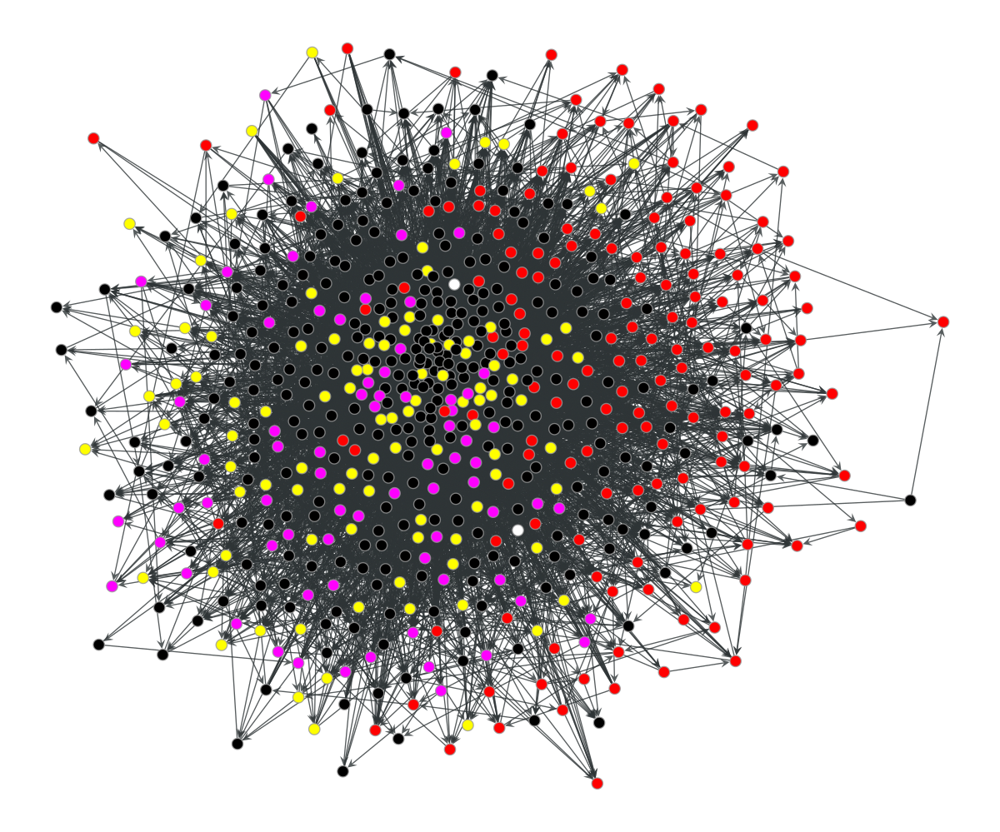

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fab3f51aa90, at 0x7fab469a14c0>

In [129]:
gt.graph_draw(gm17,
              pos=gt.sfdp_layout(gm17, 
                                 groups=gm17.vertex_properties['finalbs'],
                                 eweight=gt.prop_to_size(gm17.ep.eprob,0.0, 1000.0),
                                 gamma=0.01,
                                 #K=100
                                ),
              vertex_fill_color=gm17.own_property(g17.vertex_properties['partycolor']))

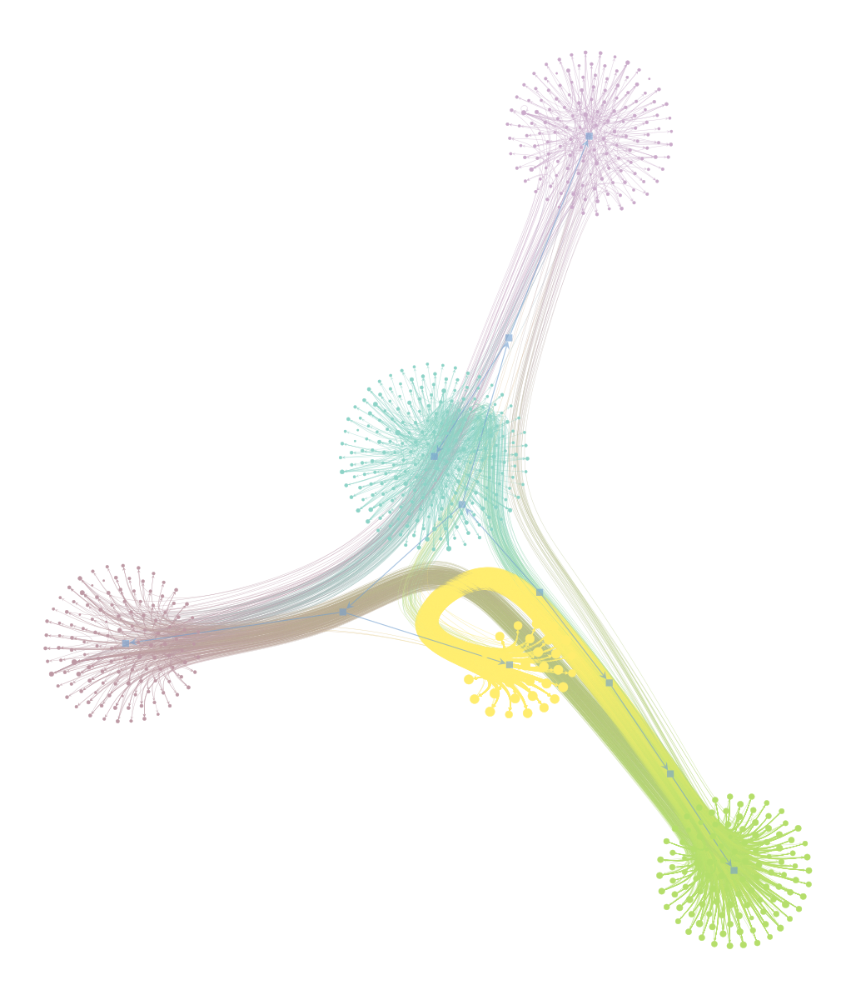

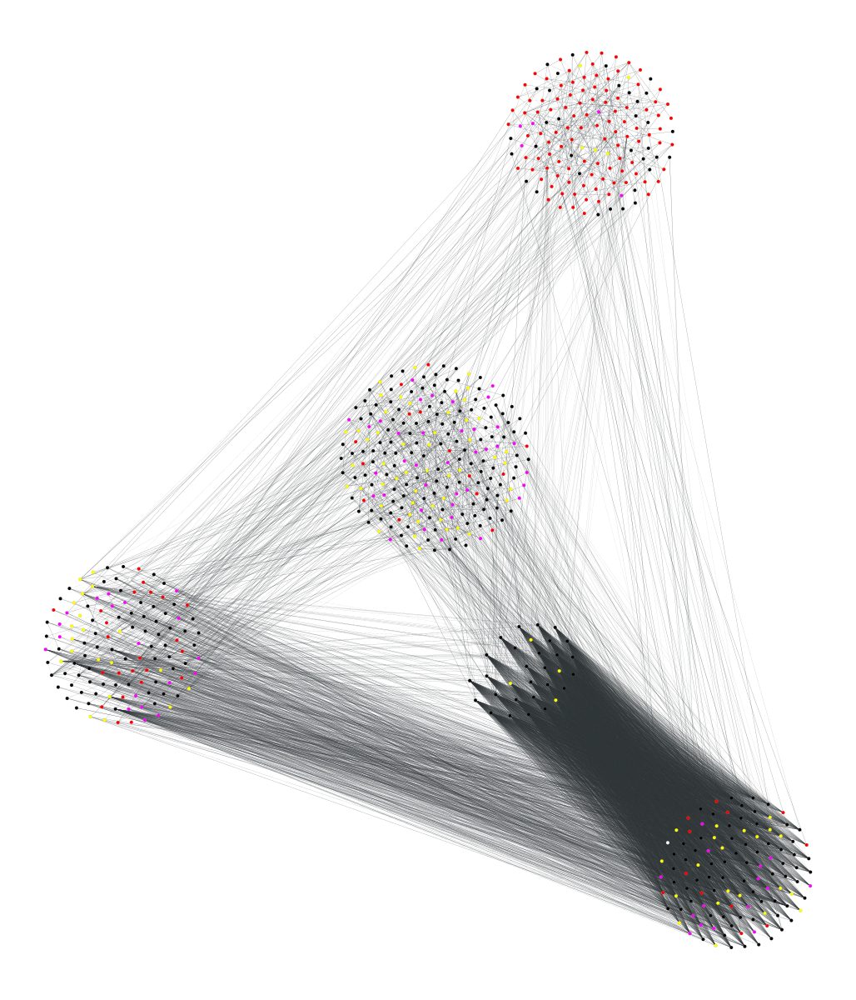

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fab3f51aa90, at 0x7fab469a1520>

In [122]:
hierpos17nestedpseudo, _, _ = state17nestedpseudo.get_block_state().draw(layout='sfdp')
gt.graph_draw(ogm17, 
              pos=hierpos17nestedpseudo,
              vertex_fill_color=gm17.own_property(g17.vertex_properties['partycolor']),
              edge_pen_width=gt.prop_to_size(gm17.ep.eprob, 0, 0.1),
              vertex_pen_width=0.1, vertex_size=2)

### SBM (non-nested) GlauberIsing reconstruction

In [54]:
state17nestedglauber = gt.IsingGlauberBlockState(g17, s=g17.vertex_properties['votingbeh'], beta=0.1, has_zero=True, nested=True, self_loops=False)

In [45]:
gm17glauber = None
bs17glauber = []

def collect_marginals(s):
    global gm17glauber, bs17glauber
    gm17glauber = s.collect_marginal(gm17glauber)
    bs17glauber.append(s.bstate.b.a.copy())

In [46]:
gt.mcmc_equilibrate(state17nestedglauber, wait=2000, callback=collect_marginals)

AttributeError: module 'graph_tool.inference.libgraph_tool_inference' has no attribute 'mcmc_ising_glauber_sweep_h'